### HOUSE SALE PRICING PREDICTION

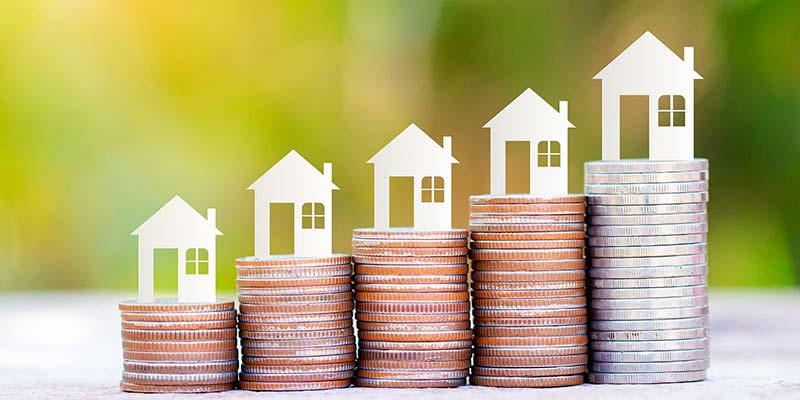

Hi folks! This is a beginners notebook that covers all the main steps necessary to complete a Machine Learning project. Here below you can see a detailed table of contents of the work:

**PREPROCESSING & EDA**

- Importing Libraries & Data
- Dealing with Duplicates and Nan
- Looking at correlations
- Data Normalization (Plots & Tests)


**MODELING**

- Baseline Models with 10-Folds CV
- Best Model (RandomGridSearch)
- Prediction
- Submission

In [1]:
# IMPORTING LIBRARIES & MAIN PATH
import warnings
warnings.filterwarnings(action="ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline




In [2]:
# IMPORTING DATA

house_data = pd.read_csv('AmesHousing.csv')
test = pd.read_csv('test.csv')
data_w = house_data.copy()
data_w.columns = data_w.columns.str.replace(' ', '') # Replacing the white spaces in columns' names
data_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order          2930 non-null   int64  
 1   PID            2930 non-null   int64  
 2   MSSubClass     2930 non-null   int64  
 3   MSZoning       2930 non-null   object 
 4   LotFrontage    2440 non-null   float64
 5   LotArea        2930 non-null   int64  
 6   Street         2930 non-null   object 
 7   Alley          198 non-null    object 
 8   LotShape       2930 non-null   object 
 9   LandContour    2930 non-null   object 
 10  Utilities      2930 non-null   object 
 11  LotConfig      2930 non-null   object 
 12  LandSlope      2930 non-null   object 
 13  Neighborhood   2930 non-null   object 
 14  Condition1     2930 non-null   object 
 15  Condition2     2930 non-null   object 
 16  BldgType       2930 non-null   object 
 17  HouseStyle     2930 non-null   object 
 18  OverallQ

In [3]:
data_w.head()

,Order,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


### EDA & VISUALIZATION

Before working with any kind of data it is important to understand them. A crucial step to this aim is the ***Exploratory data analysis (EDA)***: a combination of visualizations and statistical analysis (uni, bi, and multivariate) that helps us to better understand the data we are working with and to gain insight into their relationships. So, let's explore our target variable and how the other features influence it.

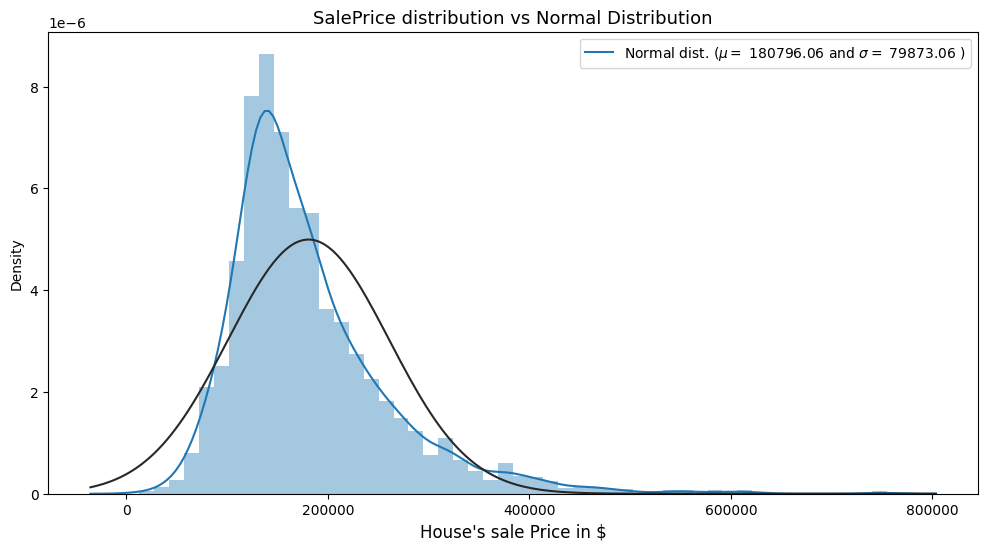

In [4]:
# Getting the main parameters of the Normal Ditribution ()
(mu, sigma) = norm.fit(data_w['SalePrice'])

plt.figure(figsize = (12,6))
sns.distplot(data_w['SalePrice'], kde = True, hist=True, fit = norm)
plt.title('SalePrice distribution vs Normal Distribution', fontsize = 13)
plt.xlabel("House's sale Price in $", fontsize = 12)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.show()

In literature, acceptable values for skewness are between -0.5 and 0.5 while -2 and 2 for Kurtosis. Looking at the plot, we can clearly see how the distribution does not seem to be normal, but highly right-skewed. The non-normality of our distribution is also supported by the Shapiro test for normality (p-value really small that allows us to reject the hypotesis of normality). Despite that, let's leave it like that for now, we'll deal with that later in the notebook. 

In [5]:
# Skew and kurt
from scipy import stats

shap_t,shap_p = stats.shapiro(data_w['SalePrice'])

print("Skewness: %f" % abs(data_w['SalePrice']).skew())
print("Kurtosis: %f" % abs(data_w['SalePrice']).kurt())
print("Shapiro_Test: %f" % shap_t)
print("Shapiro_Test: %f" % shap_p)

Skewness: 1.743500
Kurtosis: 5.118900
Shapiro_Test: 0.876261
Shapiro_Test: 0.000000


The correlation matrix is the best way to see all the numerical correlation between features. Let's see which are the feature that correlate most with our target variable.

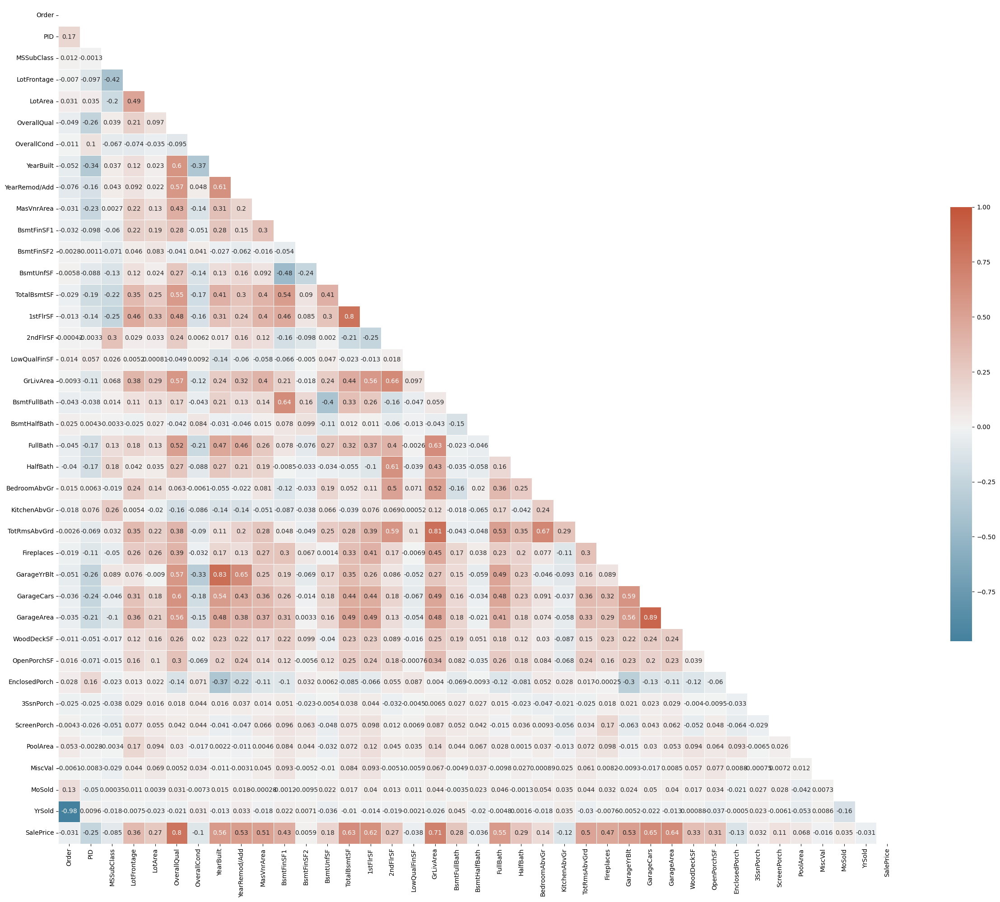

In [6]:
# Correlation Matrix

f, ax = plt.subplots(figsize=(30, 25))
mat = data_w.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Now that we know which features correlates most with our target variable we can investigate them more in depth.

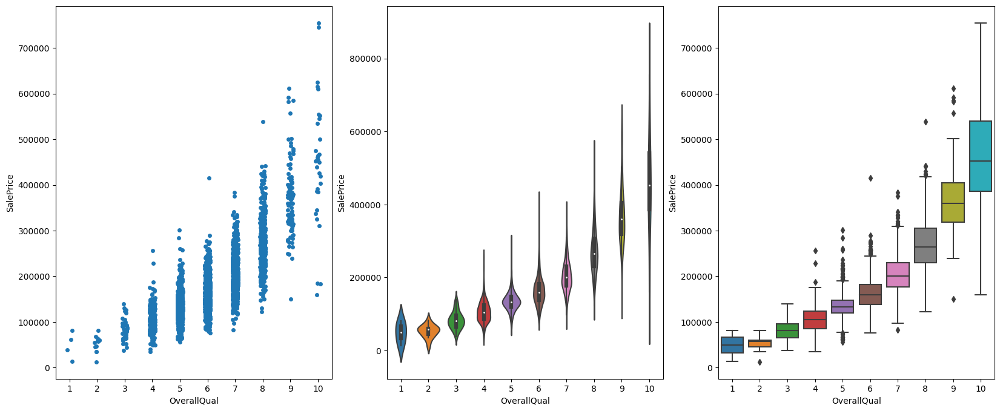

In [7]:
# OverallQuall - SalePrice [Pearson = 0.8]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[2])
plt.show()

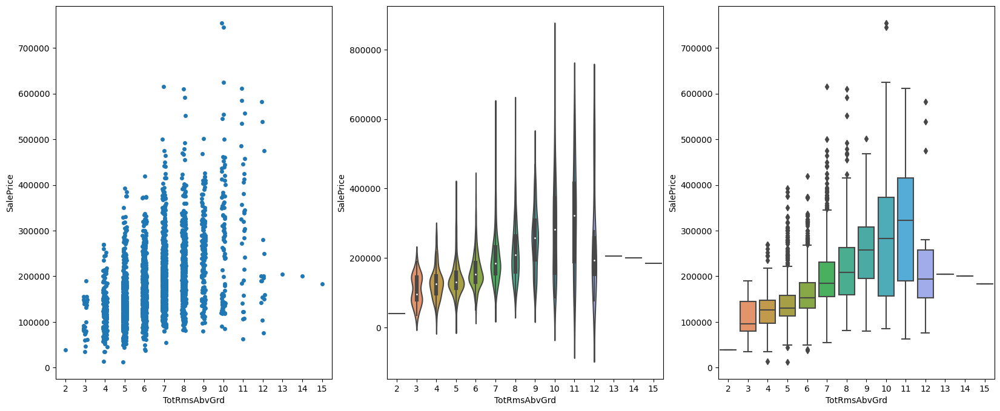

In [8]:
# TotRmsAbvGrd - SalePrice [Pearson = 0.50]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[2])
plt.show()

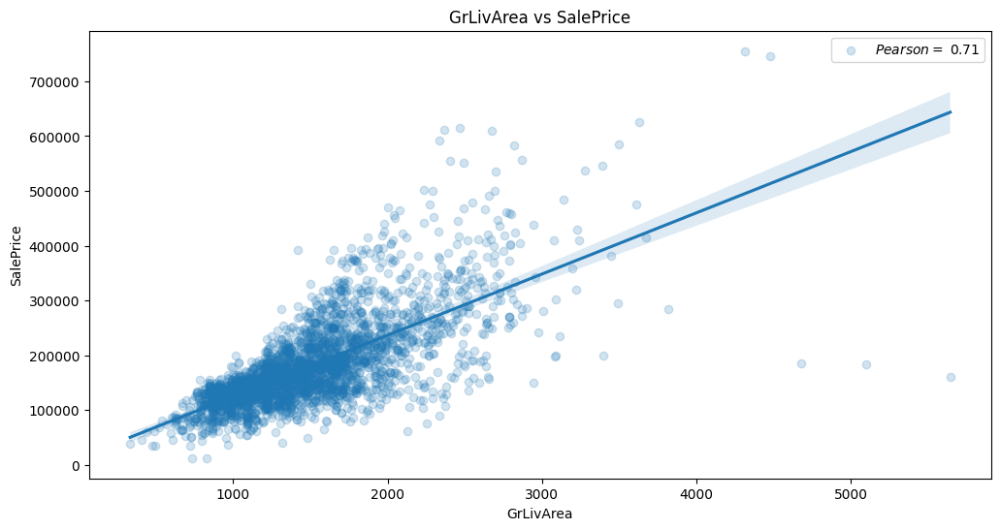

In [9]:
# GrLivArea vs SalePrice [corr = 0.71]

Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

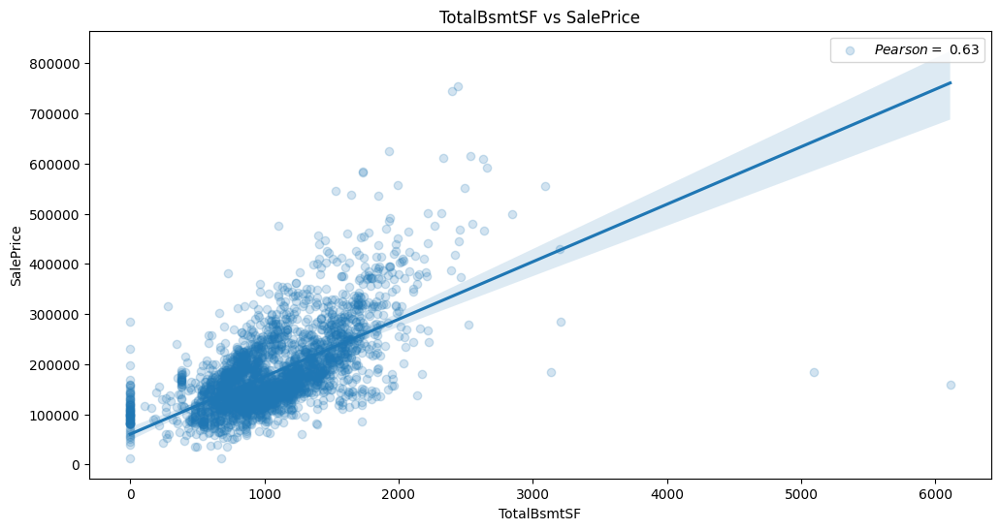

In [10]:
Pearson_TBSF = 0.63
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'TotalBsmtSF', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('TotalBsmtSF vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_TBSF)], loc = 'best')
plt.show()

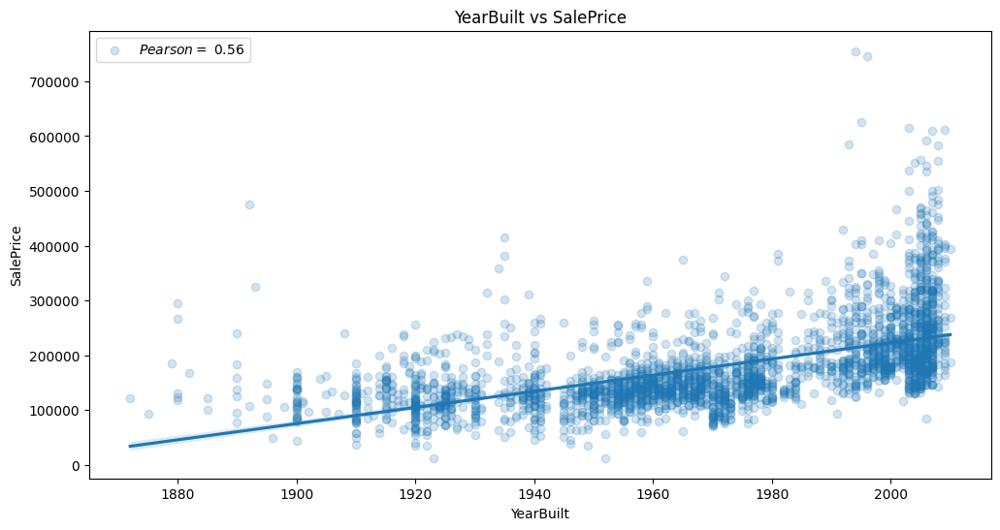

In [11]:
# YearBuilt vs SalePrice

Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

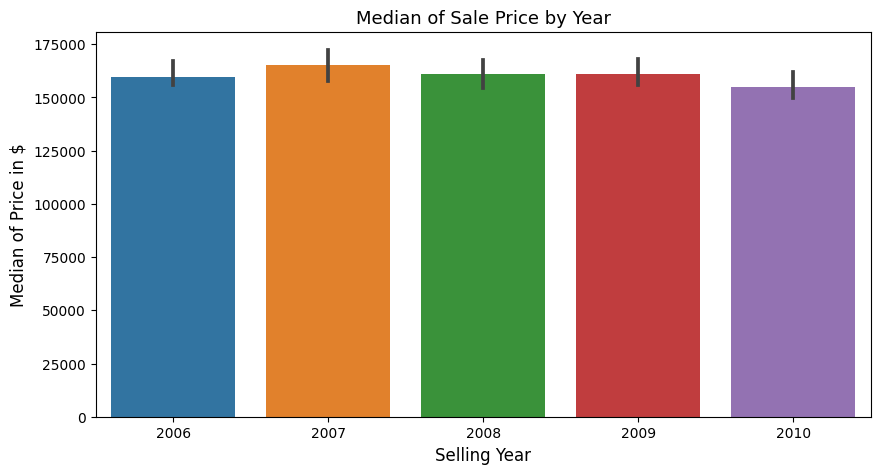

In [12]:
# Median of Sale Price by Year

plt.figure(figsize = (10,5))
sns.barplot(x='YrSold', y="SalePrice", data = data_w, estimator = np.median)
plt.title('Median of Sale Price by Year', fontsize = 13)
plt.xlabel('Selling Year', fontsize = 12)
plt.ylabel('Median of Price in $', fontsize = 12)
plt.show()

###  DATA PREPROCESSING

Now that we have some insights about data, we need to preprocess them for the modeling part. The main steps are:

- Looking at potential NaN
- Dealing with categorical features (e.g. Dummy coding)
- Normalization

N.B:

Usually, in a real-world project, the test data are not available until the end. For this reason, test data should contain the same type of data of the training set to preprocess them in the same way. Here, the test set is available. It contains some observations not present in the training dataset and,the use of dummy coding could raise several issues (I spent a lot of time figuring out why I was not able to make predictions on the test set). The easiest way to solve this problem (that is not applicable if test data are not available) is to concatenate Train and Test sets, preprocess, and divide them again.


In [13]:
# Separating Target and Features

target = data_w['SalePrice']
test_id = test['Id']
test = test.drop(['Id'],axis = 1)
data_w2 = data_w.drop(['SalePrice','Order','PID'], axis = 1)


# Concatenating train & test set

train_test = pd.concat([data_w2,test], axis=0, sort=False)

In [14]:
# Looking at NaN % within the data

nan = pd.DataFrame(train_test.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/1460)*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan

,NaN_sum,feat,Perc(%),Usability
Exterior1st,1,Exterior1st,0.068493,Keep
Exterior2nd,1,Exterior2nd,0.068493,Keep
KitchenQual,1,KitchenQual,0.068493,Keep
Electrical,1,Electrical,0.068493,Keep
SaleType,1,SaleType,0.068493,Keep
TotalBsmtSF,2,TotalBsmtSF,0.136986,Keep
GarageArea,2,GarageArea,0.136986,Keep
GarageCars,2,GarageCars,0.136986,Keep
Utilities,2,Utilities,0.136986,Keep
Functional,2,Functional,0.136986,Keep


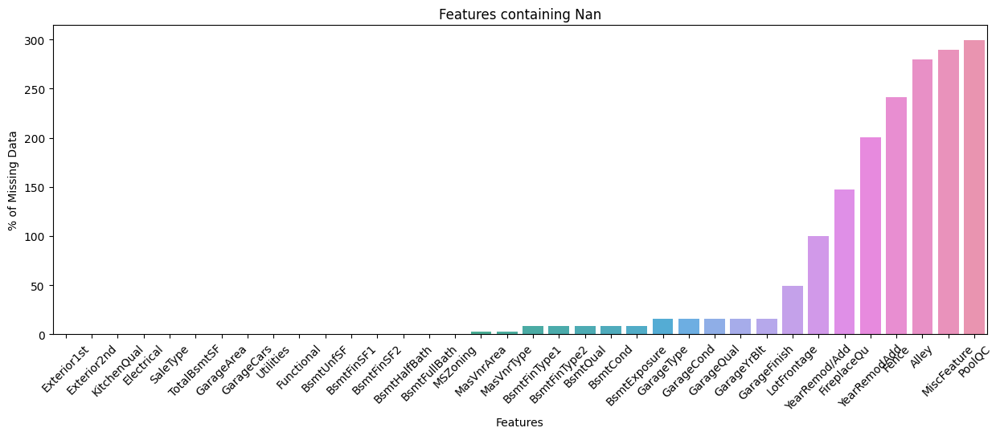

In [15]:
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

Are we sure that all these nans are real missing values? Looking at the given description file, we can see how the majority of these nans reflect the absence of something, and for this reason, they are not nans. We can impute them (for numerical features) or substitute them with data in the file:

In [16]:
# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Filling Categorical NaN (That we know how to fill due to the description file )

train_test['Functional'] = train_test['Functional'].fillna('Typ')
train_test['Electrical'] = train_test['Electrical'].fillna("SBrkr")
train_test['KitchenQual'] = train_test['KitchenQual'].fillna("TA")
train_test['Exterior1st'] = train_test['Exterior1st'].fillna(train_test['Exterior1st'].mode()[0])
train_test['Exterior2nd'] = train_test['Exterior2nd'].fillna(train_test['Exterior2nd'].mode()[0])
train_test['SaleType'] = train_test['SaleType'].fillna(train_test['SaleType'].mode()[0])
train_test["PoolQC"] = train_test["PoolQC"].fillna("None")
train_test["Alley"] = train_test["Alley"].fillna("None")
train_test['FireplaceQu'] = train_test['FireplaceQu'].fillna("None")
train_test['Fence'] = train_test['Fence'].fillna("None")
train_test['MiscFeature'] = train_test['MiscFeature'].fillna("None")

for col in ('GarageArea', 'GarageCars'):
    train_test[col] = train_test[col].fillna(0)
        
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_test[col] = train_test[col].fillna('None')
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_test[col] = train_test[col].fillna('None')
    
    # Checking the features with NaN remained out

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

0    RL
0    RH
Name: MSZoning, dtype: object
0    141.0
0     80.0
Name: LotFrontage, dtype: float64
0    AllPub
0    AllPub
Name: Utilities, dtype: object
0    1960.0
0       NaN
Name: YearRemod/Add, dtype: float64
0    Stone
0     None
Name: MasVnrType, dtype: object
0    112.0
0      0.0
Name: MasVnrArea, dtype: float64
0    639.0
0    468.0
Name: BsmtFinSF1, dtype: float64
0      0.0
0    144.0
Name: BsmtFinSF2, dtype: float64
0    441.0
0    270.0
Name: BsmtUnfSF, dtype: float64
0    1080.0
0     882.0
Name: TotalBsmtSF, dtype: float64
0    1.0
0    0.0
Name: BsmtFullBath, dtype: float64
0    0.0
0    0.0
Name: BsmtHalfBath, dtype: float64
0    1960.0
0    1961.0
Name: GarageYrBlt, dtype: float64
0       NaN
0    1961.0
Name: YearRemodAdd, dtype: float64


In [17]:
# Removing the useless variables

useless = ['GarageYrBlt','YearRemodAdd'] 
train_test = train_test.drop(useless, axis = 1)

# Imputing with KnnRegressor (we can also use different Imputers)

def impute_knn(df):
    ttn = train_test.select_dtypes(include=[np.number])
    ttc = train_test.select_dtypes(exclude=[np.number])

    cols_nan = ttn.columns[ttn.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ttn.columns.difference(cols_nan).values     # columns w/n nan

    for col in cols_nan:
        imp_test = ttn[ttn[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ttn.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ttn.loc[ttn[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ttn,ttc],axis=1)

train_test = impute_knn(train_test)


objects = []
for i in train_test.columns:
    if train_test[i].dtype == object:
        objects.append(i)
train_test.update(train_test[objects].fillna('None'))

# # Checking NaN presence

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

### FEATURE ENGINEERING

Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [18]:
train_test["SqFtPerRoom"] = train_test["GrLivArea"] / (train_test["TotRmsAbvGrd"] +
                                                       train_test["FullBath"] +
                                                       train_test["HalfBath"] +
                                                       train_test["KitchenAbvGr"])

train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']

train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))

train_test["HighQualSF"] = train_test["1stFlrSF"] + train_test["2ndFlrSF"]

# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Creating dummy variables from categorical features

train_test_dummy = pd.get_dummies(train_test)

# Fetch all numeric features

#train_test['Id'] = train_test['Id'].apply(str)
numeric_features = train_test_dummy.dtypes[train_test_dummy.dtypes != object].index
skewed_features = train_test_dummy[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_features[skewed_features > 0.5]
skew_index = high_skew.index

# Normalize skewed features using log_transformation
    
for i in skew_index:
    train_test_dummy[i] = np.log1p(train_test_dummy[i])

Now let's try to tranform our target distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.  

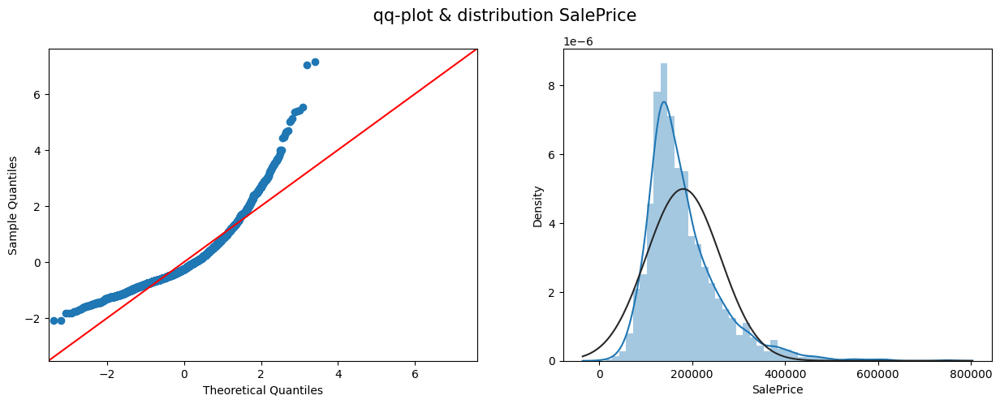

In [19]:
# SalePrice before transformation

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(target, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

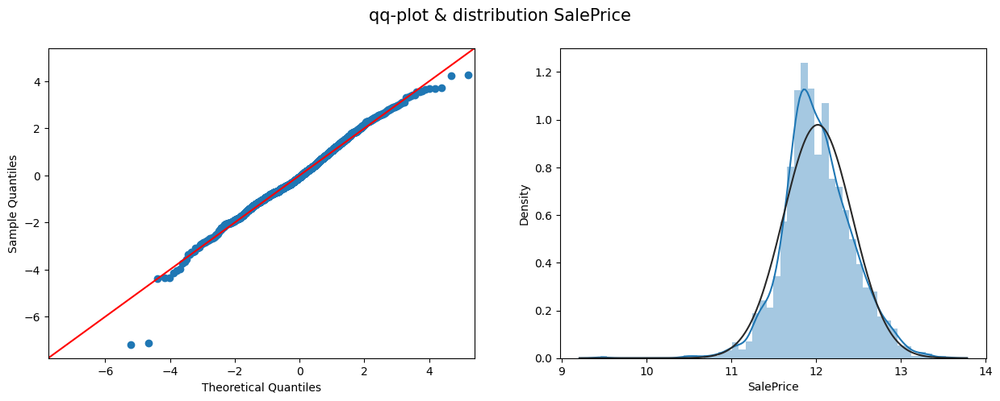

In [20]:
# SalePrice after transformation

target_log = np.log1p(target)

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

### MODELING

In [21]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

In [22]:
# Train-Test separation

train = train_test_dummy[0:2930]
test = train_test_dummy[2930:]
test['Id'] = test_id

# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target_log, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [23]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Learning rate set to 0.047722
0:	learn: 0.3917407	total: 143ms	remaining: 2m 22s
1:	learn: 0.3786939	total: 148ms	remaining: 1m 13s
2:	learn: 0.3664429	total: 152ms	remaining: 50.5s
3:	learn: 0.3554183	total: 155ms	remaining: 38.5s
4:	learn: 0.3450228	total: 158ms	remaining: 31.5s
5:	learn: 0.3350609	total: 163ms	remaining: 26.9s
6:	learn: 0.3253320	total: 165ms	remaining: 23.4s
7:	learn: 0.3160863	total: 167ms	remaining: 20.8s
8:	learn: 0.3077236	total: 170ms	remaining: 18.7s
9:	learn: 0.2989079	total: 172ms	remaining: 17s
10:	learn: 0.2910509	total: 174ms	remaining: 15.6s
11:	learn: 0.2835823	total: 176ms	remaining: 14.5s
12:	learn: 0.2762048	total: 178ms	remaining: 13.5s
13:	learn: 0.2687946	total: 180ms	remaining: 12.7s
14:	learn: 0.2615219	total: 182ms	remaining: 11.9s
15:	learn: 0.2552458	total: 184ms	remaining: 11.3s
16:	learn: 0.2486822	total: 186ms	remaining: 10.8s
17:	learn: 0.2429854	total: 188ms	remaining: 10.3s
18:	learn: 0.2380385	total: 190ms	remaining: 9.82s
19:	learn: 

232:	learn: 0.0933667	total: 597ms	remaining: 1.96s
233:	learn: 0.0931622	total: 599ms	remaining: 1.96s
234:	learn: 0.0930346	total: 601ms	remaining: 1.96s
235:	learn: 0.0928983	total: 603ms	remaining: 1.95s
236:	learn: 0.0927267	total: 606ms	remaining: 1.95s
237:	learn: 0.0925671	total: 608ms	remaining: 1.95s
238:	learn: 0.0924995	total: 610ms	remaining: 1.94s
239:	learn: 0.0923567	total: 612ms	remaining: 1.94s
240:	learn: 0.0922632	total: 614ms	remaining: 1.93s
241:	learn: 0.0922341	total: 617ms	remaining: 1.93s
242:	learn: 0.0920842	total: 619ms	remaining: 1.93s
243:	learn: 0.0919535	total: 621ms	remaining: 1.92s
244:	learn: 0.0917982	total: 623ms	remaining: 1.92s
245:	learn: 0.0916675	total: 625ms	remaining: 1.92s
246:	learn: 0.0916433	total: 627ms	remaining: 1.91s
247:	learn: 0.0915425	total: 630ms	remaining: 1.91s
248:	learn: 0.0914232	total: 632ms	remaining: 1.91s
249:	learn: 0.0912855	total: 634ms	remaining: 1.9s
250:	learn: 0.0912632	total: 636ms	remaining: 1.9s
251:	learn: 0.

429:	learn: 0.0752486	total: 991ms	remaining: 1.31s
430:	learn: 0.0751258	total: 994ms	remaining: 1.31s
431:	learn: 0.0750451	total: 996ms	remaining: 1.31s
432:	learn: 0.0749686	total: 998ms	remaining: 1.31s
433:	learn: 0.0748478	total: 1s	remaining: 1.3s
434:	learn: 0.0747664	total: 1s	remaining: 1.3s
435:	learn: 0.0746786	total: 1s	remaining: 1.3s
436:	learn: 0.0746701	total: 1.01s	remaining: 1.3s
437:	learn: 0.0745882	total: 1.01s	remaining: 1.29s
438:	learn: 0.0745208	total: 1.01s	remaining: 1.29s
439:	learn: 0.0744388	total: 1.01s	remaining: 1.29s
440:	learn: 0.0744272	total: 1.01s	remaining: 1.29s
441:	learn: 0.0744157	total: 1.02s	remaining: 1.28s
442:	learn: 0.0742875	total: 1.02s	remaining: 1.28s
443:	learn: 0.0742277	total: 1.02s	remaining: 1.28s
444:	learn: 0.0741467	total: 1.02s	remaining: 1.28s
445:	learn: 0.0740375	total: 1.03s	remaining: 1.27s
446:	learn: 0.0739651	total: 1.03s	remaining: 1.27s
447:	learn: 0.0738818	total: 1.03s	remaining: 1.27s
448:	learn: 0.0737581	tot

633:	learn: 0.0621468	total: 1.39s	remaining: 800ms
634:	learn: 0.0620653	total: 1.39s	remaining: 798ms
635:	learn: 0.0620166	total: 1.39s	remaining: 796ms
636:	learn: 0.0619679	total: 1.39s	remaining: 794ms
637:	learn: 0.0618930	total: 1.4s	remaining: 792ms
638:	learn: 0.0618410	total: 1.4s	remaining: 789ms
639:	learn: 0.0617734	total: 1.4s	remaining: 787ms
640:	learn: 0.0617223	total: 1.4s	remaining: 785ms
641:	learn: 0.0617098	total: 1.4s	remaining: 783ms
642:	learn: 0.0616507	total: 1.41s	remaining: 780ms
643:	learn: 0.0615976	total: 1.41s	remaining: 778ms
644:	learn: 0.0615517	total: 1.41s	remaining: 776ms
645:	learn: 0.0614879	total: 1.41s	remaining: 774ms
646:	learn: 0.0614237	total: 1.41s	remaining: 771ms
647:	learn: 0.0613648	total: 1.42s	remaining: 769ms
648:	learn: 0.0612905	total: 1.42s	remaining: 766ms
649:	learn: 0.0612664	total: 1.42s	remaining: 764ms
650:	learn: 0.0612555	total: 1.42s	remaining: 762ms
651:	learn: 0.0612480	total: 1.42s	remaining: 759ms
652:	learn: 0.061

843:	learn: 0.0528063	total: 1.79s	remaining: 332ms
844:	learn: 0.0527741	total: 1.8s	remaining: 330ms
845:	learn: 0.0527080	total: 1.8s	remaining: 328ms
846:	learn: 0.0526391	total: 1.8s	remaining: 325ms
847:	learn: 0.0525886	total: 1.8s	remaining: 323ms
848:	learn: 0.0525367	total: 1.8s	remaining: 321ms
849:	learn: 0.0524894	total: 1.81s	remaining: 319ms
850:	learn: 0.0524540	total: 1.81s	remaining: 317ms
851:	learn: 0.0524192	total: 1.81s	remaining: 315ms
852:	learn: 0.0523635	total: 1.81s	remaining: 312ms
853:	learn: 0.0523394	total: 1.81s	remaining: 310ms
854:	learn: 0.0522754	total: 1.82s	remaining: 308ms
855:	learn: 0.0522412	total: 1.82s	remaining: 306ms
856:	learn: 0.0522213	total: 1.82s	remaining: 304ms
857:	learn: 0.0521934	total: 1.82s	remaining: 302ms
858:	learn: 0.0521820	total: 1.82s	remaining: 299ms
859:	learn: 0.0521702	total: 1.82s	remaining: 297ms
860:	learn: 0.0521458	total: 1.83s	remaining: 295ms
861:	learn: 0.0520986	total: 1.83s	remaining: 293ms
862:	learn: 0.052

104:	learn: 0.1127296	total: 203ms	remaining: 1.73s
105:	learn: 0.1125625	total: 205ms	remaining: 1.73s
106:	learn: 0.1123457	total: 207ms	remaining: 1.73s
107:	learn: 0.1120669	total: 209ms	remaining: 1.73s
108:	learn: 0.1118512	total: 211ms	remaining: 1.73s
109:	learn: 0.1116230	total: 213ms	remaining: 1.72s
110:	learn: 0.1111918	total: 215ms	remaining: 1.72s
111:	learn: 0.1109608	total: 217ms	remaining: 1.72s
112:	learn: 0.1108978	total: 219ms	remaining: 1.72s
113:	learn: 0.1106007	total: 221ms	remaining: 1.72s
114:	learn: 0.1102632	total: 223ms	remaining: 1.71s
115:	learn: 0.1100477	total: 225ms	remaining: 1.71s
116:	learn: 0.1097260	total: 227ms	remaining: 1.71s
117:	learn: 0.1095136	total: 229ms	remaining: 1.71s
118:	learn: 0.1092556	total: 231ms	remaining: 1.71s
119:	learn: 0.1090422	total: 233ms	remaining: 1.71s
120:	learn: 0.1087567	total: 235ms	remaining: 1.7s
121:	learn: 0.1086026	total: 237ms	remaining: 1.7s
122:	learn: 0.1083913	total: 239ms	remaining: 1.7s
123:	learn: 0.1

314:	learn: 0.0846173	total: 599ms	remaining: 1.3s
315:	learn: 0.0845156	total: 601ms	remaining: 1.3s
316:	learn: 0.0844124	total: 603ms	remaining: 1.3s
317:	learn: 0.0842875	total: 605ms	remaining: 1.3s
318:	learn: 0.0842188	total: 607ms	remaining: 1.29s
319:	learn: 0.0841336	total: 609ms	remaining: 1.29s
320:	learn: 0.0840937	total: 611ms	remaining: 1.29s
321:	learn: 0.0839678	total: 613ms	remaining: 1.29s
322:	learn: 0.0839562	total: 614ms	remaining: 1.29s
323:	learn: 0.0839075	total: 616ms	remaining: 1.28s
324:	learn: 0.0837874	total: 618ms	remaining: 1.28s
325:	learn: 0.0836592	total: 621ms	remaining: 1.28s
326:	learn: 0.0835471	total: 623ms	remaining: 1.28s
327:	learn: 0.0834725	total: 625ms	remaining: 1.28s
328:	learn: 0.0833797	total: 626ms	remaining: 1.28s
329:	learn: 0.0832917	total: 628ms	remaining: 1.27s
330:	learn: 0.0831988	total: 630ms	remaining: 1.27s
331:	learn: 0.0830884	total: 632ms	remaining: 1.27s
332:	learn: 0.0829717	total: 634ms	remaining: 1.27s
333:	learn: 0.08

511:	learn: 0.0697125	total: 993ms	remaining: 947ms
512:	learn: 0.0696649	total: 995ms	remaining: 945ms
513:	learn: 0.0696573	total: 997ms	remaining: 943ms
514:	learn: 0.0696080	total: 999ms	remaining: 941ms
515:	learn: 0.0695345	total: 1s	remaining: 939ms
516:	learn: 0.0694740	total: 1s	remaining: 937ms
517:	learn: 0.0694171	total: 1s	remaining: 935ms
518:	learn: 0.0693670	total: 1.01s	remaining: 933ms
519:	learn: 0.0693043	total: 1.01s	remaining: 931ms
520:	learn: 0.0692471	total: 1.01s	remaining: 929ms
521:	learn: 0.0691817	total: 1.01s	remaining: 927ms
522:	learn: 0.0691273	total: 1.01s	remaining: 925ms
523:	learn: 0.0690529	total: 1.02s	remaining: 923ms
524:	learn: 0.0689843	total: 1.02s	remaining: 921ms
525:	learn: 0.0689455	total: 1.02s	remaining: 919ms
526:	learn: 0.0688852	total: 1.02s	remaining: 917ms
527:	learn: 0.0687988	total: 1.02s	remaining: 915ms
528:	learn: 0.0687321	total: 1.02s	remaining: 913ms
529:	learn: 0.0686705	total: 1.03s	remaining: 911ms
530:	learn: 0.0686217

721:	learn: 0.0579254	total: 1.39s	remaining: 536ms
722:	learn: 0.0578846	total: 1.39s	remaining: 534ms
723:	learn: 0.0578583	total: 1.4s	remaining: 532ms
724:	learn: 0.0577782	total: 1.4s	remaining: 530ms
725:	learn: 0.0577155	total: 1.4s	remaining: 528ms
726:	learn: 0.0576602	total: 1.4s	remaining: 526ms
727:	learn: 0.0575972	total: 1.4s	remaining: 525ms
728:	learn: 0.0575554	total: 1.41s	remaining: 523ms
729:	learn: 0.0575033	total: 1.41s	remaining: 521ms
730:	learn: 0.0574253	total: 1.41s	remaining: 519ms
731:	learn: 0.0573547	total: 1.41s	remaining: 517ms
732:	learn: 0.0573070	total: 1.41s	remaining: 515ms
733:	learn: 0.0572959	total: 1.42s	remaining: 513ms
734:	learn: 0.0572793	total: 1.42s	remaining: 511ms
735:	learn: 0.0572575	total: 1.42s	remaining: 509ms
736:	learn: 0.0572503	total: 1.42s	remaining: 507ms
737:	learn: 0.0571957	total: 1.42s	remaining: 505ms
738:	learn: 0.0571388	total: 1.43s	remaining: 503ms
739:	learn: 0.0570726	total: 1.43s	remaining: 501ms
740:	learn: 0.057

932:	learn: 0.0491331	total: 1.79s	remaining: 129ms
933:	learn: 0.0491265	total: 1.79s	remaining: 127ms
934:	learn: 0.0490840	total: 1.8s	remaining: 125ms
935:	learn: 0.0490428	total: 1.8s	remaining: 123ms
936:	learn: 0.0490124	total: 1.8s	remaining: 121ms
937:	learn: 0.0489576	total: 1.8s	remaining: 119ms
938:	learn: 0.0489540	total: 1.8s	remaining: 117ms
939:	learn: 0.0489270	total: 1.81s	remaining: 115ms
940:	learn: 0.0488898	total: 1.81s	remaining: 113ms
941:	learn: 0.0488620	total: 1.81s	remaining: 111ms
942:	learn: 0.0488268	total: 1.81s	remaining: 110ms
943:	learn: 0.0487967	total: 1.81s	remaining: 108ms
944:	learn: 0.0487554	total: 1.82s	remaining: 106ms
945:	learn: 0.0486907	total: 1.82s	remaining: 104ms
946:	learn: 0.0486399	total: 1.82s	remaining: 102ms
947:	learn: 0.0486289	total: 1.82s	remaining: 99.9ms
948:	learn: 0.0485818	total: 1.82s	remaining: 98ms
949:	learn: 0.0485690	total: 1.82s	remaining: 96.1ms
950:	learn: 0.0485285	total: 1.83s	remaining: 94.2ms
951:	learn: 0.0

95:	learn: 0.1162621	total: 203ms	remaining: 1.91s
96:	learn: 0.1158650	total: 205ms	remaining: 1.91s
97:	learn: 0.1155937	total: 207ms	remaining: 1.91s
98:	learn: 0.1152973	total: 209ms	remaining: 1.9s
99:	learn: 0.1149334	total: 211ms	remaining: 1.9s
100:	learn: 0.1145812	total: 213ms	remaining: 1.9s
101:	learn: 0.1142126	total: 215ms	remaining: 1.89s
102:	learn: 0.1139094	total: 217ms	remaining: 1.89s
103:	learn: 0.1135909	total: 219ms	remaining: 1.88s
104:	learn: 0.1131895	total: 221ms	remaining: 1.88s
105:	learn: 0.1129175	total: 222ms	remaining: 1.88s
106:	learn: 0.1127734	total: 224ms	remaining: 1.87s
107:	learn: 0.1124996	total: 226ms	remaining: 1.87s
108:	learn: 0.1120837	total: 228ms	remaining: 1.86s
109:	learn: 0.1117621	total: 229ms	remaining: 1.86s
110:	learn: 0.1116143	total: 231ms	remaining: 1.85s
111:	learn: 0.1113107	total: 233ms	remaining: 1.85s
112:	learn: 0.1112613	total: 235ms	remaining: 1.84s
113:	learn: 0.1110172	total: 236ms	remaining: 1.84s
114:	learn: 0.110802

290:	learn: 0.0847214	total: 598ms	remaining: 1.46s
291:	learn: 0.0845951	total: 600ms	remaining: 1.45s
292:	learn: 0.0845631	total: 602ms	remaining: 1.45s
293:	learn: 0.0845434	total: 603ms	remaining: 1.45s
294:	learn: 0.0844079	total: 605ms	remaining: 1.45s
295:	learn: 0.0842833	total: 607ms	remaining: 1.44s
296:	learn: 0.0841461	total: 609ms	remaining: 1.44s
297:	learn: 0.0840035	total: 611ms	remaining: 1.44s
298:	learn: 0.0839072	total: 613ms	remaining: 1.44s
299:	learn: 0.0838088	total: 615ms	remaining: 1.43s
300:	learn: 0.0837076	total: 616ms	remaining: 1.43s
301:	learn: 0.0836874	total: 618ms	remaining: 1.43s
302:	learn: 0.0835982	total: 620ms	remaining: 1.43s
303:	learn: 0.0835750	total: 622ms	remaining: 1.42s
304:	learn: 0.0834502	total: 623ms	remaining: 1.42s
305:	learn: 0.0833791	total: 625ms	remaining: 1.42s
306:	learn: 0.0833622	total: 627ms	remaining: 1.42s
307:	learn: 0.0832599	total: 629ms	remaining: 1.41s
308:	learn: 0.0831937	total: 631ms	remaining: 1.41s
309:	learn: 

491:	learn: 0.0686876	total: 993ms	remaining: 1.02s
492:	learn: 0.0686385	total: 995ms	remaining: 1.02s
493:	learn: 0.0685882	total: 997ms	remaining: 1.02s
494:	learn: 0.0684996	total: 999ms	remaining: 1.02s
495:	learn: 0.0684289	total: 1s	remaining: 1.02s
496:	learn: 0.0683583	total: 1s	remaining: 1.01s
497:	learn: 0.0682601	total: 1s	remaining: 1.01s
498:	learn: 0.0682097	total: 1.01s	remaining: 1.01s
499:	learn: 0.0681258	total: 1.01s	remaining: 1.01s
500:	learn: 0.0680670	total: 1.01s	remaining: 1s
501:	learn: 0.0680177	total: 1.01s	remaining: 1s
502:	learn: 0.0679659	total: 1.01s	remaining: 1s
503:	learn: 0.0679062	total: 1.01s	remaining: 999ms
504:	learn: 0.0678775	total: 1.02s	remaining: 997ms
505:	learn: 0.0678500	total: 1.02s	remaining: 995ms
506:	learn: 0.0677312	total: 1.02s	remaining: 993ms
507:	learn: 0.0676620	total: 1.02s	remaining: 990ms
508:	learn: 0.0675993	total: 1.02s	remaining: 988ms
509:	learn: 0.0675312	total: 1.03s	remaining: 986ms
510:	learn: 0.0674640	total: 1

701:	learn: 0.0578172	total: 1.39s	remaining: 589ms
702:	learn: 0.0577833	total: 1.39s	remaining: 587ms
703:	learn: 0.0577307	total: 1.39s	remaining: 585ms
704:	learn: 0.0577261	total: 1.39s	remaining: 583ms
705:	learn: 0.0576640	total: 1.39s	remaining: 581ms
706:	learn: 0.0576250	total: 1.4s	remaining: 579ms
707:	learn: 0.0575657	total: 1.4s	remaining: 577ms
708:	learn: 0.0575407	total: 1.4s	remaining: 575ms
709:	learn: 0.0575031	total: 1.4s	remaining: 573ms
710:	learn: 0.0574541	total: 1.4s	remaining: 571ms
711:	learn: 0.0573856	total: 1.41s	remaining: 569ms
712:	learn: 0.0573409	total: 1.41s	remaining: 566ms
713:	learn: 0.0572893	total: 1.41s	remaining: 564ms
714:	learn: 0.0572311	total: 1.41s	remaining: 562ms
715:	learn: 0.0571562	total: 1.41s	remaining: 560ms
716:	learn: 0.0571026	total: 1.41s	remaining: 558ms
717:	learn: 0.0570579	total: 1.42s	remaining: 556ms
718:	learn: 0.0570272	total: 1.42s	remaining: 554ms
719:	learn: 0.0569782	total: 1.42s	remaining: 552ms
720:	learn: 0.056

903:	learn: 0.0495586	total: 1.78s	remaining: 189ms
904:	learn: 0.0495171	total: 1.78s	remaining: 187ms
905:	learn: 0.0494780	total: 1.79s	remaining: 185ms
906:	learn: 0.0494753	total: 1.79s	remaining: 184ms
907:	learn: 0.0494369	total: 1.79s	remaining: 182ms
908:	learn: 0.0493893	total: 1.79s	remaining: 180ms
909:	learn: 0.0493713	total: 1.79s	remaining: 178ms
910:	learn: 0.0493386	total: 1.8s	remaining: 176ms
911:	learn: 0.0492930	total: 1.8s	remaining: 174ms
912:	learn: 0.0492533	total: 1.8s	remaining: 172ms
913:	learn: 0.0491926	total: 1.8s	remaining: 170ms
914:	learn: 0.0491406	total: 1.8s	remaining: 168ms
915:	learn: 0.0491057	total: 1.8s	remaining: 166ms
916:	learn: 0.0490858	total: 1.81s	remaining: 164ms
917:	learn: 0.0490307	total: 1.81s	remaining: 162ms
918:	learn: 0.0489845	total: 1.81s	remaining: 160ms
919:	learn: 0.0489438	total: 1.81s	remaining: 158ms
920:	learn: 0.0489042	total: 1.81s	remaining: 156ms
921:	learn: 0.0488713	total: 1.82s	remaining: 154ms
922:	learn: 0.0488

105:	learn: 0.1101916	total: 202ms	remaining: 1.7s
106:	learn: 0.1099127	total: 204ms	remaining: 1.7s
107:	learn: 0.1096008	total: 206ms	remaining: 1.7s
108:	learn: 0.1095173	total: 208ms	remaining: 1.7s
109:	learn: 0.1091807	total: 210ms	remaining: 1.7s
110:	learn: 0.1089224	total: 212ms	remaining: 1.7s
111:	learn: 0.1088444	total: 214ms	remaining: 1.7s
112:	learn: 0.1086196	total: 216ms	remaining: 1.7s
113:	learn: 0.1082333	total: 218ms	remaining: 1.7s
114:	learn: 0.1079713	total: 220ms	remaining: 1.7s
115:	learn: 0.1076915	total: 222ms	remaining: 1.69s
116:	learn: 0.1074260	total: 224ms	remaining: 1.69s
117:	learn: 0.1073447	total: 226ms	remaining: 1.69s
118:	learn: 0.1071796	total: 228ms	remaining: 1.69s
119:	learn: 0.1069212	total: 230ms	remaining: 1.69s
120:	learn: 0.1067788	total: 233ms	remaining: 1.69s
121:	learn: 0.1066868	total: 234ms	remaining: 1.69s
122:	learn: 0.1064375	total: 236ms	remaining: 1.68s
123:	learn: 0.1061670	total: 238ms	remaining: 1.68s
124:	learn: 0.1059357	

308:	learn: 0.0829168	total: 597ms	remaining: 1.33s
309:	learn: 0.0827655	total: 599ms	remaining: 1.33s
310:	learn: 0.0826537	total: 601ms	remaining: 1.33s
311:	learn: 0.0825413	total: 603ms	remaining: 1.33s
312:	learn: 0.0824469	total: 605ms	remaining: 1.33s
313:	learn: 0.0824033	total: 608ms	remaining: 1.33s
314:	learn: 0.0822407	total: 609ms	remaining: 1.32s
315:	learn: 0.0822121	total: 611ms	remaining: 1.32s
316:	learn: 0.0821259	total: 613ms	remaining: 1.32s
317:	learn: 0.0820375	total: 615ms	remaining: 1.32s
318:	learn: 0.0819659	total: 617ms	remaining: 1.32s
319:	learn: 0.0818752	total: 619ms	remaining: 1.31s
320:	learn: 0.0817721	total: 621ms	remaining: 1.31s
321:	learn: 0.0816885	total: 623ms	remaining: 1.31s
322:	learn: 0.0814969	total: 625ms	remaining: 1.31s
323:	learn: 0.0814202	total: 627ms	remaining: 1.31s
324:	learn: 0.0814040	total: 628ms	remaining: 1.3s
325:	learn: 0.0812737	total: 630ms	remaining: 1.3s
326:	learn: 0.0811680	total: 632ms	remaining: 1.3s
327:	learn: 0.0

516:	learn: 0.0670531	total: 998ms	remaining: 932ms
517:	learn: 0.0669882	total: 1000ms	remaining: 930ms
518:	learn: 0.0669001	total: 1s	remaining: 929ms
519:	learn: 0.0668266	total: 1s	remaining: 927ms
520:	learn: 0.0667730	total: 1.01s	remaining: 925ms
521:	learn: 0.0667171	total: 1.01s	remaining: 924ms
522:	learn: 0.0666588	total: 1.01s	remaining: 922ms
523:	learn: 0.0666138	total: 1.01s	remaining: 920ms
524:	learn: 0.0665488	total: 1.01s	remaining: 918ms
525:	learn: 0.0664986	total: 1.02s	remaining: 916ms
526:	learn: 0.0664213	total: 1.02s	remaining: 914ms
527:	learn: 0.0663699	total: 1.02s	remaining: 912ms
528:	learn: 0.0663124	total: 1.02s	remaining: 910ms
529:	learn: 0.0662721	total: 1.02s	remaining: 908ms
530:	learn: 0.0661965	total: 1.03s	remaining: 906ms
531:	learn: 0.0661341	total: 1.03s	remaining: 905ms
532:	learn: 0.0660050	total: 1.03s	remaining: 903ms
533:	learn: 0.0659390	total: 1.03s	remaining: 901ms
534:	learn: 0.0658656	total: 1.03s	remaining: 899ms
535:	learn: 0.065

721:	learn: 0.0559334	total: 1.39s	remaining: 537ms
722:	learn: 0.0558885	total: 1.4s	remaining: 535ms
723:	learn: 0.0558344	total: 1.4s	remaining: 533ms
724:	learn: 0.0557793	total: 1.4s	remaining: 531ms
725:	learn: 0.0557584	total: 1.4s	remaining: 529ms
726:	learn: 0.0557137	total: 1.4s	remaining: 527ms
727:	learn: 0.0556735	total: 1.41s	remaining: 525ms
728:	learn: 0.0556215	total: 1.41s	remaining: 523ms
729:	learn: 0.0555682	total: 1.41s	remaining: 521ms
730:	learn: 0.0555227	total: 1.41s	remaining: 520ms
731:	learn: 0.0554615	total: 1.41s	remaining: 518ms
732:	learn: 0.0554177	total: 1.42s	remaining: 516ms
733:	learn: 0.0553569	total: 1.42s	remaining: 514ms
734:	learn: 0.0553046	total: 1.42s	remaining: 512ms
735:	learn: 0.0552633	total: 1.42s	remaining: 510ms
736:	learn: 0.0552236	total: 1.42s	remaining: 508ms
737:	learn: 0.0551582	total: 1.43s	remaining: 507ms
738:	learn: 0.0551094	total: 1.43s	remaining: 505ms
739:	learn: 0.0550425	total: 1.43s	remaining: 503ms
740:	learn: 0.055

929:	learn: 0.0477461	total: 1.79s	remaining: 135ms
930:	learn: 0.0477425	total: 1.79s	remaining: 133ms
931:	learn: 0.0477158	total: 1.79s	remaining: 131ms
932:	learn: 0.0476467	total: 1.79s	remaining: 129ms
933:	learn: 0.0475967	total: 1.79s	remaining: 127ms
934:	learn: 0.0475451	total: 1.8s	remaining: 125ms
935:	learn: 0.0475139	total: 1.8s	remaining: 123ms
936:	learn: 0.0474622	total: 1.8s	remaining: 121ms
937:	learn: 0.0474188	total: 1.8s	remaining: 119ms
938:	learn: 0.0473726	total: 1.81s	remaining: 117ms
939:	learn: 0.0473172	total: 1.81s	remaining: 115ms
940:	learn: 0.0472683	total: 1.81s	remaining: 114ms
941:	learn: 0.0472251	total: 1.81s	remaining: 112ms
942:	learn: 0.0471927	total: 1.81s	remaining: 110ms
943:	learn: 0.0471701	total: 1.82s	remaining: 108ms
944:	learn: 0.0471160	total: 1.82s	remaining: 106ms
945:	learn: 0.0470886	total: 1.82s	remaining: 104ms
946:	learn: 0.0470750	total: 1.82s	remaining: 102ms
947:	learn: 0.0470393	total: 1.82s	remaining: 100ms
948:	learn: 0.04

95:	learn: 0.1122298	total: 202ms	remaining: 1.9s
96:	learn: 0.1119221	total: 204ms	remaining: 1.9s
97:	learn: 0.1115965	total: 207ms	remaining: 1.9s
98:	learn: 0.1112750	total: 209ms	remaining: 1.9s
99:	learn: 0.1109681	total: 211ms	remaining: 1.9s
100:	learn: 0.1106914	total: 213ms	remaining: 1.9s
101:	learn: 0.1103624	total: 216ms	remaining: 1.9s
102:	learn: 0.1100555	total: 218ms	remaining: 1.9s
103:	learn: 0.1096811	total: 220ms	remaining: 1.9s
104:	learn: 0.1092449	total: 222ms	remaining: 1.89s
105:	learn: 0.1089291	total: 224ms	remaining: 1.89s
106:	learn: 0.1087298	total: 227ms	remaining: 1.89s
107:	learn: 0.1083556	total: 229ms	remaining: 1.89s
108:	learn: 0.1080730	total: 231ms	remaining: 1.88s
109:	learn: 0.1077846	total: 233ms	remaining: 1.88s
110:	learn: 0.1075454	total: 235ms	remaining: 1.88s
111:	learn: 0.1072396	total: 236ms	remaining: 1.87s
112:	learn: 0.1069536	total: 238ms	remaining: 1.87s
113:	learn: 0.1066894	total: 240ms	remaining: 1.86s
114:	learn: 0.1064554	tota

304:	learn: 0.0822372	total: 600ms	remaining: 1.37s
305:	learn: 0.0821157	total: 602ms	remaining: 1.36s
306:	learn: 0.0819914	total: 604ms	remaining: 1.36s
307:	learn: 0.0818851	total: 606ms	remaining: 1.36s
308:	learn: 0.0817781	total: 609ms	remaining: 1.36s
309:	learn: 0.0816552	total: 611ms	remaining: 1.36s
310:	learn: 0.0815661	total: 612ms	remaining: 1.36s
311:	learn: 0.0815482	total: 614ms	remaining: 1.35s
312:	learn: 0.0814534	total: 616ms	remaining: 1.35s
313:	learn: 0.0813637	total: 618ms	remaining: 1.35s
314:	learn: 0.0813457	total: 620ms	remaining: 1.35s
315:	learn: 0.0812310	total: 622ms	remaining: 1.35s
316:	learn: 0.0811677	total: 624ms	remaining: 1.34s
317:	learn: 0.0810964	total: 626ms	remaining: 1.34s
318:	learn: 0.0809987	total: 627ms	remaining: 1.34s
319:	learn: 0.0808616	total: 629ms	remaining: 1.34s
320:	learn: 0.0807825	total: 631ms	remaining: 1.33s
321:	learn: 0.0806762	total: 633ms	remaining: 1.33s
322:	learn: 0.0806603	total: 634ms	remaining: 1.33s
323:	learn: 

516:	learn: 0.0664324	total: 996ms	remaining: 930ms
517:	learn: 0.0663601	total: 998ms	remaining: 929ms
518:	learn: 0.0663133	total: 1s	remaining: 927ms
519:	learn: 0.0662664	total: 1s	remaining: 925ms
520:	learn: 0.0662164	total: 1s	remaining: 923ms
521:	learn: 0.0661916	total: 1.01s	remaining: 921ms
522:	learn: 0.0661815	total: 1.01s	remaining: 919ms
523:	learn: 0.0661279	total: 1.01s	remaining: 917ms
524:	learn: 0.0660799	total: 1.01s	remaining: 915ms
525:	learn: 0.0660378	total: 1.01s	remaining: 913ms
526:	learn: 0.0659932	total: 1.01s	remaining: 911ms
527:	learn: 0.0659238	total: 1.02s	remaining: 909ms
528:	learn: 0.0658673	total: 1.02s	remaining: 907ms
529:	learn: 0.0658405	total: 1.02s	remaining: 905ms
530:	learn: 0.0658090	total: 1.02s	remaining: 903ms
531:	learn: 0.0658001	total: 1.02s	remaining: 901ms
532:	learn: 0.0657398	total: 1.02s	remaining: 899ms
533:	learn: 0.0656721	total: 1.03s	remaining: 897ms
534:	learn: 0.0656606	total: 1.03s	remaining: 895ms
535:	learn: 0.0655987

723:	learn: 0.0564027	total: 1.39s	remaining: 531ms
724:	learn: 0.0563609	total: 1.4s	remaining: 529ms
725:	learn: 0.0563534	total: 1.4s	remaining: 527ms
726:	learn: 0.0562924	total: 1.4s	remaining: 525ms
727:	learn: 0.0562628	total: 1.4s	remaining: 523ms
728:	learn: 0.0562329	total: 1.4s	remaining: 521ms
729:	learn: 0.0562209	total: 1.4s	remaining: 519ms
730:	learn: 0.0561550	total: 1.41s	remaining: 517ms
731:	learn: 0.0560827	total: 1.41s	remaining: 516ms
732:	learn: 0.0560707	total: 1.41s	remaining: 514ms
733:	learn: 0.0560482	total: 1.41s	remaining: 512ms
734:	learn: 0.0559950	total: 1.41s	remaining: 510ms
735:	learn: 0.0559620	total: 1.42s	remaining: 508ms
736:	learn: 0.0558855	total: 1.42s	remaining: 506ms
737:	learn: 0.0558338	total: 1.42s	remaining: 504ms
738:	learn: 0.0557788	total: 1.42s	remaining: 502ms
739:	learn: 0.0557394	total: 1.42s	remaining: 500ms
740:	learn: 0.0556898	total: 1.42s	remaining: 498ms
741:	learn: 0.0556587	total: 1.43s	remaining: 496ms
742:	learn: 0.0556

938:	learn: 0.0484179	total: 1.8s	remaining: 117ms
939:	learn: 0.0483741	total: 1.8s	remaining: 115ms
940:	learn: 0.0483696	total: 1.8s	remaining: 113ms
941:	learn: 0.0483498	total: 1.8s	remaining: 111ms
942:	learn: 0.0483071	total: 1.81s	remaining: 109ms
943:	learn: 0.0482654	total: 1.81s	remaining: 107ms
944:	learn: 0.0482515	total: 1.81s	remaining: 105ms
945:	learn: 0.0482058	total: 1.81s	remaining: 104ms
946:	learn: 0.0482026	total: 1.81s	remaining: 102ms
947:	learn: 0.0481390	total: 1.82s	remaining: 99.7ms
948:	learn: 0.0481187	total: 1.82s	remaining: 97.7ms
949:	learn: 0.0481131	total: 1.82s	remaining: 95.8ms
950:	learn: 0.0480980	total: 1.82s	remaining: 93.9ms
951:	learn: 0.0480423	total: 1.82s	remaining: 92ms
952:	learn: 0.0479954	total: 1.83s	remaining: 90.1ms
953:	learn: 0.0479554	total: 1.83s	remaining: 88.2ms
954:	learn: 0.0479019	total: 1.83s	remaining: 86.2ms
955:	learn: 0.0478992	total: 1.83s	remaining: 84.3ms
956:	learn: 0.0478967	total: 1.83s	remaining: 82.4ms
957:	lea

99:	learn: 0.1119333	total: 203ms	remaining: 1.82s
100:	learn: 0.1115566	total: 205ms	remaining: 1.82s
101:	learn: 0.1115113	total: 206ms	remaining: 1.82s
102:	learn: 0.1113584	total: 208ms	remaining: 1.81s
103:	learn: 0.1110098	total: 211ms	remaining: 1.81s
104:	learn: 0.1107788	total: 212ms	remaining: 1.81s
105:	learn: 0.1105422	total: 214ms	remaining: 1.8s
106:	learn: 0.1102666	total: 216ms	remaining: 1.8s
107:	learn: 0.1100048	total: 218ms	remaining: 1.8s
108:	learn: 0.1097682	total: 220ms	remaining: 1.79s
109:	learn: 0.1095561	total: 221ms	remaining: 1.79s
110:	learn: 0.1093164	total: 223ms	remaining: 1.79s
111:	learn: 0.1091081	total: 225ms	remaining: 1.78s
112:	learn: 0.1088693	total: 227ms	remaining: 1.78s
113:	learn: 0.1085450	total: 229ms	remaining: 1.78s
114:	learn: 0.1083089	total: 230ms	remaining: 1.77s
115:	learn: 0.1080397	total: 232ms	remaining: 1.77s
116:	learn: 0.1077626	total: 234ms	remaining: 1.77s
117:	learn: 0.1076259	total: 236ms	remaining: 1.76s
118:	learn: 0.10

306:	learn: 0.0845938	total: 599ms	remaining: 1.35s
307:	learn: 0.0845817	total: 601ms	remaining: 1.35s
308:	learn: 0.0844568	total: 603ms	remaining: 1.35s
309:	learn: 0.0843407	total: 605ms	remaining: 1.34s
310:	learn: 0.0842079	total: 606ms	remaining: 1.34s
311:	learn: 0.0841344	total: 608ms	remaining: 1.34s
312:	learn: 0.0840634	total: 610ms	remaining: 1.34s
313:	learn: 0.0839749	total: 612ms	remaining: 1.34s
314:	learn: 0.0838462	total: 614ms	remaining: 1.33s
315:	learn: 0.0838334	total: 616ms	remaining: 1.33s
316:	learn: 0.0837329	total: 617ms	remaining: 1.33s
317:	learn: 0.0836245	total: 619ms	remaining: 1.33s
318:	learn: 0.0835626	total: 621ms	remaining: 1.32s
319:	learn: 0.0835504	total: 623ms	remaining: 1.32s
320:	learn: 0.0835319	total: 624ms	remaining: 1.32s
321:	learn: 0.0834360	total: 626ms	remaining: 1.32s
322:	learn: 0.0833597	total: 628ms	remaining: 1.32s
323:	learn: 0.0832555	total: 630ms	remaining: 1.31s
324:	learn: 0.0832435	total: 631ms	remaining: 1.31s
325:	learn: 

512:	learn: 0.0687751	total: 994ms	remaining: 944ms
513:	learn: 0.0687190	total: 996ms	remaining: 942ms
514:	learn: 0.0686727	total: 998ms	remaining: 940ms
515:	learn: 0.0685704	total: 1000ms	remaining: 938ms
516:	learn: 0.0685016	total: 1s	remaining: 936ms
517:	learn: 0.0684257	total: 1s	remaining: 934ms
518:	learn: 0.0683546	total: 1s	remaining: 932ms
519:	learn: 0.0683386	total: 1.01s	remaining: 930ms
520:	learn: 0.0682660	total: 1.01s	remaining: 928ms
521:	learn: 0.0682160	total: 1.01s	remaining: 926ms
522:	learn: 0.0681348	total: 1.01s	remaining: 924ms
523:	learn: 0.0680908	total: 1.01s	remaining: 921ms
524:	learn: 0.0679937	total: 1.02s	remaining: 919ms
525:	learn: 0.0679786	total: 1.02s	remaining: 918ms
526:	learn: 0.0678649	total: 1.02s	remaining: 916ms
527:	learn: 0.0677926	total: 1.02s	remaining: 913ms
528:	learn: 0.0677296	total: 1.02s	remaining: 911ms
529:	learn: 0.0676701	total: 1.02s	remaining: 909ms
530:	learn: 0.0676638	total: 1.03s	remaining: 907ms
531:	learn: 0.067624

722:	learn: 0.0572734	total: 1.39s	remaining: 533ms
723:	learn: 0.0572651	total: 1.39s	remaining: 531ms
724:	learn: 0.0572375	total: 1.39s	remaining: 529ms
725:	learn: 0.0571815	total: 1.4s	remaining: 527ms
726:	learn: 0.0571474	total: 1.4s	remaining: 525ms
727:	learn: 0.0571438	total: 1.4s	remaining: 523ms
728:	learn: 0.0570935	total: 1.4s	remaining: 521ms
729:	learn: 0.0570267	total: 1.4s	remaining: 519ms
730:	learn: 0.0569978	total: 1.41s	remaining: 517ms
731:	learn: 0.0569494	total: 1.41s	remaining: 515ms
732:	learn: 0.0569072	total: 1.41s	remaining: 513ms
733:	learn: 0.0568544	total: 1.41s	remaining: 511ms
734:	learn: 0.0568253	total: 1.41s	remaining: 510ms
735:	learn: 0.0567857	total: 1.42s	remaining: 508ms
736:	learn: 0.0567220	total: 1.42s	remaining: 506ms
737:	learn: 0.0566669	total: 1.42s	remaining: 504ms
738:	learn: 0.0566237	total: 1.42s	remaining: 502ms
739:	learn: 0.0565691	total: 1.42s	remaining: 500ms
740:	learn: 0.0564999	total: 1.42s	remaining: 498ms
741:	learn: 0.056

934:	learn: 0.0487331	total: 1.79s	remaining: 124ms
935:	learn: 0.0486918	total: 1.79s	remaining: 123ms
936:	learn: 0.0486639	total: 1.79s	remaining: 121ms
937:	learn: 0.0486377	total: 1.8s	remaining: 119ms
938:	learn: 0.0485961	total: 1.8s	remaining: 117ms
939:	learn: 0.0485607	total: 1.8s	remaining: 115ms
940:	learn: 0.0485346	total: 1.8s	remaining: 113ms
941:	learn: 0.0485058	total: 1.8s	remaining: 111ms
942:	learn: 0.0485037	total: 1.8s	remaining: 109ms
943:	learn: 0.0484620	total: 1.81s	remaining: 107ms
944:	learn: 0.0484367	total: 1.81s	remaining: 105ms
945:	learn: 0.0483948	total: 1.81s	remaining: 103ms
946:	learn: 0.0483495	total: 1.81s	remaining: 101ms
947:	learn: 0.0483099	total: 1.81s	remaining: 99.5ms
948:	learn: 0.0482840	total: 1.82s	remaining: 97.6ms
949:	learn: 0.0482518	total: 1.82s	remaining: 95.7ms
950:	learn: 0.0482142	total: 1.82s	remaining: 93.8ms
951:	learn: 0.0481871	total: 1.82s	remaining: 91.9ms
952:	learn: 0.0481469	total: 1.82s	remaining: 89.9ms
953:	learn: 

106:	learn: 0.1138326	total: 196ms	remaining: 1.64s
107:	learn: 0.1135590	total: 198ms	remaining: 1.64s
108:	learn: 0.1132167	total: 200ms	remaining: 1.63s
109:	learn: 0.1131495	total: 202ms	remaining: 1.63s
110:	learn: 0.1130076	total: 204ms	remaining: 1.63s
111:	learn: 0.1127679	total: 205ms	remaining: 1.63s
112:	learn: 0.1124603	total: 207ms	remaining: 1.63s
113:	learn: 0.1123258	total: 209ms	remaining: 1.63s
114:	learn: 0.1122048	total: 211ms	remaining: 1.63s
115:	learn: 0.1121480	total: 213ms	remaining: 1.62s
116:	learn: 0.1117855	total: 215ms	remaining: 1.62s
117:	learn: 0.1115826	total: 217ms	remaining: 1.62s
118:	learn: 0.1113454	total: 219ms	remaining: 1.62s
119:	learn: 0.1111381	total: 222ms	remaining: 1.63s
120:	learn: 0.1108854	total: 224ms	remaining: 1.62s
121:	learn: 0.1106432	total: 226ms	remaining: 1.62s
122:	learn: 0.1103753	total: 228ms	remaining: 1.63s
123:	learn: 0.1103298	total: 230ms	remaining: 1.63s
124:	learn: 0.1101236	total: 232ms	remaining: 1.62s
125:	learn: 

318:	learn: 0.0839341	total: 591ms	remaining: 1.26s
319:	learn: 0.0838364	total: 593ms	remaining: 1.26s
320:	learn: 0.0837306	total: 595ms	remaining: 1.26s
321:	learn: 0.0836081	total: 597ms	remaining: 1.26s
322:	learn: 0.0835015	total: 599ms	remaining: 1.25s
323:	learn: 0.0833982	total: 601ms	remaining: 1.25s
324:	learn: 0.0833015	total: 603ms	remaining: 1.25s
325:	learn: 0.0831549	total: 605ms	remaining: 1.25s
326:	learn: 0.0831268	total: 607ms	remaining: 1.25s
327:	learn: 0.0830116	total: 609ms	remaining: 1.25s
328:	learn: 0.0829029	total: 611ms	remaining: 1.25s
329:	learn: 0.0828189	total: 613ms	remaining: 1.24s
330:	learn: 0.0827285	total: 615ms	remaining: 1.24s
331:	learn: 0.0826058	total: 617ms	remaining: 1.24s
332:	learn: 0.0824820	total: 619ms	remaining: 1.24s
333:	learn: 0.0823703	total: 621ms	remaining: 1.24s
334:	learn: 0.0823138	total: 623ms	remaining: 1.24s
335:	learn: 0.0822744	total: 625ms	remaining: 1.24s
336:	learn: 0.0822107	total: 627ms	remaining: 1.23s
337:	learn: 

522:	learn: 0.0684900	total: 988ms	remaining: 901ms
523:	learn: 0.0684322	total: 990ms	remaining: 899ms
524:	learn: 0.0683251	total: 992ms	remaining: 897ms
525:	learn: 0.0682621	total: 994ms	remaining: 896ms
526:	learn: 0.0681816	total: 996ms	remaining: 894ms
527:	learn: 0.0681571	total: 998ms	remaining: 892ms
528:	learn: 0.0680737	total: 1s	remaining: 891ms
529:	learn: 0.0680543	total: 1s	remaining: 889ms
530:	learn: 0.0679382	total: 1s	remaining: 887ms
531:	learn: 0.0678683	total: 1.01s	remaining: 885ms
532:	learn: 0.0677954	total: 1.01s	remaining: 884ms
533:	learn: 0.0676874	total: 1.01s	remaining: 882ms
534:	learn: 0.0676696	total: 1.01s	remaining: 880ms
535:	learn: 0.0675953	total: 1.01s	remaining: 878ms
536:	learn: 0.0675110	total: 1.02s	remaining: 877ms
537:	learn: 0.0674274	total: 1.02s	remaining: 875ms
538:	learn: 0.0673748	total: 1.02s	remaining: 873ms
539:	learn: 0.0673104	total: 1.02s	remaining: 871ms
540:	learn: 0.0672541	total: 1.02s	remaining: 869ms
541:	learn: 0.0671823

719:	learn: 0.0577286	total: 1.38s	remaining: 537ms
720:	learn: 0.0576411	total: 1.38s	remaining: 535ms
721:	learn: 0.0575849	total: 1.38s	remaining: 533ms
722:	learn: 0.0575173	total: 1.39s	remaining: 531ms
723:	learn: 0.0574688	total: 1.39s	remaining: 529ms
724:	learn: 0.0574390	total: 1.39s	remaining: 528ms
725:	learn: 0.0573879	total: 1.39s	remaining: 526ms
726:	learn: 0.0573501	total: 1.39s	remaining: 524ms
727:	learn: 0.0573007	total: 1.4s	remaining: 522ms
728:	learn: 0.0572363	total: 1.4s	remaining: 520ms
729:	learn: 0.0571827	total: 1.4s	remaining: 518ms
730:	learn: 0.0571282	total: 1.4s	remaining: 516ms
731:	learn: 0.0570950	total: 1.41s	remaining: 514ms
732:	learn: 0.0570378	total: 1.41s	remaining: 513ms
733:	learn: 0.0569823	total: 1.41s	remaining: 511ms
734:	learn: 0.0569564	total: 1.41s	remaining: 509ms
735:	learn: 0.0569080	total: 1.41s	remaining: 507ms
736:	learn: 0.0568610	total: 1.41s	remaining: 505ms
737:	learn: 0.0567812	total: 1.42s	remaining: 503ms
738:	learn: 0.05

929:	learn: 0.0489437	total: 1.77s	remaining: 134ms
930:	learn: 0.0488989	total: 1.77s	remaining: 132ms
931:	learn: 0.0488876	total: 1.78s	remaining: 130ms
932:	learn: 0.0488348	total: 1.78s	remaining: 128ms
933:	learn: 0.0488302	total: 1.78s	remaining: 126ms
934:	learn: 0.0487748	total: 1.78s	remaining: 124ms
935:	learn: 0.0487241	total: 1.79s	remaining: 122ms
936:	learn: 0.0487199	total: 1.79s	remaining: 120ms
937:	learn: 0.0486592	total: 1.79s	remaining: 118ms
938:	learn: 0.0486116	total: 1.79s	remaining: 116ms
939:	learn: 0.0485807	total: 1.79s	remaining: 115ms
940:	learn: 0.0485399	total: 1.8s	remaining: 113ms
941:	learn: 0.0485011	total: 1.8s	remaining: 111ms
942:	learn: 0.0484635	total: 1.8s	remaining: 109ms
943:	learn: 0.0484063	total: 1.8s	remaining: 107ms
944:	learn: 0.0483870	total: 1.8s	remaining: 105ms
945:	learn: 0.0483412	total: 1.81s	remaining: 103ms
946:	learn: 0.0482836	total: 1.81s	remaining: 101ms
947:	learn: 0.0482461	total: 1.81s	remaining: 99.3ms
948:	learn: 0.04

99:	learn: 0.1126140	total: 205ms	remaining: 1.84s
100:	learn: 0.1123051	total: 207ms	remaining: 1.85s
101:	learn: 0.1119088	total: 210ms	remaining: 1.84s
102:	learn: 0.1115175	total: 212ms	remaining: 1.84s
103:	learn: 0.1114673	total: 214ms	remaining: 1.84s
104:	learn: 0.1111576	total: 216ms	remaining: 1.84s
105:	learn: 0.1107649	total: 218ms	remaining: 1.84s
106:	learn: 0.1104954	total: 220ms	remaining: 1.84s
107:	learn: 0.1102002	total: 223ms	remaining: 1.84s
108:	learn: 0.1099222	total: 225ms	remaining: 1.84s
109:	learn: 0.1096757	total: 227ms	remaining: 1.84s
110:	learn: 0.1093966	total: 229ms	remaining: 1.84s
111:	learn: 0.1091638	total: 231ms	remaining: 1.83s
112:	learn: 0.1088434	total: 234ms	remaining: 1.83s
113:	learn: 0.1085381	total: 236ms	remaining: 1.83s
114:	learn: 0.1082911	total: 238ms	remaining: 1.83s
115:	learn: 0.1080052	total: 240ms	remaining: 1.83s
116:	learn: 0.1076895	total: 242ms	remaining: 1.83s
117:	learn: 0.1074485	total: 244ms	remaining: 1.83s
118:	learn: 0

306:	learn: 0.0837675	total: 600ms	remaining: 1.35s
307:	learn: 0.0836663	total: 603ms	remaining: 1.35s
308:	learn: 0.0835163	total: 605ms	remaining: 1.35s
309:	learn: 0.0834420	total: 607ms	remaining: 1.35s
310:	learn: 0.0834309	total: 609ms	remaining: 1.35s
311:	learn: 0.0833479	total: 611ms	remaining: 1.35s
312:	learn: 0.0832123	total: 613ms	remaining: 1.35s
313:	learn: 0.0831098	total: 615ms	remaining: 1.34s
314:	learn: 0.0829726	total: 618ms	remaining: 1.34s
315:	learn: 0.0828368	total: 620ms	remaining: 1.34s
316:	learn: 0.0827585	total: 622ms	remaining: 1.34s
317:	learn: 0.0827484	total: 624ms	remaining: 1.34s
318:	learn: 0.0826390	total: 626ms	remaining: 1.34s
319:	learn: 0.0824923	total: 628ms	remaining: 1.33s
320:	learn: 0.0823931	total: 630ms	remaining: 1.33s
321:	learn: 0.0823235	total: 633ms	remaining: 1.33s
322:	learn: 0.0822490	total: 634ms	remaining: 1.33s
323:	learn: 0.0821280	total: 636ms	remaining: 1.33s
324:	learn: 0.0820135	total: 638ms	remaining: 1.32s
325:	learn: 

515:	learn: 0.0682566	total: 996ms	remaining: 934ms
516:	learn: 0.0681866	total: 998ms	remaining: 932ms
517:	learn: 0.0681390	total: 1000ms	remaining: 930ms
518:	learn: 0.0681216	total: 1s	remaining: 929ms
519:	learn: 0.0680518	total: 1s	remaining: 927ms
520:	learn: 0.0679668	total: 1.01s	remaining: 925ms
521:	learn: 0.0678943	total: 1.01s	remaining: 924ms
522:	learn: 0.0678082	total: 1.01s	remaining: 922ms
523:	learn: 0.0676770	total: 1.01s	remaining: 920ms
524:	learn: 0.0676407	total: 1.01s	remaining: 918ms
525:	learn: 0.0675846	total: 1.02s	remaining: 916ms
526:	learn: 0.0675751	total: 1.02s	remaining: 915ms
527:	learn: 0.0674945	total: 1.02s	remaining: 913ms
528:	learn: 0.0674753	total: 1.02s	remaining: 911ms
529:	learn: 0.0674236	total: 1.02s	remaining: 909ms
530:	learn: 0.0673638	total: 1.03s	remaining: 907ms
531:	learn: 0.0672930	total: 1.03s	remaining: 906ms
532:	learn: 0.0672252	total: 1.03s	remaining: 904ms
533:	learn: 0.0671561	total: 1.03s	remaining: 902ms
534:	learn: 0.067

722:	learn: 0.0572884	total: 1.39s	remaining: 532ms
723:	learn: 0.0572213	total: 1.39s	remaining: 530ms
724:	learn: 0.0571576	total: 1.39s	remaining: 528ms
725:	learn: 0.0571090	total: 1.4s	remaining: 527ms
726:	learn: 0.0570619	total: 1.4s	remaining: 525ms
727:	learn: 0.0570583	total: 1.4s	remaining: 523ms
728:	learn: 0.0569940	total: 1.4s	remaining: 521ms
729:	learn: 0.0569490	total: 1.4s	remaining: 519ms
730:	learn: 0.0569131	total: 1.41s	remaining: 517ms
731:	learn: 0.0568639	total: 1.41s	remaining: 516ms
732:	learn: 0.0568222	total: 1.41s	remaining: 514ms
733:	learn: 0.0567739	total: 1.41s	remaining: 512ms
734:	learn: 0.0567069	total: 1.41s	remaining: 510ms
735:	learn: 0.0566371	total: 1.42s	remaining: 508ms
736:	learn: 0.0565956	total: 1.42s	remaining: 506ms
737:	learn: 0.0565267	total: 1.42s	remaining: 504ms
738:	learn: 0.0564772	total: 1.42s	remaining: 502ms
739:	learn: 0.0564402	total: 1.42s	remaining: 500ms
740:	learn: 0.0564374	total: 1.42s	remaining: 498ms
741:	learn: 0.056

926:	learn: 0.0492147	total: 1.78s	remaining: 140ms
927:	learn: 0.0491859	total: 1.78s	remaining: 138ms
928:	learn: 0.0491492	total: 1.79s	remaining: 137ms
929:	learn: 0.0491214	total: 1.79s	remaining: 135ms
930:	learn: 0.0491173	total: 1.79s	remaining: 133ms
931:	learn: 0.0490941	total: 1.79s	remaining: 131ms
932:	learn: 0.0490472	total: 1.79s	remaining: 129ms
933:	learn: 0.0489987	total: 1.8s	remaining: 127ms
934:	learn: 0.0489561	total: 1.8s	remaining: 125ms
935:	learn: 0.0489137	total: 1.8s	remaining: 123ms
936:	learn: 0.0488448	total: 1.8s	remaining: 121ms
937:	learn: 0.0488402	total: 1.8s	remaining: 119ms
938:	learn: 0.0488359	total: 1.81s	remaining: 117ms
939:	learn: 0.0488251	total: 1.81s	remaining: 115ms
940:	learn: 0.0487828	total: 1.81s	remaining: 113ms
941:	learn: 0.0487272	total: 1.81s	remaining: 112ms
942:	learn: 0.0486784	total: 1.81s	remaining: 110ms
943:	learn: 0.0486438	total: 1.81s	remaining: 108ms
944:	learn: 0.0485806	total: 1.82s	remaining: 106ms
945:	learn: 0.048

95:	learn: 0.1162344	total: 195ms	remaining: 1.83s
96:	learn: 0.1159221	total: 197ms	remaining: 1.83s
97:	learn: 0.1156351	total: 199ms	remaining: 1.83s
98:	learn: 0.1152734	total: 201ms	remaining: 1.83s
99:	learn: 0.1149395	total: 203ms	remaining: 1.82s
100:	learn: 0.1147184	total: 205ms	remaining: 1.82s
101:	learn: 0.1144867	total: 206ms	remaining: 1.82s
102:	learn: 0.1142314	total: 208ms	remaining: 1.81s
103:	learn: 0.1139830	total: 210ms	remaining: 1.81s
104:	learn: 0.1137381	total: 212ms	remaining: 1.8s
105:	learn: 0.1133864	total: 213ms	remaining: 1.8s
106:	learn: 0.1130709	total: 215ms	remaining: 1.8s
107:	learn: 0.1128476	total: 217ms	remaining: 1.79s
108:	learn: 0.1126141	total: 219ms	remaining: 1.79s
109:	learn: 0.1124566	total: 221ms	remaining: 1.78s
110:	learn: 0.1121809	total: 222ms	remaining: 1.78s
111:	learn: 0.1120276	total: 224ms	remaining: 1.78s
112:	learn: 0.1118723	total: 226ms	remaining: 1.77s
113:	learn: 0.1115154	total: 228ms	remaining: 1.77s
114:	learn: 0.111334

308:	learn: 0.0842278	total: 591ms	remaining: 1.32s
309:	learn: 0.0842090	total: 593ms	remaining: 1.32s
310:	learn: 0.0841026	total: 595ms	remaining: 1.32s
311:	learn: 0.0839885	total: 597ms	remaining: 1.31s
312:	learn: 0.0839014	total: 599ms	remaining: 1.31s
313:	learn: 0.0838161	total: 600ms	remaining: 1.31s
314:	learn: 0.0837296	total: 602ms	remaining: 1.31s
315:	learn: 0.0835846	total: 604ms	remaining: 1.31s
316:	learn: 0.0835698	total: 606ms	remaining: 1.3s
317:	learn: 0.0834611	total: 608ms	remaining: 1.3s
318:	learn: 0.0834059	total: 610ms	remaining: 1.3s
319:	learn: 0.0833573	total: 612ms	remaining: 1.3s
320:	learn: 0.0832298	total: 613ms	remaining: 1.3s
321:	learn: 0.0831282	total: 615ms	remaining: 1.29s
322:	learn: 0.0830090	total: 617ms	remaining: 1.29s
323:	learn: 0.0828603	total: 619ms	remaining: 1.29s
324:	learn: 0.0827718	total: 621ms	remaining: 1.29s
325:	learn: 0.0827540	total: 623ms	remaining: 1.29s
326:	learn: 0.0826491	total: 625ms	remaining: 1.28s
327:	learn: 0.082

509:	learn: 0.0689403	total: 983ms	remaining: 945ms
510:	learn: 0.0688794	total: 985ms	remaining: 943ms
511:	learn: 0.0688378	total: 987ms	remaining: 941ms
512:	learn: 0.0687371	total: 989ms	remaining: 939ms
513:	learn: 0.0686467	total: 991ms	remaining: 937ms
514:	learn: 0.0686025	total: 993ms	remaining: 935ms
515:	learn: 0.0685720	total: 995ms	remaining: 933ms
516:	learn: 0.0684873	total: 997ms	remaining: 931ms
517:	learn: 0.0683861	total: 999ms	remaining: 929ms
518:	learn: 0.0683337	total: 1s	remaining: 927ms
519:	learn: 0.0682352	total: 1s	remaining: 925ms
520:	learn: 0.0681283	total: 1s	remaining: 923ms
521:	learn: 0.0680643	total: 1s	remaining: 921ms
522:	learn: 0.0679758	total: 1.01s	remaining: 919ms
523:	learn: 0.0678687	total: 1.01s	remaining: 917ms
524:	learn: 0.0677490	total: 1.01s	remaining: 915ms
525:	learn: 0.0676740	total: 1.01s	remaining: 913ms
526:	learn: 0.0675911	total: 1.01s	remaining: 911ms
527:	learn: 0.0675140	total: 1.02s	remaining: 909ms
528:	learn: 0.0674206	to

715:	learn: 0.0575484	total: 1.38s	remaining: 547ms
716:	learn: 0.0575047	total: 1.38s	remaining: 545ms
717:	learn: 0.0574616	total: 1.38s	remaining: 543ms
718:	learn: 0.0573759	total: 1.38s	remaining: 541ms
719:	learn: 0.0573327	total: 1.39s	remaining: 539ms
720:	learn: 0.0572818	total: 1.39s	remaining: 537ms
721:	learn: 0.0572763	total: 1.39s	remaining: 535ms
722:	learn: 0.0572707	total: 1.39s	remaining: 533ms
723:	learn: 0.0572647	total: 1.39s	remaining: 531ms
724:	learn: 0.0572057	total: 1.4s	remaining: 529ms
725:	learn: 0.0571691	total: 1.4s	remaining: 527ms
726:	learn: 0.0571318	total: 1.4s	remaining: 525ms
727:	learn: 0.0571044	total: 1.4s	remaining: 523ms
728:	learn: 0.0570540	total: 1.4s	remaining: 521ms
729:	learn: 0.0570329	total: 1.4s	remaining: 520ms
730:	learn: 0.0569858	total: 1.41s	remaining: 518ms
731:	learn: 0.0569458	total: 1.41s	remaining: 516ms
732:	learn: 0.0568884	total: 1.41s	remaining: 514ms
733:	learn: 0.0568400	total: 1.41s	remaining: 512ms
734:	learn: 0.0567

917:	learn: 0.0497005	total: 1.79s	remaining: 160ms
918:	learn: 0.0496586	total: 1.79s	remaining: 158ms
919:	learn: 0.0496461	total: 1.79s	remaining: 156ms
920:	learn: 0.0496386	total: 1.8s	remaining: 154ms
921:	learn: 0.0495943	total: 1.8s	remaining: 152ms
922:	learn: 0.0495471	total: 1.8s	remaining: 150ms
923:	learn: 0.0495036	total: 1.8s	remaining: 148ms
924:	learn: 0.0494903	total: 1.8s	remaining: 146ms
925:	learn: 0.0494573	total: 1.81s	remaining: 144ms
926:	learn: 0.0494258	total: 1.81s	remaining: 142ms
927:	learn: 0.0493827	total: 1.81s	remaining: 141ms
928:	learn: 0.0493661	total: 1.81s	remaining: 139ms
929:	learn: 0.0493376	total: 1.81s	remaining: 137ms
930:	learn: 0.0493316	total: 1.82s	remaining: 135ms
931:	learn: 0.0493061	total: 1.82s	remaining: 133ms
932:	learn: 0.0492819	total: 1.82s	remaining: 131ms
933:	learn: 0.0492265	total: 1.82s	remaining: 129ms
934:	learn: 0.0491928	total: 1.82s	remaining: 127ms
935:	learn: 0.0491745	total: 1.82s	remaining: 125ms
936:	learn: 0.049

107:	learn: 0.1121103	total: 203ms	remaining: 1.68s
108:	learn: 0.1117771	total: 205ms	remaining: 1.68s
109:	learn: 0.1115611	total: 207ms	remaining: 1.68s
110:	learn: 0.1112582	total: 209ms	remaining: 1.68s
111:	learn: 0.1110505	total: 211ms	remaining: 1.68s
112:	learn: 0.1108427	total: 213ms	remaining: 1.68s
113:	learn: 0.1106433	total: 215ms	remaining: 1.67s
114:	learn: 0.1103679	total: 217ms	remaining: 1.67s
115:	learn: 0.1100969	total: 220ms	remaining: 1.67s
116:	learn: 0.1098825	total: 222ms	remaining: 1.67s
117:	learn: 0.1096662	total: 224ms	remaining: 1.67s
118:	learn: 0.1093901	total: 226ms	remaining: 1.67s
119:	learn: 0.1091640	total: 228ms	remaining: 1.67s
120:	learn: 0.1089204	total: 230ms	remaining: 1.67s
121:	learn: 0.1087369	total: 232ms	remaining: 1.67s
122:	learn: 0.1085457	total: 234ms	remaining: 1.67s
123:	learn: 0.1082963	total: 236ms	remaining: 1.67s
124:	learn: 0.1081529	total: 238ms	remaining: 1.67s
125:	learn: 0.1078890	total: 240ms	remaining: 1.66s
126:	learn: 

316:	learn: 0.0843172	total: 600ms	remaining: 1.29s
317:	learn: 0.0841544	total: 603ms	remaining: 1.29s
318:	learn: 0.0840385	total: 605ms	remaining: 1.29s
319:	learn: 0.0839201	total: 607ms	remaining: 1.29s
320:	learn: 0.0839053	total: 609ms	remaining: 1.29s
321:	learn: 0.0838541	total: 611ms	remaining: 1.29s
322:	learn: 0.0837637	total: 613ms	remaining: 1.28s
323:	learn: 0.0836172	total: 615ms	remaining: 1.28s
324:	learn: 0.0834418	total: 617ms	remaining: 1.28s
325:	learn: 0.0833461	total: 619ms	remaining: 1.28s
326:	learn: 0.0832356	total: 621ms	remaining: 1.28s
327:	learn: 0.0831327	total: 622ms	remaining: 1.27s
328:	learn: 0.0830257	total: 624ms	remaining: 1.27s
329:	learn: 0.0829083	total: 626ms	remaining: 1.27s
330:	learn: 0.0827927	total: 628ms	remaining: 1.27s
331:	learn: 0.0827287	total: 630ms	remaining: 1.27s
332:	learn: 0.0825833	total: 632ms	remaining: 1.27s
333:	learn: 0.0824818	total: 634ms	remaining: 1.26s
334:	learn: 0.0823169	total: 636ms	remaining: 1.26s
335:	learn: 

526:	learn: 0.0681731	total: 1.01s	remaining: 905ms
527:	learn: 0.0680728	total: 1.01s	remaining: 903ms
528:	learn: 0.0680305	total: 1.01s	remaining: 901ms
529:	learn: 0.0679633	total: 1.01s	remaining: 899ms
530:	learn: 0.0679551	total: 1.01s	remaining: 897ms
531:	learn: 0.0679110	total: 1.02s	remaining: 896ms
532:	learn: 0.0678377	total: 1.02s	remaining: 894ms
533:	learn: 0.0677643	total: 1.02s	remaining: 892ms
534:	learn: 0.0676877	total: 1.02s	remaining: 890ms
535:	learn: 0.0676515	total: 1.02s	remaining: 888ms
536:	learn: 0.0676455	total: 1.03s	remaining: 886ms
537:	learn: 0.0675881	total: 1.03s	remaining: 884ms
538:	learn: 0.0675067	total: 1.03s	remaining: 882ms
539:	learn: 0.0674984	total: 1.03s	remaining: 880ms
540:	learn: 0.0674280	total: 1.03s	remaining: 878ms
541:	learn: 0.0673426	total: 1.04s	remaining: 876ms
542:	learn: 0.0672894	total: 1.04s	remaining: 874ms
543:	learn: 0.0672396	total: 1.04s	remaining: 872ms
544:	learn: 0.0671677	total: 1.04s	remaining: 870ms
545:	learn: 

734:	learn: 0.0578246	total: 1.4s	remaining: 506ms
735:	learn: 0.0577785	total: 1.41s	remaining: 504ms
736:	learn: 0.0577262	total: 1.41s	remaining: 503ms
737:	learn: 0.0576632	total: 1.41s	remaining: 501ms
738:	learn: 0.0576209	total: 1.41s	remaining: 499ms
739:	learn: 0.0575793	total: 1.41s	remaining: 497ms
740:	learn: 0.0575233	total: 1.42s	remaining: 495ms
741:	learn: 0.0574547	total: 1.42s	remaining: 493ms
742:	learn: 0.0574178	total: 1.42s	remaining: 491ms
743:	learn: 0.0574125	total: 1.42s	remaining: 489ms
744:	learn: 0.0573608	total: 1.42s	remaining: 487ms
745:	learn: 0.0573036	total: 1.43s	remaining: 486ms
746:	learn: 0.0572991	total: 1.43s	remaining: 484ms
747:	learn: 0.0572705	total: 1.43s	remaining: 482ms
748:	learn: 0.0572672	total: 1.43s	remaining: 480ms
749:	learn: 0.0572407	total: 1.43s	remaining: 478ms
750:	learn: 0.0572008	total: 1.44s	remaining: 476ms
751:	learn: 0.0571281	total: 1.44s	remaining: 474ms
752:	learn: 0.0570948	total: 1.44s	remaining: 472ms
753:	learn: 0

937:	learn: 0.0498737	total: 1.8s	remaining: 119ms
938:	learn: 0.0498292	total: 1.8s	remaining: 117ms
939:	learn: 0.0497945	total: 1.8s	remaining: 115ms
940:	learn: 0.0497704	total: 1.8s	remaining: 113ms
941:	learn: 0.0497113	total: 1.81s	remaining: 111ms
942:	learn: 0.0496480	total: 1.81s	remaining: 109ms
943:	learn: 0.0495997	total: 1.81s	remaining: 107ms
944:	learn: 0.0495399	total: 1.81s	remaining: 106ms
945:	learn: 0.0495043	total: 1.81s	remaining: 104ms
946:	learn: 0.0494640	total: 1.82s	remaining: 102ms
947:	learn: 0.0494188	total: 1.82s	remaining: 99.8ms
948:	learn: 0.0494003	total: 1.82s	remaining: 97.9ms
949:	learn: 0.0493513	total: 1.82s	remaining: 96ms
950:	learn: 0.0493081	total: 1.82s	remaining: 94.1ms
951:	learn: 0.0492738	total: 1.83s	remaining: 92.2ms
952:	learn: 0.0492438	total: 1.83s	remaining: 90.3ms
953:	learn: 0.0492126	total: 1.83s	remaining: 88.3ms
954:	learn: 0.0491868	total: 1.83s	remaining: 86.4ms
955:	learn: 0.0491269	total: 1.84s	remaining: 84.5ms
956:	lear

122:	learn: 0.1096688	total: 230ms	remaining: 1.64s
123:	learn: 0.1094234	total: 232ms	remaining: 1.64s
124:	learn: 0.1092237	total: 234ms	remaining: 1.64s
125:	learn: 0.1090275	total: 236ms	remaining: 1.64s
126:	learn: 0.1087206	total: 238ms	remaining: 1.64s
127:	learn: 0.1086489	total: 240ms	remaining: 1.64s
128:	learn: 0.1083876	total: 242ms	remaining: 1.64s
129:	learn: 0.1081890	total: 244ms	remaining: 1.63s
130:	learn: 0.1079053	total: 246ms	remaining: 1.63s
131:	learn: 0.1077925	total: 248ms	remaining: 1.63s
132:	learn: 0.1077079	total: 250ms	remaining: 1.63s
133:	learn: 0.1075521	total: 252ms	remaining: 1.63s
134:	learn: 0.1073786	total: 254ms	remaining: 1.63s
135:	learn: 0.1071580	total: 256ms	remaining: 1.63s
136:	learn: 0.1068700	total: 258ms	remaining: 1.62s
137:	learn: 0.1066489	total: 260ms	remaining: 1.62s
138:	learn: 0.1064042	total: 262ms	remaining: 1.62s
139:	learn: 0.1061750	total: 264ms	remaining: 1.62s
140:	learn: 0.1059362	total: 266ms	remaining: 1.62s
141:	learn: 

329:	learn: 0.0830295	total: 626ms	remaining: 1.27s
330:	learn: 0.0828367	total: 628ms	remaining: 1.27s
331:	learn: 0.0827401	total: 630ms	remaining: 1.27s
332:	learn: 0.0826218	total: 632ms	remaining: 1.26s
333:	learn: 0.0825253	total: 634ms	remaining: 1.26s
334:	learn: 0.0824971	total: 636ms	remaining: 1.26s
335:	learn: 0.0823963	total: 638ms	remaining: 1.26s
336:	learn: 0.0822875	total: 640ms	remaining: 1.26s
337:	learn: 0.0821939	total: 641ms	remaining: 1.26s
338:	learn: 0.0820938	total: 643ms	remaining: 1.25s
339:	learn: 0.0820180	total: 645ms	remaining: 1.25s
340:	learn: 0.0819446	total: 647ms	remaining: 1.25s
341:	learn: 0.0818481	total: 649ms	remaining: 1.25s
342:	learn: 0.0817408	total: 651ms	remaining: 1.25s
343:	learn: 0.0816541	total: 653ms	remaining: 1.25s
344:	learn: 0.0815286	total: 655ms	remaining: 1.24s
345:	learn: 0.0814593	total: 656ms	remaining: 1.24s
346:	learn: 0.0813510	total: 658ms	remaining: 1.24s
347:	learn: 0.0813294	total: 660ms	remaining: 1.24s
348:	learn: 

535:	learn: 0.0675761	total: 1.02s	remaining: 887ms
536:	learn: 0.0674620	total: 1.03s	remaining: 885ms
537:	learn: 0.0673535	total: 1.03s	remaining: 883ms
538:	learn: 0.0672796	total: 1.03s	remaining: 881ms
539:	learn: 0.0672260	total: 1.03s	remaining: 879ms
540:	learn: 0.0672159	total: 1.03s	remaining: 878ms
541:	learn: 0.0671928	total: 1.04s	remaining: 876ms
542:	learn: 0.0671430	total: 1.04s	remaining: 874ms
543:	learn: 0.0670937	total: 1.04s	remaining: 872ms
544:	learn: 0.0670353	total: 1.04s	remaining: 870ms
545:	learn: 0.0670290	total: 1.04s	remaining: 868ms
546:	learn: 0.0669585	total: 1.05s	remaining: 867ms
547:	learn: 0.0669528	total: 1.05s	remaining: 865ms
548:	learn: 0.0668818	total: 1.05s	remaining: 863ms
549:	learn: 0.0668394	total: 1.05s	remaining: 861ms
550:	learn: 0.0667499	total: 1.05s	remaining: 860ms
551:	learn: 0.0667336	total: 1.06s	remaining: 858ms
552:	learn: 0.0667014	total: 1.06s	remaining: 856ms
553:	learn: 0.0666495	total: 1.06s	remaining: 854ms
554:	learn: 

737:	learn: 0.0571539	total: 1.42s	remaining: 505ms
738:	learn: 0.0571016	total: 1.42s	remaining: 503ms
739:	learn: 0.0570399	total: 1.43s	remaining: 501ms
740:	learn: 0.0570047	total: 1.43s	remaining: 499ms
741:	learn: 0.0569655	total: 1.43s	remaining: 498ms
742:	learn: 0.0569216	total: 1.43s	remaining: 496ms
743:	learn: 0.0568798	total: 1.43s	remaining: 494ms
744:	learn: 0.0568115	total: 1.44s	remaining: 492ms
745:	learn: 0.0567707	total: 1.44s	remaining: 490ms
746:	learn: 0.0567223	total: 1.44s	remaining: 488ms
747:	learn: 0.0566661	total: 1.44s	remaining: 486ms
748:	learn: 0.0566281	total: 1.45s	remaining: 484ms
749:	learn: 0.0565699	total: 1.45s	remaining: 482ms
750:	learn: 0.0565322	total: 1.45s	remaining: 481ms
751:	learn: 0.0564855	total: 1.45s	remaining: 479ms
752:	learn: 0.0564419	total: 1.45s	remaining: 477ms
753:	learn: 0.0564378	total: 1.46s	remaining: 475ms
754:	learn: 0.0563716	total: 1.46s	remaining: 473ms
755:	learn: 0.0563212	total: 1.46s	remaining: 471ms
756:	learn: 

942:	learn: 0.0493844	total: 1.82s	remaining: 110ms
943:	learn: 0.0493287	total: 1.82s	remaining: 108ms
944:	learn: 0.0492792	total: 1.82s	remaining: 106ms
945:	learn: 0.0492384	total: 1.82s	remaining: 104ms
946:	learn: 0.0491944	total: 1.83s	remaining: 102ms
947:	learn: 0.0491604	total: 1.83s	remaining: 100ms
948:	learn: 0.0491336	total: 1.83s	remaining: 98.5ms
949:	learn: 0.0491146	total: 1.83s	remaining: 96.6ms
950:	learn: 0.0490891	total: 1.84s	remaining: 94.7ms
951:	learn: 0.0490296	total: 1.84s	remaining: 92.7ms
952:	learn: 0.0489891	total: 1.84s	remaining: 90.8ms
953:	learn: 0.0489502	total: 1.84s	remaining: 88.9ms
954:	learn: 0.0489422	total: 1.85s	remaining: 87ms
955:	learn: 0.0488925	total: 1.85s	remaining: 85.1ms
956:	learn: 0.0488900	total: 1.85s	remaining: 83.2ms
957:	learn: 0.0488311	total: 1.85s	remaining: 81.2ms
958:	learn: 0.0488119	total: 1.85s	remaining: 79.3ms
959:	learn: 0.0487819	total: 1.86s	remaining: 77.4ms
960:	learn: 0.0487799	total: 1.86s	remaining: 75.5ms
9

196:	learn: 0.0580342	total: 398ms	remaining: 1.62s
197:	learn: 0.0578934	total: 400ms	remaining: 1.62s
198:	learn: 0.0577514	total: 402ms	remaining: 1.62s
199:	learn: 0.0576215	total: 405ms	remaining: 1.62s
200:	learn: 0.0573990	total: 406ms	remaining: 1.61s
201:	learn: 0.0573308	total: 408ms	remaining: 1.61s
202:	learn: 0.0571943	total: 410ms	remaining: 1.61s
203:	learn: 0.0570740	total: 412ms	remaining: 1.61s
204:	learn: 0.0569202	total: 414ms	remaining: 1.61s
205:	learn: 0.0568068	total: 416ms	remaining: 1.6s
206:	learn: 0.0566990	total: 418ms	remaining: 1.6s
207:	learn: 0.0565953	total: 420ms	remaining: 1.6s
208:	learn: 0.0565398	total: 422ms	remaining: 1.6s
209:	learn: 0.0564004	total: 424ms	remaining: 1.59s
210:	learn: 0.0563195	total: 426ms	remaining: 1.59s
211:	learn: 0.0561892	total: 427ms	remaining: 1.59s
212:	learn: 0.0560498	total: 429ms	remaining: 1.59s
213:	learn: 0.0559416	total: 431ms	remaining: 1.58s
214:	learn: 0.0558206	total: 433ms	remaining: 1.58s
215:	learn: 0.05

405:	learn: 0.0423921	total: 807ms	remaining: 1.18s
406:	learn: 0.0423498	total: 810ms	remaining: 1.18s
407:	learn: 0.0422844	total: 812ms	remaining: 1.18s
408:	learn: 0.0422292	total: 814ms	remaining: 1.18s
409:	learn: 0.0421758	total: 816ms	remaining: 1.17s
410:	learn: 0.0421312	total: 818ms	remaining: 1.17s
411:	learn: 0.0420815	total: 820ms	remaining: 1.17s
412:	learn: 0.0420317	total: 821ms	remaining: 1.17s
413:	learn: 0.0419797	total: 823ms	remaining: 1.17s
414:	learn: 0.0419261	total: 825ms	remaining: 1.16s
415:	learn: 0.0418569	total: 827ms	remaining: 1.16s
416:	learn: 0.0418013	total: 829ms	remaining: 1.16s
417:	learn: 0.0417443	total: 831ms	remaining: 1.16s
418:	learn: 0.0417217	total: 833ms	remaining: 1.15s
419:	learn: 0.0416832	total: 835ms	remaining: 1.15s
420:	learn: 0.0416337	total: 836ms	remaining: 1.15s
421:	learn: 0.0415963	total: 838ms	remaining: 1.15s
422:	learn: 0.0415639	total: 840ms	remaining: 1.15s
423:	learn: 0.0415205	total: 842ms	remaining: 1.14s
424:	learn: 

606:	learn: 0.0348842	total: 1.2s	remaining: 780ms
607:	learn: 0.0348475	total: 1.21s	remaining: 778ms
608:	learn: 0.0348278	total: 1.21s	remaining: 776ms
609:	learn: 0.0347966	total: 1.21s	remaining: 774ms
610:	learn: 0.0347572	total: 1.21s	remaining: 772ms
611:	learn: 0.0347222	total: 1.21s	remaining: 770ms
612:	learn: 0.0346911	total: 1.22s	remaining: 768ms
613:	learn: 0.0346694	total: 1.22s	remaining: 766ms
614:	learn: 0.0346291	total: 1.22s	remaining: 764ms
615:	learn: 0.0346024	total: 1.22s	remaining: 762ms
616:	learn: 0.0345768	total: 1.22s	remaining: 760ms
617:	learn: 0.0345470	total: 1.23s	remaining: 758ms
618:	learn: 0.0345153	total: 1.23s	remaining: 756ms
619:	learn: 0.0344735	total: 1.23s	remaining: 754ms
620:	learn: 0.0344430	total: 1.23s	remaining: 752ms
621:	learn: 0.0344407	total: 1.23s	remaining: 750ms
622:	learn: 0.0344109	total: 1.24s	remaining: 748ms
623:	learn: 0.0343891	total: 1.24s	remaining: 746ms
624:	learn: 0.0343556	total: 1.24s	remaining: 744ms
625:	learn: 0

808:	learn: 0.0299085	total: 1.6s	remaining: 378ms
809:	learn: 0.0299076	total: 1.6s	remaining: 376ms
810:	learn: 0.0298925	total: 1.6s	remaining: 374ms
811:	learn: 0.0298688	total: 1.6s	remaining: 372ms
812:	learn: 0.0298423	total: 1.61s	remaining: 370ms
813:	learn: 0.0298278	total: 1.61s	remaining: 368ms
814:	learn: 0.0298027	total: 1.61s	remaining: 366ms
815:	learn: 0.0297951	total: 1.61s	remaining: 364ms
816:	learn: 0.0297875	total: 1.61s	remaining: 362ms
817:	learn: 0.0297864	total: 1.62s	remaining: 360ms
818:	learn: 0.0297599	total: 1.62s	remaining: 358ms
819:	learn: 0.0297384	total: 1.62s	remaining: 356ms
820:	learn: 0.0297230	total: 1.62s	remaining: 354ms
821:	learn: 0.0296963	total: 1.62s	remaining: 352ms
822:	learn: 0.0296686	total: 1.63s	remaining: 350ms
823:	learn: 0.0296667	total: 1.63s	remaining: 348ms
824:	learn: 0.0296617	total: 1.63s	remaining: 346ms
825:	learn: 0.0296399	total: 1.63s	remaining: 344ms
826:	learn: 0.0296180	total: 1.63s	remaining: 342ms
827:	learn: 0.02

Learning rate set to 0.047722
0:	learn: 0.3926131	total: 2.2ms	remaining: 2.2s
1:	learn: 0.3803894	total: 4.11ms	remaining: 2.05s
2:	learn: 0.3686583	total: 5.85ms	remaining: 1.94s
3:	learn: 0.3579301	total: 7.64ms	remaining: 1.9s
4:	learn: 0.3478627	total: 9.42ms	remaining: 1.87s
5:	learn: 0.3379053	total: 11.3ms	remaining: 1.87s
6:	learn: 0.3279258	total: 13.1ms	remaining: 1.85s
7:	learn: 0.3184538	total: 14.9ms	remaining: 1.85s
8:	learn: 0.3094382	total: 16.7ms	remaining: 1.84s
9:	learn: 0.3007429	total: 18.4ms	remaining: 1.82s
10:	learn: 0.2924140	total: 20.2ms	remaining: 1.81s
11:	learn: 0.2843934	total: 22ms	remaining: 1.81s
12:	learn: 0.2760083	total: 23.8ms	remaining: 1.8s
13:	learn: 0.2689388	total: 25.6ms	remaining: 1.8s
14:	learn: 0.2613581	total: 27.3ms	remaining: 1.79s
15:	learn: 0.2555213	total: 29.1ms	remaining: 1.79s
16:	learn: 0.2492995	total: 30.8ms	remaining: 1.78s
17:	learn: 0.2430785	total: 32.6ms	remaining: 1.78s
18:	learn: 0.2375201	total: 34.4ms	remaining: 1.77s

212:	learn: 0.0957681	total: 398ms	remaining: 1.47s
213:	learn: 0.0955829	total: 400ms	remaining: 1.47s
214:	learn: 0.0954302	total: 402ms	remaining: 1.47s
215:	learn: 0.0952374	total: 404ms	remaining: 1.47s
216:	learn: 0.0950448	total: 405ms	remaining: 1.46s
217:	learn: 0.0948952	total: 407ms	remaining: 1.46s
218:	learn: 0.0948692	total: 409ms	remaining: 1.46s
219:	learn: 0.0947142	total: 411ms	remaining: 1.46s
220:	learn: 0.0945420	total: 413ms	remaining: 1.45s
221:	learn: 0.0944301	total: 415ms	remaining: 1.45s
222:	learn: 0.0942492	total: 416ms	remaining: 1.45s
223:	learn: 0.0942083	total: 418ms	remaining: 1.45s
224:	learn: 0.0941836	total: 420ms	remaining: 1.45s
225:	learn: 0.0940115	total: 422ms	remaining: 1.45s
226:	learn: 0.0938755	total: 424ms	remaining: 1.44s
227:	learn: 0.0937269	total: 425ms	remaining: 1.44s
228:	learn: 0.0936570	total: 427ms	remaining: 1.44s
229:	learn: 0.0934958	total: 429ms	remaining: 1.44s
230:	learn: 0.0934328	total: 431ms	remaining: 1.43s
231:	learn: 

421:	learn: 0.0757554	total: 795ms	remaining: 1.09s
422:	learn: 0.0757075	total: 798ms	remaining: 1.09s
423:	learn: 0.0756278	total: 799ms	remaining: 1.08s
424:	learn: 0.0755450	total: 801ms	remaining: 1.08s
425:	learn: 0.0755371	total: 803ms	remaining: 1.08s
426:	learn: 0.0754473	total: 805ms	remaining: 1.08s
427:	learn: 0.0754192	total: 807ms	remaining: 1.08s
428:	learn: 0.0753326	total: 808ms	remaining: 1.08s
429:	learn: 0.0752419	total: 810ms	remaining: 1.07s
430:	learn: 0.0751522	total: 812ms	remaining: 1.07s
431:	learn: 0.0750669	total: 814ms	remaining: 1.07s
432:	learn: 0.0750221	total: 816ms	remaining: 1.07s
433:	learn: 0.0749562	total: 817ms	remaining: 1.07s
434:	learn: 0.0748553	total: 819ms	remaining: 1.06s
435:	learn: 0.0747946	total: 821ms	remaining: 1.06s
436:	learn: 0.0747275	total: 823ms	remaining: 1.06s
437:	learn: 0.0746036	total: 825ms	remaining: 1.06s
438:	learn: 0.0744979	total: 827ms	remaining: 1.06s
439:	learn: 0.0744116	total: 828ms	remaining: 1.05s
440:	learn: 

625:	learn: 0.0633399	total: 1.19s	remaining: 713ms
626:	learn: 0.0632678	total: 1.2s	remaining: 711ms
627:	learn: 0.0632101	total: 1.2s	remaining: 709ms
628:	learn: 0.0631417	total: 1.2s	remaining: 707ms
629:	learn: 0.0630644	total: 1.2s	remaining: 705ms
630:	learn: 0.0629908	total: 1.2s	remaining: 703ms
631:	learn: 0.0629036	total: 1.2s	remaining: 701ms
632:	learn: 0.0628230	total: 1.21s	remaining: 699ms
633:	learn: 0.0627662	total: 1.21s	remaining: 697ms
634:	learn: 0.0626807	total: 1.21s	remaining: 695ms
635:	learn: 0.0626203	total: 1.21s	remaining: 693ms
636:	learn: 0.0625790	total: 1.21s	remaining: 691ms
637:	learn: 0.0625161	total: 1.22s	remaining: 689ms
638:	learn: 0.0624605	total: 1.22s	remaining: 687ms
639:	learn: 0.0624111	total: 1.22s	remaining: 686ms
640:	learn: 0.0623469	total: 1.22s	remaining: 684ms
641:	learn: 0.0623086	total: 1.22s	remaining: 682ms
642:	learn: 0.0622751	total: 1.22s	remaining: 680ms
643:	learn: 0.0622592	total: 1.23s	remaining: 678ms
644:	learn: 0.0621

820:	learn: 0.0535470	total: 1.59s	remaining: 347ms
821:	learn: 0.0535237	total: 1.59s	remaining: 345ms
822:	learn: 0.0534836	total: 1.59s	remaining: 343ms
823:	learn: 0.0534119	total: 1.59s	remaining: 341ms
824:	learn: 0.0533655	total: 1.6s	remaining: 339ms
825:	learn: 0.0533369	total: 1.6s	remaining: 337ms
826:	learn: 0.0533327	total: 1.6s	remaining: 335ms
827:	learn: 0.0532972	total: 1.6s	remaining: 333ms
828:	learn: 0.0532684	total: 1.6s	remaining: 331ms
829:	learn: 0.0532078	total: 1.6s	remaining: 329ms
830:	learn: 0.0531530	total: 1.61s	remaining: 327ms
831:	learn: 0.0531121	total: 1.61s	remaining: 325ms
832:	learn: 0.0530702	total: 1.61s	remaining: 323ms
833:	learn: 0.0529826	total: 1.61s	remaining: 321ms
834:	learn: 0.0529336	total: 1.61s	remaining: 319ms
835:	learn: 0.0528823	total: 1.62s	remaining: 317ms
836:	learn: 0.0528432	total: 1.62s	remaining: 315ms
837:	learn: 0.0528051	total: 1.62s	remaining: 313ms
838:	learn: 0.0527540	total: 1.62s	remaining: 311ms
839:	learn: 0.0527

Learning rate set to 0.047722
0:	learn: 0.3900455	total: 2.88ms	remaining: 2.88s
1:	learn: 0.3751836	total: 6.14ms	remaining: 3.06s
2:	learn: 0.3609992	total: 9.25ms	remaining: 3.07s
3:	learn: 0.3473330	total: 12ms	remaining: 2.98s
4:	learn: 0.3339463	total: 14.3ms	remaining: 2.84s
5:	learn: 0.3219727	total: 16.4ms	remaining: 2.72s
6:	learn: 0.3093032	total: 18.6ms	remaining: 2.63s
7:	learn: 0.2972040	total: 21ms	remaining: 2.61s
8:	learn: 0.2859710	total: 23.6ms	remaining: 2.6s
9:	learn: 0.2759255	total: 25.8ms	remaining: 2.56s
10:	learn: 0.2651691	total: 28ms	remaining: 2.52s
11:	learn: 0.2553924	total: 30.3ms	remaining: 2.49s
12:	learn: 0.2459292	total: 32.5ms	remaining: 2.47s
13:	learn: 0.2368699	total: 35ms	remaining: 2.46s
14:	learn: 0.2286005	total: 37.3ms	remaining: 2.45s
15:	learn: 0.2210271	total: 39.7ms	remaining: 2.44s
16:	learn: 0.2140089	total: 41.7ms	remaining: 2.41s
17:	learn: 0.2070320	total: 43.7ms	remaining: 2.38s
18:	learn: 0.2001673	total: 45.6ms	remaining: 2.35s
1

192:	learn: 0.0563564	total: 400ms	remaining: 1.67s
193:	learn: 0.0562299	total: 402ms	remaining: 1.67s
194:	learn: 0.0560900	total: 404ms	remaining: 1.67s
195:	learn: 0.0559654	total: 406ms	remaining: 1.67s
196:	learn: 0.0558965	total: 408ms	remaining: 1.66s
197:	learn: 0.0557389	total: 410ms	remaining: 1.66s
198:	learn: 0.0556656	total: 412ms	remaining: 1.66s
199:	learn: 0.0555066	total: 414ms	remaining: 1.66s
200:	learn: 0.0554502	total: 416ms	remaining: 1.65s
201:	learn: 0.0553491	total: 418ms	remaining: 1.65s
202:	learn: 0.0552653	total: 420ms	remaining: 1.65s
203:	learn: 0.0551800	total: 422ms	remaining: 1.65s
204:	learn: 0.0551296	total: 423ms	remaining: 1.64s
205:	learn: 0.0550156	total: 425ms	remaining: 1.64s
206:	learn: 0.0548786	total: 427ms	remaining: 1.64s
207:	learn: 0.0547644	total: 429ms	remaining: 1.63s
208:	learn: 0.0546624	total: 431ms	remaining: 1.63s
209:	learn: 0.0545892	total: 433ms	remaining: 1.63s
210:	learn: 0.0545170	total: 435ms	remaining: 1.63s
211:	learn: 

390:	learn: 0.0418627	total: 796ms	remaining: 1.24s
391:	learn: 0.0418138	total: 798ms	remaining: 1.24s
392:	learn: 0.0417635	total: 800ms	remaining: 1.24s
393:	learn: 0.0417051	total: 802ms	remaining: 1.23s
394:	learn: 0.0416597	total: 805ms	remaining: 1.23s
395:	learn: 0.0416164	total: 807ms	remaining: 1.23s
396:	learn: 0.0415661	total: 809ms	remaining: 1.23s
397:	learn: 0.0415261	total: 811ms	remaining: 1.23s
398:	learn: 0.0414747	total: 812ms	remaining: 1.22s
399:	learn: 0.0414419	total: 815ms	remaining: 1.22s
400:	learn: 0.0414305	total: 817ms	remaining: 1.22s
401:	learn: 0.0413940	total: 818ms	remaining: 1.22s
402:	learn: 0.0413120	total: 820ms	remaining: 1.22s
403:	learn: 0.0412685	total: 822ms	remaining: 1.21s
404:	learn: 0.0412256	total: 824ms	remaining: 1.21s
405:	learn: 0.0411905	total: 826ms	remaining: 1.21s
406:	learn: 0.0411465	total: 828ms	remaining: 1.21s
407:	learn: 0.0410910	total: 830ms	remaining: 1.2s
408:	learn: 0.0410615	total: 832ms	remaining: 1.2s
409:	learn: 0.

580:	learn: 0.0349513	total: 1.19s	remaining: 861ms
581:	learn: 0.0349328	total: 1.2s	remaining: 859ms
582:	learn: 0.0349090	total: 1.2s	remaining: 857ms
583:	learn: 0.0348923	total: 1.2s	remaining: 855ms
584:	learn: 0.0348575	total: 1.2s	remaining: 853ms
585:	learn: 0.0348271	total: 1.2s	remaining: 851ms
586:	learn: 0.0347715	total: 1.21s	remaining: 849ms
587:	learn: 0.0347387	total: 1.21s	remaining: 847ms
588:	learn: 0.0346973	total: 1.21s	remaining: 844ms
589:	learn: 0.0346761	total: 1.21s	remaining: 842ms
590:	learn: 0.0346347	total: 1.21s	remaining: 840ms
591:	learn: 0.0346122	total: 1.22s	remaining: 838ms
592:	learn: 0.0345882	total: 1.22s	remaining: 836ms
593:	learn: 0.0345731	total: 1.22s	remaining: 834ms
594:	learn: 0.0345488	total: 1.22s	remaining: 832ms
595:	learn: 0.0345395	total: 1.22s	remaining: 830ms
596:	learn: 0.0345110	total: 1.23s	remaining: 827ms
597:	learn: 0.0344882	total: 1.23s	remaining: 825ms
598:	learn: 0.0344480	total: 1.23s	remaining: 823ms
599:	learn: 0.034

776:	learn: 0.0300520	total: 1.59s	remaining: 457ms
777:	learn: 0.0300142	total: 1.59s	remaining: 455ms
778:	learn: 0.0300020	total: 1.6s	remaining: 453ms
779:	learn: 0.0299812	total: 1.6s	remaining: 451ms
780:	learn: 0.0299701	total: 1.6s	remaining: 449ms
781:	learn: 0.0299454	total: 1.6s	remaining: 447ms
782:	learn: 0.0299297	total: 1.6s	remaining: 445ms
783:	learn: 0.0299118	total: 1.6s	remaining: 442ms
784:	learn: 0.0298888	total: 1.61s	remaining: 440ms
785:	learn: 0.0298763	total: 1.61s	remaining: 438ms
786:	learn: 0.0298405	total: 1.61s	remaining: 436ms
787:	learn: 0.0298261	total: 1.61s	remaining: 434ms
788:	learn: 0.0298081	total: 1.61s	remaining: 432ms
789:	learn: 0.0298053	total: 1.62s	remaining: 430ms
790:	learn: 0.0297875	total: 1.62s	remaining: 428ms
791:	learn: 0.0297558	total: 1.62s	remaining: 426ms
792:	learn: 0.0297274	total: 1.62s	remaining: 424ms
793:	learn: 0.0297021	total: 1.63s	remaining: 422ms
794:	learn: 0.0296834	total: 1.63s	remaining: 419ms
795:	learn: 0.0296

981:	learn: 0.0258786	total: 2s	remaining: 36.7ms
982:	learn: 0.0258568	total: 2s	remaining: 34.7ms
983:	learn: 0.0258339	total: 2s	remaining: 32.6ms
984:	learn: 0.0258181	total: 2.01s	remaining: 30.6ms
985:	learn: 0.0258039	total: 2.01s	remaining: 28.5ms
986:	learn: 0.0257834	total: 2.01s	remaining: 26.5ms
987:	learn: 0.0257595	total: 2.01s	remaining: 24.5ms
988:	learn: 0.0257360	total: 2.02s	remaining: 22.4ms
989:	learn: 0.0257223	total: 2.02s	remaining: 20.4ms
990:	learn: 0.0257138	total: 2.02s	remaining: 18.3ms
991:	learn: 0.0257121	total: 2.02s	remaining: 16.3ms
992:	learn: 0.0256923	total: 2.02s	remaining: 14.3ms
993:	learn: 0.0256754	total: 2.02s	remaining: 12.2ms
994:	learn: 0.0256506	total: 2.03s	remaining: 10.2ms
995:	learn: 0.0256493	total: 2.03s	remaining: 8.15ms
996:	learn: 0.0256224	total: 2.03s	remaining: 6.11ms
997:	learn: 0.0256180	total: 2.03s	remaining: 4.07ms
998:	learn: 0.0255901	total: 2.03s	remaining: 2.04ms
999:	learn: 0.0255670	total: 2.04s	remaining: 0us
Learn

156:	learn: 0.1027623	total: 297ms	remaining: 1.59s
157:	learn: 0.1025290	total: 299ms	remaining: 1.59s
158:	learn: 0.1023058	total: 301ms	remaining: 1.59s
159:	learn: 0.1021147	total: 303ms	remaining: 1.59s
160:	learn: 0.1019363	total: 305ms	remaining: 1.59s
161:	learn: 0.1018874	total: 307ms	remaining: 1.59s
162:	learn: 0.1016770	total: 309ms	remaining: 1.58s
163:	learn: 0.1014362	total: 311ms	remaining: 1.58s
164:	learn: 0.1012386	total: 313ms	remaining: 1.58s
165:	learn: 0.1010838	total: 314ms	remaining: 1.58s
166:	learn: 0.1008911	total: 316ms	remaining: 1.58s
167:	learn: 0.1007139	total: 318ms	remaining: 1.57s
168:	learn: 0.1005606	total: 320ms	remaining: 1.57s
169:	learn: 0.1004963	total: 321ms	remaining: 1.57s
170:	learn: 0.1003213	total: 323ms	remaining: 1.57s
171:	learn: 0.1001922	total: 325ms	remaining: 1.56s
172:	learn: 0.0999846	total: 327ms	remaining: 1.56s
173:	learn: 0.0997259	total: 329ms	remaining: 1.56s
174:	learn: 0.0995083	total: 331ms	remaining: 1.56s
175:	learn: 

366:	learn: 0.0775892	total: 692ms	remaining: 1.19s
367:	learn: 0.0775611	total: 694ms	remaining: 1.19s
368:	learn: 0.0774440	total: 696ms	remaining: 1.19s
369:	learn: 0.0773012	total: 697ms	remaining: 1.19s
370:	learn: 0.0772571	total: 699ms	remaining: 1.19s
371:	learn: 0.0772195	total: 702ms	remaining: 1.18s
372:	learn: 0.0771224	total: 703ms	remaining: 1.18s
373:	learn: 0.0770230	total: 705ms	remaining: 1.18s
374:	learn: 0.0769911	total: 707ms	remaining: 1.18s
375:	learn: 0.0769115	total: 709ms	remaining: 1.18s
376:	learn: 0.0768482	total: 711ms	remaining: 1.17s
377:	learn: 0.0768217	total: 712ms	remaining: 1.17s
378:	learn: 0.0767391	total: 714ms	remaining: 1.17s
379:	learn: 0.0766685	total: 716ms	remaining: 1.17s
380:	learn: 0.0766176	total: 718ms	remaining: 1.17s
381:	learn: 0.0765156	total: 720ms	remaining: 1.16s
382:	learn: 0.0764490	total: 721ms	remaining: 1.16s
383:	learn: 0.0763434	total: 723ms	remaining: 1.16s
384:	learn: 0.0763037	total: 725ms	remaining: 1.16s
385:	learn: 

575:	learn: 0.0640431	total: 1.09s	remaining: 801ms
576:	learn: 0.0640129	total: 1.09s	remaining: 799ms
577:	learn: 0.0639493	total: 1.09s	remaining: 797ms
578:	learn: 0.0638768	total: 1.09s	remaining: 795ms
579:	learn: 0.0638342	total: 1.09s	remaining: 793ms
580:	learn: 0.0637566	total: 1.1s	remaining: 792ms
581:	learn: 0.0637127	total: 1.1s	remaining: 790ms
582:	learn: 0.0636473	total: 1.1s	remaining: 788ms
583:	learn: 0.0635745	total: 1.1s	remaining: 786ms
584:	learn: 0.0635687	total: 1.1s	remaining: 784ms
585:	learn: 0.0635074	total: 1.11s	remaining: 782ms
586:	learn: 0.0634369	total: 1.11s	remaining: 780ms
587:	learn: 0.0633856	total: 1.11s	remaining: 778ms
588:	learn: 0.0633096	total: 1.11s	remaining: 776ms
589:	learn: 0.0632506	total: 1.11s	remaining: 774ms
590:	learn: 0.0632155	total: 1.11s	remaining: 772ms
591:	learn: 0.0631671	total: 1.12s	remaining: 770ms
592:	learn: 0.0630755	total: 1.12s	remaining: 768ms
593:	learn: 0.0630069	total: 1.12s	remaining: 766ms
594:	learn: 0.062

785:	learn: 0.0541464	total: 1.48s	remaining: 404ms
786:	learn: 0.0541109	total: 1.49s	remaining: 402ms
787:	learn: 0.0540802	total: 1.49s	remaining: 400ms
788:	learn: 0.0540477	total: 1.49s	remaining: 398ms
789:	learn: 0.0539758	total: 1.49s	remaining: 396ms
790:	learn: 0.0539407	total: 1.49s	remaining: 394ms
791:	learn: 0.0538770	total: 1.49s	remaining: 393ms
792:	learn: 0.0538619	total: 1.5s	remaining: 391ms
793:	learn: 0.0538116	total: 1.5s	remaining: 389ms
794:	learn: 0.0537701	total: 1.5s	remaining: 387ms
795:	learn: 0.0537327	total: 1.5s	remaining: 385ms
796:	learn: 0.0536820	total: 1.5s	remaining: 383ms
797:	learn: 0.0536464	total: 1.5s	remaining: 381ms
798:	learn: 0.0535887	total: 1.51s	remaining: 379ms
799:	learn: 0.0535585	total: 1.51s	remaining: 377ms
800:	learn: 0.0535553	total: 1.51s	remaining: 376ms
801:	learn: 0.0534989	total: 1.51s	remaining: 374ms
802:	learn: 0.0534611	total: 1.51s	remaining: 372ms
803:	learn: 0.0534337	total: 1.52s	remaining: 370ms
804:	learn: 0.0533

987:	learn: 0.0464881	total: 1.87s	remaining: 22.8ms
988:	learn: 0.0464532	total: 1.88s	remaining: 20.9ms
989:	learn: 0.0464005	total: 1.88s	remaining: 19ms
990:	learn: 0.0463659	total: 1.88s	remaining: 17.1ms
991:	learn: 0.0463354	total: 1.88s	remaining: 15.2ms
992:	learn: 0.0462849	total: 1.88s	remaining: 13.3ms
993:	learn: 0.0462583	total: 1.89s	remaining: 11.4ms
994:	learn: 0.0461933	total: 1.89s	remaining: 9.48ms
995:	learn: 0.0461648	total: 1.89s	remaining: 7.59ms
996:	learn: 0.0461320	total: 1.89s	remaining: 5.69ms
997:	learn: 0.0460987	total: 1.89s	remaining: 3.79ms
998:	learn: 0.0460529	total: 1.89s	remaining: 1.9ms
999:	learn: 0.0460321	total: 1.9s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3936081	total: 2.55ms	remaining: 2.55s
1:	learn: 0.3783867	total: 4.75ms	remaining: 2.37s
2:	learn: 0.3637979	total: 7.18ms	remaining: 2.39s
3:	learn: 0.3498248	total: 9.41ms	remaining: 2.34s
4:	learn: 0.3363398	total: 11.7ms	remaining: 2.33s
5:	learn: 0.3244437	total: 13.9ms

201:	learn: 0.0551820	total: 403ms	remaining: 1.59s
202:	learn: 0.0550830	total: 405ms	remaining: 1.59s
203:	learn: 0.0549368	total: 407ms	remaining: 1.59s
204:	learn: 0.0548324	total: 409ms	remaining: 1.59s
205:	learn: 0.0547678	total: 411ms	remaining: 1.58s
206:	learn: 0.0546172	total: 413ms	remaining: 1.58s
207:	learn: 0.0545749	total: 415ms	remaining: 1.58s
208:	learn: 0.0544510	total: 417ms	remaining: 1.58s
209:	learn: 0.0543312	total: 419ms	remaining: 1.57s
210:	learn: 0.0542344	total: 421ms	remaining: 1.57s
211:	learn: 0.0541204	total: 423ms	remaining: 1.57s
212:	learn: 0.0539847	total: 425ms	remaining: 1.57s
213:	learn: 0.0539308	total: 426ms	remaining: 1.57s
214:	learn: 0.0538157	total: 428ms	remaining: 1.56s
215:	learn: 0.0537138	total: 430ms	remaining: 1.56s
216:	learn: 0.0536564	total: 432ms	remaining: 1.56s
217:	learn: 0.0535769	total: 434ms	remaining: 1.56s
218:	learn: 0.0535140	total: 436ms	remaining: 1.56s
219:	learn: 0.0534060	total: 438ms	remaining: 1.55s
220:	learn: 

398:	learn: 0.0411832	total: 800ms	remaining: 1.21s
399:	learn: 0.0411091	total: 803ms	remaining: 1.2s
400:	learn: 0.0410785	total: 805ms	remaining: 1.2s
401:	learn: 0.0410444	total: 807ms	remaining: 1.2s
402:	learn: 0.0409885	total: 809ms	remaining: 1.2s
403:	learn: 0.0409444	total: 811ms	remaining: 1.2s
404:	learn: 0.0408981	total: 812ms	remaining: 1.19s
405:	learn: 0.0408613	total: 814ms	remaining: 1.19s
406:	learn: 0.0407990	total: 816ms	remaining: 1.19s
407:	learn: 0.0407745	total: 818ms	remaining: 1.19s
408:	learn: 0.0407107	total: 820ms	remaining: 1.18s
409:	learn: 0.0406589	total: 822ms	remaining: 1.18s
410:	learn: 0.0406082	total: 824ms	remaining: 1.18s
411:	learn: 0.0405743	total: 826ms	remaining: 1.18s
412:	learn: 0.0405234	total: 828ms	remaining: 1.18s
413:	learn: 0.0404728	total: 829ms	remaining: 1.17s
414:	learn: 0.0404529	total: 832ms	remaining: 1.17s
415:	learn: 0.0404340	total: 834ms	remaining: 1.17s
416:	learn: 0.0403903	total: 835ms	remaining: 1.17s
417:	learn: 0.040

595:	learn: 0.0341277	total: 1.21s	remaining: 819ms
596:	learn: 0.0341067	total: 1.21s	remaining: 817ms
597:	learn: 0.0340810	total: 1.21s	remaining: 815ms
598:	learn: 0.0340458	total: 1.21s	remaining: 813ms
599:	learn: 0.0340082	total: 1.22s	remaining: 811ms
600:	learn: 0.0339835	total: 1.22s	remaining: 809ms
601:	learn: 0.0339570	total: 1.22s	remaining: 807ms
602:	learn: 0.0339209	total: 1.22s	remaining: 805ms
603:	learn: 0.0338937	total: 1.22s	remaining: 803ms
604:	learn: 0.0338653	total: 1.23s	remaining: 801ms
605:	learn: 0.0338509	total: 1.23s	remaining: 799ms
606:	learn: 0.0338294	total: 1.23s	remaining: 797ms
607:	learn: 0.0338022	total: 1.23s	remaining: 795ms
608:	learn: 0.0337603	total: 1.23s	remaining: 793ms
609:	learn: 0.0337466	total: 1.24s	remaining: 791ms
610:	learn: 0.0337205	total: 1.24s	remaining: 788ms
611:	learn: 0.0336868	total: 1.24s	remaining: 786ms
612:	learn: 0.0336491	total: 1.24s	remaining: 784ms
613:	learn: 0.0336310	total: 1.24s	remaining: 782ms
614:	learn: 

795:	learn: 0.0291694	total: 1.61s	remaining: 412ms
796:	learn: 0.0291415	total: 1.61s	remaining: 410ms
797:	learn: 0.0291159	total: 1.61s	remaining: 408ms
798:	learn: 0.0290958	total: 1.61s	remaining: 406ms
799:	learn: 0.0290674	total: 1.62s	remaining: 404ms
800:	learn: 0.0290590	total: 1.62s	remaining: 402ms
801:	learn: 0.0290330	total: 1.62s	remaining: 400ms
802:	learn: 0.0290310	total: 1.62s	remaining: 398ms
803:	learn: 0.0290110	total: 1.62s	remaining: 396ms
804:	learn: 0.0289900	total: 1.63s	remaining: 394ms
805:	learn: 0.0289571	total: 1.63s	remaining: 392ms
806:	learn: 0.0289356	total: 1.63s	remaining: 390ms
807:	learn: 0.0289197	total: 1.63s	remaining: 388ms
808:	learn: 0.0288984	total: 1.63s	remaining: 386ms
809:	learn: 0.0288768	total: 1.64s	remaining: 384ms
810:	learn: 0.0288595	total: 1.64s	remaining: 382ms
811:	learn: 0.0288441	total: 1.64s	remaining: 379ms
812:	learn: 0.0288280	total: 1.64s	remaining: 377ms
813:	learn: 0.0288187	total: 1.64s	remaining: 375ms
814:	learn: 

998:	learn: 0.0256939	total: 2.02s	remaining: 2.02ms
999:	learn: 0.0256725	total: 2.02s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3947455	total: 2.15ms	remaining: 2.15s
1:	learn: 0.3824537	total: 4.02ms	remaining: 2.01s
2:	learn: 0.3704011	total: 5.88ms	remaining: 1.95s
3:	learn: 0.3594341	total: 7.74ms	remaining: 1.93s
4:	learn: 0.3487877	total: 9.76ms	remaining: 1.94s
5:	learn: 0.3389167	total: 11.6ms	remaining: 1.92s
6:	learn: 0.3289497	total: 13.3ms	remaining: 1.89s
7:	learn: 0.3187648	total: 15.1ms	remaining: 1.87s
8:	learn: 0.3093423	total: 16.9ms	remaining: 1.86s
9:	learn: 0.3005594	total: 18.7ms	remaining: 1.85s
10:	learn: 0.2925616	total: 20.4ms	remaining: 1.83s
11:	learn: 0.2844334	total: 22.2ms	remaining: 1.83s
12:	learn: 0.2764972	total: 24.1ms	remaining: 1.83s
13:	learn: 0.2691177	total: 25.8ms	remaining: 1.81s
14:	learn: 0.2617950	total: 27.5ms	remaining: 1.81s
15:	learn: 0.2553153	total: 29.3ms	remaining: 1.8s
16:	learn: 0.2490686	total: 31ms	remaining: 1.

171:	learn: 0.0983792	total: 328ms	remaining: 1.58s
172:	learn: 0.0982199	total: 330ms	remaining: 1.58s
173:	learn: 0.0980501	total: 332ms	remaining: 1.58s
174:	learn: 0.0978914	total: 334ms	remaining: 1.57s
175:	learn: 0.0976781	total: 336ms	remaining: 1.57s
176:	learn: 0.0975455	total: 338ms	remaining: 1.57s
177:	learn: 0.0975015	total: 340ms	remaining: 1.57s
178:	learn: 0.0973714	total: 341ms	remaining: 1.56s
179:	learn: 0.0973323	total: 343ms	remaining: 1.56s
180:	learn: 0.0972632	total: 345ms	remaining: 1.56s
181:	learn: 0.0971732	total: 347ms	remaining: 1.56s
182:	learn: 0.0969906	total: 349ms	remaining: 1.56s
183:	learn: 0.0968754	total: 350ms	remaining: 1.55s
184:	learn: 0.0967613	total: 352ms	remaining: 1.55s
185:	learn: 0.0966415	total: 354ms	remaining: 1.55s
186:	learn: 0.0964427	total: 356ms	remaining: 1.55s
187:	learn: 0.0962919	total: 358ms	remaining: 1.55s
188:	learn: 0.0961606	total: 360ms	remaining: 1.54s
189:	learn: 0.0961130	total: 362ms	remaining: 1.54s
190:	learn: 

377:	learn: 0.0771870	total: 722ms	remaining: 1.19s
378:	learn: 0.0771045	total: 724ms	remaining: 1.19s
379:	learn: 0.0770056	total: 725ms	remaining: 1.18s
380:	learn: 0.0769396	total: 727ms	remaining: 1.18s
381:	learn: 0.0768703	total: 729ms	remaining: 1.18s
382:	learn: 0.0767641	total: 731ms	remaining: 1.18s
383:	learn: 0.0766616	total: 733ms	remaining: 1.18s
384:	learn: 0.0765648	total: 735ms	remaining: 1.17s
385:	learn: 0.0765515	total: 737ms	remaining: 1.17s
386:	learn: 0.0765083	total: 739ms	remaining: 1.17s
387:	learn: 0.0764986	total: 740ms	remaining: 1.17s
388:	learn: 0.0764099	total: 742ms	remaining: 1.17s
389:	learn: 0.0763463	total: 744ms	remaining: 1.16s
390:	learn: 0.0762833	total: 746ms	remaining: 1.16s
391:	learn: 0.0762096	total: 748ms	remaining: 1.16s
392:	learn: 0.0760964	total: 750ms	remaining: 1.16s
393:	learn: 0.0760841	total: 751ms	remaining: 1.16s
394:	learn: 0.0759922	total: 753ms	remaining: 1.15s
395:	learn: 0.0758989	total: 755ms	remaining: 1.15s
396:	learn: 

591:	learn: 0.0624672	total: 1.13s	remaining: 779ms
592:	learn: 0.0624058	total: 1.13s	remaining: 777ms
593:	learn: 0.0623596	total: 1.13s	remaining: 775ms
594:	learn: 0.0623535	total: 1.14s	remaining: 773ms
595:	learn: 0.0622982	total: 1.14s	remaining: 771ms
596:	learn: 0.0622136	total: 1.14s	remaining: 770ms
597:	learn: 0.0621664	total: 1.14s	remaining: 768ms
598:	learn: 0.0621167	total: 1.14s	remaining: 766ms
599:	learn: 0.0620443	total: 1.15s	remaining: 764ms
600:	learn: 0.0619922	total: 1.15s	remaining: 762ms
601:	learn: 0.0619605	total: 1.15s	remaining: 759ms
602:	learn: 0.0618983	total: 1.15s	remaining: 757ms
603:	learn: 0.0618386	total: 1.15s	remaining: 755ms
604:	learn: 0.0617527	total: 1.15s	remaining: 753ms
605:	learn: 0.0617022	total: 1.16s	remaining: 751ms
606:	learn: 0.0616633	total: 1.16s	remaining: 750ms
607:	learn: 0.0615983	total: 1.16s	remaining: 748ms
608:	learn: 0.0615639	total: 1.16s	remaining: 746ms
609:	learn: 0.0615160	total: 1.16s	remaining: 744ms
610:	learn: 

799:	learn: 0.0526121	total: 1.53s	remaining: 382ms
800:	learn: 0.0525998	total: 1.53s	remaining: 380ms
801:	learn: 0.0525820	total: 1.53s	remaining: 378ms
802:	learn: 0.0525434	total: 1.53s	remaining: 376ms
803:	learn: 0.0524493	total: 1.53s	remaining: 374ms
804:	learn: 0.0524397	total: 1.54s	remaining: 372ms
805:	learn: 0.0524118	total: 1.54s	remaining: 370ms
806:	learn: 0.0523740	total: 1.54s	remaining: 368ms
807:	learn: 0.0523568	total: 1.54s	remaining: 366ms
808:	learn: 0.0523288	total: 1.54s	remaining: 364ms
809:	learn: 0.0522732	total: 1.54s	remaining: 362ms
810:	learn: 0.0522301	total: 1.55s	remaining: 361ms
811:	learn: 0.0521961	total: 1.55s	remaining: 359ms
812:	learn: 0.0521346	total: 1.55s	remaining: 357ms
813:	learn: 0.0520979	total: 1.55s	remaining: 355ms
814:	learn: 0.0520444	total: 1.55s	remaining: 353ms
815:	learn: 0.0519896	total: 1.56s	remaining: 351ms
816:	learn: 0.0519460	total: 1.56s	remaining: 349ms
817:	learn: 0.0519097	total: 1.56s	remaining: 347ms
818:	learn: 

Learning rate set to 0.047722
0:	learn: 0.3908936	total: 2.58ms	remaining: 2.57s
1:	learn: 0.3757808	total: 4.92ms	remaining: 2.46s
2:	learn: 0.3609955	total: 7.12ms	remaining: 2.37s
3:	learn: 0.3469684	total: 9.48ms	remaining: 2.36s
4:	learn: 0.3341503	total: 11.8ms	remaining: 2.35s
5:	learn: 0.3219313	total: 14.1ms	remaining: 2.34s
6:	learn: 0.3106242	total: 16.4ms	remaining: 2.33s
7:	learn: 0.2993069	total: 18.6ms	remaining: 2.31s
8:	learn: 0.2877429	total: 20.7ms	remaining: 2.28s
9:	learn: 0.2775150	total: 22.9ms	remaining: 2.27s
10:	learn: 0.2675254	total: 24.9ms	remaining: 2.24s
11:	learn: 0.2576688	total: 27.4ms	remaining: 2.26s
12:	learn: 0.2489249	total: 29.9ms	remaining: 2.27s
13:	learn: 0.2397522	total: 31.8ms	remaining: 2.24s
14:	learn: 0.2311453	total: 33.8ms	remaining: 2.22s
15:	learn: 0.2230773	total: 35.8ms	remaining: 2.2s
16:	learn: 0.2152257	total: 37.8ms	remaining: 2.18s
17:	learn: 0.2073387	total: 39.8ms	remaining: 2.17s
18:	learn: 0.2003211	total: 41.9ms	remaining:

195:	learn: 0.0558995	total: 408ms	remaining: 1.67s
196:	learn: 0.0557691	total: 410ms	remaining: 1.67s
197:	learn: 0.0556119	total: 413ms	remaining: 1.67s
198:	learn: 0.0554564	total: 415ms	remaining: 1.67s
199:	learn: 0.0553796	total: 416ms	remaining: 1.67s
200:	learn: 0.0552468	total: 418ms	remaining: 1.66s
201:	learn: 0.0550844	total: 420ms	remaining: 1.66s
202:	learn: 0.0549454	total: 422ms	remaining: 1.66s
203:	learn: 0.0548583	total: 424ms	remaining: 1.65s
204:	learn: 0.0547287	total: 426ms	remaining: 1.65s
205:	learn: 0.0546651	total: 428ms	remaining: 1.65s
206:	learn: 0.0545540	total: 430ms	remaining: 1.65s
207:	learn: 0.0545005	total: 432ms	remaining: 1.64s
208:	learn: 0.0543700	total: 434ms	remaining: 1.64s
209:	learn: 0.0542633	total: 436ms	remaining: 1.64s
210:	learn: 0.0541932	total: 437ms	remaining: 1.64s
211:	learn: 0.0541173	total: 439ms	remaining: 1.63s
212:	learn: 0.0539881	total: 441ms	remaining: 1.63s
213:	learn: 0.0539123	total: 443ms	remaining: 1.63s
214:	learn: 

395:	learn: 0.0411049	total: 807ms	remaining: 1.23s
396:	learn: 0.0410631	total: 809ms	remaining: 1.23s
397:	learn: 0.0410243	total: 811ms	remaining: 1.23s
398:	learn: 0.0409745	total: 813ms	remaining: 1.22s
399:	learn: 0.0409502	total: 815ms	remaining: 1.22s
400:	learn: 0.0408954	total: 817ms	remaining: 1.22s
401:	learn: 0.0408291	total: 819ms	remaining: 1.22s
402:	learn: 0.0407657	total: 821ms	remaining: 1.22s
403:	learn: 0.0407197	total: 823ms	remaining: 1.21s
404:	learn: 0.0406816	total: 825ms	remaining: 1.21s
405:	learn: 0.0406019	total: 827ms	remaining: 1.21s
406:	learn: 0.0405556	total: 829ms	remaining: 1.21s
407:	learn: 0.0405123	total: 831ms	remaining: 1.21s
408:	learn: 0.0404764	total: 832ms	remaining: 1.2s
409:	learn: 0.0404309	total: 834ms	remaining: 1.2s
410:	learn: 0.0403886	total: 836ms	remaining: 1.2s
411:	learn: 0.0403491	total: 838ms	remaining: 1.2s
412:	learn: 0.0403166	total: 840ms	remaining: 1.19s
413:	learn: 0.0402574	total: 842ms	remaining: 1.19s
414:	learn: 0.04

587:	learn: 0.0341521	total: 1.2s	remaining: 842ms
588:	learn: 0.0341248	total: 1.2s	remaining: 840ms
589:	learn: 0.0340957	total: 1.21s	remaining: 838ms
590:	learn: 0.0340679	total: 1.21s	remaining: 836ms
591:	learn: 0.0340249	total: 1.21s	remaining: 834ms
592:	learn: 0.0339976	total: 1.21s	remaining: 832ms
593:	learn: 0.0339725	total: 1.21s	remaining: 830ms
594:	learn: 0.0339453	total: 1.22s	remaining: 828ms
595:	learn: 0.0339182	total: 1.22s	remaining: 826ms
596:	learn: 0.0339051	total: 1.22s	remaining: 824ms
597:	learn: 0.0338757	total: 1.22s	remaining: 822ms
598:	learn: 0.0338320	total: 1.22s	remaining: 820ms
599:	learn: 0.0338031	total: 1.23s	remaining: 818ms
600:	learn: 0.0337795	total: 1.23s	remaining: 815ms
601:	learn: 0.0337531	total: 1.23s	remaining: 813ms
602:	learn: 0.0337095	total: 1.23s	remaining: 811ms
603:	learn: 0.0337061	total: 1.23s	remaining: 809ms
604:	learn: 0.0336835	total: 1.24s	remaining: 807ms
605:	learn: 0.0336291	total: 1.24s	remaining: 805ms
606:	learn: 0.

779:	learn: 0.0293111	total: 1.6s	remaining: 451ms
780:	learn: 0.0292892	total: 1.6s	remaining: 449ms
781:	learn: 0.0292708	total: 1.6s	remaining: 447ms
782:	learn: 0.0292566	total: 1.6s	remaining: 445ms
783:	learn: 0.0292162	total: 1.61s	remaining: 442ms
784:	learn: 0.0291791	total: 1.61s	remaining: 440ms
785:	learn: 0.0291599	total: 1.61s	remaining: 438ms
786:	learn: 0.0291349	total: 1.61s	remaining: 436ms
787:	learn: 0.0291024	total: 1.61s	remaining: 434ms
788:	learn: 0.0290864	total: 1.62s	remaining: 432ms
789:	learn: 0.0290615	total: 1.62s	remaining: 430ms
790:	learn: 0.0290519	total: 1.62s	remaining: 428ms
791:	learn: 0.0290308	total: 1.62s	remaining: 426ms
792:	learn: 0.0290068	total: 1.62s	remaining: 424ms
793:	learn: 0.0289842	total: 1.63s	remaining: 422ms
794:	learn: 0.0289584	total: 1.63s	remaining: 420ms
795:	learn: 0.0289491	total: 1.63s	remaining: 418ms
796:	learn: 0.0289198	total: 1.63s	remaining: 416ms
797:	learn: 0.0289081	total: 1.63s	remaining: 414ms
798:	learn: 0.02

974:	learn: 0.0257376	total: 2s	remaining: 51.2ms
975:	learn: 0.0257191	total: 2s	remaining: 49.1ms
976:	learn: 0.0257182	total: 2s	remaining: 47.1ms
977:	learn: 0.0256930	total: 2s	remaining: 45ms
978:	learn: 0.0256793	total: 2s	remaining: 43ms
979:	learn: 0.0256666	total: 2.01s	remaining: 41ms
980:	learn: 0.0256530	total: 2.01s	remaining: 38.9ms
981:	learn: 0.0256400	total: 2.01s	remaining: 36.9ms
982:	learn: 0.0256322	total: 2.01s	remaining: 34.8ms
983:	learn: 0.0256169	total: 2.01s	remaining: 32.8ms
984:	learn: 0.0256104	total: 2.02s	remaining: 30.7ms
985:	learn: 0.0255963	total: 2.02s	remaining: 28.7ms
986:	learn: 0.0255684	total: 2.02s	remaining: 26.6ms
987:	learn: 0.0255514	total: 2.02s	remaining: 24.6ms
988:	learn: 0.0255327	total: 2.02s	remaining: 22.5ms
989:	learn: 0.0255097	total: 2.03s	remaining: 20.5ms
990:	learn: 0.0254927	total: 2.03s	remaining: 18.4ms
991:	learn: 0.0254644	total: 2.03s	remaining: 16.4ms
992:	learn: 0.0254603	total: 2.03s	remaining: 14.3ms
993:	learn: 0.

141:	learn: 0.1013680	total: 283ms	remaining: 1.71s
142:	learn: 0.1012657	total: 285ms	remaining: 1.71s
143:	learn: 0.1010821	total: 287ms	remaining: 1.71s
144:	learn: 0.1008741	total: 289ms	remaining: 1.7s
145:	learn: 0.1006967	total: 291ms	remaining: 1.7s
146:	learn: 0.1004911	total: 293ms	remaining: 1.7s
147:	learn: 0.1003068	total: 295ms	remaining: 1.7s
148:	learn: 0.1001405	total: 296ms	remaining: 1.69s
149:	learn: 0.0999766	total: 298ms	remaining: 1.69s
150:	learn: 0.0998014	total: 300ms	remaining: 1.69s
151:	learn: 0.0996272	total: 302ms	remaining: 1.68s
152:	learn: 0.0994921	total: 304ms	remaining: 1.68s
153:	learn: 0.0993158	total: 306ms	remaining: 1.68s
154:	learn: 0.0991559	total: 307ms	remaining: 1.68s
155:	learn: 0.0989662	total: 309ms	remaining: 1.67s
156:	learn: 0.0988748	total: 311ms	remaining: 1.67s
157:	learn: 0.0987116	total: 313ms	remaining: 1.67s
158:	learn: 0.0986241	total: 314ms	remaining: 1.66s
159:	learn: 0.0984743	total: 316ms	remaining: 1.66s
160:	learn: 0.09

358:	learn: 0.0775028	total: 693ms	remaining: 1.24s
359:	learn: 0.0774091	total: 695ms	remaining: 1.24s
360:	learn: 0.0773045	total: 697ms	remaining: 1.23s
361:	learn: 0.0772903	total: 699ms	remaining: 1.23s
362:	learn: 0.0772191	total: 701ms	remaining: 1.23s
363:	learn: 0.0770732	total: 703ms	remaining: 1.23s
364:	learn: 0.0769949	total: 704ms	remaining: 1.23s
365:	learn: 0.0769040	total: 706ms	remaining: 1.22s
366:	learn: 0.0768299	total: 708ms	remaining: 1.22s
367:	learn: 0.0767270	total: 710ms	remaining: 1.22s
368:	learn: 0.0765635	total: 712ms	remaining: 1.22s
369:	learn: 0.0765508	total: 714ms	remaining: 1.21s
370:	learn: 0.0764587	total: 715ms	remaining: 1.21s
371:	learn: 0.0763747	total: 717ms	remaining: 1.21s
372:	learn: 0.0763211	total: 719ms	remaining: 1.21s
373:	learn: 0.0762386	total: 721ms	remaining: 1.21s
374:	learn: 0.0761617	total: 723ms	remaining: 1.2s
375:	learn: 0.0761090	total: 724ms	remaining: 1.2s
376:	learn: 0.0760969	total: 726ms	remaining: 1.2s
377:	learn: 0.0

565:	learn: 0.0640630	total: 1.09s	remaining: 833ms
566:	learn: 0.0640403	total: 1.09s	remaining: 831ms
567:	learn: 0.0639759	total: 1.09s	remaining: 829ms
568:	learn: 0.0639024	total: 1.09s	remaining: 827ms
569:	learn: 0.0638695	total: 1.09s	remaining: 825ms
570:	learn: 0.0638274	total: 1.1s	remaining: 824ms
571:	learn: 0.0637611	total: 1.1s	remaining: 822ms
572:	learn: 0.0636641	total: 1.1s	remaining: 820ms
573:	learn: 0.0636317	total: 1.1s	remaining: 818ms
574:	learn: 0.0635456	total: 1.1s	remaining: 816ms
575:	learn: 0.0635267	total: 1.1s	remaining: 814ms
576:	learn: 0.0634704	total: 1.11s	remaining: 812ms
577:	learn: 0.0634134	total: 1.11s	remaining: 810ms
578:	learn: 0.0633524	total: 1.11s	remaining: 808ms
579:	learn: 0.0632982	total: 1.11s	remaining: 806ms
580:	learn: 0.0632395	total: 1.11s	remaining: 804ms
581:	learn: 0.0632161	total: 1.12s	remaining: 802ms
582:	learn: 0.0631603	total: 1.12s	remaining: 800ms
583:	learn: 0.0631173	total: 1.12s	remaining: 798ms
584:	learn: 0.0630

758:	learn: 0.0550530	total: 1.49s	remaining: 472ms
759:	learn: 0.0550163	total: 1.49s	remaining: 470ms
760:	learn: 0.0549709	total: 1.49s	remaining: 468ms
761:	learn: 0.0549127	total: 1.49s	remaining: 466ms
762:	learn: 0.0549066	total: 1.49s	remaining: 464ms
763:	learn: 0.0548683	total: 1.5s	remaining: 462ms
764:	learn: 0.0548598	total: 1.5s	remaining: 460ms
765:	learn: 0.0547965	total: 1.5s	remaining: 458ms
766:	learn: 0.0547538	total: 1.5s	remaining: 456ms
767:	learn: 0.0546996	total: 1.5s	remaining: 454ms
768:	learn: 0.0546758	total: 1.5s	remaining: 452ms
769:	learn: 0.0546341	total: 1.51s	remaining: 450ms
770:	learn: 0.0545803	total: 1.51s	remaining: 448ms
771:	learn: 0.0545244	total: 1.51s	remaining: 446ms
772:	learn: 0.0544606	total: 1.51s	remaining: 444ms
773:	learn: 0.0544050	total: 1.51s	remaining: 442ms
774:	learn: 0.0544005	total: 1.51s	remaining: 440ms
775:	learn: 0.0543715	total: 1.52s	remaining: 438ms
776:	learn: 0.0543189	total: 1.52s	remaining: 436ms
777:	learn: 0.0542

965:	learn: 0.0476064	total: 1.88s	remaining: 66.2ms
966:	learn: 0.0475744	total: 1.88s	remaining: 64.3ms
967:	learn: 0.0475355	total: 1.89s	remaining: 62.3ms
968:	learn: 0.0474884	total: 1.89s	remaining: 60.4ms
969:	learn: 0.0474574	total: 1.89s	remaining: 58.4ms
970:	learn: 0.0474044	total: 1.89s	remaining: 56.5ms
971:	learn: 0.0473828	total: 1.89s	remaining: 54.5ms
972:	learn: 0.0473502	total: 1.89s	remaining: 52.6ms
973:	learn: 0.0472986	total: 1.9s	remaining: 50.6ms
974:	learn: 0.0472633	total: 1.9s	remaining: 48.7ms
975:	learn: 0.0472321	total: 1.9s	remaining: 46.7ms
976:	learn: 0.0472039	total: 1.9s	remaining: 44.8ms
977:	learn: 0.0471640	total: 1.91s	remaining: 42.9ms
978:	learn: 0.0471273	total: 1.91s	remaining: 40.9ms
979:	learn: 0.0470900	total: 1.91s	remaining: 39ms
980:	learn: 0.0470725	total: 1.91s	remaining: 37ms
981:	learn: 0.0470470	total: 1.91s	remaining: 35.1ms
982:	learn: 0.0470410	total: 1.91s	remaining: 33.1ms
983:	learn: 0.0470169	total: 1.92s	remaining: 31.2ms
9

195:	learn: 0.0573257	total: 401ms	remaining: 1.65s
196:	learn: 0.0572580	total: 403ms	remaining: 1.64s
197:	learn: 0.0571270	total: 405ms	remaining: 1.64s
198:	learn: 0.0570628	total: 407ms	remaining: 1.64s
199:	learn: 0.0570060	total: 409ms	remaining: 1.64s
200:	learn: 0.0569099	total: 411ms	remaining: 1.63s
201:	learn: 0.0567786	total: 413ms	remaining: 1.63s
202:	learn: 0.0566326	total: 415ms	remaining: 1.63s
203:	learn: 0.0565087	total: 417ms	remaining: 1.63s
204:	learn: 0.0564837	total: 418ms	remaining: 1.62s
205:	learn: 0.0563635	total: 420ms	remaining: 1.62s
206:	learn: 0.0562980	total: 422ms	remaining: 1.62s
207:	learn: 0.0561807	total: 424ms	remaining: 1.61s
208:	learn: 0.0561307	total: 426ms	remaining: 1.61s
209:	learn: 0.0560842	total: 428ms	remaining: 1.61s
210:	learn: 0.0560065	total: 429ms	remaining: 1.6s
211:	learn: 0.0558898	total: 431ms	remaining: 1.6s
212:	learn: 0.0557476	total: 433ms	remaining: 1.6s
213:	learn: 0.0556230	total: 435ms	remaining: 1.6s
214:	learn: 0.05

395:	learn: 0.0430845	total: 797ms	remaining: 1.22s
396:	learn: 0.0430281	total: 799ms	remaining: 1.21s
397:	learn: 0.0429823	total: 801ms	remaining: 1.21s
398:	learn: 0.0429135	total: 803ms	remaining: 1.21s
399:	learn: 0.0428426	total: 805ms	remaining: 1.21s
400:	learn: 0.0428045	total: 807ms	remaining: 1.21s
401:	learn: 0.0427488	total: 809ms	remaining: 1.2s
402:	learn: 0.0427289	total: 811ms	remaining: 1.2s
403:	learn: 0.0426789	total: 813ms	remaining: 1.2s
404:	learn: 0.0426324	total: 815ms	remaining: 1.2s
405:	learn: 0.0425735	total: 817ms	remaining: 1.2s
406:	learn: 0.0425215	total: 819ms	remaining: 1.19s
407:	learn: 0.0425068	total: 821ms	remaining: 1.19s
408:	learn: 0.0424675	total: 822ms	remaining: 1.19s
409:	learn: 0.0424079	total: 824ms	remaining: 1.19s
410:	learn: 0.0423365	total: 826ms	remaining: 1.18s
411:	learn: 0.0422790	total: 828ms	remaining: 1.18s
412:	learn: 0.0422435	total: 830ms	remaining: 1.18s
413:	learn: 0.0421794	total: 832ms	remaining: 1.18s
414:	learn: 0.042

595:	learn: 0.0355247	total: 1.19s	remaining: 808ms
596:	learn: 0.0354927	total: 1.19s	remaining: 806ms
597:	learn: 0.0354637	total: 1.2s	remaining: 805ms
598:	learn: 0.0354601	total: 1.2s	remaining: 802ms
599:	learn: 0.0354246	total: 1.2s	remaining: 800ms
600:	learn: 0.0353862	total: 1.2s	remaining: 798ms
601:	learn: 0.0353356	total: 1.2s	remaining: 796ms
602:	learn: 0.0353249	total: 1.21s	remaining: 794ms
603:	learn: 0.0352767	total: 1.21s	remaining: 792ms
604:	learn: 0.0352500	total: 1.21s	remaining: 790ms
605:	learn: 0.0352217	total: 1.21s	remaining: 788ms
606:	learn: 0.0352082	total: 1.21s	remaining: 786ms
607:	learn: 0.0351855	total: 1.22s	remaining: 784ms
608:	learn: 0.0351482	total: 1.22s	remaining: 782ms
609:	learn: 0.0351038	total: 1.22s	remaining: 779ms
610:	learn: 0.0350646	total: 1.22s	remaining: 777ms
611:	learn: 0.0350306	total: 1.22s	remaining: 775ms
612:	learn: 0.0350091	total: 1.22s	remaining: 773ms
613:	learn: 0.0349780	total: 1.23s	remaining: 771ms
614:	learn: 0.034

798:	learn: 0.0303067	total: 1.59s	remaining: 400ms
799:	learn: 0.0302819	total: 1.59s	remaining: 398ms
800:	learn: 0.0302641	total: 1.59s	remaining: 396ms
801:	learn: 0.0302422	total: 1.6s	remaining: 394ms
802:	learn: 0.0302207	total: 1.6s	remaining: 392ms
803:	learn: 0.0301878	total: 1.6s	remaining: 390ms
804:	learn: 0.0301543	total: 1.6s	remaining: 388ms
805:	learn: 0.0301368	total: 1.6s	remaining: 386ms
806:	learn: 0.0301221	total: 1.61s	remaining: 384ms
807:	learn: 0.0300942	total: 1.61s	remaining: 382ms
808:	learn: 0.0300725	total: 1.61s	remaining: 380ms
809:	learn: 0.0300553	total: 1.61s	remaining: 378ms
810:	learn: 0.0300276	total: 1.61s	remaining: 376ms
811:	learn: 0.0300266	total: 1.62s	remaining: 374ms
812:	learn: 0.0300021	total: 1.62s	remaining: 372ms
813:	learn: 0.0299792	total: 1.62s	remaining: 370ms
814:	learn: 0.0299441	total: 1.62s	remaining: 368ms
815:	learn: 0.0299198	total: 1.62s	remaining: 366ms
816:	learn: 0.0298963	total: 1.63s	remaining: 364ms
817:	learn: 0.029

998:	learn: 0.0264162	total: 1.99s	remaining: 1.99ms
999:	learn: 0.0263972	total: 1.99s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3919794	total: 2.43ms	remaining: 2.43s
1:	learn: 0.3792954	total: 4.49ms	remaining: 2.24s
2:	learn: 0.3667233	total: 6.84ms	remaining: 2.27s
3:	learn: 0.3555468	total: 8.78ms	remaining: 2.19s
4:	learn: 0.3454960	total: 10.7ms	remaining: 2.14s
5:	learn: 0.3351881	total: 12.6ms	remaining: 2.09s
6:	learn: 0.3251806	total: 14.8ms	remaining: 2.1s
7:	learn: 0.3162502	total: 17.2ms	remaining: 2.13s
8:	learn: 0.3071071	total: 19.4ms	remaining: 2.14s
9:	learn: 0.2985398	total: 21.5ms	remaining: 2.12s
10:	learn: 0.2903409	total: 23.4ms	remaining: 2.1s
11:	learn: 0.2826742	total: 25.9ms	remaining: 2.13s
12:	learn: 0.2745531	total: 28ms	remaining: 2.13s
13:	learn: 0.2669979	total: 30ms	remaining: 2.11s
14:	learn: 0.2599554	total: 32ms	remaining: 2.1s
15:	learn: 0.2535559	total: 34ms	remaining: 2.09s
16:	learn: 0.2470145	total: 36.1ms	remaining: 2.09s
17:	

163:	learn: 0.0997766	total: 317ms	remaining: 1.61s
164:	learn: 0.0996509	total: 319ms	remaining: 1.61s
165:	learn: 0.0996200	total: 321ms	remaining: 1.61s
166:	learn: 0.0994634	total: 323ms	remaining: 1.61s
167:	learn: 0.0992882	total: 324ms	remaining: 1.61s
168:	learn: 0.0991048	total: 326ms	remaining: 1.6s
169:	learn: 0.0990761	total: 328ms	remaining: 1.6s
170:	learn: 0.0988348	total: 330ms	remaining: 1.6s
171:	learn: 0.0986908	total: 332ms	remaining: 1.6s
172:	learn: 0.0985012	total: 334ms	remaining: 1.59s
173:	learn: 0.0983419	total: 336ms	remaining: 1.59s
174:	learn: 0.0983158	total: 338ms	remaining: 1.59s
175:	learn: 0.0982781	total: 339ms	remaining: 1.59s
176:	learn: 0.0982456	total: 341ms	remaining: 1.59s
177:	learn: 0.0982164	total: 344ms	remaining: 1.59s
178:	learn: 0.0981811	total: 346ms	remaining: 1.58s
179:	learn: 0.0981520	total: 348ms	remaining: 1.58s
180:	learn: 0.0981082	total: 349ms	remaining: 1.58s
181:	learn: 0.0979665	total: 352ms	remaining: 1.58s
182:	learn: 0.09

369:	learn: 0.0790547	total: 713ms	remaining: 1.21s
370:	learn: 0.0789796	total: 715ms	remaining: 1.21s
371:	learn: 0.0788993	total: 717ms	remaining: 1.21s
372:	learn: 0.0788338	total: 719ms	remaining: 1.21s
373:	learn: 0.0787766	total: 721ms	remaining: 1.21s
374:	learn: 0.0786630	total: 723ms	remaining: 1.2s
375:	learn: 0.0785839	total: 725ms	remaining: 1.2s
376:	learn: 0.0785255	total: 727ms	remaining: 1.2s
377:	learn: 0.0784136	total: 729ms	remaining: 1.2s
378:	learn: 0.0783322	total: 731ms	remaining: 1.2s
379:	learn: 0.0782573	total: 733ms	remaining: 1.2s
380:	learn: 0.0781569	total: 735ms	remaining: 1.19s
381:	learn: 0.0780586	total: 737ms	remaining: 1.19s
382:	learn: 0.0779301	total: 739ms	remaining: 1.19s
383:	learn: 0.0778800	total: 741ms	remaining: 1.19s
384:	learn: 0.0778064	total: 743ms	remaining: 1.19s
385:	learn: 0.0777220	total: 745ms	remaining: 1.18s
386:	learn: 0.0776491	total: 747ms	remaining: 1.18s
387:	learn: 0.0775567	total: 749ms	remaining: 1.18s
388:	learn: 0.0774

573:	learn: 0.0653082	total: 1.11s	remaining: 821ms
574:	learn: 0.0652202	total: 1.11s	remaining: 820ms
575:	learn: 0.0651600	total: 1.11s	remaining: 818ms
576:	learn: 0.0650910	total: 1.11s	remaining: 816ms
577:	learn: 0.0650857	total: 1.11s	remaining: 814ms
578:	learn: 0.0650356	total: 1.12s	remaining: 812ms
579:	learn: 0.0649787	total: 1.12s	remaining: 810ms
580:	learn: 0.0649317	total: 1.12s	remaining: 809ms
581:	learn: 0.0649088	total: 1.12s	remaining: 807ms
582:	learn: 0.0648089	total: 1.13s	remaining: 805ms
583:	learn: 0.0647221	total: 1.13s	remaining: 803ms
584:	learn: 0.0646200	total: 1.13s	remaining: 801ms
585:	learn: 0.0645572	total: 1.13s	remaining: 799ms
586:	learn: 0.0644967	total: 1.13s	remaining: 798ms
587:	learn: 0.0644191	total: 1.14s	remaining: 796ms
588:	learn: 0.0643778	total: 1.14s	remaining: 794ms
589:	learn: 0.0643361	total: 1.14s	remaining: 792ms
590:	learn: 0.0642827	total: 1.14s	remaining: 790ms
591:	learn: 0.0642061	total: 1.14s	remaining: 788ms
592:	learn: 

779:	learn: 0.0548478	total: 1.5s	remaining: 424ms
780:	learn: 0.0547882	total: 1.5s	remaining: 422ms
781:	learn: 0.0547456	total: 1.51s	remaining: 420ms
782:	learn: 0.0546967	total: 1.51s	remaining: 418ms
783:	learn: 0.0546677	total: 1.51s	remaining: 417ms
784:	learn: 0.0546198	total: 1.51s	remaining: 415ms
785:	learn: 0.0545782	total: 1.52s	remaining: 413ms
786:	learn: 0.0545750	total: 1.52s	remaining: 411ms
787:	learn: 0.0545297	total: 1.52s	remaining: 409ms
788:	learn: 0.0545048	total: 1.52s	remaining: 407ms
789:	learn: 0.0544978	total: 1.52s	remaining: 405ms
790:	learn: 0.0544472	total: 1.53s	remaining: 403ms
791:	learn: 0.0543870	total: 1.53s	remaining: 401ms
792:	learn: 0.0543835	total: 1.53s	remaining: 400ms
793:	learn: 0.0543477	total: 1.53s	remaining: 398ms
794:	learn: 0.0542751	total: 1.53s	remaining: 396ms
795:	learn: 0.0542196	total: 1.54s	remaining: 394ms
796:	learn: 0.0542164	total: 1.54s	remaining: 392ms
797:	learn: 0.0541698	total: 1.54s	remaining: 390ms
798:	learn: 0.

984:	learn: 0.0470708	total: 1.9s	remaining: 28.9ms
985:	learn: 0.0470197	total: 1.9s	remaining: 27ms
986:	learn: 0.0469878	total: 1.9s	remaining: 25.1ms
987:	learn: 0.0469511	total: 1.91s	remaining: 23.2ms
988:	learn: 0.0469162	total: 1.91s	remaining: 21.2ms
989:	learn: 0.0468632	total: 1.91s	remaining: 19.3ms
990:	learn: 0.0468401	total: 1.91s	remaining: 17.4ms
991:	learn: 0.0468018	total: 1.92s	remaining: 15.4ms
992:	learn: 0.0467979	total: 1.92s	remaining: 13.5ms
993:	learn: 0.0467646	total: 1.92s	remaining: 11.6ms
994:	learn: 0.0467398	total: 1.92s	remaining: 9.66ms
995:	learn: 0.0467111	total: 1.92s	remaining: 7.73ms
996:	learn: 0.0466695	total: 1.93s	remaining: 5.8ms
997:	learn: 0.0466381	total: 1.93s	remaining: 3.86ms
998:	learn: 0.0466362	total: 1.93s	remaining: 1.93ms
999:	learn: 0.0466101	total: 1.93s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3888495	total: 3.16ms	remaining: 3.16s
1:	learn: 0.3736161	total: 5.8ms	remaining: 2.89s
2:	learn: 0.3586106	total: 8.5

200:	learn: 0.0572736	total: 404ms	remaining: 1.61s
201:	learn: 0.0571803	total: 406ms	remaining: 1.6s
202:	learn: 0.0570369	total: 408ms	remaining: 1.6s
203:	learn: 0.0569745	total: 410ms	remaining: 1.6s
204:	learn: 0.0568839	total: 412ms	remaining: 1.6s
205:	learn: 0.0568750	total: 414ms	remaining: 1.59s
206:	learn: 0.0568335	total: 415ms	remaining: 1.59s
207:	learn: 0.0568249	total: 417ms	remaining: 1.59s
208:	learn: 0.0567875	total: 419ms	remaining: 1.59s
209:	learn: 0.0566221	total: 421ms	remaining: 1.58s
210:	learn: 0.0564703	total: 423ms	remaining: 1.58s
211:	learn: 0.0564631	total: 424ms	remaining: 1.58s
212:	learn: 0.0563021	total: 426ms	remaining: 1.57s
213:	learn: 0.0562170	total: 428ms	remaining: 1.57s
214:	learn: 0.0561562	total: 430ms	remaining: 1.57s
215:	learn: 0.0561492	total: 432ms	remaining: 1.57s
216:	learn: 0.0560629	total: 434ms	remaining: 1.56s
217:	learn: 0.0560554	total: 436ms	remaining: 1.56s
218:	learn: 0.0560490	total: 437ms	remaining: 1.56s
219:	learn: 0.05

404:	learn: 0.0429641	total: 804ms	remaining: 1.18s
405:	learn: 0.0429040	total: 806ms	remaining: 1.18s
406:	learn: 0.0428682	total: 808ms	remaining: 1.18s
407:	learn: 0.0428309	total: 810ms	remaining: 1.17s
408:	learn: 0.0427892	total: 812ms	remaining: 1.17s
409:	learn: 0.0427515	total: 814ms	remaining: 1.17s
410:	learn: 0.0426987	total: 816ms	remaining: 1.17s
411:	learn: 0.0426634	total: 818ms	remaining: 1.17s
412:	learn: 0.0426180	total: 820ms	remaining: 1.17s
413:	learn: 0.0425619	total: 822ms	remaining: 1.16s
414:	learn: 0.0425364	total: 824ms	remaining: 1.16s
415:	learn: 0.0424762	total: 827ms	remaining: 1.16s
416:	learn: 0.0423969	total: 829ms	remaining: 1.16s
417:	learn: 0.0423750	total: 831ms	remaining: 1.16s
418:	learn: 0.0422976	total: 833ms	remaining: 1.16s
419:	learn: 0.0422593	total: 836ms	remaining: 1.15s
420:	learn: 0.0422270	total: 838ms	remaining: 1.15s
421:	learn: 0.0421722	total: 840ms	remaining: 1.15s
422:	learn: 0.0421135	total: 842ms	remaining: 1.15s
423:	learn: 

601:	learn: 0.0353601	total: 1.2s	remaining: 795ms
602:	learn: 0.0353380	total: 1.2s	remaining: 793ms
603:	learn: 0.0352969	total: 1.21s	remaining: 791ms
604:	learn: 0.0352797	total: 1.21s	remaining: 789ms
605:	learn: 0.0352591	total: 1.21s	remaining: 787ms
606:	learn: 0.0352296	total: 1.21s	remaining: 785ms
607:	learn: 0.0352183	total: 1.21s	remaining: 783ms
608:	learn: 0.0351941	total: 1.22s	remaining: 781ms
609:	learn: 0.0351637	total: 1.22s	remaining: 779ms
610:	learn: 0.0351429	total: 1.22s	remaining: 777ms
611:	learn: 0.0350915	total: 1.22s	remaining: 776ms
612:	learn: 0.0350637	total: 1.23s	remaining: 774ms
613:	learn: 0.0350497	total: 1.23s	remaining: 772ms
614:	learn: 0.0350198	total: 1.23s	remaining: 770ms
615:	learn: 0.0350013	total: 1.23s	remaining: 768ms
616:	learn: 0.0349832	total: 1.23s	remaining: 766ms
617:	learn: 0.0349698	total: 1.24s	remaining: 764ms
618:	learn: 0.0349568	total: 1.24s	remaining: 762ms
619:	learn: 0.0349330	total: 1.24s	remaining: 760ms
620:	learn: 0.

798:	learn: 0.0303353	total: 1.6s	remaining: 402ms
799:	learn: 0.0303140	total: 1.6s	remaining: 400ms
800:	learn: 0.0302823	total: 1.6s	remaining: 398ms
801:	learn: 0.0302443	total: 1.6s	remaining: 396ms
802:	learn: 0.0302196	total: 1.61s	remaining: 394ms
803:	learn: 0.0301893	total: 1.61s	remaining: 392ms
804:	learn: 0.0301629	total: 1.61s	remaining: 390ms
805:	learn: 0.0301494	total: 1.61s	remaining: 388ms
806:	learn: 0.0301243	total: 1.61s	remaining: 386ms
807:	learn: 0.0301153	total: 1.62s	remaining: 384ms
808:	learn: 0.0300772	total: 1.62s	remaining: 382ms
809:	learn: 0.0300552	total: 1.62s	remaining: 380ms
810:	learn: 0.0300268	total: 1.62s	remaining: 378ms
811:	learn: 0.0300064	total: 1.63s	remaining: 376ms
812:	learn: 0.0299701	total: 1.63s	remaining: 374ms
813:	learn: 0.0299523	total: 1.63s	remaining: 372ms
814:	learn: 0.0299377	total: 1.63s	remaining: 371ms
815:	learn: 0.0299243	total: 1.63s	remaining: 369ms
816:	learn: 0.0298864	total: 1.64s	remaining: 366ms
817:	learn: 0.02

Learning rate set to 0.047722
0:	learn: 0.3991898	total: 2.43ms	remaining: 2.42s
1:	learn: 0.3860416	total: 4.4ms	remaining: 2.19s
2:	learn: 0.3739979	total: 6.44ms	remaining: 2.14s
3:	learn: 0.3631078	total: 8.46ms	remaining: 2.11s
4:	learn: 0.3527282	total: 10.5ms	remaining: 2.09s
5:	learn: 0.3420411	total: 12.6ms	remaining: 2.08s
6:	learn: 0.3317993	total: 14.6ms	remaining: 2.07s
7:	learn: 0.3213046	total: 16.7ms	remaining: 2.08s
8:	learn: 0.3124901	total: 18.8ms	remaining: 2.06s
9:	learn: 0.3038887	total: 20.7ms	remaining: 2.05s
10:	learn: 0.2952612	total: 22.9ms	remaining: 2.06s
11:	learn: 0.2874113	total: 25.2ms	remaining: 2.08s
12:	learn: 0.2790104	total: 27.6ms	remaining: 2.09s
13:	learn: 0.2720498	total: 30ms	remaining: 2.11s
14:	learn: 0.2644138	total: 32.1ms	remaining: 2.11s
15:	learn: 0.2577735	total: 34.1ms	remaining: 2.1s
16:	learn: 0.2513383	total: 36.5ms	remaining: 2.11s
17:	learn: 0.2450150	total: 38.7ms	remaining: 2.11s
18:	learn: 0.2392921	total: 40.7ms	remaining: 2.

214:	learn: 0.0960011	total: 407ms	remaining: 1.49s
215:	learn: 0.0958188	total: 410ms	remaining: 1.49s
216:	learn: 0.0956151	total: 412ms	remaining: 1.49s
217:	learn: 0.0955613	total: 414ms	remaining: 1.48s
218:	learn: 0.0954254	total: 416ms	remaining: 1.48s
219:	learn: 0.0953982	total: 418ms	remaining: 1.48s
220:	learn: 0.0952294	total: 420ms	remaining: 1.48s
221:	learn: 0.0951970	total: 422ms	remaining: 1.48s
222:	learn: 0.0950716	total: 424ms	remaining: 1.48s
223:	learn: 0.0947987	total: 426ms	remaining: 1.48s
224:	learn: 0.0946389	total: 428ms	remaining: 1.47s
225:	learn: 0.0944636	total: 430ms	remaining: 1.47s
226:	learn: 0.0943075	total: 432ms	remaining: 1.47s
227:	learn: 0.0942823	total: 434ms	remaining: 1.47s
228:	learn: 0.0941373	total: 436ms	remaining: 1.47s
229:	learn: 0.0940631	total: 438ms	remaining: 1.47s
230:	learn: 0.0939063	total: 440ms	remaining: 1.47s
231:	learn: 0.0937416	total: 442ms	remaining: 1.46s
232:	learn: 0.0936014	total: 445ms	remaining: 1.46s
233:	learn: 

423:	learn: 0.0753250	total: 805ms	remaining: 1.09s
424:	learn: 0.0752331	total: 807ms	remaining: 1.09s
425:	learn: 0.0751696	total: 809ms	remaining: 1.09s
426:	learn: 0.0750855	total: 811ms	remaining: 1.09s
427:	learn: 0.0750153	total: 813ms	remaining: 1.09s
428:	learn: 0.0749276	total: 815ms	remaining: 1.08s
429:	learn: 0.0749037	total: 818ms	remaining: 1.08s
430:	learn: 0.0748080	total: 820ms	remaining: 1.08s
431:	learn: 0.0747873	total: 823ms	remaining: 1.08s
432:	learn: 0.0747203	total: 825ms	remaining: 1.08s
433:	learn: 0.0746715	total: 827ms	remaining: 1.08s
434:	learn: 0.0745744	total: 829ms	remaining: 1.08s
435:	learn: 0.0744729	total: 832ms	remaining: 1.07s
436:	learn: 0.0744266	total: 834ms	remaining: 1.07s
437:	learn: 0.0743561	total: 836ms	remaining: 1.07s
438:	learn: 0.0742895	total: 838ms	remaining: 1.07s
439:	learn: 0.0741812	total: 840ms	remaining: 1.07s
440:	learn: 0.0740710	total: 842ms	remaining: 1.07s
441:	learn: 0.0740076	total: 845ms	remaining: 1.07s
442:	learn: 

627:	learn: 0.0622472	total: 1.2s	remaining: 712ms
628:	learn: 0.0622201	total: 1.2s	remaining: 710ms
629:	learn: 0.0621738	total: 1.21s	remaining: 709ms
630:	learn: 0.0620849	total: 1.21s	remaining: 707ms
631:	learn: 0.0620409	total: 1.21s	remaining: 705ms
632:	learn: 0.0619896	total: 1.21s	remaining: 703ms
633:	learn: 0.0619496	total: 1.22s	remaining: 702ms
634:	learn: 0.0619088	total: 1.22s	remaining: 700ms
635:	learn: 0.0618556	total: 1.22s	remaining: 698ms
636:	learn: 0.0617921	total: 1.22s	remaining: 696ms
637:	learn: 0.0617512	total: 1.22s	remaining: 695ms
638:	learn: 0.0617120	total: 1.23s	remaining: 693ms
639:	learn: 0.0616428	total: 1.23s	remaining: 691ms
640:	learn: 0.0615898	total: 1.23s	remaining: 689ms
641:	learn: 0.0615403	total: 1.23s	remaining: 688ms
642:	learn: 0.0615132	total: 1.24s	remaining: 686ms
643:	learn: 0.0614563	total: 1.24s	remaining: 684ms
644:	learn: 0.0614037	total: 1.24s	remaining: 682ms
645:	learn: 0.0613008	total: 1.24s	remaining: 680ms
646:	learn: 0.

836:	learn: 0.0527267	total: 1.6s	remaining: 311ms
837:	learn: 0.0526936	total: 1.6s	remaining: 309ms
838:	learn: 0.0526346	total: 1.6s	remaining: 308ms
839:	learn: 0.0525877	total: 1.6s	remaining: 306ms
840:	learn: 0.0525501	total: 1.61s	remaining: 304ms
841:	learn: 0.0524969	total: 1.61s	remaining: 302ms
842:	learn: 0.0524380	total: 1.61s	remaining: 300ms
843:	learn: 0.0524002	total: 1.61s	remaining: 298ms
844:	learn: 0.0523737	total: 1.62s	remaining: 296ms
845:	learn: 0.0523283	total: 1.62s	remaining: 295ms
846:	learn: 0.0522748	total: 1.62s	remaining: 293ms
847:	learn: 0.0522386	total: 1.62s	remaining: 291ms
848:	learn: 0.0521986	total: 1.62s	remaining: 289ms
849:	learn: 0.0521421	total: 1.63s	remaining: 287ms
850:	learn: 0.0521269	total: 1.63s	remaining: 285ms
851:	learn: 0.0520664	total: 1.63s	remaining: 283ms
852:	learn: 0.0520335	total: 1.63s	remaining: 281ms
853:	learn: 0.0519874	total: 1.63s	remaining: 280ms
854:	learn: 0.0519533	total: 1.64s	remaining: 278ms
855:	learn: 0.05

Learning rate set to 0.047722
0:	learn: 0.3966145	total: 3.46ms	remaining: 3.45s
1:	learn: 0.3815821	total: 6.67ms	remaining: 3.33s
2:	learn: 0.3670574	total: 9.85ms	remaining: 3.27s
3:	learn: 0.3530947	total: 12.2ms	remaining: 3.05s
4:	learn: 0.3394123	total: 14.6ms	remaining: 2.9s
5:	learn: 0.3271027	total: 16.6ms	remaining: 2.75s
6:	learn: 0.3141929	total: 18.7ms	remaining: 2.66s
7:	learn: 0.3018768	total: 21ms	remaining: 2.6s
8:	learn: 0.2904103	total: 23.3ms	remaining: 2.56s
9:	learn: 0.2800980	total: 25.6ms	remaining: 2.53s
10:	learn: 0.2690975	total: 27.6ms	remaining: 2.48s
11:	learn: 0.2589301	total: 29.8ms	remaining: 2.45s
12:	learn: 0.2490901	total: 32ms	remaining: 2.43s
13:	learn: 0.2399368	total: 34.3ms	remaining: 2.41s
14:	learn: 0.2319358	total: 36.5ms	remaining: 2.39s
15:	learn: 0.2250118	total: 38.6ms	remaining: 2.38s
16:	learn: 0.2175853	total: 40.9ms	remaining: 2.36s
17:	learn: 0.2105220	total: 43.4ms	remaining: 2.37s
18:	learn: 0.2033132	total: 45.4ms	remaining: 2.34

191:	learn: 0.0572121	total: 402ms	remaining: 1.69s
192:	learn: 0.0571143	total: 404ms	remaining: 1.69s
193:	learn: 0.0569955	total: 406ms	remaining: 1.69s
194:	learn: 0.0569187	total: 408ms	remaining: 1.68s
195:	learn: 0.0567694	total: 410ms	remaining: 1.68s
196:	learn: 0.0566283	total: 412ms	remaining: 1.68s
197:	learn: 0.0565572	total: 414ms	remaining: 1.68s
198:	learn: 0.0564728	total: 416ms	remaining: 1.67s
199:	learn: 0.0563419	total: 418ms	remaining: 1.67s
200:	learn: 0.0562714	total: 419ms	remaining: 1.67s
201:	learn: 0.0562120	total: 421ms	remaining: 1.66s
202:	learn: 0.0560777	total: 423ms	remaining: 1.66s
203:	learn: 0.0559748	total: 425ms	remaining: 1.66s
204:	learn: 0.0558770	total: 427ms	remaining: 1.66s
205:	learn: 0.0557610	total: 429ms	remaining: 1.65s
206:	learn: 0.0556219	total: 430ms	remaining: 1.65s
207:	learn: 0.0555380	total: 433ms	remaining: 1.65s
208:	learn: 0.0553844	total: 435ms	remaining: 1.64s
209:	learn: 0.0552818	total: 437ms	remaining: 1.64s
210:	learn: 

389:	learn: 0.0423044	total: 812ms	remaining: 1.27s
390:	learn: 0.0422679	total: 814ms	remaining: 1.27s
391:	learn: 0.0422354	total: 816ms	remaining: 1.27s
392:	learn: 0.0421850	total: 818ms	remaining: 1.26s
393:	learn: 0.0421514	total: 820ms	remaining: 1.26s
394:	learn: 0.0420950	total: 822ms	remaining: 1.26s
395:	learn: 0.0420281	total: 824ms	remaining: 1.26s
396:	learn: 0.0419728	total: 826ms	remaining: 1.25s
397:	learn: 0.0419359	total: 828ms	remaining: 1.25s
398:	learn: 0.0419025	total: 831ms	remaining: 1.25s
399:	learn: 0.0418451	total: 833ms	remaining: 1.25s
400:	learn: 0.0417934	total: 835ms	remaining: 1.25s
401:	learn: 0.0417520	total: 837ms	remaining: 1.25s
402:	learn: 0.0416925	total: 840ms	remaining: 1.24s
403:	learn: 0.0416551	total: 842ms	remaining: 1.24s
404:	learn: 0.0416126	total: 844ms	remaining: 1.24s
405:	learn: 0.0415494	total: 846ms	remaining: 1.24s
406:	learn: 0.0415237	total: 848ms	remaining: 1.24s
407:	learn: 0.0415064	total: 851ms	remaining: 1.23s
408:	learn: 

588:	learn: 0.0351166	total: 1.21s	remaining: 843ms
589:	learn: 0.0350972	total: 1.21s	remaining: 842ms
590:	learn: 0.0350676	total: 1.21s	remaining: 840ms
591:	learn: 0.0350465	total: 1.22s	remaining: 839ms
592:	learn: 0.0350114	total: 1.22s	remaining: 837ms
593:	learn: 0.0349918	total: 1.22s	remaining: 835ms
594:	learn: 0.0349622	total: 1.22s	remaining: 833ms
595:	learn: 0.0349311	total: 1.23s	remaining: 832ms
596:	learn: 0.0349179	total: 1.23s	remaining: 829ms
597:	learn: 0.0348738	total: 1.23s	remaining: 828ms
598:	learn: 0.0348613	total: 1.23s	remaining: 826ms
599:	learn: 0.0348254	total: 1.24s	remaining: 824ms
600:	learn: 0.0347982	total: 1.24s	remaining: 822ms
601:	learn: 0.0347795	total: 1.24s	remaining: 820ms
602:	learn: 0.0347420	total: 1.24s	remaining: 818ms
603:	learn: 0.0347214	total: 1.24s	remaining: 816ms
604:	learn: 0.0346721	total: 1.25s	remaining: 813ms
605:	learn: 0.0346409	total: 1.25s	remaining: 811ms
606:	learn: 0.0346197	total: 1.25s	remaining: 809ms
607:	learn: 

789:	learn: 0.0300782	total: 1.6s	remaining: 426ms
790:	learn: 0.0300678	total: 1.61s	remaining: 424ms
791:	learn: 0.0300573	total: 1.61s	remaining: 422ms
792:	learn: 0.0300291	total: 1.61s	remaining: 421ms
793:	learn: 0.0300089	total: 1.61s	remaining: 419ms
794:	learn: 0.0299808	total: 1.61s	remaining: 417ms
795:	learn: 0.0299578	total: 1.62s	remaining: 415ms
796:	learn: 0.0299284	total: 1.62s	remaining: 413ms
797:	learn: 0.0299091	total: 1.62s	remaining: 411ms
798:	learn: 0.0298908	total: 1.62s	remaining: 409ms
799:	learn: 0.0298627	total: 1.63s	remaining: 407ms
800:	learn: 0.0298412	total: 1.63s	remaining: 405ms
801:	learn: 0.0298395	total: 1.63s	remaining: 403ms
802:	learn: 0.0298269	total: 1.63s	remaining: 400ms
803:	learn: 0.0298022	total: 1.63s	remaining: 398ms
804:	learn: 0.0297819	total: 1.64s	remaining: 396ms
805:	learn: 0.0297589	total: 1.64s	remaining: 394ms
806:	learn: 0.0297259	total: 1.64s	remaining: 392ms
807:	learn: 0.0297097	total: 1.64s	remaining: 390ms
808:	learn: 0

985:	learn: 0.0265242	total: 2s	remaining: 28.4ms
986:	learn: 0.0265035	total: 2s	remaining: 26.4ms
987:	learn: 0.0264836	total: 2s	remaining: 24.4ms
988:	learn: 0.0264614	total: 2.01s	remaining: 22.3ms
989:	learn: 0.0264438	total: 2.01s	remaining: 20.3ms
990:	learn: 0.0264258	total: 2.01s	remaining: 18.3ms
991:	learn: 0.0264058	total: 2.01s	remaining: 16.2ms
992:	learn: 0.0263838	total: 2.02s	remaining: 14.2ms
993:	learn: 0.0263654	total: 2.02s	remaining: 12.2ms
994:	learn: 0.0263426	total: 2.02s	remaining: 10.2ms
995:	learn: 0.0263241	total: 2.02s	remaining: 8.12ms
996:	learn: 0.0263101	total: 2.02s	remaining: 6.09ms
997:	learn: 0.0262923	total: 2.02s	remaining: 4.06ms
998:	learn: 0.0262670	total: 2.03s	remaining: 2.03ms
999:	learn: 0.0262570	total: 2.03s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3932596	total: 2.34ms	remaining: 2.34s
1:	learn: 0.3803203	total: 4.26ms	remaining: 2.13s
2:	learn: 0.3684178	total: 6.65ms	remaining: 2.21s
3:	learn: 0.3572042	total: 8.79ms	

157:	learn: 0.1002790	total: 301ms	remaining: 1.6s
158:	learn: 0.1000807	total: 303ms	remaining: 1.6s
159:	learn: 0.0998423	total: 305ms	remaining: 1.6s
160:	learn: 0.0997606	total: 307ms	remaining: 1.6s
161:	learn: 0.0996867	total: 309ms	remaining: 1.6s
162:	learn: 0.0995316	total: 311ms	remaining: 1.6s
163:	learn: 0.0993289	total: 313ms	remaining: 1.59s
164:	learn: 0.0990722	total: 315ms	remaining: 1.59s
165:	learn: 0.0990265	total: 317ms	remaining: 1.59s
166:	learn: 0.0988156	total: 319ms	remaining: 1.59s
167:	learn: 0.0985816	total: 321ms	remaining: 1.59s
168:	learn: 0.0984230	total: 323ms	remaining: 1.58s
169:	learn: 0.0982727	total: 324ms	remaining: 1.58s
170:	learn: 0.0980899	total: 326ms	remaining: 1.58s
171:	learn: 0.0980436	total: 328ms	remaining: 1.58s
172:	learn: 0.0979786	total: 330ms	remaining: 1.58s
173:	learn: 0.0978645	total: 332ms	remaining: 1.58s
174:	learn: 0.0977215	total: 334ms	remaining: 1.57s
175:	learn: 0.0975996	total: 336ms	remaining: 1.57s
176:	learn: 0.0974

364:	learn: 0.0787574	total: 694ms	remaining: 1.21s
365:	learn: 0.0786558	total: 696ms	remaining: 1.21s
366:	learn: 0.0785984	total: 698ms	remaining: 1.2s
367:	learn: 0.0785898	total: 700ms	remaining: 1.2s
368:	learn: 0.0784466	total: 702ms	remaining: 1.2s
369:	learn: 0.0783415	total: 704ms	remaining: 1.2s
370:	learn: 0.0782635	total: 706ms	remaining: 1.2s
371:	learn: 0.0781764	total: 708ms	remaining: 1.2s
372:	learn: 0.0780783	total: 710ms	remaining: 1.19s
373:	learn: 0.0780084	total: 712ms	remaining: 1.19s
374:	learn: 0.0779563	total: 714ms	remaining: 1.19s
375:	learn: 0.0779118	total: 715ms	remaining: 1.19s
376:	learn: 0.0778252	total: 718ms	remaining: 1.19s
377:	learn: 0.0776734	total: 720ms	remaining: 1.18s
378:	learn: 0.0775855	total: 721ms	remaining: 1.18s
379:	learn: 0.0775026	total: 723ms	remaining: 1.18s
380:	learn: 0.0774082	total: 725ms	remaining: 1.18s
381:	learn: 0.0773118	total: 727ms	remaining: 1.18s
382:	learn: 0.0772441	total: 729ms	remaining: 1.17s
383:	learn: 0.0771

574:	learn: 0.0649450	total: 1.09s	remaining: 808ms
575:	learn: 0.0648614	total: 1.09s	remaining: 807ms
576:	learn: 0.0648302	total: 1.1s	remaining: 805ms
577:	learn: 0.0647470	total: 1.1s	remaining: 803ms
578:	learn: 0.0646861	total: 1.1s	remaining: 801ms
579:	learn: 0.0645942	total: 1.1s	remaining: 800ms
580:	learn: 0.0645833	total: 1.11s	remaining: 798ms
581:	learn: 0.0644865	total: 1.11s	remaining: 796ms
582:	learn: 0.0644203	total: 1.11s	remaining: 794ms
583:	learn: 0.0643750	total: 1.11s	remaining: 792ms
584:	learn: 0.0642957	total: 1.11s	remaining: 790ms
585:	learn: 0.0642263	total: 1.11s	remaining: 788ms
586:	learn: 0.0641866	total: 1.12s	remaining: 786ms
587:	learn: 0.0641742	total: 1.12s	remaining: 784ms
588:	learn: 0.0641284	total: 1.12s	remaining: 783ms
589:	learn: 0.0641220	total: 1.12s	remaining: 781ms
590:	learn: 0.0640845	total: 1.13s	remaining: 779ms
591:	learn: 0.0640036	total: 1.13s	remaining: 777ms
592:	learn: 0.0639519	total: 1.13s	remaining: 775ms
593:	learn: 0.06

781:	learn: 0.0548324	total: 1.49s	remaining: 415ms
782:	learn: 0.0547903	total: 1.49s	remaining: 413ms
783:	learn: 0.0547578	total: 1.49s	remaining: 412ms
784:	learn: 0.0547550	total: 1.5s	remaining: 410ms
785:	learn: 0.0547177	total: 1.5s	remaining: 408ms
786:	learn: 0.0546866	total: 1.5s	remaining: 406ms
787:	learn: 0.0545926	total: 1.5s	remaining: 404ms
788:	learn: 0.0545641	total: 1.5s	remaining: 402ms
789:	learn: 0.0545614	total: 1.51s	remaining: 400ms
790:	learn: 0.0545588	total: 1.51s	remaining: 398ms
791:	learn: 0.0544914	total: 1.51s	remaining: 397ms
792:	learn: 0.0544378	total: 1.51s	remaining: 395ms
793:	learn: 0.0543968	total: 1.51s	remaining: 393ms
794:	learn: 0.0543529	total: 1.51s	remaining: 391ms
795:	learn: 0.0543177	total: 1.52s	remaining: 389ms
796:	learn: 0.0542816	total: 1.52s	remaining: 387ms
797:	learn: 0.0542292	total: 1.52s	remaining: 385ms
798:	learn: 0.0542076	total: 1.52s	remaining: 383ms
799:	learn: 0.0541623	total: 1.52s	remaining: 381ms
800:	learn: 0.054

990:	learn: 0.0469961	total: 1.89s	remaining: 17.1ms
991:	learn: 0.0469846	total: 1.89s	remaining: 15.2ms
992:	learn: 0.0469516	total: 1.89s	remaining: 13.3ms
993:	learn: 0.0469149	total: 1.89s	remaining: 11.4ms
994:	learn: 0.0469088	total: 1.89s	remaining: 9.51ms
995:	learn: 0.0468663	total: 1.9s	remaining: 7.61ms
996:	learn: 0.0468222	total: 1.9s	remaining: 5.71ms
997:	learn: 0.0467681	total: 1.9s	remaining: 3.81ms
998:	learn: 0.0467626	total: 1.9s	remaining: 1.9ms
999:	learn: 0.0467610	total: 1.9s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3915399	total: 3.86ms	remaining: 3.85s
1:	learn: 0.3757583	total: 6.91ms	remaining: 3.45s
2:	learn: 0.3609113	total: 10.9ms	remaining: 3.62s
3:	learn: 0.3466380	total: 15ms	remaining: 3.75s
4:	learn: 0.3338803	total: 19.7ms	remaining: 3.92s
5:	learn: 0.3215318	total: 24ms	remaining: 3.97s
6:	learn: 0.3093648	total: 28.5ms	remaining: 4.04s
7:	learn: 0.2985042	total: 35ms	remaining: 4.34s
8:	learn: 0.2871413	total: 38ms	remaining: 4.19

184:	learn: 0.0585544	total: 399ms	remaining: 1.75s
185:	learn: 0.0584846	total: 401ms	remaining: 1.75s
186:	learn: 0.0584212	total: 403ms	remaining: 1.75s
187:	learn: 0.0582360	total: 405ms	remaining: 1.75s
188:	learn: 0.0581401	total: 407ms	remaining: 1.75s
189:	learn: 0.0579748	total: 409ms	remaining: 1.75s
190:	learn: 0.0578487	total: 411ms	remaining: 1.74s
191:	learn: 0.0577822	total: 413ms	remaining: 1.74s
192:	learn: 0.0576911	total: 415ms	remaining: 1.74s
193:	learn: 0.0576365	total: 417ms	remaining: 1.73s
194:	learn: 0.0574447	total: 419ms	remaining: 1.73s
195:	learn: 0.0572994	total: 421ms	remaining: 1.73s
196:	learn: 0.0571382	total: 423ms	remaining: 1.72s
197:	learn: 0.0570030	total: 425ms	remaining: 1.72s
198:	learn: 0.0569265	total: 426ms	remaining: 1.72s
199:	learn: 0.0568425	total: 428ms	remaining: 1.71s
200:	learn: 0.0566766	total: 430ms	remaining: 1.71s
201:	learn: 0.0566007	total: 432ms	remaining: 1.71s
202:	learn: 0.0565351	total: 434ms	remaining: 1.7s
203:	learn: 0

383:	learn: 0.0427414	total: 795ms	remaining: 1.27s
384:	learn: 0.0426993	total: 797ms	remaining: 1.27s
385:	learn: 0.0426350	total: 799ms	remaining: 1.27s
386:	learn: 0.0425591	total: 801ms	remaining: 1.27s
387:	learn: 0.0425141	total: 803ms	remaining: 1.27s
388:	learn: 0.0424528	total: 805ms	remaining: 1.26s
389:	learn: 0.0424244	total: 808ms	remaining: 1.26s
390:	learn: 0.0423649	total: 810ms	remaining: 1.26s
391:	learn: 0.0423316	total: 811ms	remaining: 1.26s
392:	learn: 0.0422689	total: 814ms	remaining: 1.26s
393:	learn: 0.0422385	total: 815ms	remaining: 1.25s
394:	learn: 0.0422118	total: 817ms	remaining: 1.25s
395:	learn: 0.0421742	total: 819ms	remaining: 1.25s
396:	learn: 0.0421109	total: 821ms	remaining: 1.25s
397:	learn: 0.0420518	total: 823ms	remaining: 1.25s
398:	learn: 0.0420336	total: 825ms	remaining: 1.24s
399:	learn: 0.0419978	total: 827ms	remaining: 1.24s
400:	learn: 0.0419574	total: 829ms	remaining: 1.24s
401:	learn: 0.0419360	total: 831ms	remaining: 1.24s
402:	learn: 

582:	learn: 0.0355542	total: 1.19s	remaining: 852ms
583:	learn: 0.0355225	total: 1.19s	remaining: 850ms
584:	learn: 0.0354867	total: 1.2s	remaining: 848ms
585:	learn: 0.0354552	total: 1.2s	remaining: 846ms
586:	learn: 0.0354137	total: 1.2s	remaining: 844ms
587:	learn: 0.0353670	total: 1.2s	remaining: 842ms
588:	learn: 0.0353296	total: 1.2s	remaining: 840ms
589:	learn: 0.0352984	total: 1.21s	remaining: 838ms
590:	learn: 0.0352538	total: 1.21s	remaining: 836ms
591:	learn: 0.0352126	total: 1.21s	remaining: 834ms
592:	learn: 0.0351800	total: 1.21s	remaining: 832ms
593:	learn: 0.0351476	total: 1.21s	remaining: 830ms
594:	learn: 0.0351097	total: 1.22s	remaining: 828ms
595:	learn: 0.0350616	total: 1.22s	remaining: 826ms
596:	learn: 0.0350282	total: 1.22s	remaining: 824ms
597:	learn: 0.0350055	total: 1.22s	remaining: 822ms
598:	learn: 0.0350043	total: 1.23s	remaining: 820ms
599:	learn: 0.0349727	total: 1.23s	remaining: 818ms
600:	learn: 0.0349389	total: 1.23s	remaining: 816ms
601:	learn: 0.034

773:	learn: 0.0306748	total: 1.59s	remaining: 464ms
774:	learn: 0.0306515	total: 1.59s	remaining: 462ms
775:	learn: 0.0306284	total: 1.59s	remaining: 460ms
776:	learn: 0.0306043	total: 1.59s	remaining: 458ms
777:	learn: 0.0305759	total: 1.6s	remaining: 455ms
778:	learn: 0.0305748	total: 1.6s	remaining: 453ms
779:	learn: 0.0305473	total: 1.6s	remaining: 451ms
780:	learn: 0.0305158	total: 1.6s	remaining: 449ms
781:	learn: 0.0304968	total: 1.6s	remaining: 447ms
782:	learn: 0.0304763	total: 1.61s	remaining: 445ms
783:	learn: 0.0304456	total: 1.61s	remaining: 443ms
784:	learn: 0.0304176	total: 1.61s	remaining: 441ms
785:	learn: 0.0303775	total: 1.61s	remaining: 439ms
786:	learn: 0.0303494	total: 1.61s	remaining: 437ms
787:	learn: 0.0303377	total: 1.62s	remaining: 435ms
788:	learn: 0.0303222	total: 1.62s	remaining: 433ms
789:	learn: 0.0303063	total: 1.62s	remaining: 431ms
790:	learn: 0.0302921	total: 1.62s	remaining: 429ms
791:	learn: 0.0302732	total: 1.63s	remaining: 427ms
792:	learn: 0.030

972:	learn: 0.0270766	total: 1.98s	remaining: 55ms
973:	learn: 0.0270654	total: 1.98s	remaining: 52.9ms
974:	learn: 0.0270641	total: 1.99s	remaining: 50.9ms
975:	learn: 0.0270513	total: 1.99s	remaining: 48.9ms
976:	learn: 0.0270498	total: 1.99s	remaining: 46.8ms
977:	learn: 0.0270277	total: 1.99s	remaining: 44.8ms
978:	learn: 0.0270126	total: 1.99s	remaining: 42.8ms
979:	learn: 0.0270055	total: 2s	remaining: 40.7ms
980:	learn: 0.0269847	total: 2s	remaining: 38.7ms
981:	learn: 0.0269684	total: 2s	remaining: 36.7ms
982:	learn: 0.0269555	total: 2s	remaining: 34.6ms
983:	learn: 0.0269446	total: 2s	remaining: 32.6ms
984:	learn: 0.0269292	total: 2.01s	remaining: 30.6ms
985:	learn: 0.0269094	total: 2.01s	remaining: 28.5ms
986:	learn: 0.0269057	total: 2.01s	remaining: 26.5ms
987:	learn: 0.0269051	total: 2.01s	remaining: 24.4ms
988:	learn: 0.0268879	total: 2.01s	remaining: 22.4ms
989:	learn: 0.0268797	total: 2.02s	remaining: 20.4ms
990:	learn: 0.0268787	total: 2.02s	remaining: 18.3ms
991:	learn

150:	learn: 0.1039704	total: 285ms	remaining: 1.6s
151:	learn: 0.1038959	total: 287ms	remaining: 1.6s
152:	learn: 0.1038667	total: 289ms	remaining: 1.6s
153:	learn: 0.1037007	total: 291ms	remaining: 1.6s
154:	learn: 0.1034762	total: 293ms	remaining: 1.6s
155:	learn: 0.1033204	total: 295ms	remaining: 1.6s
156:	learn: 0.1032024	total: 297ms	remaining: 1.6s
157:	learn: 0.1031263	total: 299ms	remaining: 1.59s
158:	learn: 0.1029792	total: 301ms	remaining: 1.59s
159:	learn: 0.1027512	total: 303ms	remaining: 1.59s
160:	learn: 0.1026503	total: 305ms	remaining: 1.59s
161:	learn: 0.1024726	total: 307ms	remaining: 1.59s
162:	learn: 0.1023482	total: 309ms	remaining: 1.59s
163:	learn: 0.1021329	total: 311ms	remaining: 1.58s
164:	learn: 0.1019052	total: 313ms	remaining: 1.58s
165:	learn: 0.1017998	total: 315ms	remaining: 1.58s
166:	learn: 0.1015698	total: 318ms	remaining: 1.58s
167:	learn: 0.1015268	total: 320ms	remaining: 1.58s
168:	learn: 0.1013706	total: 322ms	remaining: 1.58s
169:	learn: 0.10109

359:	learn: 0.0796061	total: 683ms	remaining: 1.21s
360:	learn: 0.0795348	total: 684ms	remaining: 1.21s
361:	learn: 0.0794276	total: 686ms	remaining: 1.21s
362:	learn: 0.0793478	total: 688ms	remaining: 1.21s
363:	learn: 0.0792502	total: 690ms	remaining: 1.21s
364:	learn: 0.0791163	total: 692ms	remaining: 1.2s
365:	learn: 0.0790330	total: 694ms	remaining: 1.2s
366:	learn: 0.0789474	total: 696ms	remaining: 1.2s
367:	learn: 0.0788459	total: 698ms	remaining: 1.2s
368:	learn: 0.0787428	total: 700ms	remaining: 1.2s
369:	learn: 0.0786781	total: 702ms	remaining: 1.2s
370:	learn: 0.0785860	total: 704ms	remaining: 1.19s
371:	learn: 0.0784761	total: 706ms	remaining: 1.19s
372:	learn: 0.0784080	total: 709ms	remaining: 1.19s
373:	learn: 0.0783870	total: 711ms	remaining: 1.19s
374:	learn: 0.0782838	total: 713ms	remaining: 1.19s
375:	learn: 0.0782067	total: 715ms	remaining: 1.19s
376:	learn: 0.0781405	total: 717ms	remaining: 1.18s
377:	learn: 0.0781264	total: 719ms	remaining: 1.18s
378:	learn: 0.0781

569:	learn: 0.0651354	total: 1.08s	remaining: 815ms
570:	learn: 0.0650814	total: 1.08s	remaining: 813ms
571:	learn: 0.0650390	total: 1.08s	remaining: 812ms
572:	learn: 0.0650251	total: 1.09s	remaining: 810ms
573:	learn: 0.0649570	total: 1.09s	remaining: 809ms
574:	learn: 0.0649020	total: 1.09s	remaining: 807ms
575:	learn: 0.0648009	total: 1.09s	remaining: 805ms
576:	learn: 0.0647156	total: 1.1s	remaining: 804ms
577:	learn: 0.0646367	total: 1.1s	remaining: 802ms
578:	learn: 0.0645545	total: 1.1s	remaining: 801ms
579:	learn: 0.0644908	total: 1.1s	remaining: 799ms
580:	learn: 0.0644216	total: 1.1s	remaining: 797ms
581:	learn: 0.0643626	total: 1.11s	remaining: 795ms
582:	learn: 0.0643059	total: 1.11s	remaining: 794ms
583:	learn: 0.0642233	total: 1.11s	remaining: 792ms
584:	learn: 0.0641592	total: 1.11s	remaining: 790ms
585:	learn: 0.0641018	total: 1.12s	remaining: 789ms
586:	learn: 0.0640497	total: 1.12s	remaining: 787ms
587:	learn: 0.0639579	total: 1.12s	remaining: 786ms
588:	learn: 0.063

779:	learn: 0.0550935	total: 1.49s	remaining: 420ms
780:	learn: 0.0550398	total: 1.49s	remaining: 418ms
781:	learn: 0.0549968	total: 1.49s	remaining: 417ms
782:	learn: 0.0549553	total: 1.5s	remaining: 415ms
783:	learn: 0.0548973	total: 1.5s	remaining: 413ms
784:	learn: 0.0548577	total: 1.5s	remaining: 411ms
785:	learn: 0.0548109	total: 1.5s	remaining: 409ms
786:	learn: 0.0547936	total: 1.5s	remaining: 407ms
787:	learn: 0.0547375	total: 1.51s	remaining: 406ms
788:	learn: 0.0546866	total: 1.51s	remaining: 404ms
789:	learn: 0.0546237	total: 1.51s	remaining: 402ms
790:	learn: 0.0546197	total: 1.51s	remaining: 400ms
791:	learn: 0.0546159	total: 1.51s	remaining: 398ms
792:	learn: 0.0545609	total: 1.52s	remaining: 396ms
793:	learn: 0.0544762	total: 1.52s	remaining: 394ms
794:	learn: 0.0544230	total: 1.52s	remaining: 392ms
795:	learn: 0.0543776	total: 1.52s	remaining: 390ms
796:	learn: 0.0543455	total: 1.52s	remaining: 389ms
797:	learn: 0.0542828	total: 1.53s	remaining: 387ms
798:	learn: 0.054

987:	learn: 0.0474527	total: 1.89s	remaining: 22.9ms
988:	learn: 0.0474157	total: 1.89s	remaining: 21ms
989:	learn: 0.0474100	total: 1.89s	remaining: 19.1ms
990:	learn: 0.0473774	total: 1.89s	remaining: 17.2ms
991:	learn: 0.0473756	total: 1.89s	remaining: 15.3ms
992:	learn: 0.0473267	total: 1.9s	remaining: 13.4ms
993:	learn: 0.0472836	total: 1.9s	remaining: 11.5ms
994:	learn: 0.0472509	total: 1.9s	remaining: 9.55ms
995:	learn: 0.0472232	total: 1.9s	remaining: 7.64ms
996:	learn: 0.0472085	total: 1.91s	remaining: 5.73ms
997:	learn: 0.0471598	total: 1.91s	remaining: 3.82ms
998:	learn: 0.0471208	total: 1.91s	remaining: 1.91ms
999:	learn: 0.0471113	total: 1.91s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3939466	total: 3.6ms	remaining: 3.59s
1:	learn: 0.3781228	total: 6.76ms	remaining: 3.38s
2:	learn: 0.3632342	total: 10.1ms	remaining: 3.37s
3:	learn: 0.3497098	total: 13.2ms	remaining: 3.29s
4:	learn: 0.3365202	total: 16.2ms	remaining: 3.23s
5:	learn: 0.3241506	total: 18.9ms	re

192:	learn: 0.0578241	total: 392ms	remaining: 1.64s
193:	learn: 0.0576863	total: 394ms	remaining: 1.64s
194:	learn: 0.0575597	total: 396ms	remaining: 1.64s
195:	learn: 0.0574562	total: 398ms	remaining: 1.63s
196:	learn: 0.0574152	total: 400ms	remaining: 1.63s
197:	learn: 0.0573530	total: 402ms	remaining: 1.63s
198:	learn: 0.0571481	total: 404ms	remaining: 1.63s
199:	learn: 0.0570281	total: 406ms	remaining: 1.63s
200:	learn: 0.0569972	total: 408ms	remaining: 1.62s
201:	learn: 0.0568716	total: 410ms	remaining: 1.62s
202:	learn: 0.0567341	total: 412ms	remaining: 1.62s
203:	learn: 0.0566465	total: 415ms	remaining: 1.62s
204:	learn: 0.0565046	total: 416ms	remaining: 1.61s
205:	learn: 0.0564260	total: 419ms	remaining: 1.61s
206:	learn: 0.0563465	total: 421ms	remaining: 1.61s
207:	learn: 0.0562453	total: 423ms	remaining: 1.61s
208:	learn: 0.0560966	total: 425ms	remaining: 1.61s
209:	learn: 0.0559991	total: 427ms	remaining: 1.61s
210:	learn: 0.0558795	total: 430ms	remaining: 1.61s
211:	learn: 

390:	learn: 0.0432689	total: 786ms	remaining: 1.22s
391:	learn: 0.0431935	total: 788ms	remaining: 1.22s
392:	learn: 0.0431664	total: 790ms	remaining: 1.22s
393:	learn: 0.0431122	total: 792ms	remaining: 1.22s
394:	learn: 0.0430663	total: 795ms	remaining: 1.22s
395:	learn: 0.0430065	total: 797ms	remaining: 1.22s
396:	learn: 0.0429515	total: 799ms	remaining: 1.21s
397:	learn: 0.0429046	total: 801ms	remaining: 1.21s
398:	learn: 0.0428758	total: 803ms	remaining: 1.21s
399:	learn: 0.0428315	total: 805ms	remaining: 1.21s
400:	learn: 0.0427653	total: 807ms	remaining: 1.21s
401:	learn: 0.0427181	total: 809ms	remaining: 1.2s
402:	learn: 0.0426591	total: 812ms	remaining: 1.2s
403:	learn: 0.0426153	total: 814ms	remaining: 1.2s
404:	learn: 0.0425723	total: 816ms	remaining: 1.2s
405:	learn: 0.0424818	total: 818ms	remaining: 1.2s
406:	learn: 0.0424548	total: 820ms	remaining: 1.2s
407:	learn: 0.0424227	total: 822ms	remaining: 1.19s
408:	learn: 0.0423821	total: 825ms	remaining: 1.19s
409:	learn: 0.0423

585:	learn: 0.0357885	total: 1.18s	remaining: 834ms
586:	learn: 0.0357407	total: 1.18s	remaining: 833ms
587:	learn: 0.0356984	total: 1.19s	remaining: 831ms
588:	learn: 0.0356795	total: 1.19s	remaining: 829ms
589:	learn: 0.0356445	total: 1.19s	remaining: 827ms
590:	learn: 0.0356136	total: 1.19s	remaining: 825ms
591:	learn: 0.0355778	total: 1.19s	remaining: 823ms
592:	learn: 0.0355511	total: 1.2s	remaining: 821ms
593:	learn: 0.0355148	total: 1.2s	remaining: 819ms
594:	learn: 0.0354940	total: 1.2s	remaining: 818ms
595:	learn: 0.0354491	total: 1.2s	remaining: 816ms
596:	learn: 0.0354157	total: 1.21s	remaining: 814ms
597:	learn: 0.0353904	total: 1.21s	remaining: 812ms
598:	learn: 0.0353571	total: 1.21s	remaining: 810ms
599:	learn: 0.0353293	total: 1.21s	remaining: 808ms
600:	learn: 0.0352919	total: 1.21s	remaining: 806ms
601:	learn: 0.0352517	total: 1.22s	remaining: 804ms
602:	learn: 0.0352305	total: 1.22s	remaining: 803ms
603:	learn: 0.0351890	total: 1.22s	remaining: 801ms
604:	learn: 0.03

780:	learn: 0.0306052	total: 1.58s	remaining: 443ms
781:	learn: 0.0305895	total: 1.58s	remaining: 441ms
782:	learn: 0.0305654	total: 1.58s	remaining: 439ms
783:	learn: 0.0305448	total: 1.59s	remaining: 437ms
784:	learn: 0.0305223	total: 1.59s	remaining: 435ms
785:	learn: 0.0305074	total: 1.59s	remaining: 434ms
786:	learn: 0.0304884	total: 1.59s	remaining: 432ms
787:	learn: 0.0304666	total: 1.6s	remaining: 430ms
788:	learn: 0.0304426	total: 1.6s	remaining: 428ms
789:	learn: 0.0304258	total: 1.6s	remaining: 426ms
790:	learn: 0.0303973	total: 1.6s	remaining: 424ms
791:	learn: 0.0303648	total: 1.6s	remaining: 422ms
792:	learn: 0.0303291	total: 1.61s	remaining: 420ms
793:	learn: 0.0303100	total: 1.61s	remaining: 418ms
794:	learn: 0.0302717	total: 1.61s	remaining: 416ms
795:	learn: 0.0302487	total: 1.61s	remaining: 414ms
796:	learn: 0.0302268	total: 1.62s	remaining: 412ms
797:	learn: 0.0302193	total: 1.62s	remaining: 410ms
798:	learn: 0.0301886	total: 1.62s	remaining: 408ms
799:	learn: 0.030

982:	learn: 0.0266721	total: 1.98s	remaining: 34.2ms
983:	learn: 0.0266420	total: 1.98s	remaining: 32.2ms
984:	learn: 0.0266299	total: 1.98s	remaining: 30.2ms
985:	learn: 0.0266054	total: 1.98s	remaining: 28.2ms
986:	learn: 0.0265864	total: 1.99s	remaining: 26.2ms
987:	learn: 0.0265684	total: 1.99s	remaining: 24.2ms
988:	learn: 0.0265409	total: 1.99s	remaining: 22.1ms
989:	learn: 0.0265233	total: 1.99s	remaining: 20.1ms
990:	learn: 0.0265132	total: 2s	remaining: 18.1ms
991:	learn: 0.0265012	total: 2s	remaining: 16.1ms
992:	learn: 0.0264890	total: 2s	remaining: 14.1ms
993:	learn: 0.0264545	total: 2s	remaining: 12.1ms
994:	learn: 0.0264322	total: 2s	remaining: 10.1ms
995:	learn: 0.0264099	total: 2.01s	remaining: 8.06ms
996:	learn: 0.0264001	total: 2.01s	remaining: 6.04ms
997:	learn: 0.0263766	total: 2.01s	remaining: 4.03ms
998:	learn: 0.0263626	total: 2.01s	remaining: 2.02ms
999:	learn: 0.0263489	total: 2.02s	remaining: 0us
Learning rate set to 0.047722
0:	learn: 0.3971638	total: 2.13ms	

155:	learn: 0.1023172	total: 294ms	remaining: 1.59s
156:	learn: 0.1022146	total: 297ms	remaining: 1.59s
157:	learn: 0.1021004	total: 299ms	remaining: 1.59s
158:	learn: 0.1020625	total: 301ms	remaining: 1.59s
159:	learn: 0.1018930	total: 303ms	remaining: 1.59s
160:	learn: 0.1017088	total: 305ms	remaining: 1.59s
161:	learn: 0.1015703	total: 308ms	remaining: 1.59s
162:	learn: 0.1014930	total: 310ms	remaining: 1.59s
163:	learn: 0.1013058	total: 312ms	remaining: 1.59s
164:	learn: 0.1010989	total: 314ms	remaining: 1.59s
165:	learn: 0.1009922	total: 316ms	remaining: 1.59s
166:	learn: 0.1008635	total: 318ms	remaining: 1.59s
167:	learn: 0.1006683	total: 320ms	remaining: 1.59s
168:	learn: 0.1005422	total: 323ms	remaining: 1.59s
169:	learn: 0.1003630	total: 325ms	remaining: 1.58s
170:	learn: 0.1003225	total: 327ms	remaining: 1.58s
171:	learn: 0.1001993	total: 329ms	remaining: 1.58s
172:	learn: 0.1000919	total: 331ms	remaining: 1.58s
173:	learn: 0.0999374	total: 333ms	remaining: 1.58s
174:	learn: 

359:	learn: 0.0800070	total: 687ms	remaining: 1.22s
360:	learn: 0.0798916	total: 690ms	remaining: 1.22s
361:	learn: 0.0797678	total: 692ms	remaining: 1.22s
362:	learn: 0.0796675	total: 694ms	remaining: 1.22s
363:	learn: 0.0795778	total: 697ms	remaining: 1.22s
364:	learn: 0.0795069	total: 699ms	remaining: 1.22s
365:	learn: 0.0794373	total: 701ms	remaining: 1.21s
366:	learn: 0.0793212	total: 703ms	remaining: 1.21s
367:	learn: 0.0793092	total: 705ms	remaining: 1.21s
368:	learn: 0.0792102	total: 707ms	remaining: 1.21s
369:	learn: 0.0791415	total: 709ms	remaining: 1.21s
370:	learn: 0.0790977	total: 712ms	remaining: 1.21s
371:	learn: 0.0790264	total: 714ms	remaining: 1.2s
372:	learn: 0.0789218	total: 716ms	remaining: 1.2s
373:	learn: 0.0788080	total: 718ms	remaining: 1.2s
374:	learn: 0.0787449	total: 720ms	remaining: 1.2s
375:	learn: 0.0786333	total: 722ms	remaining: 1.2s
376:	learn: 0.0785375	total: 724ms	remaining: 1.2s
377:	learn: 0.0784271	total: 726ms	remaining: 1.2s
378:	learn: 0.07832

565:	learn: 0.0659057	total: 1.08s	remaining: 830ms
566:	learn: 0.0658534	total: 1.08s	remaining: 829ms
567:	learn: 0.0657724	total: 1.09s	remaining: 827ms
568:	learn: 0.0656972	total: 1.09s	remaining: 825ms
569:	learn: 0.0656286	total: 1.09s	remaining: 824ms
570:	learn: 0.0655851	total: 1.09s	remaining: 822ms
571:	learn: 0.0655779	total: 1.1s	remaining: 820ms
572:	learn: 0.0655201	total: 1.1s	remaining: 819ms
573:	learn: 0.0654570	total: 1.1s	remaining: 817ms
574:	learn: 0.0654268	total: 1.1s	remaining: 815ms
575:	learn: 0.0654031	total: 1.1s	remaining: 813ms
576:	learn: 0.0653408	total: 1.11s	remaining: 811ms
577:	learn: 0.0652963	total: 1.11s	remaining: 810ms
578:	learn: 0.0652000	total: 1.11s	remaining: 808ms
579:	learn: 0.0651439	total: 1.11s	remaining: 806ms
580:	learn: 0.0650628	total: 1.11s	remaining: 804ms
581:	learn: 0.0649865	total: 1.12s	remaining: 802ms
582:	learn: 0.0649114	total: 1.12s	remaining: 800ms
583:	learn: 0.0648483	total: 1.12s	remaining: 798ms
584:	learn: 0.064

767:	learn: 0.0565083	total: 1.48s	remaining: 447ms
768:	learn: 0.0564179	total: 1.48s	remaining: 445ms
769:	learn: 0.0563493	total: 1.48s	remaining: 444ms
770:	learn: 0.0563121	total: 1.49s	remaining: 442ms
771:	learn: 0.0562679	total: 1.49s	remaining: 440ms
772:	learn: 0.0562495	total: 1.49s	remaining: 438ms
773:	learn: 0.0561854	total: 1.49s	remaining: 436ms
774:	learn: 0.0561519	total: 1.5s	remaining: 434ms
775:	learn: 0.0560924	total: 1.5s	remaining: 432ms
776:	learn: 0.0560399	total: 1.5s	remaining: 430ms
777:	learn: 0.0559762	total: 1.5s	remaining: 429ms
778:	learn: 0.0559286	total: 1.5s	remaining: 427ms
779:	learn: 0.0558775	total: 1.5s	remaining: 425ms
780:	learn: 0.0558308	total: 1.51s	remaining: 423ms
781:	learn: 0.0558266	total: 1.51s	remaining: 421ms
782:	learn: 0.0557845	total: 1.51s	remaining: 419ms
783:	learn: 0.0557504	total: 1.51s	remaining: 417ms
784:	learn: 0.0557286	total: 1.51s	remaining: 415ms
785:	learn: 0.0557253	total: 1.52s	remaining: 413ms
786:	learn: 0.0556

960:	learn: 0.0489641	total: 1.87s	remaining: 76.1ms
961:	learn: 0.0489290	total: 1.88s	remaining: 74.1ms
962:	learn: 0.0488900	total: 1.88s	remaining: 72.2ms
963:	learn: 0.0488641	total: 1.88s	remaining: 70.3ms
964:	learn: 0.0488309	total: 1.88s	remaining: 68.3ms
965:	learn: 0.0488265	total: 1.89s	remaining: 66.4ms
966:	learn: 0.0487859	total: 1.89s	remaining: 64.4ms
967:	learn: 0.0487415	total: 1.89s	remaining: 62.5ms
968:	learn: 0.0487346	total: 1.89s	remaining: 60.5ms
969:	learn: 0.0487085	total: 1.89s	remaining: 58.5ms
970:	learn: 0.0486629	total: 1.89s	remaining: 56.6ms
971:	learn: 0.0486202	total: 1.9s	remaining: 54.6ms
972:	learn: 0.0485965	total: 1.9s	remaining: 52.7ms
973:	learn: 0.0485550	total: 1.9s	remaining: 50.7ms
974:	learn: 0.0485242	total: 1.9s	remaining: 48.8ms
975:	learn: 0.0484667	total: 1.9s	remaining: 46.8ms
976:	learn: 0.0484275	total: 1.91s	remaining: 44.9ms
977:	learn: 0.0483991	total: 1.91s	remaining: 42.9ms
978:	learn: 0.0483552	total: 1.91s	remaining: 41ms


191:	learn: 0.0578709	total: 397ms	remaining: 1.67s
192:	learn: 0.0577306	total: 399ms	remaining: 1.67s
193:	learn: 0.0576267	total: 401ms	remaining: 1.67s
194:	learn: 0.0575336	total: 403ms	remaining: 1.67s
195:	learn: 0.0574230	total: 406ms	remaining: 1.67s
196:	learn: 0.0572943	total: 408ms	remaining: 1.66s
197:	learn: 0.0571942	total: 411ms	remaining: 1.66s
198:	learn: 0.0571215	total: 413ms	remaining: 1.66s
199:	learn: 0.0569740	total: 415ms	remaining: 1.66s
200:	learn: 0.0568790	total: 417ms	remaining: 1.66s
201:	learn: 0.0567488	total: 419ms	remaining: 1.66s
202:	learn: 0.0566483	total: 421ms	remaining: 1.65s
203:	learn: 0.0565419	total: 423ms	remaining: 1.65s
204:	learn: 0.0564687	total: 425ms	remaining: 1.65s
205:	learn: 0.0563852	total: 427ms	remaining: 1.65s
206:	learn: 0.0562509	total: 429ms	remaining: 1.64s
207:	learn: 0.0561094	total: 431ms	remaining: 1.64s
208:	learn: 0.0559822	total: 433ms	remaining: 1.64s
209:	learn: 0.0558660	total: 435ms	remaining: 1.64s
210:	learn: 

391:	learn: 0.0429419	total: 794ms	remaining: 1.23s
392:	learn: 0.0428825	total: 797ms	remaining: 1.23s
393:	learn: 0.0428377	total: 798ms	remaining: 1.23s
394:	learn: 0.0427744	total: 801ms	remaining: 1.23s
395:	learn: 0.0427385	total: 803ms	remaining: 1.23s
396:	learn: 0.0426827	total: 806ms	remaining: 1.22s
397:	learn: 0.0426267	total: 808ms	remaining: 1.22s
398:	learn: 0.0425731	total: 809ms	remaining: 1.22s
399:	learn: 0.0425258	total: 811ms	remaining: 1.22s
400:	learn: 0.0424841	total: 813ms	remaining: 1.21s
401:	learn: 0.0424355	total: 815ms	remaining: 1.21s
402:	learn: 0.0423928	total: 817ms	remaining: 1.21s
403:	learn: 0.0423609	total: 820ms	remaining: 1.21s
404:	learn: 0.0423171	total: 821ms	remaining: 1.21s
405:	learn: 0.0422590	total: 823ms	remaining: 1.2s
406:	learn: 0.0422131	total: 825ms	remaining: 1.2s
407:	learn: 0.0421634	total: 827ms	remaining: 1.2s
408:	learn: 0.0420997	total: 829ms	remaining: 1.2s
409:	learn: 0.0420602	total: 831ms	remaining: 1.2s
410:	learn: 0.042

589:	learn: 0.0353383	total: 1.19s	remaining: 827ms
590:	learn: 0.0353038	total: 1.19s	remaining: 825ms
591:	learn: 0.0352732	total: 1.19s	remaining: 823ms
592:	learn: 0.0352415	total: 1.2s	remaining: 821ms
593:	learn: 0.0352138	total: 1.2s	remaining: 819ms
594:	learn: 0.0351655	total: 1.2s	remaining: 817ms
595:	learn: 0.0351297	total: 1.2s	remaining: 815ms
596:	learn: 0.0350932	total: 1.2s	remaining: 813ms
597:	learn: 0.0350666	total: 1.21s	remaining: 811ms
598:	learn: 0.0350316	total: 1.21s	remaining: 809ms
599:	learn: 0.0349896	total: 1.21s	remaining: 807ms
600:	learn: 0.0349596	total: 1.21s	remaining: 804ms
601:	learn: 0.0349310	total: 1.21s	remaining: 803ms
602:	learn: 0.0349018	total: 1.22s	remaining: 800ms
603:	learn: 0.0348758	total: 1.22s	remaining: 798ms
604:	learn: 0.0348339	total: 1.22s	remaining: 796ms
605:	learn: 0.0348029	total: 1.22s	remaining: 794ms
606:	learn: 0.0347664	total: 1.22s	remaining: 792ms
607:	learn: 0.0347196	total: 1.23s	remaining: 790ms
608:	learn: 0.034

788:	learn: 0.0302807	total: 1.59s	remaining: 424ms
789:	learn: 0.0302533	total: 1.59s	remaining: 422ms
790:	learn: 0.0302333	total: 1.59s	remaining: 420ms
791:	learn: 0.0302100	total: 1.59s	remaining: 418ms
792:	learn: 0.0301860	total: 1.59s	remaining: 416ms
793:	learn: 0.0301641	total: 1.6s	remaining: 414ms
794:	learn: 0.0301470	total: 1.6s	remaining: 412ms
795:	learn: 0.0301257	total: 1.6s	remaining: 410ms
796:	learn: 0.0300926	total: 1.6s	remaining: 408ms
797:	learn: 0.0300679	total: 1.62s	remaining: 410ms
798:	learn: 0.0300543	total: 1.62s	remaining: 408ms
799:	learn: 0.0300302	total: 1.62s	remaining: 406ms
800:	learn: 0.0300167	total: 1.62s	remaining: 404ms
801:	learn: 0.0299907	total: 1.63s	remaining: 401ms
802:	learn: 0.0299726	total: 1.63s	remaining: 399ms
803:	learn: 0.0299486	total: 1.63s	remaining: 397ms
804:	learn: 0.0299155	total: 1.63s	remaining: 395ms
805:	learn: 0.0298868	total: 1.63s	remaining: 393ms
806:	learn: 0.0298683	total: 1.64s	remaining: 391ms
807:	learn: 0.02

984:	learn: 0.0263273	total: 1.99s	remaining: 30.2ms
985:	learn: 0.0263087	total: 1.99s	remaining: 28.2ms
986:	learn: 0.0262849	total: 1.99s	remaining: 26.2ms
987:	learn: 0.0262643	total: 1.99s	remaining: 24.2ms
988:	learn: 0.0262516	total: 1.99s	remaining: 22.2ms
989:	learn: 0.0262352	total: 2s	remaining: 20.2ms
990:	learn: 0.0262250	total: 2s	remaining: 18.1ms
991:	learn: 0.0262117	total: 2s	remaining: 16.1ms
992:	learn: 0.0261983	total: 2s	remaining: 14.1ms
993:	learn: 0.0261744	total: 2s	remaining: 12.1ms
994:	learn: 0.0261588	total: 2s	remaining: 10.1ms
995:	learn: 0.0261389	total: 2.01s	remaining: 8.06ms
996:	learn: 0.0261212	total: 2.01s	remaining: 6.04ms
997:	learn: 0.0260982	total: 2.01s	remaining: 4.03ms
998:	learn: 0.0260791	total: 2.01s	remaining: 2.01ms
999:	learn: 0.0260714	total: 2.01s	remaining: 0us


In [24]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.139996,0.021668
1,Bayesian_Ridge_Reg.,0.121452,0.018995
2,LGBM_Reg.,0.123800,0.013532
3,SVR,0.269460,0.019030
4,Dec_Tree_Reg.,0.195721,0.016313
5,Random_Forest_Reg.,0.135850,0.013395
6,XGB_Reg.,0.131712,0.015318
7,Grad_Boost_Reg.,0.123605,0.011506
8,Cat_Boost_Reg.,0.114383,0.016473
9,Stacked_Reg.,0.115507,0.014564


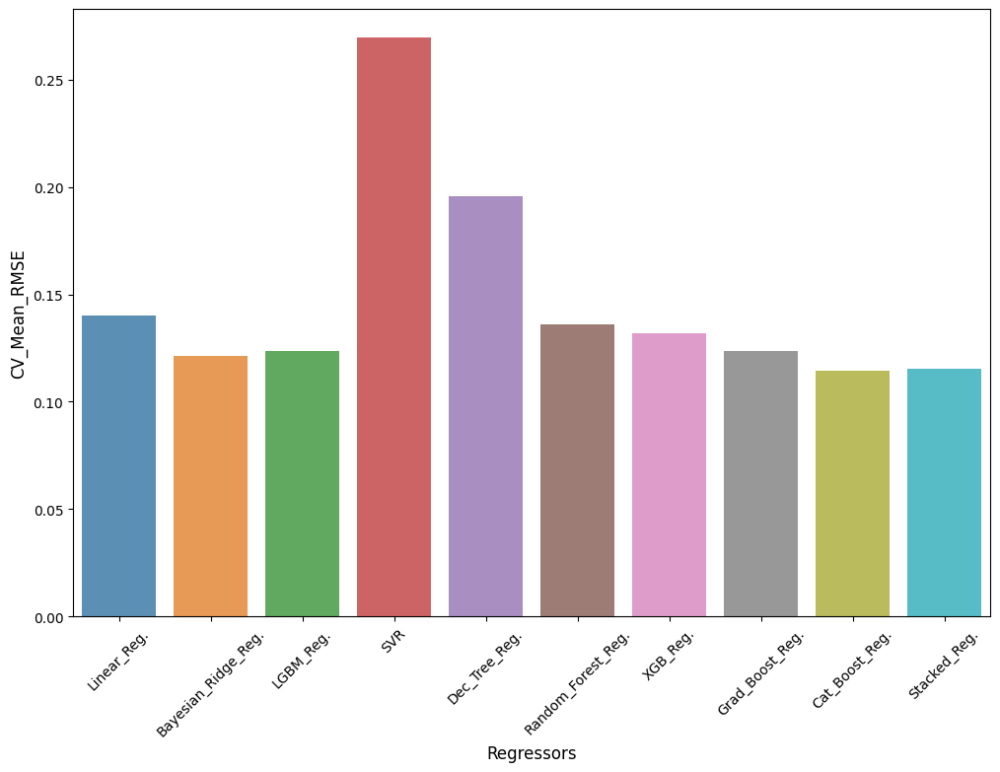

In [25]:
plt.figure(figsize = (12,8))
sns.barplot(x=final_cv_score['Regressors'],y=final_cv_score['RMSE_mean'], alpha=0.8)
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [26]:
# Train-Test split the data

X_train,X_val,y_train,y_val = train_test_split(train,target_log,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [27]:
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

0.09528210759380559

Now let's take a look at the top 20 most important variables for our model. This could give us further insight into the functioning of the algorithm and how and which data it uses most to arrive at the final prediction.

In [28]:
# Features' importance of our model

feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,OverallQual,17.605524
1,GrLivArea,7.438337
2,Total_Home_Quality,5.776964
3,HighQualSF,5.452363
4,TotalBsmtSF,4.900249
...,...,...
349,MiscFeature_Othr,0.000000
350,MiscFeature_TenC,0.000000
351,SaleType_CWD,0.000000
352,SaleType_Con,0.000000


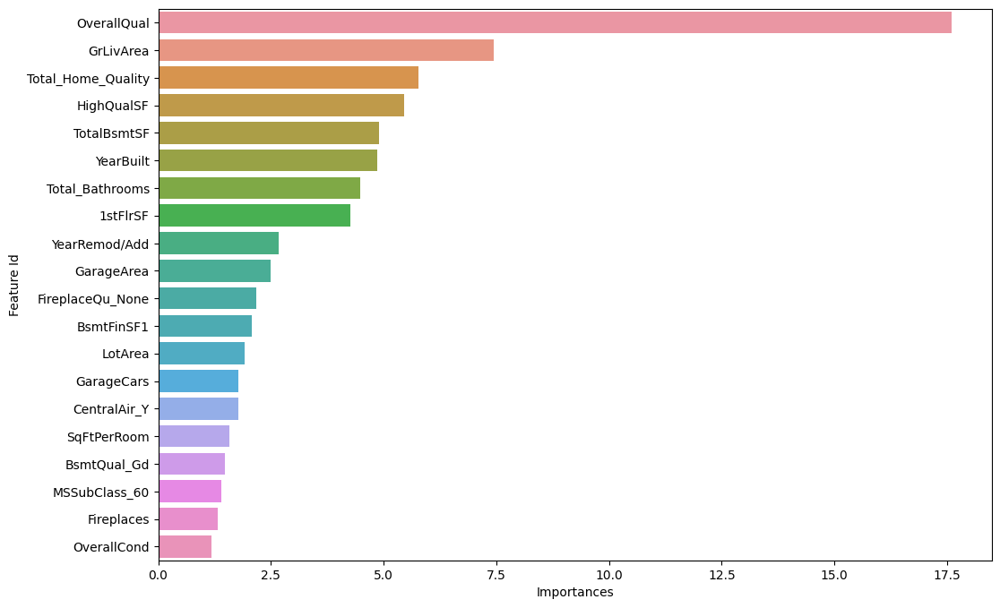

In [29]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(x=feat_imp['Importances'][:20],y=feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [30]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

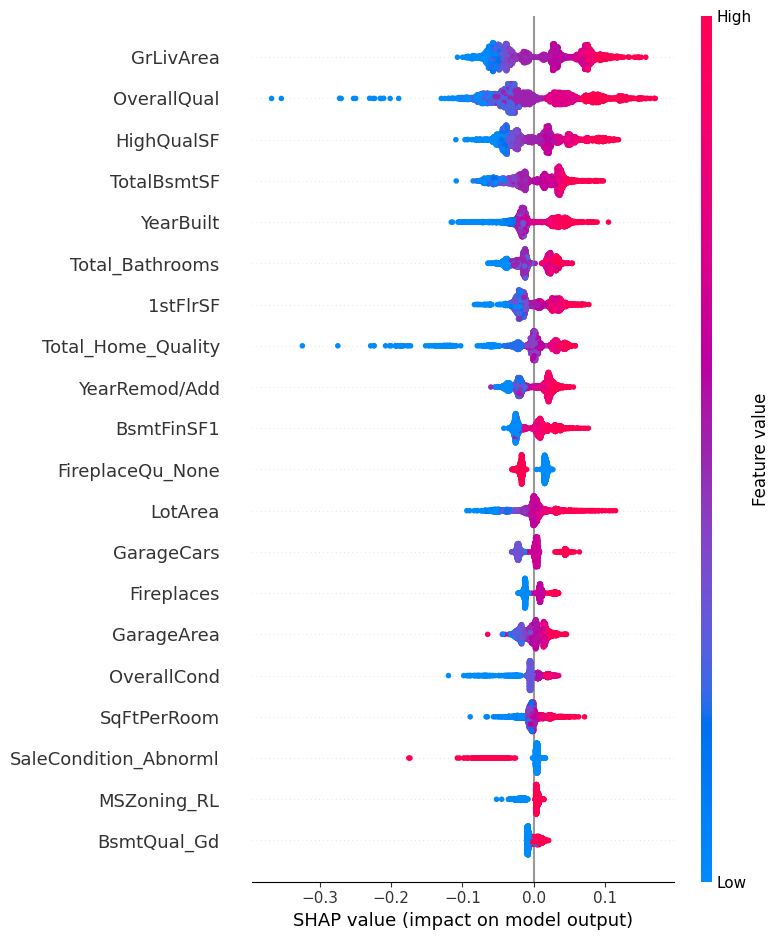

In [31]:
shap.summary_plot(shap_values, X_train)

The above diagram represents each observation (x-axis) for the feature presented (y-axis). The x location of each dot on the x-axis reflects the impact of that feature on the model's predictions, while the color of the dot represents the value of that feature for that exact observation. Dots that pile up on the line show density. Here we can see how features such as 'BsmtFinType1_GLQ' or 'BsmtQual_Ex', differently from 'GrLivArea' and 'OverallQual', do not contribute significantly in producing the final predictions.



 N.B: Catboost comes with a great method: ***get_feature_importance***. This method can be used to find important interactions among features. This is a huge advantage because it can give us insights about possible new features to create that can improve the performance.  

In [32]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,HighQualSF,0.527659
1,OverallQual,GarageArea,0.435873
2,LotArea,OverallQual,0.403367
3,OverallQual,YearRemod/Add,0.361387
4,1stFlrSF,GrLivArea,0.354398
5,Total_Home_Quality,HighQualSF,0.351095
6,YearBuilt,Total_Home_Quality,0.340946
7,OverallQual,1stFlrSF,0.339841
8,BsmtFinSF1,Total_Home_Quality,0.324370
9,BsmtUnfSF,GarageArea,0.305852


Which are the deafult parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [33]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.05929400026798248,
 'score_function': 'C

### Hyperparameter Optimization

In [34]:
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)
                                                   

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 12.0164542	test: 12.0164378	best: 12.0164378 (0)	total: 1.79ms	remaining: 1.79s
1:	learn: 12.0104659	test: 12.0104658	best: 12.0104658 (1)	total: 2.98ms	remaining: 1.49s
2:	learn: 12.0044840	test: 12.0044768	best: 12.0044768 (2)	total: 3.85ms	remaining: 1.28s
3:	learn: 11.9985054	test: 11.9984972	best: 11.9984972 (3)	total: 4.72ms	remaining: 1.18s
4:	learn: 11.9925324	test: 11.9925319	best: 11.9925319 (4)	total: 5.61ms	remaining: 1.12s
5:	learn: 11.9865481	test: 11.9865508	best: 11.9865508 (5)	total: 6.08ms	remaining: 1.01s
6:	learn: 11.9805897	test: 11.9805946	best: 11.9805946 (6)	total: 6.97ms	remaining: 989ms
7:	learn: 11.9746258	test: 11.9746389	best: 11.9746389 (7)	total: 7.86ms	remaining: 975ms
8:	learn: 11.9686593	test: 11.9686721	best: 11.9686721 (8)	total: 8.75ms	remaining: 963ms
9:	learn: 11.9627031	test: 11.9627069	best: 11.9627069 (9)	total: 9.74ms	remaining: 964ms
10:	learn: 11.9567466	test: 11.9567488	best: 11.9567488 (10)	total: 10.6ms	remaining: 956ms
11:	lear

115:	learn: 11.3479329	test: 11.3483647	best: 11.3483647 (115)	total: 208ms	remaining: 1.59s
116:	learn: 11.3422903	test: 11.3427726	best: 11.3427726 (116)	total: 210ms	remaining: 1.58s
117:	learn: 11.3366464	test: 11.3371258	best: 11.3371258 (117)	total: 212ms	remaining: 1.58s
118:	learn: 11.3310107	test: 11.3314923	best: 11.3314923 (118)	total: 214ms	remaining: 1.58s
119:	learn: 11.3253648	test: 11.3258568	best: 11.3258568 (119)	total: 215ms	remaining: 1.58s
120:	learn: 11.3197445	test: 11.3202419	best: 11.3202419 (120)	total: 217ms	remaining: 1.58s
121:	learn: 11.3141124	test: 11.3146216	best: 11.3146216 (121)	total: 219ms	remaining: 1.58s
122:	learn: 11.3084825	test: 11.3089772	best: 11.3089772 (122)	total: 221ms	remaining: 1.58s
123:	learn: 11.3028638	test: 11.3033718	best: 11.3033718 (123)	total: 223ms	remaining: 1.58s
124:	learn: 11.2972338	test: 11.2977552	best: 11.2977552 (124)	total: 225ms	remaining: 1.57s
125:	learn: 11.2916091	test: 11.2921245	best: 11.2921245 (125)	total: 

249:	learn: 10.6158817	test: 10.6167696	best: 10.6167696 (249)	total: 419ms	remaining: 1.26s
250:	learn: 10.6106177	test: 10.6115103	best: 10.6115103 (250)	total: 421ms	remaining: 1.26s
251:	learn: 10.6053338	test: 10.6062226	best: 10.6062226 (251)	total: 423ms	remaining: 1.25s
252:	learn: 10.6000507	test: 10.6009409	best: 10.6009409 (252)	total: 425ms	remaining: 1.25s
253:	learn: 10.5947819	test: 10.5956834	best: 10.5956834 (253)	total: 427ms	remaining: 1.25s
254:	learn: 10.5895174	test: 10.5904289	best: 10.5904289 (254)	total: 428ms	remaining: 1.25s
255:	learn: 10.5842497	test: 10.5851616	best: 10.5851616 (255)	total: 430ms	remaining: 1.25s
256:	learn: 10.5789842	test: 10.5799102	best: 10.5799102 (256)	total: 432ms	remaining: 1.25s
257:	learn: 10.5737224	test: 10.5746530	best: 10.5746530 (257)	total: 434ms	remaining: 1.25s
258:	learn: 10.5684656	test: 10.5693988	best: 10.5693988 (258)	total: 437ms	remaining: 1.25s
259:	learn: 10.5632030	test: 10.5641276	best: 10.5641276 (259)	total: 

352:	learn: 10.0855319	test: 10.0866667	best: 10.0866667 (352)	total: 619ms	remaining: 1.13s
353:	learn: 10.0805173	test: 10.0816482	best: 10.0816482 (353)	total: 620ms	remaining: 1.13s
354:	learn: 10.0755005	test: 10.0766262	best: 10.0766262 (354)	total: 622ms	remaining: 1.13s
355:	learn: 10.0704931	test: 10.0716044	best: 10.0716044 (355)	total: 624ms	remaining: 1.13s
356:	learn: 10.0654778	test: 10.0665834	best: 10.0665834 (356)	total: 625ms	remaining: 1.13s
357:	learn: 10.0604633	test: 10.0615859	best: 10.0615859 (357)	total: 627ms	remaining: 1.12s
358:	learn: 10.0554645	test: 10.0565817	best: 10.0565817 (358)	total: 629ms	remaining: 1.12s
359:	learn: 10.0504606	test: 10.0515909	best: 10.0515909 (359)	total: 630ms	remaining: 1.12s
360:	learn: 10.0454631	test: 10.0466054	best: 10.0466054 (360)	total: 632ms	remaining: 1.12s
361:	learn: 10.0404593	test: 10.0416037	best: 10.0416037 (361)	total: 634ms	remaining: 1.12s
362:	learn: 10.0354602	test: 10.0366012	best: 10.0366012 (362)	total: 

507:	learn: 9.3369659	test: 9.3383834	best: 9.3383834 (507)	total: 821ms	remaining: 795ms
508:	learn: 9.3323262	test: 9.3337411	best: 9.3337411 (508)	total: 823ms	remaining: 794ms
509:	learn: 9.3276844	test: 9.3290963	best: 9.3290963 (509)	total: 824ms	remaining: 792ms
510:	learn: 9.3230530	test: 9.3244561	best: 9.3244561 (510)	total: 825ms	remaining: 790ms
511:	learn: 9.3184142	test: 9.3198127	best: 9.3198127 (511)	total: 827ms	remaining: 788ms
512:	learn: 9.3137829	test: 9.3151842	best: 9.3151842 (512)	total: 829ms	remaining: 787ms
513:	learn: 9.3091483	test: 9.3105427	best: 9.3105427 (513)	total: 830ms	remaining: 785ms
514:	learn: 9.3045248	test: 9.3059143	best: 9.3059143 (514)	total: 832ms	remaining: 783ms
515:	learn: 9.2998988	test: 9.3012899	best: 9.3012899 (515)	total: 833ms	remaining: 782ms
516:	learn: 9.2952693	test: 9.2966576	best: 9.2966576 (516)	total: 835ms	remaining: 780ms
517:	learn: 9.2906433	test: 9.2920285	best: 9.2920285 (517)	total: 837ms	remaining: 778ms
518:	learn

608:	learn: 8.8793526	test: 8.8810228	best: 8.8810228 (608)	total: 1.02s	remaining: 656ms
609:	learn: 8.8749352	test: 8.8766222	best: 8.8766222 (609)	total: 1.02s	remaining: 654ms
610:	learn: 8.8705228	test: 8.8722111	best: 8.8722111 (610)	total: 1.02s	remaining: 653ms
611:	learn: 8.8661145	test: 8.8678063	best: 8.8678063 (611)	total: 1.03s	remaining: 651ms
612:	learn: 8.8616963	test: 8.8633981	best: 8.8633981 (612)	total: 1.03s	remaining: 649ms
613:	learn: 8.8572779	test: 8.8589767	best: 8.8589767 (613)	total: 1.03s	remaining: 647ms
614:	learn: 8.8528780	test: 8.8545768	best: 8.8545768 (614)	total: 1.03s	remaining: 646ms
615:	learn: 8.8484742	test: 8.8501788	best: 8.8501788 (615)	total: 1.03s	remaining: 644ms
616:	learn: 8.8440614	test: 8.8457696	best: 8.8457696 (616)	total: 1.03s	remaining: 642ms
617:	learn: 8.8396669	test: 8.8413770	best: 8.8413770 (617)	total: 1.04s	remaining: 641ms
618:	learn: 8.8352674	test: 8.8369791	best: 8.8369791 (618)	total: 1.04s	remaining: 640ms
619:	learn

747:	learn: 8.2860749	test: 8.2881123	best: 8.2881123 (747)	total: 1.22s	remaining: 412ms
748:	learn: 8.2819567	test: 8.2840028	best: 8.2840028 (748)	total: 1.22s	remaining: 410ms
749:	learn: 8.2778473	test: 8.2798899	best: 8.2798899 (749)	total: 1.23s	remaining: 409ms
750:	learn: 8.2737292	test: 8.2757697	best: 8.2757697 (750)	total: 1.23s	remaining: 407ms
751:	learn: 8.2696130	test: 8.2716784	best: 8.2716784 (751)	total: 1.23s	remaining: 405ms
752:	learn: 8.2654971	test: 8.2675615	best: 8.2675615 (752)	total: 1.23s	remaining: 404ms
753:	learn: 8.2613804	test: 8.2634579	best: 8.2634579 (753)	total: 1.23s	remaining: 402ms
754:	learn: 8.2572672	test: 8.2593465	best: 8.2593465 (754)	total: 1.23s	remaining: 400ms
755:	learn: 8.2531678	test: 8.2552586	best: 8.2552586 (755)	total: 1.24s	remaining: 399ms
756:	learn: 8.2490648	test: 8.2511514	best: 8.2511514 (756)	total: 1.24s	remaining: 397ms
757:	learn: 8.2449665	test: 8.2470532	best: 8.2470532 (757)	total: 1.24s	remaining: 396ms
758:	learn

851:	learn: 7.8683783	test: 7.8707094	best: 7.8707094 (851)	total: 1.42s	remaining: 247ms
852:	learn: 7.8644718	test: 7.8668019	best: 7.8668019 (852)	total: 1.43s	remaining: 246ms
853:	learn: 7.8605675	test: 7.8629038	best: 7.8629038 (853)	total: 1.43s	remaining: 244ms
854:	learn: 7.8566704	test: 7.8590083	best: 7.8590083 (854)	total: 1.43s	remaining: 242ms
855:	learn: 7.8527590	test: 7.8551128	best: 7.8551128 (855)	total: 1.43s	remaining: 241ms
856:	learn: 7.8488484	test: 7.8512100	best: 7.8512100 (856)	total: 1.43s	remaining: 239ms
857:	learn: 7.8449429	test: 7.8473021	best: 7.8473021 (857)	total: 1.43s	remaining: 237ms
858:	learn: 7.8410418	test: 7.8434035	best: 7.8434035 (858)	total: 1.44s	remaining: 236ms
859:	learn: 7.8371405	test: 7.8395174	best: 7.8395174 (859)	total: 1.44s	remaining: 234ms
860:	learn: 7.8332408	test: 7.8356217	best: 7.8356217 (860)	total: 1.44s	remaining: 232ms
861:	learn: 7.8293445	test: 7.8317229	best: 7.8317229 (861)	total: 1.44s	remaining: 231ms
862:	learn

997:	learn: 7.3173452	test: 7.3201446	best: 7.3201446 (997)	total: 1.62s	remaining: 3.25ms
998:	learn: 7.3137109	test: 7.3165038	best: 7.3165038 (998)	total: 1.62s	remaining: 1.63ms
999:	learn: 7.3100837	test: 7.3128698	best: 7.3128698 (999)	total: 1.63s	remaining: 0us

bestTest = 7.312869812
bestIteration = 999

0:	learn: 12.0166163	test: 12.0166083	best: 12.0166083 (0)	total: 2.14ms	remaining: 12.9s
1:	learn: 12.0107182	test: 12.0107337	best: 12.0107337 (1)	total: 3.72ms	remaining: 11.2s
2:	learn: 12.0048265	test: 12.0048233	best: 12.0048233 (2)	total: 5.3ms	remaining: 10.6s
3:	learn: 11.9989500	test: 11.9989390	best: 11.9989390 (3)	total: 6.87ms	remaining: 10.3s
4:	learn: 11.9930991	test: 11.9931005	best: 11.9931005 (4)	total: 8.75ms	remaining: 10.5s
5:	learn: 11.9871582	test: 11.9871667	best: 11.9871667 (5)	total: 9.68ms	remaining: 9.67s
6:	learn: 11.9813702	test: 11.9813937	best: 11.9813937 (6)	total: 11.2ms	remaining: 9.58s
7:	learn: 11.9755155	test: 11.9755485	best: 11.9755485 (

100:	learn: 11.4452332	test: 11.4457184	best: 11.4457184 (100)	total: 196ms	remaining: 11.5s
101:	learn: 11.4396168	test: 11.4400970	best: 11.4400970 (101)	total: 198ms	remaining: 11.4s
102:	learn: 11.4340558	test: 11.4345340	best: 11.4345340 (102)	total: 199ms	remaining: 11.4s
103:	learn: 11.4285015	test: 11.4289747	best: 11.4289747 (103)	total: 201ms	remaining: 11.4s
104:	learn: 11.4229706	test: 11.4234206	best: 11.4234206 (104)	total: 203ms	remaining: 11.4s
105:	learn: 11.4174080	test: 11.4178650	best: 11.4178650 (105)	total: 205ms	remaining: 11.4s
106:	learn: 11.4118080	test: 11.4122495	best: 11.4122495 (106)	total: 207ms	remaining: 11.4s
107:	learn: 11.4061457	test: 11.4065866	best: 11.4065866 (107)	total: 208ms	remaining: 11.3s
108:	learn: 11.4005991	test: 11.4010050	best: 11.4010050 (108)	total: 210ms	remaining: 11.3s
109:	learn: 11.3950798	test: 11.3955085	best: 11.3955085 (109)	total: 212ms	remaining: 11.3s
110:	learn: 11.3896391	test: 11.3901171	best: 11.3901171 (110)	total: 

245:	learn: 10.6642191	test: 10.6649861	best: 10.6649861 (245)	total: 413ms	remaining: 9.67s
246:	learn: 10.6590369	test: 10.6598232	best: 10.6598232 (246)	total: 416ms	remaining: 9.68s
247:	learn: 10.6538815	test: 10.6546565	best: 10.6546565 (247)	total: 417ms	remaining: 9.68s
248:	learn: 10.6486487	test: 10.6494063	best: 10.6494063 (248)	total: 420ms	remaining: 9.71s
249:	learn: 10.6434302	test: 10.6441756	best: 10.6441756 (249)	total: 423ms	remaining: 9.73s
250:	learn: 10.6381987	test: 10.6389427	best: 10.6389427 (250)	total: 426ms	remaining: 9.75s
251:	learn: 10.6330649	test: 10.6338149	best: 10.6338149 (251)	total: 428ms	remaining: 9.75s
252:	learn: 10.6279113	test: 10.6287045	best: 10.6287045 (252)	total: 429ms	remaining: 9.74s
253:	learn: 10.6227788	test: 10.6236031	best: 10.6236031 (253)	total: 430ms	remaining: 9.73s
254:	learn: 10.6176009	test: 10.6184182	best: 10.6184182 (254)	total: 431ms	remaining: 9.71s
255:	learn: 10.6124164	test: 10.6132422	best: 10.6132422 (255)	total: 

339:	learn: 10.1870667	test: 10.1881087	best: 10.1881087 (339)	total: 613ms	remaining: 10.2s
340:	learn: 10.1820931	test: 10.1831402	best: 10.1831402 (340)	total: 615ms	remaining: 10.2s
341:	learn: 10.1771230	test: 10.1781606	best: 10.1781606 (341)	total: 616ms	remaining: 10.2s
342:	learn: 10.1721455	test: 10.1732036	best: 10.1732036 (342)	total: 618ms	remaining: 10.2s
343:	learn: 10.1672055	test: 10.1682381	best: 10.1682381 (343)	total: 620ms	remaining: 10.2s
344:	learn: 10.1622493	test: 10.1632585	best: 10.1632585 (344)	total: 622ms	remaining: 10.2s
345:	learn: 10.1573544	test: 10.1583743	best: 10.1583743 (345)	total: 623ms	remaining: 10.2s
346:	learn: 10.1523641	test: 10.1534379	best: 10.1534379 (346)	total: 625ms	remaining: 10.2s
347:	learn: 10.1473789	test: 10.1484656	best: 10.1484656 (347)	total: 627ms	remaining: 10.2s
348:	learn: 10.1424655	test: 10.1435608	best: 10.1435608 (348)	total: 628ms	remaining: 10.2s
349:	learn: 10.1375525	test: 10.1386305	best: 10.1386305 (349)	total: 

470:	learn: 9.5578926	test: 9.5591925	best: 9.5591925 (470)	total: 814ms	remaining: 9.55s
471:	learn: 9.5532187	test: 9.5545018	best: 9.5545018 (471)	total: 815ms	remaining: 9.55s
472:	learn: 9.5486436	test: 9.5499124	best: 9.5499124 (472)	total: 817ms	remaining: 9.54s
473:	learn: 9.5439630	test: 9.5452470	best: 9.5452470 (473)	total: 818ms	remaining: 9.54s
474:	learn: 9.5393054	test: 9.5405751	best: 9.5405751 (474)	total: 820ms	remaining: 9.54s
475:	learn: 9.5346793	test: 9.5359387	best: 9.5359387 (475)	total: 822ms	remaining: 9.54s
476:	learn: 9.5300617	test: 9.5313151	best: 9.5313151 (476)	total: 823ms	remaining: 9.53s
477:	learn: 9.5253475	test: 9.5266006	best: 9.5266006 (477)	total: 825ms	remaining: 9.53s
478:	learn: 9.5207060	test: 9.5219435	best: 9.5219435 (478)	total: 827ms	remaining: 9.53s
479:	learn: 9.5160891	test: 9.5173455	best: 9.5173455 (479)	total: 829ms	remaining: 9.53s
480:	learn: 9.5115068	test: 9.5127645	best: 9.5127645 (480)	total: 830ms	remaining: 9.52s
481:	learn

577:	learn: 9.0726146	test: 9.0742623	best: 9.0742623 (577)	total: 1.01s	remaining: 9.52s
578:	learn: 9.0682067	test: 9.0698604	best: 9.0698604 (578)	total: 1.01s	remaining: 9.51s
579:	learn: 9.0638138	test: 9.0654726	best: 9.0654726 (579)	total: 1.02s	remaining: 9.5s
580:	learn: 9.0593750	test: 9.0610400	best: 9.0610400 (580)	total: 1.02s	remaining: 9.49s
581:	learn: 9.0549738	test: 9.0566413	best: 9.0566413 (581)	total: 1.02s	remaining: 9.49s
582:	learn: 9.0505896	test: 9.0522467	best: 9.0522467 (582)	total: 1.02s	remaining: 9.48s
583:	learn: 9.0462019	test: 9.0478375	best: 9.0478375 (583)	total: 1.02s	remaining: 9.47s
584:	learn: 9.0418300	test: 9.0434574	best: 9.0434574 (584)	total: 1.02s	remaining: 9.47s
585:	learn: 9.0374818	test: 9.0390977	best: 9.0390977 (585)	total: 1.02s	remaining: 9.46s
586:	learn: 9.0330830	test: 9.0346864	best: 9.0346864 (586)	total: 1.03s	remaining: 9.48s
587:	learn: 9.0286525	test: 9.0302574	best: 9.0302574 (587)	total: 1.03s	remaining: 9.49s
588:	learn:

703:	learn: 8.5324675	test: 8.5344993	best: 8.5344993 (703)	total: 1.21s	remaining: 9.13s
704:	learn: 8.5282485	test: 8.5302879	best: 8.5302879 (704)	total: 1.22s	remaining: 9.13s
705:	learn: 8.5240736	test: 8.5261125	best: 8.5261125 (705)	total: 1.22s	remaining: 9.13s
706:	learn: 8.5199311	test: 8.5219738	best: 8.5219738 (706)	total: 1.22s	remaining: 9.13s
707:	learn: 8.5157739	test: 8.5178242	best: 8.5178242 (707)	total: 1.22s	remaining: 9.13s
708:	learn: 8.5117049	test: 8.5137739	best: 8.5137739 (708)	total: 1.22s	remaining: 9.12s
709:	learn: 8.5075266	test: 8.5095773	best: 8.5095773 (709)	total: 1.22s	remaining: 9.12s
710:	learn: 8.5033725	test: 8.5054322	best: 8.5054322 (710)	total: 1.23s	remaining: 9.11s
711:	learn: 8.4991966	test: 8.5012732	best: 8.5012732 (711)	total: 1.23s	remaining: 9.11s
712:	learn: 8.4950561	test: 8.4971476	best: 8.4971476 (712)	total: 1.23s	remaining: 9.1s
713:	learn: 8.4908934	test: 8.4930108	best: 8.4930108 (713)	total: 1.23s	remaining: 9.09s
714:	learn:

811:	learn: 8.0960388	test: 8.0984621	best: 8.0984621 (811)	total: 1.41s	remaining: 9.03s
812:	learn: 8.0921117	test: 8.0945139	best: 8.0945139 (812)	total: 1.42s	remaining: 9.03s
813:	learn: 8.0881171	test: 8.0905418	best: 8.0905418 (813)	total: 1.42s	remaining: 9.03s
814:	learn: 8.0842088	test: 8.0866343	best: 8.0866343 (814)	total: 1.42s	remaining: 9.03s
815:	learn: 8.0802519	test: 8.0826943	best: 8.0826943 (815)	total: 1.42s	remaining: 9.02s
816:	learn: 8.0762897	test: 8.0787244	best: 8.0787244 (816)	total: 1.42s	remaining: 9.02s
817:	learn: 8.0723388	test: 8.0747787	best: 8.0747787 (817)	total: 1.42s	remaining: 9.02s
818:	learn: 8.0683767	test: 8.0708188	best: 8.0708188 (818)	total: 1.43s	remaining: 9.02s
819:	learn: 8.0644716	test: 8.0669216	best: 8.0669216 (819)	total: 1.43s	remaining: 9.02s
820:	learn: 8.0605216	test: 8.0629903	best: 8.0629903 (820)	total: 1.43s	remaining: 9.03s
821:	learn: 8.0565979	test: 8.0590542	best: 8.0590542 (821)	total: 1.43s	remaining: 9.04s
822:	learn

916:	learn: 7.6926879	test: 7.6953490	best: 7.6953490 (916)	total: 1.61s	remaining: 8.94s
917:	learn: 7.6889401	test: 7.6915934	best: 7.6915934 (917)	total: 1.61s	remaining: 8.93s
918:	learn: 7.6852318	test: 7.6878770	best: 7.6878770 (918)	total: 1.61s	remaining: 8.93s
919:	learn: 7.6814591	test: 7.6840943	best: 7.6840943 (919)	total: 1.62s	remaining: 8.93s
920:	learn: 7.6777620	test: 7.6804091	best: 7.6804091 (920)	total: 1.62s	remaining: 8.93s
921:	learn: 7.6740079	test: 7.6766531	best: 7.6766531 (921)	total: 1.62s	remaining: 8.92s
922:	learn: 7.6703280	test: 7.6729725	best: 7.6729725 (922)	total: 1.62s	remaining: 8.92s
923:	learn: 7.6665829	test: 7.6692248	best: 7.6692248 (923)	total: 1.62s	remaining: 8.92s
924:	learn: 7.6628276	test: 7.6654595	best: 7.6654595 (924)	total: 1.63s	remaining: 8.92s
925:	learn: 7.6591095	test: 7.6617452	best: 7.6617452 (925)	total: 1.63s	remaining: 8.91s
926:	learn: 7.6553979	test: 7.6580293	best: 7.6580293 (926)	total: 1.63s	remaining: 8.91s
927:	learn

1057:	learn: 7.1821033	test: 7.1850279	best: 7.1850279 (1057)	total: 1.81s	remaining: 8.47s
1058:	learn: 7.1786632	test: 7.1815847	best: 7.1815847 (1058)	total: 1.82s	remaining: 8.47s
1059:	learn: 7.1751931	test: 7.1781180	best: 7.1781180 (1059)	total: 1.82s	remaining: 8.47s
1060:	learn: 7.1716976	test: 7.1746279	best: 7.1746279 (1060)	total: 1.82s	remaining: 8.47s
1061:	learn: 7.1681951	test: 7.1711420	best: 7.1711420 (1061)	total: 1.82s	remaining: 8.47s
1062:	learn: 7.1647005	test: 7.1676762	best: 7.1676762 (1062)	total: 1.82s	remaining: 8.47s
1063:	learn: 7.1612284	test: 7.1642167	best: 7.1642167 (1063)	total: 1.82s	remaining: 8.46s
1064:	learn: 7.1577442	test: 7.1607270	best: 7.1607270 (1064)	total: 1.83s	remaining: 8.46s
1065:	learn: 7.1542542	test: 7.1572436	best: 7.1572436 (1065)	total: 1.83s	remaining: 8.46s
1066:	learn: 7.1507773	test: 7.1537652	best: 7.1537652 (1066)	total: 1.83s	remaining: 8.46s
1067:	learn: 7.1472593	test: 7.1502740	best: 7.1502740 (1067)	total: 1.83s	remai

1159:	learn: 6.8344515	test: 6.8376448	best: 6.8376448 (1159)	total: 2.01s	remaining: 8.4s
1160:	learn: 6.8311041	test: 6.8342868	best: 6.8342868 (1160)	total: 2.02s	remaining: 8.4s
1161:	learn: 6.8277697	test: 6.8309699	best: 6.8309699 (1161)	total: 2.02s	remaining: 8.4s
1162:	learn: 6.8244264	test: 6.8276366	best: 6.8276366 (1162)	total: 2.02s	remaining: 8.39s
1163:	learn: 6.8210938	test: 6.8243063	best: 6.8243063 (1163)	total: 2.02s	remaining: 8.39s
1164:	learn: 6.8177710	test: 6.8209768	best: 6.8209768 (1164)	total: 2.02s	remaining: 8.38s
1165:	learn: 6.8144567	test: 6.8176557	best: 6.8176557 (1165)	total: 2.02s	remaining: 8.38s
1166:	learn: 6.8111307	test: 6.8143350	best: 6.8143350 (1166)	total: 2.02s	remaining: 8.38s
1167:	learn: 6.8078055	test: 6.8110211	best: 6.8110211 (1167)	total: 2.02s	remaining: 8.37s
1168:	learn: 6.8045129	test: 6.8077157	best: 6.8077157 (1168)	total: 2.02s	remaining: 8.37s
1169:	learn: 6.8012117	test: 6.8044291	best: 6.8044291 (1169)	total: 2.02s	remainin

1319:	learn: 6.3227238	test: 6.3259170	best: 6.3259170 (1319)	total: 2.21s	remaining: 7.85s
1320:	learn: 6.3195957	test: 6.3227916	best: 6.3227916 (1320)	total: 2.22s	remaining: 7.85s
1321:	learn: 6.3164864	test: 6.3196970	best: 6.3196970 (1321)	total: 2.22s	remaining: 7.85s
1322:	learn: 6.3134077	test: 6.3166140	best: 6.3166140 (1322)	total: 2.22s	remaining: 7.85s
1323:	learn: 6.3103620	test: 6.3135778	best: 6.3135778 (1323)	total: 2.22s	remaining: 7.84s
1324:	learn: 6.3072642	test: 6.3104926	best: 6.3104926 (1324)	total: 2.22s	remaining: 7.84s
1325:	learn: 6.3041949	test: 6.3074128	best: 6.3074128 (1325)	total: 2.23s	remaining: 7.84s
1326:	learn: 6.3012101	test: 6.3044251	best: 6.3044251 (1326)	total: 2.23s	remaining: 7.84s
1327:	learn: 6.2981475	test: 6.3013661	best: 6.3013661 (1327)	total: 2.23s	remaining: 7.84s
1328:	learn: 6.2951141	test: 6.2983503	best: 6.2983503 (1328)	total: 2.23s	remaining: 7.84s
1329:	learn: 6.2920499	test: 6.2952933	best: 6.2952933 (1329)	total: 2.23s	remai

1429:	learn: 5.9935975	test: 5.9970503	best: 5.9970503 (1429)	total: 2.42s	remaining: 7.72s
1430:	learn: 5.9907031	test: 5.9941494	best: 5.9941494 (1430)	total: 2.42s	remaining: 7.72s
1431:	learn: 5.9877642	test: 5.9912161	best: 5.9912161 (1431)	total: 2.42s	remaining: 7.72s
1432:	learn: 5.9848823	test: 5.9883543	best: 5.9883543 (1432)	total: 2.42s	remaining: 7.72s
1433:	learn: 5.9820021	test: 5.9854699	best: 5.9854699 (1433)	total: 2.42s	remaining: 7.72s
1434:	learn: 5.9790864	test: 5.9825627	best: 5.9825627 (1434)	total: 2.43s	remaining: 7.72s
1435:	learn: 5.9761743	test: 5.9796542	best: 5.9796542 (1435)	total: 2.43s	remaining: 7.71s
1436:	learn: 5.9732733	test: 5.9767398	best: 5.9767398 (1436)	total: 2.43s	remaining: 7.71s
1437:	learn: 5.9703400	test: 5.9737987	best: 5.9737987 (1437)	total: 2.43s	remaining: 7.71s
1438:	learn: 5.9674192	test: 5.9708743	best: 5.9708743 (1438)	total: 2.43s	remaining: 7.71s
1439:	learn: 5.9645350	test: 5.9679879	best: 5.9679879 (1439)	total: 2.43s	remai

1581:	learn: 5.5672562	test: 5.5709274	best: 5.5709274 (1581)	total: 2.62s	remaining: 7.31s
1582:	learn: 5.5645705	test: 5.5682406	best: 5.5682406 (1582)	total: 2.62s	remaining: 7.31s
1583:	learn: 5.5618363	test: 5.5655039	best: 5.5655039 (1583)	total: 2.62s	remaining: 7.3s
1584:	learn: 5.5591089	test: 5.5627762	best: 5.5627762 (1584)	total: 2.62s	remaining: 7.3s
1585:	learn: 5.5564220	test: 5.5600919	best: 5.5600919 (1585)	total: 2.62s	remaining: 7.3s
1586:	learn: 5.5536883	test: 5.5573567	best: 5.5573567 (1586)	total: 2.62s	remaining: 7.3s
1587:	learn: 5.5509898	test: 5.5546509	best: 5.5546509 (1587)	total: 2.63s	remaining: 7.29s
1588:	learn: 5.5483554	test: 5.5520218	best: 5.5520218 (1588)	total: 2.63s	remaining: 7.29s
1589:	learn: 5.5456589	test: 5.5493240	best: 5.5493240 (1589)	total: 2.63s	remaining: 7.29s
1590:	learn: 5.5429636	test: 5.5466322	best: 5.5466322 (1590)	total: 2.63s	remaining: 7.29s
1591:	learn: 5.5403044	test: 5.5439789	best: 5.5439789 (1591)	total: 2.63s	remaining

1684:	learn: 5.2958497	test: 5.2996902	best: 5.2996902 (1684)	total: 2.82s	remaining: 7.21s
1685:	learn: 5.2932663	test: 5.2971272	best: 5.2971272 (1685)	total: 2.82s	remaining: 7.21s
1686:	learn: 5.2906771	test: 5.2945375	best: 5.2945375 (1686)	total: 2.82s	remaining: 7.21s
1687:	learn: 5.2880921	test: 5.2919504	best: 5.2919504 (1687)	total: 2.82s	remaining: 7.21s
1688:	learn: 5.2855284	test: 5.2893884	best: 5.2893884 (1688)	total: 2.82s	remaining: 7.21s
1689:	learn: 5.2829511	test: 5.2868111	best: 5.2868111 (1689)	total: 2.82s	remaining: 7.2s
1690:	learn: 5.2803813	test: 5.2842313	best: 5.2842313 (1690)	total: 2.83s	remaining: 7.2s
1691:	learn: 5.2778082	test: 5.2816540	best: 5.2816540 (1691)	total: 2.83s	remaining: 7.2s
1692:	learn: 5.2752359	test: 5.2790715	best: 5.2790715 (1692)	total: 2.83s	remaining: 7.2s
1693:	learn: 5.2726803	test: 5.2765161	best: 5.2765161 (1693)	total: 2.83s	remaining: 7.2s
1694:	learn: 5.2700978	test: 5.2739410	best: 5.2739410 (1694)	total: 2.83s	remaining:

1814:	learn: 4.9720083	test: 4.9761246	best: 4.9761246 (1814)	total: 3.02s	remaining: 6.96s
1815:	learn: 4.9695884	test: 4.9737052	best: 4.9737052 (1815)	total: 3.02s	remaining: 6.96s
1816:	learn: 4.9672227	test: 4.9713447	best: 4.9713447 (1816)	total: 3.02s	remaining: 6.96s
1817:	learn: 4.9648251	test: 4.9689445	best: 4.9689445 (1817)	total: 3.02s	remaining: 6.96s
1818:	learn: 4.9623983	test: 4.9665121	best: 4.9665121 (1818)	total: 3.02s	remaining: 6.95s
1819:	learn: 4.9599854	test: 4.9640889	best: 4.9640889 (1819)	total: 3.03s	remaining: 6.95s
1820:	learn: 4.9575784	test: 4.9616863	best: 4.9616863 (1820)	total: 3.03s	remaining: 6.95s
1821:	learn: 4.9551413	test: 4.9592426	best: 4.9592426 (1821)	total: 3.03s	remaining: 6.95s
1822:	learn: 4.9527747	test: 4.9569037	best: 4.9569037 (1822)	total: 3.03s	remaining: 6.95s
1823:	learn: 4.9503917	test: 4.9545092	best: 4.9545092 (1823)	total: 3.04s	remaining: 6.95s
1824:	learn: 4.9479926	test: 4.9521153	best: 4.9521153 (1824)	total: 3.04s	remai

1911:	learn: 4.7435977	test: 4.7478322	best: 4.7478322 (1911)	total: 3.22s	remaining: 6.88s
1912:	learn: 4.7412800	test: 4.7455085	best: 4.7455085 (1912)	total: 3.22s	remaining: 6.88s
1913:	learn: 4.7389728	test: 4.7432051	best: 4.7432051 (1913)	total: 3.22s	remaining: 6.88s
1914:	learn: 4.7367291	test: 4.7409664	best: 4.7409664 (1914)	total: 3.22s	remaining: 6.88s
1915:	learn: 4.7344230	test: 4.7386751	best: 4.7386751 (1915)	total: 3.23s	remaining: 6.88s
1916:	learn: 4.7321056	test: 4.7363536	best: 4.7363536 (1916)	total: 3.23s	remaining: 6.87s
1917:	learn: 4.7298257	test: 4.7340845	best: 4.7340845 (1917)	total: 3.23s	remaining: 6.87s
1918:	learn: 4.7275547	test: 4.7318154	best: 4.7318154 (1918)	total: 3.23s	remaining: 6.87s
1919:	learn: 4.7252653	test: 4.7295205	best: 4.7295205 (1919)	total: 3.23s	remaining: 6.87s
1920:	learn: 4.7229870	test: 4.7272596	best: 4.7272596 (1920)	total: 3.24s	remaining: 6.87s
1921:	learn: 4.7206909	test: 4.7249715	best: 4.7249715 (1921)	total: 3.24s	remai

2053:	learn: 4.4277564	test: 4.4322338	best: 4.4322338 (2053)	total: 3.42s	remaining: 6.57s
2054:	learn: 4.4256029	test: 4.4300796	best: 4.4300796 (2054)	total: 3.42s	remaining: 6.57s
2055:	learn: 4.4234728	test: 4.4279378	best: 4.4279378 (2055)	total: 3.42s	remaining: 6.57s
2056:	learn: 4.4213245	test: 4.4257944	best: 4.4257944 (2056)	total: 3.42s	remaining: 6.57s
2057:	learn: 4.4191852	test: 4.4236495	best: 4.4236495 (2057)	total: 3.43s	remaining: 6.56s
2058:	learn: 4.4170522	test: 4.4215196	best: 4.4215196 (2058)	total: 3.43s	remaining: 6.56s
2059:	learn: 4.4149001	test: 4.4193759	best: 4.4193759 (2059)	total: 3.43s	remaining: 6.56s
2060:	learn: 4.4127608	test: 4.4172410	best: 4.4172410 (2060)	total: 3.43s	remaining: 6.56s
2061:	learn: 4.4106014	test: 4.4150900	best: 4.4150900 (2061)	total: 3.43s	remaining: 6.56s
2062:	learn: 4.4084518	test: 4.4129465	best: 4.4129465 (2062)	total: 3.43s	remaining: 6.55s
2063:	learn: 4.4063030	test: 4.4108133	best: 4.4108133 (2063)	total: 3.44s	remai

2161:	learn: 4.2018120	test: 4.2064488	best: 4.2064488 (2161)	total: 3.62s	remaining: 6.43s
2162:	learn: 4.1997661	test: 4.2044059	best: 4.2044059 (2162)	total: 3.63s	remaining: 6.43s
2163:	learn: 4.1977096	test: 4.2023607	best: 4.2023607 (2163)	total: 3.63s	remaining: 6.43s
2164:	learn: 4.1956916	test: 4.2003352	best: 4.2003352 (2164)	total: 3.63s	remaining: 6.43s
2165:	learn: 4.1936706	test: 4.1983129	best: 4.1983129 (2165)	total: 3.63s	remaining: 6.42s
2166:	learn: 4.1916688	test: 4.1963052	best: 4.1963052 (2166)	total: 3.63s	remaining: 6.42s
2167:	learn: 4.1896520	test: 4.1942888	best: 4.1942888 (2167)	total: 3.63s	remaining: 6.42s
2168:	learn: 4.1876056	test: 4.1922423	best: 4.1922423 (2168)	total: 3.63s	remaining: 6.42s
2169:	learn: 4.1855522	test: 4.1901835	best: 4.1901835 (2169)	total: 3.63s	remaining: 6.42s
2170:	learn: 4.1835255	test: 4.1881444	best: 4.1881444 (2170)	total: 3.64s	remaining: 6.41s
2171:	learn: 4.1814794	test: 4.1861185	best: 4.1861185 (2171)	total: 3.64s	remai

2297:	learn: 3.9342834	test: 3.9388951	best: 3.9388951 (2297)	total: 3.82s	remaining: 6.16s
2298:	learn: 3.9323464	test: 3.9369586	best: 3.9369586 (2298)	total: 3.82s	remaining: 6.16s
2299:	learn: 3.9304477	test: 3.9350587	best: 3.9350587 (2299)	total: 3.83s	remaining: 6.15s
2300:	learn: 3.9285330	test: 3.9331417	best: 3.9331417 (2300)	total: 3.83s	remaining: 6.15s
2301:	learn: 3.9266388	test: 3.9312443	best: 3.9312443 (2301)	total: 3.83s	remaining: 6.15s
2302:	learn: 3.9247460	test: 3.9293484	best: 3.9293484 (2302)	total: 3.83s	remaining: 6.14s
2303:	learn: 3.9228721	test: 3.9274665	best: 3.9274665 (2303)	total: 3.83s	remaining: 6.14s
2304:	learn: 3.9209818	test: 3.9255876	best: 3.9255876 (2304)	total: 3.83s	remaining: 6.14s
2305:	learn: 3.9190748	test: 3.9236761	best: 3.9236761 (2305)	total: 3.83s	remaining: 6.14s
2306:	learn: 3.9171957	test: 3.9217829	best: 3.9217829 (2306)	total: 3.83s	remaining: 6.13s
2307:	learn: 3.9152937	test: 3.9198899	best: 3.9198899 (2307)	total: 3.83s	remai

2414:	learn: 3.7177684	test: 3.7226524	best: 3.7226524 (2414)	total: 4.03s	remaining: 5.98s
2415:	learn: 3.7159723	test: 3.7208584	best: 3.7208584 (2415)	total: 4.03s	remaining: 5.97s
2416:	learn: 3.7141522	test: 3.7190373	best: 3.7190373 (2416)	total: 4.03s	remaining: 5.97s
2417:	learn: 3.7123457	test: 3.7172414	best: 3.7172414 (2417)	total: 4.03s	remaining: 5.97s
2418:	learn: 3.7105246	test: 3.7154329	best: 3.7154329 (2418)	total: 4.03s	remaining: 5.97s
2419:	learn: 3.7087256	test: 3.7136364	best: 3.7136364 (2419)	total: 4.03s	remaining: 5.96s
2420:	learn: 3.7069227	test: 3.7118339	best: 3.7118339 (2420)	total: 4.03s	remaining: 5.96s
2421:	learn: 3.7051217	test: 3.7100343	best: 3.7100343 (2421)	total: 4.04s	remaining: 5.96s
2422:	learn: 3.7033429	test: 3.7082528	best: 3.7082528 (2422)	total: 4.04s	remaining: 5.96s
2423:	learn: 3.7015539	test: 3.7064639	best: 3.7064639 (2423)	total: 4.04s	remaining: 5.96s
2424:	learn: 3.6997762	test: 3.7046887	best: 3.7046887 (2424)	total: 4.04s	remai

2537:	learn: 3.5029187	test: 3.5080316	best: 3.5080316 (2537)	total: 4.22s	remaining: 5.76s
2538:	learn: 3.5012352	test: 3.5063334	best: 3.5063334 (2538)	total: 4.23s	remaining: 5.76s
2539:	learn: 3.4995543	test: 3.5046562	best: 3.5046562 (2539)	total: 4.23s	remaining: 5.76s
2540:	learn: 3.4978586	test: 3.5029732	best: 3.5029732 (2540)	total: 4.23s	remaining: 5.76s
2541:	learn: 3.4961542	test: 3.5012876	best: 3.5012876 (2541)	total: 4.23s	remaining: 5.76s
2542:	learn: 3.4944355	test: 3.4995684	best: 3.4995684 (2542)	total: 4.23s	remaining: 5.75s
2543:	learn: 3.4927371	test: 3.4978756	best: 3.4978756 (2543)	total: 4.24s	remaining: 5.75s
2544:	learn: 3.4910541	test: 3.4962041	best: 3.4962041 (2544)	total: 4.24s	remaining: 5.75s
2545:	learn: 3.4893853	test: 3.4945385	best: 3.4945385 (2545)	total: 4.24s	remaining: 5.75s
2546:	learn: 3.4876954	test: 3.4928439	best: 3.4928439 (2546)	total: 4.24s	remaining: 5.75s
2547:	learn: 3.4860313	test: 3.4911836	best: 3.4911836 (2547)	total: 4.24s	remai

2645:	learn: 3.3247970	test: 3.3301188	best: 3.3301188 (2645)	total: 4.42s	remaining: 5.61s
2646:	learn: 3.3231736	test: 3.3285008	best: 3.3285008 (2646)	total: 4.43s	remaining: 5.61s
2647:	learn: 3.3215539	test: 3.3268820	best: 3.3268820 (2647)	total: 4.43s	remaining: 5.6s
2648:	learn: 3.3199557	test: 3.3252857	best: 3.3252857 (2648)	total: 4.43s	remaining: 5.6s
2649:	learn: 3.3183604	test: 3.3236956	best: 3.3236956 (2649)	total: 4.43s	remaining: 5.6s
2650:	learn: 3.3167754	test: 3.3221104	best: 3.3221104 (2650)	total: 4.43s	remaining: 5.6s
2651:	learn: 3.3151566	test: 3.3204862	best: 3.3204862 (2651)	total: 4.43s	remaining: 5.6s
2652:	learn: 3.3135676	test: 3.3189010	best: 3.3189010 (2652)	total: 4.43s	remaining: 5.59s
2653:	learn: 3.3119620	test: 3.3172963	best: 3.3172963 (2653)	total: 4.44s	remaining: 5.59s
2654:	learn: 3.3103746	test: 3.3157113	best: 3.3157113 (2654)	total: 4.44s	remaining: 5.59s
2655:	learn: 3.3087756	test: 3.3141222	best: 3.3141222 (2655)	total: 4.44s	remaining:

2749:	learn: 3.1617777	test: 3.1672081	best: 3.1672081 (2749)	total: 4.62s	remaining: 5.46s
2750:	learn: 3.1602769	test: 3.1657010	best: 3.1657010 (2750)	total: 4.63s	remaining: 5.46s
2751:	learn: 3.1587502	test: 3.1641782	best: 3.1641782 (2751)	total: 4.63s	remaining: 5.46s
2752:	learn: 3.1572229	test: 3.1626548	best: 3.1626548 (2752)	total: 4.63s	remaining: 5.46s
2753:	learn: 3.1556878	test: 3.1611262	best: 3.1611262 (2753)	total: 4.63s	remaining: 5.46s
2754:	learn: 3.1541493	test: 3.1595800	best: 3.1595800 (2754)	total: 4.63s	remaining: 5.46s
2755:	learn: 3.1526221	test: 3.1580595	best: 3.1580595 (2755)	total: 4.63s	remaining: 5.45s
2756:	learn: 3.1511058	test: 3.1565501	best: 3.1565501 (2756)	total: 4.63s	remaining: 5.45s
2757:	learn: 3.1496188	test: 3.1550661	best: 3.1550661 (2757)	total: 4.64s	remaining: 5.45s
2758:	learn: 3.1480860	test: 3.1535396	best: 3.1535396 (2758)	total: 4.64s	remaining: 5.45s
2759:	learn: 3.1465647	test: 3.1520098	best: 3.1520098 (2759)	total: 4.64s	remai

2871:	learn: 2.9807717	test: 2.9863743	best: 2.9863743 (2871)	total: 4.83s	remaining: 5.25s
2872:	learn: 2.9793479	test: 2.9849488	best: 2.9849488 (2872)	total: 4.83s	remaining: 5.25s
2873:	learn: 2.9778973	test: 2.9835047	best: 2.9835047 (2873)	total: 4.83s	remaining: 5.25s
2874:	learn: 2.9764656	test: 2.9820653	best: 2.9820653 (2874)	total: 4.83s	remaining: 5.25s
2875:	learn: 2.9750198	test: 2.9806193	best: 2.9806193 (2875)	total: 4.83s	remaining: 5.25s
2876:	learn: 2.9735782	test: 2.9791804	best: 2.9791804 (2876)	total: 4.83s	remaining: 5.25s
2877:	learn: 2.9721436	test: 2.9777554	best: 2.9777554 (2877)	total: 4.83s	remaining: 5.24s
2878:	learn: 2.9707497	test: 2.9763643	best: 2.9763643 (2878)	total: 4.84s	remaining: 5.24s
2879:	learn: 2.9693129	test: 2.9749368	best: 2.9749368 (2879)	total: 4.84s	remaining: 5.24s
2880:	learn: 2.9678880	test: 2.9735060	best: 2.9735060 (2880)	total: 4.84s	remaining: 5.24s
2881:	learn: 2.9664533	test: 2.9720646	best: 2.9720646 (2881)	total: 4.84s	remai

2977:	learn: 2.8322445	test: 2.8379973	best: 2.8379973 (2977)	total: 5.02s	remaining: 5.1s
2978:	learn: 2.8308887	test: 2.8366392	best: 2.8366392 (2978)	total: 5.03s	remaining: 5.1s
2979:	learn: 2.8295129	test: 2.8352661	best: 2.8352661 (2979)	total: 5.03s	remaining: 5.09s
2980:	learn: 2.8281746	test: 2.8339297	best: 2.8339297 (2980)	total: 5.03s	remaining: 5.09s
2981:	learn: 2.8268018	test: 2.8325567	best: 2.8325567 (2981)	total: 5.03s	remaining: 5.09s
2982:	learn: 2.8254668	test: 2.8312259	best: 2.8312259 (2982)	total: 5.04s	remaining: 5.09s
2983:	learn: 2.8241570	test: 2.8299218	best: 2.8299218 (2983)	total: 5.04s	remaining: 5.09s
2984:	learn: 2.8227912	test: 2.8285560	best: 2.8285560 (2984)	total: 5.04s	remaining: 5.09s
2985:	learn: 2.8214605	test: 2.8272321	best: 2.8272321 (2985)	total: 5.04s	remaining: 5.09s
2986:	learn: 2.8201002	test: 2.8258634	best: 2.8258634 (2986)	total: 5.04s	remaining: 5.08s
2987:	learn: 2.8187318	test: 2.8244929	best: 2.8244929 (2987)	total: 5.04s	remaini

3125:	learn: 2.6377049	test: 2.6435935	best: 2.6435935 (3125)	total: 5.22s	remaining: 4.8s
3126:	learn: 2.6364301	test: 2.6423208	best: 2.6423208 (3126)	total: 5.23s	remaining: 4.8s
3127:	learn: 2.6351708	test: 2.6410643	best: 2.6410643 (3127)	total: 5.23s	remaining: 4.8s
3128:	learn: 2.6339030	test: 2.6397918	best: 2.6397918 (3128)	total: 5.23s	remaining: 4.8s
3129:	learn: 2.6326178	test: 2.6385146	best: 2.6385146 (3129)	total: 5.23s	remaining: 4.8s
3130:	learn: 2.6313321	test: 2.6372289	best: 2.6372289 (3130)	total: 5.23s	remaining: 4.79s
3131:	learn: 2.6300712	test: 2.6359646	best: 2.6359646 (3131)	total: 5.23s	remaining: 4.79s
3132:	learn: 2.6288172	test: 2.6347144	best: 2.6347144 (3132)	total: 5.24s	remaining: 4.79s
3133:	learn: 2.6275624	test: 2.6334578	best: 2.6334578 (3133)	total: 5.24s	remaining: 4.79s
3134:	learn: 2.6262876	test: 2.6321825	best: 2.6321825 (3134)	total: 5.24s	remaining: 4.79s
3135:	learn: 2.6250213	test: 2.6309151	best: 2.6309151 (3135)	total: 5.24s	remaining:

3227:	learn: 2.5113205	test: 2.5172818	best: 2.5172818 (3227)	total: 5.42s	remaining: 4.66s
3228:	learn: 2.5101176	test: 2.5160770	best: 2.5160770 (3228)	total: 5.43s	remaining: 4.66s
3229:	learn: 2.5089169	test: 2.5148793	best: 2.5148793 (3229)	total: 5.43s	remaining: 4.66s
3230:	learn: 2.5077122	test: 2.5136810	best: 2.5136810 (3230)	total: 5.43s	remaining: 4.65s
3231:	learn: 2.5065038	test: 2.5124753	best: 2.5124753 (3231)	total: 5.43s	remaining: 4.65s
3232:	learn: 2.5052839	test: 2.5112609	best: 2.5112609 (3232)	total: 5.43s	remaining: 4.65s
3233:	learn: 2.5040780	test: 2.5100522	best: 2.5100522 (3233)	total: 5.43s	remaining: 4.65s
3234:	learn: 2.5028655	test: 2.5088422	best: 2.5088422 (3234)	total: 5.43s	remaining: 4.64s
3235:	learn: 2.5016548	test: 2.5076273	best: 2.5076273 (3235)	total: 5.44s	remaining: 4.64s
3236:	learn: 2.5004366	test: 2.5064048	best: 2.5064048 (3236)	total: 5.44s	remaining: 4.64s
3237:	learn: 2.4992400	test: 2.5052103	best: 2.5052103 (3237)	total: 5.44s	remai

3355:	learn: 2.3615631	test: 2.3676219	best: 2.3676219 (3355)	total: 5.62s	remaining: 4.43s
3356:	learn: 2.3604477	test: 2.3664990	best: 2.3664990 (3356)	total: 5.63s	remaining: 4.43s
3357:	learn: 2.3593173	test: 2.3653703	best: 2.3653703 (3357)	total: 5.63s	remaining: 4.43s
3358:	learn: 2.3581878	test: 2.3642476	best: 2.3642476 (3358)	total: 5.63s	remaining: 4.42s
3359:	learn: 2.3570421	test: 2.3631067	best: 2.3631067 (3359)	total: 5.63s	remaining: 4.42s
3360:	learn: 2.3559211	test: 2.3619867	best: 2.3619867 (3360)	total: 5.63s	remaining: 4.42s
3361:	learn: 2.3547944	test: 2.3608600	best: 2.3608600 (3361)	total: 5.63s	remaining: 4.42s
3362:	learn: 2.3536880	test: 2.3597521	best: 2.3597521 (3362)	total: 5.63s	remaining: 4.42s
3363:	learn: 2.3525667	test: 2.3586307	best: 2.3586307 (3363)	total: 5.64s	remaining: 4.42s
3364:	learn: 2.3514289	test: 2.3574914	best: 2.3574914 (3364)	total: 5.64s	remaining: 4.41s
3365:	learn: 2.3503150	test: 2.3563782	best: 2.3563782 (3365)	total: 5.64s	remai

3455:	learn: 2.2510239	test: 2.2571155	best: 2.2571155 (3455)	total: 5.83s	remaining: 4.29s
3456:	learn: 2.2499611	test: 2.2560617	best: 2.2560617 (3456)	total: 5.83s	remaining: 4.29s
3457:	learn: 2.2488863	test: 2.2549806	best: 2.2549806 (3457)	total: 5.83s	remaining: 4.28s
3458:	learn: 2.2477961	test: 2.2538922	best: 2.2538922 (3458)	total: 5.83s	remaining: 4.28s
3459:	learn: 2.2467263	test: 2.2528223	best: 2.2528223 (3459)	total: 5.83s	remaining: 4.28s
3460:	learn: 2.2456456	test: 2.2517409	best: 2.2517409 (3460)	total: 5.83s	remaining: 4.28s
3461:	learn: 2.2445706	test: 2.2506739	best: 2.2506739 (3461)	total: 5.83s	remaining: 4.28s
3462:	learn: 2.2434915	test: 2.2495951	best: 2.2495951 (3462)	total: 5.83s	remaining: 4.27s
3463:	learn: 2.2424212	test: 2.2485272	best: 2.2485272 (3463)	total: 5.84s	remaining: 4.27s
3464:	learn: 2.2413705	test: 2.2474751	best: 2.2474751 (3464)	total: 5.84s	remaining: 4.27s
3465:	learn: 2.2403092	test: 2.2464221	best: 2.2464221 (3465)	total: 5.84s	remai

3609:	learn: 2.0912247	test: 2.0975381	best: 2.0975381 (3609)	total: 6.03s	remaining: 3.99s
3610:	learn: 2.0902444	test: 2.0965594	best: 2.0965594 (3610)	total: 6.03s	remaining: 3.99s
3611:	learn: 2.0892376	test: 2.0955545	best: 2.0955545 (3611)	total: 6.03s	remaining: 3.98s
3612:	learn: 2.0882312	test: 2.0945536	best: 2.0945536 (3612)	total: 6.03s	remaining: 3.98s
3613:	learn: 2.0872217	test: 2.0935497	best: 2.0935497 (3613)	total: 6.03s	remaining: 3.98s
3614:	learn: 2.0862578	test: 2.0925900	best: 2.0925900 (3614)	total: 6.03s	remaining: 3.98s
3615:	learn: 2.0852638	test: 2.0915985	best: 2.0915985 (3615)	total: 6.03s	remaining: 3.98s
3616:	learn: 2.0842671	test: 2.0906095	best: 2.0906095 (3616)	total: 6.04s	remaining: 3.98s
3617:	learn: 2.0832613	test: 2.0896037	best: 2.0896037 (3617)	total: 6.04s	remaining: 3.98s
3618:	learn: 2.0822716	test: 2.0886169	best: 2.0886169 (3618)	total: 6.04s	remaining: 3.97s
3619:	learn: 2.0812726	test: 2.0876209	best: 2.0876209 (3619)	total: 6.04s	remai

3700:	learn: 2.0023548	test: 2.0088187	best: 2.0088187 (3700)	total: 6.22s	remaining: 3.87s
3701:	learn: 2.0014048	test: 2.0078670	best: 2.0078670 (3701)	total: 6.23s	remaining: 3.87s
3702:	learn: 2.0004514	test: 2.0069117	best: 2.0069117 (3702)	total: 6.23s	remaining: 3.86s
3703:	learn: 1.9995066	test: 2.0059699	best: 2.0059699 (3703)	total: 6.23s	remaining: 3.86s
3704:	learn: 1.9985508	test: 2.0050163	best: 2.0050163 (3704)	total: 6.23s	remaining: 3.86s
3705:	learn: 1.9975919	test: 2.0040543	best: 2.0040543 (3705)	total: 6.23s	remaining: 3.86s
3706:	learn: 1.9966298	test: 2.0030883	best: 2.0030883 (3706)	total: 6.23s	remaining: 3.86s
3707:	learn: 1.9956855	test: 2.0021429	best: 2.0021429 (3707)	total: 6.24s	remaining: 3.85s
3708:	learn: 1.9947356	test: 2.0011958	best: 2.0011958 (3708)	total: 6.24s	remaining: 3.85s
3709:	learn: 1.9937848	test: 2.0002534	best: 2.0002534 (3709)	total: 6.24s	remaining: 3.85s
3710:	learn: 1.9928249	test: 1.9993026	best: 1.9993026 (3710)	total: 6.24s	remai

3812:	learn: 1.8982046	test: 1.9048387	best: 1.9048387 (3812)	total: 6.42s	remaining: 3.69s
3813:	learn: 1.8973203	test: 1.9039598	best: 1.9039598 (3813)	total: 6.43s	remaining: 3.68s
3814:	learn: 1.8964045	test: 1.9030468	best: 1.9030468 (3814)	total: 6.43s	remaining: 3.68s
3815:	learn: 1.8955069	test: 1.9021440	best: 1.9021440 (3815)	total: 6.43s	remaining: 3.68s
3816:	learn: 1.8946156	test: 1.9012552	best: 1.9012552 (3816)	total: 6.43s	remaining: 3.68s
3817:	learn: 1.8937223	test: 1.9003611	best: 1.9003611 (3817)	total: 6.43s	remaining: 3.68s
3818:	learn: 1.8928113	test: 1.8994520	best: 1.8994520 (3818)	total: 6.43s	remaining: 3.67s
3819:	learn: 1.8919083	test: 1.8985521	best: 1.8985521 (3819)	total: 6.44s	remaining: 3.67s
3820:	learn: 1.8910092	test: 1.8976481	best: 1.8976481 (3820)	total: 6.44s	remaining: 3.67s
3821:	learn: 1.8901026	test: 1.8967464	best: 1.8967464 (3821)	total: 6.44s	remaining: 3.67s
3822:	learn: 1.8892075	test: 1.8958592	best: 1.8958592 (3822)	total: 6.44s	remai

3922:	learn: 1.8012887	test: 1.8080593	best: 1.8080593 (3922)	total: 6.62s	remaining: 3.5s
3923:	learn: 1.8004376	test: 1.8072032	best: 1.8072032 (3923)	total: 6.62s	remaining: 3.5s
3924:	learn: 1.7995765	test: 1.8063416	best: 1.8063416 (3924)	total: 6.63s	remaining: 3.5s
3925:	learn: 1.7987138	test: 1.8054753	best: 1.8054753 (3925)	total: 6.63s	remaining: 3.5s
3926:	learn: 1.7978528	test: 1.8046151	best: 1.8046151 (3926)	total: 6.63s	remaining: 3.5s
3927:	learn: 1.7969965	test: 1.8037670	best: 1.8037670 (3927)	total: 6.63s	remaining: 3.5s
3928:	learn: 1.7961391	test: 1.8029107	best: 1.8029107 (3928)	total: 6.63s	remaining: 3.5s
3929:	learn: 1.7952836	test: 1.8020557	best: 1.8020557 (3929)	total: 6.63s	remaining: 3.49s
3930:	learn: 1.7944319	test: 1.8012008	best: 1.8012008 (3930)	total: 6.64s	remaining: 3.49s
3931:	learn: 1.7935667	test: 1.8003395	best: 1.8003395 (3931)	total: 6.64s	remaining: 3.49s
3932:	learn: 1.7927159	test: 1.7994968	best: 1.7994968 (3932)	total: 6.64s	remaining: 3

4041:	learn: 1.7023446	test: 1.7092442	best: 1.7092442 (4041)	total: 6.82s	remaining: 3.31s
4042:	learn: 1.7015402	test: 1.7084355	best: 1.7084355 (4042)	total: 6.83s	remaining: 3.3s
4043:	learn: 1.7007487	test: 1.7076453	best: 1.7076453 (4043)	total: 6.83s	remaining: 3.3s
4044:	learn: 1.6999433	test: 1.7068366	best: 1.7068366 (4044)	total: 6.83s	remaining: 3.3s
4045:	learn: 1.6991445	test: 1.7060393	best: 1.7060393 (4045)	total: 6.83s	remaining: 3.3s
4046:	learn: 1.6983354	test: 1.7052278	best: 1.7052278 (4046)	total: 6.83s	remaining: 3.3s
4047:	learn: 1.6975206	test: 1.7044178	best: 1.7044178 (4047)	total: 6.83s	remaining: 3.29s
4048:	learn: 1.6967134	test: 1.7036075	best: 1.7036075 (4048)	total: 6.83s	remaining: 3.29s
4049:	learn: 1.6958991	test: 1.7027938	best: 1.7027938 (4049)	total: 6.83s	remaining: 3.29s
4050:	learn: 1.6951017	test: 1.7019912	best: 1.7019912 (4050)	total: 6.84s	remaining: 3.29s
4051:	learn: 1.6942870	test: 1.7011740	best: 1.7011740 (4051)	total: 6.84s	remaining:

4149:	learn: 1.6175339	test: 1.6245544	best: 1.6245544 (4149)	total: 7.03s	remaining: 3.13s
4150:	learn: 1.6167681	test: 1.6237879	best: 1.6237879 (4150)	total: 7.03s	remaining: 3.13s
4151:	learn: 1.6160083	test: 1.6230319	best: 1.6230319 (4151)	total: 7.03s	remaining: 3.13s
4152:	learn: 1.6152404	test: 1.6222660	best: 1.6222660 (4152)	total: 7.03s	remaining: 3.13s
4153:	learn: 1.6144813	test: 1.6215060	best: 1.6215060 (4153)	total: 7.03s	remaining: 3.12s
4154:	learn: 1.6137122	test: 1.6207349	best: 1.6207349 (4154)	total: 7.03s	remaining: 3.12s
4155:	learn: 1.6129544	test: 1.6199700	best: 1.6199700 (4155)	total: 7.03s	remaining: 3.12s
4156:	learn: 1.6121935	test: 1.6192079	best: 1.6192079 (4156)	total: 7.04s	remaining: 3.12s
4157:	learn: 1.6114310	test: 1.6184469	best: 1.6184469 (4157)	total: 7.04s	remaining: 3.12s
4158:	learn: 1.6106704	test: 1.6176843	best: 1.6176843 (4158)	total: 7.04s	remaining: 3.12s
4159:	learn: 1.6099189	test: 1.6169336	best: 1.6169336 (4159)	total: 7.04s	remai

4267:	learn: 1.5298642	test: 1.5369513	best: 1.5369513 (4267)	total: 7.23s	remaining: 2.93s
4268:	learn: 1.5291547	test: 1.5362419	best: 1.5362419 (4268)	total: 7.23s	remaining: 2.93s
4269:	learn: 1.5284261	test: 1.5355153	best: 1.5355153 (4269)	total: 7.23s	remaining: 2.93s
4270:	learn: 1.5276999	test: 1.5347892	best: 1.5347892 (4270)	total: 7.23s	remaining: 2.93s
4271:	learn: 1.5269819	test: 1.5340718	best: 1.5340718 (4271)	total: 7.23s	remaining: 2.93s
4272:	learn: 1.5262647	test: 1.5333562	best: 1.5333562 (4272)	total: 7.24s	remaining: 2.92s
4273:	learn: 1.5255494	test: 1.5326397	best: 1.5326397 (4273)	total: 7.24s	remaining: 2.92s
4274:	learn: 1.5248338	test: 1.5319292	best: 1.5319292 (4274)	total: 7.24s	remaining: 2.92s
4275:	learn: 1.5241083	test: 1.5312030	best: 1.5312030 (4275)	total: 7.24s	remaining: 2.92s
4276:	learn: 1.5233920	test: 1.5304889	best: 1.5304889 (4276)	total: 7.24s	remaining: 2.92s
4277:	learn: 1.5226688	test: 1.5297620	best: 1.5297620 (4277)	total: 7.25s	remai

4395:	learn: 1.4403723	test: 1.4475750	best: 1.4475750 (4395)	total: 7.43s	remaining: 2.71s
4396:	learn: 1.4396882	test: 1.4468930	best: 1.4468930 (4396)	total: 7.43s	remaining: 2.71s
4397:	learn: 1.4390145	test: 1.4462233	best: 1.4462233 (4397)	total: 7.43s	remaining: 2.71s
4398:	learn: 1.4383359	test: 1.4455502	best: 1.4455502 (4398)	total: 7.43s	remaining: 2.71s
4399:	learn: 1.4376600	test: 1.4448767	best: 1.4448767 (4399)	total: 7.43s	remaining: 2.7s
4400:	learn: 1.4369981	test: 1.4442114	best: 1.4442114 (4400)	total: 7.43s	remaining: 2.7s
4401:	learn: 1.4363326	test: 1.4435411	best: 1.4435411 (4401)	total: 7.44s	remaining: 2.7s
4402:	learn: 1.4356554	test: 1.4428669	best: 1.4428669 (4402)	total: 7.44s	remaining: 2.7s
4403:	learn: 1.4349831	test: 1.4422010	best: 1.4422010 (4403)	total: 7.44s	remaining: 2.7s
4404:	learn: 1.4343151	test: 1.4415332	best: 1.4415332 (4404)	total: 7.44s	remaining: 2.69s
4405:	learn: 1.4336543	test: 1.4408756	best: 1.4408756 (4405)	total: 7.44s	remaining:

4506:	learn: 1.3672869	test: 1.3746270	best: 1.3746270 (4506)	total: 7.63s	remaining: 2.53s
4507:	learn: 1.3666422	test: 1.3739814	best: 1.3739814 (4507)	total: 7.63s	remaining: 2.52s
4508:	learn: 1.3659899	test: 1.3733309	best: 1.3733309 (4508)	total: 7.63s	remaining: 2.52s
4509:	learn: 1.3653405	test: 1.3726822	best: 1.3726822 (4509)	total: 7.63s	remaining: 2.52s
4510:	learn: 1.3646942	test: 1.3720371	best: 1.3720371 (4510)	total: 7.63s	remaining: 2.52s
4511:	learn: 1.3640527	test: 1.3713947	best: 1.3713947 (4511)	total: 7.63s	remaining: 2.52s
4512:	learn: 1.3634223	test: 1.3707664	best: 1.3707664 (4512)	total: 7.63s	remaining: 2.52s
4513:	learn: 1.3627813	test: 1.3701269	best: 1.3701269 (4513)	total: 7.64s	remaining: 2.51s
4514:	learn: 1.3621478	test: 1.3694933	best: 1.3694933 (4514)	total: 7.64s	remaining: 2.51s
4515:	learn: 1.3615116	test: 1.3688613	best: 1.3688613 (4515)	total: 7.64s	remaining: 2.51s
4516:	learn: 1.3608759	test: 1.3682268	best: 1.3682268 (4516)	total: 7.64s	remai

4639:	learn: 1.2847998	test: 1.2922472	best: 1.2922472 (4639)	total: 7.83s	remaining: 2.29s
4640:	learn: 1.2842048	test: 1.2916456	best: 1.2916456 (4640)	total: 7.83s	remaining: 2.29s
4641:	learn: 1.2836039	test: 1.2910471	best: 1.2910471 (4641)	total: 7.83s	remaining: 2.29s
4642:	learn: 1.2830126	test: 1.2904548	best: 1.2904548 (4642)	total: 7.83s	remaining: 2.29s
4643:	learn: 1.2824166	test: 1.2898570	best: 1.2898570 (4643)	total: 7.83s	remaining: 2.29s
4644:	learn: 1.2818215	test: 1.2892566	best: 1.2892566 (4644)	total: 7.84s	remaining: 2.29s
4645:	learn: 1.2812210	test: 1.2886583	best: 1.2886583 (4645)	total: 7.84s	remaining: 2.28s
4646:	learn: 1.2806285	test: 1.2880668	best: 1.2880668 (4646)	total: 7.84s	remaining: 2.28s
4647:	learn: 1.2800215	test: 1.2874606	best: 1.2874606 (4647)	total: 7.84s	remaining: 2.28s
4648:	learn: 1.2794243	test: 1.2868647	best: 1.2868647 (4648)	total: 7.84s	remaining: 2.28s
4649:	learn: 1.2788258	test: 1.2862682	best: 1.2862682 (4649)	total: 7.84s	remai

4747:	learn: 1.2217698	test: 1.2293518	best: 1.2293518 (4747)	total: 8.03s	remaining: 2.12s
4748:	learn: 1.2212002	test: 1.2287814	best: 1.2287814 (4748)	total: 8.03s	remaining: 2.12s
4749:	learn: 1.2206378	test: 1.2282247	best: 1.2282247 (4749)	total: 8.03s	remaining: 2.11s
4750:	learn: 1.2200764	test: 1.2276631	best: 1.2276631 (4750)	total: 8.04s	remaining: 2.11s
4751:	learn: 1.2195108	test: 1.2270962	best: 1.2270962 (4751)	total: 8.04s	remaining: 2.11s
4752:	learn: 1.2189351	test: 1.2265224	best: 1.2265224 (4752)	total: 8.04s	remaining: 2.11s
4753:	learn: 1.2183649	test: 1.2259561	best: 1.2259561 (4753)	total: 8.04s	remaining: 2.11s
4754:	learn: 1.2177952	test: 1.2253873	best: 1.2253873 (4754)	total: 8.04s	remaining: 2.1s
4755:	learn: 1.2172344	test: 1.2248246	best: 1.2248246 (4755)	total: 8.04s	remaining: 2.1s
4756:	learn: 1.2166885	test: 1.2242779	best: 1.2242779 (4756)	total: 8.04s	remaining: 2.1s
4757:	learn: 1.2161380	test: 1.2237317	best: 1.2237317 (4757)	total: 8.04s	remainin

4881:	learn: 1.1483278	test: 1.1561065	best: 1.1561065 (4881)	total: 8.23s	remaining: 1.88s
4882:	learn: 1.1477958	test: 1.1555721	best: 1.1555721 (4882)	total: 8.23s	remaining: 1.88s
4883:	learn: 1.1472633	test: 1.1550361	best: 1.1550361 (4883)	total: 8.23s	remaining: 1.88s
4884:	learn: 1.1467257	test: 1.1545011	best: 1.1545011 (4884)	total: 8.24s	remaining: 1.88s
4885:	learn: 1.1461959	test: 1.1539741	best: 1.1539741 (4885)	total: 8.24s	remaining: 1.88s
4886:	learn: 1.1456631	test: 1.1534406	best: 1.1534406 (4886)	total: 8.24s	remaining: 1.88s
4887:	learn: 1.1451270	test: 1.1529054	best: 1.1529054 (4887)	total: 8.24s	remaining: 1.87s
4888:	learn: 1.1445904	test: 1.1523674	best: 1.1523674 (4888)	total: 8.24s	remaining: 1.87s
4889:	learn: 1.1440609	test: 1.1518399	best: 1.1518399 (4889)	total: 8.24s	remaining: 1.87s
4890:	learn: 1.1435229	test: 1.1513040	best: 1.1513040 (4890)	total: 8.24s	remaining: 1.87s
4891:	learn: 1.1429888	test: 1.1507720	best: 1.1507720 (4891)	total: 8.25s	remai

4981:	learn: 1.0965501	test: 1.1044748	best: 1.1044748 (4981)	total: 8.43s	remaining: 1.72s
4982:	learn: 1.0960465	test: 1.1039712	best: 1.1039712 (4982)	total: 8.43s	remaining: 1.72s
4983:	learn: 1.0955420	test: 1.1034668	best: 1.1034668 (4983)	total: 8.44s	remaining: 1.72s
4984:	learn: 1.0950383	test: 1.1029683	best: 1.1029683 (4984)	total: 8.44s	remaining: 1.72s
4985:	learn: 1.0945362	test: 1.1024683	best: 1.1024683 (4985)	total: 8.44s	remaining: 1.72s
4986:	learn: 1.0940382	test: 1.1019723	best: 1.1019723 (4986)	total: 8.44s	remaining: 1.71s
4987:	learn: 1.0935338	test: 1.1014688	best: 1.1014688 (4987)	total: 8.44s	remaining: 1.71s
4988:	learn: 1.0930250	test: 1.1009600	best: 1.1009600 (4988)	total: 8.45s	remaining: 1.71s
4989:	learn: 1.0925173	test: 1.1004512	best: 1.1004512 (4989)	total: 8.45s	remaining: 1.71s
4990:	learn: 1.0920208	test: 1.0999562	best: 1.0999562 (4990)	total: 8.45s	remaining: 1.71s
4991:	learn: 1.0915177	test: 1.0994520	best: 1.0994520 (4991)	total: 8.45s	remai

5116:	learn: 1.0306465	test: 1.0388144	best: 1.0388144 (5116)	total: 8.63s	remaining: 1.49s
5117:	learn: 1.0301917	test: 1.0383632	best: 1.0383632 (5117)	total: 8.63s	remaining: 1.49s
5118:	learn: 1.0297257	test: 1.0378989	best: 1.0378989 (5118)	total: 8.64s	remaining: 1.49s
5119:	learn: 1.0292557	test: 1.0374327	best: 1.0374327 (5119)	total: 8.64s	remaining: 1.48s
5120:	learn: 1.0287977	test: 1.0369785	best: 1.0369785 (5120)	total: 8.64s	remaining: 1.48s
5121:	learn: 1.0283191	test: 1.0365004	best: 1.0365004 (5121)	total: 8.64s	remaining: 1.48s
5122:	learn: 1.0278473	test: 1.0360264	best: 1.0360264 (5122)	total: 8.64s	remaining: 1.48s
5123:	learn: 1.0273798	test: 1.0355582	best: 1.0355582 (5123)	total: 8.64s	remaining: 1.48s
5124:	learn: 1.0269080	test: 1.0350854	best: 1.0350854 (5124)	total: 8.64s	remaining: 1.48s
5125:	learn: 1.0264383	test: 1.0346196	best: 1.0346196 (5125)	total: 8.64s	remaining: 1.47s
5126:	learn: 1.0259730	test: 1.0341529	best: 1.0341529 (5126)	total: 8.65s	remai

5219:	learn: 0.9833411	test: 0.9916420	best: 0.9916420 (5219)	total: 8.83s	remaining: 1.32s
5220:	learn: 0.9829053	test: 0.9912079	best: 0.9912079 (5220)	total: 8.83s	remaining: 1.32s
5221:	learn: 0.9824581	test: 0.9907554	best: 0.9907554 (5221)	total: 8.84s	remaining: 1.32s
5222:	learn: 0.9820068	test: 0.9903013	best: 0.9903013 (5222)	total: 8.84s	remaining: 1.31s
5223:	learn: 0.9815670	test: 0.9898664	best: 0.9898664 (5223)	total: 8.84s	remaining: 1.31s
5224:	learn: 0.9811338	test: 0.9894379	best: 0.9894379 (5224)	total: 8.84s	remaining: 1.31s
5225:	learn: 0.9806825	test: 0.9889858	best: 0.9889858 (5225)	total: 8.84s	remaining: 1.31s
5226:	learn: 0.9802307	test: 0.9885332	best: 0.9885332 (5226)	total: 8.84s	remaining: 1.31s
5227:	learn: 0.9797776	test: 0.9880816	best: 0.9880816 (5227)	total: 8.84s	remaining: 1.31s
5228:	learn: 0.9793263	test: 0.9876324	best: 0.9876324 (5228)	total: 8.84s	remaining: 1.3s
5229:	learn: 0.9788839	test: 0.9871987	best: 0.9871987 (5229)	total: 8.85s	remain

5357:	learn: 0.9236409	test: 0.9321489	best: 0.9321489 (5357)	total: 9.03s	remaining: 1.08s
5358:	learn: 0.9232189	test: 0.9317265	best: 0.9317265 (5358)	total: 9.03s	remaining: 1.08s
5359:	learn: 0.9228003	test: 0.9313082	best: 0.9313082 (5359)	total: 9.03s	remaining: 1.08s
5360:	learn: 0.9223827	test: 0.9308946	best: 0.9308946 (5360)	total: 9.04s	remaining: 1.08s
5361:	learn: 0.9219589	test: 0.9304692	best: 0.9304692 (5361)	total: 9.04s	remaining: 1.07s
5362:	learn: 0.9215388	test: 0.9300472	best: 0.9300472 (5362)	total: 9.04s	remaining: 1.07s
5363:	learn: 0.9211294	test: 0.9296443	best: 0.9296443 (5363)	total: 9.04s	remaining: 1.07s
5364:	learn: 0.9207102	test: 0.9292258	best: 0.9292258 (5364)	total: 9.04s	remaining: 1.07s
5365:	learn: 0.9202989	test: 0.9288163	best: 0.9288163 (5365)	total: 9.04s	remaining: 1.07s
5366:	learn: 0.9198844	test: 0.9284021	best: 0.9284021 (5366)	total: 9.04s	remaining: 1.07s
5367:	learn: 0.9194756	test: 0.9279961	best: 0.9279961 (5367)	total: 9.05s	remai

5451:	learn: 0.8853614	test: 0.8939912	best: 0.8939912 (5451)	total: 9.23s	remaining: 928ms
5452:	learn: 0.8849730	test: 0.8936047	best: 0.8936047 (5452)	total: 9.23s	remaining: 926ms
5453:	learn: 0.8845735	test: 0.8932050	best: 0.8932050 (5453)	total: 9.23s	remaining: 924ms
5454:	learn: 0.8841722	test: 0.8928038	best: 0.8928038 (5454)	total: 9.23s	remaining: 923ms
5455:	learn: 0.8837724	test: 0.8924077	best: 0.8924077 (5455)	total: 9.24s	remaining: 921ms
5456:	learn: 0.8833753	test: 0.8920123	best: 0.8920123 (5456)	total: 9.24s	remaining: 919ms
5457:	learn: 0.8829768	test: 0.8916167	best: 0.8916167 (5457)	total: 9.24s	remaining: 917ms
5458:	learn: 0.8825884	test: 0.8912331	best: 0.8912331 (5458)	total: 9.24s	remaining: 916ms
5459:	learn: 0.8821950	test: 0.8908422	best: 0.8908422 (5459)	total: 9.24s	remaining: 914ms
5460:	learn: 0.8817970	test: 0.8904463	best: 0.8904463 (5460)	total: 9.24s	remaining: 912ms
5461:	learn: 0.8814007	test: 0.8900566	best: 0.8900566 (5461)	total: 9.24s	remai

5596:	learn: 0.8297600	test: 0.8386236	best: 0.8386236 (5596)	total: 9.43s	remaining: 679ms
5597:	learn: 0.8293853	test: 0.8382536	best: 0.8382536 (5597)	total: 9.43s	remaining: 677ms
5598:	learn: 0.8290150	test: 0.8378844	best: 0.8378844 (5598)	total: 9.44s	remaining: 676ms
5599:	learn: 0.8286423	test: 0.8375175	best: 0.8375175 (5599)	total: 9.44s	remaining: 674ms
5600:	learn: 0.8282777	test: 0.8371539	best: 0.8371539 (5600)	total: 9.44s	remaining: 672ms
5601:	learn: 0.8279083	test: 0.8367865	best: 0.8367865 (5601)	total: 9.44s	remaining: 671ms
5602:	learn: 0.8275381	test: 0.8364200	best: 0.8364200 (5602)	total: 9.44s	remaining: 669ms
5603:	learn: 0.8271678	test: 0.8360492	best: 0.8360492 (5603)	total: 9.44s	remaining: 667ms
5604:	learn: 0.8268049	test: 0.8356922	best: 0.8356922 (5604)	total: 9.45s	remaining: 666ms
5605:	learn: 0.8264364	test: 0.8353292	best: 0.8353292 (5605)	total: 9.45s	remaining: 664ms
5606:	learn: 0.8260696	test: 0.8349639	best: 0.8349639 (5606)	total: 9.45s	remai

5704:	learn: 0.7909140	test: 0.7999801	best: 0.7999801 (5704)	total: 9.63s	remaining: 498ms
5705:	learn: 0.7905669	test: 0.7996350	best: 0.7996350 (5705)	total: 9.63s	remaining: 496ms
5706:	learn: 0.7902139	test: 0.7992831	best: 0.7992831 (5706)	total: 9.64s	remaining: 495ms
5707:	learn: 0.7898634	test: 0.7989322	best: 0.7989322 (5707)	total: 9.64s	remaining: 493ms
5708:	learn: 0.7895112	test: 0.7985796	best: 0.7985796 (5708)	total: 9.64s	remaining: 491ms
5709:	learn: 0.7891667	test: 0.7982367	best: 0.7982367 (5709)	total: 9.64s	remaining: 490ms
5710:	learn: 0.7888225	test: 0.7978939	best: 0.7978939 (5710)	total: 9.64s	remaining: 488ms
5711:	learn: 0.7884753	test: 0.7975464	best: 0.7975464 (5711)	total: 9.64s	remaining: 486ms
5712:	learn: 0.7881308	test: 0.7972017	best: 0.7972017 (5712)	total: 9.64s	remaining: 485ms
5713:	learn: 0.7877841	test: 0.7968579	best: 0.7968579 (5713)	total: 9.65s	remaining: 483ms
5714:	learn: 0.7874373	test: 0.7965140	best: 0.7965140 (5714)	total: 9.65s	remai

5836:	learn: 0.7463110	test: 0.7555476	best: 0.7555476 (5836)	total: 9.83s	remaining: 275ms
5837:	learn: 0.7459862	test: 0.7552233	best: 0.7552233 (5837)	total: 9.83s	remaining: 273ms
5838:	learn: 0.7456585	test: 0.7548997	best: 0.7548997 (5838)	total: 9.83s	remaining: 271ms
5839:	learn: 0.7453314	test: 0.7545754	best: 0.7545754 (5839)	total: 9.84s	remaining: 269ms
5840:	learn: 0.7450059	test: 0.7542474	best: 0.7542474 (5840)	total: 9.84s	remaining: 268ms
5841:	learn: 0.7446750	test: 0.7539144	best: 0.7539144 (5841)	total: 9.84s	remaining: 266ms
5842:	learn: 0.7443573	test: 0.7536021	best: 0.7536021 (5842)	total: 9.84s	remaining: 264ms
5843:	learn: 0.7440320	test: 0.7532808	best: 0.7532808 (5843)	total: 9.84s	remaining: 263ms
5844:	learn: 0.7437016	test: 0.7529498	best: 0.7529498 (5844)	total: 9.84s	remaining: 261ms
5845:	learn: 0.7433707	test: 0.7526224	best: 0.7526224 (5845)	total: 9.84s	remaining: 259ms
5846:	learn: 0.7430407	test: 0.7522957	best: 0.7522957 (5846)	total: 9.84s	remai

5958:	learn: 0.7076936	test: 0.7171392	best: 0.7171392 (5958)	total: 10s	remaining: 69ms
5959:	learn: 0.7073889	test: 0.7168371	best: 0.7168371 (5959)	total: 10s	remaining: 67.3ms
5960:	learn: 0.7070951	test: 0.7165481	best: 0.7165481 (5960)	total: 10s	remaining: 65.7ms
5961:	learn: 0.7067880	test: 0.7162449	best: 0.7162449 (5961)	total: 10s	remaining: 64ms
5962:	learn: 0.7064816	test: 0.7159387	best: 0.7159387 (5962)	total: 10s	remaining: 62.3ms
5963:	learn: 0.7061687	test: 0.7156278	best: 0.7156278 (5963)	total: 10s	remaining: 60.6ms
5964:	learn: 0.7058612	test: 0.7153246	best: 0.7153246 (5964)	total: 10s	remaining: 58.9ms
5965:	learn: 0.7055682	test: 0.7150331	best: 0.7150331 (5965)	total: 10s	remaining: 57.2ms
5966:	learn: 0.7052604	test: 0.7147244	best: 0.7147244 (5966)	total: 10s	remaining: 55.5ms
5967:	learn: 0.7049627	test: 0.7144290	best: 0.7144290 (5967)	total: 10s	remaining: 53.9ms
5968:	learn: 0.7046577	test: 0.7141247	best: 0.7141247 (5968)	total: 10s	remaining: 52.2ms
596

106:	learn: 11.4012833	test: 11.4021150	best: 11.4021150 (106)	total: 303ms	remaining: 16.7s
107:	learn: 11.3956454	test: 11.3964831	best: 11.3964831 (107)	total: 305ms	remaining: 16.7s
108:	learn: 11.3899840	test: 11.3908298	best: 11.3908298 (108)	total: 307ms	remaining: 16.6s
109:	learn: 11.3843659	test: 11.3852197	best: 11.3852197 (109)	total: 309ms	remaining: 16.6s
110:	learn: 11.3787598	test: 11.3796417	best: 11.3796417 (110)	total: 312ms	remaining: 16.5s
111:	learn: 11.3731045	test: 11.3740135	best: 11.3740135 (111)	total: 314ms	remaining: 16.5s
112:	learn: 11.3674451	test: 11.3683776	best: 11.3683776 (112)	total: 316ms	remaining: 16.4s
113:	learn: 11.3617993	test: 11.3627230	best: 11.3627230 (113)	total: 320ms	remaining: 16.5s
114:	learn: 11.3561340	test: 11.3570627	best: 11.3570627 (114)	total: 322ms	remaining: 16.5s
115:	learn: 11.3504852	test: 11.3514238	best: 11.3514238 (115)	total: 325ms	remaining: 16.5s
116:	learn: 11.3448441	test: 11.3457913	best: 11.3457913 (116)	total: 

243:	learn: 10.6524308	test: 10.6544240	best: 10.6544240 (243)	total: 708ms	remaining: 16.7s
244:	learn: 10.6471329	test: 10.6491252	best: 10.6491252 (244)	total: 711ms	remaining: 16.7s
245:	learn: 10.6418614	test: 10.6438563	best: 10.6438563 (245)	total: 713ms	remaining: 16.7s
246:	learn: 10.6365733	test: 10.6385620	best: 10.6385620 (246)	total: 716ms	remaining: 16.7s
247:	learn: 10.6313015	test: 10.6332928	best: 10.6332928 (247)	total: 719ms	remaining: 16.7s
248:	learn: 10.6260302	test: 10.6280245	best: 10.6280245 (248)	total: 721ms	remaining: 16.7s
249:	learn: 10.6207731	test: 10.6228114	best: 10.6228114 (249)	total: 724ms	remaining: 16.7s
250:	learn: 10.6155024	test: 10.6175372	best: 10.6175372 (250)	total: 728ms	remaining: 16.7s
251:	learn: 10.6102281	test: 10.6122704	best: 10.6122704 (251)	total: 731ms	remaining: 16.7s
252:	learn: 10.6049670	test: 10.6070306	best: 10.6070306 (252)	total: 734ms	remaining: 16.7s
253:	learn: 10.5996997	test: 10.6017581	best: 10.6017581 (253)	total: 

376:	learn: 9.9728926	test: 9.9759640	best: 9.9759640 (376)	total: 1.11s	remaining: 16.5s
377:	learn: 9.9679707	test: 9.9710702	best: 9.9710702 (377)	total: 1.11s	remaining: 16.5s
378:	learn: 9.9630261	test: 9.9661245	best: 9.9661245 (378)	total: 1.11s	remaining: 16.5s
379:	learn: 9.9580904	test: 9.9611833	best: 9.9611833 (379)	total: 1.12s	remaining: 16.5s
380:	learn: 9.9531684	test: 9.9562667	best: 9.9562667 (380)	total: 1.12s	remaining: 16.5s
381:	learn: 9.9482412	test: 9.9513415	best: 9.9513415 (381)	total: 1.12s	remaining: 16.5s
382:	learn: 9.9433169	test: 9.9464485	best: 9.9464485 (382)	total: 1.13s	remaining: 16.5s
383:	learn: 9.9383876	test: 9.9415303	best: 9.9415303 (383)	total: 1.13s	remaining: 16.5s
384:	learn: 9.9334479	test: 9.9366146	best: 9.9366146 (384)	total: 1.13s	remaining: 16.5s
385:	learn: 9.9285064	test: 9.9316832	best: 9.9316832 (385)	total: 1.13s	remaining: 16.5s
386:	learn: 9.9236142	test: 9.9267986	best: 9.9267986 (386)	total: 1.14s	remaining: 16.5s
387:	learn

511:	learn: 9.3275062	test: 9.3318451	best: 9.3318451 (511)	total: 1.51s	remaining: 16.2s
512:	learn: 9.3228674	test: 9.3272334	best: 9.3272334 (512)	total: 1.51s	remaining: 16.2s
513:	learn: 9.3182287	test: 9.3226172	best: 9.3226172 (513)	total: 1.51s	remaining: 16.2s
514:	learn: 9.3136070	test: 9.3180119	best: 9.3180119 (514)	total: 1.52s	remaining: 16.2s
515:	learn: 9.3090270	test: 9.3134641	best: 9.3134641 (515)	total: 1.52s	remaining: 16.2s
516:	learn: 9.3044080	test: 9.3088643	best: 9.3088643 (516)	total: 1.52s	remaining: 16.2s
517:	learn: 9.2997840	test: 9.3042338	best: 9.3042338 (517)	total: 1.52s	remaining: 16.1s
518:	learn: 9.2952064	test: 9.2996784	best: 9.2996784 (518)	total: 1.53s	remaining: 16.1s
519:	learn: 9.2906100	test: 9.2950956	best: 9.2950956 (519)	total: 1.53s	remaining: 16.1s
520:	learn: 9.2860228	test: 9.2905255	best: 9.2905255 (520)	total: 1.53s	remaining: 16.1s
521:	learn: 9.2814308	test: 9.2859386	best: 9.2859386 (521)	total: 1.54s	remaining: 16.1s
522:	learn

642:	learn: 8.7413119	test: 8.7469179	best: 8.7469179 (642)	total: 1.91s	remaining: 15.9s
643:	learn: 8.7369939	test: 8.7425794	best: 8.7425794 (643)	total: 1.91s	remaining: 15.9s
644:	learn: 8.7326678	test: 8.7382568	best: 8.7382568 (644)	total: 1.91s	remaining: 15.9s
645:	learn: 8.7283293	test: 8.7339349	best: 8.7339349 (645)	total: 1.92s	remaining: 15.9s
646:	learn: 8.7239924	test: 8.7296039	best: 8.7296039 (646)	total: 1.92s	remaining: 15.9s
647:	learn: 8.7196926	test: 8.7252951	best: 8.7252951 (647)	total: 1.92s	remaining: 15.9s
648:	learn: 8.7153535	test: 8.7209577	best: 8.7209577 (648)	total: 1.92s	remaining: 15.9s
649:	learn: 8.7110312	test: 8.7166354	best: 8.7166354 (649)	total: 1.93s	remaining: 15.9s
650:	learn: 8.7067381	test: 8.7123984	best: 8.7123984 (650)	total: 1.93s	remaining: 15.9s
651:	learn: 8.7024073	test: 8.7080735	best: 8.7080735 (651)	total: 1.93s	remaining: 15.9s
652:	learn: 8.6981116	test: 8.7038031	best: 8.7038031 (652)	total: 1.94s	remaining: 15.9s
653:	learn

778:	learn: 8.1714779	test: 8.1781005	best: 8.1781005 (778)	total: 2.31s	remaining: 15.5s
779:	learn: 8.1674827	test: 8.1741196	best: 8.1741196 (779)	total: 2.31s	remaining: 15.5s
780:	learn: 8.1634336	test: 8.1700720	best: 8.1700720 (780)	total: 2.31s	remaining: 15.5s
781:	learn: 8.1593925	test: 8.1660362	best: 8.1660362 (781)	total: 2.32s	remaining: 15.5s
782:	learn: 8.1553537	test: 8.1620004	best: 8.1620004 (782)	total: 2.32s	remaining: 15.5s
783:	learn: 8.1513537	test: 8.1580280	best: 8.1580280 (783)	total: 2.32s	remaining: 15.5s
784:	learn: 8.1473114	test: 8.1539839	best: 8.1539839 (784)	total: 2.33s	remaining: 15.5s
785:	learn: 8.1432967	test: 8.1499740	best: 8.1499740 (785)	total: 2.33s	remaining: 15.5s
786:	learn: 8.1392623	test: 8.1459312	best: 8.1459312 (786)	total: 2.33s	remaining: 15.5s
787:	learn: 8.1352187	test: 8.1418885	best: 8.1418885 (787)	total: 2.34s	remaining: 15.5s
788:	learn: 8.1311753	test: 8.1378575	best: 8.1378575 (788)	total: 2.34s	remaining: 15.5s
789:	learn

915:	learn: 7.6352866	test: 7.6429619	best: 7.6429619 (915)	total: 2.71s	remaining: 15.1s
916:	learn: 7.6314787	test: 7.6391547	best: 7.6391547 (916)	total: 2.71s	remaining: 15.1s
917:	learn: 7.6276942	test: 7.6353937	best: 7.6353937 (917)	total: 2.72s	remaining: 15.1s
918:	learn: 7.6239086	test: 7.6316179	best: 7.6316179 (918)	total: 2.72s	remaining: 15.1s
919:	learn: 7.6201230	test: 7.6278882	best: 7.6278882 (919)	total: 2.73s	remaining: 15.1s
920:	learn: 7.6163380	test: 7.6241018	best: 7.6241018 (920)	total: 2.73s	remaining: 15s
921:	learn: 7.6125744	test: 7.6203670	best: 7.6203670 (921)	total: 2.73s	remaining: 15s
922:	learn: 7.6087925	test: 7.6165902	best: 7.6165902 (922)	total: 2.73s	remaining: 15s
923:	learn: 7.6050236	test: 7.6128342	best: 7.6128342 (923)	total: 2.74s	remaining: 15s
924:	learn: 7.6012704	test: 7.6091094	best: 7.6091094 (924)	total: 2.74s	remaining: 15s
925:	learn: 7.5974985	test: 7.6053374	best: 7.6053374 (925)	total: 2.75s	remaining: 15s
926:	learn: 7.5937348	

1049:	learn: 7.1447092	test: 7.1533321	best: 7.1533321 (1049)	total: 3.12s	remaining: 14.7s
1050:	learn: 7.1411772	test: 7.1498061	best: 7.1498061 (1050)	total: 3.12s	remaining: 14.7s
1051:	learn: 7.1376567	test: 7.1463008	best: 7.1463008 (1051)	total: 3.13s	remaining: 14.7s
1052:	learn: 7.1341183	test: 7.1427579	best: 7.1427579 (1052)	total: 3.13s	remaining: 14.7s
1053:	learn: 7.1305783	test: 7.1392199	best: 7.1392199 (1053)	total: 3.13s	remaining: 14.7s
1054:	learn: 7.1270645	test: 7.1357076	best: 7.1357076 (1054)	total: 3.14s	remaining: 14.7s
1055:	learn: 7.1235262	test: 7.1321699	best: 7.1321699 (1055)	total: 3.14s	remaining: 14.7s
1056:	learn: 7.1199870	test: 7.1286360	best: 7.1286360 (1056)	total: 3.14s	remaining: 14.7s
1057:	learn: 7.1164676	test: 7.1251156	best: 7.1251156 (1057)	total: 3.14s	remaining: 14.7s
1058:	learn: 7.1129459	test: 7.1215995	best: 7.1215995 (1058)	total: 3.15s	remaining: 14.7s
1059:	learn: 7.1094155	test: 7.1180648	best: 7.1180648 (1059)	total: 3.15s	remai

1178:	learn: 6.7024403	test: 6.7120205	best: 6.7120205 (1178)	total: 3.52s	remaining: 14.4s
1179:	learn: 6.6991200	test: 6.7086942	best: 6.7086942 (1179)	total: 3.52s	remaining: 14.4s
1180:	learn: 6.6958039	test: 6.7053837	best: 6.7053837 (1180)	total: 3.52s	remaining: 14.4s
1181:	learn: 6.6924968	test: 6.7020806	best: 6.7020806 (1181)	total: 3.53s	remaining: 14.4s
1182:	learn: 6.6891843	test: 6.6987691	best: 6.6987691 (1182)	total: 3.53s	remaining: 14.4s
1183:	learn: 6.6858692	test: 6.6954714	best: 6.6954714 (1183)	total: 3.53s	remaining: 14.4s
1184:	learn: 6.6825720	test: 6.6921779	best: 6.6921779 (1184)	total: 3.54s	remaining: 14.4s
1185:	learn: 6.6792699	test: 6.6888850	best: 6.6888850 (1185)	total: 3.54s	remaining: 14.4s
1186:	learn: 6.6759758	test: 6.6855925	best: 6.6855925 (1186)	total: 3.54s	remaining: 14.4s
1187:	learn: 6.6726656	test: 6.6822854	best: 6.6822854 (1187)	total: 3.55s	remaining: 14.4s
1188:	learn: 6.6693586	test: 6.6789878	best: 6.6789878 (1188)	total: 3.55s	remai

1308:	learn: 6.2845036	test: 6.2948575	best: 6.2948575 (1308)	total: 3.92s	remaining: 14.1s
1309:	learn: 6.2813954	test: 6.2917555	best: 6.2917555 (1309)	total: 3.93s	remaining: 14.1s
1310:	learn: 6.2782831	test: 6.2886477	best: 6.2886477 (1310)	total: 3.93s	remaining: 14.1s
1311:	learn: 6.2751692	test: 6.2855309	best: 6.2855309 (1311)	total: 3.93s	remaining: 14.1s
1312:	learn: 6.2720437	test: 6.2824063	best: 6.2824063 (1312)	total: 3.93s	remaining: 14s
1313:	learn: 6.2689380	test: 6.2792950	best: 6.2792950 (1313)	total: 3.94s	remaining: 14s
1314:	learn: 6.2658207	test: 6.2761835	best: 6.2761835 (1314)	total: 3.94s	remaining: 14s
1315:	learn: 6.2627108	test: 6.2730902	best: 6.2730902 (1315)	total: 3.94s	remaining: 14s
1316:	learn: 6.2596219	test: 6.2700161	best: 6.2700161 (1316)	total: 3.94s	remaining: 14s
1317:	learn: 6.2565194	test: 6.2669173	best: 6.2669173 (1317)	total: 3.95s	remaining: 14s
1318:	learn: 6.2534099	test: 6.2638192	best: 6.2638192 (1318)	total: 3.95s	remaining: 14s
13

1444:	learn: 5.8752387	test: 5.8863467	best: 5.8863467 (1444)	total: 4.33s	remaining: 13.6s
1445:	learn: 5.8723267	test: 5.8834404	best: 5.8834404 (1445)	total: 4.33s	remaining: 13.6s
1446:	learn: 5.8694243	test: 5.8805295	best: 5.8805295 (1446)	total: 4.33s	remaining: 13.6s
1447:	learn: 5.8665324	test: 5.8776509	best: 5.8776509 (1447)	total: 4.34s	remaining: 13.6s
1448:	learn: 5.8636198	test: 5.8747295	best: 5.8747295 (1448)	total: 4.34s	remaining: 13.6s
1449:	learn: 5.8607146	test: 5.8718204	best: 5.8718204 (1449)	total: 4.34s	remaining: 13.6s
1450:	learn: 5.8578277	test: 5.8689298	best: 5.8689298 (1450)	total: 4.35s	remaining: 13.6s
1451:	learn: 5.8549261	test: 5.8660269	best: 5.8660269 (1451)	total: 4.35s	remaining: 13.6s
1452:	learn: 5.8520320	test: 5.8631346	best: 5.8631346 (1452)	total: 4.35s	remaining: 13.6s
1453:	learn: 5.8491269	test: 5.8602387	best: 5.8602387 (1453)	total: 4.35s	remaining: 13.6s
1454:	learn: 5.8462632	test: 5.8574162	best: 5.8574162 (1454)	total: 4.36s	remai

1575:	learn: 5.5063491	test: 5.5181199	best: 5.5181199 (1575)	total: 4.73s	remaining: 13.3s
1576:	learn: 5.5036268	test: 5.5154099	best: 5.5154099 (1576)	total: 4.73s	remaining: 13.3s
1577:	learn: 5.5009178	test: 5.5127030	best: 5.5127030 (1577)	total: 4.73s	remaining: 13.3s
1578:	learn: 5.4982037	test: 5.5100141	best: 5.5100141 (1578)	total: 4.74s	remaining: 13.3s
1579:	learn: 5.4954929	test: 5.5073100	best: 5.5073100 (1579)	total: 4.74s	remaining: 13.3s
1580:	learn: 5.4927577	test: 5.5045756	best: 5.5045756 (1580)	total: 4.74s	remaining: 13.2s
1581:	learn: 5.4900510	test: 5.5018736	best: 5.5018736 (1581)	total: 4.74s	remaining: 13.2s
1582:	learn: 5.4873277	test: 5.4991645	best: 5.4991645 (1582)	total: 4.75s	remaining: 13.2s
1583:	learn: 5.4846253	test: 5.4964531	best: 5.4964531 (1583)	total: 4.75s	remaining: 13.2s
1584:	learn: 5.4819077	test: 5.4937285	best: 5.4937285 (1584)	total: 4.75s	remaining: 13.2s
1585:	learn: 5.4791913	test: 5.4910138	best: 5.4910138 (1585)	total: 4.75s	remai

1704:	learn: 5.1658822	test: 5.1782337	best: 5.1782337 (1704)	total: 5.13s	remaining: 12.9s
1705:	learn: 5.1633194	test: 5.1756857	best: 5.1756857 (1705)	total: 5.13s	remaining: 12.9s
1706:	learn: 5.1607652	test: 5.1731378	best: 5.1731378 (1706)	total: 5.13s	remaining: 12.9s
1707:	learn: 5.1582053	test: 5.1705799	best: 5.1705799 (1707)	total: 5.14s	remaining: 12.9s
1708:	learn: 5.1556550	test: 5.1680276	best: 5.1680276 (1708)	total: 5.14s	remaining: 12.9s
1709:	learn: 5.1530931	test: 5.1654663	best: 5.1654663 (1709)	total: 5.14s	remaining: 12.9s
1710:	learn: 5.1505368	test: 5.1629042	best: 5.1629042 (1710)	total: 5.14s	remaining: 12.9s
1711:	learn: 5.1479875	test: 5.1603551	best: 5.1603551 (1711)	total: 5.14s	remaining: 12.9s
1712:	learn: 5.1454350	test: 5.1578004	best: 5.1578004 (1712)	total: 5.14s	remaining: 12.9s
1713:	learn: 5.1428813	test: 5.1552441	best: 5.1552441 (1713)	total: 5.15s	remaining: 12.9s
1714:	learn: 5.1403323	test: 5.1527064	best: 5.1527064 (1714)	total: 5.15s	remai

1833:	learn: 4.8465700	test: 4.8595224	best: 4.8595224 (1833)	total: 5.53s	remaining: 12.6s
1834:	learn: 4.8441644	test: 4.8571231	best: 4.8571231 (1834)	total: 5.54s	remaining: 12.6s
1835:	learn: 4.8417598	test: 4.8547183	best: 4.8547183 (1835)	total: 5.54s	remaining: 12.6s
1836:	learn: 4.8393568	test: 4.8523233	best: 4.8523233 (1836)	total: 5.54s	remaining: 12.6s
1837:	learn: 4.8369605	test: 4.8499190	best: 4.8499190 (1837)	total: 5.54s	remaining: 12.6s
1838:	learn: 4.8345635	test: 4.8475297	best: 4.8475297 (1838)	total: 5.55s	remaining: 12.5s
1839:	learn: 4.8321698	test: 4.8451356	best: 4.8451356 (1839)	total: 5.55s	remaining: 12.5s
1840:	learn: 4.8297796	test: 4.8427412	best: 4.8427412 (1840)	total: 5.55s	remaining: 12.5s
1841:	learn: 4.8273913	test: 4.8403516	best: 4.8403516 (1841)	total: 5.55s	remaining: 12.5s
1842:	learn: 4.8249991	test: 4.8379658	best: 4.8379658 (1842)	total: 5.56s	remaining: 12.5s
1843:	learn: 4.8226091	test: 4.8355764	best: 4.8355764 (1843)	total: 5.56s	remai

1958:	learn: 4.5560531	test: 4.5695673	best: 4.5695673 (1958)	total: 5.93s	remaining: 12.2s
1959:	learn: 4.5537931	test: 4.5673097	best: 4.5673097 (1959)	total: 5.94s	remaining: 12.2s
1960:	learn: 4.5515381	test: 4.5650506	best: 4.5650506 (1960)	total: 5.94s	remaining: 12.2s
1961:	learn: 4.5492835	test: 4.5627939	best: 4.5627939 (1961)	total: 5.94s	remaining: 12.2s
1962:	learn: 4.5470250	test: 4.5605426	best: 4.5605426 (1962)	total: 5.95s	remaining: 12.2s
1963:	learn: 4.5447731	test: 4.5582841	best: 4.5582841 (1963)	total: 5.95s	remaining: 12.2s
1964:	learn: 4.5425198	test: 4.5560416	best: 4.5560416 (1964)	total: 5.95s	remaining: 12.2s
1965:	learn: 4.5402655	test: 4.5537974	best: 4.5537974 (1965)	total: 5.95s	remaining: 12.2s
1966:	learn: 4.5380179	test: 4.5515529	best: 4.5515529 (1966)	total: 5.96s	remaining: 12.2s
1967:	learn: 4.5357724	test: 4.5493121	best: 4.5493121 (1967)	total: 5.96s	remaining: 12.2s
1968:	learn: 4.5335275	test: 4.5470647	best: 4.5470647 (1968)	total: 5.96s	remai

2090:	learn: 4.2680795	test: 4.2820636	best: 4.2820636 (2090)	total: 6.33s	remaining: 11.8s
2091:	learn: 4.2659664	test: 4.2799535	best: 4.2799535 (2091)	total: 6.34s	remaining: 11.8s
2092:	learn: 4.2638495	test: 4.2778398	best: 4.2778398 (2092)	total: 6.34s	remaining: 11.8s
2093:	learn: 4.2617449	test: 4.2757426	best: 4.2757426 (2093)	total: 6.34s	remaining: 11.8s
2094:	learn: 4.2596303	test: 4.2736323	best: 4.2736323 (2094)	total: 6.34s	remaining: 11.8s
2095:	learn: 4.2575335	test: 4.2715450	best: 4.2715450 (2095)	total: 6.35s	remaining: 11.8s
2096:	learn: 4.2554281	test: 4.2694453	best: 4.2694453 (2096)	total: 6.35s	remaining: 11.8s
2097:	learn: 4.2533210	test: 4.2673377	best: 4.2673377 (2097)	total: 6.35s	remaining: 11.8s
2098:	learn: 4.2512079	test: 4.2652232	best: 4.2652232 (2098)	total: 6.36s	remaining: 11.8s
2099:	learn: 4.2491079	test: 4.2631464	best: 4.2631464 (2099)	total: 6.36s	remaining: 11.8s
2100:	learn: 4.2469999	test: 4.2610456	best: 4.2610456 (2100)	total: 6.36s	remai

2226:	learn: 3.9906207	test: 4.0051653	best: 4.0051653 (2226)	total: 6.74s	remaining: 11.4s
2227:	learn: 3.9886494	test: 4.0032003	best: 4.0032003 (2227)	total: 6.74s	remaining: 11.4s
2228:	learn: 3.9866706	test: 4.0012186	best: 4.0012186 (2228)	total: 6.75s	remaining: 11.4s
2229:	learn: 3.9846943	test: 3.9992559	best: 3.9992559 (2229)	total: 6.75s	remaining: 11.4s
2230:	learn: 3.9827247	test: 3.9972920	best: 3.9972920 (2230)	total: 6.75s	remaining: 11.4s
2231:	learn: 3.9807525	test: 3.9953211	best: 3.9953211 (2231)	total: 6.76s	remaining: 11.4s
2232:	learn: 3.9787823	test: 3.9933666	best: 3.9933666 (2232)	total: 6.76s	remaining: 11.4s
2233:	learn: 3.9768169	test: 3.9914025	best: 3.9914025 (2233)	total: 6.76s	remaining: 11.4s
2234:	learn: 3.9748562	test: 3.9894376	best: 3.9894376 (2234)	total: 6.76s	remaining: 11.4s
2235:	learn: 3.9729137	test: 3.9874968	best: 3.9874968 (2235)	total: 6.77s	remaining: 11.4s
2236:	learn: 3.9709409	test: 3.9855257	best: 3.9855257 (2236)	total: 6.77s	remai

2356:	learn: 3.7423627	test: 3.7574680	best: 3.7574680 (2356)	total: 7.14s	remaining: 11s
2357:	learn: 3.7405068	test: 3.7556128	best: 3.7556128 (2357)	total: 7.14s	remaining: 11s
2358:	learn: 3.7386601	test: 3.7537717	best: 3.7537717 (2358)	total: 7.14s	remaining: 11s
2359:	learn: 3.7368090	test: 3.7519288	best: 3.7519288 (2359)	total: 7.15s	remaining: 11s
2360:	learn: 3.7349512	test: 3.7500728	best: 3.7500728 (2360)	total: 7.15s	remaining: 11s
2361:	learn: 3.7331160	test: 3.7482424	best: 3.7482424 (2361)	total: 7.15s	remaining: 11s
2362:	learn: 3.7312820	test: 3.7464090	best: 3.7464090 (2362)	total: 7.15s	remaining: 11s
2363:	learn: 3.7294508	test: 3.7445710	best: 3.7445710 (2363)	total: 7.16s	remaining: 11s
2364:	learn: 3.7276169	test: 3.7427453	best: 3.7427453 (2364)	total: 7.16s	remaining: 11s
2365:	learn: 3.7257689	test: 3.7408975	best: 3.7408975 (2365)	total: 7.16s	remaining: 11s
2366:	learn: 3.7239267	test: 3.7390543	best: 3.7390543 (2366)	total: 7.16s	remaining: 11s
2367:	lear

2494:	learn: 3.4958149	test: 3.5113740	best: 3.5113740 (2494)	total: 7.54s	remaining: 10.6s
2495:	learn: 3.4940857	test: 3.5096493	best: 3.5096493 (2495)	total: 7.55s	remaining: 10.6s
2496:	learn: 3.4923597	test: 3.5079251	best: 3.5079251 (2496)	total: 7.55s	remaining: 10.6s
2497:	learn: 3.4906353	test: 3.5062121	best: 3.5062121 (2497)	total: 7.55s	remaining: 10.6s
2498:	learn: 3.4889034	test: 3.5044782	best: 3.5044782 (2498)	total: 7.55s	remaining: 10.6s
2499:	learn: 3.4871881	test: 3.5027618	best: 3.5027618 (2499)	total: 7.56s	remaining: 10.6s
2500:	learn: 3.4854597	test: 3.5010394	best: 3.5010394 (2500)	total: 7.56s	remaining: 10.6s
2501:	learn: 3.4837323	test: 3.4993151	best: 3.4993151 (2501)	total: 7.56s	remaining: 10.6s
2502:	learn: 3.4820084	test: 3.4975917	best: 3.4975917 (2502)	total: 7.57s	remaining: 10.6s
2503:	learn: 3.4802840	test: 3.4958718	best: 3.4958718 (2503)	total: 7.57s	remaining: 10.6s
2504:	learn: 3.4785622	test: 3.4941643	best: 3.4941643 (2504)	total: 7.57s	remai

2635:	learn: 3.2607876	test: 3.2768013	best: 3.2768013 (2635)	total: 7.95s	remaining: 10.1s
2636:	learn: 3.2591870	test: 3.2752180	best: 3.2752180 (2636)	total: 7.95s	remaining: 10.1s
2637:	learn: 3.2575909	test: 3.2736285	best: 3.2736285 (2637)	total: 7.95s	remaining: 10.1s
2638:	learn: 3.2559852	test: 3.2720229	best: 3.2720229 (2638)	total: 7.96s	remaining: 10.1s
2639:	learn: 3.2543766	test: 3.2704225	best: 3.2704225 (2639)	total: 7.96s	remaining: 10.1s
2640:	learn: 3.2527762	test: 3.2688342	best: 3.2688342 (2640)	total: 7.96s	remaining: 10.1s
2641:	learn: 3.2511712	test: 3.2672390	best: 3.2672390 (2641)	total: 7.97s	remaining: 10.1s
2642:	learn: 3.2495633	test: 3.2656413	best: 3.2656413 (2642)	total: 7.97s	remaining: 10.1s
2643:	learn: 3.2479585	test: 3.2640321	best: 3.2640321 (2643)	total: 7.98s	remaining: 10.1s
2644:	learn: 3.2463546	test: 3.2624312	best: 3.2624312 (2644)	total: 7.98s	remaining: 10.1s
2645:	learn: 3.2447501	test: 3.2608262	best: 3.2608262 (2645)	total: 7.98s	remai

2764:	learn: 3.0597660	test: 3.0762497	best: 3.0762497 (2764)	total: 8.35s	remaining: 9.77s
2765:	learn: 3.0582533	test: 3.0747341	best: 3.0747341 (2765)	total: 8.35s	remaining: 9.76s
2766:	learn: 3.0567505	test: 3.0732276	best: 3.0732276 (2766)	total: 8.35s	remaining: 9.76s
2767:	learn: 3.0552358	test: 3.0717145	best: 3.0717145 (2767)	total: 8.36s	remaining: 9.76s
2768:	learn: 3.0537337	test: 3.0702269	best: 3.0702269 (2768)	total: 8.36s	remaining: 9.75s
2769:	learn: 3.0522413	test: 3.0687316	best: 3.0687316 (2769)	total: 8.36s	remaining: 9.75s
2770:	learn: 3.0507327	test: 3.0672228	best: 3.0672228 (2770)	total: 8.36s	remaining: 9.74s
2771:	learn: 3.0492323	test: 3.0657226	best: 3.0657226 (2771)	total: 8.37s	remaining: 9.74s
2772:	learn: 3.0477259	test: 3.0642161	best: 3.0642161 (2772)	total: 8.37s	remaining: 9.74s
2773:	learn: 3.0462200	test: 3.0627096	best: 3.0627096 (2773)	total: 8.37s	remaining: 9.74s
2774:	learn: 3.0447222	test: 3.0612134	best: 3.0612134 (2774)	total: 8.38s	remai

2902:	learn: 2.8586406	test: 2.8755195	best: 2.8755195 (2902)	total: 8.75s	remaining: 9.34s
2903:	learn: 2.8572402	test: 2.8741249	best: 2.8741249 (2903)	total: 8.75s	remaining: 9.33s
2904:	learn: 2.8558402	test: 2.8727303	best: 2.8727303 (2904)	total: 8.76s	remaining: 9.33s
2905:	learn: 2.8544353	test: 2.8713252	best: 2.8713252 (2905)	total: 8.76s	remaining: 9.32s
2906:	learn: 2.8530310	test: 2.8699268	best: 2.8699268 (2906)	total: 8.76s	remaining: 9.32s
2907:	learn: 2.8516271	test: 2.8685332	best: 2.8685332 (2907)	total: 8.76s	remaining: 9.32s
2908:	learn: 2.8502222	test: 2.8671343	best: 2.8671343 (2908)	total: 8.77s	remaining: 9.32s
2909:	learn: 2.8488177	test: 2.8657345	best: 2.8657345 (2909)	total: 8.77s	remaining: 9.31s
2910:	learn: 2.8474140	test: 2.8643368	best: 2.8643368 (2910)	total: 8.78s	remaining: 9.31s
2911:	learn: 2.8460089	test: 2.8629366	best: 2.8629366 (2911)	total: 8.78s	remaining: 9.31s
2912:	learn: 2.8446070	test: 2.8615358	best: 2.8615358 (2912)	total: 8.79s	remai

3032:	learn: 2.6813573	test: 2.6987069	best: 2.6987069 (3032)	total: 9.15s	remaining: 8.95s
3033:	learn: 2.6800386	test: 2.6973920	best: 2.6973920 (3033)	total: 9.16s	remaining: 8.95s
3034:	learn: 2.6787166	test: 2.6960783	best: 2.6960783 (3034)	total: 9.16s	remaining: 8.95s
3035:	learn: 2.6773967	test: 2.6947608	best: 2.6947608 (3035)	total: 9.16s	remaining: 8.95s
3036:	learn: 2.6760786	test: 2.6934521	best: 2.6934521 (3036)	total: 9.16s	remaining: 8.94s
3037:	learn: 2.6747579	test: 2.6921349	best: 2.6921349 (3037)	total: 9.17s	remaining: 8.94s
3038:	learn: 2.6734348	test: 2.6908135	best: 2.6908135 (3038)	total: 9.17s	remaining: 8.94s
3039:	learn: 2.6721201	test: 2.6895122	best: 2.6895122 (3039)	total: 9.17s	remaining: 8.93s
3040:	learn: 2.6708024	test: 2.6881987	best: 2.6881987 (3040)	total: 9.18s	remaining: 8.93s
3041:	learn: 2.6694870	test: 2.6868897	best: 2.6868897 (3041)	total: 9.18s	remaining: 8.93s
3042:	learn: 2.6681714	test: 2.6855758	best: 2.6855758 (3042)	total: 9.19s	remai

3159:	learn: 2.5188732	test: 2.5366995	best: 2.5366995 (3159)	total: 9.55s	remaining: 8.58s
3160:	learn: 2.5176314	test: 2.5354605	best: 2.5354605 (3160)	total: 9.55s	remaining: 8.58s
3161:	learn: 2.5163940	test: 2.5342244	best: 2.5342244 (3161)	total: 9.56s	remaining: 8.58s
3162:	learn: 2.5151541	test: 2.5329879	best: 2.5329879 (3162)	total: 9.56s	remaining: 8.57s
3163:	learn: 2.5139163	test: 2.5317561	best: 2.5317561 (3163)	total: 9.56s	remaining: 8.57s
3164:	learn: 2.5126795	test: 2.5305198	best: 2.5305198 (3164)	total: 9.57s	remaining: 8.57s
3165:	learn: 2.5114455	test: 2.5292924	best: 2.5292924 (3165)	total: 9.57s	remaining: 8.56s
3166:	learn: 2.5102074	test: 2.5280571	best: 2.5280571 (3166)	total: 9.57s	remaining: 8.56s
3167:	learn: 2.5089718	test: 2.5268229	best: 2.5268229 (3167)	total: 9.57s	remaining: 8.56s
3168:	learn: 2.5077349	test: 2.5255913	best: 2.5255913 (3168)	total: 9.58s	remaining: 8.55s
3169:	learn: 2.5064983	test: 2.5243578	best: 2.5243578 (3169)	total: 9.58s	remai

3296:	learn: 2.3547901	test: 2.3731672	best: 2.3731672 (3296)	total: 9.95s	remaining: 8.16s
3297:	learn: 2.3536381	test: 2.3720117	best: 2.3720117 (3297)	total: 9.96s	remaining: 8.16s
3298:	learn: 2.3524787	test: 2.3708579	best: 2.3708579 (3298)	total: 9.96s	remaining: 8.15s
3299:	learn: 2.3513214	test: 2.3696999	best: 2.3696999 (3299)	total: 9.96s	remaining: 8.15s
3300:	learn: 2.3501663	test: 2.3685399	best: 2.3685399 (3300)	total: 9.96s	remaining: 8.15s
3301:	learn: 2.3490062	test: 2.3673801	best: 2.3673801 (3301)	total: 9.96s	remaining: 8.14s
3302:	learn: 2.3478504	test: 2.3662237	best: 2.3662237 (3302)	total: 9.97s	remaining: 8.14s
3303:	learn: 2.3466924	test: 2.3650677	best: 2.3650677 (3303)	total: 9.97s	remaining: 8.13s
3304:	learn: 2.3455393	test: 2.3639176	best: 2.3639176 (3304)	total: 9.97s	remaining: 8.13s
3305:	learn: 2.3443881	test: 2.3627737	best: 2.3627737 (3305)	total: 9.98s	remaining: 8.13s
3306:	learn: 2.3432350	test: 2.3616220	best: 2.3616220 (3306)	total: 9.98s	remai

3431:	learn: 2.2037043	test: 2.2225827	best: 2.2225827 (3431)	total: 10.4s	remaining: 7.75s
3432:	learn: 2.2026222	test: 2.2215010	best: 2.2215010 (3432)	total: 10.4s	remaining: 7.74s
3433:	learn: 2.2015381	test: 2.2204254	best: 2.2204254 (3433)	total: 10.4s	remaining: 7.74s
3434:	learn: 2.2004534	test: 2.2193430	best: 2.2193430 (3434)	total: 10.4s	remaining: 7.74s
3435:	learn: 2.1993667	test: 2.2182598	best: 2.2182598 (3435)	total: 10.4s	remaining: 7.73s
3436:	learn: 2.1982821	test: 2.2171814	best: 2.2171814 (3436)	total: 10.4s	remaining: 7.73s
3437:	learn: 2.1972022	test: 2.2161011	best: 2.2161011 (3437)	total: 10.4s	remaining: 7.73s
3438:	learn: 2.1961230	test: 2.2150225	best: 2.2150225 (3438)	total: 10.4s	remaining: 7.72s
3439:	learn: 2.1950444	test: 2.2139448	best: 2.2139448 (3439)	total: 10.4s	remaining: 7.72s
3440:	learn: 2.1939740	test: 2.2128843	best: 2.2128843 (3440)	total: 10.4s	remaining: 7.72s
3441:	learn: 2.1928932	test: 2.2118043	best: 2.2118043 (3441)	total: 10.4s	remai

3561:	learn: 2.0675575	test: 2.0869059	best: 2.0869059 (3561)	total: 10.8s	remaining: 7.36s
3562:	learn: 2.0665418	test: 2.0858873	best: 2.0858873 (3562)	total: 10.8s	remaining: 7.36s
3563:	learn: 2.0655343	test: 2.0848828	best: 2.0848828 (3563)	total: 10.8s	remaining: 7.36s
3564:	learn: 2.0645233	test: 2.0838842	best: 2.0838842 (3564)	total: 10.8s	remaining: 7.35s
3565:	learn: 2.0635109	test: 2.0828753	best: 2.0828753 (3565)	total: 10.8s	remaining: 7.35s
3566:	learn: 2.0624984	test: 2.0818679	best: 2.0818679 (3566)	total: 10.8s	remaining: 7.34s
3567:	learn: 2.0614862	test: 2.0808585	best: 2.0808585 (3567)	total: 10.8s	remaining: 7.34s
3568:	learn: 2.0604754	test: 2.0798525	best: 2.0798525 (3568)	total: 10.8s	remaining: 7.34s
3569:	learn: 2.0594621	test: 2.0788407	best: 2.0788407 (3569)	total: 10.8s	remaining: 7.33s
3570:	learn: 2.0584513	test: 2.0778301	best: 2.0778301 (3570)	total: 10.8s	remaining: 7.33s
3571:	learn: 2.0574407	test: 2.0768197	best: 2.0768197 (3571)	total: 10.8s	remai

3695:	learn: 1.9361249	test: 1.9558812	best: 1.9558812 (3695)	total: 11.2s	remaining: 6.96s
3696:	learn: 1.9351808	test: 1.9549432	best: 1.9549432 (3696)	total: 11.2s	remaining: 6.95s
3697:	learn: 1.9342355	test: 1.9540006	best: 1.9540006 (3697)	total: 11.2s	remaining: 6.95s
3698:	learn: 1.9332897	test: 1.9530612	best: 1.9530612 (3698)	total: 11.2s	remaining: 6.95s
3699:	learn: 1.9323454	test: 1.9521186	best: 1.9521186 (3699)	total: 11.2s	remaining: 6.94s
3700:	learn: 1.9314015	test: 1.9511732	best: 1.9511732 (3700)	total: 11.2s	remaining: 6.94s
3701:	learn: 1.9304533	test: 1.9502260	best: 1.9502260 (3701)	total: 11.2s	remaining: 6.94s
3702:	learn: 1.9295076	test: 1.9492852	best: 1.9492852 (3702)	total: 11.2s	remaining: 6.93s
3703:	learn: 1.9285589	test: 1.9483386	best: 1.9483386 (3703)	total: 11.2s	remaining: 6.93s
3704:	learn: 1.9276129	test: 1.9473925	best: 1.9473925 (3704)	total: 11.2s	remaining: 6.93s
3705:	learn: 1.9266696	test: 1.9464620	best: 1.9464620 (3705)	total: 11.2s	remai

3828:	learn: 1.8141241	test: 1.8343690	best: 1.8343690 (3828)	total: 11.6s	remaining: 6.55s
3829:	learn: 1.8132364	test: 1.8334910	best: 1.8334910 (3829)	total: 11.6s	remaining: 6.55s
3830:	learn: 1.8123496	test: 1.8326049	best: 1.8326049 (3830)	total: 11.6s	remaining: 6.55s
3831:	learn: 1.8114640	test: 1.8317240	best: 1.8317240 (3831)	total: 11.6s	remaining: 6.54s
3832:	learn: 1.8105805	test: 1.8308434	best: 1.8308434 (3832)	total: 11.6s	remaining: 6.54s
3833:	learn: 1.8096959	test: 1.8299620	best: 1.8299620 (3833)	total: 11.6s	remaining: 6.54s
3834:	learn: 1.8088112	test: 1.8290843	best: 1.8290843 (3834)	total: 11.6s	remaining: 6.54s
3835:	learn: 1.8079260	test: 1.8282018	best: 1.8282018 (3835)	total: 11.6s	remaining: 6.53s
3836:	learn: 1.8070472	test: 1.8273318	best: 1.8273318 (3836)	total: 11.6s	remaining: 6.53s
3837:	learn: 1.8061618	test: 1.8264516	best: 1.8264516 (3837)	total: 11.6s	remaining: 6.53s
3838:	learn: 1.8052756	test: 1.8255670	best: 1.8255670 (3838)	total: 11.6s	remai

3956:	learn: 1.7040776	test: 1.7247273	best: 1.7247273 (3956)	total: 12s	remaining: 6.18s
3957:	learn: 1.7032442	test: 1.7238927	best: 1.7238927 (3957)	total: 12s	remaining: 6.17s
3958:	learn: 1.7024127	test: 1.7230610	best: 1.7230610 (3958)	total: 12s	remaining: 6.17s
3959:	learn: 1.7015800	test: 1.7222316	best: 1.7222316 (3959)	total: 12s	remaining: 6.17s
3960:	learn: 1.7007507	test: 1.7214031	best: 1.7214031 (3960)	total: 12s	remaining: 6.16s
3961:	learn: 1.6999214	test: 1.7205786	best: 1.7205786 (3961)	total: 12s	remaining: 6.16s
3962:	learn: 1.6990903	test: 1.7197515	best: 1.7197515 (3962)	total: 12s	remaining: 6.16s
3963:	learn: 1.6982592	test: 1.7189218	best: 1.7189218 (3963)	total: 12s	remaining: 6.15s
3964:	learn: 1.6974278	test: 1.7180928	best: 1.7180928 (3964)	total: 12s	remaining: 6.15s
3965:	learn: 1.6966004	test: 1.7172707	best: 1.7172707 (3965)	total: 12s	remaining: 6.15s
3966:	learn: 1.6957744	test: 1.7164464	best: 1.7164464 (3966)	total: 12s	remaining: 6.14s
3967:	lear

4091:	learn: 1.5954092	test: 1.6165338	best: 1.6165338 (4091)	total: 12.4s	remaining: 5.76s
4092:	learn: 1.5946320	test: 1.6157595	best: 1.6157595 (4092)	total: 12.4s	remaining: 5.76s
4093:	learn: 1.5938521	test: 1.6149852	best: 1.6149852 (4093)	total: 12.4s	remaining: 5.76s
4094:	learn: 1.5930790	test: 1.6142124	best: 1.6142124 (4094)	total: 12.4s	remaining: 5.75s
4095:	learn: 1.5923020	test: 1.6134388	best: 1.6134388 (4095)	total: 12.4s	remaining: 5.75s
4096:	learn: 1.5915240	test: 1.6126635	best: 1.6126635 (4096)	total: 12.4s	remaining: 5.75s
4097:	learn: 1.5907498	test: 1.6118930	best: 1.6118930 (4097)	total: 12.4s	remaining: 5.75s
4098:	learn: 1.5899732	test: 1.6111175	best: 1.6111175 (4098)	total: 12.4s	remaining: 5.74s
4099:	learn: 1.5891980	test: 1.6103462	best: 1.6103462 (4099)	total: 12.4s	remaining: 5.74s
4100:	learn: 1.5884273	test: 1.6095779	best: 1.6095779 (4100)	total: 12.4s	remaining: 5.74s
4101:	learn: 1.5876496	test: 1.6088032	best: 1.6088032 (4101)	total: 12.4s	remai

4225:	learn: 1.4946224	test: 1.5161975	best: 1.5161975 (4225)	total: 12.8s	remaining: 5.36s
4226:	learn: 1.4938926	test: 1.5154688	best: 1.5154688 (4226)	total: 12.8s	remaining: 5.35s
4227:	learn: 1.4931625	test: 1.5147390	best: 1.5147390 (4227)	total: 12.8s	remaining: 5.35s
4228:	learn: 1.4924359	test: 1.5140141	best: 1.5140141 (4228)	total: 12.8s	remaining: 5.35s
4229:	learn: 1.4917111	test: 1.5132967	best: 1.5132967 (4229)	total: 12.8s	remaining: 5.35s
4230:	learn: 1.4909866	test: 1.5125728	best: 1.5125728 (4230)	total: 12.8s	remaining: 5.34s
4231:	learn: 1.4902610	test: 1.5118499	best: 1.5118499 (4231)	total: 12.8s	remaining: 5.34s
4232:	learn: 1.4895372	test: 1.5111264	best: 1.5111264 (4232)	total: 12.8s	remaining: 5.34s
4233:	learn: 1.4888116	test: 1.5104022	best: 1.5104022 (4233)	total: 12.8s	remaining: 5.33s
4234:	learn: 1.4880861	test: 1.5096837	best: 1.5096837 (4234)	total: 12.8s	remaining: 5.33s
4235:	learn: 1.4873627	test: 1.5089672	best: 1.5089672 (4235)	total: 12.8s	remai

4354:	learn: 1.4037519	test: 1.4258162	best: 1.4258162 (4354)	total: 13.2s	remaining: 4.97s
4355:	learn: 1.4030706	test: 1.4251350	best: 1.4251350 (4355)	total: 13.2s	remaining: 4.97s
4356:	learn: 1.4023872	test: 1.4244506	best: 1.4244506 (4356)	total: 13.2s	remaining: 4.97s
4357:	learn: 1.4017043	test: 1.4237726	best: 1.4237726 (4357)	total: 13.2s	remaining: 4.96s
4358:	learn: 1.4010250	test: 1.4230970	best: 1.4230970 (4358)	total: 13.2s	remaining: 4.96s
4359:	learn: 1.4003425	test: 1.4224169	best: 1.4224169 (4359)	total: 13.2s	remaining: 4.96s
4360:	learn: 1.3996620	test: 1.4217392	best: 1.4217392 (4360)	total: 13.2s	remaining: 4.95s
4361:	learn: 1.3989818	test: 1.4210657	best: 1.4210657 (4361)	total: 13.2s	remaining: 4.95s
4362:	learn: 1.3983008	test: 1.4203842	best: 1.4203842 (4362)	total: 13.2s	remaining: 4.95s
4363:	learn: 1.3976211	test: 1.4197113	best: 1.4197113 (4363)	total: 13.2s	remaining: 4.95s
4364:	learn: 1.3969429	test: 1.4190367	best: 1.4190367 (4364)	total: 13.2s	remai

4486:	learn: 1.3167158	test: 1.3392803	best: 1.3392803 (4486)	total: 13.6s	remaining: 4.58s
4487:	learn: 1.3160759	test: 1.3386390	best: 1.3386390 (4487)	total: 13.6s	remaining: 4.57s
4488:	learn: 1.3154364	test: 1.3380052	best: 1.3380052 (4488)	total: 13.6s	remaining: 4.57s
4489:	learn: 1.3147974	test: 1.3373689	best: 1.3373689 (4489)	total: 13.6s	remaining: 4.57s
4490:	learn: 1.3141628	test: 1.3367393	best: 1.3367393 (4490)	total: 13.6s	remaining: 4.56s
4491:	learn: 1.3135279	test: 1.3361097	best: 1.3361097 (4491)	total: 13.6s	remaining: 4.56s
4492:	learn: 1.3128913	test: 1.3354787	best: 1.3354787 (4492)	total: 13.6s	remaining: 4.56s
4493:	learn: 1.3122561	test: 1.3348451	best: 1.3348451 (4493)	total: 13.6s	remaining: 4.55s
4494:	learn: 1.3116197	test: 1.3342111	best: 1.3342111 (4494)	total: 13.6s	remaining: 4.55s
4495:	learn: 1.3109848	test: 1.3335830	best: 1.3335830 (4495)	total: 13.6s	remaining: 4.55s
4496:	learn: 1.3103486	test: 1.3329480	best: 1.3329480 (4496)	total: 13.6s	remai

4613:	learn: 1.2382614	test: 1.2612836	best: 1.2612836 (4613)	total: 14s	remaining: 4.2s
4614:	learn: 1.2376620	test: 1.2606876	best: 1.2606876 (4614)	total: 14s	remaining: 4.19s
4615:	learn: 1.2370624	test: 1.2600888	best: 1.2600888 (4615)	total: 14s	remaining: 4.19s
4616:	learn: 1.2364679	test: 1.2595033	best: 1.2595033 (4616)	total: 14s	remaining: 4.19s
4617:	learn: 1.2358658	test: 1.2589065	best: 1.2589065 (4617)	total: 14s	remaining: 4.18s
4618:	learn: 1.2352650	test: 1.2583073	best: 1.2583073 (4618)	total: 14s	remaining: 4.18s
4619:	learn: 1.2346692	test: 1.2577156	best: 1.2577156 (4619)	total: 14s	remaining: 4.18s
4620:	learn: 1.2340718	test: 1.2571257	best: 1.2571257 (4620)	total: 14s	remaining: 4.18s
4621:	learn: 1.2334762	test: 1.2565422	best: 1.2565422 (4621)	total: 14s	remaining: 4.17s
4622:	learn: 1.2328797	test: 1.2559488	best: 1.2559488 (4622)	total: 14s	remaining: 4.17s
4623:	learn: 1.2322815	test: 1.2553536	best: 1.2553536 (4623)	total: 14s	remaining: 4.17s
4624:	learn

4744:	learn: 1.1623775	test: 1.1859021	best: 1.1859021 (4744)	total: 14.4s	remaining: 3.8s
4745:	learn: 1.1618193	test: 1.1853545	best: 1.1853545 (4745)	total: 14.4s	remaining: 3.8s
4746:	learn: 1.1612605	test: 1.1848016	best: 1.1848016 (4746)	total: 14.4s	remaining: 3.8s
4747:	learn: 1.1607005	test: 1.1842429	best: 1.1842429 (4747)	total: 14.4s	remaining: 3.79s
4748:	learn: 1.1601410	test: 1.1836865	best: 1.1836865 (4748)	total: 14.4s	remaining: 3.79s
4749:	learn: 1.1595825	test: 1.1831299	best: 1.1831299 (4749)	total: 14.4s	remaining: 3.79s
4750:	learn: 1.1590275	test: 1.1825789	best: 1.1825789 (4750)	total: 14.4s	remaining: 3.78s
4751:	learn: 1.1584691	test: 1.1820245	best: 1.1820245 (4751)	total: 14.4s	remaining: 3.78s
4752:	learn: 1.1579138	test: 1.1814714	best: 1.1814714 (4752)	total: 14.4s	remaining: 3.78s
4753:	learn: 1.1573548	test: 1.1809184	best: 1.1809184 (4753)	total: 14.4s	remaining: 3.77s
4754:	learn: 1.1567972	test: 1.1803636	best: 1.1803636 (4754)	total: 14.4s	remainin

4879:	learn: 1.0892446	test: 1.1133144	best: 1.1133144 (4879)	total: 14.8s	remaining: 3.39s
4880:	learn: 1.0887230	test: 1.1127976	best: 1.1127976 (4880)	total: 14.8s	remaining: 3.39s
4881:	learn: 1.0882009	test: 1.1122793	best: 1.1122793 (4881)	total: 14.8s	remaining: 3.38s
4882:	learn: 1.0876773	test: 1.1117603	best: 1.1117603 (4882)	total: 14.8s	remaining: 3.38s
4883:	learn: 1.0871541	test: 1.1112437	best: 1.1112437 (4883)	total: 14.8s	remaining: 3.38s
4884:	learn: 1.0866331	test: 1.1107289	best: 1.1107289 (4884)	total: 14.8s	remaining: 3.38s
4885:	learn: 1.0861117	test: 1.1102110	best: 1.1102110 (4885)	total: 14.8s	remaining: 3.37s
4886:	learn: 1.0855916	test: 1.1096910	best: 1.1096910 (4886)	total: 14.8s	remaining: 3.37s
4887:	learn: 1.0850686	test: 1.1091693	best: 1.1091693 (4887)	total: 14.8s	remaining: 3.37s
4888:	learn: 1.0845487	test: 1.1086536	best: 1.1086536 (4888)	total: 14.8s	remaining: 3.37s
4889:	learn: 1.0840267	test: 1.1081344	best: 1.1081344 (4889)	total: 14.8s	remai

5021:	learn: 1.0175475	test: 1.0421633	best: 1.0421633 (5021)	total: 15.2s	remaining: 2.96s
5022:	learn: 1.0170590	test: 1.0416826	best: 1.0416826 (5022)	total: 15.2s	remaining: 2.95s
5023:	learn: 1.0165719	test: 1.0412003	best: 1.0412003 (5023)	total: 15.2s	remaining: 2.95s
5024:	learn: 1.0160839	test: 1.0407147	best: 1.0407147 (5024)	total: 15.2s	remaining: 2.95s
5025:	learn: 1.0155991	test: 1.0402327	best: 1.0402327 (5025)	total: 15.2s	remaining: 2.94s
5026:	learn: 1.0151117	test: 1.0397496	best: 1.0397496 (5026)	total: 15.2s	remaining: 2.94s
5027:	learn: 1.0146267	test: 1.0392680	best: 1.0392680 (5027)	total: 15.2s	remaining: 2.94s
5028:	learn: 1.0141405	test: 1.0387853	best: 1.0387853 (5028)	total: 15.2s	remaining: 2.93s
5029:	learn: 1.0136568	test: 1.0383045	best: 1.0383045 (5029)	total: 15.2s	remaining: 2.93s
5030:	learn: 1.0131730	test: 1.0378235	best: 1.0378235 (5030)	total: 15.2s	remaining: 2.93s
5031:	learn: 1.0126897	test: 1.0373455	best: 1.0373455 (5031)	total: 15.2s	remai

5164:	learn: 0.9503465	test: 0.9755040	best: 0.9755040 (5164)	total: 15.6s	remaining: 2.52s
5165:	learn: 0.9498940	test: 0.9750561	best: 0.9750561 (5165)	total: 15.6s	remaining: 2.52s
5166:	learn: 0.9494401	test: 0.9746046	best: 0.9746046 (5166)	total: 15.6s	remaining: 2.51s
5167:	learn: 0.9489891	test: 0.9741574	best: 0.9741574 (5167)	total: 15.6s	remaining: 2.51s
5168:	learn: 0.9485359	test: 0.9737084	best: 0.9737084 (5168)	total: 15.6s	remaining: 2.51s
5169:	learn: 0.9480825	test: 0.9732636	best: 0.9732636 (5169)	total: 15.6s	remaining: 2.5s
5170:	learn: 0.9476298	test: 0.9728120	best: 0.9728120 (5170)	total: 15.6s	remaining: 2.5s
5171:	learn: 0.9471757	test: 0.9723651	best: 0.9723651 (5171)	total: 15.6s	remaining: 2.5s
5172:	learn: 0.9467258	test: 0.9719194	best: 0.9719194 (5172)	total: 15.6s	remaining: 2.5s
5173:	learn: 0.9462753	test: 0.9714729	best: 0.9714729 (5173)	total: 15.6s	remaining: 2.49s
5174:	learn: 0.9458225	test: 0.9710205	best: 0.9710205 (5174)	total: 15.6s	remaining

5295:	learn: 0.8929233	test: 0.9186192	best: 0.9186192 (5295)	total: 16s	remaining: 2.12s
5296:	learn: 0.8924966	test: 0.9181966	best: 0.9181966 (5296)	total: 16s	remaining: 2.12s
5297:	learn: 0.8920731	test: 0.9177765	best: 0.9177765 (5297)	total: 16s	remaining: 2.12s
5298:	learn: 0.8916494	test: 0.9173556	best: 0.9173556 (5298)	total: 16s	remaining: 2.12s
5299:	learn: 0.8912275	test: 0.9169382	best: 0.9169382 (5299)	total: 16s	remaining: 2.11s
5300:	learn: 0.8908042	test: 0.9165192	best: 0.9165192 (5300)	total: 16s	remaining: 2.11s
5301:	learn: 0.8903805	test: 0.9160978	best: 0.9160978 (5301)	total: 16s	remaining: 2.11s
5302:	learn: 0.8899582	test: 0.9156815	best: 0.9156815 (5302)	total: 16s	remaining: 2.1s
5303:	learn: 0.8895356	test: 0.9152624	best: 0.9152624 (5303)	total: 16s	remaining: 2.1s
5304:	learn: 0.8891102	test: 0.9148397	best: 0.9148397 (5304)	total: 16s	remaining: 2.1s
5305:	learn: 0.8886860	test: 0.9144198	best: 0.9144198 (5305)	total: 16s	remaining: 2.09s
5306:	learn: 

5426:	learn: 0.8391862	test: 0.8654516	best: 0.8654516 (5426)	total: 16.4s	remaining: 1.73s
5427:	learn: 0.8387874	test: 0.8650597	best: 0.8650597 (5427)	total: 16.4s	remaining: 1.73s
5428:	learn: 0.8383927	test: 0.8646720	best: 0.8646720 (5428)	total: 16.4s	remaining: 1.72s
5429:	learn: 0.8379951	test: 0.8642753	best: 0.8642753 (5429)	total: 16.4s	remaining: 1.72s
5430:	learn: 0.8376010	test: 0.8638852	best: 0.8638852 (5430)	total: 16.4s	remaining: 1.72s
5431:	learn: 0.8372073	test: 0.8634931	best: 0.8634931 (5431)	total: 16.4s	remaining: 1.71s
5432:	learn: 0.8368127	test: 0.8631037	best: 0.8631037 (5432)	total: 16.4s	remaining: 1.71s
5433:	learn: 0.8364192	test: 0.8627146	best: 0.8627146 (5433)	total: 16.4s	remaining: 1.71s
5434:	learn: 0.8360269	test: 0.8623300	best: 0.8623300 (5434)	total: 16.4s	remaining: 1.71s
5435:	learn: 0.8356369	test: 0.8619484	best: 0.8619484 (5435)	total: 16.4s	remaining: 1.7s
5436:	learn: 0.8352409	test: 0.8615539	best: 0.8615539 (5436)	total: 16.4s	remain

5560:	learn: 0.7878556	test: 0.8146999	best: 0.8146999 (5560)	total: 16.8s	remaining: 1.33s
5561:	learn: 0.7874860	test: 0.8143356	best: 0.8143356 (5561)	total: 16.8s	remaining: 1.32s
5562:	learn: 0.7871128	test: 0.8139661	best: 0.8139661 (5562)	total: 16.8s	remaining: 1.32s
5563:	learn: 0.7867417	test: 0.8135977	best: 0.8135977 (5563)	total: 16.8s	remaining: 1.32s
5564:	learn: 0.7863727	test: 0.8132356	best: 0.8132356 (5564)	total: 16.8s	remaining: 1.31s
5565:	learn: 0.7860044	test: 0.8128707	best: 0.8128707 (5565)	total: 16.8s	remaining: 1.31s
5566:	learn: 0.7856372	test: 0.8125077	best: 0.8125077 (5566)	total: 16.8s	remaining: 1.31s
5567:	learn: 0.7852703	test: 0.8121444	best: 0.8121444 (5567)	total: 16.8s	remaining: 1.3s
5568:	learn: 0.7848988	test: 0.8117798	best: 0.8117798 (5568)	total: 16.8s	remaining: 1.3s
5569:	learn: 0.7845332	test: 0.8114185	best: 0.8114185 (5569)	total: 16.8s	remaining: 1.3s
5570:	learn: 0.7841644	test: 0.8110556	best: 0.8110556 (5570)	total: 16.8s	remainin

5700:	learn: 0.7378424	test: 0.7653368	best: 0.7653368 (5700)	total: 17.2s	remaining: 903ms
5701:	learn: 0.7374987	test: 0.7649978	best: 0.7649978 (5701)	total: 17.2s	remaining: 900ms
5702:	learn: 0.7371531	test: 0.7646557	best: 0.7646557 (5702)	total: 17.2s	remaining: 897ms
5703:	learn: 0.7368094	test: 0.7643160	best: 0.7643160 (5703)	total: 17.2s	remaining: 894ms
5704:	learn: 0.7364686	test: 0.7639808	best: 0.7639808 (5704)	total: 17.2s	remaining: 891ms
5705:	learn: 0.7361275	test: 0.7636451	best: 0.7636451 (5705)	total: 17.2s	remaining: 888ms
5706:	learn: 0.7357822	test: 0.7633045	best: 0.7633045 (5706)	total: 17.2s	remaining: 885ms
5707:	learn: 0.7354368	test: 0.7629612	best: 0.7629612 (5707)	total: 17.2s	remaining: 882ms
5708:	learn: 0.7350953	test: 0.7626217	best: 0.7626217 (5708)	total: 17.2s	remaining: 879ms
5709:	learn: 0.7347531	test: 0.7622878	best: 0.7622878 (5709)	total: 17.2s	remaining: 876ms
5710:	learn: 0.7344098	test: 0.7619483	best: 0.7619483 (5710)	total: 17.2s	remai

5833:	learn: 0.6935233	test: 0.7216269	best: 0.7216269 (5833)	total: 17.6s	remaining: 501ms
5834:	learn: 0.6932039	test: 0.7213097	best: 0.7213097 (5834)	total: 17.6s	remaining: 498ms
5835:	learn: 0.6928818	test: 0.7209906	best: 0.7209906 (5835)	total: 17.6s	remaining: 495ms
5836:	learn: 0.6925604	test: 0.7206735	best: 0.7206735 (5836)	total: 17.6s	remaining: 492ms
5837:	learn: 0.6922398	test: 0.7203575	best: 0.7203575 (5837)	total: 17.6s	remaining: 489ms
5838:	learn: 0.6919190	test: 0.7200403	best: 0.7200403 (5838)	total: 17.6s	remaining: 486ms
5839:	learn: 0.6915975	test: 0.7197216	best: 0.7197216 (5839)	total: 17.6s	remaining: 483ms
5840:	learn: 0.6912785	test: 0.7194132	best: 0.7194132 (5840)	total: 17.6s	remaining: 480ms
5841:	learn: 0.6909578	test: 0.7190953	best: 0.7190953 (5841)	total: 17.6s	remaining: 477ms
5842:	learn: 0.6906339	test: 0.7187784	best: 0.7187784 (5842)	total: 17.6s	remaining: 474ms
5843:	learn: 0.6903117	test: 0.7184616	best: 0.7184616 (5843)	total: 17.6s	remai

5970:	learn: 0.6508947	test: 0.6796633	best: 0.6796633 (5970)	total: 18s	remaining: 87.5ms
5971:	learn: 0.6505941	test: 0.6793668	best: 0.6793668 (5971)	total: 18s	remaining: 84.5ms
5972:	learn: 0.6502946	test: 0.6790714	best: 0.6790714 (5972)	total: 18s	remaining: 81.5ms
5973:	learn: 0.6499926	test: 0.6787733	best: 0.6787733 (5973)	total: 18s	remaining: 78.5ms
5974:	learn: 0.6496945	test: 0.6784814	best: 0.6784814 (5974)	total: 18s	remaining: 75.4ms
5975:	learn: 0.6493969	test: 0.6781855	best: 0.6781855 (5975)	total: 18s	remaining: 72.4ms
5976:	learn: 0.6490963	test: 0.6778895	best: 0.6778895 (5976)	total: 18s	remaining: 69.4ms
5977:	learn: 0.6488001	test: 0.6776047	best: 0.6776047 (5977)	total: 18s	remaining: 66.4ms
5978:	learn: 0.6485008	test: 0.6773110	best: 0.6773110 (5978)	total: 18s	remaining: 63.4ms
5979:	learn: 0.6482005	test: 0.6770146	best: 0.6770146 (5979)	total: 18s	remaining: 60.3ms
5980:	learn: 0.6479054	test: 0.6767252	best: 0.6767252 (5980)	total: 18s	remaining: 57.3ms

97:	learn: 0.2406052	test: 0.2934907	best: 0.2934907 (97)	total: 294ms	remaining: 17.7s
98:	learn: 0.2374733	test: 0.2908531	best: 0.2908531 (98)	total: 296ms	remaining: 17.7s
99:	learn: 0.2346653	test: 0.2885950	best: 0.2885950 (99)	total: 298ms	remaining: 17.6s
100:	learn: 0.2320920	test: 0.2866400	best: 0.2866400 (100)	total: 300ms	remaining: 17.5s
101:	learn: 0.2297597	test: 0.2847572	best: 0.2847572 (101)	total: 303ms	remaining: 17.5s
102:	learn: 0.2270612	test: 0.2823753	best: 0.2823753 (102)	total: 305ms	remaining: 17.5s
103:	learn: 0.2247982	test: 0.2805210	best: 0.2805210 (103)	total: 308ms	remaining: 17.5s
104:	learn: 0.2224578	test: 0.2788861	best: 0.2788861 (104)	total: 311ms	remaining: 17.4s
105:	learn: 0.2202800	test: 0.2773391	best: 0.2773391 (105)	total: 314ms	remaining: 17.4s
106:	learn: 0.2181331	test: 0.2757076	best: 0.2757076 (106)	total: 316ms	remaining: 17.4s
107:	learn: 0.2160996	test: 0.2743568	best: 0.2743568 (107)	total: 318ms	remaining: 17.4s
108:	learn: 0.21

229:	learn: 0.1375884	test: 0.2140339	best: 0.2140309 (228)	total: 698ms	remaining: 17.5s
230:	learn: 0.1374849	test: 0.2138821	best: 0.2138821 (230)	total: 700ms	remaining: 17.5s
231:	learn: 0.1370437	test: 0.2135853	best: 0.2135853 (231)	total: 702ms	remaining: 17.5s
232:	learn: 0.1365971	test: 0.2132896	best: 0.2132896 (232)	total: 704ms	remaining: 17.4s
233:	learn: 0.1362750	test: 0.2129783	best: 0.2129783 (233)	total: 707ms	remaining: 17.4s
234:	learn: 0.1358783	test: 0.2126168	best: 0.2126168 (234)	total: 709ms	remaining: 17.4s
235:	learn: 0.1357891	test: 0.2124887	best: 0.2124887 (235)	total: 711ms	remaining: 17.4s
236:	learn: 0.1354415	test: 0.2121769	best: 0.2121769 (236)	total: 713ms	remaining: 17.3s
237:	learn: 0.1350690	test: 0.2117758	best: 0.2117758 (237)	total: 715ms	remaining: 17.3s
238:	learn: 0.1347455	test: 0.2114901	best: 0.2114901 (238)	total: 718ms	remaining: 17.3s
239:	learn: 0.1344885	test: 0.2111512	best: 0.2111512 (239)	total: 720ms	remaining: 17.3s
240:	learn

363:	learn: 0.1097299	test: 0.1970125	best: 0.1970125 (363)	total: 1.1s	remaining: 17s
364:	learn: 0.1095090	test: 0.1969799	best: 0.1969799 (364)	total: 1.1s	remaining: 17s
365:	learn: 0.1094690	test: 0.1969208	best: 0.1969208 (365)	total: 1.1s	remaining: 17s
366:	learn: 0.1092065	test: 0.1968541	best: 0.1968541 (366)	total: 1.11s	remaining: 17s
367:	learn: 0.1091805	test: 0.1968298	best: 0.1968298 (367)	total: 1.11s	remaining: 17s
368:	learn: 0.1091451	test: 0.1967729	best: 0.1967729 (368)	total: 1.11s	remaining: 17s
369:	learn: 0.1089884	test: 0.1967084	best: 0.1967084 (369)	total: 1.12s	remaining: 17s
370:	learn: 0.1088715	test: 0.1966653	best: 0.1966653 (370)	total: 1.12s	remaining: 17s
371:	learn: 0.1088490	test: 0.1966413	best: 0.1966413 (371)	total: 1.12s	remaining: 17s
372:	learn: 0.1086741	test: 0.1965665	best: 0.1965665 (372)	total: 1.12s	remaining: 17s
373:	learn: 0.1084888	test: 0.1965152	best: 0.1965152 (373)	total: 1.13s	remaining: 16.9s
374:	learn: 0.1082991	test: 0.196

497:	learn: 0.0948705	test: 0.1906783	best: 0.1906100 (496)	total: 1.5s	remaining: 16.6s
498:	learn: 0.0947216	test: 0.1906585	best: 0.1906100 (496)	total: 1.51s	remaining: 16.6s
499:	learn: 0.0946338	test: 0.1906252	best: 0.1906100 (496)	total: 1.51s	remaining: 16.6s
500:	learn: 0.0944871	test: 0.1905848	best: 0.1905848 (500)	total: 1.51s	remaining: 16.6s
501:	learn: 0.0943533	test: 0.1905006	best: 0.1905006 (501)	total: 1.51s	remaining: 16.6s
502:	learn: 0.0942049	test: 0.1904186	best: 0.1904186 (502)	total: 1.52s	remaining: 16.6s
503:	learn: 0.0941857	test: 0.1903749	best: 0.1903749 (503)	total: 1.52s	remaining: 16.6s
504:	learn: 0.0941610	test: 0.1903680	best: 0.1903680 (504)	total: 1.52s	remaining: 16.6s
505:	learn: 0.0940075	test: 0.1904028	best: 0.1903680 (504)	total: 1.52s	remaining: 16.6s
506:	learn: 0.0939971	test: 0.1903663	best: 0.1903663 (506)	total: 1.53s	remaining: 16.6s
507:	learn: 0.0939863	test: 0.1903308	best: 0.1903308 (507)	total: 1.53s	remaining: 16.6s
508:	learn:

620:	learn: 0.0842689	test: 0.1865752	best: 0.1865752 (620)	total: 1.9s	remaining: 16.5s
621:	learn: 0.0841887	test: 0.1865330	best: 0.1865330 (621)	total: 1.9s	remaining: 16.5s
622:	learn: 0.0840999	test: 0.1865966	best: 0.1865330 (621)	total: 1.91s	remaining: 16.5s
623:	learn: 0.0840920	test: 0.1865705	best: 0.1865330 (621)	total: 1.91s	remaining: 16.5s
624:	learn: 0.0839914	test: 0.1864883	best: 0.1864883 (624)	total: 1.91s	remaining: 16.5s
625:	learn: 0.0839836	test: 0.1864627	best: 0.1864627 (625)	total: 1.92s	remaining: 16.5s
626:	learn: 0.0838842	test: 0.1864038	best: 0.1864038 (626)	total: 1.92s	remaining: 16.4s
627:	learn: 0.0838439	test: 0.1863496	best: 0.1863496 (627)	total: 1.92s	remaining: 16.4s
628:	learn: 0.0838126	test: 0.1863066	best: 0.1863066 (628)	total: 1.93s	remaining: 16.4s
629:	learn: 0.0837219	test: 0.1862811	best: 0.1862811 (629)	total: 1.93s	remaining: 16.4s
630:	learn: 0.0836327	test: 0.1862537	best: 0.1862537 (630)	total: 1.93s	remaining: 16.4s
631:	learn: 

746:	learn: 0.0751579	test: 0.1837304	best: 0.1837304 (746)	total: 2.3s	remaining: 16.2s
747:	learn: 0.0750550	test: 0.1837073	best: 0.1837073 (747)	total: 2.31s	remaining: 16.2s
748:	learn: 0.0749766	test: 0.1836397	best: 0.1836397 (748)	total: 2.31s	remaining: 16.2s
749:	learn: 0.0749640	test: 0.1836305	best: 0.1836305 (749)	total: 2.31s	remaining: 16.2s
750:	learn: 0.0748780	test: 0.1836014	best: 0.1836014 (750)	total: 2.31s	remaining: 16.2s
751:	learn: 0.0748724	test: 0.1835826	best: 0.1835826 (751)	total: 2.32s	remaining: 16.2s
752:	learn: 0.0748309	test: 0.1835562	best: 0.1835562 (752)	total: 2.32s	remaining: 16.2s
753:	learn: 0.0747249	test: 0.1835285	best: 0.1835285 (753)	total: 2.32s	remaining: 16.2s
754:	learn: 0.0746494	test: 0.1835188	best: 0.1835188 (754)	total: 2.33s	remaining: 16.2s
755:	learn: 0.0745513	test: 0.1835077	best: 0.1835077 (755)	total: 2.33s	remaining: 16.2s
756:	learn: 0.0744669	test: 0.1834738	best: 0.1834738 (756)	total: 2.33s	remaining: 16.2s
757:	learn:

871:	learn: 0.0677480	test: 0.1813377	best: 0.1813356 (870)	total: 2.71s	remaining: 15.9s
872:	learn: 0.0676759	test: 0.1813547	best: 0.1813356 (870)	total: 2.71s	remaining: 15.9s
873:	learn: 0.0676304	test: 0.1813648	best: 0.1813356 (870)	total: 2.71s	remaining: 15.9s
874:	learn: 0.0675734	test: 0.1813490	best: 0.1813356 (870)	total: 2.71s	remaining: 15.9s
875:	learn: 0.0675102	test: 0.1813660	best: 0.1813356 (870)	total: 2.72s	remaining: 15.9s
876:	learn: 0.0675007	test: 0.1813367	best: 0.1813356 (870)	total: 2.72s	remaining: 15.9s
877:	learn: 0.0674066	test: 0.1812775	best: 0.1812775 (877)	total: 2.72s	remaining: 15.9s
878:	learn: 0.0673533	test: 0.1812766	best: 0.1812766 (878)	total: 2.73s	remaining: 15.9s
879:	learn: 0.0673075	test: 0.1812708	best: 0.1812708 (879)	total: 2.73s	remaining: 15.9s
880:	learn: 0.0672386	test: 0.1812625	best: 0.1812625 (880)	total: 2.73s	remaining: 15.9s
881:	learn: 0.0671575	test: 0.1812654	best: 0.1812625 (880)	total: 2.73s	remaining: 15.9s
882:	learn

997:	learn: 0.0612042	test: 0.1799912	best: 0.1799848 (996)	total: 3.11s	remaining: 15.6s
998:	learn: 0.0611507	test: 0.1799452	best: 0.1799452 (998)	total: 3.11s	remaining: 15.6s
999:	learn: 0.0611473	test: 0.1799229	best: 0.1799229 (999)	total: 3.11s	remaining: 15.6s
1000:	learn: 0.0611043	test: 0.1799250	best: 0.1799229 (999)	total: 3.11s	remaining: 15.6s
1001:	learn: 0.0611007	test: 0.1799013	best: 0.1799013 (1001)	total: 3.12s	remaining: 15.5s
1002:	learn: 0.0610666	test: 0.1798810	best: 0.1798810 (1002)	total: 3.12s	remaining: 15.5s
1003:	learn: 0.0610226	test: 0.1798846	best: 0.1798810 (1002)	total: 3.12s	remaining: 15.5s
1004:	learn: 0.0609567	test: 0.1798554	best: 0.1798554 (1004)	total: 3.13s	remaining: 15.5s
1005:	learn: 0.0608694	test: 0.1798522	best: 0.1798522 (1005)	total: 3.13s	remaining: 15.5s
1006:	learn: 0.0607941	test: 0.1798463	best: 0.1798463 (1006)	total: 3.13s	remaining: 15.5s
1007:	learn: 0.0607383	test: 0.1798340	best: 0.1798340 (1007)	total: 3.13s	remaining: 1

1127:	learn: 0.0554662	test: 0.1794639	best: 0.1794557 (1126)	total: 3.51s	remaining: 15.2s
1128:	learn: 0.0554172	test: 0.1794396	best: 0.1794396 (1128)	total: 3.51s	remaining: 15.2s
1129:	learn: 0.0554120	test: 0.1794387	best: 0.1794387 (1129)	total: 3.52s	remaining: 15.2s
1130:	learn: 0.0553992	test: 0.1794386	best: 0.1794386 (1130)	total: 3.52s	remaining: 15.2s
1131:	learn: 0.0553484	test: 0.1794412	best: 0.1794386 (1130)	total: 3.52s	remaining: 15.2s
1132:	learn: 0.0552999	test: 0.1794443	best: 0.1794386 (1130)	total: 3.53s	remaining: 15.1s
1133:	learn: 0.0552405	test: 0.1794744	best: 0.1794386 (1130)	total: 3.53s	remaining: 15.1s
1134:	learn: 0.0551981	test: 0.1794697	best: 0.1794386 (1130)	total: 3.53s	remaining: 15.1s
1135:	learn: 0.0551509	test: 0.1794825	best: 0.1794386 (1130)	total: 3.54s	remaining: 15.1s
1136:	learn: 0.0551001	test: 0.1794868	best: 0.1794386 (1130)	total: 3.54s	remaining: 15.1s
1137:	learn: 0.0550666	test: 0.1794729	best: 0.1794386 (1130)	total: 3.54s	remai

1256:	learn: 0.0504755	test: 0.1787928	best: 0.1787928 (1256)	total: 3.91s	remaining: 14.8s
1257:	learn: 0.0504555	test: 0.1787885	best: 0.1787885 (1257)	total: 3.91s	remaining: 14.7s
1258:	learn: 0.0504531	test: 0.1787740	best: 0.1787740 (1258)	total: 3.92s	remaining: 14.7s
1259:	learn: 0.0504500	test: 0.1787724	best: 0.1787724 (1259)	total: 3.92s	remaining: 14.7s
1260:	learn: 0.0504116	test: 0.1787424	best: 0.1787424 (1260)	total: 3.92s	remaining: 14.8s
1261:	learn: 0.0503809	test: 0.1787374	best: 0.1787374 (1261)	total: 3.93s	remaining: 14.7s
1262:	learn: 0.0503186	test: 0.1787347	best: 0.1787347 (1262)	total: 3.93s	remaining: 14.7s
1263:	learn: 0.0502386	test: 0.1787138	best: 0.1787138 (1263)	total: 3.93s	remaining: 14.7s
1264:	learn: 0.0501919	test: 0.1787127	best: 0.1787127 (1264)	total: 3.94s	remaining: 14.7s
1265:	learn: 0.0501526	test: 0.1787325	best: 0.1787127 (1264)	total: 3.94s	remaining: 14.7s
1266:	learn: 0.0501132	test: 0.1787224	best: 0.1787127 (1264)	total: 3.94s	remai

1389:	learn: 0.0462570	test: 0.1784596	best: 0.1784495 (1387)	total: 4.31s	remaining: 14.3s
1390:	learn: 0.0462161	test: 0.1784628	best: 0.1784495 (1387)	total: 4.31s	remaining: 14.3s
1391:	learn: 0.0461889	test: 0.1784464	best: 0.1784464 (1391)	total: 4.32s	remaining: 14.3s
1392:	learn: 0.0461729	test: 0.1784460	best: 0.1784460 (1392)	total: 4.32s	remaining: 14.3s
1393:	learn: 0.0461592	test: 0.1784464	best: 0.1784460 (1392)	total: 4.32s	remaining: 14.3s
1394:	learn: 0.0461306	test: 0.1784538	best: 0.1784460 (1392)	total: 4.32s	remaining: 14.3s
1395:	learn: 0.0461123	test: 0.1784542	best: 0.1784460 (1392)	total: 4.33s	remaining: 14.3s
1396:	learn: 0.0460533	test: 0.1784295	best: 0.1784295 (1396)	total: 4.33s	remaining: 14.3s
1397:	learn: 0.0460392	test: 0.1784198	best: 0.1784198 (1397)	total: 4.33s	remaining: 14.3s
1398:	learn: 0.0460321	test: 0.1784181	best: 0.1784181 (1398)	total: 4.33s	remaining: 14.3s
1399:	learn: 0.0460159	test: 0.1783990	best: 0.1783990 (1399)	total: 4.34s	remai

1523:	learn: 0.0422607	test: 0.1781620	best: 0.1781225 (1504)	total: 4.71s	remaining: 13.8s
1524:	learn: 0.0422246	test: 0.1781560	best: 0.1781225 (1504)	total: 4.71s	remaining: 13.8s
1525:	learn: 0.0422036	test: 0.1781569	best: 0.1781225 (1504)	total: 4.72s	remaining: 13.8s
1526:	learn: 0.0421397	test: 0.1780973	best: 0.1780973 (1526)	total: 4.72s	remaining: 13.8s
1527:	learn: 0.0421129	test: 0.1780933	best: 0.1780933 (1527)	total: 4.72s	remaining: 13.8s
1528:	learn: 0.0420787	test: 0.1780812	best: 0.1780812 (1528)	total: 4.72s	remaining: 13.8s
1529:	learn: 0.0420374	test: 0.1780983	best: 0.1780812 (1528)	total: 4.73s	remaining: 13.8s
1530:	learn: 0.0419896	test: 0.1780938	best: 0.1780812 (1528)	total: 4.73s	remaining: 13.8s
1531:	learn: 0.0419548	test: 0.1780842	best: 0.1780812 (1528)	total: 4.74s	remaining: 13.8s
1532:	learn: 0.0419202	test: 0.1780650	best: 0.1780650 (1532)	total: 4.74s	remaining: 13.8s
1533:	learn: 0.0419066	test: 0.1780705	best: 0.1780650 (1532)	total: 4.74s	remai

1658:	learn: 0.0389329	test: 0.1778745	best: 0.1778457 (1606)	total: 5.12s	remaining: 13.4s
1659:	learn: 0.0389086	test: 0.1778660	best: 0.1778457 (1606)	total: 5.12s	remaining: 13.4s
1660:	learn: 0.0388805	test: 0.1778565	best: 0.1778457 (1606)	total: 5.12s	remaining: 13.4s
1661:	learn: 0.0388558	test: 0.1778567	best: 0.1778457 (1606)	total: 5.12s	remaining: 13.4s
1662:	learn: 0.0388380	test: 0.1778518	best: 0.1778457 (1606)	total: 5.13s	remaining: 13.4s
1663:	learn: 0.0388352	test: 0.1778566	best: 0.1778457 (1606)	total: 5.13s	remaining: 13.4s
1664:	learn: 0.0388343	test: 0.1778517	best: 0.1778457 (1606)	total: 5.14s	remaining: 13.4s
1665:	learn: 0.0388095	test: 0.1778460	best: 0.1778457 (1606)	total: 5.14s	remaining: 13.4s
1666:	learn: 0.0387846	test: 0.1778371	best: 0.1778371 (1666)	total: 5.15s	remaining: 13.4s
1667:	learn: 0.0387833	test: 0.1778329	best: 0.1778329 (1667)	total: 5.15s	remaining: 13.4s
1668:	learn: 0.0387648	test: 0.1778405	best: 0.1778329 (1667)	total: 5.16s	remai

1779:	learn: 0.0363961	test: 0.1778871	best: 0.1777953 (1742)	total: 5.52s	remaining: 13.1s
1780:	learn: 0.0363727	test: 0.1778896	best: 0.1777953 (1742)	total: 5.52s	remaining: 13.1s
1781:	learn: 0.0363700	test: 0.1778856	best: 0.1777953 (1742)	total: 5.52s	remaining: 13.1s
1782:	learn: 0.0363359	test: 0.1778968	best: 0.1777953 (1742)	total: 5.53s	remaining: 13.1s
1783:	learn: 0.0363300	test: 0.1778952	best: 0.1777953 (1742)	total: 5.53s	remaining: 13.1s
1784:	learn: 0.0362957	test: 0.1778986	best: 0.1777953 (1742)	total: 5.53s	remaining: 13.1s
1785:	learn: 0.0362714	test: 0.1778938	best: 0.1777953 (1742)	total: 5.53s	remaining: 13.1s
1786:	learn: 0.0362512	test: 0.1778985	best: 0.1777953 (1742)	total: 5.54s	remaining: 13.1s
1787:	learn: 0.0362205	test: 0.1779146	best: 0.1777953 (1742)	total: 5.54s	remaining: 13.1s
1788:	learn: 0.0361953	test: 0.1779123	best: 0.1777953 (1742)	total: 5.54s	remaining: 13.1s
1789:	learn: 0.0361892	test: 0.1779084	best: 0.1777953 (1742)	total: 5.55s	remai

1909:	learn: 0.0337879	test: 0.1777633	best: 0.1777350 (1896)	total: 5.92s	remaining: 12.7s
1910:	learn: 0.0337757	test: 0.1777665	best: 0.1777350 (1896)	total: 5.93s	remaining: 12.7s
1911:	learn: 0.0337564	test: 0.1777618	best: 0.1777350 (1896)	total: 5.93s	remaining: 12.7s
1912:	learn: 0.0337528	test: 0.1777606	best: 0.1777350 (1896)	total: 5.93s	remaining: 12.7s
1913:	learn: 0.0337206	test: 0.1777630	best: 0.1777350 (1896)	total: 5.93s	remaining: 12.7s
1914:	learn: 0.0337114	test: 0.1777671	best: 0.1777350 (1896)	total: 5.94s	remaining: 12.7s
1915:	learn: 0.0336868	test: 0.1777704	best: 0.1777350 (1896)	total: 5.94s	remaining: 12.7s
1916:	learn: 0.0336659	test: 0.1777650	best: 0.1777350 (1896)	total: 5.95s	remaining: 12.7s
1917:	learn: 0.0336506	test: 0.1777738	best: 0.1777350 (1896)	total: 5.95s	remaining: 12.7s
1918:	learn: 0.0336113	test: 0.1777733	best: 0.1777350 (1896)	total: 5.95s	remaining: 12.7s
1919:	learn: 0.0335884	test: 0.1777662	best: 0.1777350 (1896)	total: 5.96s	remai

2032:	learn: 0.0315569	test: 0.1775555	best: 0.1775555 (2032)	total: 6.33s	remaining: 12.3s
2033:	learn: 0.0315456	test: 0.1775554	best: 0.1775554 (2033)	total: 6.33s	remaining: 12.3s
2034:	learn: 0.0315430	test: 0.1775586	best: 0.1775554 (2033)	total: 6.33s	remaining: 12.3s
2035:	learn: 0.0315423	test: 0.1775554	best: 0.1775554 (2035)	total: 6.33s	remaining: 12.3s
2036:	learn: 0.0315187	test: 0.1775527	best: 0.1775527 (2036)	total: 6.34s	remaining: 12.3s
2037:	learn: 0.0315169	test: 0.1775551	best: 0.1775527 (2036)	total: 6.34s	remaining: 12.3s
2038:	learn: 0.0315014	test: 0.1775522	best: 0.1775522 (2038)	total: 6.34s	remaining: 12.3s
2039:	learn: 0.0314850	test: 0.1775329	best: 0.1775329 (2039)	total: 6.35s	remaining: 12.3s
2040:	learn: 0.0314410	test: 0.1775302	best: 0.1775302 (2040)	total: 6.35s	remaining: 12.3s
2041:	learn: 0.0314246	test: 0.1775186	best: 0.1775186 (2041)	total: 6.35s	remaining: 12.3s
2042:	learn: 0.0313927	test: 0.1775213	best: 0.1775186 (2041)	total: 6.36s	remai

2160:	learn: 0.0291760	test: 0.1774588	best: 0.1774342 (2123)	total: 6.73s	remaining: 11.9s
2161:	learn: 0.0291640	test: 0.1774580	best: 0.1774342 (2123)	total: 6.73s	remaining: 11.9s
2162:	learn: 0.0291457	test: 0.1774627	best: 0.1774342 (2123)	total: 6.73s	remaining: 11.9s
2163:	learn: 0.0291317	test: 0.1774560	best: 0.1774342 (2123)	total: 6.74s	remaining: 11.9s
2164:	learn: 0.0290901	test: 0.1774437	best: 0.1774342 (2123)	total: 6.74s	remaining: 11.9s
2165:	learn: 0.0290625	test: 0.1774426	best: 0.1774342 (2123)	total: 6.74s	remaining: 11.9s
2166:	learn: 0.0290440	test: 0.1774372	best: 0.1774342 (2123)	total: 6.74s	remaining: 11.9s
2167:	learn: 0.0290253	test: 0.1774377	best: 0.1774342 (2123)	total: 6.75s	remaining: 11.9s
2168:	learn: 0.0290195	test: 0.1774345	best: 0.1774342 (2123)	total: 6.75s	remaining: 11.9s
2169:	learn: 0.0290163	test: 0.1774344	best: 0.1774342 (2123)	total: 6.75s	remaining: 11.9s
2170:	learn: 0.0289977	test: 0.1774414	best: 0.1774342 (2123)	total: 6.76s	remai

2291:	learn: 0.0269689	test: 0.1773369	best: 0.1773319 (2288)	total: 7.13s	remaining: 11.5s
2292:	learn: 0.0269546	test: 0.1773357	best: 0.1773319 (2288)	total: 7.13s	remaining: 11.5s
2293:	learn: 0.0269302	test: 0.1773369	best: 0.1773319 (2288)	total: 7.14s	remaining: 11.5s
2294:	learn: 0.0269109	test: 0.1773406	best: 0.1773319 (2288)	total: 7.14s	remaining: 11.5s
2295:	learn: 0.0268951	test: 0.1773463	best: 0.1773319 (2288)	total: 7.14s	remaining: 11.5s
2296:	learn: 0.0268785	test: 0.1773420	best: 0.1773319 (2288)	total: 7.14s	remaining: 11.5s
2297:	learn: 0.0268701	test: 0.1773455	best: 0.1773319 (2288)	total: 7.15s	remaining: 11.5s
2298:	learn: 0.0268496	test: 0.1773439	best: 0.1773319 (2288)	total: 7.15s	remaining: 11.5s
2299:	learn: 0.0268328	test: 0.1773467	best: 0.1773319 (2288)	total: 7.16s	remaining: 11.5s
2300:	learn: 0.0268246	test: 0.1773450	best: 0.1773319 (2288)	total: 7.16s	remaining: 11.5s
2301:	learn: 0.0268242	test: 0.1773461	best: 0.1773319 (2288)	total: 7.16s	remai

2421:	learn: 0.0252168	test: 0.1772957	best: 0.1772851 (2416)	total: 7.54s	remaining: 11.1s
2422:	learn: 0.0252135	test: 0.1772942	best: 0.1772851 (2416)	total: 7.55s	remaining: 11.1s
2423:	learn: 0.0252129	test: 0.1772929	best: 0.1772851 (2416)	total: 7.55s	remaining: 11.1s
2424:	learn: 0.0251997	test: 0.1772937	best: 0.1772851 (2416)	total: 7.55s	remaining: 11.1s
2425:	learn: 0.0251991	test: 0.1772922	best: 0.1772851 (2416)	total: 7.56s	remaining: 11.1s
2426:	learn: 0.0251731	test: 0.1772933	best: 0.1772851 (2416)	total: 7.56s	remaining: 11.1s
2427:	learn: 0.0251727	test: 0.1772943	best: 0.1772851 (2416)	total: 7.56s	remaining: 11.1s
2428:	learn: 0.0251572	test: 0.1772917	best: 0.1772851 (2416)	total: 7.57s	remaining: 11.1s
2429:	learn: 0.0251348	test: 0.1772978	best: 0.1772851 (2416)	total: 7.57s	remaining: 11.1s
2430:	learn: 0.0251254	test: 0.1772902	best: 0.1772851 (2416)	total: 7.57s	remaining: 11.1s
2431:	learn: 0.0251116	test: 0.1773022	best: 0.1772851 (2416)	total: 7.58s	remai

2553:	learn: 0.0234232	test: 0.1773072	best: 0.1772578 (2448)	total: 7.95s	remaining: 10.7s
2554:	learn: 0.0234107	test: 0.1773058	best: 0.1772578 (2448)	total: 7.95s	remaining: 10.7s
2555:	learn: 0.0234087	test: 0.1773061	best: 0.1772578 (2448)	total: 7.95s	remaining: 10.7s
2556:	learn: 0.0233965	test: 0.1773016	best: 0.1772578 (2448)	total: 7.95s	remaining: 10.7s
2557:	learn: 0.0233815	test: 0.1773099	best: 0.1772578 (2448)	total: 7.96s	remaining: 10.7s
2558:	learn: 0.0233649	test: 0.1773075	best: 0.1772578 (2448)	total: 7.96s	remaining: 10.7s
2559:	learn: 0.0233520	test: 0.1772970	best: 0.1772578 (2448)	total: 7.97s	remaining: 10.7s
2560:	learn: 0.0233422	test: 0.1773005	best: 0.1772578 (2448)	total: 7.97s	remaining: 10.7s
2561:	learn: 0.0233272	test: 0.1772956	best: 0.1772578 (2448)	total: 7.97s	remaining: 10.7s
2562:	learn: 0.0233249	test: 0.1772958	best: 0.1772578 (2448)	total: 7.98s	remaining: 10.7s
2563:	learn: 0.0233169	test: 0.1772931	best: 0.1772578 (2448)	total: 7.98s	remai

2683:	learn: 0.0218267	test: 0.1772519	best: 0.1772519 (2683)	total: 8.35s	remaining: 10.3s
2684:	learn: 0.0218217	test: 0.1772517	best: 0.1772517 (2684)	total: 8.35s	remaining: 10.3s
2685:	learn: 0.0218071	test: 0.1772550	best: 0.1772517 (2684)	total: 8.36s	remaining: 10.3s
2686:	learn: 0.0217897	test: 0.1772577	best: 0.1772517 (2684)	total: 8.36s	remaining: 10.3s
2687:	learn: 0.0217747	test: 0.1772611	best: 0.1772517 (2684)	total: 8.36s	remaining: 10.3s
2688:	learn: 0.0217573	test: 0.1772697	best: 0.1772517 (2684)	total: 8.36s	remaining: 10.3s
2689:	learn: 0.0217488	test: 0.1772560	best: 0.1772517 (2684)	total: 8.37s	remaining: 10.3s
2690:	learn: 0.0217339	test: 0.1772536	best: 0.1772517 (2684)	total: 8.37s	remaining: 10.3s
2691:	learn: 0.0217205	test: 0.1772456	best: 0.1772456 (2691)	total: 8.37s	remaining: 10.3s
2692:	learn: 0.0217050	test: 0.1772436	best: 0.1772436 (2692)	total: 8.38s	remaining: 10.3s
2693:	learn: 0.0216830	test: 0.1772470	best: 0.1772436 (2692)	total: 8.38s	remai

2808:	learn: 0.0203443	test: 0.1773031	best: 0.1772436 (2692)	total: 8.75s	remaining: 9.94s
2809:	learn: 0.0203335	test: 0.1773031	best: 0.1772436 (2692)	total: 8.76s	remaining: 9.94s
2810:	learn: 0.0203186	test: 0.1773013	best: 0.1772436 (2692)	total: 8.76s	remaining: 9.94s
2811:	learn: 0.0203184	test: 0.1773011	best: 0.1772436 (2692)	total: 8.76s	remaining: 9.93s
2812:	learn: 0.0203041	test: 0.1772978	best: 0.1772436 (2692)	total: 8.77s	remaining: 9.93s
2813:	learn: 0.0202982	test: 0.1772976	best: 0.1772436 (2692)	total: 8.77s	remaining: 9.93s
2814:	learn: 0.0202855	test: 0.1772945	best: 0.1772436 (2692)	total: 8.77s	remaining: 9.92s
2815:	learn: 0.0202802	test: 0.1772975	best: 0.1772436 (2692)	total: 8.77s	remaining: 9.92s
2816:	learn: 0.0202708	test: 0.1773197	best: 0.1772436 (2692)	total: 8.77s	remaining: 9.91s
2817:	learn: 0.0202502	test: 0.1773213	best: 0.1772436 (2692)	total: 8.78s	remaining: 9.91s
2818:	learn: 0.0202399	test: 0.1773200	best: 0.1772436 (2692)	total: 8.78s	remai

2935:	learn: 0.0190635	test: 0.1772778	best: 0.1772436 (2692)	total: 9.16s	remaining: 9.56s
2936:	learn: 0.0190499	test: 0.1772785	best: 0.1772436 (2692)	total: 9.16s	remaining: 9.56s
2937:	learn: 0.0190383	test: 0.1772761	best: 0.1772436 (2692)	total: 9.16s	remaining: 9.55s
2938:	learn: 0.0190268	test: 0.1772701	best: 0.1772436 (2692)	total: 9.17s	remaining: 9.55s
2939:	learn: 0.0190093	test: 0.1772738	best: 0.1772436 (2692)	total: 9.17s	remaining: 9.54s
2940:	learn: 0.0189983	test: 0.1772731	best: 0.1772436 (2692)	total: 9.17s	remaining: 9.54s
2941:	learn: 0.0189820	test: 0.1772748	best: 0.1772436 (2692)	total: 9.18s	remaining: 9.54s
2942:	learn: 0.0189704	test: 0.1772723	best: 0.1772436 (2692)	total: 9.18s	remaining: 9.53s
2943:	learn: 0.0189637	test: 0.1772785	best: 0.1772436 (2692)	total: 9.18s	remaining: 9.53s
2944:	learn: 0.0189548	test: 0.1772803	best: 0.1772436 (2692)	total: 9.18s	remaining: 9.53s
2945:	learn: 0.0189406	test: 0.1772825	best: 0.1772436 (2692)	total: 9.19s	remai

3045:	learn: 0.0180910	test: 0.1772774	best: 0.1772436 (2692)	total: 9.56s	remaining: 9.27s
3046:	learn: 0.0180781	test: 0.1772790	best: 0.1772436 (2692)	total: 9.56s	remaining: 9.27s
3047:	learn: 0.0180674	test: 0.1772862	best: 0.1772436 (2692)	total: 9.57s	remaining: 9.27s
3048:	learn: 0.0180470	test: 0.1772850	best: 0.1772436 (2692)	total: 9.57s	remaining: 9.26s
3049:	learn: 0.0180375	test: 0.1772827	best: 0.1772436 (2692)	total: 9.57s	remaining: 9.26s
3050:	learn: 0.0180230	test: 0.1772827	best: 0.1772436 (2692)	total: 9.58s	remaining: 9.26s
3051:	learn: 0.0180175	test: 0.1773023	best: 0.1772436 (2692)	total: 9.58s	remaining: 9.25s
3052:	learn: 0.0180172	test: 0.1773013	best: 0.1772436 (2692)	total: 9.58s	remaining: 9.25s
3053:	learn: 0.0180106	test: 0.1773055	best: 0.1772436 (2692)	total: 9.59s	remaining: 9.25s
3054:	learn: 0.0180006	test: 0.1773110	best: 0.1772436 (2692)	total: 9.59s	remaining: 9.24s
3055:	learn: 0.0179862	test: 0.1773179	best: 0.1772436 (2692)	total: 9.59s	remai

3168:	learn: 0.0170420	test: 0.1772751	best: 0.1772436 (2692)	total: 9.96s	remaining: 8.9s
3169:	learn: 0.0170399	test: 0.1772768	best: 0.1772436 (2692)	total: 9.97s	remaining: 8.9s
3170:	learn: 0.0170368	test: 0.1772754	best: 0.1772436 (2692)	total: 9.97s	remaining: 8.89s
3171:	learn: 0.0170288	test: 0.1772738	best: 0.1772436 (2692)	total: 9.97s	remaining: 8.89s
3172:	learn: 0.0170204	test: 0.1772745	best: 0.1772436 (2692)	total: 9.97s	remaining: 8.89s
3173:	learn: 0.0170100	test: 0.1772768	best: 0.1772436 (2692)	total: 9.98s	remaining: 8.88s
3174:	learn: 0.0169985	test: 0.1772785	best: 0.1772436 (2692)	total: 9.98s	remaining: 8.88s
3175:	learn: 0.0169983	test: 0.1772777	best: 0.1772436 (2692)	total: 9.98s	remaining: 8.88s
3176:	learn: 0.0169976	test: 0.1772773	best: 0.1772436 (2692)	total: 9.98s	remaining: 8.87s
3177:	learn: 0.0169901	test: 0.1772808	best: 0.1772436 (2692)	total: 9.99s	remaining: 8.87s
3178:	learn: 0.0169842	test: 0.1772820	best: 0.1772436 (2692)	total: 9.99s	remaini

3293:	learn: 0.0160479	test: 0.1772836	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.52s
3294:	learn: 0.0160368	test: 0.1772822	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.52s
3295:	learn: 0.0160265	test: 0.1772858	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.51s
3296:	learn: 0.0160256	test: 0.1772827	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.51s
3297:	learn: 0.0160243	test: 0.1772825	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.51s
3298:	learn: 0.0160046	test: 0.1772788	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.51s
3299:	learn: 0.0159983	test: 0.1772801	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.5s
3300:	learn: 0.0159895	test: 0.1772795	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.5s
3301:	learn: 0.0159889	test: 0.1772770	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.49s
3302:	learn: 0.0159865	test: 0.1772770	best: 0.1772436 (2692)	total: 10.4s	remaining: 8.49s
3303:	learn: 0.0159801	test: 0.1772800	best: 0.1772436 (2692)	total: 10.4s	remaini

3414:	learn: 0.0151015	test: 0.1772755	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.15s
3415:	learn: 0.0150969	test: 0.1772759	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.15s
3416:	learn: 0.0150869	test: 0.1772794	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.15s
3417:	learn: 0.0150837	test: 0.1772717	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.14s
3418:	learn: 0.0150748	test: 0.1772711	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.14s
3419:	learn: 0.0150676	test: 0.1772721	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.14s
3420:	learn: 0.0150598	test: 0.1772720	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.13s
3421:	learn: 0.0150529	test: 0.1772702	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.13s
3422:	learn: 0.0150447	test: 0.1772657	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.13s
3423:	learn: 0.0150444	test: 0.1772647	best: 0.1772362 (3350)	total: 10.8s	remaining: 8.12s
3424:	learn: 0.0150380	test: 0.1772632	best: 0.1772362 (3350)	total: 10.8s	remai

3552:	learn: 0.0141494	test: 0.1772864	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.7s
3553:	learn: 0.0141493	test: 0.1772852	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.7s
3554:	learn: 0.0141458	test: 0.1772861	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.7s
3555:	learn: 0.0141370	test: 0.1772878	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.69s
3556:	learn: 0.0141327	test: 0.1772858	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.69s
3557:	learn: 0.0141219	test: 0.1772902	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.69s
3558:	learn: 0.0141166	test: 0.1772934	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.68s
3559:	learn: 0.0141062	test: 0.1772964	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.68s
3560:	learn: 0.0140980	test: 0.1772945	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.68s
3561:	learn: 0.0140888	test: 0.1772938	best: 0.1772362 (3350)	total: 11.2s	remaining: 7.67s
3562:	learn: 0.0140888	test: 0.1772936	best: 0.1772362 (3350)	total: 11.2s	remainin

3684:	learn: 0.0133566	test: 0.1772961	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.28s
3685:	learn: 0.0133475	test: 0.1772932	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.28s
3686:	learn: 0.0133425	test: 0.1772980	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.27s
3687:	learn: 0.0133309	test: 0.1772948	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.27s
3688:	learn: 0.0133297	test: 0.1772942	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.27s
3689:	learn: 0.0133187	test: 0.1772936	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.26s
3690:	learn: 0.0133186	test: 0.1772934	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.26s
3691:	learn: 0.0133104	test: 0.1772925	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.26s
3692:	learn: 0.0133054	test: 0.1772906	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.25s
3693:	learn: 0.0132990	test: 0.1772874	best: 0.1772362 (3350)	total: 11.6s	remaining: 7.25s
3694:	learn: 0.0132989	test: 0.1772868	best: 0.1772362 (3350)	total: 11.6s	remai

3817:	learn: 0.0125919	test: 0.1772789	best: 0.1772362 (3350)	total: 12s	remaining: 6.85s
3818:	learn: 0.0125808	test: 0.1772776	best: 0.1772362 (3350)	total: 12s	remaining: 6.85s
3819:	learn: 0.0125743	test: 0.1772787	best: 0.1772362 (3350)	total: 12s	remaining: 6.85s
3820:	learn: 0.0125661	test: 0.1772821	best: 0.1772362 (3350)	total: 12s	remaining: 6.85s
3821:	learn: 0.0125655	test: 0.1772831	best: 0.1772362 (3350)	total: 12s	remaining: 6.84s
3822:	learn: 0.0125654	test: 0.1772831	best: 0.1772362 (3350)	total: 12s	remaining: 6.84s
3823:	learn: 0.0125610	test: 0.1772812	best: 0.1772362 (3350)	total: 12s	remaining: 6.84s
3824:	learn: 0.0125548	test: 0.1772792	best: 0.1772362 (3350)	total: 12s	remaining: 6.83s
3825:	learn: 0.0125488	test: 0.1772841	best: 0.1772362 (3350)	total: 12s	remaining: 6.83s
3826:	learn: 0.0125487	test: 0.1772841	best: 0.1772362 (3350)	total: 12s	remaining: 6.83s
3827:	learn: 0.0125423	test: 0.1772869	best: 0.1772362 (3350)	total: 12s	remaining: 6.82s
3828:	lear

3943:	learn: 0.0119421	test: 0.1772510	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.46s
3944:	learn: 0.0119370	test: 0.1772510	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.46s
3945:	learn: 0.0119295	test: 0.1772499	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.45s
3946:	learn: 0.0119200	test: 0.1772495	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.45s
3947:	learn: 0.0119199	test: 0.1772492	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.45s
3948:	learn: 0.0119080	test: 0.1772496	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.44s
3949:	learn: 0.0119060	test: 0.1772496	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.44s
3950:	learn: 0.0118970	test: 0.1772458	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.44s
3951:	learn: 0.0118911	test: 0.1772474	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.43s
3952:	learn: 0.0118896	test: 0.1772506	best: 0.1772362 (3350)	total: 12.4s	remaining: 6.43s
3953:	learn: 0.0118869	test: 0.1772505	best: 0.1772362 (3350)	total: 12.4s	remai

4076:	learn: 0.0112549	test: 0.1772067	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.04s
4077:	learn: 0.0112389	test: 0.1772063	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.03s
4078:	learn: 0.0112377	test: 0.1772072	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.03s
4079:	learn: 0.0112318	test: 0.1772071	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.03s
4080:	learn: 0.0112287	test: 0.1772095	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.02s
4081:	learn: 0.0112275	test: 0.1772125	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.02s
4082:	learn: 0.0112240	test: 0.1772129	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.02s
4083:	learn: 0.0112238	test: 0.1772127	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.02s
4084:	learn: 0.0112161	test: 0.1772116	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.01s
4085:	learn: 0.0112100	test: 0.1772124	best: 0.1771984 (4068)	total: 12.8s	remaining: 6.01s
4086:	learn: 0.0112058	test: 0.1772131	best: 0.1771984 (4068)	total: 12.8s	remai

4207:	learn: 0.0106498	test: 0.1772047	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.62s
4208:	learn: 0.0106497	test: 0.1772050	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.62s
4209:	learn: 0.0106420	test: 0.1772064	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.61s
4210:	learn: 0.0106370	test: 0.1772068	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.61s
4211:	learn: 0.0106336	test: 0.1772057	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.61s
4212:	learn: 0.0106305	test: 0.1772053	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.61s
4213:	learn: 0.0106303	test: 0.1772054	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.6s
4214:	learn: 0.0106193	test: 0.1772060	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.6s
4215:	learn: 0.0106161	test: 0.1772083	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.6s
4216:	learn: 0.0106154	test: 0.1772080	best: 0.1771962 (4172)	total: 13.2s	remaining: 5.59s
4217:	learn: 0.0106137	test: 0.1772064	best: 0.1771962 (4172)	total: 13.2s	remainin

4337:	learn: 0.0100738	test: 0.1772309	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.21s
4338:	learn: 0.0100708	test: 0.1772302	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.21s
4339:	learn: 0.0100645	test: 0.1772317	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.21s
4340:	learn: 0.0100634	test: 0.1772292	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.2s
4341:	learn: 0.0100597	test: 0.1772278	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.2s
4342:	learn: 0.0100527	test: 0.1772294	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.2s
4343:	learn: 0.0100526	test: 0.1772296	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.19s
4344:	learn: 0.0100432	test: 0.1772320	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.19s
4345:	learn: 0.0100415	test: 0.1772319	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.19s
4346:	learn: 0.0100412	test: 0.1772313	best: 0.1771962 (4172)	total: 13.6s	remaining: 5.18s
4347:	learn: 0.0100336	test: 0.1772299	best: 0.1771962 (4172)	total: 13.6s	remainin

4469:	learn: 0.0095266	test: 0.1772188	best: 0.1771962 (4172)	total: 14s	remaining: 4.79s
4470:	learn: 0.0095204	test: 0.1772147	best: 0.1771962 (4172)	total: 14s	remaining: 4.79s
4471:	learn: 0.0095158	test: 0.1772136	best: 0.1771962 (4172)	total: 14s	remaining: 4.79s
4472:	learn: 0.0095087	test: 0.1772132	best: 0.1771962 (4172)	total: 14s	remaining: 4.78s
4473:	learn: 0.0095033	test: 0.1772121	best: 0.1771962 (4172)	total: 14s	remaining: 4.78s
4474:	learn: 0.0094982	test: 0.1772157	best: 0.1771962 (4172)	total: 14s	remaining: 4.78s
4475:	learn: 0.0094923	test: 0.1772138	best: 0.1771962 (4172)	total: 14s	remaining: 4.78s
4476:	learn: 0.0094887	test: 0.1772107	best: 0.1771962 (4172)	total: 14s	remaining: 4.77s
4477:	learn: 0.0094841	test: 0.1772104	best: 0.1771962 (4172)	total: 14s	remaining: 4.77s
4478:	learn: 0.0094786	test: 0.1772088	best: 0.1771962 (4172)	total: 14s	remaining: 4.77s
4479:	learn: 0.0094741	test: 0.1772066	best: 0.1771962 (4172)	total: 14s	remaining: 4.76s
4480:	lear

4597:	learn: 0.0089925	test: 0.1772008	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.39s
4598:	learn: 0.0089848	test: 0.1772049	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.39s
4599:	learn: 0.0089784	test: 0.1772062	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.39s
4600:	learn: 0.0089717	test: 0.1772050	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.38s
4601:	learn: 0.0089671	test: 0.1772087	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.38s
4602:	learn: 0.0089652	test: 0.1772091	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.38s
4603:	learn: 0.0089603	test: 0.1772099	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.37s
4604:	learn: 0.0089572	test: 0.1772111	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.37s
4605:	learn: 0.0089502	test: 0.1772140	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.37s
4606:	learn: 0.0089451	test: 0.1772162	best: 0.1771959 (4540)	total: 14.4s	remaining: 4.37s
4607:	learn: 0.0089412	test: 0.1772163	best: 0.1771959 (4540)	total: 14.4s	remai

4724:	learn: 0.0085047	test: 0.1772112	best: 0.1771959 (4540)	total: 14.8s	remaining: 4s
4725:	learn: 0.0085029	test: 0.1772121	best: 0.1771959 (4540)	total: 14.8s	remaining: 4s
4726:	learn: 0.0085028	test: 0.1772116	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.99s
4727:	learn: 0.0085007	test: 0.1772113	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.99s
4728:	learn: 0.0084949	test: 0.1772109	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.98s
4729:	learn: 0.0084913	test: 0.1772121	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.98s
4730:	learn: 0.0084813	test: 0.1772129	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.98s
4731:	learn: 0.0084764	test: 0.1772125	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.98s
4732:	learn: 0.0084736	test: 0.1772085	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.97s
4733:	learn: 0.0084715	test: 0.1772098	best: 0.1771959 (4540)	total: 14.8s	remaining: 3.97s
4734:	learn: 0.0084657	test: 0.1772066	best: 0.1771959 (4540)	total: 14.8s	remaining: 

4855:	learn: 0.0080771	test: 0.1771953	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.59s
4856:	learn: 0.0080725	test: 0.1771929	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.58s
4857:	learn: 0.0080683	test: 0.1771935	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.58s
4858:	learn: 0.0080682	test: 0.1771940	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.58s
4859:	learn: 0.0080681	test: 0.1771940	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.57s
4860:	learn: 0.0080627	test: 0.1771968	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.57s
4861:	learn: 0.0080591	test: 0.1771986	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.57s
4862:	learn: 0.0080571	test: 0.1771984	best: 0.1771923 (4849)	total: 15.2s	remaining: 3.56s
4863:	learn: 0.0080506	test: 0.1772019	best: 0.1771923 (4849)	total: 15.3s	remaining: 3.56s
4864:	learn: 0.0080450	test: 0.1772014	best: 0.1771923 (4849)	total: 15.3s	remaining: 3.56s
4865:	learn: 0.0080428	test: 0.1772010	best: 0.1771923 (4849)	total: 15.3s	remai

4988:	learn: 0.0076460	test: 0.1772091	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.17s
4989:	learn: 0.0076406	test: 0.1772096	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.16s
4990:	learn: 0.0076343	test: 0.1772077	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.16s
4991:	learn: 0.0076310	test: 0.1772079	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.16s
4992:	learn: 0.0076271	test: 0.1772090	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.15s
4993:	learn: 0.0076243	test: 0.1772096	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.15s
4994:	learn: 0.0076213	test: 0.1772089	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.15s
4995:	learn: 0.0076152	test: 0.1772078	best: 0.1771923 (4849)	total: 15.6s	remaining: 3.15s
4996:	learn: 0.0076133	test: 0.1772083	best: 0.1771923 (4849)	total: 15.7s	remaining: 3.14s
4997:	learn: 0.0076089	test: 0.1772080	best: 0.1771923 (4849)	total: 15.7s	remaining: 3.14s
4998:	learn: 0.0076060	test: 0.1772039	best: 0.1771923 (4849)	total: 15.7s	remai

5113:	learn: 0.0072263	test: 0.1771780	best: 0.1771774 (5106)	total: 16s	remaining: 2.78s
5114:	learn: 0.0072209	test: 0.1771799	best: 0.1771774 (5106)	total: 16s	remaining: 2.77s
5115:	learn: 0.0072193	test: 0.1771815	best: 0.1771774 (5106)	total: 16s	remaining: 2.77s
5116:	learn: 0.0072143	test: 0.1771823	best: 0.1771774 (5106)	total: 16s	remaining: 2.77s
5117:	learn: 0.0072130	test: 0.1771833	best: 0.1771774 (5106)	total: 16s	remaining: 2.76s
5118:	learn: 0.0072081	test: 0.1771829	best: 0.1771774 (5106)	total: 16s	remaining: 2.76s
5119:	learn: 0.0072059	test: 0.1771827	best: 0.1771774 (5106)	total: 16s	remaining: 2.76s
5120:	learn: 0.0072034	test: 0.1771830	best: 0.1771774 (5106)	total: 16.1s	remaining: 2.75s
5121:	learn: 0.0072010	test: 0.1771838	best: 0.1771774 (5106)	total: 16.1s	remaining: 2.75s
5122:	learn: 0.0071953	test: 0.1771831	best: 0.1771774 (5106)	total: 16.1s	remaining: 2.75s
5123:	learn: 0.0071945	test: 0.1771817	best: 0.1771774 (5106)	total: 16.1s	remaining: 2.75s
51

5237:	learn: 0.0068511	test: 0.1771761	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.39s
5238:	learn: 0.0068495	test: 0.1771759	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.39s
5239:	learn: 0.0068476	test: 0.1771765	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.38s
5240:	learn: 0.0068474	test: 0.1771770	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.38s
5241:	learn: 0.0068458	test: 0.1771786	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.38s
5242:	learn: 0.0068437	test: 0.1771781	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.37s
5243:	learn: 0.0068417	test: 0.1771757	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.37s
5244:	learn: 0.0068404	test: 0.1771768	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.37s
5245:	learn: 0.0068370	test: 0.1771770	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.36s
5246:	learn: 0.0068326	test: 0.1771757	best: 0.1771696 (5218)	total: 16.4s	remaining: 2.36s
5247:	learn: 0.0068288	test: 0.1771748	best: 0.1771696 (5218)	total: 16.5s	remai

5366:	learn: 0.0065094	test: 0.1771792	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.98s
5367:	learn: 0.0065093	test: 0.1771791	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.98s
5368:	learn: 0.0065084	test: 0.1771790	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.98s
5369:	learn: 0.0065080	test: 0.1771802	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.98s
5370:	learn: 0.0065033	test: 0.1771792	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.97s
5371:	learn: 0.0065008	test: 0.1771785	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.97s
5372:	learn: 0.0064988	test: 0.1771796	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.97s
5373:	learn: 0.0064927	test: 0.1771790	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.96s
5374:	learn: 0.0064891	test: 0.1771789	best: 0.1771612 (5324)	total: 16.8s	remaining: 1.96s
5375:	learn: 0.0064865	test: 0.1771791	best: 0.1771612 (5324)	total: 16.9s	remaining: 1.96s
5376:	learn: 0.0064838	test: 0.1771790	best: 0.1771612 (5324)	total: 16.9s	remai

5492:	learn: 0.0061738	test: 0.1771798	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.59s
5493:	learn: 0.0061703	test: 0.1771790	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.59s
5494:	learn: 0.0061703	test: 0.1771790	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.58s
5495:	learn: 0.0061664	test: 0.1771810	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.58s
5496:	learn: 0.0061655	test: 0.1771811	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.58s
5497:	learn: 0.0061644	test: 0.1771815	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.57s
5498:	learn: 0.0061599	test: 0.1771792	best: 0.1771612 (5324)	total: 17.2s	remaining: 1.57s
5499:	learn: 0.0061585	test: 0.1771791	best: 0.1771612 (5324)	total: 17.3s	remaining: 1.57s
5500:	learn: 0.0061577	test: 0.1771789	best: 0.1771612 (5324)	total: 17.3s	remaining: 1.56s
5501:	learn: 0.0061548	test: 0.1771792	best: 0.1771612 (5324)	total: 17.3s	remaining: 1.56s
5502:	learn: 0.0061531	test: 0.1771796	best: 0.1771612 (5324)	total: 17.3s	remai

5625:	learn: 0.0058331	test: 0.1771633	best: 0.1771604 (5598)	total: 17.6s	remaining: 1.17s
5626:	learn: 0.0058314	test: 0.1771632	best: 0.1771604 (5598)	total: 17.6s	remaining: 1.17s
5627:	learn: 0.0058277	test: 0.1771637	best: 0.1771604 (5598)	total: 17.7s	remaining: 1.17s
5628:	learn: 0.0058253	test: 0.1771634	best: 0.1771604 (5598)	total: 17.7s	remaining: 1.16s
5629:	learn: 0.0058215	test: 0.1771622	best: 0.1771604 (5598)	total: 17.7s	remaining: 1.16s
5630:	learn: 0.0058197	test: 0.1771603	best: 0.1771603 (5630)	total: 17.7s	remaining: 1.16s
5631:	learn: 0.0058172	test: 0.1771594	best: 0.1771594 (5631)	total: 17.7s	remaining: 1.15s
5632:	learn: 0.0058136	test: 0.1771593	best: 0.1771593 (5632)	total: 17.7s	remaining: 1.15s
5633:	learn: 0.0058135	test: 0.1771592	best: 0.1771592 (5633)	total: 17.7s	remaining: 1.15s
5634:	learn: 0.0058116	test: 0.1771593	best: 0.1771592 (5633)	total: 17.7s	remaining: 1.14s
5635:	learn: 0.0058093	test: 0.1771593	best: 0.1771592 (5633)	total: 17.7s	remai

5755:	learn: 0.0055045	test: 0.1771433	best: 0.1771397 (5749)	total: 18.1s	remaining: 766ms
5756:	learn: 0.0055030	test: 0.1771428	best: 0.1771397 (5749)	total: 18.1s	remaining: 762ms
5757:	learn: 0.0055015	test: 0.1771431	best: 0.1771397 (5749)	total: 18.1s	remaining: 759ms
5758:	learn: 0.0054988	test: 0.1771425	best: 0.1771397 (5749)	total: 18.1s	remaining: 756ms
5759:	learn: 0.0054965	test: 0.1771429	best: 0.1771397 (5749)	total: 18.1s	remaining: 753ms
5760:	learn: 0.0054932	test: 0.1771441	best: 0.1771397 (5749)	total: 18.1s	remaining: 750ms
5761:	learn: 0.0054932	test: 0.1771441	best: 0.1771397 (5749)	total: 18.1s	remaining: 747ms
5762:	learn: 0.0054863	test: 0.1771459	best: 0.1771397 (5749)	total: 18.1s	remaining: 744ms
5763:	learn: 0.0054845	test: 0.1771459	best: 0.1771397 (5749)	total: 18.1s	remaining: 740ms
5764:	learn: 0.0054827	test: 0.1771461	best: 0.1771397 (5749)	total: 18.1s	remaining: 737ms
5765:	learn: 0.0054814	test: 0.1771464	best: 0.1771397 (5749)	total: 18.1s	remai

5876:	learn: 0.0052476	test: 0.1771503	best: 0.1771397 (5749)	total: 18.5s	remaining: 386ms
5877:	learn: 0.0052449	test: 0.1771514	best: 0.1771397 (5749)	total: 18.5s	remaining: 383ms
5878:	learn: 0.0052415	test: 0.1771522	best: 0.1771397 (5749)	total: 18.5s	remaining: 380ms
5879:	learn: 0.0052396	test: 0.1771520	best: 0.1771397 (5749)	total: 18.5s	remaining: 377ms
5880:	learn: 0.0052396	test: 0.1771522	best: 0.1771397 (5749)	total: 18.5s	remaining: 374ms
5881:	learn: 0.0052374	test: 0.1771524	best: 0.1771397 (5749)	total: 18.5s	remaining: 371ms
5882:	learn: 0.0052351	test: 0.1771560	best: 0.1771397 (5749)	total: 18.5s	remaining: 368ms
5883:	learn: 0.0052312	test: 0.1771539	best: 0.1771397 (5749)	total: 18.5s	remaining: 364ms
5884:	learn: 0.0052275	test: 0.1771547	best: 0.1771397 (5749)	total: 18.5s	remaining: 361ms
5885:	learn: 0.0052257	test: 0.1771546	best: 0.1771397 (5749)	total: 18.5s	remaining: 358ms
5886:	learn: 0.0052243	test: 0.1771544	best: 0.1771397 (5749)	total: 18.5s	remai

3:	learn: 9.8548576	test: 9.8611270	best: 9.8611270 (3)	total: 10.5ms	remaining: 15.8s
4:	learn: 9.3842597	test: 9.3907729	best: 9.3907729 (4)	total: 13ms	remaining: 15.5s
5:	learn: 8.9198020	test: 8.9264587	best: 8.9264587 (5)	total: 13.7ms	remaining: 13.7s
6:	learn: 8.4765773	test: 8.4833156	best: 8.4833156 (6)	total: 14.1ms	remaining: 12.1s
7:	learn: 8.0637371	test: 8.0700385	best: 8.0700385 (7)	total: 16.5ms	remaining: 12.3s
8:	learn: 7.6754692	test: 7.6820170	best: 7.6820170 (8)	total: 18.8ms	remaining: 12.5s
9:	learn: 7.3067022	test: 7.3132672	best: 7.3132672 (9)	total: 21ms	remaining: 12.6s
10:	learn: 6.9496865	test: 6.9568385	best: 6.9568385 (10)	total: 23.2ms	remaining: 12.6s
11:	learn: 6.6143535	test: 6.6209520	best: 6.6209520 (11)	total: 26.2ms	remaining: 13.1s
12:	learn: 6.2948077	test: 6.3005031	best: 6.3005031 (12)	total: 28.6ms	remaining: 13.2s
13:	learn: 5.9957146	test: 6.0020106	best: 6.0020106 (13)	total: 30.6ms	remaining: 13.1s
14:	learn: 5.7032435	test: 5.7090754	be

136:	learn: 0.2195978	test: 0.2747231	best: 0.2747231 (136)	total: 412ms	remaining: 17.6s
137:	learn: 0.2185992	test: 0.2740301	best: 0.2740301 (137)	total: 415ms	remaining: 17.6s
138:	learn: 0.2175036	test: 0.2732147	best: 0.2732147 (138)	total: 418ms	remaining: 17.6s
139:	learn: 0.2162706	test: 0.2724182	best: 0.2724182 (139)	total: 421ms	remaining: 17.6s
140:	learn: 0.2151790	test: 0.2717622	best: 0.2717622 (140)	total: 423ms	remaining: 17.6s
141:	learn: 0.2143339	test: 0.2713412	best: 0.2713412 (141)	total: 425ms	remaining: 17.5s
142:	learn: 0.2135672	test: 0.2706502	best: 0.2706502 (142)	total: 428ms	remaining: 17.5s
143:	learn: 0.2127137	test: 0.2700326	best: 0.2700326 (143)	total: 430ms	remaining: 17.5s
144:	learn: 0.2119791	test: 0.2696333	best: 0.2696333 (144)	total: 433ms	remaining: 17.5s
145:	learn: 0.2108908	test: 0.2687185	best: 0.2687185 (145)	total: 436ms	remaining: 17.5s
146:	learn: 0.2099957	test: 0.2679604	best: 0.2679604 (146)	total: 439ms	remaining: 17.5s
147:	learn

277:	learn: 0.1542410	test: 0.2227710	best: 0.2227710 (277)	total: 830ms	remaining: 17.1s
278:	learn: 0.1541599	test: 0.2226483	best: 0.2226483 (278)	total: 833ms	remaining: 17.1s
279:	learn: 0.1540800	test: 0.2225438	best: 0.2225438 (279)	total: 836ms	remaining: 17.1s
280:	learn: 0.1537209	test: 0.2223761	best: 0.2223761 (280)	total: 839ms	remaining: 17.1s
281:	learn: 0.1531722	test: 0.2220362	best: 0.2220362 (281)	total: 842ms	remaining: 17.1s
282:	learn: 0.1526809	test: 0.2218075	best: 0.2218075 (282)	total: 844ms	remaining: 17.1s
283:	learn: 0.1522049	test: 0.2214144	best: 0.2214144 (283)	total: 847ms	remaining: 17s
284:	learn: 0.1519717	test: 0.2212830	best: 0.2212830 (284)	total: 850ms	remaining: 17s
285:	learn: 0.1517129	test: 0.2210534	best: 0.2210534 (285)	total: 853ms	remaining: 17s
286:	learn: 0.1512274	test: 0.2206510	best: 0.2206510 (286)	total: 855ms	remaining: 17s
287:	learn: 0.1508751	test: 0.2203623	best: 0.2203623 (287)	total: 858ms	remaining: 17s
288:	learn: 0.150800

411:	learn: 0.1248838	test: 0.2042816	best: 0.2042816 (411)	total: 1.23s	remaining: 16.7s
412:	learn: 0.1245900	test: 0.2042096	best: 0.2042096 (412)	total: 1.24s	remaining: 16.7s
413:	learn: 0.1244701	test: 0.2041515	best: 0.2041515 (413)	total: 1.24s	remaining: 16.7s
414:	learn: 0.1242589	test: 0.2040406	best: 0.2040406 (414)	total: 1.24s	remaining: 16.7s
415:	learn: 0.1242262	test: 0.2039741	best: 0.2039741 (415)	total: 1.25s	remaining: 16.7s
416:	learn: 0.1241873	test: 0.2039123	best: 0.2039123 (416)	total: 1.25s	remaining: 16.7s
417:	learn: 0.1239667	test: 0.2038381	best: 0.2038381 (417)	total: 1.25s	remaining: 16.7s
418:	learn: 0.1238189	test: 0.2038220	best: 0.2038220 (418)	total: 1.26s	remaining: 16.7s
419:	learn: 0.1236466	test: 0.2036204	best: 0.2036204 (419)	total: 1.26s	remaining: 16.7s
420:	learn: 0.1236150	test: 0.2035534	best: 0.2035534 (420)	total: 1.26s	remaining: 16.7s
421:	learn: 0.1234083	test: 0.2034098	best: 0.2034098 (421)	total: 1.27s	remaining: 16.7s
422:	learn

540:	learn: 0.1081407	test: 0.1957629	best: 0.1957629 (540)	total: 1.63s	remaining: 16.5s
541:	learn: 0.1079661	test: 0.1956743	best: 0.1956743 (541)	total: 1.64s	remaining: 16.5s
542:	learn: 0.1078146	test: 0.1955773	best: 0.1955773 (542)	total: 1.64s	remaining: 16.5s
543:	learn: 0.1077982	test: 0.1955522	best: 0.1955522 (543)	total: 1.64s	remaining: 16.5s
544:	learn: 0.1077821	test: 0.1955064	best: 0.1955064 (544)	total: 1.64s	remaining: 16.4s
545:	learn: 0.1076197	test: 0.1954883	best: 0.1954883 (545)	total: 1.65s	remaining: 16.4s
546:	learn: 0.1076037	test: 0.1954451	best: 0.1954451 (546)	total: 1.65s	remaining: 16.4s
547:	learn: 0.1075178	test: 0.1953735	best: 0.1953735 (547)	total: 1.65s	remaining: 16.4s
548:	learn: 0.1073600	test: 0.1952932	best: 0.1952932 (548)	total: 1.65s	remaining: 16.4s
549:	learn: 0.1073350	test: 0.1952595	best: 0.1952595 (549)	total: 1.66s	remaining: 16.4s
550:	learn: 0.1072457	test: 0.1952369	best: 0.1952369 (550)	total: 1.66s	remaining: 16.4s
551:	learn

676:	learn: 0.0963924	test: 0.1903603	best: 0.1903534 (675)	total: 2.05s	remaining: 16.1s
677:	learn: 0.0963540	test: 0.1903515	best: 0.1903515 (677)	total: 2.05s	remaining: 16.1s
678:	learn: 0.0963320	test: 0.1903457	best: 0.1903457 (678)	total: 2.06s	remaining: 16.1s
679:	learn: 0.0962149	test: 0.1902697	best: 0.1902697 (679)	total: 2.06s	remaining: 16.1s
680:	learn: 0.0961769	test: 0.1902392	best: 0.1902392 (680)	total: 2.07s	remaining: 16.1s
681:	learn: 0.0960910	test: 0.1901941	best: 0.1901941 (681)	total: 2.07s	remaining: 16.2s
682:	learn: 0.0959898	test: 0.1901824	best: 0.1901824 (682)	total: 2.08s	remaining: 16.2s
683:	learn: 0.0958805	test: 0.1901702	best: 0.1901702 (683)	total: 2.08s	remaining: 16.2s
684:	learn: 0.0958723	test: 0.1901358	best: 0.1901358 (684)	total: 2.08s	remaining: 16.2s
685:	learn: 0.0958645	test: 0.1900981	best: 0.1900981 (685)	total: 2.09s	remaining: 16.2s
686:	learn: 0.0957818	test: 0.1900517	best: 0.1900517 (686)	total: 2.09s	remaining: 16.2s
687:	learn

810:	learn: 0.0883998	test: 0.1868391	best: 0.1868391 (810)	total: 2.45s	remaining: 15.7s
811:	learn: 0.0883185	test: 0.1867998	best: 0.1867998 (811)	total: 2.46s	remaining: 15.7s
812:	learn: 0.0883094	test: 0.1867840	best: 0.1867840 (812)	total: 2.46s	remaining: 15.7s
813:	learn: 0.0881950	test: 0.1867598	best: 0.1867598 (813)	total: 2.46s	remaining: 15.7s
814:	learn: 0.0880931	test: 0.1867238	best: 0.1867238 (814)	total: 2.46s	remaining: 15.7s
815:	learn: 0.0880070	test: 0.1866606	best: 0.1866606 (815)	total: 2.46s	remaining: 15.7s
816:	learn: 0.0879939	test: 0.1866580	best: 0.1866580 (816)	total: 2.47s	remaining: 15.7s
817:	learn: 0.0879826	test: 0.1866289	best: 0.1866289 (817)	total: 2.47s	remaining: 15.7s
818:	learn: 0.0879771	test: 0.1866077	best: 0.1866077 (818)	total: 2.47s	remaining: 15.6s
819:	learn: 0.0879520	test: 0.1865860	best: 0.1865860 (819)	total: 2.48s	remaining: 15.6s
820:	learn: 0.0879403	test: 0.1865690	best: 0.1865690 (820)	total: 2.48s	remaining: 15.6s
821:	learn

944:	learn: 0.0810407	test: 0.1843292	best: 0.1843292 (944)	total: 2.85s	remaining: 15.3s
945:	learn: 0.0809633	test: 0.1842975	best: 0.1842975 (945)	total: 2.86s	remaining: 15.3s
946:	learn: 0.0808984	test: 0.1842931	best: 0.1842931 (946)	total: 2.86s	remaining: 15.3s
947:	learn: 0.0808062	test: 0.1842555	best: 0.1842555 (947)	total: 2.86s	remaining: 15.3s
948:	learn: 0.0807298	test: 0.1842208	best: 0.1842208 (948)	total: 2.87s	remaining: 15.3s
949:	learn: 0.0806831	test: 0.1842051	best: 0.1842051 (949)	total: 2.87s	remaining: 15.3s
950:	learn: 0.0806246	test: 0.1841733	best: 0.1841733 (950)	total: 2.87s	remaining: 15.3s
951:	learn: 0.0805531	test: 0.1841411	best: 0.1841411 (951)	total: 2.88s	remaining: 15.2s
952:	learn: 0.0805462	test: 0.1841298	best: 0.1841298 (952)	total: 2.88s	remaining: 15.2s
953:	learn: 0.0805378	test: 0.1841281	best: 0.1841281 (953)	total: 2.88s	remaining: 15.2s
954:	learn: 0.0804448	test: 0.1840621	best: 0.1840621 (954)	total: 2.88s	remaining: 15.2s
955:	learn

1077:	learn: 0.0740311	test: 0.1824308	best: 0.1824308 (1077)	total: 3.26s	remaining: 14.9s
1078:	learn: 0.0740114	test: 0.1823982	best: 0.1823982 (1078)	total: 3.26s	remaining: 14.9s
1079:	learn: 0.0739493	test: 0.1823895	best: 0.1823895 (1079)	total: 3.26s	remaining: 14.9s
1080:	learn: 0.0738942	test: 0.1823720	best: 0.1823720 (1080)	total: 3.27s	remaining: 14.9s
1081:	learn: 0.0738244	test: 0.1823391	best: 0.1823391 (1081)	total: 3.27s	remaining: 14.9s
1082:	learn: 0.0738206	test: 0.1823250	best: 0.1823250 (1082)	total: 3.27s	remaining: 14.9s
1083:	learn: 0.0737607	test: 0.1822934	best: 0.1822934 (1083)	total: 3.28s	remaining: 14.9s
1084:	learn: 0.0736841	test: 0.1822541	best: 0.1822541 (1084)	total: 3.28s	remaining: 14.9s
1085:	learn: 0.0736772	test: 0.1822454	best: 0.1822454 (1085)	total: 3.29s	remaining: 14.9s
1086:	learn: 0.0736742	test: 0.1822317	best: 0.1822317 (1086)	total: 3.29s	remaining: 14.9s
1087:	learn: 0.0735910	test: 0.1822283	best: 0.1822283 (1087)	total: 3.29s	remai

1206:	learn: 0.0685607	test: 0.1814396	best: 0.1814396 (1206)	total: 3.67s	remaining: 14.6s
1207:	learn: 0.0685106	test: 0.1813928	best: 0.1813928 (1207)	total: 3.67s	remaining: 14.6s
1208:	learn: 0.0684235	test: 0.1813498	best: 0.1813498 (1208)	total: 3.68s	remaining: 14.6s
1209:	learn: 0.0684173	test: 0.1813429	best: 0.1813429 (1209)	total: 3.68s	remaining: 14.6s
1210:	learn: 0.0683741	test: 0.1813591	best: 0.1813429 (1209)	total: 3.68s	remaining: 14.6s
1211:	learn: 0.0683253	test: 0.1813934	best: 0.1813429 (1209)	total: 3.69s	remaining: 14.6s
1212:	learn: 0.0682797	test: 0.1813900	best: 0.1813429 (1209)	total: 3.69s	remaining: 14.6s
1213:	learn: 0.0682213	test: 0.1813803	best: 0.1813429 (1209)	total: 3.7s	remaining: 14.6s
1214:	learn: 0.0681441	test: 0.1813269	best: 0.1813269 (1214)	total: 3.7s	remaining: 14.6s
1215:	learn: 0.0681390	test: 0.1813267	best: 0.1813267 (1215)	total: 3.7s	remaining: 14.6s
1216:	learn: 0.0681036	test: 0.1813248	best: 0.1813248 (1216)	total: 3.71s	remainin

1334:	learn: 0.0631541	test: 0.1806099	best: 0.1805629 (1327)	total: 4.08s	remaining: 14.2s
1335:	learn: 0.0631516	test: 0.1805997	best: 0.1805629 (1327)	total: 4.08s	remaining: 14.2s
1336:	learn: 0.0631065	test: 0.1806224	best: 0.1805629 (1327)	total: 4.08s	remaining: 14.2s
1337:	learn: 0.0630732	test: 0.1806212	best: 0.1805629 (1327)	total: 4.08s	remaining: 14.2s
1338:	learn: 0.0630645	test: 0.1806205	best: 0.1805629 (1327)	total: 4.09s	remaining: 14.2s
1339:	learn: 0.0629999	test: 0.1805943	best: 0.1805629 (1327)	total: 4.09s	remaining: 14.2s
1340:	learn: 0.0629708	test: 0.1805923	best: 0.1805629 (1327)	total: 4.09s	remaining: 14.2s
1341:	learn: 0.0629537	test: 0.1806009	best: 0.1805629 (1327)	total: 4.1s	remaining: 14.2s
1342:	learn: 0.0629196	test: 0.1805918	best: 0.1805629 (1327)	total: 4.1s	remaining: 14.2s
1343:	learn: 0.0628342	test: 0.1805945	best: 0.1805629 (1327)	total: 4.1s	remaining: 14.2s
1344:	learn: 0.0627838	test: 0.1806034	best: 0.1805629 (1327)	total: 4.11s	remainin

1458:	learn: 0.0588700	test: 0.1800750	best: 0.1800750 (1458)	total: 4.48s	remaining: 13.9s
1459:	learn: 0.0588486	test: 0.1800694	best: 0.1800694 (1459)	total: 4.48s	remaining: 13.9s
1460:	learn: 0.0587816	test: 0.1800714	best: 0.1800694 (1459)	total: 4.48s	remaining: 13.9s
1461:	learn: 0.0587021	test: 0.1800319	best: 0.1800319 (1461)	total: 4.49s	remaining: 13.9s
1462:	learn: 0.0587000	test: 0.1800269	best: 0.1800269 (1462)	total: 4.49s	remaining: 13.9s
1463:	learn: 0.0586691	test: 0.1800269	best: 0.1800269 (1462)	total: 4.49s	remaining: 13.9s
1464:	learn: 0.0586650	test: 0.1800287	best: 0.1800269 (1462)	total: 4.49s	remaining: 13.9s
1465:	learn: 0.0586420	test: 0.1800290	best: 0.1800269 (1462)	total: 4.5s	remaining: 13.9s
1466:	learn: 0.0585747	test: 0.1800139	best: 0.1800139 (1466)	total: 4.5s	remaining: 13.9s
1467:	learn: 0.0585218	test: 0.1800147	best: 0.1800139 (1466)	total: 4.5s	remaining: 13.9s
1468:	learn: 0.0584982	test: 0.1800013	best: 0.1800013 (1468)	total: 4.5s	remaining

1590:	learn: 0.0544694	test: 0.1798801	best: 0.1798801 (1590)	total: 4.88s	remaining: 13.5s
1591:	learn: 0.0544546	test: 0.1798763	best: 0.1798763 (1591)	total: 4.88s	remaining: 13.5s
1592:	learn: 0.0544157	test: 0.1798728	best: 0.1798728 (1592)	total: 4.89s	remaining: 13.5s
1593:	learn: 0.0543946	test: 0.1798731	best: 0.1798728 (1592)	total: 4.89s	remaining: 13.5s
1594:	learn: 0.0543385	test: 0.1798648	best: 0.1798648 (1594)	total: 4.89s	remaining: 13.5s
1595:	learn: 0.0543364	test: 0.1798600	best: 0.1798600 (1595)	total: 4.9s	remaining: 13.5s
1596:	learn: 0.0543082	test: 0.1798631	best: 0.1798600 (1595)	total: 4.9s	remaining: 13.5s
1597:	learn: 0.0542759	test: 0.1798111	best: 0.1798111 (1597)	total: 4.9s	remaining: 13.5s
1598:	learn: 0.0542507	test: 0.1798059	best: 0.1798059 (1598)	total: 4.91s	remaining: 13.5s
1599:	learn: 0.0542191	test: 0.1798060	best: 0.1798059 (1598)	total: 4.91s	remaining: 13.5s
1600:	learn: 0.0541697	test: 0.1797777	best: 0.1797777 (1600)	total: 4.91s	remainin

1718:	learn: 0.0513008	test: 0.1794768	best: 0.1794642 (1714)	total: 5.29s	remaining: 13.2s
1719:	learn: 0.0512670	test: 0.1794803	best: 0.1794642 (1714)	total: 5.29s	remaining: 13.2s
1720:	learn: 0.0512655	test: 0.1794775	best: 0.1794642 (1714)	total: 5.29s	remaining: 13.2s
1721:	learn: 0.0512102	test: 0.1794725	best: 0.1794642 (1714)	total: 5.29s	remaining: 13.2s
1722:	learn: 0.0512040	test: 0.1794686	best: 0.1794642 (1714)	total: 5.3s	remaining: 13.1s
1723:	learn: 0.0512017	test: 0.1794643	best: 0.1794642 (1714)	total: 5.3s	remaining: 13.1s
1724:	learn: 0.0511497	test: 0.1794566	best: 0.1794566 (1724)	total: 5.3s	remaining: 13.1s
1725:	learn: 0.0511242	test: 0.1794576	best: 0.1794566 (1724)	total: 5.3s	remaining: 13.1s
1726:	learn: 0.0510878	test: 0.1794701	best: 0.1794566 (1724)	total: 5.31s	remaining: 13.1s
1727:	learn: 0.0510761	test: 0.1794639	best: 0.1794566 (1724)	total: 5.31s	remaining: 13.1s
1728:	learn: 0.0510747	test: 0.1794599	best: 0.1794566 (1724)	total: 5.31s	remaining

1847:	learn: 0.0481689	test: 0.1792475	best: 0.1792264 (1842)	total: 5.69s	remaining: 12.8s
1848:	learn: 0.0481415	test: 0.1792535	best: 0.1792264 (1842)	total: 5.69s	remaining: 12.8s
1849:	learn: 0.0481351	test: 0.1792592	best: 0.1792264 (1842)	total: 5.69s	remaining: 12.8s
1850:	learn: 0.0481340	test: 0.1792557	best: 0.1792264 (1842)	total: 5.7s	remaining: 12.8s
1851:	learn: 0.0481073	test: 0.1792494	best: 0.1792264 (1842)	total: 5.7s	remaining: 12.8s
1852:	learn: 0.0480619	test: 0.1792308	best: 0.1792264 (1842)	total: 5.7s	remaining: 12.8s
1853:	learn: 0.0480386	test: 0.1792310	best: 0.1792264 (1842)	total: 5.7s	remaining: 12.8s
1854:	learn: 0.0480059	test: 0.1792242	best: 0.1792242 (1854)	total: 5.71s	remaining: 12.8s
1855:	learn: 0.0480045	test: 0.1792211	best: 0.1792211 (1855)	total: 5.71s	remaining: 12.7s
1856:	learn: 0.0480024	test: 0.1792182	best: 0.1792182 (1856)	total: 5.71s	remaining: 12.7s
1857:	learn: 0.0479494	test: 0.1792074	best: 0.1792074 (1857)	total: 5.71s	remaining

1978:	learn: 0.0451486	test: 0.1793193	best: 0.1791085 (1890)	total: 6.09s	remaining: 12.4s
1979:	learn: 0.0450941	test: 0.1793256	best: 0.1791085 (1890)	total: 6.09s	remaining: 12.4s
1980:	learn: 0.0450845	test: 0.1793145	best: 0.1791085 (1890)	total: 6.09s	remaining: 12.4s
1981:	learn: 0.0450835	test: 0.1793155	best: 0.1791085 (1890)	total: 6.1s	remaining: 12.4s
1982:	learn: 0.0450775	test: 0.1793164	best: 0.1791085 (1890)	total: 6.1s	remaining: 12.4s
1983:	learn: 0.0450599	test: 0.1793079	best: 0.1791085 (1890)	total: 6.1s	remaining: 12.4s
1984:	learn: 0.0450432	test: 0.1793023	best: 0.1791085 (1890)	total: 6.11s	remaining: 12.3s
1985:	learn: 0.0450178	test: 0.1793054	best: 0.1791085 (1890)	total: 6.11s	remaining: 12.3s
1986:	learn: 0.0449866	test: 0.1793313	best: 0.1791085 (1890)	total: 6.11s	remaining: 12.3s
1987:	learn: 0.0449453	test: 0.1793361	best: 0.1791085 (1890)	total: 6.11s	remaining: 12.3s
1988:	learn: 0.0448951	test: 0.1793127	best: 0.1791085 (1890)	total: 6.12s	remainin

2113:	learn: 0.0419374	test: 0.1793545	best: 0.1791085 (1890)	total: 6.49s	remaining: 11.9s
2114:	learn: 0.0419323	test: 0.1793582	best: 0.1791085 (1890)	total: 6.5s	remaining: 11.9s
2115:	learn: 0.0419085	test: 0.1793585	best: 0.1791085 (1890)	total: 6.5s	remaining: 11.9s
2116:	learn: 0.0418923	test: 0.1793741	best: 0.1791085 (1890)	total: 6.5s	remaining: 11.9s
2117:	learn: 0.0418752	test: 0.1793707	best: 0.1791085 (1890)	total: 6.5s	remaining: 11.9s
2118:	learn: 0.0418571	test: 0.1793708	best: 0.1791085 (1890)	total: 6.51s	remaining: 11.9s
2119:	learn: 0.0418441	test: 0.1793624	best: 0.1791085 (1890)	total: 6.51s	remaining: 11.9s
2120:	learn: 0.0418363	test: 0.1793649	best: 0.1791085 (1890)	total: 6.51s	remaining: 11.9s
2121:	learn: 0.0418223	test: 0.1793620	best: 0.1791085 (1890)	total: 6.51s	remaining: 11.9s
2122:	learn: 0.0418002	test: 0.1793500	best: 0.1791085 (1890)	total: 6.52s	remaining: 11.9s
2123:	learn: 0.0417814	test: 0.1793444	best: 0.1791085 (1890)	total: 6.52s	remaining

2242:	learn: 0.0394798	test: 0.1793489	best: 0.1791085 (1890)	total: 6.91s	remaining: 11.6s
2243:	learn: 0.0394784	test: 0.1793480	best: 0.1791085 (1890)	total: 6.91s	remaining: 11.6s
2244:	learn: 0.0394611	test: 0.1793475	best: 0.1791085 (1890)	total: 6.92s	remaining: 11.6s
2245:	learn: 0.0394562	test: 0.1793451	best: 0.1791085 (1890)	total: 6.92s	remaining: 11.6s
2246:	learn: 0.0394309	test: 0.1793649	best: 0.1791085 (1890)	total: 6.92s	remaining: 11.6s
2247:	learn: 0.0394132	test: 0.1793616	best: 0.1791085 (1890)	total: 6.92s	remaining: 11.6s
2248:	learn: 0.0393926	test: 0.1793538	best: 0.1791085 (1890)	total: 6.93s	remaining: 11.6s
2249:	learn: 0.0393686	test: 0.1793579	best: 0.1791085 (1890)	total: 6.93s	remaining: 11.5s
2250:	learn: 0.0393629	test: 0.1793566	best: 0.1791085 (1890)	total: 6.93s	remaining: 11.5s
2251:	learn: 0.0393542	test: 0.1793567	best: 0.1791085 (1890)	total: 6.93s	remaining: 11.5s
2252:	learn: 0.0393277	test: 0.1793560	best: 0.1791085 (1890)	total: 6.94s	remai

2369:	learn: 0.0371297	test: 0.1793028	best: 0.1791085 (1890)	total: 7.31s	remaining: 11.2s
2370:	learn: 0.0371049	test: 0.1793050	best: 0.1791085 (1890)	total: 7.32s	remaining: 11.2s
2371:	learn: 0.0370831	test: 0.1792938	best: 0.1791085 (1890)	total: 7.32s	remaining: 11.2s
2372:	learn: 0.0370643	test: 0.1792861	best: 0.1791085 (1890)	total: 7.32s	remaining: 11.2s
2373:	learn: 0.0370451	test: 0.1792820	best: 0.1791085 (1890)	total: 7.33s	remaining: 11.2s
2374:	learn: 0.0370352	test: 0.1792682	best: 0.1791085 (1890)	total: 7.33s	remaining: 11.2s
2375:	learn: 0.0370276	test: 0.1792672	best: 0.1791085 (1890)	total: 7.33s	remaining: 11.2s
2376:	learn: 0.0369874	test: 0.1792730	best: 0.1791085 (1890)	total: 7.33s	remaining: 11.2s
2377:	learn: 0.0369632	test: 0.1792743	best: 0.1791085 (1890)	total: 7.33s	remaining: 11.2s
2378:	learn: 0.0369474	test: 0.1792648	best: 0.1791085 (1890)	total: 7.34s	remaining: 11.2s
2379:	learn: 0.0369372	test: 0.1792436	best: 0.1791085 (1890)	total: 7.34s	remai

2500:	learn: 0.0350141	test: 0.1793546	best: 0.1791085 (1890)	total: 7.72s	remaining: 10.8s
2501:	learn: 0.0349885	test: 0.1793397	best: 0.1791085 (1890)	total: 7.72s	remaining: 10.8s
2502:	learn: 0.0349849	test: 0.1793428	best: 0.1791085 (1890)	total: 7.72s	remaining: 10.8s
2503:	learn: 0.0349623	test: 0.1793468	best: 0.1791085 (1890)	total: 7.72s	remaining: 10.8s
2504:	learn: 0.0349436	test: 0.1793405	best: 0.1791085 (1890)	total: 7.72s	remaining: 10.8s
2505:	learn: 0.0349180	test: 0.1793283	best: 0.1791085 (1890)	total: 7.73s	remaining: 10.8s
2506:	learn: 0.0349125	test: 0.1793260	best: 0.1791085 (1890)	total: 7.73s	remaining: 10.8s
2507:	learn: 0.0348838	test: 0.1793207	best: 0.1791085 (1890)	total: 7.73s	remaining: 10.8s
2508:	learn: 0.0348589	test: 0.1793305	best: 0.1791085 (1890)	total: 7.73s	remaining: 10.8s
2509:	learn: 0.0348270	test: 0.1793292	best: 0.1791085 (1890)	total: 7.74s	remaining: 10.8s
2510:	learn: 0.0348127	test: 0.1793235	best: 0.1791085 (1890)	total: 7.74s	remai

2631:	learn: 0.0329173	test: 0.1791608	best: 0.1791085 (1890)	total: 8.1s	remaining: 10.4s
2632:	learn: 0.0329111	test: 0.1791621	best: 0.1791085 (1890)	total: 8.11s	remaining: 10.4s
2633:	learn: 0.0329107	test: 0.1791601	best: 0.1791085 (1890)	total: 8.11s	remaining: 10.4s
2634:	learn: 0.0328937	test: 0.1791537	best: 0.1791085 (1890)	total: 8.11s	remaining: 10.4s
2635:	learn: 0.0328751	test: 0.1791440	best: 0.1791085 (1890)	total: 8.12s	remaining: 10.4s
2636:	learn: 0.0328602	test: 0.1791396	best: 0.1791085 (1890)	total: 8.12s	remaining: 10.4s
2637:	learn: 0.0328373	test: 0.1791361	best: 0.1791085 (1890)	total: 8.12s	remaining: 10.3s
2638:	learn: 0.0328357	test: 0.1791353	best: 0.1791085 (1890)	total: 8.12s	remaining: 10.3s
2639:	learn: 0.0328171	test: 0.1791299	best: 0.1791085 (1890)	total: 8.13s	remaining: 10.3s
2640:	learn: 0.0328088	test: 0.1791261	best: 0.1791085 (1890)	total: 8.13s	remaining: 10.3s
2641:	learn: 0.0327834	test: 0.1791388	best: 0.1791085 (1890)	total: 8.13s	remain

2768:	learn: 0.0308644	test: 0.1791823	best: 0.1790983 (2669)	total: 8.52s	remaining: 9.94s
2769:	learn: 0.0308518	test: 0.1791813	best: 0.1790983 (2669)	total: 8.52s	remaining: 9.94s
2770:	learn: 0.0308164	test: 0.1791847	best: 0.1790983 (2669)	total: 8.52s	remaining: 9.93s
2771:	learn: 0.0308074	test: 0.1791908	best: 0.1790983 (2669)	total: 8.53s	remaining: 9.93s
2772:	learn: 0.0307835	test: 0.1791846	best: 0.1790983 (2669)	total: 8.53s	remaining: 9.93s
2773:	learn: 0.0307756	test: 0.1791831	best: 0.1790983 (2669)	total: 8.53s	remaining: 9.92s
2774:	learn: 0.0307750	test: 0.1791817	best: 0.1790983 (2669)	total: 8.54s	remaining: 9.92s
2775:	learn: 0.0307528	test: 0.1791817	best: 0.1790983 (2669)	total: 8.54s	remaining: 9.92s
2776:	learn: 0.0307309	test: 0.1791875	best: 0.1790983 (2669)	total: 8.54s	remaining: 9.91s
2777:	learn: 0.0307304	test: 0.1791847	best: 0.1790983 (2669)	total: 8.54s	remaining: 9.91s
2778:	learn: 0.0307071	test: 0.1791834	best: 0.1790983 (2669)	total: 8.54s	remai

2894:	learn: 0.0290348	test: 0.1791413	best: 0.1790939 (2868)	total: 8.92s	remaining: 9.57s
2895:	learn: 0.0290227	test: 0.1791264	best: 0.1790939 (2868)	total: 8.92s	remaining: 9.56s
2896:	learn: 0.0290165	test: 0.1791268	best: 0.1790939 (2868)	total: 8.93s	remaining: 9.56s
2897:	learn: 0.0289808	test: 0.1791255	best: 0.1790939 (2868)	total: 8.93s	remaining: 9.56s
2898:	learn: 0.0289662	test: 0.1791216	best: 0.1790939 (2868)	total: 8.93s	remaining: 9.56s
2899:	learn: 0.0289607	test: 0.1791203	best: 0.1790939 (2868)	total: 8.94s	remaining: 9.55s
2900:	learn: 0.0289370	test: 0.1791254	best: 0.1790939 (2868)	total: 8.94s	remaining: 9.55s
2901:	learn: 0.0289204	test: 0.1791144	best: 0.1790939 (2868)	total: 8.94s	remaining: 9.55s
2902:	learn: 0.0289034	test: 0.1791244	best: 0.1790939 (2868)	total: 8.94s	remaining: 9.54s
2903:	learn: 0.0288721	test: 0.1791285	best: 0.1790939 (2868)	total: 8.95s	remaining: 9.54s
2904:	learn: 0.0288717	test: 0.1791274	best: 0.1790939 (2868)	total: 8.95s	remai

3013:	learn: 0.0274201	test: 0.1791816	best: 0.1790939 (2868)	total: 9.32s	remaining: 9.23s
3014:	learn: 0.0274030	test: 0.1791819	best: 0.1790939 (2868)	total: 9.32s	remaining: 9.23s
3015:	learn: 0.0273860	test: 0.1791694	best: 0.1790939 (2868)	total: 9.32s	remaining: 9.23s
3016:	learn: 0.0273672	test: 0.1791777	best: 0.1790939 (2868)	total: 9.33s	remaining: 9.22s
3017:	learn: 0.0273660	test: 0.1791864	best: 0.1790939 (2868)	total: 9.33s	remaining: 9.22s
3018:	learn: 0.0273547	test: 0.1791973	best: 0.1790939 (2868)	total: 9.34s	remaining: 9.22s
3019:	learn: 0.0273355	test: 0.1792040	best: 0.1790939 (2868)	total: 9.34s	remaining: 9.21s
3020:	learn: 0.0273165	test: 0.1791956	best: 0.1790939 (2868)	total: 9.34s	remaining: 9.21s
3021:	learn: 0.0273060	test: 0.1791966	best: 0.1790939 (2868)	total: 9.35s	remaining: 9.21s
3022:	learn: 0.0272899	test: 0.1792042	best: 0.1790939 (2868)	total: 9.35s	remaining: 9.21s
3023:	learn: 0.0272847	test: 0.1792133	best: 0.1790939 (2868)	total: 9.35s	remai

3142:	learn: 0.0258127	test: 0.1791920	best: 0.1790939 (2868)	total: 9.72s	remaining: 8.84s
3143:	learn: 0.0257918	test: 0.1791994	best: 0.1790939 (2868)	total: 9.72s	remaining: 8.83s
3144:	learn: 0.0257871	test: 0.1792040	best: 0.1790939 (2868)	total: 9.73s	remaining: 8.83s
3145:	learn: 0.0257835	test: 0.1791998	best: 0.1790939 (2868)	total: 9.73s	remaining: 8.83s
3146:	learn: 0.0257731	test: 0.1791962	best: 0.1790939 (2868)	total: 9.73s	remaining: 8.82s
3147:	learn: 0.0257679	test: 0.1791899	best: 0.1790939 (2868)	total: 9.74s	remaining: 8.82s
3148:	learn: 0.0257652	test: 0.1791903	best: 0.1790939 (2868)	total: 9.74s	remaining: 8.82s
3149:	learn: 0.0257394	test: 0.1791934	best: 0.1790939 (2868)	total: 9.74s	remaining: 8.81s
3150:	learn: 0.0257184	test: 0.1791960	best: 0.1790939 (2868)	total: 9.75s	remaining: 8.81s
3151:	learn: 0.0257167	test: 0.1791943	best: 0.1790939 (2868)	total: 9.75s	remaining: 8.81s
3152:	learn: 0.0257057	test: 0.1791915	best: 0.1790939 (2868)	total: 9.75s	remai

3268:	learn: 0.0243822	test: 0.1792318	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.46s
3269:	learn: 0.0243638	test: 0.1792336	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.46s
3270:	learn: 0.0243544	test: 0.1792406	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.45s
3271:	learn: 0.0243313	test: 0.1792404	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.45s
3272:	learn: 0.0243149	test: 0.1792414	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.44s
3273:	learn: 0.0242959	test: 0.1792418	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.44s
3274:	learn: 0.0242904	test: 0.1792387	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.44s
3275:	learn: 0.0242776	test: 0.1792401	best: 0.1790939 (2868)	total: 10.1s	remaining: 8.44s
3276:	learn: 0.0242570	test: 0.1792458	best: 0.1790939 (2868)	total: 10.2s	remaining: 8.43s
3277:	learn: 0.0242511	test: 0.1792508	best: 0.1790939 (2868)	total: 10.2s	remaining: 8.43s
3278:	learn: 0.0242301	test: 0.1792505	best: 0.1790939 (2868)	total: 10.2s	remai

3402:	learn: 0.0229138	test: 0.1792573	best: 0.1790939 (2868)	total: 10.5s	remaining: 8.04s
3403:	learn: 0.0229042	test: 0.1792493	best: 0.1790939 (2868)	total: 10.5s	remaining: 8.04s
3404:	learn: 0.0228941	test: 0.1792470	best: 0.1790939 (2868)	total: 10.5s	remaining: 8.04s
3405:	learn: 0.0228845	test: 0.1792486	best: 0.1790939 (2868)	total: 10.5s	remaining: 8.03s
3406:	learn: 0.0228774	test: 0.1792479	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3407:	learn: 0.0228600	test: 0.1792499	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3408:	learn: 0.0228523	test: 0.1792419	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3409:	learn: 0.0228331	test: 0.1792533	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3410:	learn: 0.0228131	test: 0.1792483	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3411:	learn: 0.0228017	test: 0.1792410	best: 0.1790939 (2868)	total: 10.6s	remaining: 8.03s
3412:	learn: 0.0228006	test: 0.1792423	best: 0.1790939 (2868)	total: 10.6s	remai

3534:	learn: 0.0216405	test: 0.1792121	best: 0.1790939 (2868)	total: 10.9s	remaining: 7.63s
3535:	learn: 0.0216366	test: 0.1792102	best: 0.1790939 (2868)	total: 10.9s	remaining: 7.63s
3536:	learn: 0.0216333	test: 0.1792084	best: 0.1790939 (2868)	total: 10.9s	remaining: 7.62s
3537:	learn: 0.0216187	test: 0.1792095	best: 0.1790939 (2868)	total: 11s	remaining: 7.62s
3538:	learn: 0.0216071	test: 0.1792066	best: 0.1790939 (2868)	total: 11s	remaining: 7.62s
3539:	learn: 0.0215808	test: 0.1792027	best: 0.1790939 (2868)	total: 11s	remaining: 7.62s
3540:	learn: 0.0215612	test: 0.1792086	best: 0.1790939 (2868)	total: 11s	remaining: 7.62s
3541:	learn: 0.0215536	test: 0.1792082	best: 0.1790939 (2868)	total: 11s	remaining: 7.62s
3542:	learn: 0.0215407	test: 0.1792133	best: 0.1790939 (2868)	total: 11s	remaining: 7.61s
3543:	learn: 0.0215364	test: 0.1792155	best: 0.1790939 (2868)	total: 11s	remaining: 7.61s
3544:	learn: 0.0215332	test: 0.1792180	best: 0.1790939 (2868)	total: 11s	remaining: 7.61s
3545

3660:	learn: 0.0205555	test: 0.1792628	best: 0.1790939 (2868)	total: 11.3s	remaining: 7.25s
3661:	learn: 0.0205487	test: 0.1792625	best: 0.1790939 (2868)	total: 11.3s	remaining: 7.25s
3662:	learn: 0.0205473	test: 0.1792628	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.24s
3663:	learn: 0.0205454	test: 0.1792649	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.24s
3664:	learn: 0.0205443	test: 0.1792663	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.24s
3665:	learn: 0.0205427	test: 0.1792666	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.23s
3666:	learn: 0.0205425	test: 0.1792670	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.23s
3667:	learn: 0.0205418	test: 0.1792670	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.22s
3668:	learn: 0.0205309	test: 0.1792716	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.22s
3669:	learn: 0.0205307	test: 0.1792711	best: 0.1790939 (2868)	total: 11.4s	remaining: 7.22s
3670:	learn: 0.0205286	test: 0.1792713	best: 0.1790939 (2868)	total: 11.4s	remai

3791:	learn: 0.0193955	test: 0.1793018	best: 0.1790939 (2868)	total: 11.7s	remaining: 6.84s
3792:	learn: 0.0193922	test: 0.1793022	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.84s
3793:	learn: 0.0193918	test: 0.1793023	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.83s
3794:	learn: 0.0193859	test: 0.1793011	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.83s
3795:	learn: 0.0193760	test: 0.1793047	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.83s
3796:	learn: 0.0193613	test: 0.1793083	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.83s
3797:	learn: 0.0193564	test: 0.1793054	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.82s
3798:	learn: 0.0193377	test: 0.1793028	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.82s
3799:	learn: 0.0193291	test: 0.1793053	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.82s
3800:	learn: 0.0193288	test: 0.1793052	best: 0.1790939 (2868)	total: 11.8s	remaining: 6.82s
3801:	learn: 0.0193109	test: 0.1793065	best: 0.1790939 (2868)	total: 11.8s	remai

3923:	learn: 0.0184578	test: 0.1792505	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.43s
3924:	learn: 0.0184432	test: 0.1792485	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.43s
3925:	learn: 0.0184359	test: 0.1792480	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.42s
3926:	learn: 0.0184316	test: 0.1792466	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.42s
3927:	learn: 0.0184260	test: 0.1792447	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.42s
3928:	learn: 0.0184246	test: 0.1792442	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.41s
3929:	learn: 0.0184180	test: 0.1792510	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.41s
3930:	learn: 0.0184109	test: 0.1792525	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.41s
3931:	learn: 0.0183970	test: 0.1792463	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.4s
3932:	learn: 0.0183904	test: 0.1792407	best: 0.1790939 (2868)	total: 12.2s	remaining: 6.4s
3933:	learn: 0.0183893	test: 0.1792386	best: 0.1790939 (2868)	total: 12.2s	remaini

4047:	learn: 0.0175405	test: 0.1792244	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.05s
4048:	learn: 0.0175401	test: 0.1792244	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.05s
4049:	learn: 0.0175385	test: 0.1792234	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.05s
4050:	learn: 0.0175371	test: 0.1792230	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.04s
4051:	learn: 0.0175314	test: 0.1792233	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.04s
4052:	learn: 0.0175287	test: 0.1792220	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.04s
4053:	learn: 0.0175233	test: 0.1792230	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.03s
4054:	learn: 0.0175146	test: 0.1792161	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.03s
4055:	learn: 0.0175144	test: 0.1792157	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.03s
4056:	learn: 0.0175071	test: 0.1792190	best: 0.1790939 (2868)	total: 12.6s	remaining: 6.03s
4057:	learn: 0.0174981	test: 0.1792210	best: 0.1790939 (2868)	total: 12.6s	remai

4176:	learn: 0.0168475	test: 0.1791978	best: 0.1790939 (2868)	total: 13s	remaining: 5.65s
4177:	learn: 0.0168436	test: 0.1791965	best: 0.1790939 (2868)	total: 13s	remaining: 5.65s
4178:	learn: 0.0168296	test: 0.1791985	best: 0.1790939 (2868)	total: 13s	remaining: 5.65s
4179:	learn: 0.0168217	test: 0.1792024	best: 0.1790939 (2868)	total: 13s	remaining: 5.64s
4180:	learn: 0.0168146	test: 0.1792044	best: 0.1790939 (2868)	total: 13s	remaining: 5.64s
4181:	learn: 0.0168136	test: 0.1792044	best: 0.1790939 (2868)	total: 13s	remaining: 5.64s
4182:	learn: 0.0168116	test: 0.1792035	best: 0.1790939 (2868)	total: 13s	remaining: 5.63s
4183:	learn: 0.0168112	test: 0.1792032	best: 0.1790939 (2868)	total: 13s	remaining: 5.63s
4184:	learn: 0.0168015	test: 0.1792030	best: 0.1790939 (2868)	total: 13s	remaining: 5.63s
4185:	learn: 0.0168013	test: 0.1792017	best: 0.1790939 (2868)	total: 13s	remaining: 5.63s
4186:	learn: 0.0167998	test: 0.1792027	best: 0.1790939 (2868)	total: 13s	remaining: 5.62s
4187:	lear

4303:	learn: 0.0162476	test: 0.1792226	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.26s
4304:	learn: 0.0162393	test: 0.1792158	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.26s
4305:	learn: 0.0162391	test: 0.1792157	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.26s
4306:	learn: 0.0162311	test: 0.1792168	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.25s
4307:	learn: 0.0162192	test: 0.1792201	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.25s
4308:	learn: 0.0162189	test: 0.1792196	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.25s
4309:	learn: 0.0162167	test: 0.1792194	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.24s
4310:	learn: 0.0162114	test: 0.1792191	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.24s
4311:	learn: 0.0162113	test: 0.1792192	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.24s
4312:	learn: 0.0162036	test: 0.1792198	best: 0.1790939 (2868)	total: 13.4s	remaining: 5.23s
4313:	learn: 0.0161967	test: 0.1792211	best: 0.1790939 (2868)	total: 13.4s	remai

4435:	learn: 0.0155315	test: 0.1791853	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.86s
4436:	learn: 0.0155239	test: 0.1791857	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.85s
4437:	learn: 0.0155138	test: 0.1791844	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.85s
4438:	learn: 0.0155132	test: 0.1791843	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.85s
4439:	learn: 0.0155044	test: 0.1791846	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.84s
4440:	learn: 0.0154976	test: 0.1791830	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.84s
4441:	learn: 0.0154964	test: 0.1791832	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.84s
4442:	learn: 0.0154874	test: 0.1791836	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.83s
4443:	learn: 0.0154861	test: 0.1791850	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.83s
4444:	learn: 0.0154815	test: 0.1791871	best: 0.1790939 (2868)	total: 13.8s	remaining: 4.83s
4445:	learn: 0.0154734	test: 0.1791877	best: 0.1790939 (2868)	total: 13.8s	remai

4568:	learn: 0.0148933	test: 0.1791627	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.44s
4569:	learn: 0.0148929	test: 0.1791623	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.44s
4570:	learn: 0.0148915	test: 0.1791623	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.43s
4571:	learn: 0.0148846	test: 0.1791610	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.43s
4572:	learn: 0.0148716	test: 0.1791661	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.43s
4573:	learn: 0.0148702	test: 0.1791643	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.42s
4574:	learn: 0.0148692	test: 0.1791651	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.42s
4575:	learn: 0.0148614	test: 0.1791605	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.42s
4576:	learn: 0.0148554	test: 0.1791626	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.41s
4577:	learn: 0.0148539	test: 0.1791616	best: 0.1790939 (2868)	total: 14.2s	remaining: 4.41s
4578:	learn: 0.0148468	test: 0.1791632	best: 0.1790939 (2868)	total: 14.2s	remai

4698:	learn: 0.0142989	test: 0.1791597	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.04s
4699:	learn: 0.0142912	test: 0.1791625	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.03s
4700:	learn: 0.0142898	test: 0.1791635	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.03s
4701:	learn: 0.0142838	test: 0.1791615	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.03s
4702:	learn: 0.0142792	test: 0.1791631	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.02s
4703:	learn: 0.0142698	test: 0.1791622	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.02s
4704:	learn: 0.0142691	test: 0.1791638	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.02s
4705:	learn: 0.0142677	test: 0.1791639	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.01s
4706:	learn: 0.0142640	test: 0.1791659	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.01s
4707:	learn: 0.0142610	test: 0.1791636	best: 0.1790939 (2868)	total: 14.6s	remaining: 4.01s
4708:	learn: 0.0142604	test: 0.1791646	best: 0.1790939 (2868)	total: 14.6s	remai

4818:	learn: 0.0137933	test: 0.1791466	best: 0.1790939 (2868)	total: 15s	remaining: 3.67s
4819:	learn: 0.0137923	test: 0.1791472	best: 0.1790939 (2868)	total: 15s	remaining: 3.67s
4820:	learn: 0.0137857	test: 0.1791487	best: 0.1790939 (2868)	total: 15s	remaining: 3.66s
4821:	learn: 0.0137839	test: 0.1791492	best: 0.1790939 (2868)	total: 15s	remaining: 3.66s
4822:	learn: 0.0137837	test: 0.1791491	best: 0.1790939 (2868)	total: 15s	remaining: 3.66s
4823:	learn: 0.0137826	test: 0.1791484	best: 0.1790939 (2868)	total: 15s	remaining: 3.65s
4824:	learn: 0.0137815	test: 0.1791482	best: 0.1790939 (2868)	total: 15s	remaining: 3.65s
4825:	learn: 0.0137814	test: 0.1791478	best: 0.1790939 (2868)	total: 15s	remaining: 3.65s
4826:	learn: 0.0137704	test: 0.1791437	best: 0.1790939 (2868)	total: 15s	remaining: 3.64s
4827:	learn: 0.0137652	test: 0.1791443	best: 0.1790939 (2868)	total: 15s	remaining: 3.64s
4828:	learn: 0.0137650	test: 0.1791445	best: 0.1790939 (2868)	total: 15s	remaining: 3.64s
4829:	lear

4948:	learn: 0.0132342	test: 0.1791288	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.27s
4949:	learn: 0.0132301	test: 0.1791287	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.26s
4950:	learn: 0.0132252	test: 0.1791252	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.26s
4951:	learn: 0.0132204	test: 0.1791279	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.26s
4952:	learn: 0.0132118	test: 0.1791262	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.25s
4953:	learn: 0.0132065	test: 0.1791261	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.25s
4954:	learn: 0.0132009	test: 0.1791254	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.25s
4955:	learn: 0.0131940	test: 0.1791217	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.24s
4956:	learn: 0.0131879	test: 0.1791202	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.24s
4957:	learn: 0.0131860	test: 0.1791208	best: 0.1790939 (2868)	total: 15.4s	remaining: 3.24s
4958:	learn: 0.0131807	test: 0.1791194	best: 0.1790939 (2868)	total: 15.4s	remai

5085:	learn: 0.0126316	test: 0.1791024	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.84s
5086:	learn: 0.0126228	test: 0.1791037	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.83s
5087:	learn: 0.0126184	test: 0.1791057	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.83s
5088:	learn: 0.0126182	test: 0.1791057	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.83s
5089:	learn: 0.0126134	test: 0.1791067	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.83s
5090:	learn: 0.0126050	test: 0.1791066	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.82s
5091:	learn: 0.0125929	test: 0.1791108	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.82s
5092:	learn: 0.0125873	test: 0.1791108	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.82s
5093:	learn: 0.0125817	test: 0.1791104	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.81s
5094:	learn: 0.0125749	test: 0.1791120	best: 0.1790939 (2868)	total: 15.8s	remaining: 2.81s
5095:	learn: 0.0125718	test: 0.1791120	best: 0.1790939 (2868)	total: 15.8s	remai

5212:	learn: 0.0121291	test: 0.1790901	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.45s
5213:	learn: 0.0121215	test: 0.1790882	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.44s
5214:	learn: 0.0121133	test: 0.1790861	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.44s
5215:	learn: 0.0121073	test: 0.1790861	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.44s
5216:	learn: 0.0121072	test: 0.1790859	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.43s
5217:	learn: 0.0121036	test: 0.1790868	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.43s
5218:	learn: 0.0120957	test: 0.1790857	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.43s
5219:	learn: 0.0120909	test: 0.1790870	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.42s
5220:	learn: 0.0120865	test: 0.1790879	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.42s
5221:	learn: 0.0120808	test: 0.1790878	best: 0.1790840 (5203)	total: 16.2s	remaining: 2.42s
5222:	learn: 0.0120753	test: 0.1790869	best: 0.1790840 (5203)	total: 16.2s	remai

5341:	learn: 0.0116660	test: 0.1790942	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.04s
5342:	learn: 0.0116641	test: 0.1790937	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.04s
5343:	learn: 0.0116580	test: 0.1790946	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.04s
5344:	learn: 0.0116555	test: 0.1790919	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.04s
5345:	learn: 0.0116542	test: 0.1790915	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.03s
5346:	learn: 0.0116504	test: 0.1790937	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.03s
5347:	learn: 0.0116438	test: 0.1790933	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.03s
5348:	learn: 0.0116371	test: 0.1790934	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.02s
5349:	learn: 0.0116318	test: 0.1790926	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.02s
5350:	learn: 0.0116256	test: 0.1790933	best: 0.1790830 (5241)	total: 16.6s	remaining: 2.02s
5351:	learn: 0.0116209	test: 0.1790901	best: 0.1790830 (5241)	total: 16.6s	remai

5466:	learn: 0.0112643	test: 0.1790882	best: 0.1790810 (5376)	total: 17s	remaining: 1.66s
5467:	learn: 0.0112637	test: 0.1790883	best: 0.1790810 (5376)	total: 17s	remaining: 1.65s
5468:	learn: 0.0112614	test: 0.1790866	best: 0.1790810 (5376)	total: 17s	remaining: 1.65s
5469:	learn: 0.0112612	test: 0.1790864	best: 0.1790810 (5376)	total: 17s	remaining: 1.65s
5470:	learn: 0.0112529	test: 0.1790878	best: 0.1790810 (5376)	total: 17s	remaining: 1.65s
5471:	learn: 0.0112520	test: 0.1790877	best: 0.1790810 (5376)	total: 17s	remaining: 1.64s
5472:	learn: 0.0112479	test: 0.1790868	best: 0.1790810 (5376)	total: 17s	remaining: 1.64s
5473:	learn: 0.0112462	test: 0.1790873	best: 0.1790810 (5376)	total: 17s	remaining: 1.64s
5474:	learn: 0.0112396	test: 0.1790848	best: 0.1790810 (5376)	total: 17s	remaining: 1.63s
5475:	learn: 0.0112395	test: 0.1790849	best: 0.1790810 (5376)	total: 17s	remaining: 1.63s
5476:	learn: 0.0112321	test: 0.1790826	best: 0.1790810 (5376)	total: 17s	remaining: 1.63s
5477:	lear

5595:	learn: 0.0107958	test: 0.1790799	best: 0.1790778 (5581)	total: 17.4s	remaining: 1.26s
5596:	learn: 0.0107954	test: 0.1790796	best: 0.1790778 (5581)	total: 17.4s	remaining: 1.25s
5597:	learn: 0.0107946	test: 0.1790791	best: 0.1790778 (5581)	total: 17.4s	remaining: 1.25s
5598:	learn: 0.0107938	test: 0.1790778	best: 0.1790778 (5598)	total: 17.4s	remaining: 1.25s
5599:	learn: 0.0107931	test: 0.1790773	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.24s
5600:	learn: 0.0107930	test: 0.1790773	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.24s
5601:	learn: 0.0107904	test: 0.1790778	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.24s
5602:	learn: 0.0107861	test: 0.1790810	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.23s
5603:	learn: 0.0107835	test: 0.1790801	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.23s
5604:	learn: 0.0107833	test: 0.1790783	best: 0.1790773 (5599)	total: 17.4s	remaining: 1.23s
5605:	learn: 0.0107810	test: 0.1790804	best: 0.1790773 (5599)	total: 17.4s	remai

5728:	learn: 0.0103300	test: 0.1790705	best: 0.1790683 (5703)	total: 17.8s	remaining: 843ms
5729:	learn: 0.0103233	test: 0.1790665	best: 0.1790665 (5729)	total: 17.8s	remaining: 839ms
5730:	learn: 0.0103186	test: 0.1790642	best: 0.1790642 (5730)	total: 17.8s	remaining: 836ms
5731:	learn: 0.0103180	test: 0.1790641	best: 0.1790641 (5731)	total: 17.8s	remaining: 833ms
5732:	learn: 0.0103145	test: 0.1790629	best: 0.1790629 (5732)	total: 17.8s	remaining: 830ms
5733:	learn: 0.0103114	test: 0.1790637	best: 0.1790629 (5732)	total: 17.8s	remaining: 827ms
5734:	learn: 0.0103081	test: 0.1790636	best: 0.1790629 (5732)	total: 17.8s	remaining: 824ms
5735:	learn: 0.0103047	test: 0.1790642	best: 0.1790629 (5732)	total: 17.8s	remaining: 821ms
5736:	learn: 0.0102990	test: 0.1790626	best: 0.1790626 (5736)	total: 17.8s	remaining: 818ms
5737:	learn: 0.0102953	test: 0.1790658	best: 0.1790626 (5736)	total: 17.8s	remaining: 815ms
5738:	learn: 0.0102928	test: 0.1790653	best: 0.1790626 (5736)	total: 17.8s	remai

5858:	learn: 0.0098684	test: 0.1790769	best: 0.1790550 (5806)	total: 18.2s	remaining: 438ms
5859:	learn: 0.0098649	test: 0.1790791	best: 0.1790550 (5806)	total: 18.2s	remaining: 435ms
5860:	learn: 0.0098596	test: 0.1790794	best: 0.1790550 (5806)	total: 18.2s	remaining: 432ms
5861:	learn: 0.0098596	test: 0.1790790	best: 0.1790550 (5806)	total: 18.2s	remaining: 429ms
5862:	learn: 0.0098551	test: 0.1790808	best: 0.1790550 (5806)	total: 18.2s	remaining: 426ms
5863:	learn: 0.0098525	test: 0.1790785	best: 0.1790550 (5806)	total: 18.2s	remaining: 423ms
5864:	learn: 0.0098489	test: 0.1790779	best: 0.1790550 (5806)	total: 18.2s	remaining: 420ms
5865:	learn: 0.0098432	test: 0.1790777	best: 0.1790550 (5806)	total: 18.2s	remaining: 417ms
5866:	learn: 0.0098418	test: 0.1790777	best: 0.1790550 (5806)	total: 18.2s	remaining: 413ms
5867:	learn: 0.0098418	test: 0.1790779	best: 0.1790550 (5806)	total: 18.2s	remaining: 410ms
5868:	learn: 0.0098382	test: 0.1790752	best: 0.1790550 (5806)	total: 18.2s	remai

5996:	learn: 0.0094218	test: 0.1790900	best: 0.1790550 (5806)	total: 18.6s	remaining: 9.32ms
5997:	learn: 0.0094165	test: 0.1790913	best: 0.1790550 (5806)	total: 18.6s	remaining: 6.21ms
5998:	learn: 0.0094088	test: 0.1790889	best: 0.1790550 (5806)	total: 18.6s	remaining: 3.11ms
5999:	learn: 0.0094087	test: 0.1790886	best: 0.1790550 (5806)	total: 18.6s	remaining: 0us

bestTest = 0.1790550419
bestIteration = 5806

0:	learn: 12.0168032	test: 12.0167826	best: 12.0167826 (0)	total: 25.5ms	remaining: 25.4s
1:	learn: 12.0109431	test: 12.0109478	best: 12.0109478 (1)	total: 50.8ms	remaining: 25.3s
2:	learn: 12.0051114	test: 12.0051630	best: 12.0051630 (2)	total: 60ms	remaining: 19.9s
3:	learn: 11.9991315	test: 11.9991847	best: 11.9991847 (3)	total: 60.8ms	remaining: 15.1s
4:	learn: 11.9931471	test: 11.9932008	best: 11.9932008 (4)	total: 61.2ms	remaining: 12.2s
5:	learn: 11.9873087	test: 11.9873740	best: 11.9873740 (5)	total: 88.6ms	remaining: 14.7s
6:	learn: 11.9815890	test: 11.9816628	best: 11

86:	learn: 11.5329041	test: 11.5352438	best: 11.5352438 (86)	total: 1.99s	remaining: 20.9s
87:	learn: 11.5273109	test: 11.5297110	best: 11.5297110 (87)	total: 2.02s	remaining: 20.9s
88:	learn: 11.5220134	test: 11.5245182	best: 11.5245182 (88)	total: 2.04s	remaining: 20.9s
89:	learn: 11.5164725	test: 11.5190039	best: 11.5190039 (89)	total: 2.07s	remaining: 20.9s
90:	learn: 11.5109632	test: 11.5135664	best: 11.5135664 (90)	total: 2.1s	remaining: 21s
91:	learn: 11.5054925	test: 11.5081481	best: 11.5081481 (91)	total: 2.12s	remaining: 21s
92:	learn: 11.5000348	test: 11.5026933	best: 11.5026933 (92)	total: 2.15s	remaining: 21s
93:	learn: 11.4945376	test: 11.4971819	best: 11.4971819 (93)	total: 2.18s	remaining: 21s
94:	learn: 11.4889726	test: 11.4916470	best: 11.4916470 (94)	total: 2.21s	remaining: 21.1s
95:	learn: 11.4834805	test: 11.4861563	best: 11.4861563 (95)	total: 2.24s	remaining: 21.1s
96:	learn: 11.4779590	test: 11.4807005	best: 11.4807005 (96)	total: 2.27s	remaining: 21.1s
97:	lear

178:	learn: 11.0379535	test: 11.0431818	best: 11.0431818 (178)	total: 4.41s	remaining: 20.2s
179:	learn: 11.0326996	test: 11.0379561	best: 11.0379561 (179)	total: 4.43s	remaining: 20.2s
180:	learn: 11.0275650	test: 11.0328867	best: 11.0328867 (180)	total: 4.46s	remaining: 20.2s
181:	learn: 11.0222278	test: 11.0275728	best: 11.0275728 (181)	total: 4.47s	remaining: 20.1s
182:	learn: 11.0170686	test: 11.0224981	best: 11.0224981 (182)	total: 4.5s	remaining: 20.1s
183:	learn: 11.0118452	test: 11.0172723	best: 11.0172723 (183)	total: 4.53s	remaining: 20.1s
184:	learn: 11.0067768	test: 11.0123151	best: 11.0123151 (184)	total: 4.55s	remaining: 20.1s
185:	learn: 11.0015021	test: 11.0070562	best: 11.0070562 (185)	total: 4.57s	remaining: 20s
186:	learn: 10.9963430	test: 11.0018909	best: 11.0018909 (186)	total: 4.6s	remaining: 20s
187:	learn: 10.9912938	test: 10.9968780	best: 10.9968780 (187)	total: 4.63s	remaining: 20s
188:	learn: 10.9858551	test: 10.9914327	best: 10.9914327 (188)	total: 4.63s	re

271:	learn: 10.5585931	test: 10.5661228	best: 10.5661228 (271)	total: 6.62s	remaining: 17.7s
272:	learn: 10.5534738	test: 10.5610563	best: 10.5610563 (272)	total: 6.65s	remaining: 17.7s
273:	learn: 10.5486896	test: 10.5563628	best: 10.5563628 (273)	total: 6.67s	remaining: 17.7s
274:	learn: 10.5434438	test: 10.5511264	best: 10.5511264 (274)	total: 6.67s	remaining: 17.6s
275:	learn: 10.5385128	test: 10.5462055	best: 10.5462055 (275)	total: 6.7s	remaining: 17.6s
276:	learn: 10.5335226	test: 10.5412026	best: 10.5412026 (276)	total: 6.72s	remaining: 17.6s
277:	learn: 10.5283952	test: 10.5360840	best: 10.5360840 (277)	total: 6.73s	remaining: 17.5s
278:	learn: 10.5233688	test: 10.5310390	best: 10.5310390 (278)	total: 6.76s	remaining: 17.5s
279:	learn: 10.5183633	test: 10.5260311	best: 10.5260311 (279)	total: 6.78s	remaining: 17.4s
280:	learn: 10.5135666	test: 10.5212114	best: 10.5212114 (280)	total: 6.82s	remaining: 17.4s
281:	learn: 10.5083929	test: 10.5160668	best: 10.5160668 (281)	total: 6

367:	learn: 10.0854537	test: 10.0958198	best: 10.0958198 (367)	total: 9s	remaining: 15.5s
368:	learn: 10.0809032	test: 10.0913502	best: 10.0913502 (368)	total: 9.03s	remaining: 15.4s
369:	learn: 10.0761674	test: 10.0866202	best: 10.0866202 (369)	total: 9.05s	remaining: 15.4s
370:	learn: 10.0712292	test: 10.0816787	best: 10.0816787 (370)	total: 9.08s	remaining: 15.4s
371:	learn: 10.0664576	test: 10.0769322	best: 10.0769322 (371)	total: 9.11s	remaining: 15.4s
372:	learn: 10.0614384	test: 10.0719135	best: 10.0719135 (372)	total: 9.11s	remaining: 15.3s
373:	learn: 10.0567188	test: 10.0672085	best: 10.0672085 (373)	total: 9.14s	remaining: 15.3s
374:	learn: 10.0517241	test: 10.0622330	best: 10.0622330 (374)	total: 9.15s	remaining: 15.2s
375:	learn: 10.0469311	test: 10.0574434	best: 10.0574434 (375)	total: 9.18s	remaining: 15.2s
376:	learn: 10.0422674	test: 10.0529011	best: 10.0529011 (376)	total: 9.21s	remaining: 15.2s
377:	learn: 10.0374467	test: 10.0480880	best: 10.0480880 (377)	total: 9.2

460:	learn: 9.6467344	test: 9.6588273	best: 9.6588273 (460)	total: 11.3s	remaining: 13.2s
461:	learn: 9.6420443	test: 9.6542468	best: 9.6542468 (461)	total: 11.3s	remaining: 13.1s
462:	learn: 9.6372834	test: 9.6494853	best: 9.6494853 (462)	total: 11.3s	remaining: 13.1s
463:	learn: 9.6328864	test: 9.6451243	best: 9.6451243 (463)	total: 11.3s	remaining: 13.1s
464:	learn: 9.6281032	test: 9.6403422	best: 9.6403422 (464)	total: 11.3s	remaining: 13s
465:	learn: 9.6235166	test: 9.6357697	best: 9.6357697 (465)	total: 11.3s	remaining: 13s
466:	learn: 9.6191073	test: 9.6313396	best: 9.6313396 (466)	total: 11.4s	remaining: 13s
467:	learn: 9.6144668	test: 9.6267414	best: 9.6267414 (467)	total: 11.4s	remaining: 12.9s
468:	learn: 9.6098849	test: 9.6221283	best: 9.6221283 (468)	total: 11.4s	remaining: 12.9s
469:	learn: 9.6056014	test: 9.6180017	best: 9.6180017 (469)	total: 11.4s	remaining: 12.9s
470:	learn: 9.6011338	test: 9.6136658	best: 9.6136658 (470)	total: 11.5s	remaining: 12.9s
471:	learn: 9.59

554:	learn: 9.2234248	test: 9.2382842	best: 9.2382842 (554)	total: 13.4s	remaining: 10.8s
555:	learn: 9.2190325	test: 9.2339096	best: 9.2339096 (555)	total: 13.5s	remaining: 10.8s
556:	learn: 9.2146705	test: 9.2295468	best: 9.2295468 (556)	total: 13.5s	remaining: 10.7s
557:	learn: 9.2102375	test: 9.2250887	best: 9.2250887 (557)	total: 13.5s	remaining: 10.7s
558:	learn: 9.2061017	test: 9.2209694	best: 9.2209694 (558)	total: 13.6s	remaining: 10.7s
559:	learn: 9.2016841	test: 9.2166297	best: 9.2166297 (559)	total: 13.6s	remaining: 10.7s
560:	learn: 9.1973047	test: 9.2122448	best: 9.2122448 (560)	total: 13.6s	remaining: 10.7s
561:	learn: 9.1928753	test: 9.2078385	best: 9.2078385 (561)	total: 13.6s	remaining: 10.6s
562:	learn: 9.1885434	test: 9.2035455	best: 9.2035455 (562)	total: 13.7s	remaining: 10.6s
563:	learn: 9.1842849	test: 9.1993522	best: 9.1993522 (563)	total: 13.7s	remaining: 10.6s
564:	learn: 9.1800473	test: 9.1952015	best: 9.1952015 (564)	total: 13.7s	remaining: 10.6s
565:	learn

649:	learn: 8.8165187	test: 8.8340922	best: 8.8340922 (649)	total: 15.9s	remaining: 8.56s
650:	learn: 8.8124745	test: 8.8300338	best: 8.8300338 (650)	total: 15.9s	remaining: 8.53s
651:	learn: 8.8083880	test: 8.8259867	best: 8.8259867 (651)	total: 15.9s	remaining: 8.51s
652:	learn: 8.8041760	test: 8.8217720	best: 8.8217720 (652)	total: 16s	remaining: 8.49s
653:	learn: 8.8002352	test: 8.8179332	best: 8.8179332 (653)	total: 16s	remaining: 8.46s
654:	learn: 8.7961746	test: 8.8139114	best: 8.8139114 (654)	total: 16s	remaining: 8.44s
655:	learn: 8.7919654	test: 8.8097312	best: 8.8097312 (655)	total: 16.1s	remaining: 8.42s
656:	learn: 8.7878965	test: 8.8056860	best: 8.8056860 (656)	total: 16.1s	remaining: 8.39s
657:	learn: 8.7836340	test: 8.8014720	best: 8.8014720 (657)	total: 16.1s	remaining: 8.37s
658:	learn: 8.7793971	test: 8.7972451	best: 8.7972451 (658)	total: 16.1s	remaining: 8.35s
659:	learn: 8.7752857	test: 8.7931394	best: 8.7931394 (659)	total: 16.2s	remaining: 8.32s
660:	learn: 8.77

746:	learn: 8.4187364	test: 8.4384467	best: 8.4384467 (746)	total: 18.3s	remaining: 6.2s
747:	learn: 8.4148009	test: 8.4345447	best: 8.4345447 (747)	total: 18.3s	remaining: 6.18s
748:	learn: 8.4108019	test: 8.4305760	best: 8.4305760 (748)	total: 18.4s	remaining: 6.15s
749:	learn: 8.4068179	test: 8.4266142	best: 8.4266142 (749)	total: 18.4s	remaining: 6.13s
750:	learn: 8.4026497	test: 8.4224486	best: 8.4224486 (750)	total: 18.4s	remaining: 6.1s
751:	learn: 8.3985685	test: 8.4183685	best: 8.4183685 (751)	total: 18.4s	remaining: 6.07s
752:	learn: 8.3946038	test: 8.4144753	best: 8.4144753 (752)	total: 18.4s	remaining: 6.05s
753:	learn: 8.3905217	test: 8.4104127	best: 8.4104127 (753)	total: 18.5s	remaining: 6.03s
754:	learn: 8.3864456	test: 8.4063422	best: 8.4063422 (754)	total: 18.5s	remaining: 6s
755:	learn: 8.3825128	test: 8.4024312	best: 8.4024312 (755)	total: 18.5s	remaining: 5.98s
756:	learn: 8.3784000	test: 8.3983277	best: 8.3983277 (756)	total: 18.5s	remaining: 5.95s
757:	learn: 8.3

843:	learn: 8.0365968	test: 8.0580575	best: 8.0580575 (843)	total: 20.5s	remaining: 3.79s
844:	learn: 8.0326595	test: 8.0541407	best: 8.0541407 (844)	total: 20.5s	remaining: 3.76s
845:	learn: 8.0289447	test: 8.0504257	best: 8.0504257 (845)	total: 20.5s	remaining: 3.74s
846:	learn: 8.0252730	test: 8.0467863	best: 8.0467863 (846)	total: 20.6s	remaining: 3.71s
847:	learn: 8.0213714	test: 8.0428870	best: 8.0428870 (847)	total: 20.6s	remaining: 3.69s
848:	learn: 8.0173758	test: 8.0388906	best: 8.0388906 (848)	total: 20.6s	remaining: 3.66s
849:	learn: 8.0135074	test: 8.0350174	best: 8.0350174 (849)	total: 20.6s	remaining: 3.63s
850:	learn: 8.0096585	test: 8.0311680	best: 8.0311680 (850)	total: 20.6s	remaining: 3.61s
851:	learn: 8.0057410	test: 8.0272618	best: 8.0272618 (851)	total: 20.6s	remaining: 3.58s
852:	learn: 8.0019821	test: 8.0235204	best: 8.0235204 (852)	total: 20.7s	remaining: 3.56s
853:	learn: 7.9981593	test: 8.0196976	best: 8.0196976 (853)	total: 20.7s	remaining: 3.54s
854:	learn

939:	learn: 7.6758188	test: 7.6988399	best: 7.6988399 (939)	total: 22.7s	remaining: 1.45s
940:	learn: 7.6721420	test: 7.6951714	best: 7.6951714 (940)	total: 22.7s	remaining: 1.43s
941:	learn: 7.6684110	test: 7.6914499	best: 7.6914499 (941)	total: 22.8s	remaining: 1.4s
942:	learn: 7.6647403	test: 7.6877915	best: 7.6877915 (942)	total: 22.8s	remaining: 1.38s
943:	learn: 7.6609909	test: 7.6840629	best: 7.6840629 (943)	total: 22.8s	remaining: 1.35s
944:	learn: 7.6572701	test: 7.6803453	best: 7.6803453 (944)	total: 22.8s	remaining: 1.33s
945:	learn: 7.6536477	test: 7.6767601	best: 7.6767601 (945)	total: 22.9s	remaining: 1.3s
946:	learn: 7.6499304	test: 7.6730656	best: 7.6730656 (946)	total: 22.9s	remaining: 1.28s
947:	learn: 7.6462567	test: 7.6694394	best: 7.6694394 (947)	total: 22.9s	remaining: 1.26s
948:	learn: 7.6425946	test: 7.6658104	best: 7.6658104 (948)	total: 22.9s	remaining: 1.23s
949:	learn: 7.6390330	test: 7.6622333	best: 7.6622333 (949)	total: 23s	remaining: 1.21s
950:	learn: 7.

35:	learn: 10.0779133	test: 10.0900052	best: 10.0900052 (35)	total: 814ms	remaining: 2m 14s
36:	learn: 10.0279803	test: 10.0401801	best: 10.0401801 (36)	total: 830ms	remaining: 2m 13s
37:	learn: 9.9795068	test: 9.9920996	best: 9.9920996 (37)	total: 861ms	remaining: 2m 15s
38:	learn: 9.9306778	test: 9.9434049	best: 9.9434049 (38)	total: 890ms	remaining: 2m 15s
39:	learn: 9.8819929	test: 9.8949919	best: 9.8949919 (39)	total: 919ms	remaining: 2m 16s
40:	learn: 9.8334316	test: 9.8467270	best: 9.8467270 (40)	total: 931ms	remaining: 2m 15s
41:	learn: 9.7855432	test: 9.7995329	best: 9.7995329 (41)	total: 959ms	remaining: 2m 16s
42:	learn: 9.7374200	test: 9.7518715	best: 9.7518715 (42)	total: 989ms	remaining: 2m 16s
43:	learn: 9.6896743	test: 9.7048091	best: 9.7048091 (43)	total: 1.01s	remaining: 2m 17s
44:	learn: 9.6419366	test: 9.6573703	best: 9.6573703 (44)	total: 1.04s	remaining: 2m 18s
45:	learn: 9.5945183	test: 9.6104633	best: 9.6104633 (45)	total: 1.07s	remaining: 2m 18s
46:	learn: 9.54

133:	learn: 6.2316580	test: 6.2706906	best: 6.2706906 (133)	total: 3.23s	remaining: 2m 21s
134:	learn: 6.2015893	test: 6.2405943	best: 6.2405943 (134)	total: 3.26s	remaining: 2m 21s
135:	learn: 6.1721965	test: 6.2118016	best: 6.2118016 (135)	total: 3.29s	remaining: 2m 21s
136:	learn: 6.1416607	test: 6.1815727	best: 6.1815727 (136)	total: 3.32s	remaining: 2m 21s
137:	learn: 6.1115155	test: 6.1514665	best: 6.1514665 (137)	total: 3.34s	remaining: 2m 22s
138:	learn: 6.0815628	test: 6.1214972	best: 6.1214972 (138)	total: 3.37s	remaining: 2m 22s
139:	learn: 6.0512526	test: 6.0911983	best: 6.0911983 (139)	total: 3.37s	remaining: 2m 21s
140:	learn: 6.0212998	test: 6.0614870	best: 6.0614870 (140)	total: 3.4s	remaining: 2m 21s
141:	learn: 5.9916109	test: 6.0319607	best: 6.0319607 (141)	total: 3.42s	remaining: 2m 21s
142:	learn: 5.9621714	test: 6.0027278	best: 6.0027278 (142)	total: 3.45s	remaining: 2m 21s
143:	learn: 5.9324931	test: 5.9730390	best: 5.9730390 (143)	total: 3.45s	remaining: 2m 20s


224:	learn: 3.9908884	test: 4.0441548	best: 4.0441548 (224)	total: 5.44s	remaining: 2m 19s
225:	learn: 3.9717581	test: 4.0251954	best: 4.0251954 (225)	total: 5.47s	remaining: 2m 19s
226:	learn: 3.9528159	test: 4.0066620	best: 4.0066620 (226)	total: 5.5s	remaining: 2m 19s
227:	learn: 3.9337095	test: 3.9879631	best: 3.9879631 (227)	total: 5.53s	remaining: 2m 20s
228:	learn: 3.9145834	test: 3.9691217	best: 3.9691217 (228)	total: 5.56s	remaining: 2m 20s
229:	learn: 3.8951214	test: 3.9496431	best: 3.9496431 (229)	total: 5.56s	remaining: 2m 19s
230:	learn: 3.8761019	test: 3.9307851	best: 3.9307851 (230)	total: 5.59s	remaining: 2m 19s
231:	learn: 3.8572839	test: 3.9121705	best: 3.9121705 (231)	total: 5.62s	remaining: 2m 19s
232:	learn: 3.8382984	test: 3.8933150	best: 3.8933150 (232)	total: 5.65s	remaining: 2m 19s
233:	learn: 3.8197700	test: 3.8747787	best: 3.8747787 (233)	total: 5.67s	remaining: 2m 19s
234:	learn: 3.8010386	test: 3.8561485	best: 3.8561485 (234)	total: 5.7s	remaining: 2m 19s
2

318:	learn: 2.5230174	test: 2.5890892	best: 2.5890892 (318)	total: 7.63s	remaining: 2m 15s
319:	learn: 2.5106698	test: 2.5768840	best: 2.5768840 (319)	total: 7.65s	remaining: 2m 15s
320:	learn: 2.4985072	test: 2.5648915	best: 2.5648915 (320)	total: 7.68s	remaining: 2m 15s
321:	learn: 2.4864387	test: 2.5530409	best: 2.5530409 (321)	total: 7.71s	remaining: 2m 15s
322:	learn: 2.4743966	test: 2.5410486	best: 2.5410486 (322)	total: 7.74s	remaining: 2m 15s
323:	learn: 2.4622297	test: 2.5288739	best: 2.5288739 (323)	total: 7.74s	remaining: 2m 15s
324:	learn: 2.4501850	test: 2.5169039	best: 2.5169039 (324)	total: 7.77s	remaining: 2m 15s
325:	learn: 2.4382137	test: 2.5049946	best: 2.5049946 (325)	total: 7.8s	remaining: 2m 15s
326:	learn: 2.4266410	test: 2.4937872	best: 2.4937872 (326)	total: 7.83s	remaining: 2m 15s
327:	learn: 2.4146786	test: 2.4818739	best: 2.4818739 (327)	total: 7.83s	remaining: 2m 15s
328:	learn: 2.4032582	test: 2.4708553	best: 2.4708553 (328)	total: 7.86s	remaining: 2m 15s


417:	learn: 1.5641703	test: 1.6430847	best: 1.6430847 (417)	total: 10.1s	remaining: 2m 14s
418:	learn: 1.5565443	test: 1.6355157	best: 1.6355157 (418)	total: 10.1s	remaining: 2m 14s
419:	learn: 1.5490879	test: 1.6282231	best: 1.6282231 (419)	total: 10.1s	remaining: 2m 14s
420:	learn: 1.5416523	test: 1.6209659	best: 1.6209659 (420)	total: 10.1s	remaining: 2m 14s
421:	learn: 1.5342781	test: 1.6137654	best: 1.6137654 (421)	total: 10.2s	remaining: 2m 14s
422:	learn: 1.5268698	test: 1.6064244	best: 1.6064244 (422)	total: 10.2s	remaining: 2m 14s
423:	learn: 1.5196507	test: 1.5993986	best: 1.5993986 (423)	total: 10.2s	remaining: 2m 14s
424:	learn: 1.5124005	test: 1.5922232	best: 1.5922232 (424)	total: 10.3s	remaining: 2m 14s
425:	learn: 1.5052818	test: 1.5853341	best: 1.5853341 (425)	total: 10.3s	remaining: 2m 14s
426:	learn: 1.4980668	test: 1.5782662	best: 1.5782662 (426)	total: 10.3s	remaining: 2m 14s
427:	learn: 1.4908620	test: 1.5711631	best: 1.5711631 (427)	total: 10.3s	remaining: 2m 14s

511:	learn: 1.0014890	test: 1.0919123	best: 1.0919123 (511)	total: 12.5s	remaining: 2m 14s
512:	learn: 0.9967495	test: 1.0872778	best: 1.0872778 (512)	total: 12.5s	remaining: 2m 14s
513:	learn: 0.9920937	test: 1.0827456	best: 1.0827456 (513)	total: 12.6s	remaining: 2m 14s
514:	learn: 0.9874811	test: 1.0782607	best: 1.0782607 (514)	total: 12.6s	remaining: 2m 14s
515:	learn: 0.9828070	test: 1.0736664	best: 1.0736664 (515)	total: 12.6s	remaining: 2m 14s
516:	learn: 0.9782523	test: 1.0692423	best: 1.0692423 (516)	total: 12.7s	remaining: 2m 14s
517:	learn: 0.9738341	test: 1.0650143	best: 1.0650143 (517)	total: 12.7s	remaining: 2m 14s
518:	learn: 0.9692606	test: 1.0605498	best: 1.0605498 (518)	total: 12.7s	remaining: 2m 14s
519:	learn: 0.9647141	test: 1.0561040	best: 1.0561040 (519)	total: 12.7s	remaining: 2m 14s
520:	learn: 0.9602493	test: 1.0517327	best: 1.0517327 (520)	total: 12.8s	remaining: 2m 14s
521:	learn: 0.9557196	test: 1.0472829	best: 1.0472829 (521)	total: 12.8s	remaining: 2m 14s

604:	learn: 0.6525341	test: 0.7545450	best: 0.7545450 (604)	total: 15s	remaining: 2m 13s
605:	learn: 0.6496060	test: 0.7517059	best: 0.7517059 (605)	total: 15s	remaining: 2m 13s
606:	learn: 0.6466952	test: 0.7489327	best: 0.7489327 (606)	total: 15s	remaining: 2m 13s
607:	learn: 0.6438118	test: 0.7462206	best: 0.7462206 (607)	total: 15.1s	remaining: 2m 13s
608:	learn: 0.6408927	test: 0.7433929	best: 0.7433929 (608)	total: 15.1s	remaining: 2m 13s
609:	learn: 0.6380264	test: 0.7407033	best: 0.7407033 (609)	total: 15.1s	remaining: 2m 13s
610:	learn: 0.6351666	test: 0.7380043	best: 0.7380043 (610)	total: 15.1s	remaining: 2m 13s
611:	learn: 0.6323167	test: 0.7352819	best: 0.7352819 (611)	total: 15.2s	remaining: 2m 13s
612:	learn: 0.6294532	test: 0.7325170	best: 0.7325170 (612)	total: 15.2s	remaining: 2m 13s
613:	learn: 0.6266526	test: 0.7298119	best: 0.7298119 (613)	total: 15.2s	remaining: 2m 13s
614:	learn: 0.6238374	test: 0.7271391	best: 0.7271391 (614)	total: 15.2s	remaining: 2m 13s
615:	

696:	learn: 0.4377584	test: 0.5515647	best: 0.5515647 (696)	total: 17.2s	remaining: 2m 11s
697:	learn: 0.4359536	test: 0.5499284	best: 0.5499284 (697)	total: 17.3s	remaining: 2m 11s
698:	learn: 0.4341589	test: 0.5482401	best: 0.5482401 (698)	total: 17.3s	remaining: 2m 11s
699:	learn: 0.4323702	test: 0.5465619	best: 0.5465619 (699)	total: 17.3s	remaining: 2m 11s
700:	learn: 0.4306144	test: 0.5449643	best: 0.5449643 (700)	total: 17.3s	remaining: 2m 11s
701:	learn: 0.4288221	test: 0.5433184	best: 0.5433184 (701)	total: 17.4s	remaining: 2m 11s
702:	learn: 0.4270683	test: 0.5417064	best: 0.5417064 (702)	total: 17.4s	remaining: 2m 11s
703:	learn: 0.4253349	test: 0.5401199	best: 0.5401199 (703)	total: 17.4s	remaining: 2m 10s
704:	learn: 0.4235708	test: 0.5384682	best: 0.5384682 (704)	total: 17.4s	remaining: 2m 11s
705:	learn: 0.4218334	test: 0.5368421	best: 0.5368421 (705)	total: 17.5s	remaining: 2m 11s
706:	learn: 0.4201242	test: 0.5352347	best: 0.5352347 (706)	total: 17.5s	remaining: 2m 11s

787:	learn: 0.3080932	test: 0.4331549	best: 0.4331549 (787)	total: 19.6s	remaining: 2m 9s
788:	learn: 0.3070086	test: 0.4321944	best: 0.4321944 (788)	total: 19.7s	remaining: 2m 9s
789:	learn: 0.3059571	test: 0.4313106	best: 0.4313106 (789)	total: 19.7s	remaining: 2m 9s
790:	learn: 0.3048648	test: 0.4302738	best: 0.4302738 (790)	total: 19.7s	remaining: 2m 9s
791:	learn: 0.3037681	test: 0.4292966	best: 0.4292966 (791)	total: 19.7s	remaining: 2m 9s
792:	learn: 0.3027040	test: 0.4283275	best: 0.4283275 (792)	total: 19.7s	remaining: 2m 9s
793:	learn: 0.3016217	test: 0.4273501	best: 0.4273501 (793)	total: 19.8s	remaining: 2m 9s
794:	learn: 0.3006018	test: 0.4263998	best: 0.4263998 (794)	total: 19.8s	remaining: 2m 9s
795:	learn: 0.2995376	test: 0.4254510	best: 0.4254510 (795)	total: 19.8s	remaining: 2m 9s
796:	learn: 0.2984603	test: 0.4245041	best: 0.4245041 (796)	total: 19.8s	remaining: 2m 9s
797:	learn: 0.2974197	test: 0.4235846	best: 0.4235846 (797)	total: 19.9s	remaining: 2m 9s
798:	learn

882:	learn: 0.2270507	test: 0.3613755	best: 0.3613755 (882)	total: 22.1s	remaining: 2m 8s
883:	learn: 0.2264006	test: 0.3607674	best: 0.3607674 (883)	total: 22.1s	remaining: 2m 8s
884:	learn: 0.2257677	test: 0.3602456	best: 0.3602456 (884)	total: 22.2s	remaining: 2m 8s
885:	learn: 0.2251315	test: 0.3596728	best: 0.3596728 (885)	total: 22.2s	remaining: 2m 8s
886:	learn: 0.2244963	test: 0.3591818	best: 0.3591818 (886)	total: 22.2s	remaining: 2m 8s
887:	learn: 0.2238741	test: 0.3586275	best: 0.3586275 (887)	total: 22.3s	remaining: 2m 8s
888:	learn: 0.2232404	test: 0.3580245	best: 0.3580245 (888)	total: 22.3s	remaining: 2m 8s
889:	learn: 0.2226157	test: 0.3574743	best: 0.3574743 (889)	total: 22.3s	remaining: 2m 8s
890:	learn: 0.2219873	test: 0.3569137	best: 0.3569137 (890)	total: 22.4s	remaining: 2m 8s
891:	learn: 0.2213825	test: 0.3565012	best: 0.3565012 (891)	total: 22.4s	remaining: 2m 8s
892:	learn: 0.2207930	test: 0.3559986	best: 0.3559986 (892)	total: 22.4s	remaining: 2m 8s
893:	learn

980:	learn: 0.1785168	test: 0.3196077	best: 0.3196077 (980)	total: 24.8s	remaining: 2m 6s
981:	learn: 0.1781470	test: 0.3192668	best: 0.3192668 (981)	total: 24.8s	remaining: 2m 6s
982:	learn: 0.1777776	test: 0.3189397	best: 0.3189397 (982)	total: 24.8s	remaining: 2m 6s
983:	learn: 0.1774200	test: 0.3186305	best: 0.3186305 (983)	total: 24.9s	remaining: 2m 6s
984:	learn: 0.1770534	test: 0.3182713	best: 0.3182713 (984)	total: 24.9s	remaining: 2m 6s
985:	learn: 0.1766849	test: 0.3179299	best: 0.3179299 (985)	total: 24.9s	remaining: 2m 6s
986:	learn: 0.1763250	test: 0.3176375	best: 0.3176375 (986)	total: 25s	remaining: 2m 6s
987:	learn: 0.1759486	test: 0.3173258	best: 0.3173258 (987)	total: 25s	remaining: 2m 6s
988:	learn: 0.1755927	test: 0.3170174	best: 0.3170174 (988)	total: 25s	remaining: 2m 6s
989:	learn: 0.1752355	test: 0.3167253	best: 0.3167253 (989)	total: 25.1s	remaining: 2m 6s
990:	learn: 0.1748870	test: 0.3163950	best: 0.3163950 (990)	total: 25.1s	remaining: 2m 6s
991:	learn: 0.17

1074:	learn: 0.1508994	test: 0.2955080	best: 0.2955080 (1074)	total: 27.4s	remaining: 2m 5s
1075:	learn: 0.1506671	test: 0.2953007	best: 0.2953007 (1075)	total: 27.4s	remaining: 2m 5s
1076:	learn: 0.1504413	test: 0.2950933	best: 0.2950933 (1076)	total: 27.5s	remaining: 2m 5s
1077:	learn: 0.1501954	test: 0.2948888	best: 0.2948888 (1077)	total: 27.5s	remaining: 2m 5s
1078:	learn: 0.1499790	test: 0.2947202	best: 0.2947202 (1078)	total: 27.5s	remaining: 2m 5s
1079:	learn: 0.1497442	test: 0.2945173	best: 0.2945173 (1079)	total: 27.5s	remaining: 2m 5s
1080:	learn: 0.1495258	test: 0.2943347	best: 0.2943347 (1080)	total: 27.6s	remaining: 2m 5s
1081:	learn: 0.1493135	test: 0.2941495	best: 0.2941495 (1081)	total: 27.6s	remaining: 2m 5s
1082:	learn: 0.1490929	test: 0.2939542	best: 0.2939542 (1082)	total: 27.6s	remaining: 2m 5s
1083:	learn: 0.1488594	test: 0.2937467	best: 0.2937467 (1083)	total: 27.7s	remaining: 2m 5s
1084:	learn: 0.1486431	test: 0.2935800	best: 0.2935800 (1084)	total: 27.7s	remai

1165:	learn: 0.1337765	test: 0.2807732	best: 0.2807732 (1165)	total: 30.1s	remaining: 2m 4s
1166:	learn: 0.1336164	test: 0.2806468	best: 0.2806468 (1166)	total: 30.1s	remaining: 2m 4s
1167:	learn: 0.1334547	test: 0.2804734	best: 0.2804734 (1167)	total: 30.1s	remaining: 2m 4s
1168:	learn: 0.1333451	test: 0.2803565	best: 0.2803565 (1168)	total: 30.1s	remaining: 2m 4s
1169:	learn: 0.1332042	test: 0.2802423	best: 0.2802423 (1169)	total: 30.2s	remaining: 2m 4s
1170:	learn: 0.1330433	test: 0.2801238	best: 0.2801238 (1170)	total: 30.2s	remaining: 2m 4s
1171:	learn: 0.1328887	test: 0.2800302	best: 0.2800302 (1171)	total: 30.2s	remaining: 2m 4s
1172:	learn: 0.1327360	test: 0.2799037	best: 0.2799037 (1172)	total: 30.3s	remaining: 2m 4s
1173:	learn: 0.1325921	test: 0.2797753	best: 0.2797753 (1173)	total: 30.3s	remaining: 2m 4s
1174:	learn: 0.1324466	test: 0.2796436	best: 0.2796436 (1174)	total: 30.3s	remaining: 2m 4s
1175:	learn: 0.1322906	test: 0.2795202	best: 0.2795202 (1175)	total: 30.4s	remai

1256:	learn: 0.1221683	test: 0.2706056	best: 0.2706056 (1256)	total: 32.7s	remaining: 2m 3s
1257:	learn: 0.1220417	test: 0.2705083	best: 0.2705083 (1257)	total: 32.8s	remaining: 2m 3s
1258:	learn: 0.1219179	test: 0.2704270	best: 0.2704270 (1258)	total: 32.8s	remaining: 2m 3s
1259:	learn: 0.1218061	test: 0.2703473	best: 0.2703473 (1259)	total: 32.8s	remaining: 2m 3s
1260:	learn: 0.1216979	test: 0.2702465	best: 0.2702465 (1260)	total: 32.9s	remaining: 2m 3s
1261:	learn: 0.1215941	test: 0.2701578	best: 0.2701578 (1261)	total: 32.9s	remaining: 2m 3s
1262:	learn: 0.1214969	test: 0.2700601	best: 0.2700601 (1262)	total: 32.9s	remaining: 2m 3s
1263:	learn: 0.1213985	test: 0.2699702	best: 0.2699702 (1263)	total: 32.9s	remaining: 2m 3s
1264:	learn: 0.1212995	test: 0.2698704	best: 0.2698704 (1264)	total: 33s	remaining: 2m 3s
1265:	learn: 0.1211819	test: 0.2697861	best: 0.2697861 (1265)	total: 33s	remaining: 2m 3s
1266:	learn: 0.1210775	test: 0.2696806	best: 0.2696806 (1266)	total: 33s	remaining: 

1352:	learn: 0.1131747	test: 0.2629525	best: 0.2629525 (1352)	total: 35.5s	remaining: 2m 1s
1353:	learn: 0.1130836	test: 0.2628871	best: 0.2628871 (1353)	total: 35.5s	remaining: 2m 1s
1354:	learn: 0.1130051	test: 0.2628205	best: 0.2628205 (1354)	total: 35.5s	remaining: 2m 1s
1355:	learn: 0.1129084	test: 0.2627505	best: 0.2627505 (1355)	total: 35.6s	remaining: 2m 1s
1356:	learn: 0.1127958	test: 0.2626971	best: 0.2626971 (1356)	total: 35.6s	remaining: 2m 1s
1357:	learn: 0.1127144	test: 0.2626196	best: 0.2626196 (1357)	total: 35.6s	remaining: 2m 1s
1358:	learn: 0.1126426	test: 0.2625485	best: 0.2625485 (1358)	total: 35.7s	remaining: 2m 1s
1359:	learn: 0.1125372	test: 0.2624727	best: 0.2624727 (1359)	total: 35.7s	remaining: 2m 1s
1360:	learn: 0.1124670	test: 0.2624208	best: 0.2624208 (1360)	total: 35.7s	remaining: 2m 1s
1361:	learn: 0.1123861	test: 0.2623388	best: 0.2623388 (1361)	total: 35.7s	remaining: 2m 1s
1362:	learn: 0.1123198	test: 0.2622920	best: 0.2622920 (1362)	total: 35.8s	remai

1444:	learn: 0.1062774	test: 0.2575657	best: 0.2575657 (1444)	total: 38.1s	remaining: 2m
1445:	learn: 0.1062203	test: 0.2575139	best: 0.2575139 (1445)	total: 38.2s	remaining: 2m
1446:	learn: 0.1061563	test: 0.2574511	best: 0.2574511 (1446)	total: 38.2s	remaining: 2m
1447:	learn: 0.1060996	test: 0.2573902	best: 0.2573902 (1447)	total: 38.2s	remaining: 2m
1448:	learn: 0.1060411	test: 0.2573343	best: 0.2573343 (1448)	total: 38.2s	remaining: 2m
1449:	learn: 0.1059818	test: 0.2572948	best: 0.2572948 (1449)	total: 38.3s	remaining: 2m
1450:	learn: 0.1059249	test: 0.2572434	best: 0.2572434 (1450)	total: 38.3s	remaining: 2m
1451:	learn: 0.1058416	test: 0.2571865	best: 0.2571865 (1451)	total: 38.3s	remaining: 2m
1452:	learn: 0.1057682	test: 0.2571399	best: 0.2571399 (1452)	total: 38.4s	remaining: 2m
1453:	learn: 0.1057051	test: 0.2570880	best: 0.2570880 (1453)	total: 38.4s	remaining: 2m
1454:	learn: 0.1056285	test: 0.2570199	best: 0.2570199 (1454)	total: 38.4s	remaining: 2m
1455:	learn: 0.105557

1534:	learn: 0.1006806	test: 0.2533062	best: 0.2533062 (1534)	total: 40.8s	remaining: 1m 58s
1535:	learn: 0.1006312	test: 0.2532497	best: 0.2532497 (1535)	total: 40.8s	remaining: 1m 58s
1536:	learn: 0.1005732	test: 0.2532023	best: 0.2532023 (1536)	total: 40.9s	remaining: 1m 58s
1537:	learn: 0.1005236	test: 0.2531477	best: 0.2531477 (1537)	total: 40.9s	remaining: 1m 58s
1538:	learn: 0.1004587	test: 0.2531073	best: 0.2531073 (1538)	total: 40.9s	remaining: 1m 58s
1539:	learn: 0.1004102	test: 0.2530627	best: 0.2530627 (1539)	total: 41s	remaining: 1m 58s
1540:	learn: 0.1003650	test: 0.2530147	best: 0.2530147 (1540)	total: 41s	remaining: 1m 58s
1541:	learn: 0.1003262	test: 0.2529829	best: 0.2529829 (1541)	total: 41s	remaining: 1m 58s
1542:	learn: 0.1002770	test: 0.2529403	best: 0.2529403 (1542)	total: 41s	remaining: 1m 58s
1543:	learn: 0.1002096	test: 0.2528992	best: 0.2528992 (1543)	total: 41.1s	remaining: 1m 58s
1544:	learn: 0.1001593	test: 0.2528471	best: 0.2528471 (1544)	total: 41.1s	rem

1629:	learn: 0.0957417	test: 0.2497781	best: 0.2497781 (1629)	total: 43.6s	remaining: 1m 57s
1630:	learn: 0.0956882	test: 0.2497478	best: 0.2497478 (1630)	total: 43.7s	remaining: 1m 57s
1631:	learn: 0.0956343	test: 0.2497270	best: 0.2497270 (1631)	total: 43.7s	remaining: 1m 56s
1632:	learn: 0.0955810	test: 0.2496655	best: 0.2496655 (1632)	total: 43.7s	remaining: 1m 56s
1633:	learn: 0.0955360	test: 0.2496327	best: 0.2496327 (1633)	total: 43.8s	remaining: 1m 56s
1634:	learn: 0.0954939	test: 0.2495977	best: 0.2495977 (1634)	total: 43.8s	remaining: 1m 56s
1635:	learn: 0.0954425	test: 0.2495681	best: 0.2495681 (1635)	total: 43.8s	remaining: 1m 56s
1636:	learn: 0.0954048	test: 0.2495364	best: 0.2495364 (1636)	total: 43.9s	remaining: 1m 56s
1637:	learn: 0.0953510	test: 0.2495081	best: 0.2495081 (1637)	total: 43.9s	remaining: 1m 56s
1638:	learn: 0.0953118	test: 0.2494549	best: 0.2494549 (1638)	total: 43.9s	remaining: 1m 56s
1639:	learn: 0.0952773	test: 0.2494070	best: 0.2494070 (1639)	total: 4

1723:	learn: 0.0912202	test: 0.2469316	best: 0.2469316 (1723)	total: 46.5s	remaining: 1m 55s
1724:	learn: 0.0911845	test: 0.2469081	best: 0.2469081 (1724)	total: 46.5s	remaining: 1m 55s
1725:	learn: 0.0911340	test: 0.2468789	best: 0.2468789 (1725)	total: 46.5s	remaining: 1m 55s
1726:	learn: 0.0910843	test: 0.2468465	best: 0.2468465 (1726)	total: 46.5s	remaining: 1m 55s
1727:	learn: 0.0910394	test: 0.2468256	best: 0.2468256 (1727)	total: 46.6s	remaining: 1m 55s
1728:	learn: 0.0910083	test: 0.2467922	best: 0.2467922 (1728)	total: 46.6s	remaining: 1m 55s
1729:	learn: 0.0909662	test: 0.2467544	best: 0.2467544 (1729)	total: 46.6s	remaining: 1m 55s
1730:	learn: 0.0909292	test: 0.2467254	best: 0.2467254 (1730)	total: 46.7s	remaining: 1m 55s
1731:	learn: 0.0908750	test: 0.2467005	best: 0.2467005 (1731)	total: 46.7s	remaining: 1m 55s
1732:	learn: 0.0908361	test: 0.2466721	best: 0.2466721 (1732)	total: 46.7s	remaining: 1m 55s
1733:	learn: 0.0907781	test: 0.2466513	best: 0.2466513 (1733)	total: 4

1814:	learn: 0.0873651	test: 0.2447433	best: 0.2447433 (1814)	total: 49.2s	remaining: 1m 53s
1815:	learn: 0.0873178	test: 0.2447233	best: 0.2447233 (1815)	total: 49.2s	remaining: 1m 53s
1816:	learn: 0.0872770	test: 0.2446991	best: 0.2446991 (1816)	total: 49.2s	remaining: 1m 53s
1817:	learn: 0.0872390	test: 0.2446722	best: 0.2446722 (1817)	total: 49.3s	remaining: 1m 53s
1818:	learn: 0.0872039	test: 0.2446427	best: 0.2446427 (1818)	total: 49.3s	remaining: 1m 53s
1819:	learn: 0.0871613	test: 0.2446131	best: 0.2446131 (1819)	total: 49.3s	remaining: 1m 53s
1820:	learn: 0.0871329	test: 0.2445835	best: 0.2445835 (1820)	total: 49.3s	remaining: 1m 53s
1821:	learn: 0.0870916	test: 0.2445676	best: 0.2445676 (1821)	total: 49.4s	remaining: 1m 53s
1822:	learn: 0.0870613	test: 0.2445389	best: 0.2445389 (1822)	total: 49.4s	remaining: 1m 53s
1823:	learn: 0.0870295	test: 0.2445136	best: 0.2445136 (1823)	total: 49.4s	remaining: 1m 53s
1824:	learn: 0.0869840	test: 0.2444768	best: 0.2444768 (1824)	total: 4

1910:	learn: 0.0837803	test: 0.2428270	best: 0.2428270 (1910)	total: 52s	remaining: 1m 51s
1911:	learn: 0.0837481	test: 0.2428090	best: 0.2428090 (1911)	total: 52.1s	remaining: 1m 51s
1912:	learn: 0.0837229	test: 0.2427944	best: 0.2427944 (1912)	total: 52.1s	remaining: 1m 51s
1913:	learn: 0.0836860	test: 0.2427714	best: 0.2427714 (1913)	total: 52.1s	remaining: 1m 51s
1914:	learn: 0.0836509	test: 0.2427421	best: 0.2427421 (1914)	total: 52.2s	remaining: 1m 51s
1915:	learn: 0.0836121	test: 0.2427240	best: 0.2427240 (1915)	total: 52.2s	remaining: 1m 51s
1916:	learn: 0.0835658	test: 0.2427146	best: 0.2427146 (1916)	total: 52.2s	remaining: 1m 51s
1917:	learn: 0.0835178	test: 0.2426955	best: 0.2426955 (1917)	total: 52.3s	remaining: 1m 51s
1918:	learn: 0.0834661	test: 0.2426644	best: 0.2426644 (1918)	total: 52.3s	remaining: 1m 51s
1919:	learn: 0.0834290	test: 0.2426419	best: 0.2426419 (1919)	total: 52.3s	remaining: 1m 51s
1920:	learn: 0.0833804	test: 0.2426262	best: 0.2426262 (1920)	total: 52.

2000:	learn: 0.0804859	test: 0.2413132	best: 0.2413132 (2000)	total: 54.7s	remaining: 1m 49s
2001:	learn: 0.0804475	test: 0.2412894	best: 0.2412894 (2001)	total: 54.8s	remaining: 1m 49s
2002:	learn: 0.0804180	test: 0.2412742	best: 0.2412742 (2002)	total: 54.8s	remaining: 1m 49s
2003:	learn: 0.0803673	test: 0.2412751	best: 0.2412742 (2002)	total: 54.8s	remaining: 1m 49s
2004:	learn: 0.0803372	test: 0.2412589	best: 0.2412589 (2004)	total: 54.9s	remaining: 1m 49s
2005:	learn: 0.0803022	test: 0.2412401	best: 0.2412401 (2005)	total: 54.9s	remaining: 1m 49s
2006:	learn: 0.0802569	test: 0.2412211	best: 0.2412211 (2006)	total: 54.9s	remaining: 1m 49s
2007:	learn: 0.0802116	test: 0.2412052	best: 0.2412052 (2007)	total: 54.9s	remaining: 1m 49s
2008:	learn: 0.0801777	test: 0.2411985	best: 0.2411985 (2008)	total: 55s	remaining: 1m 49s
2009:	learn: 0.0801350	test: 0.2411784	best: 0.2411784 (2009)	total: 55s	remaining: 1m 49s
2010:	learn: 0.0801088	test: 0.2411639	best: 0.2411639 (2010)	total: 55s	r

2093:	learn: 0.0771629	test: 0.2401505	best: 0.2401505 (2093)	total: 57.6s	remaining: 1m 47s
2094:	learn: 0.0771425	test: 0.2401388	best: 0.2401388 (2094)	total: 57.7s	remaining: 1m 47s
2095:	learn: 0.0770997	test: 0.2401202	best: 0.2401202 (2095)	total: 57.7s	remaining: 1m 47s
2096:	learn: 0.0770752	test: 0.2401150	best: 0.2401150 (2096)	total: 57.7s	remaining: 1m 47s
2097:	learn: 0.0770481	test: 0.2401058	best: 0.2401058 (2097)	total: 57.8s	remaining: 1m 47s
2098:	learn: 0.0770171	test: 0.2400950	best: 0.2400950 (2098)	total: 57.8s	remaining: 1m 47s
2099:	learn: 0.0769761	test: 0.2400862	best: 0.2400862 (2099)	total: 57.8s	remaining: 1m 47s
2100:	learn: 0.0769492	test: 0.2400867	best: 0.2400862 (2099)	total: 57.8s	remaining: 1m 47s
2101:	learn: 0.0769272	test: 0.2400673	best: 0.2400673 (2101)	total: 57.9s	remaining: 1m 47s
2102:	learn: 0.0768944	test: 0.2400683	best: 0.2400673 (2101)	total: 57.9s	remaining: 1m 47s
2103:	learn: 0.0768653	test: 0.2400565	best: 0.2400565 (2103)	total: 5

2187:	learn: 0.0738873	test: 0.2393158	best: 0.2393158 (2187)	total: 1m	remaining: 1m 45s
2188:	learn: 0.0738464	test: 0.2393056	best: 0.2393056 (2188)	total: 1m	remaining: 1m 45s
2189:	learn: 0.0738215	test: 0.2392976	best: 0.2392976 (2189)	total: 1m	remaining: 1m 45s
2190:	learn: 0.0737895	test: 0.2392864	best: 0.2392864 (2190)	total: 1m	remaining: 1m 45s
2191:	learn: 0.0737496	test: 0.2392858	best: 0.2392858 (2191)	total: 1m	remaining: 1m 45s
2192:	learn: 0.0737265	test: 0.2392784	best: 0.2392784 (2192)	total: 1m	remaining: 1m 45s
2193:	learn: 0.0737007	test: 0.2392756	best: 0.2392756 (2193)	total: 1m	remaining: 1m 45s
2194:	learn: 0.0736744	test: 0.2392649	best: 0.2392649 (2194)	total: 1m	remaining: 1m 45s
2195:	learn: 0.0736468	test: 0.2392583	best: 0.2392583 (2195)	total: 1m	remaining: 1m 45s
2196:	learn: 0.0736133	test: 0.2392557	best: 0.2392557 (2196)	total: 1m	remaining: 1m 45s
2197:	learn: 0.0735764	test: 0.2392483	best: 0.2392483 (2197)	total: 1m	remaining: 1m 45s
2198:	lear

2276:	learn: 0.0710929	test: 0.2386473	best: 0.2386459 (2275)	total: 1m 3s	remaining: 1m 43s
2277:	learn: 0.0710619	test: 0.2386426	best: 0.2386426 (2277)	total: 1m 3s	remaining: 1m 43s
2278:	learn: 0.0710387	test: 0.2386355	best: 0.2386355 (2278)	total: 1m 3s	remaining: 1m 43s
2279:	learn: 0.0710018	test: 0.2386304	best: 0.2386304 (2279)	total: 1m 3s	remaining: 1m 43s
2280:	learn: 0.0709612	test: 0.2386155	best: 0.2386155 (2280)	total: 1m 3s	remaining: 1m 43s
2281:	learn: 0.0709480	test: 0.2386067	best: 0.2386067 (2281)	total: 1m 3s	remaining: 1m 43s
2282:	learn: 0.0709154	test: 0.2386062	best: 0.2386062 (2282)	total: 1m 3s	remaining: 1m 43s
2283:	learn: 0.0708905	test: 0.2385978	best: 0.2385978 (2283)	total: 1m 3s	remaining: 1m 43s
2284:	learn: 0.0708691	test: 0.2385889	best: 0.2385889 (2284)	total: 1m 3s	remaining: 1m 43s
2285:	learn: 0.0708415	test: 0.2385779	best: 0.2385779 (2285)	total: 1m 3s	remaining: 1m 43s
2286:	learn: 0.0708184	test: 0.2385638	best: 0.2385638 (2286)	total: 1

2370:	learn: 0.0684275	test: 0.2381082	best: 0.2381082 (2370)	total: 1m 6s	remaining: 1m 41s
2371:	learn: 0.0684060	test: 0.2381026	best: 0.2381026 (2371)	total: 1m 6s	remaining: 1m 41s
2372:	learn: 0.0683796	test: 0.2380954	best: 0.2380954 (2372)	total: 1m 6s	remaining: 1m 41s
2373:	learn: 0.0683529	test: 0.2380933	best: 0.2380933 (2373)	total: 1m 6s	remaining: 1m 41s
2374:	learn: 0.0683372	test: 0.2380899	best: 0.2380899 (2374)	total: 1m 6s	remaining: 1m 41s
2375:	learn: 0.0683196	test: 0.2380743	best: 0.2380743 (2375)	total: 1m 6s	remaining: 1m 41s
2376:	learn: 0.0682894	test: 0.2380727	best: 0.2380727 (2376)	total: 1m 6s	remaining: 1m 40s
2377:	learn: 0.0682501	test: 0.2380699	best: 0.2380699 (2377)	total: 1m 6s	remaining: 1m 40s
2378:	learn: 0.0682280	test: 0.2380600	best: 0.2380600 (2378)	total: 1m 6s	remaining: 1m 40s
2379:	learn: 0.0682063	test: 0.2380449	best: 0.2380449 (2379)	total: 1m 6s	remaining: 1m 40s
2380:	learn: 0.0681886	test: 0.2380369	best: 0.2380369 (2380)	total: 1

2461:	learn: 0.0660889	test: 0.2376145	best: 0.2376059 (2460)	total: 1m 8s	remaining: 1m 38s
2462:	learn: 0.0660725	test: 0.2376106	best: 0.2376059 (2460)	total: 1m 8s	remaining: 1m 38s
2463:	learn: 0.0660461	test: 0.2376056	best: 0.2376056 (2463)	total: 1m 8s	remaining: 1m 38s
2464:	learn: 0.0660122	test: 0.2375986	best: 0.2375986 (2464)	total: 1m 8s	remaining: 1m 38s
2465:	learn: 0.0659910	test: 0.2375915	best: 0.2375915 (2465)	total: 1m 8s	remaining: 1m 38s
2466:	learn: 0.0659646	test: 0.2375829	best: 0.2375829 (2466)	total: 1m 8s	remaining: 1m 38s
2467:	learn: 0.0659349	test: 0.2375710	best: 0.2375710 (2467)	total: 1m 8s	remaining: 1m 38s
2468:	learn: 0.0659169	test: 0.2375602	best: 0.2375602 (2468)	total: 1m 8s	remaining: 1m 38s
2469:	learn: 0.0659016	test: 0.2375584	best: 0.2375584 (2469)	total: 1m 8s	remaining: 1m 38s
2470:	learn: 0.0658709	test: 0.2375458	best: 0.2375458 (2470)	total: 1m 8s	remaining: 1m 38s
2471:	learn: 0.0658413	test: 0.2375422	best: 0.2375422 (2471)	total: 1

2555:	learn: 0.0637029	test: 0.2371033	best: 0.2371033 (2555)	total: 1m 11s	remaining: 1m 36s
2556:	learn: 0.0636855	test: 0.2371056	best: 0.2371033 (2555)	total: 1m 11s	remaining: 1m 36s
2557:	learn: 0.0636710	test: 0.2371036	best: 0.2371033 (2555)	total: 1m 11s	remaining: 1m 36s
2558:	learn: 0.0636472	test: 0.2371137	best: 0.2371033 (2555)	total: 1m 11s	remaining: 1m 36s
2559:	learn: 0.0636210	test: 0.2371033	best: 0.2371033 (2555)	total: 1m 11s	remaining: 1m 36s
2560:	learn: 0.0636094	test: 0.2370905	best: 0.2370905 (2560)	total: 1m 11s	remaining: 1m 36s
2561:	learn: 0.0635777	test: 0.2370812	best: 0.2370812 (2561)	total: 1m 11s	remaining: 1m 36s
2562:	learn: 0.0635494	test: 0.2370655	best: 0.2370655 (2562)	total: 1m 11s	remaining: 1m 36s
2563:	learn: 0.0635186	test: 0.2370613	best: 0.2370613 (2563)	total: 1m 11s	remaining: 1m 36s
2564:	learn: 0.0634869	test: 0.2370611	best: 0.2370611 (2564)	total: 1m 11s	remaining: 1m 36s
2565:	learn: 0.0634623	test: 0.2370618	best: 0.2370611 (2564

2649:	learn: 0.0615713	test: 0.2367112	best: 0.2367112 (2649)	total: 1m 14s	remaining: 1m 33s
2650:	learn: 0.0615568	test: 0.2367075	best: 0.2367075 (2650)	total: 1m 14s	remaining: 1m 33s
2651:	learn: 0.0615364	test: 0.2366995	best: 0.2366995 (2651)	total: 1m 14s	remaining: 1m 33s
2652:	learn: 0.0615191	test: 0.2366924	best: 0.2366924 (2652)	total: 1m 14s	remaining: 1m 33s
2653:	learn: 0.0614990	test: 0.2366859	best: 0.2366859 (2653)	total: 1m 14s	remaining: 1m 33s
2654:	learn: 0.0614843	test: 0.2366818	best: 0.2366818 (2654)	total: 1m 14s	remaining: 1m 33s
2655:	learn: 0.0614617	test: 0.2366841	best: 0.2366818 (2654)	total: 1m 14s	remaining: 1m 33s
2656:	learn: 0.0614172	test: 0.2366782	best: 0.2366782 (2656)	total: 1m 14s	remaining: 1m 33s
2657:	learn: 0.0613926	test: 0.2366722	best: 0.2366722 (2657)	total: 1m 14s	remaining: 1m 33s
2658:	learn: 0.0613795	test: 0.2366681	best: 0.2366681 (2658)	total: 1m 14s	remaining: 1m 33s
2659:	learn: 0.0613423	test: 0.2366589	best: 0.2366589 (2659

2742:	learn: 0.0595426	test: 0.2363150	best: 0.2363150 (2742)	total: 1m 16s	remaining: 1m 31s
2743:	learn: 0.0595138	test: 0.2363135	best: 0.2363135 (2743)	total: 1m 16s	remaining: 1m 31s
2744:	learn: 0.0594840	test: 0.2363083	best: 0.2363083 (2744)	total: 1m 16s	remaining: 1m 31s
2745:	learn: 0.0594738	test: 0.2362980	best: 0.2362980 (2745)	total: 1m 16s	remaining: 1m 31s
2746:	learn: 0.0594392	test: 0.2363007	best: 0.2362980 (2745)	total: 1m 16s	remaining: 1m 31s
2747:	learn: 0.0594153	test: 0.2362900	best: 0.2362900 (2747)	total: 1m 16s	remaining: 1m 31s
2748:	learn: 0.0593724	test: 0.2362792	best: 0.2362792 (2748)	total: 1m 16s	remaining: 1m 31s
2749:	learn: 0.0593602	test: 0.2362810	best: 0.2362792 (2748)	total: 1m 17s	remaining: 1m 31s
2750:	learn: 0.0593367	test: 0.2362776	best: 0.2362776 (2750)	total: 1m 17s	remaining: 1m 30s
2751:	learn: 0.0593044	test: 0.2362825	best: 0.2362776 (2750)	total: 1m 17s	remaining: 1m 30s
2752:	learn: 0.0592769	test: 0.2362823	best: 0.2362776 (2750

2836:	learn: 0.0575323	test: 0.2360525	best: 0.2360525 (2836)	total: 1m 19s	remaining: 1m 28s
2837:	learn: 0.0575172	test: 0.2360512	best: 0.2360512 (2837)	total: 1m 19s	remaining: 1m 28s
2838:	learn: 0.0574888	test: 0.2360422	best: 0.2360422 (2838)	total: 1m 19s	remaining: 1m 28s
2839:	learn: 0.0574686	test: 0.2360338	best: 0.2360338 (2839)	total: 1m 19s	remaining: 1m 28s
2840:	learn: 0.0574581	test: 0.2360244	best: 0.2360244 (2840)	total: 1m 19s	remaining: 1m 28s
2841:	learn: 0.0574342	test: 0.2360181	best: 0.2360181 (2841)	total: 1m 19s	remaining: 1m 28s
2842:	learn: 0.0574086	test: 0.2360178	best: 0.2360178 (2842)	total: 1m 19s	remaining: 1m 28s
2843:	learn: 0.0573826	test: 0.2360088	best: 0.2360088 (2843)	total: 1m 19s	remaining: 1m 28s
2844:	learn: 0.0573558	test: 0.2360043	best: 0.2360043 (2844)	total: 1m 19s	remaining: 1m 28s
2845:	learn: 0.0573368	test: 0.2360088	best: 0.2360043 (2844)	total: 1m 19s	remaining: 1m 28s
2846:	learn: 0.0573096	test: 0.2360072	best: 0.2360043 (2844

2931:	learn: 0.0556223	test: 0.2357815	best: 0.2357765 (2930)	total: 1m 22s	remaining: 1m 26s
2932:	learn: 0.0556100	test: 0.2357729	best: 0.2357729 (2932)	total: 1m 22s	remaining: 1m 26s
2933:	learn: 0.0555877	test: 0.2357711	best: 0.2357711 (2933)	total: 1m 22s	remaining: 1m 26s
2934:	learn: 0.0555618	test: 0.2357691	best: 0.2357691 (2934)	total: 1m 22s	remaining: 1m 25s
2935:	learn: 0.0555453	test: 0.2357680	best: 0.2357680 (2935)	total: 1m 22s	remaining: 1m 25s
2936:	learn: 0.0555296	test: 0.2357644	best: 0.2357644 (2936)	total: 1m 22s	remaining: 1m 25s
2937:	learn: 0.0555147	test: 0.2357554	best: 0.2357554 (2937)	total: 1m 22s	remaining: 1m 25s
2938:	learn: 0.0554865	test: 0.2357543	best: 0.2357543 (2938)	total: 1m 22s	remaining: 1m 25s
2939:	learn: 0.0554677	test: 0.2357551	best: 0.2357543 (2938)	total: 1m 22s	remaining: 1m 25s
2940:	learn: 0.0554478	test: 0.2357410	best: 0.2357410 (2940)	total: 1m 22s	remaining: 1m 25s
2941:	learn: 0.0554305	test: 0.2357386	best: 0.2357386 (2941

3022:	learn: 0.0539851	test: 0.2354848	best: 0.2354848 (3022)	total: 1m 24s	remaining: 1m 23s
3023:	learn: 0.0539668	test: 0.2354821	best: 0.2354821 (3023)	total: 1m 24s	remaining: 1m 23s
3024:	learn: 0.0539549	test: 0.2354801	best: 0.2354801 (3024)	total: 1m 24s	remaining: 1m 23s
3025:	learn: 0.0539292	test: 0.2354687	best: 0.2354687 (3025)	total: 1m 24s	remaining: 1m 23s
3026:	learn: 0.0539159	test: 0.2354622	best: 0.2354622 (3026)	total: 1m 25s	remaining: 1m 23s
3027:	learn: 0.0538985	test: 0.2354608	best: 0.2354608 (3027)	total: 1m 25s	remaining: 1m 23s
3028:	learn: 0.0538822	test: 0.2354568	best: 0.2354568 (3028)	total: 1m 25s	remaining: 1m 23s
3029:	learn: 0.0538618	test: 0.2354527	best: 0.2354527 (3029)	total: 1m 25s	remaining: 1m 23s
3030:	learn: 0.0538342	test: 0.2354552	best: 0.2354527 (3029)	total: 1m 25s	remaining: 1m 23s
3031:	learn: 0.0538063	test: 0.2354572	best: 0.2354527 (3029)	total: 1m 25s	remaining: 1m 23s
3032:	learn: 0.0537949	test: 0.2354599	best: 0.2354527 (3029

3111:	learn: 0.0524214	test: 0.2352377	best: 0.2352359 (3110)	total: 1m 27s	remaining: 1m 21s
3112:	learn: 0.0524014	test: 0.2352419	best: 0.2352359 (3110)	total: 1m 27s	remaining: 1m 21s
3113:	learn: 0.0523823	test: 0.2352381	best: 0.2352359 (3110)	total: 1m 27s	remaining: 1m 21s
3114:	learn: 0.0523726	test: 0.2352332	best: 0.2352332 (3114)	total: 1m 27s	remaining: 1m 21s
3115:	learn: 0.0523659	test: 0.2352200	best: 0.2352200 (3115)	total: 1m 27s	remaining: 1m 21s
3116:	learn: 0.0523506	test: 0.2352157	best: 0.2352157 (3116)	total: 1m 27s	remaining: 1m 21s
3117:	learn: 0.0523345	test: 0.2352125	best: 0.2352125 (3117)	total: 1m 27s	remaining: 1m 21s
3118:	learn: 0.0523204	test: 0.2352087	best: 0.2352087 (3118)	total: 1m 27s	remaining: 1m 21s
3119:	learn: 0.0523097	test: 0.2352048	best: 0.2352048 (3119)	total: 1m 27s	remaining: 1m 20s
3120:	learn: 0.0523029	test: 0.2352042	best: 0.2352042 (3120)	total: 1m 27s	remaining: 1m 20s
3121:	learn: 0.0522952	test: 0.2351997	best: 0.2351997 (3121

3204:	learn: 0.0508644	test: 0.2350148	best: 0.2350148 (3204)	total: 1m 30s	remaining: 1m 18s
3205:	learn: 0.0508436	test: 0.2350157	best: 0.2350148 (3204)	total: 1m 30s	remaining: 1m 18s
3206:	learn: 0.0508266	test: 0.2350165	best: 0.2350148 (3204)	total: 1m 30s	remaining: 1m 18s
3207:	learn: 0.0507979	test: 0.2350080	best: 0.2350080 (3207)	total: 1m 30s	remaining: 1m 18s
3208:	learn: 0.0507809	test: 0.2350104	best: 0.2350080 (3207)	total: 1m 30s	remaining: 1m 18s
3209:	learn: 0.0507705	test: 0.2350088	best: 0.2350080 (3207)	total: 1m 30s	remaining: 1m 18s
3210:	learn: 0.0507607	test: 0.2350071	best: 0.2350071 (3210)	total: 1m 30s	remaining: 1m 18s
3211:	learn: 0.0507464	test: 0.2350050	best: 0.2350050 (3211)	total: 1m 30s	remaining: 1m 18s
3212:	learn: 0.0507287	test: 0.2350048	best: 0.2350048 (3212)	total: 1m 30s	remaining: 1m 18s
3213:	learn: 0.0507151	test: 0.2349987	best: 0.2349987 (3213)	total: 1m 30s	remaining: 1m 18s
3214:	learn: 0.0506979	test: 0.2349966	best: 0.2349966 (3214

3298:	learn: 0.0492758	test: 0.2348061	best: 0.2348061 (3298)	total: 1m 32s	remaining: 1m 15s
3299:	learn: 0.0492611	test: 0.2348024	best: 0.2348024 (3299)	total: 1m 32s	remaining: 1m 15s
3300:	learn: 0.0492430	test: 0.2348059	best: 0.2348024 (3299)	total: 1m 32s	remaining: 1m 15s
3301:	learn: 0.0492337	test: 0.2348003	best: 0.2348003 (3301)	total: 1m 32s	remaining: 1m 15s
3302:	learn: 0.0492129	test: 0.2348029	best: 0.2348003 (3301)	total: 1m 32s	remaining: 1m 15s
3303:	learn: 0.0491930	test: 0.2348017	best: 0.2348003 (3301)	total: 1m 32s	remaining: 1m 15s
3304:	learn: 0.0491726	test: 0.2348032	best: 0.2348003 (3301)	total: 1m 32s	remaining: 1m 15s
3305:	learn: 0.0491535	test: 0.2348027	best: 0.2348003 (3301)	total: 1m 33s	remaining: 1m 15s
3306:	learn: 0.0491395	test: 0.2347956	best: 0.2347956 (3306)	total: 1m 33s	remaining: 1m 15s
3307:	learn: 0.0491189	test: 0.2347925	best: 0.2347925 (3307)	total: 1m 33s	remaining: 1m 15s
3308:	learn: 0.0491057	test: 0.2347844	best: 0.2347844 (3308

3393:	learn: 0.0477597	test: 0.2346378	best: 0.2346378 (3393)	total: 1m 35s	remaining: 1m 13s
3394:	learn: 0.0477411	test: 0.2346381	best: 0.2346378 (3393)	total: 1m 35s	remaining: 1m 13s
3395:	learn: 0.0477304	test: 0.2346376	best: 0.2346376 (3395)	total: 1m 35s	remaining: 1m 13s
3396:	learn: 0.0477207	test: 0.2346377	best: 0.2346376 (3395)	total: 1m 35s	remaining: 1m 13s
3397:	learn: 0.0476976	test: 0.2346378	best: 0.2346376 (3395)	total: 1m 35s	remaining: 1m 13s
3398:	learn: 0.0476942	test: 0.2346307	best: 0.2346307 (3398)	total: 1m 35s	remaining: 1m 13s
3399:	learn: 0.0476874	test: 0.2346273	best: 0.2346273 (3399)	total: 1m 35s	remaining: 1m 13s
3400:	learn: 0.0476682	test: 0.2346270	best: 0.2346270 (3400)	total: 1m 35s	remaining: 1m 13s
3401:	learn: 0.0476486	test: 0.2346275	best: 0.2346270 (3400)	total: 1m 35s	remaining: 1m 13s
3402:	learn: 0.0476279	test: 0.2346309	best: 0.2346270 (3400)	total: 1m 35s	remaining: 1m 13s
3403:	learn: 0.0476131	test: 0.2346255	best: 0.2346255 (3403

3481:	learn: 0.0464741	test: 0.2345057	best: 0.2345057 (3481)	total: 1m 37s	remaining: 1m 10s
3482:	learn: 0.0464541	test: 0.2344998	best: 0.2344998 (3482)	total: 1m 38s	remaining: 1m 10s
3483:	learn: 0.0464463	test: 0.2344955	best: 0.2344955 (3483)	total: 1m 38s	remaining: 1m 10s
3484:	learn: 0.0464332	test: 0.2344962	best: 0.2344955 (3483)	total: 1m 38s	remaining: 1m 10s
3485:	learn: 0.0464102	test: 0.2344901	best: 0.2344901 (3485)	total: 1m 38s	remaining: 1m 10s
3486:	learn: 0.0464037	test: 0.2344838	best: 0.2344838 (3486)	total: 1m 38s	remaining: 1m 10s
3487:	learn: 0.0463992	test: 0.2344840	best: 0.2344838 (3486)	total: 1m 38s	remaining: 1m 10s
3488:	learn: 0.0463903	test: 0.2344818	best: 0.2344818 (3488)	total: 1m 38s	remaining: 1m 10s
3489:	learn: 0.0463800	test: 0.2344808	best: 0.2344808 (3489)	total: 1m 38s	remaining: 1m 10s
3490:	learn: 0.0463729	test: 0.2344781	best: 0.2344781 (3490)	total: 1m 38s	remaining: 1m 10s
3491:	learn: 0.0463526	test: 0.2344832	best: 0.2344781 (3490

3570:	learn: 0.0452341	test: 0.2343706	best: 0.2343664 (3569)	total: 1m 40s	remaining: 1m 8s
3571:	learn: 0.0452212	test: 0.2343690	best: 0.2343664 (3569)	total: 1m 40s	remaining: 1m 8s
3572:	learn: 0.0452021	test: 0.2343619	best: 0.2343619 (3572)	total: 1m 40s	remaining: 1m 8s
3573:	learn: 0.0451863	test: 0.2343588	best: 0.2343588 (3573)	total: 1m 40s	remaining: 1m 8s
3574:	learn: 0.0451643	test: 0.2343567	best: 0.2343567 (3574)	total: 1m 40s	remaining: 1m 8s
3575:	learn: 0.0451457	test: 0.2343547	best: 0.2343547 (3575)	total: 1m 40s	remaining: 1m 8s
3576:	learn: 0.0451311	test: 0.2343519	best: 0.2343519 (3576)	total: 1m 40s	remaining: 1m 8s
3577:	learn: 0.0451083	test: 0.2343464	best: 0.2343464 (3577)	total: 1m 40s	remaining: 1m 8s
3578:	learn: 0.0450944	test: 0.2343429	best: 0.2343429 (3578)	total: 1m 40s	remaining: 1m 8s
3579:	learn: 0.0450764	test: 0.2343398	best: 0.2343398 (3579)	total: 1m 40s	remaining: 1m 8s
3580:	learn: 0.0450676	test: 0.2343385	best: 0.2343385 (3580)	total: 1

3662:	learn: 0.0439222	test: 0.2342375	best: 0.2342375 (3659)	total: 1m 43s	remaining: 1m 5s
3663:	learn: 0.0439058	test: 0.2342351	best: 0.2342351 (3663)	total: 1m 43s	remaining: 1m 5s
3664:	learn: 0.0438969	test: 0.2342346	best: 0.2342346 (3664)	total: 1m 43s	remaining: 1m 5s
3665:	learn: 0.0438917	test: 0.2342320	best: 0.2342320 (3665)	total: 1m 43s	remaining: 1m 5s
3666:	learn: 0.0438807	test: 0.2342387	best: 0.2342320 (3665)	total: 1m 43s	remaining: 1m 5s
3667:	learn: 0.0438656	test: 0.2342365	best: 0.2342320 (3665)	total: 1m 43s	remaining: 1m 5s
3668:	learn: 0.0438579	test: 0.2342320	best: 0.2342320 (3665)	total: 1m 43s	remaining: 1m 5s
3669:	learn: 0.0438497	test: 0.2342294	best: 0.2342294 (3669)	total: 1m 43s	remaining: 1m 5s
3670:	learn: 0.0438368	test: 0.2342273	best: 0.2342273 (3670)	total: 1m 43s	remaining: 1m 5s
3671:	learn: 0.0438173	test: 0.2342270	best: 0.2342270 (3671)	total: 1m 43s	remaining: 1m 5s
3672:	learn: 0.0437989	test: 0.2342311	best: 0.2342270 (3671)	total: 1

3757:	learn: 0.0426727	test: 0.2340972	best: 0.2340972 (3757)	total: 1m 46s	remaining: 1m 3s
3758:	learn: 0.0426555	test: 0.2340973	best: 0.2340972 (3757)	total: 1m 46s	remaining: 1m 3s
3759:	learn: 0.0426437	test: 0.2340974	best: 0.2340972 (3757)	total: 1m 46s	remaining: 1m 3s
3760:	learn: 0.0426322	test: 0.2340930	best: 0.2340930 (3760)	total: 1m 46s	remaining: 1m 3s
3761:	learn: 0.0426202	test: 0.2340928	best: 0.2340928 (3761)	total: 1m 46s	remaining: 1m 3s
3762:	learn: 0.0426111	test: 0.2340880	best: 0.2340880 (3762)	total: 1m 46s	remaining: 1m 3s
3763:	learn: 0.0425888	test: 0.2340882	best: 0.2340880 (3762)	total: 1m 46s	remaining: 1m 3s
3764:	learn: 0.0425729	test: 0.2340882	best: 0.2340880 (3762)	total: 1m 46s	remaining: 1m 3s
3765:	learn: 0.0425526	test: 0.2340893	best: 0.2340880 (3762)	total: 1m 46s	remaining: 1m 3s
3766:	learn: 0.0425488	test: 0.2340842	best: 0.2340842 (3766)	total: 1m 46s	remaining: 1m 3s
3767:	learn: 0.0425397	test: 0.2340817	best: 0.2340817 (3767)	total: 1

3848:	learn: 0.0415302	test: 0.2339636	best: 0.2339636 (3848)	total: 1m 48s	remaining: 1m
3849:	learn: 0.0415096	test: 0.2339596	best: 0.2339596 (3849)	total: 1m 48s	remaining: 1m
3850:	learn: 0.0415066	test: 0.2339565	best: 0.2339565 (3850)	total: 1m 48s	remaining: 1m
3851:	learn: 0.0414975	test: 0.2339546	best: 0.2339546 (3851)	total: 1m 48s	remaining: 1m
3852:	learn: 0.0414909	test: 0.2339514	best: 0.2339514 (3852)	total: 1m 48s	remaining: 1m
3853:	learn: 0.0414725	test: 0.2339497	best: 0.2339497 (3853)	total: 1m 48s	remaining: 1m
3854:	learn: 0.0414689	test: 0.2339456	best: 0.2339456 (3854)	total: 1m 48s	remaining: 1m
3855:	learn: 0.0414591	test: 0.2339450	best: 0.2339450 (3855)	total: 1m 48s	remaining: 1m
3856:	learn: 0.0414428	test: 0.2339468	best: 0.2339450 (3855)	total: 1m 48s	remaining: 1m
3857:	learn: 0.0414338	test: 0.2339432	best: 0.2339432 (3857)	total: 1m 48s	remaining: 1m
3858:	learn: 0.0414215	test: 0.2339417	best: 0.2339417 (3858)	total: 1m 48s	remaining: 1m
3859:	lear

3941:	learn: 0.0403977	test: 0.2338281	best: 0.2338281 (3941)	total: 1m 51s	remaining: 58.1s
3942:	learn: 0.0403834	test: 0.2338282	best: 0.2338281 (3941)	total: 1m 51s	remaining: 58.1s
3943:	learn: 0.0403743	test: 0.2338289	best: 0.2338281 (3941)	total: 1m 51s	remaining: 58.1s
3944:	learn: 0.0403687	test: 0.2338255	best: 0.2338255 (3944)	total: 1m 51s	remaining: 58s
3945:	learn: 0.0403577	test: 0.2338245	best: 0.2338245 (3945)	total: 1m 51s	remaining: 58s
3946:	learn: 0.0403438	test: 0.2338250	best: 0.2338245 (3945)	total: 1m 51s	remaining: 58s
3947:	learn: 0.0403314	test: 0.2338213	best: 0.2338213 (3947)	total: 1m 51s	remaining: 58s
3948:	learn: 0.0403155	test: 0.2338148	best: 0.2338148 (3948)	total: 1m 51s	remaining: 57.9s
3949:	learn: 0.0403070	test: 0.2338123	best: 0.2338123 (3949)	total: 1m 51s	remaining: 57.9s
3950:	learn: 0.0402943	test: 0.2338072	best: 0.2338072 (3950)	total: 1m 51s	remaining: 57.9s
3951:	learn: 0.0402772	test: 0.2338083	best: 0.2338072 (3950)	total: 1m 51s	re

4036:	learn: 0.0393364	test: 0.2336970	best: 0.2336960 (4035)	total: 1m 53s	remaining: 55.4s
4037:	learn: 0.0393215	test: 0.2336963	best: 0.2336960 (4035)	total: 1m 54s	remaining: 55.4s
4038:	learn: 0.0393073	test: 0.2336950	best: 0.2336950 (4038)	total: 1m 54s	remaining: 55.4s
4039:	learn: 0.0392934	test: 0.2336922	best: 0.2336922 (4039)	total: 1m 54s	remaining: 55.3s
4040:	learn: 0.0392816	test: 0.2336886	best: 0.2336886 (4040)	total: 1m 54s	remaining: 55.3s
4041:	learn: 0.0392704	test: 0.2336889	best: 0.2336886 (4040)	total: 1m 54s	remaining: 55.3s
4042:	learn: 0.0392556	test: 0.2336836	best: 0.2336836 (4042)	total: 1m 54s	remaining: 55.3s
4043:	learn: 0.0392414	test: 0.2336839	best: 0.2336836 (4042)	total: 1m 54s	remaining: 55.2s
4044:	learn: 0.0392328	test: 0.2336809	best: 0.2336809 (4044)	total: 1m 54s	remaining: 55.2s
4045:	learn: 0.0392166	test: 0.2336824	best: 0.2336809 (4044)	total: 1m 54s	remaining: 55.2s
4046:	learn: 0.0392089	test: 0.2336804	best: 0.2336804 (4046)	total: 1

4132:	learn: 0.0382461	test: 0.2335851	best: 0.2335846 (4130)	total: 1m 56s	remaining: 52.7s
4133:	learn: 0.0382322	test: 0.2335871	best: 0.2335846 (4130)	total: 1m 56s	remaining: 52.7s
4134:	learn: 0.0382269	test: 0.2335880	best: 0.2335846 (4130)	total: 1m 56s	remaining: 52.7s
4135:	learn: 0.0382108	test: 0.2335830	best: 0.2335830 (4135)	total: 1m 56s	remaining: 52.6s
4136:	learn: 0.0382084	test: 0.2335820	best: 0.2335820 (4136)	total: 1m 56s	remaining: 52.6s
4137:	learn: 0.0381957	test: 0.2335800	best: 0.2335800 (4137)	total: 1m 56s	remaining: 52.6s
4138:	learn: 0.0381794	test: 0.2335801	best: 0.2335800 (4137)	total: 1m 56s	remaining: 52.5s
4139:	learn: 0.0381663	test: 0.2335790	best: 0.2335790 (4139)	total: 1m 56s	remaining: 52.5s
4140:	learn: 0.0381627	test: 0.2335770	best: 0.2335770 (4140)	total: 1m 56s	remaining: 52.5s
4141:	learn: 0.0381562	test: 0.2335742	best: 0.2335742 (4141)	total: 1m 56s	remaining: 52.5s
4142:	learn: 0.0381359	test: 0.2335756	best: 0.2335742 (4141)	total: 1

4225:	learn: 0.0372305	test: 0.2335161	best: 0.2335153 (4223)	total: 1m 59s	remaining: 50.1s
4226:	learn: 0.0372243	test: 0.2335136	best: 0.2335136 (4226)	total: 1m 59s	remaining: 50.1s
4227:	learn: 0.0372135	test: 0.2335127	best: 0.2335127 (4227)	total: 1m 59s	remaining: 50s
4228:	learn: 0.0372039	test: 0.2335105	best: 0.2335105 (4228)	total: 1m 59s	remaining: 50s
4229:	learn: 0.0371890	test: 0.2335132	best: 0.2335105 (4228)	total: 1m 59s	remaining: 50s
4230:	learn: 0.0371800	test: 0.2335103	best: 0.2335103 (4230)	total: 1m 59s	remaining: 50s
4231:	learn: 0.0371695	test: 0.2335110	best: 0.2335103 (4230)	total: 1m 59s	remaining: 49.9s
4232:	learn: 0.0371606	test: 0.2335108	best: 0.2335103 (4230)	total: 1m 59s	remaining: 49.9s
4233:	learn: 0.0371424	test: 0.2335146	best: 0.2335103 (4230)	total: 1m 59s	remaining: 49.9s
4234:	learn: 0.0371302	test: 0.2335129	best: 0.2335103 (4230)	total: 1m 59s	remaining: 49.8s
4235:	learn: 0.0371168	test: 0.2335110	best: 0.2335103 (4230)	total: 1m 59s	re

4320:	learn: 0.0362352	test: 0.2334085	best: 0.2334085 (4320)	total: 2m 2s	remaining: 47.4s
4321:	learn: 0.0362255	test: 0.2334078	best: 0.2334078 (4321)	total: 2m 2s	remaining: 47.4s
4322:	learn: 0.0362140	test: 0.2334053	best: 0.2334053 (4322)	total: 2m 2s	remaining: 47.4s
4323:	learn: 0.0361945	test: 0.2334030	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.3s
4324:	learn: 0.0361872	test: 0.2334066	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.3s
4325:	learn: 0.0361830	test: 0.2334058	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.3s
4326:	learn: 0.0361783	test: 0.2334066	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.2s
4327:	learn: 0.0361743	test: 0.2334060	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.2s
4328:	learn: 0.0361590	test: 0.2334055	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.2s
4329:	learn: 0.0361477	test: 0.2334064	best: 0.2334030 (4323)	total: 2m 2s	remaining: 47.2s
4330:	learn: 0.0361344	test: 0.2334072	best: 0.2334030 (4323)	total: 2m 2s	remai

4414:	learn: 0.0352591	test: 0.2333217	best: 0.2333217 (4414)	total: 2m 4s	remaining: 44.7s
4415:	learn: 0.0352464	test: 0.2333213	best: 0.2333213 (4415)	total: 2m 4s	remaining: 44.7s
4416:	learn: 0.0352386	test: 0.2333215	best: 0.2333213 (4415)	total: 2m 4s	remaining: 44.7s
4417:	learn: 0.0352279	test: 0.2333189	best: 0.2333189 (4417)	total: 2m 4s	remaining: 44.7s
4418:	learn: 0.0352129	test: 0.2333206	best: 0.2333189 (4417)	total: 2m 4s	remaining: 44.6s
4419:	learn: 0.0352008	test: 0.2333223	best: 0.2333189 (4417)	total: 2m 4s	remaining: 44.6s
4420:	learn: 0.0351934	test: 0.2333174	best: 0.2333174 (4420)	total: 2m 4s	remaining: 44.6s
4421:	learn: 0.0351844	test: 0.2333177	best: 0.2333174 (4420)	total: 2m 4s	remaining: 44.6s
4422:	learn: 0.0351765	test: 0.2333165	best: 0.2333165 (4422)	total: 2m 4s	remaining: 44.5s
4423:	learn: 0.0351636	test: 0.2333161	best: 0.2333161 (4423)	total: 2m 4s	remaining: 44.5s
4424:	learn: 0.0351533	test: 0.2333146	best: 0.2333146 (4424)	total: 2m 4s	remai

4509:	learn: 0.0342861	test: 0.2332204	best: 0.2332196 (4503)	total: 2m 7s	remaining: 42.1s
4510:	learn: 0.0342814	test: 0.2332206	best: 0.2332196 (4503)	total: 2m 7s	remaining: 42s
4511:	learn: 0.0342713	test: 0.2332198	best: 0.2332196 (4503)	total: 2m 7s	remaining: 42s
4512:	learn: 0.0342621	test: 0.2332169	best: 0.2332169 (4512)	total: 2m 7s	remaining: 42s
4513:	learn: 0.0342570	test: 0.2332169	best: 0.2332169 (4513)	total: 2m 7s	remaining: 42s
4514:	learn: 0.0342412	test: 0.2332138	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41.9s
4515:	learn: 0.0342291	test: 0.2332141	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41.9s
4516:	learn: 0.0342182	test: 0.2332147	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41.9s
4517:	learn: 0.0342126	test: 0.2332147	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41.8s
4518:	learn: 0.0342067	test: 0.2332142	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41.8s
4519:	learn: 0.0342011	test: 0.2332138	best: 0.2332138 (4514)	total: 2m 7s	remaining: 41

4603:	learn: 0.0333894	test: 0.2331693	best: 0.2331654 (4594)	total: 2m 9s	remaining: 39.4s
4604:	learn: 0.0333766	test: 0.2331704	best: 0.2331654 (4594)	total: 2m 10s	remaining: 39.4s
4605:	learn: 0.0333687	test: 0.2331668	best: 0.2331654 (4594)	total: 2m 10s	remaining: 39.4s
4606:	learn: 0.0333570	test: 0.2331662	best: 0.2331654 (4594)	total: 2m 10s	remaining: 39.3s
4607:	learn: 0.0333476	test: 0.2331664	best: 0.2331654 (4594)	total: 2m 10s	remaining: 39.3s
4608:	learn: 0.0333374	test: 0.2331642	best: 0.2331642 (4608)	total: 2m 10s	remaining: 39.3s
4609:	learn: 0.0333349	test: 0.2331623	best: 0.2331623 (4609)	total: 2m 10s	remaining: 39.2s
4610:	learn: 0.0333273	test: 0.2331616	best: 0.2331616 (4610)	total: 2m 10s	remaining: 39.2s
4611:	learn: 0.0333098	test: 0.2331608	best: 0.2331608 (4611)	total: 2m 10s	remaining: 39.2s
4612:	learn: 0.0333038	test: 0.2331612	best: 0.2331608 (4611)	total: 2m 10s	remaining: 39.2s
4613:	learn: 0.0332941	test: 0.2331638	best: 0.2331608 (4611)	total: 2m

4694:	learn: 0.0324760	test: 0.2331096	best: 0.2331087 (4693)	total: 2m 12s	remaining: 36.9s
4695:	learn: 0.0324684	test: 0.2331109	best: 0.2331087 (4693)	total: 2m 12s	remaining: 36.8s
4696:	learn: 0.0324594	test: 0.2331101	best: 0.2331087 (4693)	total: 2m 12s	remaining: 36.8s
4697:	learn: 0.0324503	test: 0.2331094	best: 0.2331087 (4693)	total: 2m 12s	remaining: 36.8s
4698:	learn: 0.0324447	test: 0.2331077	best: 0.2331077 (4698)	total: 2m 12s	remaining: 36.7s
4699:	learn: 0.0324305	test: 0.2331063	best: 0.2331063 (4699)	total: 2m 12s	remaining: 36.7s
4700:	learn: 0.0324211	test: 0.2331079	best: 0.2331063 (4699)	total: 2m 12s	remaining: 36.7s
4701:	learn: 0.0324177	test: 0.2331082	best: 0.2331063 (4699)	total: 2m 12s	remaining: 36.7s
4702:	learn: 0.0323984	test: 0.2331063	best: 0.2331063 (4699)	total: 2m 12s	remaining: 36.6s
4703:	learn: 0.0323840	test: 0.2331029	best: 0.2331029 (4703)	total: 2m 12s	remaining: 36.6s
4704:	learn: 0.0323711	test: 0.2331042	best: 0.2331029 (4703)	total: 2

4789:	learn: 0.0315764	test: 0.2330439	best: 0.2330439 (4789)	total: 2m 15s	remaining: 34.2s
4790:	learn: 0.0315641	test: 0.2330423	best: 0.2330423 (4790)	total: 2m 15s	remaining: 34.1s
4791:	learn: 0.0315617	test: 0.2330408	best: 0.2330408 (4791)	total: 2m 15s	remaining: 34.1s
4792:	learn: 0.0315503	test: 0.2330386	best: 0.2330386 (4792)	total: 2m 15s	remaining: 34.1s
4793:	learn: 0.0315317	test: 0.2330344	best: 0.2330344 (4793)	total: 2m 15s	remaining: 34s
4794:	learn: 0.0315246	test: 0.2330341	best: 0.2330341 (4794)	total: 2m 15s	remaining: 34s
4795:	learn: 0.0315175	test: 0.2330342	best: 0.2330341 (4794)	total: 2m 15s	remaining: 34s
4796:	learn: 0.0315098	test: 0.2330335	best: 0.2330335 (4796)	total: 2m 15s	remaining: 34s
4797:	learn: 0.0315027	test: 0.2330322	best: 0.2330322 (4797)	total: 2m 15s	remaining: 33.9s
4798:	learn: 0.0314936	test: 0.2330309	best: 0.2330309 (4798)	total: 2m 15s	remaining: 33.9s
4799:	learn: 0.0314869	test: 0.2330309	best: 0.2330309 (4799)	total: 2m 15s	re

4885:	learn: 0.0306538	test: 0.2329996	best: 0.2329917 (4877)	total: 2m 17s	remaining: 31.4s
4886:	learn: 0.0306367	test: 0.2330005	best: 0.2329917 (4877)	total: 2m 17s	remaining: 31.4s
4887:	learn: 0.0306218	test: 0.2330013	best: 0.2329917 (4877)	total: 2m 17s	remaining: 31.4s
4888:	learn: 0.0306115	test: 0.2330014	best: 0.2329917 (4877)	total: 2m 17s	remaining: 31.4s
4889:	learn: 0.0306063	test: 0.2330012	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.3s
4890:	learn: 0.0305985	test: 0.2330031	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.3s
4891:	learn: 0.0305912	test: 0.2330035	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.3s
4892:	learn: 0.0305768	test: 0.2330029	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.2s
4893:	learn: 0.0305657	test: 0.2329999	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.2s
4894:	learn: 0.0305515	test: 0.2329996	best: 0.2329917 (4877)	total: 2m 18s	remaining: 31.2s
4895:	learn: 0.0305376	test: 0.2329989	best: 0.2329917 (4877)	total: 2

4981:	learn: 0.0297840	test: 0.2329394	best: 0.2329394 (4981)	total: 2m 20s	remaining: 28.7s
4982:	learn: 0.0297727	test: 0.2329397	best: 0.2329394 (4981)	total: 2m 20s	remaining: 28.7s
4983:	learn: 0.0297629	test: 0.2329402	best: 0.2329394 (4981)	total: 2m 20s	remaining: 28.7s
4984:	learn: 0.0297526	test: 0.2329385	best: 0.2329385 (4984)	total: 2m 20s	remaining: 28.6s
4985:	learn: 0.0297421	test: 0.2329360	best: 0.2329360 (4985)	total: 2m 20s	remaining: 28.6s
4986:	learn: 0.0297337	test: 0.2329349	best: 0.2329349 (4986)	total: 2m 20s	remaining: 28.6s
4987:	learn: 0.0297280	test: 0.2329353	best: 0.2329349 (4986)	total: 2m 20s	remaining: 28.6s
4988:	learn: 0.0297125	test: 0.2329356	best: 0.2329349 (4986)	total: 2m 20s	remaining: 28.5s
4989:	learn: 0.0297003	test: 0.2329392	best: 0.2329349 (4986)	total: 2m 20s	remaining: 28.5s
4990:	learn: 0.0296975	test: 0.2329398	best: 0.2329349 (4986)	total: 2m 20s	remaining: 28.5s
4991:	learn: 0.0296937	test: 0.2329395	best: 0.2329349 (4986)	total: 2

5075:	learn: 0.0289053	test: 0.2329147	best: 0.2329147 (5075)	total: 2m 23s	remaining: 26.1s
5076:	learn: 0.0288974	test: 0.2329134	best: 0.2329134 (5076)	total: 2m 23s	remaining: 26s
5077:	learn: 0.0288931	test: 0.2329130	best: 0.2329130 (5077)	total: 2m 23s	remaining: 26s
5078:	learn: 0.0288773	test: 0.2329102	best: 0.2329102 (5078)	total: 2m 23s	remaining: 26s
5079:	learn: 0.0288715	test: 0.2329068	best: 0.2329068 (5079)	total: 2m 23s	remaining: 26s
5080:	learn: 0.0288572	test: 0.2329026	best: 0.2329026 (5080)	total: 2m 23s	remaining: 25.9s
5081:	learn: 0.0288421	test: 0.2329025	best: 0.2329025 (5081)	total: 2m 23s	remaining: 25.9s
5082:	learn: 0.0288328	test: 0.2329038	best: 0.2329025 (5081)	total: 2m 23s	remaining: 25.9s
5083:	learn: 0.0288255	test: 0.2329027	best: 0.2329025 (5081)	total: 2m 23s	remaining: 25.8s
5084:	learn: 0.0288145	test: 0.2329025	best: 0.2329025 (5084)	total: 2m 23s	remaining: 25.8s
5085:	learn: 0.0288078	test: 0.2329008	best: 0.2329008 (5085)	total: 2m 23s	re

5167:	learn: 0.0281072	test: 0.2328378	best: 0.2328350 (5165)	total: 2m 25s	remaining: 23.5s
5168:	learn: 0.0280959	test: 0.2328352	best: 0.2328350 (5165)	total: 2m 25s	remaining: 23.4s
5169:	learn: 0.0280929	test: 0.2328357	best: 0.2328350 (5165)	total: 2m 25s	remaining: 23.4s
5170:	learn: 0.0280802	test: 0.2328342	best: 0.2328342 (5170)	total: 2m 25s	remaining: 23.4s
5171:	learn: 0.0280728	test: 0.2328352	best: 0.2328342 (5170)	total: 2m 25s	remaining: 23.4s
5172:	learn: 0.0280659	test: 0.2328344	best: 0.2328342 (5170)	total: 2m 25s	remaining: 23.3s
5173:	learn: 0.0280560	test: 0.2328343	best: 0.2328342 (5170)	total: 2m 25s	remaining: 23.3s
5174:	learn: 0.0280468	test: 0.2328331	best: 0.2328331 (5174)	total: 2m 26s	remaining: 23.3s
5175:	learn: 0.0280369	test: 0.2328342	best: 0.2328331 (5174)	total: 2m 26s	remaining: 23.3s
5176:	learn: 0.0280301	test: 0.2328339	best: 0.2328331 (5174)	total: 2m 26s	remaining: 23.2s
5177:	learn: 0.0280187	test: 0.2328331	best: 0.2328331 (5174)	total: 2

5260:	learn: 0.0272894	test: 0.2327958	best: 0.2327958 (5260)	total: 2m 28s	remaining: 20.9s
5261:	learn: 0.0272765	test: 0.2327964	best: 0.2327958 (5260)	total: 2m 28s	remaining: 20.8s
5262:	learn: 0.0272655	test: 0.2327942	best: 0.2327942 (5262)	total: 2m 28s	remaining: 20.8s
5263:	learn: 0.0272574	test: 0.2327938	best: 0.2327938 (5263)	total: 2m 28s	remaining: 20.8s
5264:	learn: 0.0272558	test: 0.2327923	best: 0.2327923 (5264)	total: 2m 28s	remaining: 20.7s
5265:	learn: 0.0272463	test: 0.2327940	best: 0.2327923 (5264)	total: 2m 28s	remaining: 20.7s
5266:	learn: 0.0272410	test: 0.2327940	best: 0.2327923 (5264)	total: 2m 28s	remaining: 20.7s
5267:	learn: 0.0272313	test: 0.2327928	best: 0.2327923 (5264)	total: 2m 28s	remaining: 20.7s
5268:	learn: 0.0272236	test: 0.2327926	best: 0.2327923 (5264)	total: 2m 28s	remaining: 20.6s
5269:	learn: 0.0272126	test: 0.2327912	best: 0.2327912 (5269)	total: 2m 28s	remaining: 20.6s
5270:	learn: 0.0272047	test: 0.2327903	best: 0.2327903 (5270)	total: 2

5354:	learn: 0.0265025	test: 0.2327504	best: 0.2327497 (5353)	total: 2m 31s	remaining: 18.2s
5355:	learn: 0.0264977	test: 0.2327490	best: 0.2327490 (5355)	total: 2m 31s	remaining: 18.2s
5356:	learn: 0.0264907	test: 0.2327480	best: 0.2327480 (5356)	total: 2m 31s	remaining: 18.1s
5357:	learn: 0.0264850	test: 0.2327465	best: 0.2327465 (5357)	total: 2m 31s	remaining: 18.1s
5358:	learn: 0.0264793	test: 0.2327468	best: 0.2327465 (5357)	total: 2m 31s	remaining: 18.1s
5359:	learn: 0.0264724	test: 0.2327465	best: 0.2327465 (5357)	total: 2m 31s	remaining: 18.1s
5360:	learn: 0.0264663	test: 0.2327465	best: 0.2327465 (5357)	total: 2m 31s	remaining: 18s
5361:	learn: 0.0264593	test: 0.2327470	best: 0.2327465 (5357)	total: 2m 31s	remaining: 18s
5362:	learn: 0.0264442	test: 0.2327444	best: 0.2327444 (5362)	total: 2m 31s	remaining: 18s
5363:	learn: 0.0264375	test: 0.2327432	best: 0.2327432 (5363)	total: 2m 31s	remaining: 17.9s
5364:	learn: 0.0264353	test: 0.2327437	best: 0.2327432 (5363)	total: 2m 31s	

5447:	learn: 0.0257926	test: 0.2327345	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.6s
5448:	learn: 0.0257850	test: 0.2327341	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.6s
5449:	learn: 0.0257765	test: 0.2327370	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.5s
5450:	learn: 0.0257688	test: 0.2327394	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.5s
5451:	learn: 0.0257581	test: 0.2327370	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.5s
5452:	learn: 0.0257543	test: 0.2327375	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.4s
5453:	learn: 0.0257455	test: 0.2327358	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.4s
5454:	learn: 0.0257385	test: 0.2327361	best: 0.2327208 (5417)	total: 2m 33s	remaining: 15.4s
5455:	learn: 0.0257318	test: 0.2327366	best: 0.2327208 (5417)	total: 2m 34s	remaining: 15.4s
5456:	learn: 0.0257299	test: 0.2327346	best: 0.2327208 (5417)	total: 2m 34s	remaining: 15.3s
5457:	learn: 0.0257240	test: 0.2327341	best: 0.2327208 (5417)	total: 2

5540:	learn: 0.0250560	test: 0.2326950	best: 0.2326938 (5535)	total: 2m 36s	remaining: 13s
5541:	learn: 0.0250506	test: 0.2326959	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.9s
5542:	learn: 0.0250384	test: 0.2326955	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.9s
5543:	learn: 0.0250320	test: 0.2326949	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.9s
5544:	learn: 0.0250223	test: 0.2326951	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.8s
5545:	learn: 0.0250167	test: 0.2326947	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.8s
5546:	learn: 0.0250057	test: 0.2326969	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.8s
5547:	learn: 0.0249948	test: 0.2326981	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.8s
5548:	learn: 0.0249897	test: 0.2326980	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.7s
5549:	learn: 0.0249806	test: 0.2326965	best: 0.2326938 (5535)	total: 2m 36s	remaining: 12.7s
5550:	learn: 0.0249749	test: 0.2326968	best: 0.2326938 (5535)	total: 2m 

5635:	learn: 0.0243633	test: 0.2326766	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.3s
5636:	learn: 0.0243573	test: 0.2326772	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.2s
5637:	learn: 0.0243459	test: 0.2326784	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.2s
5638:	learn: 0.0243443	test: 0.2326772	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.2s
5639:	learn: 0.0243374	test: 0.2326767	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.2s
5640:	learn: 0.0243304	test: 0.2326760	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.1s
5641:	learn: 0.0243237	test: 0.2326759	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.1s
5642:	learn: 0.0243129	test: 0.2326765	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.1s
5643:	learn: 0.0243076	test: 0.2326769	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10.1s
5644:	learn: 0.0243008	test: 0.2326760	best: 0.2326732 (5624)	total: 2m 39s	remaining: 10s
5645:	learn: 0.0242981	test: 0.2326759	best: 0.2326732 (5624)	total: 2m 

5730:	learn: 0.0236924	test: 0.2326643	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.59s
5731:	learn: 0.0236788	test: 0.2326666	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.57s
5732:	learn: 0.0236756	test: 0.2326651	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.54s
5733:	learn: 0.0236680	test: 0.2326648	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.51s
5734:	learn: 0.0236667	test: 0.2326631	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.48s
5735:	learn: 0.0236622	test: 0.2326632	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.45s
5736:	learn: 0.0236524	test: 0.2326645	best: 0.2326618 (5726)	total: 2m 41s	remaining: 7.42s
5737:	learn: 0.0236403	test: 0.2326643	best: 0.2326618 (5726)	total: 2m 42s	remaining: 7.4s
5738:	learn: 0.0236321	test: 0.2326660	best: 0.2326618 (5726)	total: 2m 42s	remaining: 7.37s
5739:	learn: 0.0236241	test: 0.2326655	best: 0.2326618 (5726)	total: 2m 42s	remaining: 7.34s
5740:	learn: 0.0236174	test: 0.2326657	best: 0.2326618 (5726)	total: 2m

5824:	learn: 0.0230741	test: 0.2326765	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.94s
5825:	learn: 0.0230678	test: 0.2326759	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.91s
5826:	learn: 0.0230630	test: 0.2326733	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.88s
5827:	learn: 0.0230551	test: 0.2326741	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.86s
5828:	learn: 0.0230505	test: 0.2326737	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.83s
5829:	learn: 0.0230473	test: 0.2326708	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.8s
5830:	learn: 0.0230410	test: 0.2326703	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.77s
5831:	learn: 0.0230273	test: 0.2326700	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.74s
5832:	learn: 0.0230197	test: 0.2326681	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.71s
5833:	learn: 0.0230153	test: 0.2326655	best: 0.2326618 (5726)	total: 2m 44s	remaining: 4.68s
5834:	learn: 0.0230060	test: 0.2326652	best: 0.2326618 (5726)	total: 2m

5918:	learn: 0.0224525	test: 0.2326593	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.29s
5919:	learn: 0.0224416	test: 0.2326628	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.26s
5920:	learn: 0.0224376	test: 0.2326625	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.23s
5921:	learn: 0.0224309	test: 0.2326623	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.2s
5922:	learn: 0.0224246	test: 0.2326631	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.17s
5923:	learn: 0.0224155	test: 0.2326620	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.15s
5924:	learn: 0.0224111	test: 0.2326618	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.12s
5925:	learn: 0.0224068	test: 0.2326607	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.09s
5926:	learn: 0.0224061	test: 0.2326600	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.06s
5927:	learn: 0.0224002	test: 0.2326607	best: 0.2326558 (5915)	total: 2m 47s	remaining: 2.03s
5928:	learn: 0.0223915	test: 0.2326624	best: 0.2326558 (5915)	total: 2m

6:	learn: 11.6193457	test: 11.6205229	best: 11.6205229 (6)	total: 127ms	remaining: 1m 48s
7:	learn: 11.5633740	test: 11.5645004	best: 11.5645004 (7)	total: 154ms	remaining: 1m 55s
8:	learn: 11.5057783	test: 11.5069846	best: 11.5069846 (8)	total: 155ms	remaining: 1m 42s
9:	learn: 11.4515322	test: 11.4531144	best: 11.4531144 (9)	total: 181ms	remaining: 1m 48s
10:	learn: 11.3947208	test: 11.3963872	best: 11.3963872 (10)	total: 184ms	remaining: 1m 40s
11:	learn: 11.3395395	test: 11.3416074	best: 11.3416074 (11)	total: 211ms	remaining: 1m 45s
12:	learn: 11.2894001	test: 11.2925463	best: 11.2925463 (12)	total: 238ms	remaining: 1m 49s
13:	learn: 11.2334735	test: 11.2366806	best: 11.2366806 (13)	total: 240ms	remaining: 1m 42s
14:	learn: 11.1775337	test: 11.1807474	best: 11.1807474 (14)	total: 241ms	remaining: 1m 36s
15:	learn: 11.1236131	test: 11.1264030	best: 11.1264030 (15)	total: 267ms	remaining: 1m 39s
16:	learn: 11.0709571	test: 11.0738476	best: 11.0738476 (16)	total: 293ms	remaining: 1m 

105:	learn: 7.2395830	test: 7.2639764	best: 7.2639764 (105)	total: 2.53s	remaining: 2m 20s
106:	learn: 7.2042754	test: 7.2286008	best: 7.2286008 (106)	total: 2.54s	remaining: 2m 19s
107:	learn: 7.1695697	test: 7.1939667	best: 7.1939667 (107)	total: 2.57s	remaining: 2m 20s
108:	learn: 7.1353442	test: 7.1600975	best: 7.1600975 (108)	total: 2.59s	remaining: 2m 20s
109:	learn: 7.1026495	test: 7.1273853	best: 7.1273853 (109)	total: 2.62s	remaining: 2m 20s
110:	learn: 7.0693773	test: 7.0940714	best: 7.0940714 (110)	total: 2.65s	remaining: 2m 20s
111:	learn: 7.0359396	test: 7.0608564	best: 7.0608564 (111)	total: 2.67s	remaining: 2m 20s
112:	learn: 7.0034539	test: 7.0284749	best: 7.0284749 (112)	total: 2.7s	remaining: 2m 20s
113:	learn: 6.9702503	test: 6.9953283	best: 6.9953283 (113)	total: 2.73s	remaining: 2m 21s
114:	learn: 6.9382796	test: 6.9633367	best: 6.9633367 (114)	total: 2.76s	remaining: 2m 21s
115:	learn: 6.9046211	test: 6.9298699	best: 6.9298699 (115)	total: 2.79s	remaining: 2m 21s


196:	learn: 4.6942619	test: 4.7324290	best: 4.7324290 (196)	total: 4.73s	remaining: 2m 19s
197:	learn: 4.6717804	test: 4.7102994	best: 4.7102994 (197)	total: 4.76s	remaining: 2m 19s
198:	learn: 4.6492522	test: 4.6880013	best: 4.6880013 (198)	total: 4.79s	remaining: 2m 19s
199:	learn: 4.6271172	test: 4.6657260	best: 4.6657260 (199)	total: 4.82s	remaining: 2m 19s
200:	learn: 4.6042919	test: 4.6428486	best: 4.6428486 (200)	total: 4.82s	remaining: 2m 19s
201:	learn: 4.5826068	test: 4.6214053	best: 4.6214053 (201)	total: 4.84s	remaining: 2m 19s
202:	learn: 4.5609397	test: 4.5999605	best: 4.5999605 (202)	total: 4.87s	remaining: 2m 19s
203:	learn: 4.5399448	test: 4.5791290	best: 4.5791290 (203)	total: 4.9s	remaining: 2m 19s
204:	learn: 4.5179599	test: 4.5571590	best: 4.5571590 (204)	total: 4.93s	remaining: 2m 19s
205:	learn: 4.4968876	test: 4.5364860	best: 4.5364860 (205)	total: 4.95s	remaining: 2m 19s
206:	learn: 4.4750707	test: 4.5146814	best: 4.5146814 (206)	total: 4.96s	remaining: 2m 18s


291:	learn: 2.9933632	test: 3.0421361	best: 3.0421361 (291)	total: 6.98s	remaining: 2m 16s
292:	learn: 2.9793395	test: 3.0283136	best: 3.0283136 (292)	total: 7.01s	remaining: 2m 16s
293:	learn: 2.9653549	test: 3.0144018	best: 3.0144018 (293)	total: 7.03s	remaining: 2m 16s
294:	learn: 2.9512475	test: 3.0002666	best: 3.0002666 (294)	total: 7.04s	remaining: 2m 16s
295:	learn: 2.9372332	test: 2.9863174	best: 2.9863174 (295)	total: 7.07s	remaining: 2m 16s
296:	learn: 2.9237890	test: 2.9730826	best: 2.9730826 (296)	total: 7.1s	remaining: 2m 16s
297:	learn: 2.9097725	test: 2.9590977	best: 2.9590977 (297)	total: 7.13s	remaining: 2m 16s
298:	learn: 2.8960593	test: 2.9453232	best: 2.9453232 (298)	total: 7.15s	remaining: 2m 16s
299:	learn: 2.8827714	test: 2.9320689	best: 2.9320689 (299)	total: 7.18s	remaining: 2m 16s
300:	learn: 2.8692294	test: 2.9186118	best: 2.9186118 (300)	total: 7.21s	remaining: 2m 16s
301:	learn: 2.8555403	test: 2.9049841	best: 2.9049841 (301)	total: 7.23s	remaining: 2m 16s


388:	learn: 1.9003039	test: 1.9567540	best: 1.9567540 (388)	total: 9.21s	remaining: 2m 12s
389:	learn: 1.8920585	test: 1.9486625	best: 1.9486625 (389)	total: 9.24s	remaining: 2m 12s
390:	learn: 1.8832523	test: 1.9399300	best: 1.9399300 (390)	total: 9.26s	remaining: 2m 12s
391:	learn: 1.8742973	test: 1.9309793	best: 1.9309793 (391)	total: 9.27s	remaining: 2m 12s
392:	learn: 1.8652867	test: 1.9220177	best: 1.9220177 (392)	total: 9.27s	remaining: 2m 12s
393:	learn: 1.8573342	test: 1.9143571	best: 1.9143571 (393)	total: 9.3s	remaining: 2m 12s
394:	learn: 1.8489255	test: 1.9060366	best: 1.9060366 (394)	total: 9.33s	remaining: 2m 12s
395:	learn: 1.8401542	test: 1.8973149	best: 1.8973149 (395)	total: 9.33s	remaining: 2m 12s
396:	learn: 1.8319400	test: 1.8892652	best: 1.8892652 (396)	total: 9.36s	remaining: 2m 12s
397:	learn: 1.8234872	test: 1.8809222	best: 1.8809222 (397)	total: 9.39s	remaining: 2m 12s
398:	learn: 1.8150362	test: 1.8725410	best: 1.8725410 (398)	total: 9.41s	remaining: 2m 12s


479:	learn: 1.2576435	test: 1.3220731	best: 1.3220731 (479)	total: 11.4s	remaining: 2m 11s
480:	learn: 1.2525736	test: 1.3171574	best: 1.3171574 (480)	total: 11.4s	remaining: 2m 11s
481:	learn: 1.2469869	test: 1.3116368	best: 1.3116368 (481)	total: 11.5s	remaining: 2m 11s
482:	learn: 1.2413793	test: 1.3060806	best: 1.3060806 (482)	total: 11.5s	remaining: 2m 11s
483:	learn: 1.2357274	test: 1.3004878	best: 1.3004878 (483)	total: 11.5s	remaining: 2m 11s
484:	learn: 1.2299997	test: 1.2947971	best: 1.2947971 (484)	total: 11.5s	remaining: 2m 11s
485:	learn: 1.2246635	test: 1.2895464	best: 1.2895464 (485)	total: 11.6s	remaining: 2m 11s
486:	learn: 1.2192897	test: 1.2842462	best: 1.2842462 (486)	total: 11.6s	remaining: 2m 11s
487:	learn: 1.2138053	test: 1.2788665	best: 1.2788665 (487)	total: 11.6s	remaining: 2m 11s
488:	learn: 1.2084954	test: 1.2736488	best: 1.2736488 (488)	total: 11.6s	remaining: 2m 11s
489:	learn: 1.2031685	test: 1.2684344	best: 1.2684344 (489)	total: 11.7s	remaining: 2m 11s

577:	learn: 0.8259420	test: 0.8990845	best: 0.8990845 (577)	total: 13.8s	remaining: 2m 9s
578:	learn: 0.8225065	test: 0.8957980	best: 0.8957980 (578)	total: 13.9s	remaining: 2m 9s
579:	learn: 0.8189868	test: 0.8923614	best: 0.8923614 (579)	total: 13.9s	remaining: 2m 9s
580:	learn: 0.8155015	test: 0.8889738	best: 0.8889738 (580)	total: 13.9s	remaining: 2m 9s
581:	learn: 0.8120979	test: 0.8857516	best: 0.8857516 (581)	total: 13.9s	remaining: 2m 9s
582:	learn: 0.8087285	test: 0.8824746	best: 0.8824746 (582)	total: 13.9s	remaining: 2m 9s
583:	learn: 0.8052800	test: 0.8790815	best: 0.8790815 (583)	total: 13.9s	remaining: 2m 9s
584:	learn: 0.8020688	test: 0.8759768	best: 0.8759768 (584)	total: 14s	remaining: 2m 9s
585:	learn: 0.7987010	test: 0.8726954	best: 0.8726954 (585)	total: 14s	remaining: 2m 9s
586:	learn: 0.7956793	test: 0.8698153	best: 0.8698153 (586)	total: 14s	remaining: 2m 9s
587:	learn: 0.7924943	test: 0.8666757	best: 0.8666757 (587)	total: 14s	remaining: 2m 9s
588:	learn: 0.7891

671:	learn: 0.5734529	test: 0.6550535	best: 0.6550535 (671)	total: 16s	remaining: 2m 7s
672:	learn: 0.5713430	test: 0.6530593	best: 0.6530593 (672)	total: 16.1s	remaining: 2m 7s
673:	learn: 0.5692375	test: 0.6510461	best: 0.6510461 (673)	total: 16.1s	remaining: 2m 7s
674:	learn: 0.5672501	test: 0.6491489	best: 0.6491489 (674)	total: 16.1s	remaining: 2m 7s
675:	learn: 0.5651811	test: 0.6471691	best: 0.6471691 (675)	total: 16.2s	remaining: 2m 7s
676:	learn: 0.5631160	test: 0.6451839	best: 0.6451839 (676)	total: 16.2s	remaining: 2m 7s
677:	learn: 0.5610839	test: 0.6431938	best: 0.6431938 (677)	total: 16.2s	remaining: 2m 7s
678:	learn: 0.5592615	test: 0.6416196	best: 0.6416196 (678)	total: 16.3s	remaining: 2m 7s
679:	learn: 0.5573776	test: 0.6398531	best: 0.6398531 (679)	total: 16.3s	remaining: 2m 7s
680:	learn: 0.5553524	test: 0.6378927	best: 0.6378927 (680)	total: 16.3s	remaining: 2m 7s
681:	learn: 0.5534020	test: 0.6360109	best: 0.6360109 (681)	total: 16.3s	remaining: 2m 7s
682:	learn: 

764:	learn: 0.4235351	test: 0.5141257	best: 0.5141257 (764)	total: 18.4s	remaining: 2m 6s
765:	learn: 0.4222204	test: 0.5129024	best: 0.5129024 (765)	total: 18.4s	remaining: 2m 5s
766:	learn: 0.4210272	test: 0.5117800	best: 0.5117800 (766)	total: 18.5s	remaining: 2m 6s
767:	learn: 0.4198668	test: 0.5106557	best: 0.5106557 (767)	total: 18.5s	remaining: 2m 6s
768:	learn: 0.4186001	test: 0.5094626	best: 0.5094626 (768)	total: 18.5s	remaining: 2m 6s
769:	learn: 0.4174051	test: 0.5083227	best: 0.5083227 (769)	total: 18.6s	remaining: 2m 6s
770:	learn: 0.4162054	test: 0.5071741	best: 0.5071741 (770)	total: 18.6s	remaining: 2m 6s
771:	learn: 0.4150875	test: 0.5061313	best: 0.5061313 (771)	total: 18.6s	remaining: 2m 6s
772:	learn: 0.4139659	test: 0.5051351	best: 0.5051351 (772)	total: 18.6s	remaining: 2m 6s
773:	learn: 0.4128021	test: 0.5040694	best: 0.5040694 (773)	total: 18.7s	remaining: 2m 6s
774:	learn: 0.4116177	test: 0.5029945	best: 0.5029945 (774)	total: 18.7s	remaining: 2m 6s
775:	learn

859:	learn: 0.3318625	test: 0.4291783	best: 0.4291783 (859)	total: 20.9s	remaining: 2m 5s
860:	learn: 0.3311286	test: 0.4284884	best: 0.4284884 (860)	total: 21s	remaining: 2m 5s
861:	learn: 0.3304091	test: 0.4279002	best: 0.4279002 (861)	total: 21s	remaining: 2m 5s
862:	learn: 0.3296713	test: 0.4272361	best: 0.4272361 (862)	total: 21s	remaining: 2m 5s
863:	learn: 0.3289532	test: 0.4265895	best: 0.4265895 (863)	total: 21s	remaining: 2m 5s
864:	learn: 0.3282481	test: 0.4259360	best: 0.4259360 (864)	total: 21.1s	remaining: 2m 5s
865:	learn: 0.3275105	test: 0.4252868	best: 0.4252868 (865)	total: 21.1s	remaining: 2m 5s
866:	learn: 0.3267731	test: 0.4245685	best: 0.4245685 (866)	total: 21.1s	remaining: 2m 5s
867:	learn: 0.3260385	test: 0.4238860	best: 0.4238860 (867)	total: 21.2s	remaining: 2m 5s
868:	learn: 0.3253333	test: 0.4232534	best: 0.4232534 (868)	total: 21.2s	remaining: 2m 5s
869:	learn: 0.3247025	test: 0.4227370	best: 0.4227370 (869)	total: 21.2s	remaining: 2m 5s
870:	learn: 0.3240

956:	learn: 0.2755078	test: 0.3794660	best: 0.3794660 (956)	total: 23.6s	remaining: 2m 4s
957:	learn: 0.2750391	test: 0.3790469	best: 0.3790469 (957)	total: 23.6s	remaining: 2m 4s
958:	learn: 0.2745732	test: 0.3786018	best: 0.3786018 (958)	total: 23.6s	remaining: 2m 4s
959:	learn: 0.2741828	test: 0.3783566	best: 0.3783566 (959)	total: 23.7s	remaining: 2m 4s
960:	learn: 0.2737583	test: 0.3780003	best: 0.3780003 (960)	total: 23.7s	remaining: 2m 4s
961:	learn: 0.2733389	test: 0.3776913	best: 0.3776913 (961)	total: 23.7s	remaining: 2m 4s
962:	learn: 0.2728976	test: 0.3773305	best: 0.3773305 (962)	total: 23.7s	remaining: 2m 4s
963:	learn: 0.2724600	test: 0.3769762	best: 0.3769762 (963)	total: 23.8s	remaining: 2m 4s
964:	learn: 0.2719730	test: 0.3764806	best: 0.3764806 (964)	total: 23.8s	remaining: 2m 4s
965:	learn: 0.2715427	test: 0.3760929	best: 0.3760929 (965)	total: 23.8s	remaining: 2m 3s
966:	learn: 0.2711044	test: 0.3757114	best: 0.3757114 (966)	total: 23.8s	remaining: 2m 3s
967:	learn

1050:	learn: 0.2403485	test: 0.3497562	best: 0.3497562 (1050)	total: 26s	remaining: 2m 2s
1051:	learn: 0.2400525	test: 0.3495225	best: 0.3495225 (1051)	total: 26.1s	remaining: 2m 2s
1052:	learn: 0.2397346	test: 0.3492522	best: 0.3492522 (1052)	total: 26.1s	remaining: 2m 2s
1053:	learn: 0.2394364	test: 0.3489813	best: 0.3489813 (1053)	total: 26.1s	remaining: 2m 2s
1054:	learn: 0.2391035	test: 0.3487050	best: 0.3487050 (1054)	total: 26.1s	remaining: 2m 2s
1055:	learn: 0.2387846	test: 0.3484042	best: 0.3484042 (1055)	total: 26.2s	remaining: 2m 2s
1056:	learn: 0.2384942	test: 0.3481512	best: 0.3481512 (1056)	total: 26.2s	remaining: 2m 2s
1057:	learn: 0.2381727	test: 0.3478440	best: 0.3478440 (1057)	total: 26.2s	remaining: 2m 2s
1058:	learn: 0.2378704	test: 0.3475841	best: 0.3475841 (1058)	total: 26.2s	remaining: 2m 2s
1059:	learn: 0.2375894	test: 0.3473226	best: 0.3473226 (1059)	total: 26.3s	remaining: 2m 2s
1060:	learn: 0.2372788	test: 0.3470732	best: 0.3470732 (1060)	total: 26.3s	remaini

1141:	learn: 0.2164848	test: 0.3302118	best: 0.3302118 (1141)	total: 28.5s	remaining: 2m 1s
1142:	learn: 0.2162536	test: 0.3299880	best: 0.3299880 (1142)	total: 28.5s	remaining: 2m 1s
1143:	learn: 0.2160301	test: 0.3298393	best: 0.3298393 (1143)	total: 28.6s	remaining: 2m 1s
1144:	learn: 0.2157954	test: 0.3296540	best: 0.3296540 (1144)	total: 28.6s	remaining: 2m 1s
1145:	learn: 0.2155669	test: 0.3294958	best: 0.3294958 (1145)	total: 28.6s	remaining: 2m 1s
1146:	learn: 0.2153523	test: 0.3293074	best: 0.3293074 (1146)	total: 28.6s	remaining: 2m 1s
1147:	learn: 0.2151526	test: 0.3291373	best: 0.3291373 (1147)	total: 28.7s	remaining: 2m 1s
1148:	learn: 0.2149262	test: 0.3289421	best: 0.3289421 (1148)	total: 28.7s	remaining: 2m 1s
1149:	learn: 0.2147102	test: 0.3287526	best: 0.3287526 (1149)	total: 28.7s	remaining: 2m 1s
1150:	learn: 0.2145040	test: 0.3285965	best: 0.3285965 (1150)	total: 28.7s	remaining: 2m 1s
1151:	learn: 0.2143043	test: 0.3284005	best: 0.3284005 (1151)	total: 28.8s	remai

1238:	learn: 0.1974934	test: 0.3155934	best: 0.3155934 (1238)	total: 31.1s	remaining: 1m 59s
1239:	learn: 0.1973223	test: 0.3154531	best: 0.3154531 (1239)	total: 31.2s	remaining: 1m 59s
1240:	learn: 0.1971503	test: 0.3153267	best: 0.3153267 (1240)	total: 31.2s	remaining: 1m 59s
1241:	learn: 0.1969830	test: 0.3152084	best: 0.3152084 (1241)	total: 31.2s	remaining: 1m 59s
1242:	learn: 0.1968128	test: 0.3150424	best: 0.3150424 (1242)	total: 31.2s	remaining: 1m 59s
1243:	learn: 0.1966652	test: 0.3149294	best: 0.3149294 (1243)	total: 31.3s	remaining: 1m 59s
1244:	learn: 0.1965120	test: 0.3148358	best: 0.3148358 (1244)	total: 31.3s	remaining: 1m 59s
1245:	learn: 0.1963487	test: 0.3146868	best: 0.3146868 (1245)	total: 31.3s	remaining: 1m 59s
1246:	learn: 0.1961652	test: 0.3145603	best: 0.3145603 (1246)	total: 31.4s	remaining: 1m 59s
1247:	learn: 0.1960078	test: 0.3144344	best: 0.3144344 (1247)	total: 31.4s	remaining: 1m 59s
1248:	learn: 0.1958291	test: 0.3142687	best: 0.3142687 (1248)	total: 3

1334:	learn: 0.1827128	test: 0.3044021	best: 0.3044021 (1334)	total: 33.8s	remaining: 1m 58s
1335:	learn: 0.1825731	test: 0.3043078	best: 0.3043078 (1335)	total: 33.8s	remaining: 1m 58s
1336:	learn: 0.1824336	test: 0.3042131	best: 0.3042131 (1336)	total: 33.8s	remaining: 1m 58s
1337:	learn: 0.1822894	test: 0.3040957	best: 0.3040957 (1337)	total: 33.9s	remaining: 1m 57s
1338:	learn: 0.1821684	test: 0.3040284	best: 0.3040284 (1338)	total: 33.9s	remaining: 1m 57s
1339:	learn: 0.1820236	test: 0.3039271	best: 0.3039271 (1339)	total: 33.9s	remaining: 1m 57s
1340:	learn: 0.1818887	test: 0.3038473	best: 0.3038473 (1340)	total: 33.9s	remaining: 1m 57s
1341:	learn: 0.1817422	test: 0.3037459	best: 0.3037459 (1341)	total: 34s	remaining: 1m 57s
1342:	learn: 0.1815990	test: 0.3036490	best: 0.3036490 (1342)	total: 34s	remaining: 1m 57s
1343:	learn: 0.1814534	test: 0.3035403	best: 0.3035403 (1343)	total: 34s	remaining: 1m 57s
1344:	learn: 0.1813204	test: 0.3034677	best: 0.3034677 (1344)	total: 34.1s	r

1429:	learn: 0.1706337	test: 0.2959109	best: 0.2959109 (1429)	total: 36.4s	remaining: 1m 56s
1430:	learn: 0.1705169	test: 0.2958055	best: 0.2958055 (1430)	total: 36.4s	remaining: 1m 56s
1431:	learn: 0.1703763	test: 0.2956882	best: 0.2956882 (1431)	total: 36.5s	remaining: 1m 56s
1432:	learn: 0.1702485	test: 0.2956010	best: 0.2956010 (1432)	total: 36.5s	remaining: 1m 56s
1433:	learn: 0.1701356	test: 0.2955219	best: 0.2955219 (1433)	total: 36.5s	remaining: 1m 56s
1434:	learn: 0.1700318	test: 0.2954395	best: 0.2954395 (1434)	total: 36.6s	remaining: 1m 56s
1435:	learn: 0.1699275	test: 0.2953600	best: 0.2953600 (1435)	total: 36.6s	remaining: 1m 56s
1436:	learn: 0.1698196	test: 0.2952871	best: 0.2952871 (1436)	total: 36.6s	remaining: 1m 56s
1437:	learn: 0.1696953	test: 0.2951948	best: 0.2951948 (1437)	total: 36.6s	remaining: 1m 56s
1438:	learn: 0.1695821	test: 0.2951340	best: 0.2951340 (1438)	total: 36.7s	remaining: 1m 56s
1439:	learn: 0.1694517	test: 0.2950259	best: 0.2950259 (1439)	total: 3

1518:	learn: 0.1610548	test: 0.2894079	best: 0.2894079 (1518)	total: 38.9s	remaining: 1m 54s
1519:	learn: 0.1609596	test: 0.2893367	best: 0.2893367 (1519)	total: 38.9s	remaining: 1m 54s
1520:	learn: 0.1608557	test: 0.2892567	best: 0.2892567 (1520)	total: 38.9s	remaining: 1m 54s
1521:	learn: 0.1607480	test: 0.2891977	best: 0.2891977 (1521)	total: 39s	remaining: 1m 54s
1522:	learn: 0.1606531	test: 0.2891316	best: 0.2891316 (1522)	total: 39s	remaining: 1m 54s
1523:	learn: 0.1605468	test: 0.2890371	best: 0.2890371 (1523)	total: 39s	remaining: 1m 54s
1524:	learn: 0.1604361	test: 0.2889648	best: 0.2889648 (1524)	total: 39.1s	remaining: 1m 54s
1525:	learn: 0.1603319	test: 0.2888890	best: 0.2888890 (1525)	total: 39.1s	remaining: 1m 54s
1526:	learn: 0.1602347	test: 0.2888112	best: 0.2888112 (1526)	total: 39.1s	remaining: 1m 54s
1527:	learn: 0.1601378	test: 0.2887525	best: 0.2887525 (1527)	total: 39.1s	remaining: 1m 54s
1528:	learn: 0.1600297	test: 0.2886829	best: 0.2886829 (1528)	total: 39.2s	r

1613:	learn: 0.1520555	test: 0.2834282	best: 0.2834282 (1613)	total: 41.5s	remaining: 1m 52s
1614:	learn: 0.1519722	test: 0.2833721	best: 0.2833721 (1614)	total: 41.6s	remaining: 1m 52s
1615:	learn: 0.1518869	test: 0.2833112	best: 0.2833112 (1615)	total: 41.6s	remaining: 1m 52s
1616:	learn: 0.1518065	test: 0.2832530	best: 0.2832530 (1616)	total: 41.6s	remaining: 1m 52s
1617:	learn: 0.1517175	test: 0.2832128	best: 0.2832128 (1617)	total: 41.6s	remaining: 1m 52s
1618:	learn: 0.1516356	test: 0.2831559	best: 0.2831559 (1618)	total: 41.7s	remaining: 1m 52s
1619:	learn: 0.1515550	test: 0.2830936	best: 0.2830936 (1619)	total: 41.7s	remaining: 1m 52s
1620:	learn: 0.1514772	test: 0.2830347	best: 0.2830347 (1620)	total: 41.7s	remaining: 1m 52s
1621:	learn: 0.1513964	test: 0.2829508	best: 0.2829508 (1621)	total: 41.7s	remaining: 1m 52s
1622:	learn: 0.1512995	test: 0.2828888	best: 0.2828888 (1622)	total: 41.8s	remaining: 1m 52s
1623:	learn: 0.1512186	test: 0.2828304	best: 0.2828304 (1623)	total: 4

1706:	learn: 0.1443754	test: 0.2781437	best: 0.2781437 (1706)	total: 44.2s	remaining: 1m 51s
1707:	learn: 0.1442861	test: 0.2780841	best: 0.2780841 (1707)	total: 44.2s	remaining: 1m 51s
1708:	learn: 0.1442156	test: 0.2780291	best: 0.2780291 (1708)	total: 44.2s	remaining: 1m 51s
1709:	learn: 0.1441389	test: 0.2779865	best: 0.2779865 (1709)	total: 44.2s	remaining: 1m 50s
1710:	learn: 0.1440480	test: 0.2779168	best: 0.2779168 (1710)	total: 44.3s	remaining: 1m 50s
1711:	learn: 0.1439696	test: 0.2778574	best: 0.2778574 (1711)	total: 44.3s	remaining: 1m 50s
1712:	learn: 0.1438813	test: 0.2777840	best: 0.2777840 (1712)	total: 44.3s	remaining: 1m 50s
1713:	learn: 0.1437937	test: 0.2777300	best: 0.2777300 (1713)	total: 44.3s	remaining: 1m 50s
1714:	learn: 0.1436994	test: 0.2776706	best: 0.2776706 (1714)	total: 44.4s	remaining: 1m 50s
1715:	learn: 0.1436284	test: 0.2776051	best: 0.2776051 (1715)	total: 44.4s	remaining: 1m 50s
1716:	learn: 0.1435563	test: 0.2775433	best: 0.2775433 (1716)	total: 4

1801:	learn: 0.1372570	test: 0.2735783	best: 0.2735783 (1801)	total: 46.8s	remaining: 1m 48s
1802:	learn: 0.1371860	test: 0.2735209	best: 0.2735209 (1802)	total: 46.8s	remaining: 1m 48s
1803:	learn: 0.1371117	test: 0.2734662	best: 0.2734662 (1803)	total: 46.8s	remaining: 1m 48s
1804:	learn: 0.1370373	test: 0.2734254	best: 0.2734254 (1804)	total: 46.9s	remaining: 1m 48s
1805:	learn: 0.1369624	test: 0.2733954	best: 0.2733954 (1805)	total: 46.9s	remaining: 1m 48s
1806:	learn: 0.1368831	test: 0.2733561	best: 0.2733561 (1806)	total: 46.9s	remaining: 1m 48s
1807:	learn: 0.1367930	test: 0.2733130	best: 0.2733130 (1807)	total: 47s	remaining: 1m 48s
1808:	learn: 0.1367150	test: 0.2732693	best: 0.2732693 (1808)	total: 47s	remaining: 1m 48s
1809:	learn: 0.1366409	test: 0.2732196	best: 0.2732196 (1809)	total: 47s	remaining: 1m 48s
1810:	learn: 0.1365769	test: 0.2731823	best: 0.2731823 (1810)	total: 47s	remaining: 1m 48s
1811:	learn: 0.1365013	test: 0.2731540	best: 0.2731540 (1811)	total: 47.1s	rem

1894:	learn: 0.1308453	test: 0.2698398	best: 0.2698398 (1894)	total: 49.5s	remaining: 1m 47s
1895:	learn: 0.1307863	test: 0.2697922	best: 0.2697922 (1895)	total: 49.5s	remaining: 1m 47s
1896:	learn: 0.1307211	test: 0.2697484	best: 0.2697484 (1896)	total: 49.5s	remaining: 1m 47s
1897:	learn: 0.1306564	test: 0.2697038	best: 0.2697038 (1897)	total: 49.5s	remaining: 1m 47s
1898:	learn: 0.1305740	test: 0.2696763	best: 0.2696763 (1898)	total: 49.6s	remaining: 1m 47s
1899:	learn: 0.1305085	test: 0.2696372	best: 0.2696372 (1899)	total: 49.6s	remaining: 1m 47s
1900:	learn: 0.1304488	test: 0.2696031	best: 0.2696031 (1900)	total: 49.6s	remaining: 1m 47s
1901:	learn: 0.1303928	test: 0.2695709	best: 0.2695709 (1901)	total: 49.7s	remaining: 1m 46s
1902:	learn: 0.1303388	test: 0.2695340	best: 0.2695340 (1902)	total: 49.7s	remaining: 1m 46s
1903:	learn: 0.1302718	test: 0.2694936	best: 0.2694936 (1903)	total: 49.7s	remaining: 1m 46s
1904:	learn: 0.1302032	test: 0.2694580	best: 0.2694580 (1904)	total: 4

1989:	learn: 0.1248556	test: 0.2664076	best: 0.2664076 (1989)	total: 52.1s	remaining: 1m 45s
1990:	learn: 0.1247935	test: 0.2663708	best: 0.2663708 (1990)	total: 52.2s	remaining: 1m 45s
1991:	learn: 0.1247237	test: 0.2663575	best: 0.2663575 (1991)	total: 52.2s	remaining: 1m 44s
1992:	learn: 0.1246698	test: 0.2663149	best: 0.2663149 (1992)	total: 52.2s	remaining: 1m 44s
1993:	learn: 0.1246173	test: 0.2662938	best: 0.2662938 (1993)	total: 52.2s	remaining: 1m 44s
1994:	learn: 0.1245660	test: 0.2662495	best: 0.2662495 (1994)	total: 52.3s	remaining: 1m 44s
1995:	learn: 0.1245106	test: 0.2662007	best: 0.2662007 (1995)	total: 52.3s	remaining: 1m 44s
1996:	learn: 0.1244548	test: 0.2661705	best: 0.2661705 (1996)	total: 52.3s	remaining: 1m 44s
1997:	learn: 0.1243960	test: 0.2661241	best: 0.2661241 (1997)	total: 52.3s	remaining: 1m 44s
1998:	learn: 0.1243336	test: 0.2660722	best: 0.2660722 (1998)	total: 52.4s	remaining: 1m 44s
1999:	learn: 0.1242810	test: 0.2660345	best: 0.2660345 (1999)	total: 5

2083:	learn: 0.1194080	test: 0.2635695	best: 0.2635695 (2083)	total: 54.8s	remaining: 1m 42s
2084:	learn: 0.1193442	test: 0.2635410	best: 0.2635410 (2084)	total: 54.8s	remaining: 1m 42s
2085:	learn: 0.1192992	test: 0.2635027	best: 0.2635027 (2085)	total: 54.8s	remaining: 1m 42s
2086:	learn: 0.1192510	test: 0.2634741	best: 0.2634741 (2086)	total: 54.8s	remaining: 1m 42s
2087:	learn: 0.1192025	test: 0.2634641	best: 0.2634641 (2087)	total: 54.9s	remaining: 1m 42s
2088:	learn: 0.1191323	test: 0.2634392	best: 0.2634392 (2088)	total: 54.9s	remaining: 1m 42s
2089:	learn: 0.1190743	test: 0.2633991	best: 0.2633991 (2089)	total: 54.9s	remaining: 1m 42s
2090:	learn: 0.1190229	test: 0.2633673	best: 0.2633673 (2090)	total: 54.9s	remaining: 1m 42s
2091:	learn: 0.1189755	test: 0.2633423	best: 0.2633423 (2091)	total: 55s	remaining: 1m 42s
2092:	learn: 0.1189222	test: 0.2633201	best: 0.2633201 (2092)	total: 55s	remaining: 1m 42s
2093:	learn: 0.1188576	test: 0.2633040	best: 0.2633040 (2093)	total: 55s	r

2176:	learn: 0.1143628	test: 0.2612956	best: 0.2612956 (2176)	total: 57.4s	remaining: 1m 40s
2177:	learn: 0.1142982	test: 0.2612555	best: 0.2612555 (2177)	total: 57.5s	remaining: 1m 40s
2178:	learn: 0.1142478	test: 0.2612275	best: 0.2612275 (2178)	total: 57.5s	remaining: 1m 40s
2179:	learn: 0.1142007	test: 0.2612054	best: 0.2612054 (2179)	total: 57.5s	remaining: 1m 40s
2180:	learn: 0.1141542	test: 0.2612010	best: 0.2612010 (2180)	total: 57.6s	remaining: 1m 40s
2181:	learn: 0.1141084	test: 0.2611870	best: 0.2611870 (2181)	total: 57.6s	remaining: 1m 40s
2182:	learn: 0.1140471	test: 0.2611592	best: 0.2611592 (2182)	total: 57.6s	remaining: 1m 40s
2183:	learn: 0.1139946	test: 0.2611393	best: 0.2611393 (2183)	total: 57.6s	remaining: 1m 40s
2184:	learn: 0.1139358	test: 0.2611233	best: 0.2611233 (2184)	total: 57.7s	remaining: 1m 40s
2185:	learn: 0.1138847	test: 0.2610892	best: 0.2610892 (2185)	total: 57.7s	remaining: 1m 40s
2186:	learn: 0.1138366	test: 0.2610616	best: 0.2610616 (2186)	total: 5

2271:	learn: 0.1095346	test: 0.2591652	best: 0.2591652 (2271)	total: 1m	remaining: 1m 38s
2272:	learn: 0.1094834	test: 0.2591363	best: 0.2591363 (2272)	total: 1m	remaining: 1m 38s
2273:	learn: 0.1094283	test: 0.2591032	best: 0.2591032 (2273)	total: 1m	remaining: 1m 38s
2274:	learn: 0.1093765	test: 0.2590883	best: 0.2590883 (2274)	total: 1m	remaining: 1m 38s
2275:	learn: 0.1093318	test: 0.2590671	best: 0.2590671 (2275)	total: 1m	remaining: 1m 38s
2276:	learn: 0.1092958	test: 0.2590444	best: 0.2590444 (2276)	total: 1m	remaining: 1m 38s
2277:	learn: 0.1092527	test: 0.2590223	best: 0.2590223 (2277)	total: 1m	remaining: 1m 38s
2278:	learn: 0.1091940	test: 0.2589903	best: 0.2589903 (2278)	total: 1m	remaining: 1m 38s
2279:	learn: 0.1091398	test: 0.2589764	best: 0.2589764 (2279)	total: 1m	remaining: 1m 38s
2280:	learn: 0.1091003	test: 0.2589556	best: 0.2589556 (2280)	total: 1m	remaining: 1m 38s
2281:	learn: 0.1090533	test: 0.2589301	best: 0.2589301 (2281)	total: 1m	remaining: 1m 38s
2282:	lear

2367:	learn: 0.1051010	test: 0.2572978	best: 0.2572978 (2367)	total: 1m 2s	remaining: 1m 36s
2368:	learn: 0.1050578	test: 0.2572675	best: 0.2572675 (2368)	total: 1m 2s	remaining: 1m 36s
2369:	learn: 0.1050147	test: 0.2572536	best: 0.2572536 (2369)	total: 1m 2s	remaining: 1m 36s
2370:	learn: 0.1049737	test: 0.2572170	best: 0.2572170 (2370)	total: 1m 2s	remaining: 1m 36s
2371:	learn: 0.1049449	test: 0.2571884	best: 0.2571884 (2371)	total: 1m 2s	remaining: 1m 36s
2372:	learn: 0.1048875	test: 0.2571792	best: 0.2571792 (2372)	total: 1m 2s	remaining: 1m 36s
2373:	learn: 0.1048443	test: 0.2571654	best: 0.2571654 (2373)	total: 1m 2s	remaining: 1m 36s
2374:	learn: 0.1047869	test: 0.2571500	best: 0.2571500 (2374)	total: 1m 2s	remaining: 1m 36s
2375:	learn: 0.1047440	test: 0.2571347	best: 0.2571347 (2375)	total: 1m 2s	remaining: 1m 36s
2376:	learn: 0.1047019	test: 0.2571118	best: 0.2571118 (2376)	total: 1m 3s	remaining: 1m 36s
2377:	learn: 0.1046581	test: 0.2571050	best: 0.2571050 (2377)	total: 1

2462:	learn: 0.1010770	test: 0.2557230	best: 0.2557230 (2462)	total: 1m 5s	remaining: 1m 33s
2463:	learn: 0.1010272	test: 0.2557056	best: 0.2557056 (2463)	total: 1m 5s	remaining: 1m 33s
2464:	learn: 0.1009835	test: 0.2557003	best: 0.2557003 (2464)	total: 1m 5s	remaining: 1m 33s
2465:	learn: 0.1009467	test: 0.2556867	best: 0.2556867 (2465)	total: 1m 5s	remaining: 1m 33s
2466:	learn: 0.1009172	test: 0.2556634	best: 0.2556634 (2466)	total: 1m 5s	remaining: 1m 33s
2467:	learn: 0.1008599	test: 0.2556479	best: 0.2556479 (2467)	total: 1m 5s	remaining: 1m 33s
2468:	learn: 0.1008108	test: 0.2556387	best: 0.2556387 (2468)	total: 1m 5s	remaining: 1m 33s
2469:	learn: 0.1007614	test: 0.2556245	best: 0.2556245 (2469)	total: 1m 5s	remaining: 1m 33s
2470:	learn: 0.1007114	test: 0.2556108	best: 0.2556108 (2470)	total: 1m 5s	remaining: 1m 33s
2471:	learn: 0.1006765	test: 0.2555929	best: 0.2555929 (2471)	total: 1m 5s	remaining: 1m 33s
2472:	learn: 0.1006356	test: 0.2555819	best: 0.2555819 (2472)	total: 1

2556:	learn: 0.0973646	test: 0.2543147	best: 0.2543147 (2556)	total: 1m 8s	remaining: 1m 31s
2557:	learn: 0.0973196	test: 0.2542960	best: 0.2542960 (2557)	total: 1m 8s	remaining: 1m 31s
2558:	learn: 0.0972748	test: 0.2542742	best: 0.2542742 (2558)	total: 1m 8s	remaining: 1m 31s
2559:	learn: 0.0972340	test: 0.2542545	best: 0.2542545 (2559)	total: 1m 8s	remaining: 1m 31s
2560:	learn: 0.0971981	test: 0.2542385	best: 0.2542385 (2560)	total: 1m 8s	remaining: 1m 31s
2561:	learn: 0.0971599	test: 0.2542175	best: 0.2542175 (2561)	total: 1m 8s	remaining: 1m 31s
2562:	learn: 0.0971320	test: 0.2541903	best: 0.2541903 (2562)	total: 1m 8s	remaining: 1m 31s
2563:	learn: 0.0971051	test: 0.2541668	best: 0.2541668 (2563)	total: 1m 8s	remaining: 1m 31s
2564:	learn: 0.0970726	test: 0.2541513	best: 0.2541513 (2564)	total: 1m 8s	remaining: 1m 31s
2565:	learn: 0.0970459	test: 0.2541276	best: 0.2541276 (2565)	total: 1m 8s	remaining: 1m 31s
2566:	learn: 0.0970078	test: 0.2540988	best: 0.2540988 (2566)	total: 1

2651:	learn: 0.0940570	test: 0.2528696	best: 0.2528696 (2651)	total: 1m 10s	remaining: 1m 29s
2652:	learn: 0.0940165	test: 0.2528634	best: 0.2528634 (2652)	total: 1m 10s	remaining: 1m 29s
2653:	learn: 0.0939784	test: 0.2528564	best: 0.2528564 (2653)	total: 1m 10s	remaining: 1m 29s
2654:	learn: 0.0939363	test: 0.2528442	best: 0.2528442 (2654)	total: 1m 10s	remaining: 1m 29s
2655:	learn: 0.0939079	test: 0.2528286	best: 0.2528286 (2655)	total: 1m 10s	remaining: 1m 29s
2656:	learn: 0.0938685	test: 0.2528168	best: 0.2528168 (2656)	total: 1m 10s	remaining: 1m 29s
2657:	learn: 0.0938343	test: 0.2528015	best: 0.2528015 (2657)	total: 1m 10s	remaining: 1m 29s
2658:	learn: 0.0937909	test: 0.2527841	best: 0.2527841 (2658)	total: 1m 10s	remaining: 1m 29s
2659:	learn: 0.0937494	test: 0.2527710	best: 0.2527710 (2659)	total: 1m 10s	remaining: 1m 29s
2660:	learn: 0.0937127	test: 0.2527545	best: 0.2527545 (2660)	total: 1m 10s	remaining: 1m 29s
2661:	learn: 0.0936726	test: 0.2527440	best: 0.2527440 (2661

2739:	learn: 0.0911949	test: 0.2517872	best: 0.2517872 (2739)	total: 1m 13s	remaining: 1m 27s
2740:	learn: 0.0911802	test: 0.2517760	best: 0.2517760 (2740)	total: 1m 13s	remaining: 1m 26s
2741:	learn: 0.0911553	test: 0.2517681	best: 0.2517681 (2741)	total: 1m 13s	remaining: 1m 26s
2742:	learn: 0.0911392	test: 0.2517532	best: 0.2517532 (2742)	total: 1m 13s	remaining: 1m 26s
2743:	learn: 0.0911065	test: 0.2517437	best: 0.2517437 (2743)	total: 1m 13s	remaining: 1m 26s
2744:	learn: 0.0910880	test: 0.2517311	best: 0.2517311 (2744)	total: 1m 13s	remaining: 1m 26s
2745:	learn: 0.0910620	test: 0.2517162	best: 0.2517162 (2745)	total: 1m 13s	remaining: 1m 26s
2746:	learn: 0.0910191	test: 0.2517160	best: 0.2517160 (2746)	total: 1m 13s	remaining: 1m 26s
2747:	learn: 0.0910080	test: 0.2517050	best: 0.2517050 (2747)	total: 1m 13s	remaining: 1m 26s
2748:	learn: 0.0909746	test: 0.2517006	best: 0.2517006 (2748)	total: 1m 13s	remaining: 1m 26s
2749:	learn: 0.0909561	test: 0.2516918	best: 0.2516918 (2749

2830:	learn: 0.0889588	test: 0.2507663	best: 0.2507663 (2830)	total: 1m 15s	remaining: 1m 24s
2831:	learn: 0.0889427	test: 0.2507495	best: 0.2507495 (2831)	total: 1m 15s	remaining: 1m 24s
2832:	learn: 0.0889305	test: 0.2507377	best: 0.2507377 (2832)	total: 1m 15s	remaining: 1m 24s
2833:	learn: 0.0889178	test: 0.2507266	best: 0.2507266 (2833)	total: 1m 15s	remaining: 1m 24s
2834:	learn: 0.0888844	test: 0.2507256	best: 0.2507256 (2834)	total: 1m 15s	remaining: 1m 24s
2835:	learn: 0.0888547	test: 0.2507208	best: 0.2507208 (2835)	total: 1m 15s	remaining: 1m 24s
2836:	learn: 0.0888228	test: 0.2507151	best: 0.2507151 (2836)	total: 1m 15s	remaining: 1m 24s
2837:	learn: 0.0888055	test: 0.2507053	best: 0.2507053 (2837)	total: 1m 16s	remaining: 1m 24s
2838:	learn: 0.0887673	test: 0.2506948	best: 0.2506948 (2838)	total: 1m 16s	remaining: 1m 24s
2839:	learn: 0.0887319	test: 0.2506900	best: 0.2506900 (2839)	total: 1m 16s	remaining: 1m 24s
2840:	learn: 0.0887182	test: 0.2506772	best: 0.2506772 (2840

2921:	learn: 0.0869005	test: 0.2498712	best: 0.2498712 (2921)	total: 1m 18s	remaining: 1m 22s
2922:	learn: 0.0868830	test: 0.2498578	best: 0.2498578 (2922)	total: 1m 18s	remaining: 1m 22s
2923:	learn: 0.0868515	test: 0.2498523	best: 0.2498523 (2923)	total: 1m 18s	remaining: 1m 22s
2924:	learn: 0.0868193	test: 0.2498418	best: 0.2498418 (2924)	total: 1m 18s	remaining: 1m 22s
2925:	learn: 0.0868008	test: 0.2498270	best: 0.2498270 (2925)	total: 1m 18s	remaining: 1m 22s
2926:	learn: 0.0867836	test: 0.2498151	best: 0.2498151 (2926)	total: 1m 18s	remaining: 1m 22s
2927:	learn: 0.0867689	test: 0.2498053	best: 0.2498053 (2927)	total: 1m 18s	remaining: 1m 22s
2928:	learn: 0.0867452	test: 0.2497945	best: 0.2497945 (2928)	total: 1m 18s	remaining: 1m 22s
2929:	learn: 0.0867162	test: 0.2497930	best: 0.2497930 (2929)	total: 1m 18s	remaining: 1m 22s
2930:	learn: 0.0867063	test: 0.2497796	best: 0.2497796 (2930)	total: 1m 18s	remaining: 1m 22s
2931:	learn: 0.0866772	test: 0.2497707	best: 0.2497707 (2931

3015:	learn: 0.0848188	test: 0.2489915	best: 0.2489915 (3015)	total: 1m 21s	remaining: 1m 20s
3016:	learn: 0.0847870	test: 0.2489820	best: 0.2489820 (3016)	total: 1m 21s	remaining: 1m 20s
3017:	learn: 0.0847574	test: 0.2489845	best: 0.2489820 (3016)	total: 1m 21s	remaining: 1m 20s
3018:	learn: 0.0847313	test: 0.2489759	best: 0.2489759 (3018)	total: 1m 21s	remaining: 1m 20s
3019:	learn: 0.0847203	test: 0.2489617	best: 0.2489617 (3019)	total: 1m 21s	remaining: 1m 20s
3020:	learn: 0.0847028	test: 0.2489408	best: 0.2489408 (3020)	total: 1m 21s	remaining: 1m 20s
3021:	learn: 0.0846682	test: 0.2489397	best: 0.2489397 (3021)	total: 1m 21s	remaining: 1m 20s
3022:	learn: 0.0846460	test: 0.2489338	best: 0.2489338 (3022)	total: 1m 21s	remaining: 1m 20s
3023:	learn: 0.0846065	test: 0.2489359	best: 0.2489338 (3022)	total: 1m 21s	remaining: 1m 20s
3024:	learn: 0.0845685	test: 0.2489346	best: 0.2489338 (3022)	total: 1m 21s	remaining: 1m 20s
3025:	learn: 0.0845549	test: 0.2489253	best: 0.2489253 (3025

3104:	learn: 0.0826831	test: 0.2482794	best: 0.2482761 (3103)	total: 1m 23s	remaining: 1m 18s
3105:	learn: 0.0826565	test: 0.2482647	best: 0.2482647 (3105)	total: 1m 23s	remaining: 1m 18s
3106:	learn: 0.0826223	test: 0.2482609	best: 0.2482609 (3106)	total: 1m 23s	remaining: 1m 17s
3107:	learn: 0.0826158	test: 0.2482489	best: 0.2482489 (3107)	total: 1m 23s	remaining: 1m 17s
3108:	learn: 0.0825889	test: 0.2482462	best: 0.2482462 (3108)	total: 1m 23s	remaining: 1m 17s
3109:	learn: 0.0825710	test: 0.2482305	best: 0.2482305 (3109)	total: 1m 23s	remaining: 1m 17s
3110:	learn: 0.0825435	test: 0.2482094	best: 0.2482094 (3110)	total: 1m 23s	remaining: 1m 17s
3111:	learn: 0.0825178	test: 0.2481996	best: 0.2481996 (3111)	total: 1m 23s	remaining: 1m 17s
3112:	learn: 0.0824824	test: 0.2481893	best: 0.2481893 (3112)	total: 1m 23s	remaining: 1m 17s
3113:	learn: 0.0824645	test: 0.2481799	best: 0.2481799 (3113)	total: 1m 23s	remaining: 1m 17s
3114:	learn: 0.0824487	test: 0.2481645	best: 0.2481645 (3114

3198:	learn: 0.0803689	test: 0.2476340	best: 0.2476340 (3198)	total: 1m 26s	remaining: 1m 15s
3199:	learn: 0.0803396	test: 0.2476292	best: 0.2476292 (3199)	total: 1m 26s	remaining: 1m 15s
3200:	learn: 0.0803246	test: 0.2476172	best: 0.2476172 (3200)	total: 1m 26s	remaining: 1m 15s
3201:	learn: 0.0803037	test: 0.2476112	best: 0.2476112 (3201)	total: 1m 26s	remaining: 1m 15s
3202:	learn: 0.0802816	test: 0.2476015	best: 0.2476015 (3202)	total: 1m 26s	remaining: 1m 15s
3203:	learn: 0.0802646	test: 0.2475899	best: 0.2475899 (3203)	total: 1m 26s	remaining: 1m 15s
3204:	learn: 0.0802281	test: 0.2475903	best: 0.2475899 (3203)	total: 1m 26s	remaining: 1m 15s
3205:	learn: 0.0802146	test: 0.2475839	best: 0.2475839 (3205)	total: 1m 26s	remaining: 1m 15s
3206:	learn: 0.0801772	test: 0.2475704	best: 0.2475704 (3206)	total: 1m 26s	remaining: 1m 15s
3207:	learn: 0.0801428	test: 0.2475697	best: 0.2475697 (3207)	total: 1m 26s	remaining: 1m 15s
3208:	learn: 0.0801155	test: 0.2475620	best: 0.2475620 (3208

3293:	learn: 0.0782706	test: 0.2470191	best: 0.2470191 (3293)	total: 1m 29s	remaining: 1m 13s
3294:	learn: 0.0782436	test: 0.2470178	best: 0.2470178 (3294)	total: 1m 29s	remaining: 1m 13s
3295:	learn: 0.0782135	test: 0.2470109	best: 0.2470109 (3295)	total: 1m 29s	remaining: 1m 13s
3296:	learn: 0.0781938	test: 0.2470001	best: 0.2470001 (3296)	total: 1m 29s	remaining: 1m 13s
3297:	learn: 0.0781698	test: 0.2469988	best: 0.2469988 (3297)	total: 1m 29s	remaining: 1m 13s
3298:	learn: 0.0781473	test: 0.2469965	best: 0.2469965 (3298)	total: 1m 29s	remaining: 1m 13s
3299:	learn: 0.0781193	test: 0.2469941	best: 0.2469941 (3299)	total: 1m 29s	remaining: 1m 13s
3300:	learn: 0.0780975	test: 0.2469918	best: 0.2469918 (3300)	total: 1m 29s	remaining: 1m 12s
3301:	learn: 0.0780702	test: 0.2469844	best: 0.2469844 (3301)	total: 1m 29s	remaining: 1m 12s
3302:	learn: 0.0780442	test: 0.2469807	best: 0.2469807 (3302)	total: 1m 29s	remaining: 1m 12s
3303:	learn: 0.0780195	test: 0.2469755	best: 0.2469755 (3303

3388:	learn: 0.0762086	test: 0.2464835	best: 0.2464835 (3388)	total: 1m 31s	remaining: 1m 10s
3389:	learn: 0.0761853	test: 0.2464768	best: 0.2464768 (3389)	total: 1m 31s	remaining: 1m 10s
3390:	learn: 0.0761763	test: 0.2464709	best: 0.2464709 (3390)	total: 1m 31s	remaining: 1m 10s
3391:	learn: 0.0761564	test: 0.2464635	best: 0.2464635 (3391)	total: 1m 31s	remaining: 1m 10s
3392:	learn: 0.0761221	test: 0.2464586	best: 0.2464586 (3392)	total: 1m 31s	remaining: 1m 10s
3393:	learn: 0.0761107	test: 0.2464533	best: 0.2464533 (3393)	total: 1m 31s	remaining: 1m 10s
3394:	learn: 0.0760761	test: 0.2464484	best: 0.2464484 (3394)	total: 1m 31s	remaining: 1m 10s
3395:	learn: 0.0760480	test: 0.2464503	best: 0.2464484 (3394)	total: 1m 31s	remaining: 1m 10s
3396:	learn: 0.0760264	test: 0.2464490	best: 0.2464484 (3394)	total: 1m 31s	remaining: 1m 10s
3397:	learn: 0.0760041	test: 0.2464433	best: 0.2464433 (3397)	total: 1m 32s	remaining: 1m 10s
3398:	learn: 0.0759979	test: 0.2464342	best: 0.2464342 (3398

3482:	learn: 0.0743759	test: 0.2459465	best: 0.2459459 (3480)	total: 1m 34s	remaining: 1m 8s
3483:	learn: 0.0743555	test: 0.2459391	best: 0.2459391 (3483)	total: 1m 34s	remaining: 1m 8s
3484:	learn: 0.0743379	test: 0.2459300	best: 0.2459300 (3484)	total: 1m 34s	remaining: 1m 8s
3485:	learn: 0.0743227	test: 0.2459245	best: 0.2459245 (3485)	total: 1m 34s	remaining: 1m 8s
3486:	learn: 0.0743095	test: 0.2459195	best: 0.2459195 (3486)	total: 1m 34s	remaining: 1m 8s
3487:	learn: 0.0742743	test: 0.2459163	best: 0.2459163 (3487)	total: 1m 34s	remaining: 1m 8s
3488:	learn: 0.0742542	test: 0.2459116	best: 0.2459116 (3488)	total: 1m 34s	remaining: 1m 8s
3489:	learn: 0.0742380	test: 0.2459169	best: 0.2459116 (3488)	total: 1m 34s	remaining: 1m 8s
3490:	learn: 0.0742341	test: 0.2459135	best: 0.2459116 (3488)	total: 1m 34s	remaining: 1m 8s
3491:	learn: 0.0742120	test: 0.2459120	best: 0.2459116 (3488)	total: 1m 34s	remaining: 1m 8s
3492:	learn: 0.0741816	test: 0.2459052	best: 0.2459052 (3492)	total: 1

3574:	learn: 0.0725196	test: 0.2454665	best: 0.2454665 (3574)	total: 1m 37s	remaining: 1m 5s
3575:	learn: 0.0724985	test: 0.2454645	best: 0.2454645 (3575)	total: 1m 37s	remaining: 1m 5s
3576:	learn: 0.0724772	test: 0.2454569	best: 0.2454569 (3576)	total: 1m 37s	remaining: 1m 5s
3577:	learn: 0.0724483	test: 0.2454550	best: 0.2454550 (3577)	total: 1m 37s	remaining: 1m 5s
3578:	learn: 0.0724448	test: 0.2454490	best: 0.2454490 (3578)	total: 1m 37s	remaining: 1m 5s
3579:	learn: 0.0724172	test: 0.2454484	best: 0.2454484 (3579)	total: 1m 37s	remaining: 1m 5s
3580:	learn: 0.0724027	test: 0.2454489	best: 0.2454484 (3579)	total: 1m 37s	remaining: 1m 5s
3581:	learn: 0.0723922	test: 0.2454396	best: 0.2454396 (3581)	total: 1m 37s	remaining: 1m 5s
3582:	learn: 0.0723880	test: 0.2454341	best: 0.2454341 (3582)	total: 1m 37s	remaining: 1m 5s
3583:	learn: 0.0723763	test: 0.2454307	best: 0.2454307 (3583)	total: 1m 37s	remaining: 1m 5s
3584:	learn: 0.0723535	test: 0.2454216	best: 0.2454216 (3584)	total: 1

3667:	learn: 0.0706502	test: 0.2450680	best: 0.2450680 (3667)	total: 1m 39s	remaining: 1m 3s
3668:	learn: 0.0706445	test: 0.2450584	best: 0.2450584 (3668)	total: 1m 39s	remaining: 1m 3s
3669:	learn: 0.0706265	test: 0.2450521	best: 0.2450521 (3669)	total: 1m 39s	remaining: 1m 3s
3670:	learn: 0.0706043	test: 0.2450514	best: 0.2450514 (3670)	total: 1m 39s	remaining: 1m 3s
3671:	learn: 0.0705885	test: 0.2450457	best: 0.2450457 (3671)	total: 1m 39s	remaining: 1m 3s
3672:	learn: 0.0705772	test: 0.2450396	best: 0.2450396 (3672)	total: 1m 39s	remaining: 1m 3s
3673:	learn: 0.0705728	test: 0.2450301	best: 0.2450301 (3673)	total: 1m 39s	remaining: 1m 3s
3674:	learn: 0.0705473	test: 0.2450257	best: 0.2450257 (3674)	total: 1m 39s	remaining: 1m 3s
3675:	learn: 0.0705369	test: 0.2450212	best: 0.2450212 (3675)	total: 1m 39s	remaining: 1m 3s
3676:	learn: 0.0705115	test: 0.2450210	best: 0.2450210 (3676)	total: 1m 40s	remaining: 1m 3s
3677:	learn: 0.0704789	test: 0.2450165	best: 0.2450165 (3677)	total: 1

3761:	learn: 0.0688782	test: 0.2446667	best: 0.2446667 (3761)	total: 1m 42s	remaining: 1m
3762:	learn: 0.0688475	test: 0.2446624	best: 0.2446624 (3762)	total: 1m 42s	remaining: 1m
3763:	learn: 0.0688302	test: 0.2446537	best: 0.2446537 (3763)	total: 1m 42s	remaining: 1m
3764:	learn: 0.0688094	test: 0.2446504	best: 0.2446504 (3764)	total: 1m 42s	remaining: 1m
3765:	learn: 0.0688061	test: 0.2446479	best: 0.2446479 (3765)	total: 1m 42s	remaining: 1m
3766:	learn: 0.0687787	test: 0.2446445	best: 0.2446445 (3766)	total: 1m 42s	remaining: 1m
3767:	learn: 0.0687756	test: 0.2446396	best: 0.2446396 (3767)	total: 1m 42s	remaining: 1m
3768:	learn: 0.0687438	test: 0.2446378	best: 0.2446378 (3768)	total: 1m 42s	remaining: 1m
3769:	learn: 0.0687173	test: 0.2446340	best: 0.2446340 (3769)	total: 1m 42s	remaining: 1m
3770:	learn: 0.0686898	test: 0.2446262	best: 0.2446262 (3770)	total: 1m 42s	remaining: 1m
3771:	learn: 0.0686863	test: 0.2446192	best: 0.2446192 (3771)	total: 1m 42s	remaining: 1m
3772:	lear

3854:	learn: 0.0671499	test: 0.2442280	best: 0.2442280 (3854)	total: 1m 45s	remaining: 58.5s
3855:	learn: 0.0671214	test: 0.2442247	best: 0.2442247 (3855)	total: 1m 45s	remaining: 58.4s
3856:	learn: 0.0671004	test: 0.2442254	best: 0.2442247 (3855)	total: 1m 45s	remaining: 58.4s
3857:	learn: 0.0670823	test: 0.2442261	best: 0.2442247 (3855)	total: 1m 45s	remaining: 58.4s
3858:	learn: 0.0670643	test: 0.2442193	best: 0.2442193 (3858)	total: 1m 45s	remaining: 58.4s
3859:	learn: 0.0670450	test: 0.2442186	best: 0.2442186 (3859)	total: 1m 45s	remaining: 58.3s
3860:	learn: 0.0670332	test: 0.2442150	best: 0.2442150 (3860)	total: 1m 45s	remaining: 58.3s
3861:	learn: 0.0670192	test: 0.2442053	best: 0.2442053 (3861)	total: 1m 45s	remaining: 58.3s
3862:	learn: 0.0670024	test: 0.2441983	best: 0.2441983 (3862)	total: 1m 45s	remaining: 58.3s
3863:	learn: 0.0669855	test: 0.2442000	best: 0.2441983 (3862)	total: 1m 45s	remaining: 58.2s
3864:	learn: 0.0669724	test: 0.2441940	best: 0.2441940 (3864)	total: 1

3947:	learn: 0.0655481	test: 0.2438556	best: 0.2438556 (3947)	total: 1m 47s	remaining: 56s
3948:	learn: 0.0655326	test: 0.2438545	best: 0.2438545 (3948)	total: 1m 47s	remaining: 56s
3949:	learn: 0.0655116	test: 0.2438608	best: 0.2438545 (3948)	total: 1m 47s	remaining: 55.9s
3950:	learn: 0.0655020	test: 0.2438586	best: 0.2438545 (3948)	total: 1m 47s	remaining: 55.9s
3951:	learn: 0.0654976	test: 0.2438538	best: 0.2438538 (3951)	total: 1m 47s	remaining: 55.9s
3952:	learn: 0.0654800	test: 0.2438465	best: 0.2438465 (3952)	total: 1m 47s	remaining: 55.9s
3953:	learn: 0.0654763	test: 0.2438412	best: 0.2438412 (3953)	total: 1m 47s	remaining: 55.8s
3954:	learn: 0.0654598	test: 0.2438424	best: 0.2438412 (3953)	total: 1m 47s	remaining: 55.8s
3955:	learn: 0.0654396	test: 0.2438392	best: 0.2438392 (3955)	total: 1m 47s	remaining: 55.8s
3956:	learn: 0.0654366	test: 0.2438364	best: 0.2438364 (3956)	total: 1m 48s	remaining: 55.8s
3957:	learn: 0.0654339	test: 0.2438296	best: 0.2438296 (3957)	total: 1m 48

4042:	learn: 0.0640915	test: 0.2435080	best: 0.2435080 (4042)	total: 1m 50s	remaining: 53.5s
4043:	learn: 0.0640741	test: 0.2435107	best: 0.2435080 (4042)	total: 1m 50s	remaining: 53.5s
4044:	learn: 0.0640558	test: 0.2435100	best: 0.2435080 (4042)	total: 1m 50s	remaining: 53.4s
4045:	learn: 0.0640370	test: 0.2435034	best: 0.2435034 (4045)	total: 1m 50s	remaining: 53.4s
4046:	learn: 0.0640244	test: 0.2435006	best: 0.2435006 (4046)	total: 1m 50s	remaining: 53.4s
4047:	learn: 0.0640083	test: 0.2434941	best: 0.2434941 (4047)	total: 1m 50s	remaining: 53.3s
4048:	learn: 0.0639946	test: 0.2434939	best: 0.2434939 (4048)	total: 1m 50s	remaining: 53.3s
4049:	learn: 0.0639847	test: 0.2434890	best: 0.2434890 (4049)	total: 1m 50s	remaining: 53.3s
4050:	learn: 0.0639625	test: 0.2434917	best: 0.2434890 (4049)	total: 1m 50s	remaining: 53.3s
4051:	learn: 0.0639439	test: 0.2434850	best: 0.2434850 (4051)	total: 1m 50s	remaining: 53.2s
4052:	learn: 0.0639309	test: 0.2434819	best: 0.2434819 (4052)	total: 1

4134:	learn: 0.0627706	test: 0.2431605	best: 0.2431605 (4134)	total: 1m 53s	remaining: 51s
4135:	learn: 0.0627590	test: 0.2431581	best: 0.2431581 (4135)	total: 1m 53s	remaining: 51s
4136:	learn: 0.0627491	test: 0.2431598	best: 0.2431581 (4135)	total: 1m 53s	remaining: 51s
4137:	learn: 0.0627313	test: 0.2431506	best: 0.2431506 (4137)	total: 1m 53s	remaining: 50.9s
4138:	learn: 0.0627204	test: 0.2431410	best: 0.2431410 (4138)	total: 1m 53s	remaining: 50.9s
4139:	learn: 0.0627146	test: 0.2431384	best: 0.2431384 (4139)	total: 1m 53s	remaining: 50.9s
4140:	learn: 0.0626997	test: 0.2431397	best: 0.2431384 (4139)	total: 1m 53s	remaining: 50.9s
4141:	learn: 0.0626888	test: 0.2431360	best: 0.2431360 (4141)	total: 1m 53s	remaining: 50.8s
4142:	learn: 0.0626758	test: 0.2431328	best: 0.2431328 (4142)	total: 1m 53s	remaining: 50.8s
4143:	learn: 0.0626725	test: 0.2431306	best: 0.2431306 (4143)	total: 1m 53s	remaining: 50.8s
4144:	learn: 0.0626590	test: 0.2431252	best: 0.2431252 (4144)	total: 1m 53s	

4226:	learn: 0.0615850	test: 0.2428228	best: 0.2428228 (4226)	total: 1m 55s	remaining: 48.6s
4227:	learn: 0.0615731	test: 0.2428201	best: 0.2428201 (4227)	total: 1m 55s	remaining: 48.5s
4228:	learn: 0.0615550	test: 0.2428203	best: 0.2428201 (4227)	total: 1m 55s	remaining: 48.5s
4229:	learn: 0.0615407	test: 0.2428185	best: 0.2428185 (4229)	total: 1m 55s	remaining: 48.5s
4230:	learn: 0.0615388	test: 0.2428148	best: 0.2428148 (4230)	total: 1m 55s	remaining: 48.4s
4231:	learn: 0.0615179	test: 0.2428097	best: 0.2428097 (4231)	total: 1m 55s	remaining: 48.4s
4232:	learn: 0.0614977	test: 0.2428093	best: 0.2428093 (4232)	total: 1m 55s	remaining: 48.4s
4233:	learn: 0.0614682	test: 0.2428036	best: 0.2428036 (4233)	total: 1m 55s	remaining: 48.4s
4234:	learn: 0.0614589	test: 0.2428016	best: 0.2428016 (4234)	total: 1m 55s	remaining: 48.3s
4235:	learn: 0.0614313	test: 0.2427993	best: 0.2427993 (4235)	total: 1m 56s	remaining: 48.3s
4236:	learn: 0.0614281	test: 0.2427923	best: 0.2427923 (4236)	total: 1

4319:	learn: 0.0602469	test: 0.2425724	best: 0.2425724 (4319)	total: 1m 58s	remaining: 46.1s
4320:	learn: 0.0602367	test: 0.2425730	best: 0.2425724 (4319)	total: 1m 58s	remaining: 46s
4321:	learn: 0.0602091	test: 0.2425697	best: 0.2425697 (4321)	total: 1m 58s	remaining: 46s
4322:	learn: 0.0601911	test: 0.2425670	best: 0.2425670 (4322)	total: 1m 58s	remaining: 46s
4323:	learn: 0.0601777	test: 0.2425659	best: 0.2425659 (4323)	total: 1m 58s	remaining: 45.9s
4324:	learn: 0.0601675	test: 0.2425662	best: 0.2425659 (4323)	total: 1m 58s	remaining: 45.9s
4325:	learn: 0.0601657	test: 0.2425634	best: 0.2425634 (4325)	total: 1m 58s	remaining: 45.9s
4326:	learn: 0.0601455	test: 0.2425665	best: 0.2425634 (4325)	total: 1m 58s	remaining: 45.9s
4327:	learn: 0.0601322	test: 0.2425676	best: 0.2425634 (4325)	total: 1m 58s	remaining: 45.8s
4328:	learn: 0.0601127	test: 0.2425677	best: 0.2425634 (4325)	total: 1m 58s	remaining: 45.8s
4329:	learn: 0.0600923	test: 0.2425656	best: 0.2425634 (4325)	total: 1m 58s	

4413:	learn: 0.0589086	test: 0.2423535	best: 0.2423535 (4413)	total: 2m 1s	remaining: 43.5s
4414:	learn: 0.0588978	test: 0.2423513	best: 0.2423513 (4414)	total: 2m 1s	remaining: 43.5s
4415:	learn: 0.0588768	test: 0.2423487	best: 0.2423487 (4415)	total: 2m 1s	remaining: 43.4s
4416:	learn: 0.0588545	test: 0.2423465	best: 0.2423465 (4416)	total: 2m 1s	remaining: 43.4s
4417:	learn: 0.0588351	test: 0.2423429	best: 0.2423429 (4417)	total: 2m 1s	remaining: 43.4s
4418:	learn: 0.0588205	test: 0.2423429	best: 0.2423429 (4417)	total: 2m 1s	remaining: 43.4s
4419:	learn: 0.0588102	test: 0.2423430	best: 0.2423429 (4417)	total: 2m 1s	remaining: 43.3s
4420:	learn: 0.0587928	test: 0.2423431	best: 0.2423429 (4417)	total: 2m 1s	remaining: 43.3s
4421:	learn: 0.0587757	test: 0.2423353	best: 0.2423353 (4421)	total: 2m 1s	remaining: 43.3s
4422:	learn: 0.0587655	test: 0.2423283	best: 0.2423283 (4422)	total: 2m 1s	remaining: 43.3s
4423:	learn: 0.0587516	test: 0.2423286	best: 0.2423283 (4422)	total: 2m 1s	remai

4505:	learn: 0.0577668	test: 0.2421522	best: 0.2421465 (4503)	total: 2m 3s	remaining: 41s
4506:	learn: 0.0577471	test: 0.2421522	best: 0.2421465 (4503)	total: 2m 3s	remaining: 41s
4507:	learn: 0.0577314	test: 0.2421560	best: 0.2421465 (4503)	total: 2m 3s	remaining: 41s
4508:	learn: 0.0577260	test: 0.2421537	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.9s
4509:	learn: 0.0577118	test: 0.2421526	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.9s
4510:	learn: 0.0576881	test: 0.2421534	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.9s
4511:	learn: 0.0576760	test: 0.2421522	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.8s
4512:	learn: 0.0576647	test: 0.2421511	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.8s
4513:	learn: 0.0576598	test: 0.2421524	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.8s
4514:	learn: 0.0576393	test: 0.2421474	best: 0.2421465 (4503)	total: 2m 3s	remaining: 40.8s
4515:	learn: 0.0576260	test: 0.2421478	best: 0.2421465 (4503)	total: 2m 3s	remaining: 

4598:	learn: 0.0565521	test: 0.2419568	best: 0.2419568 (4598)	total: 2m 6s	remaining: 38.5s
4599:	learn: 0.0565428	test: 0.2419527	best: 0.2419527 (4599)	total: 2m 6s	remaining: 38.5s
4600:	learn: 0.0565259	test: 0.2419524	best: 0.2419524 (4600)	total: 2m 6s	remaining: 38.4s
4601:	learn: 0.0565085	test: 0.2419513	best: 0.2419513 (4601)	total: 2m 6s	remaining: 38.4s
4602:	learn: 0.0564967	test: 0.2419508	best: 0.2419508 (4602)	total: 2m 6s	remaining: 38.4s
4603:	learn: 0.0564803	test: 0.2419505	best: 0.2419505 (4603)	total: 2m 6s	remaining: 38.4s
4604:	learn: 0.0564707	test: 0.2419476	best: 0.2419476 (4604)	total: 2m 6s	remaining: 38.3s
4605:	learn: 0.0564518	test: 0.2419432	best: 0.2419432 (4605)	total: 2m 6s	remaining: 38.3s
4606:	learn: 0.0564389	test: 0.2419444	best: 0.2419432 (4605)	total: 2m 6s	remaining: 38.3s
4607:	learn: 0.0564183	test: 0.2419376	best: 0.2419376 (4607)	total: 2m 6s	remaining: 38.2s
4608:	learn: 0.0564064	test: 0.2419373	best: 0.2419373 (4608)	total: 2m 6s	remai

4693:	learn: 0.0552936	test: 0.2417535	best: 0.2417529 (4691)	total: 2m 9s	remaining: 35.9s
4694:	learn: 0.0552757	test: 0.2417557	best: 0.2417529 (4691)	total: 2m 9s	remaining: 35.9s
4695:	learn: 0.0552737	test: 0.2417534	best: 0.2417529 (4691)	total: 2m 9s	remaining: 35.8s
4696:	learn: 0.0552599	test: 0.2417507	best: 0.2417507 (4696)	total: 2m 9s	remaining: 35.8s
4697:	learn: 0.0552483	test: 0.2417511	best: 0.2417507 (4696)	total: 2m 9s	remaining: 35.8s
4698:	learn: 0.0552266	test: 0.2417517	best: 0.2417507 (4696)	total: 2m 9s	remaining: 35.8s
4699:	learn: 0.0552085	test: 0.2417467	best: 0.2417467 (4699)	total: 2m 9s	remaining: 35.7s
4700:	learn: 0.0551956	test: 0.2417475	best: 0.2417467 (4699)	total: 2m 9s	remaining: 35.7s
4701:	learn: 0.0551809	test: 0.2417484	best: 0.2417467 (4699)	total: 2m 9s	remaining: 35.7s
4702:	learn: 0.0551662	test: 0.2417506	best: 0.2417467 (4699)	total: 2m 9s	remaining: 35.7s
4703:	learn: 0.0551552	test: 0.2417475	best: 0.2417467 (4699)	total: 2m 9s	remai

4786:	learn: 0.0542639	test: 0.2415326	best: 0.2415326 (4786)	total: 2m 11s	remaining: 33.4s
4787:	learn: 0.0542492	test: 0.2415335	best: 0.2415326 (4786)	total: 2m 11s	remaining: 33.3s
4788:	learn: 0.0542345	test: 0.2415309	best: 0.2415309 (4788)	total: 2m 11s	remaining: 33.3s
4789:	learn: 0.0542211	test: 0.2415268	best: 0.2415268 (4789)	total: 2m 11s	remaining: 33.3s
4790:	learn: 0.0542115	test: 0.2415268	best: 0.2415268 (4789)	total: 2m 11s	remaining: 33.3s
4791:	learn: 0.0541960	test: 0.2415245	best: 0.2415245 (4791)	total: 2m 11s	remaining: 33.2s
4792:	learn: 0.0541866	test: 0.2415185	best: 0.2415185 (4792)	total: 2m 11s	remaining: 33.2s
4793:	learn: 0.0541736	test: 0.2415171	best: 0.2415171 (4793)	total: 2m 11s	remaining: 33.2s
4794:	learn: 0.0541629	test: 0.2415143	best: 0.2415143 (4794)	total: 2m 11s	remaining: 33.2s
4795:	learn: 0.0541538	test: 0.2415106	best: 0.2415106 (4795)	total: 2m 11s	remaining: 33.1s
4796:	learn: 0.0541375	test: 0.2415117	best: 0.2415106 (4795)	total: 2

4880:	learn: 0.0531672	test: 0.2413466	best: 0.2413466 (4880)	total: 2m 14s	remaining: 30.8s
4881:	learn: 0.0531572	test: 0.2413491	best: 0.2413466 (4880)	total: 2m 14s	remaining: 30.8s
4882:	learn: 0.0531468	test: 0.2413484	best: 0.2413466 (4880)	total: 2m 14s	remaining: 30.8s
4883:	learn: 0.0531452	test: 0.2413460	best: 0.2413460 (4883)	total: 2m 14s	remaining: 30.7s
4884:	learn: 0.0531186	test: 0.2413413	best: 0.2413413 (4884)	total: 2m 14s	remaining: 30.7s
4885:	learn: 0.0531021	test: 0.2413414	best: 0.2413413 (4884)	total: 2m 14s	remaining: 30.7s
4886:	learn: 0.0530941	test: 0.2413360	best: 0.2413360 (4886)	total: 2m 14s	remaining: 30.6s
4887:	learn: 0.0530918	test: 0.2413356	best: 0.2413356 (4887)	total: 2m 14s	remaining: 30.6s
4888:	learn: 0.0530759	test: 0.2413300	best: 0.2413300 (4888)	total: 2m 14s	remaining: 30.6s
4889:	learn: 0.0530655	test: 0.2413291	best: 0.2413291 (4889)	total: 2m 14s	remaining: 30.6s
4890:	learn: 0.0530510	test: 0.2413337	best: 0.2413291 (4889)	total: 2

4973:	learn: 0.0520413	test: 0.2412009	best: 0.2412009 (4973)	total: 2m 17s	remaining: 28.3s
4974:	learn: 0.0520299	test: 0.2411995	best: 0.2411995 (4974)	total: 2m 17s	remaining: 28.2s
4975:	learn: 0.0520160	test: 0.2411973	best: 0.2411973 (4975)	total: 2m 17s	remaining: 28.2s
4976:	learn: 0.0520051	test: 0.2411962	best: 0.2411962 (4976)	total: 2m 17s	remaining: 28.2s
4977:	learn: 0.0519909	test: 0.2411925	best: 0.2411925 (4977)	total: 2m 17s	remaining: 28.2s
4978:	learn: 0.0519894	test: 0.2411913	best: 0.2411913 (4978)	total: 2m 17s	remaining: 28.1s
4979:	learn: 0.0519723	test: 0.2411898	best: 0.2411898 (4979)	total: 2m 17s	remaining: 28.1s
4980:	learn: 0.0519521	test: 0.2411904	best: 0.2411898 (4979)	total: 2m 17s	remaining: 28.1s
4981:	learn: 0.0519338	test: 0.2411877	best: 0.2411877 (4981)	total: 2m 17s	remaining: 28s
4982:	learn: 0.0519201	test: 0.2411817	best: 0.2411817 (4982)	total: 2m 17s	remaining: 28s
4983:	learn: 0.0519090	test: 0.2411792	best: 0.2411792 (4983)	total: 2m 17

5068:	learn: 0.0508339	test: 0.2410223	best: 0.2410220 (5067)	total: 2m 19s	remaining: 25.7s
5069:	learn: 0.0508213	test: 0.2410206	best: 0.2410206 (5069)	total: 2m 19s	remaining: 25.6s
5070:	learn: 0.0508075	test: 0.2410154	best: 0.2410154 (5070)	total: 2m 19s	remaining: 25.6s
5071:	learn: 0.0507998	test: 0.2410154	best: 0.2410154 (5070)	total: 2m 19s	remaining: 25.6s
5072:	learn: 0.0507870	test: 0.2410131	best: 0.2410131 (5072)	total: 2m 19s	remaining: 25.6s
5073:	learn: 0.0507754	test: 0.2410054	best: 0.2410054 (5073)	total: 2m 19s	remaining: 25.5s
5074:	learn: 0.0507605	test: 0.2410059	best: 0.2410054 (5073)	total: 2m 19s	remaining: 25.5s
5075:	learn: 0.0507501	test: 0.2410071	best: 0.2410054 (5073)	total: 2m 19s	remaining: 25.5s
5076:	learn: 0.0507349	test: 0.2410022	best: 0.2410022 (5076)	total: 2m 19s	remaining: 25.4s
5077:	learn: 0.0507328	test: 0.2410019	best: 0.2410019 (5077)	total: 2m 19s	remaining: 25.4s
5078:	learn: 0.0507194	test: 0.2409985	best: 0.2409985 (5078)	total: 2

5163:	learn: 0.0497752	test: 0.2408543	best: 0.2408543 (5163)	total: 2m 22s	remaining: 23.1s
5164:	learn: 0.0497637	test: 0.2408467	best: 0.2408467 (5164)	total: 2m 22s	remaining: 23s
5165:	learn: 0.0497492	test: 0.2408459	best: 0.2408459 (5165)	total: 2m 22s	remaining: 23s
5166:	learn: 0.0497383	test: 0.2408437	best: 0.2408437 (5166)	total: 2m 22s	remaining: 23s
5167:	learn: 0.0497301	test: 0.2408382	best: 0.2408382 (5167)	total: 2m 22s	remaining: 23s
5168:	learn: 0.0497168	test: 0.2408352	best: 0.2408352 (5168)	total: 2m 22s	remaining: 22.9s
5169:	learn: 0.0497043	test: 0.2408301	best: 0.2408301 (5169)	total: 2m 22s	remaining: 22.9s
5170:	learn: 0.0496923	test: 0.2408301	best: 0.2408301 (5169)	total: 2m 22s	remaining: 22.9s
5171:	learn: 0.0496907	test: 0.2408291	best: 0.2408291 (5171)	total: 2m 22s	remaining: 22.8s
5172:	learn: 0.0496791	test: 0.2408303	best: 0.2408291 (5171)	total: 2m 22s	remaining: 22.8s
5173:	learn: 0.0496664	test: 0.2408283	best: 0.2408283 (5173)	total: 2m 22s	re

5258:	learn: 0.0488121	test: 0.2407290	best: 0.2407290 (5258)	total: 2m 25s	remaining: 20.5s
5259:	learn: 0.0488010	test: 0.2407289	best: 0.2407289 (5259)	total: 2m 25s	remaining: 20.4s
5260:	learn: 0.0487874	test: 0.2407233	best: 0.2407233 (5260)	total: 2m 25s	remaining: 20.4s
5261:	learn: 0.0487657	test: 0.2407255	best: 0.2407233 (5260)	total: 2m 25s	remaining: 20.4s
5262:	learn: 0.0487646	test: 0.2407241	best: 0.2407233 (5260)	total: 2m 25s	remaining: 20.3s
5263:	learn: 0.0487568	test: 0.2407235	best: 0.2407233 (5260)	total: 2m 25s	remaining: 20.3s
5264:	learn: 0.0487396	test: 0.2407209	best: 0.2407209 (5264)	total: 2m 25s	remaining: 20.3s
5265:	learn: 0.0487378	test: 0.2407200	best: 0.2407200 (5265)	total: 2m 25s	remaining: 20.3s
5266:	learn: 0.0487278	test: 0.2407185	best: 0.2407185 (5266)	total: 2m 25s	remaining: 20.2s
5267:	learn: 0.0487100	test: 0.2407193	best: 0.2407185 (5266)	total: 2m 25s	remaining: 20.2s
5268:	learn: 0.0486972	test: 0.2407178	best: 0.2407178 (5268)	total: 2

5351:	learn: 0.0478619	test: 0.2405867	best: 0.2405849 (5350)	total: 2m 27s	remaining: 17.9s
5352:	learn: 0.0478498	test: 0.2405816	best: 0.2405816 (5352)	total: 2m 27s	remaining: 17.9s
5353:	learn: 0.0478336	test: 0.2405792	best: 0.2405792 (5353)	total: 2m 27s	remaining: 17.8s
5354:	learn: 0.0478210	test: 0.2405791	best: 0.2405791 (5354)	total: 2m 27s	remaining: 17.8s
5355:	learn: 0.0478198	test: 0.2405778	best: 0.2405778 (5355)	total: 2m 27s	remaining: 17.8s
5356:	learn: 0.0478060	test: 0.2405765	best: 0.2405765 (5356)	total: 2m 27s	remaining: 17.8s
5357:	learn: 0.0477971	test: 0.2405751	best: 0.2405751 (5357)	total: 2m 28s	remaining: 17.7s
5358:	learn: 0.0477789	test: 0.2405708	best: 0.2405708 (5358)	total: 2m 28s	remaining: 17.7s
5359:	learn: 0.0477701	test: 0.2405714	best: 0.2405708 (5358)	total: 2m 28s	remaining: 17.7s
5360:	learn: 0.0477580	test: 0.2405714	best: 0.2405708 (5358)	total: 2m 28s	remaining: 17.7s
5361:	learn: 0.0477562	test: 0.2405690	best: 0.2405690 (5361)	total: 2

5444:	learn: 0.0469027	test: 0.2405098	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.3s
5445:	learn: 0.0468876	test: 0.2405091	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.3s
5446:	learn: 0.0468732	test: 0.2405165	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.3s
5447:	learn: 0.0468605	test: 0.2405179	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.3s
5448:	learn: 0.0468459	test: 0.2405166	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.2s
5449:	learn: 0.0468326	test: 0.2405145	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.2s
5450:	learn: 0.0468223	test: 0.2405148	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.2s
5451:	learn: 0.0468198	test: 0.2405120	best: 0.2405082 (5442)	total: 2m 30s	remaining: 15.2s
5452:	learn: 0.0468146	test: 0.2405075	best: 0.2405075 (5452)	total: 2m 30s	remaining: 15.1s
5453:	learn: 0.0468114	test: 0.2405070	best: 0.2405070 (5453)	total: 2m 30s	remaining: 15.1s
5454:	learn: 0.0468045	test: 0.2405051	best: 0.2405051 (5454)	total: 2

5537:	learn: 0.0459970	test: 0.2404081	best: 0.2404076 (5536)	total: 2m 33s	remaining: 12.8s
5538:	learn: 0.0459894	test: 0.2404092	best: 0.2404076 (5536)	total: 2m 33s	remaining: 12.8s
5539:	learn: 0.0459788	test: 0.2404087	best: 0.2404076 (5536)	total: 2m 33s	remaining: 12.7s
5540:	learn: 0.0459604	test: 0.2404067	best: 0.2404067 (5540)	total: 2m 33s	remaining: 12.7s
5541:	learn: 0.0459571	test: 0.2404051	best: 0.2404051 (5541)	total: 2m 33s	remaining: 12.7s
5542:	learn: 0.0459391	test: 0.2404057	best: 0.2404051 (5541)	total: 2m 33s	remaining: 12.6s
5543:	learn: 0.0459299	test: 0.2404044	best: 0.2404044 (5543)	total: 2m 33s	remaining: 12.6s
5544:	learn: 0.0459147	test: 0.2403992	best: 0.2403992 (5544)	total: 2m 33s	remaining: 12.6s
5545:	learn: 0.0459105	test: 0.2403969	best: 0.2403969 (5545)	total: 2m 33s	remaining: 12.6s
5546:	learn: 0.0459021	test: 0.2403945	best: 0.2403945 (5546)	total: 2m 33s	remaining: 12.5s
5547:	learn: 0.0459003	test: 0.2403949	best: 0.2403945 (5546)	total: 2

5631:	learn: 0.0451415	test: 0.2402601	best: 0.2402601 (5631)	total: 2m 35s	remaining: 10.2s
5632:	learn: 0.0451314	test: 0.2402621	best: 0.2402601 (5631)	total: 2m 35s	remaining: 10.2s
5633:	learn: 0.0451192	test: 0.2402640	best: 0.2402601 (5631)	total: 2m 35s	remaining: 10.1s
5634:	learn: 0.0451175	test: 0.2402641	best: 0.2402601 (5631)	total: 2m 36s	remaining: 10.1s
5635:	learn: 0.0451079	test: 0.2402630	best: 0.2402601 (5631)	total: 2m 36s	remaining: 10.1s
5636:	learn: 0.0450961	test: 0.2402621	best: 0.2402601 (5631)	total: 2m 36s	remaining: 10s
5637:	learn: 0.0450885	test: 0.2402623	best: 0.2402601 (5631)	total: 2m 36s	remaining: 10s
5638:	learn: 0.0450731	test: 0.2402622	best: 0.2402601 (5631)	total: 2m 36s	remaining: 9.99s
5639:	learn: 0.0450628	test: 0.2402648	best: 0.2402601 (5631)	total: 2m 36s	remaining: 9.97s
5640:	learn: 0.0450589	test: 0.2402650	best: 0.2402601 (5631)	total: 2m 36s	remaining: 9.94s
5641:	learn: 0.0450532	test: 0.2402646	best: 0.2402601 (5631)	total: 2m 36

5725:	learn: 0.0442551	test: 0.2401543	best: 0.2401543 (5725)	total: 2m 38s	remaining: 7.59s
5726:	learn: 0.0442440	test: 0.2401528	best: 0.2401528 (5726)	total: 2m 38s	remaining: 7.56s
5727:	learn: 0.0442319	test: 0.2401514	best: 0.2401514 (5727)	total: 2m 38s	remaining: 7.53s
5728:	learn: 0.0442217	test: 0.2401487	best: 0.2401487 (5728)	total: 2m 38s	remaining: 7.51s
5729:	learn: 0.0442114	test: 0.2401473	best: 0.2401473 (5729)	total: 2m 38s	remaining: 7.48s
5730:	learn: 0.0442021	test: 0.2401483	best: 0.2401473 (5729)	total: 2m 38s	remaining: 7.45s
5731:	learn: 0.0441894	test: 0.2401502	best: 0.2401473 (5729)	total: 2m 38s	remaining: 7.42s
5732:	learn: 0.0441786	test: 0.2401475	best: 0.2401473 (5729)	total: 2m 38s	remaining: 7.4s
5733:	learn: 0.0441714	test: 0.2401484	best: 0.2401473 (5729)	total: 2m 38s	remaining: 7.37s
5734:	learn: 0.0441611	test: 0.2401441	best: 0.2401441 (5734)	total: 2m 38s	remaining: 7.34s
5735:	learn: 0.0441502	test: 0.2401446	best: 0.2401441 (5734)	total: 2m

5820:	learn: 0.0433749	test: 0.2400931	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.96s
5821:	learn: 0.0433601	test: 0.2400935	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.93s
5822:	learn: 0.0433574	test: 0.2400924	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.91s
5823:	learn: 0.0433556	test: 0.2400924	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.88s
5824:	learn: 0.0433470	test: 0.2400905	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.85s
5825:	learn: 0.0433353	test: 0.2400921	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.82s
5826:	learn: 0.0433272	test: 0.2400931	best: 0.2400888 (5811)	total: 2m 41s	remaining: 4.79s
5827:	learn: 0.0433189	test: 0.2400881	best: 0.2400881 (5827)	total: 2m 41s	remaining: 4.77s
5828:	learn: 0.0433069	test: 0.2400876	best: 0.2400876 (5828)	total: 2m 41s	remaining: 4.74s
5829:	learn: 0.0433057	test: 0.2400862	best: 0.2400862 (5829)	total: 2m 41s	remaining: 4.71s
5830:	learn: 0.0432949	test: 0.2400808	best: 0.2400808 (5830)	total: 2

5912:	learn: 0.0425851	test: 0.2399985	best: 0.2399973 (5911)	total: 2m 44s	remaining: 2.41s
5913:	learn: 0.0425670	test: 0.2399975	best: 0.2399973 (5911)	total: 2m 44s	remaining: 2.38s
5914:	learn: 0.0425570	test: 0.2399974	best: 0.2399973 (5911)	total: 2m 44s	remaining: 2.36s
5915:	learn: 0.0425473	test: 0.2399955	best: 0.2399955 (5915)	total: 2m 44s	remaining: 2.33s
5916:	learn: 0.0425444	test: 0.2399950	best: 0.2399950 (5916)	total: 2m 44s	remaining: 2.3s
5917:	learn: 0.0425429	test: 0.2399944	best: 0.2399944 (5917)	total: 2m 44s	remaining: 2.27s
5918:	learn: 0.0425314	test: 0.2399897	best: 0.2399897 (5918)	total: 2m 44s	remaining: 2.25s
5919:	learn: 0.0425203	test: 0.2399900	best: 0.2399897 (5918)	total: 2m 44s	remaining: 2.22s
5920:	learn: 0.0425092	test: 0.2399865	best: 0.2399865 (5920)	total: 2m 44s	remaining: 2.19s
5921:	learn: 0.0425021	test: 0.2399824	best: 0.2399824 (5921)	total: 2m 44s	remaining: 2.16s
5922:	learn: 0.0424988	test: 0.2399817	best: 0.2399817 (5922)	total: 2m

9:	learn: 11.4582603	test: 11.4595535	best: 11.4595535 (9)	total: 188ms	remaining: 1m 52s
10:	learn: 11.4015932	test: 11.4029907	best: 11.4029907 (10)	total: 191ms	remaining: 1m 43s
11:	learn: 11.3471723	test: 11.3489394	best: 11.3489394 (11)	total: 220ms	remaining: 1m 49s
12:	learn: 11.2967619	test: 11.2990602	best: 11.2990602 (12)	total: 249ms	remaining: 1m 54s
13:	learn: 11.2410340	test: 11.2433688	best: 11.2433688 (13)	total: 253ms	remaining: 1m 48s
14:	learn: 11.1851619	test: 11.1875074	best: 11.1875074 (14)	total: 254ms	remaining: 1m 41s
15:	learn: 11.1320414	test: 11.1338550	best: 11.1338550 (15)	total: 283ms	remaining: 1m 45s
16:	learn: 11.0805094	test: 11.0822953	best: 11.0822953 (16)	total: 310ms	remaining: 1m 49s
17:	learn: 11.0286834	test: 11.0310241	best: 11.0310241 (17)	total: 341ms	remaining: 1m 53s
18:	learn: 10.9737405	test: 10.9760872	best: 10.9760872 (18)	total: 341ms	remaining: 1m 47s
19:	learn: 10.9222713	test: 10.9246843	best: 10.9246843 (19)	total: 368ms	remainin

105:	learn: 7.2932584	test: 7.3147811	best: 7.3147811 (105)	total: 2.61s	remaining: 2m 25s
106:	learn: 7.2592405	test: 7.2811496	best: 7.2811496 (106)	total: 2.64s	remaining: 2m 25s
107:	learn: 7.2250160	test: 7.2470123	best: 7.2470123 (107)	total: 2.67s	remaining: 2m 25s
108:	learn: 7.1911544	test: 7.2132107	best: 7.2132107 (108)	total: 2.7s	remaining: 2m 26s
109:	learn: 7.1559032	test: 7.1780060	best: 7.1780060 (109)	total: 2.71s	remaining: 2m 24s
110:	learn: 7.1211880	test: 7.1433355	best: 7.1433355 (110)	total: 2.71s	remaining: 2m 23s
111:	learn: 7.0857765	test: 7.1079158	best: 7.1079158 (111)	total: 2.71s	remaining: 2m 22s
112:	learn: 7.0519201	test: 7.0744057	best: 7.0744057 (112)	total: 2.74s	remaining: 2m 22s
113:	learn: 7.0183245	test: 7.0408357	best: 7.0408357 (113)	total: 2.77s	remaining: 2m 22s
114:	learn: 6.9865637	test: 7.0093357	best: 7.0093357 (114)	total: 2.8s	remaining: 2m 23s
115:	learn: 6.9546588	test: 6.9776999	best: 6.9776999 (115)	total: 2.83s	remaining: 2m 23s
1

198:	learn: 4.7134456	test: 4.7479834	best: 4.7479834 (198)	total: 4.77s	remaining: 2m 18s
199:	learn: 4.6917821	test: 4.7266373	best: 4.7266373 (199)	total: 4.79s	remaining: 2m 18s
200:	learn: 4.6695014	test: 4.7044602	best: 4.7044602 (200)	total: 4.82s	remaining: 2m 19s
201:	learn: 4.6473340	test: 4.6825027	best: 4.6825027 (201)	total: 4.83s	remaining: 2m 18s
202:	learn: 4.6261297	test: 4.6614592	best: 4.6614592 (202)	total: 4.86s	remaining: 2m 18s
203:	learn: 4.6049964	test: 4.6403520	best: 4.6403520 (203)	total: 4.88s	remaining: 2m 18s
204:	learn: 4.5844753	test: 4.6199478	best: 4.6199478 (204)	total: 4.91s	remaining: 2m 18s
205:	learn: 4.5621777	test: 4.5976623	best: 4.5976623 (205)	total: 4.92s	remaining: 2m 18s
206:	learn: 4.5418159	test: 4.5775568	best: 4.5775568 (206)	total: 4.95s	remaining: 2m 18s
207:	learn: 4.5201349	test: 4.5558787	best: 4.5558787 (207)	total: 4.98s	remaining: 2m 18s
208:	learn: 4.4993150	test: 4.5352270	best: 4.5352270 (208)	total: 5.01s	remaining: 2m 18s

297:	learn: 2.9824405	test: 3.0257653	best: 3.0257653 (297)	total: 7.21s	remaining: 2m 17s
298:	learn: 2.9696673	test: 3.0131669	best: 3.0131669 (298)	total: 7.23s	remaining: 2m 17s
299:	learn: 2.9556651	test: 2.9992024	best: 2.9992024 (299)	total: 7.26s	remaining: 2m 17s
300:	learn: 2.9419170	test: 2.9853927	best: 2.9853927 (300)	total: 7.3s	remaining: 2m 18s
301:	learn: 2.9286029	test: 2.9720397	best: 2.9720397 (301)	total: 7.33s	remaining: 2m 18s
302:	learn: 2.9152023	test: 2.9587112	best: 2.9587112 (302)	total: 7.35s	remaining: 2m 18s
303:	learn: 2.9015662	test: 2.9451341	best: 2.9451341 (303)	total: 7.38s	remaining: 2m 18s
304:	learn: 2.8885881	test: 2.9321328	best: 2.9321328 (304)	total: 7.42s	remaining: 2m 18s
305:	learn: 2.8746004	test: 2.9182064	best: 2.9182064 (305)	total: 7.42s	remaining: 2m 18s
306:	learn: 2.8614128	test: 2.9051938	best: 2.9051938 (306)	total: 7.45s	remaining: 2m 18s
307:	learn: 2.8476443	test: 2.8913988	best: 2.8913988 (307)	total: 7.46s	remaining: 2m 17s


392:	learn: 1.9334079	test: 1.9820972	best: 1.9820972 (392)	total: 9.47s	remaining: 2m 15s
393:	learn: 1.9244139	test: 1.9730886	best: 1.9730886 (393)	total: 9.47s	remaining: 2m 14s
394:	learn: 1.9152923	test: 1.9639983	best: 1.9639983 (394)	total: 9.47s	remaining: 2m 14s
395:	learn: 1.9078325	test: 1.9567418	best: 1.9567418 (395)	total: 9.5s	remaining: 2m 14s
396:	learn: 1.8993846	test: 1.9482825	best: 1.9482825 (396)	total: 9.53s	remaining: 2m 14s
397:	learn: 1.8905554	test: 1.9394927	best: 1.9394927 (397)	total: 9.54s	remaining: 2m 14s
398:	learn: 1.8822183	test: 1.9312335	best: 1.9312335 (398)	total: 9.57s	remaining: 2m 14s
399:	learn: 1.8737964	test: 1.9229101	best: 1.9229101 (399)	total: 9.6s	remaining: 2m 14s
400:	learn: 1.8653670	test: 1.9145359	best: 1.9145359 (400)	total: 9.63s	remaining: 2m 14s
401:	learn: 1.8564711	test: 1.9056527	best: 1.9056527 (401)	total: 9.63s	remaining: 2m 14s
402:	learn: 1.8479120	test: 1.8972009	best: 1.8972009 (402)	total: 9.65s	remaining: 2m 13s
4

490:	learn: 1.2610753	test: 1.3158362	best: 1.3158362 (490)	total: 11.9s	remaining: 2m 13s
491:	learn: 1.2555944	test: 1.3104736	best: 1.3104736 (491)	total: 12s	remaining: 2m 13s
492:	learn: 1.2501368	test: 1.3050238	best: 1.3050238 (492)	total: 12s	remaining: 2m 14s
493:	learn: 1.2448200	test: 1.2999072	best: 1.2999072 (493)	total: 12s	remaining: 2m 14s
494:	learn: 1.2394898	test: 1.2946692	best: 1.2946692 (494)	total: 12.1s	remaining: 2m 14s
495:	learn: 1.2341884	test: 1.2894366	best: 1.2894366 (495)	total: 12.1s	remaining: 2m 14s
496:	learn: 1.2290490	test: 1.2842782	best: 1.2842782 (496)	total: 12.1s	remaining: 2m 14s
497:	learn: 1.2238941	test: 1.2792549	best: 1.2792549 (497)	total: 12.1s	remaining: 2m 14s
498:	learn: 1.2186363	test: 1.2741237	best: 1.2741237 (498)	total: 12.2s	remaining: 2m 14s
499:	learn: 1.2134169	test: 1.2689838	best: 1.2689838 (499)	total: 12.2s	remaining: 2m 14s
500:	learn: 1.2083175	test: 1.2638939	best: 1.2638939 (500)	total: 12.2s	remaining: 2m 14s
501:	

587:	learn: 0.8520584	test: 0.9126184	best: 0.9126184 (587)	total: 14.3s	remaining: 2m 11s
588:	learn: 0.8488321	test: 0.9094287	best: 0.9094287 (588)	total: 14.4s	remaining: 2m 11s
589:	learn: 0.8457284	test: 0.9063631	best: 0.9063631 (589)	total: 14.4s	remaining: 2m 11s
590:	learn: 0.8424729	test: 0.9031555	best: 0.9031555 (590)	total: 14.4s	remaining: 2m 11s
591:	learn: 0.8392008	test: 0.8998869	best: 0.8998869 (591)	total: 14.4s	remaining: 2m 11s
592:	learn: 0.8358964	test: 0.8966077	best: 0.8966077 (592)	total: 14.5s	remaining: 2m 12s
593:	learn: 0.8326930	test: 0.8934444	best: 0.8934444 (593)	total: 14.5s	remaining: 2m 12s
594:	learn: 0.8294612	test: 0.8902118	best: 0.8902118 (594)	total: 14.5s	remaining: 2m 12s
595:	learn: 0.8263289	test: 0.8871047	best: 0.8871047 (595)	total: 14.6s	remaining: 2m 12s
596:	learn: 0.8234166	test: 0.8843268	best: 0.8843268 (596)	total: 14.6s	remaining: 2m 12s
597:	learn: 0.8203248	test: 0.8813704	best: 0.8813704 (597)	total: 14.6s	remaining: 2m 12s

685:	learn: 0.6028589	test: 0.6687374	best: 0.6687374 (685)	total: 16.8s	remaining: 2m 9s
686:	learn: 0.6008033	test: 0.6667579	best: 0.6667579 (686)	total: 16.8s	remaining: 2m 9s
687:	learn: 0.5989391	test: 0.6649665	best: 0.6649665 (687)	total: 16.8s	remaining: 2m 9s
688:	learn: 0.5969451	test: 0.6630117	best: 0.6630117 (688)	total: 16.8s	remaining: 2m 9s
689:	learn: 0.5952246	test: 0.6613629	best: 0.6613629 (689)	total: 16.9s	remaining: 2m 9s
690:	learn: 0.5933448	test: 0.6595224	best: 0.6595224 (690)	total: 16.9s	remaining: 2m 9s
691:	learn: 0.5913108	test: 0.6575276	best: 0.6575276 (691)	total: 16.9s	remaining: 2m 9s
692:	learn: 0.5895692	test: 0.6558535	best: 0.6558535 (692)	total: 16.9s	remaining: 2m 9s
693:	learn: 0.5876989	test: 0.6540840	best: 0.6540840 (693)	total: 17s	remaining: 2m 9s
694:	learn: 0.5857190	test: 0.6521202	best: 0.6521202 (694)	total: 17s	remaining: 2m 9s
695:	learn: 0.5837297	test: 0.6501442	best: 0.6501442 (695)	total: 17s	remaining: 2m 9s
696:	learn: 0.58

783:	learn: 0.4576686	test: 0.5291627	best: 0.5291627 (783)	total: 19.2s	remaining: 2m 7s
784:	learn: 0.4565570	test: 0.5281589	best: 0.5281589 (784)	total: 19.2s	remaining: 2m 7s
785:	learn: 0.4554016	test: 0.5270936	best: 0.5270936 (785)	total: 19.3s	remaining: 2m 7s
786:	learn: 0.4542219	test: 0.5260210	best: 0.5260210 (786)	total: 19.3s	remaining: 2m 7s
787:	learn: 0.4530810	test: 0.5249387	best: 0.5249387 (787)	total: 19.3s	remaining: 2m 7s
788:	learn: 0.4519942	test: 0.5238811	best: 0.5238811 (788)	total: 19.3s	remaining: 2m 7s
789:	learn: 0.4508910	test: 0.5228500	best: 0.5228500 (789)	total: 19.4s	remaining: 2m 7s
790:	learn: 0.4497597	test: 0.5217448	best: 0.5217448 (790)	total: 19.4s	remaining: 2m 7s
791:	learn: 0.4486762	test: 0.5206570	best: 0.5206570 (791)	total: 19.4s	remaining: 2m 7s
792:	learn: 0.4475788	test: 0.5195495	best: 0.5195495 (792)	total: 19.4s	remaining: 2m 7s
793:	learn: 0.4465302	test: 0.5185292	best: 0.5185292 (793)	total: 19.4s	remaining: 2m 7s
794:	learn

875:	learn: 0.3759524	test: 0.4520310	best: 0.4520310 (875)	total: 21.4s	remaining: 2m 5s
876:	learn: 0.3752650	test: 0.4513449	best: 0.4513449 (876)	total: 21.4s	remaining: 2m 5s
877:	learn: 0.3746214	test: 0.4507560	best: 0.4507560 (877)	total: 21.4s	remaining: 2m 5s
878:	learn: 0.3739221	test: 0.4501434	best: 0.4501434 (878)	total: 21.5s	remaining: 2m 5s
879:	learn: 0.3731902	test: 0.4495073	best: 0.4495073 (879)	total: 21.5s	remaining: 2m 5s
880:	learn: 0.3724911	test: 0.4488935	best: 0.4488935 (880)	total: 21.5s	remaining: 2m 5s
881:	learn: 0.3718237	test: 0.4482542	best: 0.4482542 (881)	total: 21.6s	remaining: 2m 5s
882:	learn: 0.3711894	test: 0.4476810	best: 0.4476810 (882)	total: 21.6s	remaining: 2m 5s
883:	learn: 0.3704553	test: 0.4469060	best: 0.4469060 (883)	total: 21.6s	remaining: 2m 5s
884:	learn: 0.3697702	test: 0.4463070	best: 0.4463070 (884)	total: 21.6s	remaining: 2m 5s
885:	learn: 0.3691492	test: 0.4458164	best: 0.4458164 (885)	total: 21.7s	remaining: 2m 5s
886:	learn

971:	learn: 0.3225559	test: 0.4040535	best: 0.4040535 (971)	total: 24s	remaining: 2m 4s
972:	learn: 0.3221681	test: 0.4037237	best: 0.4037237 (972)	total: 24.1s	remaining: 2m 4s
973:	learn: 0.3216665	test: 0.4032678	best: 0.4032678 (973)	total: 24.1s	remaining: 2m 4s
974:	learn: 0.3212358	test: 0.4029054	best: 0.4029054 (974)	total: 24.1s	remaining: 2m 4s
975:	learn: 0.3208202	test: 0.4025267	best: 0.4025267 (975)	total: 24.1s	remaining: 2m 4s
976:	learn: 0.3203702	test: 0.4020642	best: 0.4020642 (976)	total: 24.2s	remaining: 2m 4s
977:	learn: 0.3198989	test: 0.4016810	best: 0.4016810 (977)	total: 24.2s	remaining: 2m 4s
978:	learn: 0.3194534	test: 0.4013083	best: 0.4013083 (978)	total: 24.2s	remaining: 2m 4s
979:	learn: 0.3190578	test: 0.4009671	best: 0.4009671 (979)	total: 24.2s	remaining: 2m 4s
980:	learn: 0.3186454	test: 0.4006017	best: 0.4006017 (980)	total: 24.3s	remaining: 2m 4s
981:	learn: 0.3181924	test: 0.4001790	best: 0.4001790 (981)	total: 24.3s	remaining: 2m 4s
982:	learn: 

1062:	learn: 0.2886737	test: 0.3744967	best: 0.3744967 (1062)	total: 26.5s	remaining: 2m 3s
1063:	learn: 0.2883449	test: 0.3742315	best: 0.3742315 (1063)	total: 26.5s	remaining: 2m 3s
1064:	learn: 0.2880708	test: 0.3740065	best: 0.3740065 (1064)	total: 26.6s	remaining: 2m 3s
1065:	learn: 0.2877441	test: 0.3737360	best: 0.3737360 (1065)	total: 26.6s	remaining: 2m 3s
1066:	learn: 0.2874423	test: 0.3734559	best: 0.3734559 (1066)	total: 26.6s	remaining: 2m 3s
1067:	learn: 0.2871314	test: 0.3731864	best: 0.3731864 (1067)	total: 26.6s	remaining: 2m 3s
1068:	learn: 0.2868183	test: 0.3729572	best: 0.3729572 (1068)	total: 26.7s	remaining: 2m 3s
1069:	learn: 0.2865046	test: 0.3727130	best: 0.3727130 (1069)	total: 26.7s	remaining: 2m 3s
1070:	learn: 0.2862136	test: 0.3724596	best: 0.3724596 (1070)	total: 26.7s	remaining: 2m 3s
1071:	learn: 0.2858770	test: 0.3721743	best: 0.3721743 (1071)	total: 26.8s	remaining: 2m 3s
1072:	learn: 0.2855462	test: 0.3719156	best: 0.3719156 (1072)	total: 26.8s	remai

1156:	learn: 0.2634755	test: 0.3540774	best: 0.3540774 (1156)	total: 29.1s	remaining: 2m 1s
1157:	learn: 0.2632276	test: 0.3538321	best: 0.3538321 (1157)	total: 29.1s	remaining: 2m 1s
1158:	learn: 0.2629964	test: 0.3536543	best: 0.3536543 (1158)	total: 29.2s	remaining: 2m 1s
1159:	learn: 0.2627416	test: 0.3534560	best: 0.3534560 (1159)	total: 29.2s	remaining: 2m 1s
1160:	learn: 0.2624773	test: 0.3532429	best: 0.3532429 (1160)	total: 29.2s	remaining: 2m 1s
1161:	learn: 0.2622425	test: 0.3530944	best: 0.3530944 (1161)	total: 29.3s	remaining: 2m 1s
1162:	learn: 0.2620028	test: 0.3528563	best: 0.3528563 (1162)	total: 29.3s	remaining: 2m 1s
1163:	learn: 0.2617673	test: 0.3526839	best: 0.3526839 (1163)	total: 29.3s	remaining: 2m 1s
1164:	learn: 0.2615611	test: 0.3525540	best: 0.3525540 (1164)	total: 29.3s	remaining: 2m 1s
1165:	learn: 0.2613211	test: 0.3523705	best: 0.3523705 (1165)	total: 29.4s	remaining: 2m 1s
1166:	learn: 0.2610816	test: 0.3521944	best: 0.3521944 (1166)	total: 29.4s	remai

1251:	learn: 0.2434926	test: 0.3387467	best: 0.3387467 (1251)	total: 31.7s	remaining: 2m
1252:	learn: 0.2433164	test: 0.3386002	best: 0.3386002 (1252)	total: 31.7s	remaining: 2m
1253:	learn: 0.2431339	test: 0.3384125	best: 0.3384125 (1253)	total: 31.8s	remaining: 2m
1254:	learn: 0.2429678	test: 0.3383191	best: 0.3383191 (1254)	total: 31.8s	remaining: 2m
1255:	learn: 0.2427714	test: 0.3381134	best: 0.3381134 (1255)	total: 31.8s	remaining: 2m
1256:	learn: 0.2425498	test: 0.3379292	best: 0.3379292 (1256)	total: 31.8s	remaining: 2m
1257:	learn: 0.2423547	test: 0.3377686	best: 0.3377686 (1257)	total: 31.9s	remaining: 2m
1258:	learn: 0.2421496	test: 0.3376000	best: 0.3376000 (1258)	total: 31.9s	remaining: 2m
1259:	learn: 0.2419549	test: 0.3374772	best: 0.3374772 (1259)	total: 31.9s	remaining: 2m
1260:	learn: 0.2417819	test: 0.3373660	best: 0.3373660 (1260)	total: 32s	remaining: 2m
1261:	learn: 0.2416032	test: 0.3372565	best: 0.3372565 (1261)	total: 32s	remaining: 2m
1262:	learn: 0.2414186	te

1345:	learn: 0.2271794	test: 0.3266494	best: 0.3266494 (1345)	total: 34.4s	remaining: 1m 58s
1346:	learn: 0.2270250	test: 0.3265225	best: 0.3265225 (1346)	total: 34.4s	remaining: 1m 58s
1347:	learn: 0.2268514	test: 0.3263880	best: 0.3263880 (1347)	total: 34.4s	remaining: 1m 58s
1348:	learn: 0.2266812	test: 0.3262611	best: 0.3262611 (1348)	total: 34.5s	remaining: 1m 58s
1349:	learn: 0.2265273	test: 0.3261787	best: 0.3261787 (1349)	total: 34.5s	remaining: 1m 58s
1350:	learn: 0.2263599	test: 0.3260553	best: 0.3260553 (1350)	total: 34.5s	remaining: 1m 58s
1351:	learn: 0.2261987	test: 0.3259435	best: 0.3259435 (1351)	total: 34.5s	remaining: 1m 58s
1352:	learn: 0.2260457	test: 0.3258296	best: 0.3258296 (1352)	total: 34.6s	remaining: 1m 58s
1353:	learn: 0.2258691	test: 0.3257151	best: 0.3257151 (1353)	total: 34.6s	remaining: 1m 58s
1354:	learn: 0.2257431	test: 0.3256192	best: 0.3256192 (1354)	total: 34.6s	remaining: 1m 58s
1355:	learn: 0.2255914	test: 0.3255187	best: 0.3255187 (1355)	total: 3

1439:	learn: 0.2132570	test: 0.3169199	best: 0.3169199 (1439)	total: 37s	remaining: 1m 57s
1440:	learn: 0.2131427	test: 0.3168497	best: 0.3168497 (1440)	total: 37s	remaining: 1m 57s
1441:	learn: 0.2129939	test: 0.3167480	best: 0.3167480 (1441)	total: 37.1s	remaining: 1m 57s
1442:	learn: 0.2128450	test: 0.3166049	best: 0.3166049 (1442)	total: 37.1s	remaining: 1m 57s
1443:	learn: 0.2127070	test: 0.3165171	best: 0.3165171 (1443)	total: 37.1s	remaining: 1m 57s
1444:	learn: 0.2125821	test: 0.3164288	best: 0.3164288 (1444)	total: 37.2s	remaining: 1m 57s
1445:	learn: 0.2124500	test: 0.3163634	best: 0.3163634 (1445)	total: 37.2s	remaining: 1m 57s
1446:	learn: 0.2123329	test: 0.3162422	best: 0.3162422 (1446)	total: 37.2s	remaining: 1m 57s
1447:	learn: 0.2122052	test: 0.3161756	best: 0.3161756 (1447)	total: 37.2s	remaining: 1m 57s
1448:	learn: 0.2120684	test: 0.3161109	best: 0.3161109 (1448)	total: 37.3s	remaining: 1m 57s
1449:	learn: 0.2119162	test: 0.3160142	best: 0.3160142 (1449)	total: 37.3s

1534:	learn: 0.2010669	test: 0.3088017	best: 0.3088017 (1534)	total: 39.7s	remaining: 1m 55s
1535:	learn: 0.2009534	test: 0.3087255	best: 0.3087255 (1535)	total: 39.7s	remaining: 1m 55s
1536:	learn: 0.2008304	test: 0.3086703	best: 0.3086703 (1536)	total: 39.8s	remaining: 1m 55s
1537:	learn: 0.2007248	test: 0.3086072	best: 0.3086072 (1537)	total: 39.8s	remaining: 1m 55s
1538:	learn: 0.2006077	test: 0.3085468	best: 0.3085468 (1538)	total: 39.8s	remaining: 1m 55s
1539:	learn: 0.2004803	test: 0.3084660	best: 0.3084660 (1539)	total: 39.8s	remaining: 1m 55s
1540:	learn: 0.2003603	test: 0.3083716	best: 0.3083716 (1540)	total: 39.9s	remaining: 1m 55s
1541:	learn: 0.2002325	test: 0.3082736	best: 0.3082736 (1541)	total: 39.9s	remaining: 1m 55s
1542:	learn: 0.2001239	test: 0.3082049	best: 0.3082049 (1542)	total: 39.9s	remaining: 1m 55s
1543:	learn: 0.2000009	test: 0.3081066	best: 0.3081066 (1543)	total: 40s	remaining: 1m 55s
1544:	learn: 0.1998967	test: 0.3080416	best: 0.3080416 (1544)	total: 40s

1629:	learn: 0.1901271	test: 0.3014861	best: 0.3014861 (1629)	total: 42.4s	remaining: 1m 53s
1630:	learn: 0.1900269	test: 0.3014564	best: 0.3014564 (1630)	total: 42.4s	remaining: 1m 53s
1631:	learn: 0.1899023	test: 0.3013792	best: 0.3013792 (1631)	total: 42.5s	remaining: 1m 53s
1632:	learn: 0.1898061	test: 0.3013102	best: 0.3013102 (1632)	total: 42.5s	remaining: 1m 53s
1633:	learn: 0.1897026	test: 0.3012168	best: 0.3012168 (1633)	total: 42.5s	remaining: 1m 53s
1634:	learn: 0.1895940	test: 0.3011389	best: 0.3011389 (1634)	total: 42.6s	remaining: 1m 53s
1635:	learn: 0.1894733	test: 0.3010585	best: 0.3010585 (1635)	total: 42.6s	remaining: 1m 53s
1636:	learn: 0.1893568	test: 0.3009563	best: 0.3009563 (1636)	total: 42.6s	remaining: 1m 53s
1637:	learn: 0.1892397	test: 0.3008894	best: 0.3008894 (1637)	total: 42.6s	remaining: 1m 53s
1638:	learn: 0.1891308	test: 0.3008385	best: 0.3008385 (1638)	total: 42.7s	remaining: 1m 53s
1639:	learn: 0.1890515	test: 0.3007825	best: 0.3007825 (1639)	total: 4

1723:	learn: 0.1803145	test: 0.2953215	best: 0.2953215 (1723)	total: 45.1s	remaining: 1m 51s
1724:	learn: 0.1802022	test: 0.2952325	best: 0.2952325 (1724)	total: 45.1s	remaining: 1m 51s
1725:	learn: 0.1800922	test: 0.2951582	best: 0.2951582 (1725)	total: 45.1s	remaining: 1m 51s
1726:	learn: 0.1799871	test: 0.2950887	best: 0.2950887 (1726)	total: 45.2s	remaining: 1m 51s
1727:	learn: 0.1798701	test: 0.2950295	best: 0.2950295 (1727)	total: 45.2s	remaining: 1m 51s
1728:	learn: 0.1797854	test: 0.2949951	best: 0.2949951 (1728)	total: 45.2s	remaining: 1m 51s
1729:	learn: 0.1797008	test: 0.2949544	best: 0.2949544 (1729)	total: 45.3s	remaining: 1m 51s
1730:	learn: 0.1796095	test: 0.2949353	best: 0.2949353 (1730)	total: 45.3s	remaining: 1m 51s
1731:	learn: 0.1795099	test: 0.2948686	best: 0.2948686 (1731)	total: 45.3s	remaining: 1m 51s
1732:	learn: 0.1794001	test: 0.2947911	best: 0.2947911 (1732)	total: 45.4s	remaining: 1m 51s
1733:	learn: 0.1793174	test: 0.2947530	best: 0.2947530 (1733)	total: 4

1817:	learn: 0.1713922	test: 0.2897506	best: 0.2897506 (1817)	total: 47.8s	remaining: 1m 49s
1818:	learn: 0.1712998	test: 0.2896872	best: 0.2896872 (1818)	total: 47.8s	remaining: 1m 49s
1819:	learn: 0.1712030	test: 0.2896267	best: 0.2896267 (1819)	total: 47.8s	remaining: 1m 49s
1820:	learn: 0.1711159	test: 0.2895799	best: 0.2895799 (1820)	total: 47.9s	remaining: 1m 49s
1821:	learn: 0.1710275	test: 0.2895019	best: 0.2895019 (1821)	total: 47.9s	remaining: 1m 49s
1822:	learn: 0.1709280	test: 0.2894263	best: 0.2894263 (1822)	total: 47.9s	remaining: 1m 49s
1823:	learn: 0.1708375	test: 0.2893846	best: 0.2893846 (1823)	total: 47.9s	remaining: 1m 49s
1824:	learn: 0.1707438	test: 0.2893245	best: 0.2893245 (1824)	total: 48s	remaining: 1m 49s
1825:	learn: 0.1706681	test: 0.2892750	best: 0.2892750 (1825)	total: 48s	remaining: 1m 49s
1826:	learn: 0.1705627	test: 0.2892314	best: 0.2892314 (1826)	total: 48s	remaining: 1m 49s
1827:	learn: 0.1704910	test: 0.2891931	best: 0.2891931 (1827)	total: 48.1s	r

1911:	learn: 0.1631696	test: 0.2848167	best: 0.2848167 (1911)	total: 50.4s	remaining: 1m 47s
1912:	learn: 0.1630897	test: 0.2847705	best: 0.2847705 (1912)	total: 50.5s	remaining: 1m 47s
1913:	learn: 0.1630112	test: 0.2846945	best: 0.2846945 (1913)	total: 50.5s	remaining: 1m 47s
1914:	learn: 0.1629281	test: 0.2846575	best: 0.2846575 (1914)	total: 50.5s	remaining: 1m 47s
1915:	learn: 0.1628337	test: 0.2846246	best: 0.2846246 (1915)	total: 50.6s	remaining: 1m 47s
1916:	learn: 0.1627389	test: 0.2845898	best: 0.2845898 (1916)	total: 50.6s	remaining: 1m 47s
1917:	learn: 0.1626696	test: 0.2845613	best: 0.2845613 (1917)	total: 50.6s	remaining: 1m 47s
1918:	learn: 0.1625807	test: 0.2844773	best: 0.2844773 (1918)	total: 50.7s	remaining: 1m 47s
1919:	learn: 0.1624933	test: 0.2844094	best: 0.2844094 (1919)	total: 50.7s	remaining: 1m 47s
1920:	learn: 0.1624164	test: 0.2843916	best: 0.2843916 (1920)	total: 50.7s	remaining: 1m 47s
1921:	learn: 0.1623322	test: 0.2843266	best: 0.2843266 (1921)	total: 5

2003:	learn: 0.1557923	test: 0.2805252	best: 0.2805252 (2003)	total: 53.1s	remaining: 1m 45s
2004:	learn: 0.1557132	test: 0.2804631	best: 0.2804631 (2004)	total: 53.1s	remaining: 1m 45s
2005:	learn: 0.1556410	test: 0.2803998	best: 0.2803998 (2005)	total: 53.2s	remaining: 1m 45s
2006:	learn: 0.1555520	test: 0.2803717	best: 0.2803717 (2006)	total: 53.2s	remaining: 1m 45s
2007:	learn: 0.1554708	test: 0.2803372	best: 0.2803372 (2007)	total: 53.2s	remaining: 1m 45s
2008:	learn: 0.1554015	test: 0.2803160	best: 0.2803160 (2008)	total: 53.2s	remaining: 1m 45s
2009:	learn: 0.1553302	test: 0.2802598	best: 0.2802598 (2009)	total: 53.3s	remaining: 1m 45s
2010:	learn: 0.1552605	test: 0.2802120	best: 0.2802120 (2010)	total: 53.3s	remaining: 1m 45s
2011:	learn: 0.1551787	test: 0.2801727	best: 0.2801727 (2011)	total: 53.3s	remaining: 1m 45s
2012:	learn: 0.1550978	test: 0.2801250	best: 0.2801250 (2012)	total: 53.4s	remaining: 1m 45s
2013:	learn: 0.1550316	test: 0.2800902	best: 0.2800902 (2013)	total: 5

2096:	learn: 0.1490187	test: 0.2769340	best: 0.2769340 (2096)	total: 55.8s	remaining: 1m 43s
2097:	learn: 0.1489514	test: 0.2769026	best: 0.2769026 (2097)	total: 55.8s	remaining: 1m 43s
2098:	learn: 0.1488680	test: 0.2768698	best: 0.2768698 (2098)	total: 55.8s	remaining: 1m 43s
2099:	learn: 0.1487902	test: 0.2768576	best: 0.2768576 (2099)	total: 55.8s	remaining: 1m 43s
2100:	learn: 0.1487187	test: 0.2768006	best: 0.2768006 (2100)	total: 55.9s	remaining: 1m 43s
2101:	learn: 0.1486506	test: 0.2767737	best: 0.2767737 (2101)	total: 55.9s	remaining: 1m 43s
2102:	learn: 0.1485773	test: 0.2767114	best: 0.2767114 (2102)	total: 55.9s	remaining: 1m 43s
2103:	learn: 0.1485157	test: 0.2766802	best: 0.2766802 (2103)	total: 56s	remaining: 1m 43s
2104:	learn: 0.1484412	test: 0.2766454	best: 0.2766454 (2104)	total: 56s	remaining: 1m 43s
2105:	learn: 0.1483613	test: 0.2765999	best: 0.2765999 (2105)	total: 56s	remaining: 1m 43s
2106:	learn: 0.1482938	test: 0.2765626	best: 0.2765626 (2106)	total: 56s	rem

2189:	learn: 0.1428128	test: 0.2735784	best: 0.2735784 (2189)	total: 58.4s	remaining: 1m 41s
2190:	learn: 0.1427603	test: 0.2735449	best: 0.2735449 (2190)	total: 58.5s	remaining: 1m 41s
2191:	learn: 0.1426955	test: 0.2735064	best: 0.2735064 (2191)	total: 58.5s	remaining: 1m 41s
2192:	learn: 0.1426280	test: 0.2734828	best: 0.2734828 (2192)	total: 58.5s	remaining: 1m 41s
2193:	learn: 0.1425674	test: 0.2734494	best: 0.2734494 (2193)	total: 58.6s	remaining: 1m 41s
2194:	learn: 0.1425054	test: 0.2734206	best: 0.2734206 (2194)	total: 58.6s	remaining: 1m 41s
2195:	learn: 0.1424478	test: 0.2733925	best: 0.2733925 (2195)	total: 58.6s	remaining: 1m 41s
2196:	learn: 0.1423964	test: 0.2733697	best: 0.2733697 (2196)	total: 58.6s	remaining: 1m 41s
2197:	learn: 0.1423327	test: 0.2733465	best: 0.2733465 (2197)	total: 58.7s	remaining: 1m 41s
2198:	learn: 0.1422702	test: 0.2733170	best: 0.2733170 (2198)	total: 58.7s	remaining: 1m 41s
2199:	learn: 0.1422125	test: 0.2732801	best: 0.2732801 (2199)	total: 5

2284:	learn: 0.1371276	test: 0.2706003	best: 0.2706003 (2284)	total: 1m 1s	remaining: 1m 39s
2285:	learn: 0.1370735	test: 0.2705663	best: 0.2705663 (2285)	total: 1m 1s	remaining: 1m 39s
2286:	learn: 0.1370216	test: 0.2705409	best: 0.2705409 (2286)	total: 1m 1s	remaining: 1m 39s
2287:	learn: 0.1369709	test: 0.2704995	best: 0.2704995 (2287)	total: 1m 1s	remaining: 1m 39s
2288:	learn: 0.1369147	test: 0.2704540	best: 0.2704540 (2288)	total: 1m 1s	remaining: 1m 39s
2289:	learn: 0.1368608	test: 0.2704346	best: 0.2704346 (2289)	total: 1m 1s	remaining: 1m 39s
2290:	learn: 0.1368018	test: 0.2703919	best: 0.2703919 (2290)	total: 1m 1s	remaining: 1m 39s
2291:	learn: 0.1367435	test: 0.2703689	best: 0.2703689 (2291)	total: 1m 1s	remaining: 1m 39s
2292:	learn: 0.1366844	test: 0.2703489	best: 0.2703489 (2292)	total: 1m 1s	remaining: 1m 39s
2293:	learn: 0.1366319	test: 0.2703236	best: 0.2703236 (2293)	total: 1m 1s	remaining: 1m 39s
2294:	learn: 0.1365765	test: 0.2703020	best: 0.2703020 (2294)	total: 1

2379:	learn: 0.1318261	test: 0.2678131	best: 0.2678131 (2379)	total: 1m 3s	remaining: 1m 37s
2380:	learn: 0.1317808	test: 0.2677921	best: 0.2677921 (2380)	total: 1m 3s	remaining: 1m 37s
2381:	learn: 0.1317368	test: 0.2677700	best: 0.2677700 (2381)	total: 1m 3s	remaining: 1m 37s
2382:	learn: 0.1316810	test: 0.2677396	best: 0.2677396 (2382)	total: 1m 3s	remaining: 1m 37s
2383:	learn: 0.1316248	test: 0.2677135	best: 0.2677135 (2383)	total: 1m 3s	remaining: 1m 36s
2384:	learn: 0.1315816	test: 0.2676898	best: 0.2676898 (2384)	total: 1m 3s	remaining: 1m 36s
2385:	learn: 0.1315112	test: 0.2676650	best: 0.2676650 (2385)	total: 1m 4s	remaining: 1m 36s
2386:	learn: 0.1314590	test: 0.2676265	best: 0.2676265 (2386)	total: 1m 4s	remaining: 1m 36s
2387:	learn: 0.1314090	test: 0.2676141	best: 0.2676141 (2387)	total: 1m 4s	remaining: 1m 36s
2388:	learn: 0.1313571	test: 0.2675982	best: 0.2675982 (2388)	total: 1m 4s	remaining: 1m 36s
2389:	learn: 0.1312895	test: 0.2675612	best: 0.2675612 (2389)	total: 1

2471:	learn: 0.1270715	test: 0.2653804	best: 0.2653804 (2471)	total: 1m 6s	remaining: 1m 34s
2472:	learn: 0.1270251	test: 0.2653402	best: 0.2653402 (2472)	total: 1m 6s	remaining: 1m 34s
2473:	learn: 0.1269823	test: 0.2653159	best: 0.2653159 (2473)	total: 1m 6s	remaining: 1m 34s
2474:	learn: 0.1269400	test: 0.2652908	best: 0.2652908 (2474)	total: 1m 6s	remaining: 1m 34s
2475:	learn: 0.1268794	test: 0.2652506	best: 0.2652506 (2475)	total: 1m 6s	remaining: 1m 34s
2476:	learn: 0.1268141	test: 0.2652350	best: 0.2652350 (2476)	total: 1m 6s	remaining: 1m 34s
2477:	learn: 0.1267701	test: 0.2652186	best: 0.2652186 (2477)	total: 1m 6s	remaining: 1m 34s
2478:	learn: 0.1267253	test: 0.2652128	best: 0.2652128 (2478)	total: 1m 6s	remaining: 1m 34s
2479:	learn: 0.1266701	test: 0.2651957	best: 0.2651957 (2479)	total: 1m 6s	remaining: 1m 34s
2480:	learn: 0.1266074	test: 0.2651720	best: 0.2651720 (2480)	total: 1m 6s	remaining: 1m 34s
2481:	learn: 0.1265531	test: 0.2651443	best: 0.2651443 (2481)	total: 1

2565:	learn: 0.1225086	test: 0.2631117	best: 0.2631117 (2565)	total: 1m 9s	remaining: 1m 32s
2566:	learn: 0.1224728	test: 0.2630884	best: 0.2630884 (2566)	total: 1m 9s	remaining: 1m 32s
2567:	learn: 0.1224268	test: 0.2630427	best: 0.2630427 (2567)	total: 1m 9s	remaining: 1m 32s
2568:	learn: 0.1223785	test: 0.2630100	best: 0.2630100 (2568)	total: 1m 9s	remaining: 1m 32s
2569:	learn: 0.1223363	test: 0.2630027	best: 0.2630027 (2569)	total: 1m 9s	remaining: 1m 32s
2570:	learn: 0.1222984	test: 0.2629943	best: 0.2629943 (2570)	total: 1m 9s	remaining: 1m 32s
2571:	learn: 0.1222454	test: 0.2629619	best: 0.2629619 (2571)	total: 1m 9s	remaining: 1m 32s
2572:	learn: 0.1222023	test: 0.2629421	best: 0.2629421 (2572)	total: 1m 9s	remaining: 1m 32s
2573:	learn: 0.1221654	test: 0.2629007	best: 0.2629007 (2573)	total: 1m 9s	remaining: 1m 32s
2574:	learn: 0.1221249	test: 0.2628978	best: 0.2628978 (2574)	total: 1m 9s	remaining: 1m 32s
2575:	learn: 0.1220596	test: 0.2628895	best: 0.2628895 (2575)	total: 1

2657:	learn: 0.1183871	test: 0.2611106	best: 0.2611106 (2657)	total: 1m 11s	remaining: 1m 30s
2658:	learn: 0.1183406	test: 0.2611116	best: 0.2611106 (2657)	total: 1m 11s	remaining: 1m 30s
2659:	learn: 0.1183081	test: 0.2610791	best: 0.2610791 (2659)	total: 1m 11s	remaining: 1m 30s
2660:	learn: 0.1182716	test: 0.2610584	best: 0.2610584 (2660)	total: 1m 11s	remaining: 1m 30s
2661:	learn: 0.1182246	test: 0.2610361	best: 0.2610361 (2661)	total: 1m 11s	remaining: 1m 30s
2662:	learn: 0.1181910	test: 0.2610013	best: 0.2610013 (2662)	total: 1m 11s	remaining: 1m 30s
2663:	learn: 0.1181432	test: 0.2609832	best: 0.2609832 (2663)	total: 1m 11s	remaining: 1m 30s
2664:	learn: 0.1180911	test: 0.2609659	best: 0.2609659 (2664)	total: 1m 11s	remaining: 1m 30s
2665:	learn: 0.1180518	test: 0.2609598	best: 0.2609598 (2665)	total: 1m 11s	remaining: 1m 30s
2666:	learn: 0.1180068	test: 0.2609363	best: 0.2609363 (2666)	total: 1m 12s	remaining: 1m 29s
2667:	learn: 0.1179650	test: 0.2609223	best: 0.2609223 (2667

2751:	learn: 0.1144816	test: 0.2594128	best: 0.2594076 (2750)	total: 1m 14s	remaining: 1m 27s
2752:	learn: 0.1144442	test: 0.2593996	best: 0.2593996 (2752)	total: 1m 14s	remaining: 1m 27s
2753:	learn: 0.1144101	test: 0.2593768	best: 0.2593768 (2753)	total: 1m 14s	remaining: 1m 27s
2754:	learn: 0.1143696	test: 0.2593748	best: 0.2593748 (2754)	total: 1m 14s	remaining: 1m 27s
2755:	learn: 0.1143214	test: 0.2593522	best: 0.2593522 (2755)	total: 1m 14s	remaining: 1m 27s
2756:	learn: 0.1142706	test: 0.2593475	best: 0.2593475 (2756)	total: 1m 14s	remaining: 1m 27s
2757:	learn: 0.1142210	test: 0.2593188	best: 0.2593188 (2757)	total: 1m 14s	remaining: 1m 27s
2758:	learn: 0.1141858	test: 0.2593128	best: 0.2593128 (2758)	total: 1m 14s	remaining: 1m 27s
2759:	learn: 0.1141499	test: 0.2592940	best: 0.2592940 (2759)	total: 1m 14s	remaining: 1m 27s
2760:	learn: 0.1141018	test: 0.2592860	best: 0.2592860 (2760)	total: 1m 14s	remaining: 1m 27s
2761:	learn: 0.1140602	test: 0.2592779	best: 0.2592779 (2761

2844:	learn: 0.1107826	test: 0.2579379	best: 0.2579379 (2844)	total: 1m 17s	remaining: 1m 25s
2845:	learn: 0.1107418	test: 0.2579215	best: 0.2579215 (2845)	total: 1m 17s	remaining: 1m 25s
2846:	learn: 0.1107134	test: 0.2579010	best: 0.2579010 (2846)	total: 1m 17s	remaining: 1m 25s
2847:	learn: 0.1106738	test: 0.2578841	best: 0.2578841 (2847)	total: 1m 17s	remaining: 1m 25s
2848:	learn: 0.1106345	test: 0.2578746	best: 0.2578746 (2848)	total: 1m 17s	remaining: 1m 25s
2849:	learn: 0.1106006	test: 0.2578499	best: 0.2578499 (2849)	total: 1m 17s	remaining: 1m 25s
2850:	learn: 0.1105538	test: 0.2578258	best: 0.2578258 (2850)	total: 1m 17s	remaining: 1m 25s
2851:	learn: 0.1105041	test: 0.2578068	best: 0.2578068 (2851)	total: 1m 17s	remaining: 1m 25s
2852:	learn: 0.1104640	test: 0.2577900	best: 0.2577900 (2852)	total: 1m 17s	remaining: 1m 25s
2853:	learn: 0.1104047	test: 0.2577789	best: 0.2577789 (2853)	total: 1m 17s	remaining: 1m 25s
2854:	learn: 0.1103536	test: 0.2577633	best: 0.2577633 (2854

2938:	learn: 0.1070172	test: 0.2564280	best: 0.2564280 (2938)	total: 1m 19s	remaining: 1m 23s
2939:	learn: 0.1069824	test: 0.2564055	best: 0.2564055 (2939)	total: 1m 19s	remaining: 1m 23s
2940:	learn: 0.1069459	test: 0.2563958	best: 0.2563958 (2940)	total: 1m 19s	remaining: 1m 23s
2941:	learn: 0.1068933	test: 0.2563883	best: 0.2563883 (2941)	total: 1m 19s	remaining: 1m 22s
2942:	learn: 0.1068511	test: 0.2563818	best: 0.2563818 (2942)	total: 1m 19s	remaining: 1m 22s
2943:	learn: 0.1068252	test: 0.2563731	best: 0.2563731 (2943)	total: 1m 19s	remaining: 1m 22s
2944:	learn: 0.1067966	test: 0.2563562	best: 0.2563562 (2944)	total: 1m 19s	remaining: 1m 22s
2945:	learn: 0.1067712	test: 0.2563284	best: 0.2563284 (2945)	total: 1m 19s	remaining: 1m 22s
2946:	learn: 0.1067467	test: 0.2563145	best: 0.2563145 (2946)	total: 1m 19s	remaining: 1m 22s
2947:	learn: 0.1067155	test: 0.2562881	best: 0.2562881 (2947)	total: 1m 20s	remaining: 1m 22s
2948:	learn: 0.1066885	test: 0.2562639	best: 0.2562639 (2948

3030:	learn: 0.1037459	test: 0.2552576	best: 0.2552576 (3030)	total: 1m 22s	remaining: 1m 20s
3031:	learn: 0.1037164	test: 0.2552522	best: 0.2552522 (3031)	total: 1m 22s	remaining: 1m 20s
3032:	learn: 0.1036923	test: 0.2552365	best: 0.2552365 (3032)	total: 1m 22s	remaining: 1m 20s
3033:	learn: 0.1036504	test: 0.2552261	best: 0.2552261 (3033)	total: 1m 22s	remaining: 1m 20s
3034:	learn: 0.1036130	test: 0.2552152	best: 0.2552152 (3034)	total: 1m 22s	remaining: 1m 20s
3035:	learn: 0.1035720	test: 0.2551986	best: 0.2551986 (3035)	total: 1m 22s	remaining: 1m 20s
3036:	learn: 0.1035312	test: 0.2551868	best: 0.2551868 (3036)	total: 1m 22s	remaining: 1m 20s
3037:	learn: 0.1035013	test: 0.2551633	best: 0.2551633 (3037)	total: 1m 22s	remaining: 1m 20s
3038:	learn: 0.1034661	test: 0.2551632	best: 0.2551632 (3038)	total: 1m 22s	remaining: 1m 20s
3039:	learn: 0.1034209	test: 0.2551450	best: 0.2551450 (3039)	total: 1m 22s	remaining: 1m 20s
3040:	learn: 0.1033891	test: 0.2551302	best: 0.2551302 (3040

3123:	learn: 0.1005732	test: 0.2541583	best: 0.2541583 (3123)	total: 1m 25s	remaining: 1m 18s
3124:	learn: 0.1005397	test: 0.2541548	best: 0.2541548 (3124)	total: 1m 25s	remaining: 1m 18s
3125:	learn: 0.1005139	test: 0.2541349	best: 0.2541349 (3125)	total: 1m 25s	remaining: 1m 18s
3126:	learn: 0.1004821	test: 0.2541240	best: 0.2541240 (3126)	total: 1m 25s	remaining: 1m 18s
3127:	learn: 0.1004449	test: 0.2541014	best: 0.2541014 (3127)	total: 1m 25s	remaining: 1m 18s
3128:	learn: 0.1004264	test: 0.2540839	best: 0.2540839 (3128)	total: 1m 25s	remaining: 1m 18s
3129:	learn: 0.1003858	test: 0.2540766	best: 0.2540766 (3129)	total: 1m 25s	remaining: 1m 18s
3130:	learn: 0.1003465	test: 0.2540697	best: 0.2540697 (3130)	total: 1m 25s	remaining: 1m 18s
3131:	learn: 0.1003096	test: 0.2540519	best: 0.2540519 (3131)	total: 1m 25s	remaining: 1m 18s
3132:	learn: 0.1002691	test: 0.2540480	best: 0.2540480 (3132)	total: 1m 25s	remaining: 1m 18s
3133:	learn: 0.1002321	test: 0.2540317	best: 0.2540317 (3133

3216:	learn: 0.0974105	test: 0.2531366	best: 0.2531366 (3216)	total: 1m 27s	remaining: 1m 15s
3217:	learn: 0.0973720	test: 0.2531296	best: 0.2531296 (3217)	total: 1m 27s	remaining: 1m 15s
3218:	learn: 0.0973458	test: 0.2531166	best: 0.2531166 (3218)	total: 1m 27s	remaining: 1m 15s
3219:	learn: 0.0973143	test: 0.2531063	best: 0.2531063 (3219)	total: 1m 27s	remaining: 1m 15s
3220:	learn: 0.0972776	test: 0.2530909	best: 0.2530909 (3220)	total: 1m 27s	remaining: 1m 15s
3221:	learn: 0.0972428	test: 0.2530657	best: 0.2530657 (3221)	total: 1m 27s	remaining: 1m 15s
3222:	learn: 0.0972140	test: 0.2530602	best: 0.2530602 (3222)	total: 1m 27s	remaining: 1m 15s
3223:	learn: 0.0971815	test: 0.2530440	best: 0.2530440 (3223)	total: 1m 27s	remaining: 1m 15s
3224:	learn: 0.0971469	test: 0.2530361	best: 0.2530361 (3224)	total: 1m 27s	remaining: 1m 15s
3225:	learn: 0.0971112	test: 0.2530248	best: 0.2530248 (3225)	total: 1m 27s	remaining: 1m 15s
3226:	learn: 0.0970787	test: 0.2530205	best: 0.2530205 (3226

3309:	learn: 0.0945780	test: 0.2522134	best: 0.2522134 (3309)	total: 1m 30s	remaining: 1m 13s
3310:	learn: 0.0945493	test: 0.2521975	best: 0.2521975 (3310)	total: 1m 30s	remaining: 1m 13s
3311:	learn: 0.0945199	test: 0.2521876	best: 0.2521876 (3311)	total: 1m 30s	remaining: 1m 13s
3312:	learn: 0.0944903	test: 0.2521832	best: 0.2521832 (3312)	total: 1m 30s	remaining: 1m 13s
3313:	learn: 0.0944605	test: 0.2521644	best: 0.2521644 (3313)	total: 1m 30s	remaining: 1m 13s
3314:	learn: 0.0944236	test: 0.2521597	best: 0.2521597 (3314)	total: 1m 30s	remaining: 1m 13s
3315:	learn: 0.0943965	test: 0.2521484	best: 0.2521484 (3315)	total: 1m 30s	remaining: 1m 13s
3316:	learn: 0.0943773	test: 0.2521327	best: 0.2521327 (3316)	total: 1m 30s	remaining: 1m 13s
3317:	learn: 0.0943507	test: 0.2521150	best: 0.2521150 (3317)	total: 1m 30s	remaining: 1m 13s
3318:	learn: 0.0943259	test: 0.2521093	best: 0.2521093 (3318)	total: 1m 30s	remaining: 1m 13s
3319:	learn: 0.0942979	test: 0.2520985	best: 0.2520985 (3319

3397:	learn: 0.0921451	test: 0.2513809	best: 0.2513809 (3397)	total: 1m 32s	remaining: 1m 11s
3398:	learn: 0.0921113	test: 0.2513682	best: 0.2513682 (3398)	total: 1m 32s	remaining: 1m 11s
3399:	learn: 0.0920805	test: 0.2513542	best: 0.2513542 (3399)	total: 1m 32s	remaining: 1m 11s
3400:	learn: 0.0920498	test: 0.2513554	best: 0.2513542 (3399)	total: 1m 32s	remaining: 1m 11s
3401:	learn: 0.0920217	test: 0.2513403	best: 0.2513403 (3401)	total: 1m 32s	remaining: 1m 11s
3402:	learn: 0.0919981	test: 0.2513364	best: 0.2513364 (3402)	total: 1m 33s	remaining: 1m 10s
3403:	learn: 0.0919676	test: 0.2513251	best: 0.2513251 (3403)	total: 1m 33s	remaining: 1m 10s
3404:	learn: 0.0919415	test: 0.2513163	best: 0.2513163 (3404)	total: 1m 33s	remaining: 1m 10s
3405:	learn: 0.0919019	test: 0.2513141	best: 0.2513141 (3405)	total: 1m 33s	remaining: 1m 10s
3406:	learn: 0.0918713	test: 0.2513071	best: 0.2513071 (3406)	total: 1m 33s	remaining: 1m 10s
3407:	learn: 0.0918372	test: 0.2513058	best: 0.2513058 (3407

3489:	learn: 0.0896010	test: 0.2506471	best: 0.2506471 (3489)	total: 1m 35s	remaining: 1m 8s
3490:	learn: 0.0895714	test: 0.2506331	best: 0.2506331 (3490)	total: 1m 35s	remaining: 1m 8s
3491:	learn: 0.0895474	test: 0.2506253	best: 0.2506253 (3491)	total: 1m 35s	remaining: 1m 8s
3492:	learn: 0.0895170	test: 0.2506158	best: 0.2506158 (3492)	total: 1m 35s	remaining: 1m 8s
3493:	learn: 0.0894913	test: 0.2506029	best: 0.2506029 (3493)	total: 1m 35s	remaining: 1m 8s
3494:	learn: 0.0894649	test: 0.2505923	best: 0.2505923 (3494)	total: 1m 35s	remaining: 1m 8s
3495:	learn: 0.0894314	test: 0.2505785	best: 0.2505785 (3495)	total: 1m 35s	remaining: 1m 8s
3496:	learn: 0.0894089	test: 0.2505653	best: 0.2505653 (3496)	total: 1m 35s	remaining: 1m 8s
3497:	learn: 0.0893895	test: 0.2505583	best: 0.2505583 (3497)	total: 1m 35s	remaining: 1m 8s
3498:	learn: 0.0893731	test: 0.2505435	best: 0.2505435 (3498)	total: 1m 35s	remaining: 1m 8s
3499:	learn: 0.0893500	test: 0.2505365	best: 0.2505365 (3499)	total: 1

3582:	learn: 0.0872634	test: 0.2498293	best: 0.2498293 (3582)	total: 1m 38s	remaining: 1m 6s
3583:	learn: 0.0872392	test: 0.2498250	best: 0.2498250 (3583)	total: 1m 38s	remaining: 1m 6s
3584:	learn: 0.0872065	test: 0.2498232	best: 0.2498232 (3584)	total: 1m 38s	remaining: 1m 6s
3585:	learn: 0.0871805	test: 0.2498193	best: 0.2498193 (3585)	total: 1m 38s	remaining: 1m 6s
3586:	learn: 0.0871523	test: 0.2498122	best: 0.2498122 (3586)	total: 1m 38s	remaining: 1m 6s
3587:	learn: 0.0871253	test: 0.2498129	best: 0.2498122 (3586)	total: 1m 38s	remaining: 1m 6s
3588:	learn: 0.0871156	test: 0.2498013	best: 0.2498013 (3588)	total: 1m 38s	remaining: 1m 6s
3589:	learn: 0.0870849	test: 0.2497942	best: 0.2497942 (3589)	total: 1m 38s	remaining: 1m 6s
3590:	learn: 0.0870575	test: 0.2497889	best: 0.2497889 (3590)	total: 1m 38s	remaining: 1m 6s
3591:	learn: 0.0870309	test: 0.2497817	best: 0.2497817 (3591)	total: 1m 38s	remaining: 1m 5s
3592:	learn: 0.0870206	test: 0.2497751	best: 0.2497751 (3592)	total: 1

3676:	learn: 0.0850256	test: 0.2491105	best: 0.2491105 (3676)	total: 1m 40s	remaining: 1m 3s
3677:	learn: 0.0849980	test: 0.2491093	best: 0.2491093 (3677)	total: 1m 40s	remaining: 1m 3s
3678:	learn: 0.0849656	test: 0.2490982	best: 0.2490982 (3678)	total: 1m 40s	remaining: 1m 3s
3679:	learn: 0.0849271	test: 0.2490933	best: 0.2490933 (3679)	total: 1m 40s	remaining: 1m 3s
3680:	learn: 0.0849015	test: 0.2490899	best: 0.2490899 (3680)	total: 1m 40s	remaining: 1m 3s
3681:	learn: 0.0848762	test: 0.2490888	best: 0.2490888 (3681)	total: 1m 40s	remaining: 1m 3s
3682:	learn: 0.0848444	test: 0.2490796	best: 0.2490796 (3682)	total: 1m 41s	remaining: 1m 3s
3683:	learn: 0.0848338	test: 0.2490687	best: 0.2490687 (3683)	total: 1m 41s	remaining: 1m 3s
3684:	learn: 0.0848109	test: 0.2490633	best: 0.2490633 (3684)	total: 1m 41s	remaining: 1m 3s
3685:	learn: 0.0848045	test: 0.2490550	best: 0.2490550 (3685)	total: 1m 41s	remaining: 1m 3s
3686:	learn: 0.0847752	test: 0.2490489	best: 0.2490489 (3686)	total: 1

3767:	learn: 0.0829409	test: 0.2484313	best: 0.2484313 (3767)	total: 1m 43s	remaining: 1m 1s
3768:	learn: 0.0829174	test: 0.2484190	best: 0.2484190 (3768)	total: 1m 43s	remaining: 1m 1s
3769:	learn: 0.0828968	test: 0.2484179	best: 0.2484179 (3769)	total: 1m 43s	remaining: 1m 1s
3770:	learn: 0.0828697	test: 0.2484053	best: 0.2484053 (3770)	total: 1m 43s	remaining: 1m 1s
3771:	learn: 0.0828604	test: 0.2483964	best: 0.2483964 (3771)	total: 1m 43s	remaining: 1m 1s
3772:	learn: 0.0828369	test: 0.2483890	best: 0.2483890 (3772)	total: 1m 43s	remaining: 1m 1s
3773:	learn: 0.0828097	test: 0.2483881	best: 0.2483881 (3773)	total: 1m 43s	remaining: 1m 1s
3774:	learn: 0.0827796	test: 0.2483770	best: 0.2483770 (3774)	total: 1m 43s	remaining: 1m 1s
3775:	learn: 0.0827502	test: 0.2483707	best: 0.2483707 (3775)	total: 1m 43s	remaining: 1m 1s
3776:	learn: 0.0827227	test: 0.2483586	best: 0.2483586 (3776)	total: 1m 43s	remaining: 1m 1s
3777:	learn: 0.0827030	test: 0.2483544	best: 0.2483544 (3777)	total: 1

3860:	learn: 0.0809283	test: 0.2478001	best: 0.2478001 (3860)	total: 1m 46s	remaining: 58.8s
3861:	learn: 0.0808952	test: 0.2477946	best: 0.2477946 (3861)	total: 1m 46s	remaining: 58.8s
3862:	learn: 0.0808852	test: 0.2477823	best: 0.2477823 (3862)	total: 1m 46s	remaining: 58.8s
3863:	learn: 0.0808542	test: 0.2477759	best: 0.2477759 (3863)	total: 1m 46s	remaining: 58.7s
3864:	learn: 0.0808280	test: 0.2477736	best: 0.2477736 (3864)	total: 1m 46s	remaining: 58.7s
3865:	learn: 0.0808076	test: 0.2477677	best: 0.2477677 (3865)	total: 1m 46s	remaining: 58.7s
3866:	learn: 0.0808021	test: 0.2477571	best: 0.2477571 (3866)	total: 1m 46s	remaining: 58.6s
3867:	learn: 0.0807772	test: 0.2477610	best: 0.2477571 (3866)	total: 1m 46s	remaining: 58.6s
3868:	learn: 0.0807704	test: 0.2477516	best: 0.2477516 (3868)	total: 1m 46s	remaining: 58.6s
3869:	learn: 0.0807634	test: 0.2477429	best: 0.2477429 (3869)	total: 1m 46s	remaining: 58.6s
3870:	learn: 0.0807461	test: 0.2477292	best: 0.2477292 (3870)	total: 1

3953:	learn: 0.0792021	test: 0.2472500	best: 0.2472500 (3953)	total: 1m 48s	remaining: 56.3s
3954:	learn: 0.0791780	test: 0.2472474	best: 0.2472474 (3954)	total: 1m 48s	remaining: 56.3s
3955:	learn: 0.0791568	test: 0.2472426	best: 0.2472426 (3955)	total: 1m 48s	remaining: 56.3s
3956:	learn: 0.0791353	test: 0.2472363	best: 0.2472363 (3956)	total: 1m 48s	remaining: 56.2s
3957:	learn: 0.0791146	test: 0.2472280	best: 0.2472280 (3957)	total: 1m 48s	remaining: 56.2s
3958:	learn: 0.0790923	test: 0.2472139	best: 0.2472139 (3958)	total: 1m 48s	remaining: 56.2s
3959:	learn: 0.0790687	test: 0.2472088	best: 0.2472088 (3959)	total: 1m 49s	remaining: 56.2s
3960:	learn: 0.0790453	test: 0.2471961	best: 0.2471961 (3960)	total: 1m 49s	remaining: 56.1s
3961:	learn: 0.0790226	test: 0.2471895	best: 0.2471895 (3961)	total: 1m 49s	remaining: 56.1s
3962:	learn: 0.0790172	test: 0.2471795	best: 0.2471795 (3962)	total: 1m 49s	remaining: 56.1s
3963:	learn: 0.0789984	test: 0.2471692	best: 0.2471692 (3963)	total: 1

4045:	learn: 0.0774982	test: 0.2467465	best: 0.2467465 (4045)	total: 1m 51s	remaining: 53.8s
4046:	learn: 0.0774752	test: 0.2467397	best: 0.2467397 (4046)	total: 1m 51s	remaining: 53.8s
4047:	learn: 0.0774702	test: 0.2467326	best: 0.2467326 (4047)	total: 1m 51s	remaining: 53.8s
4048:	learn: 0.0774434	test: 0.2467270	best: 0.2467270 (4048)	total: 1m 51s	remaining: 53.8s
4049:	learn: 0.0774159	test: 0.2467233	best: 0.2467233 (4049)	total: 1m 51s	remaining: 53.7s
4050:	learn: 0.0773947	test: 0.2467166	best: 0.2467166 (4050)	total: 1m 51s	remaining: 53.7s
4051:	learn: 0.0773779	test: 0.2467063	best: 0.2467063 (4051)	total: 1m 51s	remaining: 53.7s
4052:	learn: 0.0773617	test: 0.2467008	best: 0.2467008 (4052)	total: 1m 51s	remaining: 53.7s
4053:	learn: 0.0773549	test: 0.2466938	best: 0.2466938 (4053)	total: 1m 51s	remaining: 53.6s
4054:	learn: 0.0773409	test: 0.2466797	best: 0.2466797 (4054)	total: 1m 51s	remaining: 53.6s
4055:	learn: 0.0773164	test: 0.2466779	best: 0.2466779 (4055)	total: 1

4134:	learn: 0.0761135	test: 0.2461999	best: 0.2461973 (4133)	total: 1m 54s	remaining: 51.5s
4135:	learn: 0.0760938	test: 0.2461994	best: 0.2461973 (4133)	total: 1m 54s	remaining: 51.4s
4136:	learn: 0.0760906	test: 0.2461974	best: 0.2461973 (4133)	total: 1m 54s	remaining: 51.4s
4137:	learn: 0.0760745	test: 0.2461931	best: 0.2461931 (4137)	total: 1m 54s	remaining: 51.4s
4138:	learn: 0.0760694	test: 0.2461840	best: 0.2461840 (4138)	total: 1m 54s	remaining: 51.4s
4139:	learn: 0.0760536	test: 0.2461817	best: 0.2461817 (4139)	total: 1m 54s	remaining: 51.3s
4140:	learn: 0.0760492	test: 0.2461728	best: 0.2461728 (4140)	total: 1m 54s	remaining: 51.3s
4141:	learn: 0.0760243	test: 0.2461661	best: 0.2461661 (4141)	total: 1m 54s	remaining: 51.3s
4142:	learn: 0.0760044	test: 0.2461603	best: 0.2461603 (4142)	total: 1m 54s	remaining: 51.2s
4143:	learn: 0.0760000	test: 0.2461515	best: 0.2461515 (4143)	total: 1m 54s	remaining: 51.2s
4144:	learn: 0.0759813	test: 0.2461445	best: 0.2461445 (4144)	total: 1

4225:	learn: 0.0745721	test: 0.2457059	best: 0.2457059 (4225)	total: 1m 56s	remaining: 49s
4226:	learn: 0.0745514	test: 0.2457045	best: 0.2457045 (4226)	total: 1m 56s	remaining: 49s
4227:	learn: 0.0745339	test: 0.2457023	best: 0.2457023 (4227)	total: 1m 56s	remaining: 48.9s
4228:	learn: 0.0745296	test: 0.2456939	best: 0.2456939 (4228)	total: 1m 56s	remaining: 48.9s
4229:	learn: 0.0745110	test: 0.2456931	best: 0.2456931 (4229)	total: 1m 56s	remaining: 48.9s
4230:	learn: 0.0744919	test: 0.2456864	best: 0.2456864 (4230)	total: 1m 56s	remaining: 48.9s
4231:	learn: 0.0744758	test: 0.2456858	best: 0.2456858 (4231)	total: 1m 56s	remaining: 48.8s
4232:	learn: 0.0744450	test: 0.2456774	best: 0.2456774 (4232)	total: 1m 56s	remaining: 48.8s
4233:	learn: 0.0744409	test: 0.2456691	best: 0.2456691 (4233)	total: 1m 56s	remaining: 48.8s
4234:	learn: 0.0744143	test: 0.2456610	best: 0.2456610 (4234)	total: 1m 56s	remaining: 48.8s
4235:	learn: 0.0743947	test: 0.2456579	best: 0.2456579 (4235)	total: 1m 57

4317:	learn: 0.0731562	test: 0.2452603	best: 0.2452603 (4317)	total: 1m 59s	remaining: 46.5s
4318:	learn: 0.0731332	test: 0.2452608	best: 0.2452603 (4317)	total: 1m 59s	remaining: 46.5s
4319:	learn: 0.0731156	test: 0.2452598	best: 0.2452598 (4319)	total: 1m 59s	remaining: 46.5s
4320:	learn: 0.0731096	test: 0.2452553	best: 0.2452553 (4320)	total: 1m 59s	remaining: 46.4s
4321:	learn: 0.0731039	test: 0.2452534	best: 0.2452534 (4321)	total: 1m 59s	remaining: 46.4s
4322:	learn: 0.0730876	test: 0.2452491	best: 0.2452491 (4322)	total: 1m 59s	remaining: 46.4s
4323:	learn: 0.0730669	test: 0.2452449	best: 0.2452449 (4323)	total: 1m 59s	remaining: 46.3s
4324:	learn: 0.0730644	test: 0.2452403	best: 0.2452403 (4324)	total: 1m 59s	remaining: 46.3s
4325:	learn: 0.0730447	test: 0.2452352	best: 0.2452352 (4325)	total: 1m 59s	remaining: 46.3s
4326:	learn: 0.0730185	test: 0.2452329	best: 0.2452329 (4326)	total: 1m 59s	remaining: 46.3s
4327:	learn: 0.0730023	test: 0.2452294	best: 0.2452294 (4327)	total: 1

4410:	learn: 0.0717560	test: 0.2448139	best: 0.2448139 (4410)	total: 2m 2s	remaining: 44s
4411:	learn: 0.0717402	test: 0.2448146	best: 0.2448139 (4410)	total: 2m 2s	remaining: 44s
4412:	learn: 0.0717265	test: 0.2448123	best: 0.2448123 (4412)	total: 2m 2s	remaining: 43.9s
4413:	learn: 0.0717145	test: 0.2448039	best: 0.2448039 (4413)	total: 2m 2s	remaining: 43.9s
4414:	learn: 0.0717108	test: 0.2447963	best: 0.2447963 (4414)	total: 2m 2s	remaining: 43.9s
4415:	learn: 0.0716971	test: 0.2447911	best: 0.2447911 (4415)	total: 2m 2s	remaining: 43.8s
4416:	learn: 0.0716815	test: 0.2447806	best: 0.2447806 (4416)	total: 2m 2s	remaining: 43.8s
4417:	learn: 0.0716646	test: 0.2447754	best: 0.2447754 (4417)	total: 2m 2s	remaining: 43.8s
4418:	learn: 0.0716503	test: 0.2447733	best: 0.2447733 (4418)	total: 2m 2s	remaining: 43.8s
4419:	learn: 0.0716460	test: 0.2447679	best: 0.2447679 (4419)	total: 2m 2s	remaining: 43.7s
4420:	learn: 0.0716423	test: 0.2447604	best: 0.2447604 (4420)	total: 2m 2s	remaining

4500:	learn: 0.0706342	test: 0.2444041	best: 0.2444041 (4500)	total: 2m 4s	remaining: 41.6s
4501:	learn: 0.0706217	test: 0.2443940	best: 0.2443940 (4501)	total: 2m 4s	remaining: 41.5s
4502:	learn: 0.0706036	test: 0.2443834	best: 0.2443834 (4502)	total: 2m 4s	remaining: 41.5s
4503:	learn: 0.0705819	test: 0.2443743	best: 0.2443743 (4503)	total: 2m 4s	remaining: 41.5s
4504:	learn: 0.0705797	test: 0.2443702	best: 0.2443702 (4504)	total: 2m 4s	remaining: 41.4s
4505:	learn: 0.0705582	test: 0.2443675	best: 0.2443675 (4505)	total: 2m 4s	remaining: 41.4s
4506:	learn: 0.0705556	test: 0.2443642	best: 0.2443642 (4506)	total: 2m 4s	remaining: 41.4s
4507:	learn: 0.0705385	test: 0.2443629	best: 0.2443629 (4507)	total: 2m 4s	remaining: 41.4s
4508:	learn: 0.0705217	test: 0.2443595	best: 0.2443595 (4508)	total: 2m 5s	remaining: 41.3s
4509:	learn: 0.0705193	test: 0.2443569	best: 0.2443569 (4509)	total: 2m 5s	remaining: 41.3s
4510:	learn: 0.0704978	test: 0.2443544	best: 0.2443544 (4510)	total: 2m 5s	remai

4591:	learn: 0.0694803	test: 0.2440490	best: 0.2440490 (4591)	total: 2m 7s	remaining: 39.1s
4592:	learn: 0.0694635	test: 0.2440439	best: 0.2440439 (4592)	total: 2m 7s	remaining: 39s
4593:	learn: 0.0694390	test: 0.2440456	best: 0.2440439 (4592)	total: 2m 7s	remaining: 39s
4594:	learn: 0.0694369	test: 0.2440417	best: 0.2440417 (4594)	total: 2m 7s	remaining: 39s
4595:	learn: 0.0694219	test: 0.2440438	best: 0.2440417 (4594)	total: 2m 7s	remaining: 38.9s
4596:	learn: 0.0694064	test: 0.2440411	best: 0.2440411 (4596)	total: 2m 7s	remaining: 38.9s
4597:	learn: 0.0693963	test: 0.2440363	best: 0.2440363 (4597)	total: 2m 7s	remaining: 38.9s
4598:	learn: 0.0693933	test: 0.2440292	best: 0.2440292 (4598)	total: 2m 7s	remaining: 38.9s
4599:	learn: 0.0693901	test: 0.2440262	best: 0.2440262 (4599)	total: 2m 7s	remaining: 38.8s
4600:	learn: 0.0693717	test: 0.2440213	best: 0.2440213 (4600)	total: 2m 7s	remaining: 38.8s
4601:	learn: 0.0693577	test: 0.2440128	best: 0.2440128 (4601)	total: 2m 7s	remaining: 

4682:	learn: 0.0682522	test: 0.2436968	best: 0.2436968 (4682)	total: 2m 10s	remaining: 36.6s
4683:	learn: 0.0682341	test: 0.2436941	best: 0.2436941 (4683)	total: 2m 10s	remaining: 36.5s
4684:	learn: 0.0682147	test: 0.2436931	best: 0.2436931 (4684)	total: 2m 10s	remaining: 36.5s
4685:	learn: 0.0682099	test: 0.2436913	best: 0.2436913 (4685)	total: 2m 10s	remaining: 36.5s
4686:	learn: 0.0681932	test: 0.2436901	best: 0.2436901 (4686)	total: 2m 10s	remaining: 36.5s
4687:	learn: 0.0681903	test: 0.2436834	best: 0.2436834 (4687)	total: 2m 10s	remaining: 36.4s
4688:	learn: 0.0681717	test: 0.2436794	best: 0.2436794 (4688)	total: 2m 10s	remaining: 36.4s
4689:	learn: 0.0681544	test: 0.2436738	best: 0.2436738 (4689)	total: 2m 10s	remaining: 36.4s
4690:	learn: 0.0681346	test: 0.2436711	best: 0.2436711 (4690)	total: 2m 10s	remaining: 36.3s
4691:	learn: 0.0681179	test: 0.2436648	best: 0.2436648 (4691)	total: 2m 10s	remaining: 36.3s
4692:	learn: 0.0680999	test: 0.2436662	best: 0.2436648 (4691)	total: 2

4772:	learn: 0.0669698	test: 0.2434013	best: 0.2433994 (4771)	total: 2m 12s	remaining: 34.1s
4773:	learn: 0.0669522	test: 0.2434022	best: 0.2433994 (4771)	total: 2m 12s	remaining: 34.1s
4774:	learn: 0.0669393	test: 0.2434007	best: 0.2433994 (4771)	total: 2m 12s	remaining: 34.1s
4775:	learn: 0.0669269	test: 0.2433980	best: 0.2433980 (4775)	total: 2m 12s	remaining: 34s
4776:	learn: 0.0669097	test: 0.2433974	best: 0.2433974 (4776)	total: 2m 12s	remaining: 34s
4777:	learn: 0.0668957	test: 0.2433977	best: 0.2433974 (4776)	total: 2m 12s	remaining: 34s
4778:	learn: 0.0668929	test: 0.2433954	best: 0.2433954 (4778)	total: 2m 12s	remaining: 33.9s
4779:	learn: 0.0668759	test: 0.2433868	best: 0.2433868 (4779)	total: 2m 12s	remaining: 33.9s
4780:	learn: 0.0668589	test: 0.2433777	best: 0.2433777 (4780)	total: 2m 12s	remaining: 33.9s
4781:	learn: 0.0668426	test: 0.2433770	best: 0.2433770 (4781)	total: 2m 12s	remaining: 33.9s
4782:	learn: 0.0668314	test: 0.2433704	best: 0.2433704 (4782)	total: 2m 12s	

4861:	learn: 0.0657344	test: 0.2431115	best: 0.2431115 (4861)	total: 2m 15s	remaining: 31.7s
4862:	learn: 0.0657192	test: 0.2431082	best: 0.2431082 (4862)	total: 2m 15s	remaining: 31.6s
4863:	learn: 0.0656955	test: 0.2431047	best: 0.2431047 (4863)	total: 2m 15s	remaining: 31.6s
4864:	learn: 0.0656806	test: 0.2431039	best: 0.2431039 (4864)	total: 2m 15s	remaining: 31.6s
4865:	learn: 0.0656573	test: 0.2431064	best: 0.2431039 (4864)	total: 2m 15s	remaining: 31.6s
4866:	learn: 0.0656414	test: 0.2431000	best: 0.2431000 (4866)	total: 2m 15s	remaining: 31.5s
4867:	learn: 0.0656257	test: 0.2430978	best: 0.2430978 (4867)	total: 2m 15s	remaining: 31.5s
4868:	learn: 0.0656067	test: 0.2430935	best: 0.2430935 (4868)	total: 2m 15s	remaining: 31.5s
4869:	learn: 0.0655917	test: 0.2430904	best: 0.2430904 (4869)	total: 2m 15s	remaining: 31.5s
4870:	learn: 0.0655784	test: 0.2430871	best: 0.2430871 (4870)	total: 2m 15s	remaining: 31.4s
4871:	learn: 0.0655560	test: 0.2430911	best: 0.2430871 (4870)	total: 2

4952:	learn: 0.0645444	test: 0.2428364	best: 0.2428354 (4951)	total: 2m 18s	remaining: 29.2s
4953:	learn: 0.0645301	test: 0.2428329	best: 0.2428329 (4953)	total: 2m 18s	remaining: 29.2s
4954:	learn: 0.0645127	test: 0.2428276	best: 0.2428276 (4954)	total: 2m 18s	remaining: 29.1s
4955:	learn: 0.0645096	test: 0.2428254	best: 0.2428254 (4955)	total: 2m 18s	remaining: 29.1s
4956:	learn: 0.0644987	test: 0.2428227	best: 0.2428227 (4956)	total: 2m 18s	remaining: 29.1s
4957:	learn: 0.0644862	test: 0.2428222	best: 0.2428222 (4957)	total: 2m 18s	remaining: 29s
4958:	learn: 0.0644686	test: 0.2428209	best: 0.2428209 (4958)	total: 2m 18s	remaining: 29s
4959:	learn: 0.0644571	test: 0.2428146	best: 0.2428146 (4959)	total: 2m 18s	remaining: 29s
4960:	learn: 0.0644517	test: 0.2428092	best: 0.2428092 (4960)	total: 2m 18s	remaining: 29s
4961:	learn: 0.0644361	test: 0.2428062	best: 0.2428062 (4961)	total: 2m 18s	remaining: 28.9s
4962:	learn: 0.0644251	test: 0.2428023	best: 0.2428023 (4962)	total: 2m 18s	re

5043:	learn: 0.0633400	test: 0.2425615	best: 0.2425615 (5043)	total: 2m 20s	remaining: 26.7s
5044:	learn: 0.0633193	test: 0.2425614	best: 0.2425614 (5044)	total: 2m 20s	remaining: 26.6s
5045:	learn: 0.0633060	test: 0.2425594	best: 0.2425594 (5045)	total: 2m 20s	remaining: 26.6s
5046:	learn: 0.0632864	test: 0.2425613	best: 0.2425594 (5045)	total: 2m 20s	remaining: 26.6s
5047:	learn: 0.0632767	test: 0.2425593	best: 0.2425593 (5047)	total: 2m 20s	remaining: 26.6s
5048:	learn: 0.0632620	test: 0.2425575	best: 0.2425575 (5048)	total: 2m 20s	remaining: 26.5s
5049:	learn: 0.0632438	test: 0.2425537	best: 0.2425537 (5049)	total: 2m 20s	remaining: 26.5s
5050:	learn: 0.0632418	test: 0.2425515	best: 0.2425515 (5050)	total: 2m 20s	remaining: 26.5s
5051:	learn: 0.0632228	test: 0.2425506	best: 0.2425506 (5051)	total: 2m 20s	remaining: 26.4s
5052:	learn: 0.0632200	test: 0.2425464	best: 0.2425464 (5052)	total: 2m 20s	remaining: 26.4s
5053:	learn: 0.0632072	test: 0.2425460	best: 0.2425460 (5053)	total: 2

5134:	learn: 0.0621234	test: 0.2423224	best: 0.2423224 (5134)	total: 2m 23s	remaining: 24.1s
5135:	learn: 0.0621117	test: 0.2423200	best: 0.2423200 (5135)	total: 2m 23s	remaining: 24.1s
5136:	learn: 0.0620995	test: 0.2423188	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24.1s
5137:	learn: 0.0620840	test: 0.2423220	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24.1s
5138:	learn: 0.0620768	test: 0.2423216	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24s
5139:	learn: 0.0620606	test: 0.2423224	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24s
5140:	learn: 0.0620586	test: 0.2423206	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24s
5141:	learn: 0.0620409	test: 0.2423224	best: 0.2423188 (5136)	total: 2m 23s	remaining: 24s
5142:	learn: 0.0620235	test: 0.2423231	best: 0.2423188 (5136)	total: 2m 23s	remaining: 23.9s
5143:	learn: 0.0620064	test: 0.2423248	best: 0.2423188 (5136)	total: 2m 23s	remaining: 23.9s
5144:	learn: 0.0619843	test: 0.2423245	best: 0.2423188 (5136)	total: 2m 23s	re

5224:	learn: 0.0610001	test: 0.2420796	best: 0.2420796 (5224)	total: 2m 25s	remaining: 21.6s
5225:	learn: 0.0609881	test: 0.2420786	best: 0.2420786 (5225)	total: 2m 25s	remaining: 21.6s
5226:	learn: 0.0609721	test: 0.2420746	best: 0.2420746 (5226)	total: 2m 26s	remaining: 21.6s
5227:	learn: 0.0609604	test: 0.2420752	best: 0.2420746 (5226)	total: 2m 26s	remaining: 21.6s
5228:	learn: 0.0609480	test: 0.2420713	best: 0.2420713 (5228)	total: 2m 26s	remaining: 21.5s
5229:	learn: 0.0609464	test: 0.2420679	best: 0.2420679 (5229)	total: 2m 26s	remaining: 21.5s
5230:	learn: 0.0609320	test: 0.2420626	best: 0.2420626 (5230)	total: 2m 26s	remaining: 21.5s
5231:	learn: 0.0609209	test: 0.2420596	best: 0.2420596 (5231)	total: 2m 26s	remaining: 21.5s
5232:	learn: 0.0609075	test: 0.2420582	best: 0.2420582 (5232)	total: 2m 26s	remaining: 21.4s
5233:	learn: 0.0608944	test: 0.2420557	best: 0.2420557 (5233)	total: 2m 26s	remaining: 21.4s
5234:	learn: 0.0608837	test: 0.2420500	best: 0.2420500 (5234)	total: 2

5316:	learn: 0.0599913	test: 0.2418323	best: 0.2418323 (5316)	total: 2m 28s	remaining: 19.1s
5317:	learn: 0.0599807	test: 0.2418308	best: 0.2418308 (5317)	total: 2m 28s	remaining: 19.1s
5318:	learn: 0.0599703	test: 0.2418260	best: 0.2418260 (5318)	total: 2m 28s	remaining: 19s
5319:	learn: 0.0599598	test: 0.2418243	best: 0.2418243 (5319)	total: 2m 28s	remaining: 19s
5320:	learn: 0.0599573	test: 0.2418217	best: 0.2418217 (5320)	total: 2m 28s	remaining: 19s
5321:	learn: 0.0599430	test: 0.2418212	best: 0.2418212 (5321)	total: 2m 28s	remaining: 19s
5322:	learn: 0.0599313	test: 0.2418176	best: 0.2418176 (5322)	total: 2m 28s	remaining: 18.9s
5323:	learn: 0.0599187	test: 0.2418090	best: 0.2418090 (5323)	total: 2m 28s	remaining: 18.9s
5324:	learn: 0.0599163	test: 0.2418066	best: 0.2418066 (5324)	total: 2m 28s	remaining: 18.9s
5325:	learn: 0.0599091	test: 0.2418005	best: 0.2418005 (5325)	total: 2m 28s	remaining: 18.8s
5326:	learn: 0.0598927	test: 0.2417977	best: 0.2417977 (5326)	total: 2m 28s	re

5405:	learn: 0.0589834	test: 0.2416406	best: 0.2416406 (5405)	total: 2m 31s	remaining: 16.6s
5406:	learn: 0.0589655	test: 0.2416375	best: 0.2416375 (5406)	total: 2m 31s	remaining: 16.6s
5407:	learn: 0.0589505	test: 0.2416389	best: 0.2416375 (5406)	total: 2m 31s	remaining: 16.6s
5408:	learn: 0.0589323	test: 0.2416370	best: 0.2416370 (5408)	total: 2m 31s	remaining: 16.5s
5409:	learn: 0.0589229	test: 0.2416353	best: 0.2416353 (5409)	total: 2m 31s	remaining: 16.5s
5410:	learn: 0.0589145	test: 0.2416341	best: 0.2416341 (5410)	total: 2m 31s	remaining: 16.5s
5411:	learn: 0.0588974	test: 0.2416273	best: 0.2416273 (5411)	total: 2m 31s	remaining: 16.4s
5412:	learn: 0.0588954	test: 0.2416264	best: 0.2416264 (5412)	total: 2m 31s	remaining: 16.4s
5413:	learn: 0.0588807	test: 0.2416302	best: 0.2416264 (5412)	total: 2m 31s	remaining: 16.4s
5414:	learn: 0.0588665	test: 0.2416253	best: 0.2416253 (5414)	total: 2m 31s	remaining: 16.4s
5415:	learn: 0.0588620	test: 0.2416220	best: 0.2416220 (5415)	total: 2

5497:	learn: 0.0580145	test: 0.2414420	best: 0.2414420 (5497)	total: 2m 33s	remaining: 14.1s
5498:	learn: 0.0580002	test: 0.2414387	best: 0.2414387 (5498)	total: 2m 33s	remaining: 14s
5499:	learn: 0.0579840	test: 0.2414434	best: 0.2414387 (5498)	total: 2m 33s	remaining: 14s
5500:	learn: 0.0579825	test: 0.2414418	best: 0.2414387 (5498)	total: 2m 33s	remaining: 14s
5501:	learn: 0.0579794	test: 0.2414399	best: 0.2414387 (5498)	total: 2m 34s	remaining: 13.9s
5502:	learn: 0.0579646	test: 0.2414361	best: 0.2414361 (5502)	total: 2m 34s	remaining: 13.9s
5503:	learn: 0.0579452	test: 0.2414351	best: 0.2414351 (5503)	total: 2m 34s	remaining: 13.9s
5504:	learn: 0.0579329	test: 0.2414307	best: 0.2414307 (5504)	total: 2m 34s	remaining: 13.9s
5505:	learn: 0.0579310	test: 0.2414287	best: 0.2414287 (5505)	total: 2m 34s	remaining: 13.8s
5506:	learn: 0.0579191	test: 0.2414281	best: 0.2414281 (5506)	total: 2m 34s	remaining: 13.8s
5507:	learn: 0.0579095	test: 0.2414237	best: 0.2414237 (5507)	total: 2m 34s	

5589:	learn: 0.0570326	test: 0.2412325	best: 0.2412325 (5589)	total: 2m 36s	remaining: 11.5s
5590:	learn: 0.0570255	test: 0.2412284	best: 0.2412284 (5590)	total: 2m 36s	remaining: 11.5s
5591:	learn: 0.0570142	test: 0.2412268	best: 0.2412268 (5591)	total: 2m 36s	remaining: 11.4s
5592:	learn: 0.0570069	test: 0.2412218	best: 0.2412218 (5592)	total: 2m 36s	remaining: 11.4s
5593:	learn: 0.0569921	test: 0.2412227	best: 0.2412218 (5592)	total: 2m 36s	remaining: 11.4s
5594:	learn: 0.0569836	test: 0.2412227	best: 0.2412218 (5592)	total: 2m 36s	remaining: 11.3s
5595:	learn: 0.0569814	test: 0.2412219	best: 0.2412218 (5592)	total: 2m 36s	remaining: 11.3s
5596:	learn: 0.0569682	test: 0.2412164	best: 0.2412164 (5596)	total: 2m 36s	remaining: 11.3s
5597:	learn: 0.0569541	test: 0.2412154	best: 0.2412154 (5597)	total: 2m 36s	remaining: 11.3s
5598:	learn: 0.0569431	test: 0.2412102	best: 0.2412102 (5598)	total: 2m 36s	remaining: 11.2s
5599:	learn: 0.0569395	test: 0.2412060	best: 0.2412060 (5599)	total: 2

5681:	learn: 0.0560382	test: 0.2410449	best: 0.2410449 (5681)	total: 2m 39s	remaining: 8.91s
5682:	learn: 0.0560249	test: 0.2410412	best: 0.2410412 (5682)	total: 2m 39s	remaining: 8.88s
5683:	learn: 0.0560104	test: 0.2410425	best: 0.2410412 (5682)	total: 2m 39s	remaining: 8.85s
5684:	learn: 0.0560000	test: 0.2410393	best: 0.2410393 (5684)	total: 2m 39s	remaining: 8.83s
5685:	learn: 0.0559766	test: 0.2410411	best: 0.2410393 (5684)	total: 2m 39s	remaining: 8.8s
5686:	learn: 0.0559743	test: 0.2410394	best: 0.2410393 (5684)	total: 2m 39s	remaining: 8.77s
5687:	learn: 0.0559641	test: 0.2410352	best: 0.2410352 (5687)	total: 2m 39s	remaining: 8.74s
5688:	learn: 0.0559582	test: 0.2410308	best: 0.2410308 (5688)	total: 2m 39s	remaining: 8.71s
5689:	learn: 0.0559496	test: 0.2410257	best: 0.2410257 (5689)	total: 2m 39s	remaining: 8.69s
5690:	learn: 0.0559387	test: 0.2410236	best: 0.2410236 (5690)	total: 2m 39s	remaining: 8.66s
5691:	learn: 0.0559300	test: 0.2410243	best: 0.2410236 (5690)	total: 2m

5775:	learn: 0.0550304	test: 0.2408896	best: 0.2408890 (5774)	total: 2m 41s	remaining: 6.28s
5776:	learn: 0.0550290	test: 0.2408882	best: 0.2408882 (5776)	total: 2m 41s	remaining: 6.25s
5777:	learn: 0.0550184	test: 0.2408864	best: 0.2408864 (5777)	total: 2m 42s	remaining: 6.22s
5778:	learn: 0.0550073	test: 0.2408861	best: 0.2408861 (5778)	total: 2m 42s	remaining: 6.2s
5779:	learn: 0.0549998	test: 0.2408847	best: 0.2408847 (5779)	total: 2m 42s	remaining: 6.17s
5780:	learn: 0.0549926	test: 0.2408857	best: 0.2408847 (5779)	total: 2m 42s	remaining: 6.14s
5781:	learn: 0.0549823	test: 0.2408830	best: 0.2408830 (5781)	total: 2m 42s	remaining: 6.11s
5782:	learn: 0.0549803	test: 0.2408821	best: 0.2408821 (5782)	total: 2m 42s	remaining: 6.08s
5783:	learn: 0.0549788	test: 0.2408806	best: 0.2408806 (5783)	total: 2m 42s	remaining: 6.06s
5784:	learn: 0.0549775	test: 0.2408793	best: 0.2408793 (5784)	total: 2m 42s	remaining: 6.03s
5785:	learn: 0.0549653	test: 0.2408770	best: 0.2408770 (5785)	total: 2m

5865:	learn: 0.0541944	test: 0.2406851	best: 0.2406851 (5865)	total: 2m 44s	remaining: 3.76s
5866:	learn: 0.0541787	test: 0.2406868	best: 0.2406851 (5865)	total: 2m 44s	remaining: 3.73s
5867:	learn: 0.0541722	test: 0.2406840	best: 0.2406840 (5867)	total: 2m 44s	remaining: 3.7s
5868:	learn: 0.0541653	test: 0.2406803	best: 0.2406803 (5868)	total: 2m 44s	remaining: 3.67s
5869:	learn: 0.0541495	test: 0.2406801	best: 0.2406801 (5869)	total: 2m 44s	remaining: 3.65s
5870:	learn: 0.0541466	test: 0.2406774	best: 0.2406774 (5870)	total: 2m 44s	remaining: 3.62s
5871:	learn: 0.0541393	test: 0.2406696	best: 0.2406696 (5871)	total: 2m 44s	remaining: 3.59s
5872:	learn: 0.0541324	test: 0.2406676	best: 0.2406676 (5872)	total: 2m 44s	remaining: 3.56s
5873:	learn: 0.0541260	test: 0.2406658	best: 0.2406658 (5873)	total: 2m 44s	remaining: 3.54s
5874:	learn: 0.0541140	test: 0.2406640	best: 0.2406640 (5874)	total: 2m 44s	remaining: 3.51s
5875:	learn: 0.0541129	test: 0.2406613	best: 0.2406613 (5875)	total: 2m

5958:	learn: 0.0533259	test: 0.2405195	best: 0.2405195 (5958)	total: 2m 47s	remaining: 1.15s
5959:	learn: 0.0533243	test: 0.2405167	best: 0.2405167 (5959)	total: 2m 47s	remaining: 1.12s
5960:	learn: 0.0533133	test: 0.2405141	best: 0.2405141 (5960)	total: 2m 47s	remaining: 1.09s
5961:	learn: 0.0533035	test: 0.2405120	best: 0.2405120 (5961)	total: 2m 47s	remaining: 1.07s
5962:	learn: 0.0532900	test: 0.2405118	best: 0.2405118 (5962)	total: 2m 47s	remaining: 1.04s
5963:	learn: 0.0532803	test: 0.2405143	best: 0.2405118 (5962)	total: 2m 47s	remaining: 1.01s
5964:	learn: 0.0532792	test: 0.2405130	best: 0.2405118 (5962)	total: 2m 47s	remaining: 983ms
5965:	learn: 0.0532643	test: 0.2405124	best: 0.2405118 (5962)	total: 2m 47s	remaining: 955ms
5966:	learn: 0.0532538	test: 0.2405065	best: 0.2405065 (5966)	total: 2m 47s	remaining: 927ms
5967:	learn: 0.0532420	test: 0.2405086	best: 0.2405065 (5966)	total: 2m 47s	remaining: 898ms
5968:	learn: 0.0532399	test: 0.2405066	best: 0.2405065 (5966)	total: 2

56:	learn: 0.9448979	test: 0.9613006	best: 0.9613006 (56)	total: 1.23s	remaining: 2m 8s
57:	learn: 0.9127457	test: 0.9290214	best: 0.9290214 (57)	total: 1.26s	remaining: 2m 9s
58:	learn: 0.8785210	test: 0.8943942	best: 0.8943942 (58)	total: 1.26s	remaining: 2m 7s
59:	learn: 0.8501910	test: 0.8664423	best: 0.8664423 (59)	total: 1.29s	remaining: 2m 8s
60:	learn: 0.8236688	test: 0.8394873	best: 0.8394873 (60)	total: 1.33s	remaining: 2m 9s
61:	learn: 0.7969745	test: 0.8130149	best: 0.8130149 (61)	total: 1.36s	remaining: 2m 10s
62:	learn: 0.7727926	test: 0.7893404	best: 0.7893404 (62)	total: 1.39s	remaining: 2m 10s
63:	learn: 0.7489551	test: 0.7667333	best: 0.7667333 (63)	total: 1.42s	remaining: 2m 11s
64:	learn: 0.7248907	test: 0.7421503	best: 0.7421503 (64)	total: 1.42s	remaining: 2m 9s
65:	learn: 0.7035167	test: 0.7200749	best: 0.7200749 (65)	total: 1.43s	remaining: 2m 8s
66:	learn: 0.6838845	test: 0.7010042	best: 0.7010042 (66)	total: 1.46s	remaining: 2m 9s
67:	learn: 0.6654151	test: 0.

150:	learn: 0.2785817	test: 0.3426829	best: 0.3426829 (150)	total: 3.65s	remaining: 2m 21s
151:	learn: 0.2772693	test: 0.3418985	best: 0.3418985 (151)	total: 3.68s	remaining: 2m 21s
152:	learn: 0.2761794	test: 0.3413636	best: 0.3413636 (152)	total: 3.71s	remaining: 2m 21s
153:	learn: 0.2744780	test: 0.3400608	best: 0.3400608 (153)	total: 3.74s	remaining: 2m 22s
154:	learn: 0.2730938	test: 0.3393890	best: 0.3393890 (154)	total: 3.77s	remaining: 2m 22s
155:	learn: 0.2716581	test: 0.3386593	best: 0.3386593 (155)	total: 3.8s	remaining: 2m 22s
156:	learn: 0.2703625	test: 0.3376723	best: 0.3376723 (156)	total: 3.81s	remaining: 2m 21s
157:	learn: 0.2690913	test: 0.3370133	best: 0.3370133 (157)	total: 3.84s	remaining: 2m 21s
158:	learn: 0.2675569	test: 0.3359894	best: 0.3359894 (158)	total: 3.87s	remaining: 2m 22s
159:	learn: 0.2662321	test: 0.3352239	best: 0.3352239 (159)	total: 3.9s	remaining: 2m 22s
160:	learn: 0.2650652	test: 0.3342152	best: 0.3342152 (160)	total: 3.92s	remaining: 2m 22s
1

241:	learn: 0.1873373	test: 0.2919875	best: 0.2919875 (241)	total: 6.3s	remaining: 2m 29s
242:	learn: 0.1865881	test: 0.2916300	best: 0.2916300 (242)	total: 6.33s	remaining: 2m 30s
243:	learn: 0.1858612	test: 0.2912671	best: 0.2912671 (243)	total: 6.36s	remaining: 2m 30s
244:	learn: 0.1854559	test: 0.2911936	best: 0.2911936 (244)	total: 6.39s	remaining: 2m 30s
245:	learn: 0.1849847	test: 0.2910700	best: 0.2910700 (245)	total: 6.43s	remaining: 2m 30s
246:	learn: 0.1841792	test: 0.2905137	best: 0.2905137 (246)	total: 6.46s	remaining: 2m 30s
247:	learn: 0.1835235	test: 0.2902283	best: 0.2902283 (247)	total: 6.49s	remaining: 2m 30s
248:	learn: 0.1829810	test: 0.2898236	best: 0.2898236 (248)	total: 6.51s	remaining: 2m 30s
249:	learn: 0.1822707	test: 0.2896280	best: 0.2896280 (249)	total: 6.54s	remaining: 2m 30s
250:	learn: 0.1816684	test: 0.2891576	best: 0.2891576 (250)	total: 6.57s	remaining: 2m 30s
251:	learn: 0.1809162	test: 0.2887371	best: 0.2887371 (251)	total: 6.6s	remaining: 2m 30s
2

332:	learn: 0.1420476	test: 0.2721935	best: 0.2721935 (332)	total: 8.99s	remaining: 2m 32s
333:	learn: 0.1416988	test: 0.2719981	best: 0.2719981 (333)	total: 9.02s	remaining: 2m 32s
334:	learn: 0.1413114	test: 0.2719305	best: 0.2719305 (334)	total: 9.04s	remaining: 2m 32s
335:	learn: 0.1408829	test: 0.2718711	best: 0.2718711 (335)	total: 9.07s	remaining: 2m 32s
336:	learn: 0.1406692	test: 0.2717136	best: 0.2717136 (336)	total: 9.1s	remaining: 2m 32s
337:	learn: 0.1401289	test: 0.2715919	best: 0.2715919 (337)	total: 9.13s	remaining: 2m 32s
338:	learn: 0.1398384	test: 0.2714084	best: 0.2714084 (338)	total: 9.16s	remaining: 2m 32s
339:	learn: 0.1394609	test: 0.2713581	best: 0.2713581 (339)	total: 9.19s	remaining: 2m 32s
340:	learn: 0.1392061	test: 0.2711573	best: 0.2711573 (340)	total: 9.22s	remaining: 2m 32s
341:	learn: 0.1388904	test: 0.2709692	best: 0.2709692 (341)	total: 9.25s	remaining: 2m 33s
342:	learn: 0.1384732	test: 0.2707344	best: 0.2707344 (342)	total: 9.28s	remaining: 2m 33s


424:	learn: 0.1134993	test: 0.2630924	best: 0.2630896 (423)	total: 11.7s	remaining: 2m 33s
425:	learn: 0.1132284	test: 0.2630492	best: 0.2630492 (425)	total: 11.7s	remaining: 2m 33s
426:	learn: 0.1130079	test: 0.2629821	best: 0.2629821 (426)	total: 11.7s	remaining: 2m 33s
427:	learn: 0.1126668	test: 0.2630050	best: 0.2629821 (426)	total: 11.8s	remaining: 2m 33s
428:	learn: 0.1124558	test: 0.2629553	best: 0.2629553 (428)	total: 11.8s	remaining: 2m 33s
429:	learn: 0.1121408	test: 0.2628674	best: 0.2628674 (429)	total: 11.8s	remaining: 2m 33s
430:	learn: 0.1118871	test: 0.2628248	best: 0.2628248 (430)	total: 11.8s	remaining: 2m 33s
431:	learn: 0.1116223	test: 0.2626844	best: 0.2626844 (431)	total: 11.9s	remaining: 2m 33s
432:	learn: 0.1113176	test: 0.2625807	best: 0.2625807 (432)	total: 11.9s	remaining: 2m 33s
433:	learn: 0.1109874	test: 0.2624967	best: 0.2624967 (433)	total: 11.9s	remaining: 2m 33s
434:	learn: 0.1106936	test: 0.2625373	best: 0.2624967 (433)	total: 12s	remaining: 2m 33s
4

517:	learn: 0.0945805	test: 0.2583056	best: 0.2583056 (517)	total: 14.4s	remaining: 2m 32s
518:	learn: 0.0943820	test: 0.2583108	best: 0.2583056 (517)	total: 14.4s	remaining: 2m 32s
519:	learn: 0.0941916	test: 0.2582300	best: 0.2582300 (519)	total: 14.5s	remaining: 2m 32s
520:	learn: 0.0939972	test: 0.2582294	best: 0.2582294 (520)	total: 14.5s	remaining: 2m 32s
521:	learn: 0.0938685	test: 0.2582117	best: 0.2582117 (521)	total: 14.5s	remaining: 2m 32s
522:	learn: 0.0937343	test: 0.2582014	best: 0.2582014 (522)	total: 14.5s	remaining: 2m 32s
523:	learn: 0.0935167	test: 0.2581669	best: 0.2581669 (523)	total: 14.6s	remaining: 2m 32s
524:	learn: 0.0933600	test: 0.2580821	best: 0.2580821 (524)	total: 14.6s	remaining: 2m 32s
525:	learn: 0.0931534	test: 0.2580682	best: 0.2580682 (525)	total: 14.6s	remaining: 2m 32s
526:	learn: 0.0928978	test: 0.2580869	best: 0.2580682 (525)	total: 14.7s	remaining: 2m 32s
527:	learn: 0.0927687	test: 0.2580825	best: 0.2580682 (525)	total: 14.7s	remaining: 2m 32s

613:	learn: 0.0788668	test: 0.2557119	best: 0.2557119 (613)	total: 17.3s	remaining: 2m 31s
614:	learn: 0.0787878	test: 0.2556496	best: 0.2556496 (614)	total: 17.3s	remaining: 2m 31s
615:	learn: 0.0786449	test: 0.2556237	best: 0.2556237 (615)	total: 17.3s	remaining: 2m 31s
616:	learn: 0.0785007	test: 0.2556254	best: 0.2556237 (615)	total: 17.3s	remaining: 2m 31s
617:	learn: 0.0783503	test: 0.2556192	best: 0.2556192 (617)	total: 17.4s	remaining: 2m 31s
618:	learn: 0.0781507	test: 0.2556205	best: 0.2556192 (617)	total: 17.4s	remaining: 2m 31s
619:	learn: 0.0780073	test: 0.2556082	best: 0.2556082 (619)	total: 17.4s	remaining: 2m 31s
620:	learn: 0.0779159	test: 0.2555927	best: 0.2555927 (620)	total: 17.5s	remaining: 2m 31s
621:	learn: 0.0777040	test: 0.2555639	best: 0.2555639 (621)	total: 17.5s	remaining: 2m 31s
622:	learn: 0.0775191	test: 0.2555696	best: 0.2555639 (621)	total: 17.5s	remaining: 2m 31s
623:	learn: 0.0773687	test: 0.2555564	best: 0.2555564 (623)	total: 17.6s	remaining: 2m 31s

704:	learn: 0.0679599	test: 0.2537978	best: 0.2537804 (703)	total: 19.9s	remaining: 2m 29s
705:	learn: 0.0678187	test: 0.2537417	best: 0.2537417 (705)	total: 20s	remaining: 2m 29s
706:	learn: 0.0677460	test: 0.2537114	best: 0.2537114 (706)	total: 20s	remaining: 2m 29s
707:	learn: 0.0676124	test: 0.2536814	best: 0.2536814 (707)	total: 20s	remaining: 2m 29s
708:	learn: 0.0675353	test: 0.2536924	best: 0.2536814 (707)	total: 20s	remaining: 2m 29s
709:	learn: 0.0674106	test: 0.2536811	best: 0.2536811 (709)	total: 20.1s	remaining: 2m 29s
710:	learn: 0.0673926	test: 0.2536508	best: 0.2536508 (710)	total: 20.1s	remaining: 2m 29s
711:	learn: 0.0673749	test: 0.2536212	best: 0.2536212 (711)	total: 20.1s	remaining: 2m 29s
712:	learn: 0.0672821	test: 0.2536362	best: 0.2536212 (711)	total: 20.2s	remaining: 2m 29s
713:	learn: 0.0671202	test: 0.2536001	best: 0.2536001 (713)	total: 20.2s	remaining: 2m 29s
714:	learn: 0.0669665	test: 0.2535973	best: 0.2535973 (714)	total: 20.2s	remaining: 2m 29s
715:	le

795:	learn: 0.0603755	test: 0.2526816	best: 0.2526662 (792)	total: 22.6s	remaining: 2m 27s
796:	learn: 0.0603503	test: 0.2526821	best: 0.2526662 (792)	total: 22.6s	remaining: 2m 27s
797:	learn: 0.0602299	test: 0.2526627	best: 0.2526627 (797)	total: 22.6s	remaining: 2m 27s
798:	learn: 0.0600722	test: 0.2526712	best: 0.2526627 (797)	total: 22.7s	remaining: 2m 27s
799:	learn: 0.0599221	test: 0.2526517	best: 0.2526517 (799)	total: 22.7s	remaining: 2m 27s
800:	learn: 0.0598290	test: 0.2526823	best: 0.2526517 (799)	total: 22.7s	remaining: 2m 27s
801:	learn: 0.0597835	test: 0.2526805	best: 0.2526517 (799)	total: 22.7s	remaining: 2m 27s
802:	learn: 0.0596786	test: 0.2526610	best: 0.2526517 (799)	total: 22.8s	remaining: 2m 27s
803:	learn: 0.0596081	test: 0.2526639	best: 0.2526517 (799)	total: 22.8s	remaining: 2m 27s
804:	learn: 0.0594813	test: 0.2526846	best: 0.2526517 (799)	total: 22.8s	remaining: 2m 27s
805:	learn: 0.0593286	test: 0.2526436	best: 0.2526436 (805)	total: 22.9s	remaining: 2m 27s

891:	learn: 0.0521518	test: 0.2519651	best: 0.2519540 (889)	total: 25.5s	remaining: 2m 25s
892:	learn: 0.0520782	test: 0.2519472	best: 0.2519472 (892)	total: 25.5s	remaining: 2m 25s
893:	learn: 0.0519963	test: 0.2519498	best: 0.2519472 (892)	total: 25.5s	remaining: 2m 25s
894:	learn: 0.0518855	test: 0.2519451	best: 0.2519451 (894)	total: 25.6s	remaining: 2m 25s
895:	learn: 0.0517906	test: 0.2519209	best: 0.2519209 (895)	total: 25.6s	remaining: 2m 25s
896:	learn: 0.0516740	test: 0.2519266	best: 0.2519209 (895)	total: 25.6s	remaining: 2m 25s
897:	learn: 0.0515928	test: 0.2519146	best: 0.2519146 (897)	total: 25.7s	remaining: 2m 25s
898:	learn: 0.0514569	test: 0.2519099	best: 0.2519099 (898)	total: 25.7s	remaining: 2m 25s
899:	learn: 0.0514141	test: 0.2518898	best: 0.2518898 (899)	total: 25.7s	remaining: 2m 25s
900:	learn: 0.0512607	test: 0.2519046	best: 0.2518898 (899)	total: 25.7s	remaining: 2m 25s
901:	learn: 0.0511798	test: 0.2519222	best: 0.2518898 (899)	total: 25.8s	remaining: 2m 25s

982:	learn: 0.0462838	test: 0.2512652	best: 0.2512652 (982)	total: 28.2s	remaining: 2m 23s
983:	learn: 0.0461803	test: 0.2512432	best: 0.2512432 (983)	total: 28.2s	remaining: 2m 23s
984:	learn: 0.0460985	test: 0.2512120	best: 0.2512120 (984)	total: 28.2s	remaining: 2m 23s
985:	learn: 0.0460745	test: 0.2512067	best: 0.2512067 (985)	total: 28.3s	remaining: 2m 23s
986:	learn: 0.0460172	test: 0.2511990	best: 0.2511990 (986)	total: 28.3s	remaining: 2m 23s
987:	learn: 0.0459972	test: 0.2511900	best: 0.2511900 (987)	total: 28.3s	remaining: 2m 23s
988:	learn: 0.0459156	test: 0.2511973	best: 0.2511900 (987)	total: 28.4s	remaining: 2m 23s
989:	learn: 0.0459073	test: 0.2511941	best: 0.2511900 (987)	total: 28.4s	remaining: 2m 23s
990:	learn: 0.0458591	test: 0.2511826	best: 0.2511826 (990)	total: 28.4s	remaining: 2m 23s
991:	learn: 0.0457609	test: 0.2511790	best: 0.2511790 (991)	total: 28.4s	remaining: 2m 23s
992:	learn: 0.0456948	test: 0.2511809	best: 0.2511790 (991)	total: 28.5s	remaining: 2m 23s

1077:	learn: 0.0404945	test: 0.2507432	best: 0.2507432 (1077)	total: 31.1s	remaining: 2m 21s
1078:	learn: 0.0404052	test: 0.2507249	best: 0.2507249 (1078)	total: 31.1s	remaining: 2m 21s
1079:	learn: 0.0403950	test: 0.2507243	best: 0.2507243 (1079)	total: 31.1s	remaining: 2m 21s
1080:	learn: 0.0403335	test: 0.2507387	best: 0.2507243 (1079)	total: 31.2s	remaining: 2m 21s
1081:	learn: 0.0402678	test: 0.2507387	best: 0.2507243 (1079)	total: 31.2s	remaining: 2m 21s
1082:	learn: 0.0401764	test: 0.2507308	best: 0.2507243 (1079)	total: 31.2s	remaining: 2m 21s
1083:	learn: 0.0401255	test: 0.2507298	best: 0.2507243 (1079)	total: 31.3s	remaining: 2m 21s
1084:	learn: 0.0400584	test: 0.2507341	best: 0.2507243 (1079)	total: 31.3s	remaining: 2m 21s
1085:	learn: 0.0399926	test: 0.2507434	best: 0.2507243 (1079)	total: 31.3s	remaining: 2m 21s
1086:	learn: 0.0399822	test: 0.2507386	best: 0.2507243 (1079)	total: 31.4s	remaining: 2m 21s
1087:	learn: 0.0399127	test: 0.2507487	best: 0.2507243 (1079)	total: 3

1168:	learn: 0.0362502	test: 0.2505538	best: 0.2505483 (1163)	total: 33.8s	remaining: 2m 19s
1169:	learn: 0.0361977	test: 0.2505565	best: 0.2505483 (1163)	total: 33.8s	remaining: 2m 19s
1170:	learn: 0.0361952	test: 0.2505548	best: 0.2505483 (1163)	total: 33.8s	remaining: 2m 19s
1171:	learn: 0.0361925	test: 0.2505520	best: 0.2505483 (1163)	total: 33.9s	remaining: 2m 19s
1172:	learn: 0.0361877	test: 0.2505491	best: 0.2505483 (1163)	total: 33.9s	remaining: 2m 19s
1173:	learn: 0.0361360	test: 0.2505435	best: 0.2505435 (1173)	total: 33.9s	remaining: 2m 19s
1174:	learn: 0.0360918	test: 0.2505541	best: 0.2505435 (1173)	total: 33.9s	remaining: 2m 19s
1175:	learn: 0.0360281	test: 0.2505484	best: 0.2505435 (1173)	total: 34s	remaining: 2m 19s
1176:	learn: 0.0359904	test: 0.2505576	best: 0.2505435 (1173)	total: 34s	remaining: 2m 19s
1177:	learn: 0.0359855	test: 0.2505483	best: 0.2505435 (1173)	total: 34s	remaining: 2m 19s
1178:	learn: 0.0359828	test: 0.2505478	best: 0.2505435 (1173)	total: 34s	rem

1261:	learn: 0.0326181	test: 0.2504225	best: 0.2504096 (1259)	total: 36.5s	remaining: 2m 17s
1262:	learn: 0.0325649	test: 0.2504270	best: 0.2504096 (1259)	total: 36.5s	remaining: 2m 17s
1263:	learn: 0.0325364	test: 0.2504184	best: 0.2504096 (1259)	total: 36.6s	remaining: 2m 17s
1264:	learn: 0.0325336	test: 0.2504155	best: 0.2504096 (1259)	total: 36.6s	remaining: 2m 16s
1265:	learn: 0.0324469	test: 0.2504211	best: 0.2504096 (1259)	total: 36.6s	remaining: 2m 16s
1266:	learn: 0.0324010	test: 0.2504071	best: 0.2504071 (1266)	total: 36.7s	remaining: 2m 16s
1267:	learn: 0.0323576	test: 0.2504060	best: 0.2504060 (1267)	total: 36.7s	remaining: 2m 16s
1268:	learn: 0.0323000	test: 0.2504083	best: 0.2504060 (1267)	total: 36.7s	remaining: 2m 16s
1269:	learn: 0.0322433	test: 0.2504057	best: 0.2504057 (1269)	total: 36.8s	remaining: 2m 16s
1270:	learn: 0.0322320	test: 0.2503998	best: 0.2503998 (1270)	total: 36.8s	remaining: 2m 16s
1271:	learn: 0.0322291	test: 0.2503981	best: 0.2503981 (1271)	total: 3

1354:	learn: 0.0296521	test: 0.2502169	best: 0.2502169 (1354)	total: 39.2s	remaining: 2m 14s
1355:	learn: 0.0296155	test: 0.2502136	best: 0.2502136 (1355)	total: 39.3s	remaining: 2m 14s
1356:	learn: 0.0295718	test: 0.2502101	best: 0.2502101 (1356)	total: 39.3s	remaining: 2m 14s
1357:	learn: 0.0295629	test: 0.2502091	best: 0.2502091 (1357)	total: 39.3s	remaining: 2m 14s
1358:	learn: 0.0295553	test: 0.2502022	best: 0.2502022 (1358)	total: 39.3s	remaining: 2m 14s
1359:	learn: 0.0294754	test: 0.2502002	best: 0.2502002 (1359)	total: 39.4s	remaining: 2m 14s
1360:	learn: 0.0294724	test: 0.2501996	best: 0.2501996 (1360)	total: 39.4s	remaining: 2m 14s
1361:	learn: 0.0294179	test: 0.2501976	best: 0.2501976 (1361)	total: 39.4s	remaining: 2m 14s
1362:	learn: 0.0293433	test: 0.2502151	best: 0.2501976 (1361)	total: 39.5s	remaining: 2m 14s
1363:	learn: 0.0293404	test: 0.2502123	best: 0.2501976 (1361)	total: 39.5s	remaining: 2m 14s
1364:	learn: 0.0293288	test: 0.2502103	best: 0.2501976 (1361)	total: 3

1445:	learn: 0.0263359	test: 0.2501545	best: 0.2501236 (1427)	total: 41.9s	remaining: 2m 11s
1446:	learn: 0.0263230	test: 0.2501548	best: 0.2501236 (1427)	total: 41.9s	remaining: 2m 11s
1447:	learn: 0.0262822	test: 0.2501448	best: 0.2501236 (1427)	total: 42s	remaining: 2m 11s
1448:	learn: 0.0262450	test: 0.2501385	best: 0.2501236 (1427)	total: 42s	remaining: 2m 11s
1449:	learn: 0.0262390	test: 0.2501367	best: 0.2501236 (1427)	total: 42s	remaining: 2m 11s
1450:	learn: 0.0262368	test: 0.2501362	best: 0.2501236 (1427)	total: 42.1s	remaining: 2m 11s
1451:	learn: 0.0262246	test: 0.2501374	best: 0.2501236 (1427)	total: 42.1s	remaining: 2m 11s
1452:	learn: 0.0261667	test: 0.2501286	best: 0.2501236 (1427)	total: 42.1s	remaining: 2m 11s
1453:	learn: 0.0261623	test: 0.2501275	best: 0.2501236 (1427)	total: 42.2s	remaining: 2m 11s
1454:	learn: 0.0261191	test: 0.2501227	best: 0.2501227 (1454)	total: 42.2s	remaining: 2m 11s
1455:	learn: 0.0260608	test: 0.2501157	best: 0.2501157 (1455)	total: 42.2s	r

1537:	learn: 0.0235512	test: 0.2500433	best: 0.2500327 (1534)	total: 44.6s	remaining: 2m 9s
1538:	learn: 0.0234989	test: 0.2500519	best: 0.2500327 (1534)	total: 44.6s	remaining: 2m 9s
1539:	learn: 0.0234477	test: 0.2500585	best: 0.2500327 (1534)	total: 44.6s	remaining: 2m 9s
1540:	learn: 0.0234142	test: 0.2500549	best: 0.2500327 (1534)	total: 44.7s	remaining: 2m 9s
1541:	learn: 0.0233832	test: 0.2500533	best: 0.2500327 (1534)	total: 44.7s	remaining: 2m 9s
1542:	learn: 0.0233514	test: 0.2500568	best: 0.2500327 (1534)	total: 44.7s	remaining: 2m 9s
1543:	learn: 0.0233356	test: 0.2500522	best: 0.2500327 (1534)	total: 44.7s	remaining: 2m 9s
1544:	learn: 0.0232806	test: 0.2500629	best: 0.2500327 (1534)	total: 44.8s	remaining: 2m 9s
1545:	learn: 0.0232521	test: 0.2500662	best: 0.2500327 (1534)	total: 44.8s	remaining: 2m 9s
1546:	learn: 0.0232277	test: 0.2500547	best: 0.2500327 (1534)	total: 44.8s	remaining: 2m 9s
1547:	learn: 0.0232232	test: 0.2500529	best: 0.2500327 (1534)	total: 44.9s	remai

1628:	learn: 0.0210829	test: 0.2500454	best: 0.2500042 (1562)	total: 47.2s	remaining: 2m 6s
1629:	learn: 0.0210803	test: 0.2500465	best: 0.2500042 (1562)	total: 47.2s	remaining: 2m 6s
1630:	learn: 0.0210787	test: 0.2500423	best: 0.2500042 (1562)	total: 47.2s	remaining: 2m 6s
1631:	learn: 0.0210693	test: 0.2500420	best: 0.2500042 (1562)	total: 47.3s	remaining: 2m 6s
1632:	learn: 0.0210495	test: 0.2500394	best: 0.2500042 (1562)	total: 47.3s	remaining: 2m 6s
1633:	learn: 0.0210358	test: 0.2500351	best: 0.2500042 (1562)	total: 47.3s	remaining: 2m 6s
1634:	learn: 0.0210324	test: 0.2500325	best: 0.2500042 (1562)	total: 47.4s	remaining: 2m 6s
1635:	learn: 0.0210026	test: 0.2500213	best: 0.2500042 (1562)	total: 47.4s	remaining: 2m 6s
1636:	learn: 0.0210016	test: 0.2500205	best: 0.2500042 (1562)	total: 47.4s	remaining: 2m 6s
1637:	learn: 0.0209959	test: 0.2500134	best: 0.2500042 (1562)	total: 47.4s	remaining: 2m 6s
1638:	learn: 0.0209671	test: 0.2500230	best: 0.2500042 (1562)	total: 47.5s	remai

1722:	learn: 0.0193175	test: 0.2499646	best: 0.2499452 (1684)	total: 49.9s	remaining: 2m 3s
1723:	learn: 0.0192901	test: 0.2499582	best: 0.2499452 (1684)	total: 49.9s	remaining: 2m 3s
1724:	learn: 0.0192660	test: 0.2499530	best: 0.2499452 (1684)	total: 49.9s	remaining: 2m 3s
1725:	learn: 0.0192547	test: 0.2499559	best: 0.2499452 (1684)	total: 50s	remaining: 2m 3s
1726:	learn: 0.0192523	test: 0.2499575	best: 0.2499452 (1684)	total: 50s	remaining: 2m 3s
1727:	learn: 0.0192375	test: 0.2499577	best: 0.2499452 (1684)	total: 50s	remaining: 2m 3s
1728:	learn: 0.0192103	test: 0.2499580	best: 0.2499452 (1684)	total: 50s	remaining: 2m 3s
1729:	learn: 0.0191902	test: 0.2499464	best: 0.2499452 (1684)	total: 50.1s	remaining: 2m 3s
1730:	learn: 0.0191620	test: 0.2499511	best: 0.2499452 (1684)	total: 50.1s	remaining: 2m 3s
1731:	learn: 0.0191393	test: 0.2499576	best: 0.2499452 (1684)	total: 50.1s	remaining: 2m 3s
1732:	learn: 0.0191137	test: 0.2499580	best: 0.2499452 (1684)	total: 50.2s	remaining: 2m

1814:	learn: 0.0176046	test: 0.2498863	best: 0.2498776 (1787)	total: 52.5s	remaining: 2m 1s
1815:	learn: 0.0175940	test: 0.2498933	best: 0.2498776 (1787)	total: 52.5s	remaining: 2m 1s
1816:	learn: 0.0175923	test: 0.2498931	best: 0.2498776 (1787)	total: 52.6s	remaining: 2m 1s
1817:	learn: 0.0175541	test: 0.2498949	best: 0.2498776 (1787)	total: 52.6s	remaining: 2m
1818:	learn: 0.0175320	test: 0.2498943	best: 0.2498776 (1787)	total: 52.6s	remaining: 2m
1819:	learn: 0.0175093	test: 0.2498959	best: 0.2498776 (1787)	total: 52.6s	remaining: 2m
1820:	learn: 0.0174882	test: 0.2498938	best: 0.2498776 (1787)	total: 52.7s	remaining: 2m
1821:	learn: 0.0174824	test: 0.2498936	best: 0.2498776 (1787)	total: 52.7s	remaining: 2m
1822:	learn: 0.0174792	test: 0.2498952	best: 0.2498776 (1787)	total: 52.7s	remaining: 2m
1823:	learn: 0.0174516	test: 0.2498967	best: 0.2498776 (1787)	total: 52.8s	remaining: 2m
1824:	learn: 0.0174464	test: 0.2498959	best: 0.2498776 (1787)	total: 52.8s	remaining: 2m
1825:	learn:

1908:	learn: 0.0160215	test: 0.2499126	best: 0.2498776 (1787)	total: 55.2s	remaining: 1m 58s
1909:	learn: 0.0159957	test: 0.2499170	best: 0.2498776 (1787)	total: 55.2s	remaining: 1m 58s
1910:	learn: 0.0159948	test: 0.2499156	best: 0.2498776 (1787)	total: 55.3s	remaining: 1m 58s
1911:	learn: 0.0159765	test: 0.2499170	best: 0.2498776 (1787)	total: 55.3s	remaining: 1m 58s
1912:	learn: 0.0159462	test: 0.2499196	best: 0.2498776 (1787)	total: 55.3s	remaining: 1m 58s
1913:	learn: 0.0159427	test: 0.2499166	best: 0.2498776 (1787)	total: 55.3s	remaining: 1m 58s
1914:	learn: 0.0159418	test: 0.2499153	best: 0.2498776 (1787)	total: 55.4s	remaining: 1m 58s
1915:	learn: 0.0159100	test: 0.2499177	best: 0.2498776 (1787)	total: 55.4s	remaining: 1m 58s
1916:	learn: 0.0158891	test: 0.2499241	best: 0.2498776 (1787)	total: 55.4s	remaining: 1m 58s
1917:	learn: 0.0158618	test: 0.2499332	best: 0.2498776 (1787)	total: 55.5s	remaining: 1m 58s
1918:	learn: 0.0158306	test: 0.2499279	best: 0.2498776 (1787)	total: 5

2002:	learn: 0.0146333	test: 0.2499062	best: 0.2498776 (1787)	total: 57.9s	remaining: 1m 55s
2003:	learn: 0.0146281	test: 0.2499049	best: 0.2498776 (1787)	total: 57.9s	remaining: 1m 55s
2004:	learn: 0.0146269	test: 0.2499026	best: 0.2498776 (1787)	total: 58s	remaining: 1m 55s
2005:	learn: 0.0146073	test: 0.2498991	best: 0.2498776 (1787)	total: 58s	remaining: 1m 55s
2006:	learn: 0.0146067	test: 0.2498986	best: 0.2498776 (1787)	total: 58s	remaining: 1m 55s
2007:	learn: 0.0145853	test: 0.2498973	best: 0.2498776 (1787)	total: 58s	remaining: 1m 55s
2008:	learn: 0.0145826	test: 0.2498988	best: 0.2498776 (1787)	total: 58.1s	remaining: 1m 55s
2009:	learn: 0.0145638	test: 0.2499054	best: 0.2498776 (1787)	total: 58.1s	remaining: 1m 55s
2010:	learn: 0.0145398	test: 0.2499109	best: 0.2498776 (1787)	total: 58.1s	remaining: 1m 55s
2011:	learn: 0.0145120	test: 0.2499105	best: 0.2498776 (1787)	total: 58.1s	remaining: 1m 55s
2012:	learn: 0.0145072	test: 0.2499089	best: 0.2498776 (1787)	total: 58.2s	rem

2098:	learn: 0.0132966	test: 0.2498660	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2099:	learn: 0.0132732	test: 0.2498677	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2100:	learn: 0.0132539	test: 0.2498711	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2101:	learn: 0.0132535	test: 0.2498710	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2102:	learn: 0.0132475	test: 0.2498694	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2103:	learn: 0.0132395	test: 0.2498707	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2104:	learn: 0.0132177	test: 0.2498730	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2105:	learn: 0.0131960	test: 0.2498685	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2106:	learn: 0.0131956	test: 0.2498682	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2107:	learn: 0.0131950	test: 0.2498661	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2108:	learn: 0.0131946	test: 0.2498659	best: 0.2498639 (2097)	total: 1m	remaining: 1m 52s
2109:	lear

2191:	learn: 0.0121695	test: 0.2498248	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2192:	learn: 0.0121676	test: 0.2498261	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2193:	learn: 0.0121436	test: 0.2498226	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2194:	learn: 0.0121173	test: 0.2498219	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2195:	learn: 0.0121012	test: 0.2498189	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2196:	learn: 0.0120943	test: 0.2498188	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2197:	learn: 0.0120802	test: 0.2498138	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2198:	learn: 0.0120799	test: 0.2498136	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2199:	learn: 0.0120724	test: 0.2498117	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2200:	learn: 0.0120468	test: 0.2498124	best: 0.2498081 (2179)	total: 1m 3s	remaining: 1m 49s
2201:	learn: 0.0120466	test: 0.2498119	best: 0.2498081 (2179)	total: 1

2284:	learn: 0.0111441	test: 0.2497642	best: 0.2497553 (2280)	total: 1m 5s	remaining: 1m 47s
2285:	learn: 0.0111244	test: 0.2497674	best: 0.2497553 (2280)	total: 1m 5s	remaining: 1m 47s
2286:	learn: 0.0111160	test: 0.2497650	best: 0.2497553 (2280)	total: 1m 5s	remaining: 1m 47s
2287:	learn: 0.0111097	test: 0.2497640	best: 0.2497553 (2280)	total: 1m 5s	remaining: 1m 47s
2288:	learn: 0.0110944	test: 0.2497705	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 47s
2289:	learn: 0.0110860	test: 0.2497730	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 46s
2290:	learn: 0.0110658	test: 0.2497705	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 46s
2291:	learn: 0.0110440	test: 0.2497695	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 46s
2292:	learn: 0.0110352	test: 0.2497683	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 46s
2293:	learn: 0.0110348	test: 0.2497679	best: 0.2497553 (2280)	total: 1m 6s	remaining: 1m 46s
2294:	learn: 0.0110182	test: 0.2497673	best: 0.2497553 (2280)	total: 1

2375:	learn: 0.0103255	test: 0.2497741	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2376:	learn: 0.0103238	test: 0.2497735	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2377:	learn: 0.0103235	test: 0.2497728	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2378:	learn: 0.0103162	test: 0.2497755	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2379:	learn: 0.0102942	test: 0.2497804	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2380:	learn: 0.0102801	test: 0.2497818	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2381:	learn: 0.0102584	test: 0.2497842	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2382:	learn: 0.0102528	test: 0.2497838	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2383:	learn: 0.0102505	test: 0.2497825	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2384:	learn: 0.0102313	test: 0.2497855	best: 0.2497553 (2280)	total: 1m 8s	remaining: 1m 44s
2385:	learn: 0.0102247	test: 0.2497873	best: 0.2497553 (2280)	total: 1

2467:	learn: 0.0095650	test: 0.2497400	best: 0.2497400 (2467)	total: 1m 11s	remaining: 1m 41s
2468:	learn: 0.0095504	test: 0.2497380	best: 0.2497380 (2468)	total: 1m 11s	remaining: 1m 41s
2469:	learn: 0.0095442	test: 0.2497379	best: 0.2497379 (2469)	total: 1m 11s	remaining: 1m 41s
2470:	learn: 0.0095317	test: 0.2497357	best: 0.2497357 (2470)	total: 1m 11s	remaining: 1m 41s
2471:	learn: 0.0095266	test: 0.2497370	best: 0.2497357 (2470)	total: 1m 11s	remaining: 1m 41s
2472:	learn: 0.0095194	test: 0.2497346	best: 0.2497346 (2472)	total: 1m 11s	remaining: 1m 41s
2473:	learn: 0.0095117	test: 0.2497330	best: 0.2497330 (2473)	total: 1m 11s	remaining: 1m 41s
2474:	learn: 0.0095032	test: 0.2497341	best: 0.2497330 (2473)	total: 1m 11s	remaining: 1m 41s
2475:	learn: 0.0095008	test: 0.2497355	best: 0.2497330 (2473)	total: 1m 11s	remaining: 1m 41s
2476:	learn: 0.0094942	test: 0.2497340	best: 0.2497330 (2473)	total: 1m 11s	remaining: 1m 41s
2477:	learn: 0.0094745	test: 0.2497333	best: 0.2497330 (2473

2558:	learn: 0.0089182	test: 0.2497191	best: 0.2497186 (2555)	total: 1m 13s	remaining: 1m 39s
2559:	learn: 0.0089170	test: 0.2497169	best: 0.2497169 (2559)	total: 1m 13s	remaining: 1m 39s
2560:	learn: 0.0089041	test: 0.2497175	best: 0.2497169 (2559)	total: 1m 13s	remaining: 1m 39s
2561:	learn: 0.0088924	test: 0.2497161	best: 0.2497161 (2561)	total: 1m 13s	remaining: 1m 39s
2562:	learn: 0.0088875	test: 0.2497183	best: 0.2497161 (2561)	total: 1m 13s	remaining: 1m 39s
2563:	learn: 0.0088847	test: 0.2497177	best: 0.2497161 (2561)	total: 1m 14s	remaining: 1m 39s
2564:	learn: 0.0088743	test: 0.2497154	best: 0.2497154 (2564)	total: 1m 14s	remaining: 1m 39s
2565:	learn: 0.0088633	test: 0.2497148	best: 0.2497148 (2565)	total: 1m 14s	remaining: 1m 39s
2566:	learn: 0.0088574	test: 0.2497153	best: 0.2497148 (2565)	total: 1m 14s	remaining: 1m 39s
2567:	learn: 0.0088510	test: 0.2497131	best: 0.2497131 (2567)	total: 1m 14s	remaining: 1m 39s
2568:	learn: 0.0088402	test: 0.2497112	best: 0.2497112 (2568

2652:	learn: 0.0082928	test: 0.2497097	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2653:	learn: 0.0082846	test: 0.2497096	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2654:	learn: 0.0082683	test: 0.2497097	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2655:	learn: 0.0082625	test: 0.2497105	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2656:	learn: 0.0082501	test: 0.2497115	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2657:	learn: 0.0082498	test: 0.2497114	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2658:	learn: 0.0082391	test: 0.2497102	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2659:	learn: 0.0082374	test: 0.2497108	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2660:	learn: 0.0082254	test: 0.2497164	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2661:	learn: 0.0082225	test: 0.2497165	best: 0.2497037 (2601)	total: 1m 16s	remaining: 1m 36s
2662:	learn: 0.0082164	test: 0.2497156	best: 0.2497037 (2601

2746:	learn: 0.0076602	test: 0.2497180	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2747:	learn: 0.0076599	test: 0.2497176	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2748:	learn: 0.0076588	test: 0.2497176	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2749:	learn: 0.0076502	test: 0.2497168	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2750:	learn: 0.0076501	test: 0.2497169	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2751:	learn: 0.0076474	test: 0.2497181	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2752:	learn: 0.0076464	test: 0.2497172	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2753:	learn: 0.0076330	test: 0.2497167	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2754:	learn: 0.0076328	test: 0.2497166	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2755:	learn: 0.0076270	test: 0.2497159	best: 0.2497037 (2601)	total: 1m 19s	remaining: 1m 33s
2756:	learn: 0.0076240	test: 0.2497156	best: 0.2497037 (2601

2834:	learn: 0.0071842	test: 0.2497027	best: 0.2497023 (2823)	total: 1m 21s	remaining: 1m 31s
2835:	learn: 0.0071827	test: 0.2497027	best: 0.2497023 (2823)	total: 1m 21s	remaining: 1m 31s
2836:	learn: 0.0071826	test: 0.2497028	best: 0.2497023 (2823)	total: 1m 21s	remaining: 1m 31s
2837:	learn: 0.0071820	test: 0.2497026	best: 0.2497023 (2823)	total: 1m 21s	remaining: 1m 31s
2838:	learn: 0.0071763	test: 0.2497019	best: 0.2497019 (2838)	total: 1m 21s	remaining: 1m 31s
2839:	learn: 0.0071700	test: 0.2497030	best: 0.2497019 (2838)	total: 1m 21s	remaining: 1m 31s
2840:	learn: 0.0071532	test: 0.2497028	best: 0.2497019 (2838)	total: 1m 21s	remaining: 1m 31s
2841:	learn: 0.0071518	test: 0.2497027	best: 0.2497019 (2838)	total: 1m 21s	remaining: 1m 31s
2842:	learn: 0.0071507	test: 0.2497031	best: 0.2497019 (2838)	total: 1m 21s	remaining: 1m 31s
2843:	learn: 0.0071487	test: 0.2497030	best: 0.2497019 (2838)	total: 1m 22s	remaining: 1m 30s
2844:	learn: 0.0071486	test: 0.2497029	best: 0.2497019 (2838

2929:	learn: 0.0066850	test: 0.2496871	best: 0.2496864 (2925)	total: 1m 24s	remaining: 1m 28s
2930:	learn: 0.0066723	test: 0.2496849	best: 0.2496849 (2930)	total: 1m 24s	remaining: 1m 28s
2931:	learn: 0.0066621	test: 0.2496837	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2932:	learn: 0.0066618	test: 0.2496839	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2933:	learn: 0.0066589	test: 0.2496841	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2934:	learn: 0.0066508	test: 0.2496841	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2935:	learn: 0.0066507	test: 0.2496841	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2936:	learn: 0.0066492	test: 0.2496840	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2937:	learn: 0.0066485	test: 0.2496841	best: 0.2496837 (2931)	total: 1m 24s	remaining: 1m 28s
2938:	learn: 0.0066405	test: 0.2496836	best: 0.2496836 (2938)	total: 1m 24s	remaining: 1m 28s
2939:	learn: 0.0066399	test: 0.2496835	best: 0.2496835 (2939

3024:	learn: 0.0062015	test: 0.2496744	best: 0.2496744 (3024)	total: 1m 27s	remaining: 1m 25s
3025:	learn: 0.0062014	test: 0.2496743	best: 0.2496743 (3025)	total: 1m 27s	remaining: 1m 25s
3026:	learn: 0.0062010	test: 0.2496736	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3027:	learn: 0.0061880	test: 0.2496737	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3028:	learn: 0.0061822	test: 0.2496738	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3029:	learn: 0.0061788	test: 0.2496738	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3030:	learn: 0.0061693	test: 0.2496739	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3031:	learn: 0.0061612	test: 0.2496758	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3032:	learn: 0.0061610	test: 0.2496757	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3033:	learn: 0.0061541	test: 0.2496755	best: 0.2496736 (3026)	total: 1m 27s	remaining: 1m 25s
3034:	learn: 0.0061540	test: 0.2496753	best: 0.2496736 (3026

3117:	learn: 0.0058030	test: 0.2496708	best: 0.2496693 (3115)	total: 1m 29s	remaining: 1m 23s
3118:	learn: 0.0057957	test: 0.2496710	best: 0.2496693 (3115)	total: 1m 29s	remaining: 1m 22s
3119:	learn: 0.0057848	test: 0.2496689	best: 0.2496689 (3119)	total: 1m 29s	remaining: 1m 22s
3120:	learn: 0.0057843	test: 0.2496688	best: 0.2496688 (3120)	total: 1m 29s	remaining: 1m 22s
3121:	learn: 0.0057761	test: 0.2496681	best: 0.2496681 (3121)	total: 1m 29s	remaining: 1m 22s
3122:	learn: 0.0057717	test: 0.2496678	best: 0.2496678 (3122)	total: 1m 29s	remaining: 1m 22s
3123:	learn: 0.0057664	test: 0.2496684	best: 0.2496678 (3122)	total: 1m 29s	remaining: 1m 22s
3124:	learn: 0.0057598	test: 0.2496700	best: 0.2496678 (3122)	total: 1m 30s	remaining: 1m 22s
3125:	learn: 0.0057586	test: 0.2496703	best: 0.2496678 (3122)	total: 1m 30s	remaining: 1m 22s
3126:	learn: 0.0057525	test: 0.2496692	best: 0.2496678 (3122)	total: 1m 30s	remaining: 1m 22s
3127:	learn: 0.0057517	test: 0.2496694	best: 0.2496678 (3122

3208:	learn: 0.0054108	test: 0.2496554	best: 0.2496554 (3208)	total: 1m 32s	remaining: 1m 20s
3209:	learn: 0.0054108	test: 0.2496551	best: 0.2496551 (3209)	total: 1m 32s	remaining: 1m 20s
3210:	learn: 0.0054089	test: 0.2496552	best: 0.2496551 (3209)	total: 1m 32s	remaining: 1m 20s
3211:	learn: 0.0054039	test: 0.2496544	best: 0.2496544 (3211)	total: 1m 32s	remaining: 1m 20s
3212:	learn: 0.0053940	test: 0.2496535	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3213:	learn: 0.0053861	test: 0.2496538	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3214:	learn: 0.0053753	test: 0.2496558	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3215:	learn: 0.0053691	test: 0.2496581	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3216:	learn: 0.0053621	test: 0.2496575	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3217:	learn: 0.0053596	test: 0.2496572	best: 0.2496535 (3212)	total: 1m 32s	remaining: 1m 20s
3218:	learn: 0.0053589	test: 0.2496570	best: 0.2496535 (3212

3301:	learn: 0.0049763	test: 0.2496618	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3302:	learn: 0.0049747	test: 0.2496634	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3303:	learn: 0.0049692	test: 0.2496640	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3304:	learn: 0.0049653	test: 0.2496634	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3305:	learn: 0.0049528	test: 0.2496644	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3306:	learn: 0.0049471	test: 0.2496644	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3307:	learn: 0.0049417	test: 0.2496653	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3308:	learn: 0.0049388	test: 0.2496654	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3309:	learn: 0.0049388	test: 0.2496654	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3310:	learn: 0.0049372	test: 0.2496652	best: 0.2496535 (3212)	total: 1m 35s	remaining: 1m 17s
3311:	learn: 0.0049372	test: 0.2496653	best: 0.2496535 (3212

3395:	learn: 0.0045924	test: 0.2496589	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 15s
3396:	learn: 0.0045924	test: 0.2496589	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 14s
3397:	learn: 0.0045858	test: 0.2496599	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 14s
3398:	learn: 0.0045858	test: 0.2496597	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 14s
3399:	learn: 0.0045777	test: 0.2496596	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 14s
3400:	learn: 0.0045686	test: 0.2496575	best: 0.2496535 (3212)	total: 1m 37s	remaining: 1m 14s
3401:	learn: 0.0045625	test: 0.2496556	best: 0.2496535 (3212)	total: 1m 38s	remaining: 1m 14s
3402:	learn: 0.0045595	test: 0.2496554	best: 0.2496535 (3212)	total: 1m 38s	remaining: 1m 14s
3403:	learn: 0.0045573	test: 0.2496551	best: 0.2496535 (3212)	total: 1m 38s	remaining: 1m 14s
3404:	learn: 0.0045572	test: 0.2496548	best: 0.2496535 (3212)	total: 1m 38s	remaining: 1m 14s
3405:	learn: 0.0045489	test: 0.2496555	best: 0.2496535 (3212

3488:	learn: 0.0042867	test: 0.2496523	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3489:	learn: 0.0042820	test: 0.2496513	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3490:	learn: 0.0042814	test: 0.2496508	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3491:	learn: 0.0042814	test: 0.2496508	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3492:	learn: 0.0042741	test: 0.2496530	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3493:	learn: 0.0042683	test: 0.2496522	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3494:	learn: 0.0042630	test: 0.2496506	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3495:	learn: 0.0042567	test: 0.2496505	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3496:	learn: 0.0042561	test: 0.2496496	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3497:	learn: 0.0042492	test: 0.2496491	best: 0.2496447 (3443)	total: 1m 40s	remaining: 1m 12s
3498:	learn: 0.0042485	test: 0.2496489	best: 0.2496447 (3443

3581:	learn: 0.0040202	test: 0.2496568	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3582:	learn: 0.0040130	test: 0.2496582	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3583:	learn: 0.0040112	test: 0.2496576	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3584:	learn: 0.0040042	test: 0.2496577	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3585:	learn: 0.0039989	test: 0.2496561	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3586:	learn: 0.0039988	test: 0.2496561	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3587:	learn: 0.0039987	test: 0.2496561	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3588:	learn: 0.0039965	test: 0.2496556	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3589:	learn: 0.0039930	test: 0.2496555	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3590:	learn: 0.0039915	test: 0.2496557	best: 0.2496447 (3443)	total: 1m 43s	remaining: 1m 9s
3591:	learn: 0.0039900	test: 0.2496562	best: 0.2496447 (3443)	total: 1

3674:	learn: 0.0037474	test: 0.2496592	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3675:	learn: 0.0037436	test: 0.2496587	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3676:	learn: 0.0037435	test: 0.2496586	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3677:	learn: 0.0037435	test: 0.2496585	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3678:	learn: 0.0037361	test: 0.2496583	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3679:	learn: 0.0037352	test: 0.2496591	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3680:	learn: 0.0037326	test: 0.2496590	best: 0.2496447 (3443)	total: 1m 45s	remaining: 1m 6s
3681:	learn: 0.0037279	test: 0.2496593	best: 0.2496447 (3443)	total: 1m 46s	remaining: 1m 6s
3682:	learn: 0.0037235	test: 0.2496595	best: 0.2496447 (3443)	total: 1m 46s	remaining: 1m 6s
3683:	learn: 0.0037235	test: 0.2496595	best: 0.2496447 (3443)	total: 1m 46s	remaining: 1m 6s
3684:	learn: 0.0037168	test: 0.2496608	best: 0.2496447 (3443)	total: 1

3765:	learn: 0.0035242	test: 0.2496491	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3766:	learn: 0.0035191	test: 0.2496491	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3767:	learn: 0.0035179	test: 0.2496489	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3768:	learn: 0.0035124	test: 0.2496493	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3769:	learn: 0.0035121	test: 0.2496492	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3770:	learn: 0.0035075	test: 0.2496494	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3771:	learn: 0.0035052	test: 0.2496507	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3772:	learn: 0.0035046	test: 0.2496506	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3773:	learn: 0.0035039	test: 0.2496503	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3774:	learn: 0.0035033	test: 0.2496501	best: 0.2496447 (3443)	total: 1m 48s	remaining: 1m 4s
3775:	learn: 0.0035032	test: 0.2496500	best: 0.2496447 (3443)	total: 1

3861:	learn: 0.0032532	test: 0.2496519	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3862:	learn: 0.0032531	test: 0.2496519	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3863:	learn: 0.0032512	test: 0.2496518	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3864:	learn: 0.0032486	test: 0.2496522	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3865:	learn: 0.0032442	test: 0.2496515	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3866:	learn: 0.0032440	test: 0.2496513	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3867:	learn: 0.0032414	test: 0.2496503	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3868:	learn: 0.0032364	test: 0.2496497	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3869:	learn: 0.0032309	test: 0.2496502	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3870:	learn: 0.0032308	test: 0.2496502	best: 0.2496447 (3443)	total: 1m 51s	remaining: 1m 1s
3871:	learn: 0.0032287	test: 0.2496498	best: 0.2496447 (3443)	total: 1

3952:	learn: 0.0030335	test: 0.2496442	best: 0.2496442 (3952)	total: 1m 53s	remaining: 58.9s
3953:	learn: 0.0030322	test: 0.2496439	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.9s
3954:	learn: 0.0030294	test: 0.2496446	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.8s
3955:	learn: 0.0030258	test: 0.2496454	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.8s
3956:	learn: 0.0030207	test: 0.2496457	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.8s
3957:	learn: 0.0030161	test: 0.2496454	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.7s
3958:	learn: 0.0030125	test: 0.2496457	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.7s
3959:	learn: 0.0030121	test: 0.2496456	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.7s
3960:	learn: 0.0030084	test: 0.2496462	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.7s
3961:	learn: 0.0030043	test: 0.2496461	best: 0.2496439 (3953)	total: 1m 53s	remaining: 58.6s
3962:	learn: 0.0030005	test: 0.2496452	best: 0.2496439 (3953)	total: 1

4046:	learn: 0.0028203	test: 0.2496381	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56.2s
4047:	learn: 0.0028164	test: 0.2496380	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56.2s
4048:	learn: 0.0028161	test: 0.2496383	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56.1s
4049:	learn: 0.0028153	test: 0.2496386	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56.1s
4050:	learn: 0.0028150	test: 0.2496386	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56.1s
4051:	learn: 0.0028141	test: 0.2496392	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56s
4052:	learn: 0.0028138	test: 0.2496390	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56s
4053:	learn: 0.0028131	test: 0.2496389	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56s
4054:	learn: 0.0028083	test: 0.2496390	best: 0.2496378 (4042)	total: 1m 56s	remaining: 56s
4055:	learn: 0.0028048	test: 0.2496392	best: 0.2496378 (4042)	total: 1m 56s	remaining: 55.9s
4056:	learn: 0.0028048	test: 0.2496392	best: 0.2496378 (4042)	total: 1m 56s	re

4140:	learn: 0.0026492	test: 0.2496362	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.5s
4141:	learn: 0.0026491	test: 0.2496362	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.5s
4142:	learn: 0.0026482	test: 0.2496364	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.4s
4143:	learn: 0.0026480	test: 0.2496363	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.4s
4144:	learn: 0.0026477	test: 0.2496362	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.4s
4145:	learn: 0.0026474	test: 0.2496362	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.3s
4146:	learn: 0.0026466	test: 0.2496361	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.3s
4147:	learn: 0.0026420	test: 0.2496367	best: 0.2496358 (4137)	total: 1m 59s	remaining: 53.3s
4148:	learn: 0.0026369	test: 0.2496353	best: 0.2496353 (4148)	total: 1m 59s	remaining: 53.3s
4149:	learn: 0.0026366	test: 0.2496353	best: 0.2496353 (4149)	total: 1m 59s	remaining: 53.2s
4150:	learn: 0.0026356	test: 0.2496357	best: 0.2496353 (4149)	total: 1

4232:	learn: 0.0025115	test: 0.2496416	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.8s
4233:	learn: 0.0025093	test: 0.2496412	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.8s
4234:	learn: 0.0025084	test: 0.2496404	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.8s
4235:	learn: 0.0025080	test: 0.2496404	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.7s
4236:	learn: 0.0025065	test: 0.2496404	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.7s
4237:	learn: 0.0025049	test: 0.2496405	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.7s
4238:	learn: 0.0025049	test: 0.2496406	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.7s
4239:	learn: 0.0025018	test: 0.2496415	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.6s
4240:	learn: 0.0025011	test: 0.2496414	best: 0.2496346 (4161)	total: 2m 1s	remaining: 50.6s
4241:	learn: 0.0025005	test: 0.2496412	best: 0.2496346 (4161)	total: 2m 2s	remaining: 50.6s
4242:	learn: 0.0024973	test: 0.2496412	best: 0.2496346 (4161)	total: 2m 2s	remai

4325:	learn: 0.0023341	test: 0.2496410	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48.2s
4326:	learn: 0.0023339	test: 0.2496409	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48.1s
4327:	learn: 0.0023314	test: 0.2496411	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48.1s
4328:	learn: 0.0023285	test: 0.2496412	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48.1s
4329:	learn: 0.0023259	test: 0.2496415	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48s
4330:	learn: 0.0023253	test: 0.2496413	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48s
4331:	learn: 0.0023239	test: 0.2496409	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48s
4332:	learn: 0.0023236	test: 0.2496411	best: 0.2496346 (4161)	total: 2m 4s	remaining: 48s
4333:	learn: 0.0023210	test: 0.2496404	best: 0.2496346 (4161)	total: 2m 4s	remaining: 47.9s
4334:	learn: 0.0023206	test: 0.2496404	best: 0.2496346 (4161)	total: 2m 4s	remaining: 47.9s
4335:	learn: 0.0023175	test: 0.2496402	best: 0.2496346 (4161)	total: 2m 4s	remaining: 47

4419:	learn: 0.0021706	test: 0.2496342	best: 0.2496338 (4418)	total: 2m 7s	remaining: 45.4s
4420:	learn: 0.0021679	test: 0.2496340	best: 0.2496338 (4418)	total: 2m 7s	remaining: 45.4s
4421:	learn: 0.0021660	test: 0.2496339	best: 0.2496338 (4418)	total: 2m 7s	remaining: 45.4s
4422:	learn: 0.0021660	test: 0.2496338	best: 0.2496338 (4418)	total: 2m 7s	remaining: 45.4s
4423:	learn: 0.0021644	test: 0.2496339	best: 0.2496338 (4418)	total: 2m 7s	remaining: 45.3s
4424:	learn: 0.0021627	test: 0.2496336	best: 0.2496336 (4424)	total: 2m 7s	remaining: 45.3s
4425:	learn: 0.0021599	test: 0.2496336	best: 0.2496336 (4425)	total: 2m 7s	remaining: 45.3s
4426:	learn: 0.0021579	test: 0.2496338	best: 0.2496336 (4425)	total: 2m 7s	remaining: 45.2s
4427:	learn: 0.0021551	test: 0.2496330	best: 0.2496330 (4427)	total: 2m 7s	remaining: 45.2s
4428:	learn: 0.0021540	test: 0.2496330	best: 0.2496330 (4428)	total: 2m 7s	remaining: 45.2s
4429:	learn: 0.0021519	test: 0.2496335	best: 0.2496330 (4428)	total: 2m 7s	remai

4514:	learn: 0.0020160	test: 0.2496323	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.7s
4515:	learn: 0.0020128	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.7s
4516:	learn: 0.0020093	test: 0.2496332	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.6s
4517:	learn: 0.0020063	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.6s
4518:	learn: 0.0020061	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.6s
4519:	learn: 0.0020044	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 9s	remaining: 42.6s
4520:	learn: 0.0020044	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 10s	remaining: 42.5s
4521:	learn: 0.0020040	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 10s	remaining: 42.5s
4522:	learn: 0.0020040	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 10s	remaining: 42.5s
4523:	learn: 0.0020040	test: 0.2496329	best: 0.2496296 (4478)	total: 2m 10s	remaining: 42.4s
4524:	learn: 0.0020037	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 10s	

4606:	learn: 0.0018960	test: 0.2496342	best: 0.2496296 (4478)	total: 2m 12s	remaining: 40.1s
4607:	learn: 0.0018947	test: 0.2496343	best: 0.2496296 (4478)	total: 2m 12s	remaining: 40s
4608:	learn: 0.0018928	test: 0.2496338	best: 0.2496296 (4478)	total: 2m 12s	remaining: 40s
4609:	learn: 0.0018919	test: 0.2496336	best: 0.2496296 (4478)	total: 2m 12s	remaining: 40s
4610:	learn: 0.0018903	test: 0.2496337	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.9s
4611:	learn: 0.0018886	test: 0.2496334	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.9s
4612:	learn: 0.0018877	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.9s
4613:	learn: 0.0018846	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.9s
4614:	learn: 0.0018845	test: 0.2496330	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.8s
4615:	learn: 0.0018844	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 12s	remaining: 39.8s
4616:	learn: 0.0018842	test: 0.2496331	best: 0.2496296 (4478)	total: 2m 12s	

4697:	learn: 0.0017676	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.4s
4698:	learn: 0.0017657	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.4s
4699:	learn: 0.0017654	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.4s
4700:	learn: 0.0017634	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.4s
4701:	learn: 0.0017629	test: 0.2496318	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.3s
4702:	learn: 0.0017621	test: 0.2496322	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.3s
4703:	learn: 0.0017621	test: 0.2496322	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.3s
4704:	learn: 0.0017600	test: 0.2496325	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.2s
4705:	learn: 0.0017588	test: 0.2496326	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.2s
4706:	learn: 0.0017566	test: 0.2496321	best: 0.2496296 (4478)	total: 2m 15s	remaining: 37.2s
4707:	learn: 0.0017565	test: 0.2496321	best: 0.2496296 (4478)	total: 2

4790:	learn: 0.0016507	test: 0.2496327	best: 0.2496296 (4478)	total: 2m 17s	remaining: 34.8s
4791:	learn: 0.0016501	test: 0.2496327	best: 0.2496296 (4478)	total: 2m 17s	remaining: 34.8s
4792:	learn: 0.0016500	test: 0.2496325	best: 0.2496296 (4478)	total: 2m 17s	remaining: 34.8s
4793:	learn: 0.0016492	test: 0.2496325	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.7s
4794:	learn: 0.0016481	test: 0.2496323	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.7s
4795:	learn: 0.0016456	test: 0.2496328	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.7s
4796:	learn: 0.0016454	test: 0.2496328	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.6s
4797:	learn: 0.0016449	test: 0.2496328	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.6s
4798:	learn: 0.0016449	test: 0.2496328	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.6s
4799:	learn: 0.0016430	test: 0.2496324	best: 0.2496296 (4478)	total: 2m 18s	remaining: 34.6s
4800:	learn: 0.0016426	test: 0.2496325	best: 0.2496296 (4478)	total: 2

4882:	learn: 0.0015413	test: 0.2496325	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32.2s
4883:	learn: 0.0015399	test: 0.2496321	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32.1s
4884:	learn: 0.0015393	test: 0.2496323	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32.1s
4885:	learn: 0.0015389	test: 0.2496320	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32.1s
4886:	learn: 0.0015389	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32s
4887:	learn: 0.0015376	test: 0.2496319	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32s
4888:	learn: 0.0015356	test: 0.2496316	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32s
4889:	learn: 0.0015339	test: 0.2496310	best: 0.2496296 (4478)	total: 2m 20s	remaining: 32s
4890:	learn: 0.0015324	test: 0.2496308	best: 0.2496296 (4478)	total: 2m 20s	remaining: 31.9s
4891:	learn: 0.0015307	test: 0.2496304	best: 0.2496296 (4478)	total: 2m 20s	remaining: 31.9s
4892:	learn: 0.0015304	test: 0.2496301	best: 0.2496296 (4478)	total: 2m 20s	re

4977:	learn: 0.0014497	test: 0.2496314	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.4s
4978:	learn: 0.0014481	test: 0.2496313	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.4s
4979:	learn: 0.0014480	test: 0.2496314	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.4s
4980:	learn: 0.0014471	test: 0.2496314	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.3s
4981:	learn: 0.0014459	test: 0.2496312	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.3s
4982:	learn: 0.0014454	test: 0.2496312	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.3s
4983:	learn: 0.0014446	test: 0.2496311	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.2s
4984:	learn: 0.0014436	test: 0.2496309	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.2s
4985:	learn: 0.0014436	test: 0.2496309	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.2s
4986:	learn: 0.0014426	test: 0.2496307	best: 0.2496296 (4478)	total: 2m 23s	remaining: 29.2s
4987:	learn: 0.0014423	test: 0.2496307	best: 0.2496296 (4478)	total: 2

5072:	learn: 0.0013645	test: 0.2496298	best: 0.2496285 (5045)	total: 2m 25s	remaining: 26.7s
5073:	learn: 0.0013638	test: 0.2496300	best: 0.2496285 (5045)	total: 2m 25s	remaining: 26.6s
5074:	learn: 0.0013625	test: 0.2496298	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.6s
5075:	learn: 0.0013623	test: 0.2496298	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.6s
5076:	learn: 0.0013614	test: 0.2496299	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.6s
5077:	learn: 0.0013601	test: 0.2496299	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.5s
5078:	learn: 0.0013597	test: 0.2496300	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.5s
5079:	learn: 0.0013586	test: 0.2496299	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.5s
5080:	learn: 0.0013580	test: 0.2496299	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.4s
5081:	learn: 0.0013562	test: 0.2496299	best: 0.2496285 (5045)	total: 2m 26s	remaining: 26.4s
5082:	learn: 0.0013554	test: 0.2496295	best: 0.2496285 (5045)	total: 2

5167:	learn: 0.0012913	test: 0.2496326	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.9s
5168:	learn: 0.0012901	test: 0.2496323	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.9s
5169:	learn: 0.0012880	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.9s
5170:	learn: 0.0012880	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.8s
5171:	learn: 0.0012871	test: 0.2496316	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.8s
5172:	learn: 0.0012859	test: 0.2496316	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.8s
5173:	learn: 0.0012845	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.8s
5174:	learn: 0.0012838	test: 0.2496316	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.7s
5175:	learn: 0.0012817	test: 0.2496316	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.7s
5176:	learn: 0.0012817	test: 0.2496316	best: 0.2496285 (5045)	total: 2m 28s	remaining: 23.7s
5177:	learn: 0.0012799	test: 0.2496317	best: 0.2496285 (5045)	total: 2

5260:	learn: 0.0012262	test: 0.2496314	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.2s
5261:	learn: 0.0012261	test: 0.2496313	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.2s
5262:	learn: 0.0012261	test: 0.2496312	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.2s
5263:	learn: 0.0012258	test: 0.2496312	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.2s
5264:	learn: 0.0012252	test: 0.2496311	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.1s
5265:	learn: 0.0012248	test: 0.2496310	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.1s
5266:	learn: 0.0012243	test: 0.2496310	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21.1s
5267:	learn: 0.0012241	test: 0.2496312	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21s
5268:	learn: 0.0012229	test: 0.2496315	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21s
5269:	learn: 0.0012218	test: 0.2496314	best: 0.2496285 (5045)	total: 2m 31s	remaining: 21s
5270:	learn: 0.0012217	test: 0.2496312	best: 0.2496285 (5045)	total: 2m 31s	

5355:	learn: 0.0011645	test: 0.2496315	best: 0.2496285 (5045)	total: 2m 33s	remaining: 18.5s
5356:	learn: 0.0011644	test: 0.2496315	best: 0.2496285 (5045)	total: 2m 33s	remaining: 18.5s
5357:	learn: 0.0011639	test: 0.2496313	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.5s
5358:	learn: 0.0011628	test: 0.2496313	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.4s
5359:	learn: 0.0011627	test: 0.2496313	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.4s
5360:	learn: 0.0011613	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.4s
5361:	learn: 0.0011604	test: 0.2496318	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.3s
5362:	learn: 0.0011596	test: 0.2496315	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.3s
5363:	learn: 0.0011593	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.3s
5364:	learn: 0.0011580	test: 0.2496318	best: 0.2496285 (5045)	total: 2m 34s	remaining: 18.3s
5365:	learn: 0.0011564	test: 0.2496321	best: 0.2496285 (5045)	total: 2

5449:	learn: 0.0011029	test: 0.2496319	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.8s
5450:	learn: 0.0011027	test: 0.2496318	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.8s
5451:	learn: 0.0011025	test: 0.2496317	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.7s
5452:	learn: 0.0011024	test: 0.2496318	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.7s
5453:	learn: 0.0011018	test: 0.2496318	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.7s
5454:	learn: 0.0011011	test: 0.2496320	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.7s
5455:	learn: 0.0011008	test: 0.2496320	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.6s
5456:	learn: 0.0011005	test: 0.2496320	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.6s
5457:	learn: 0.0010988	test: 0.2496322	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.6s
5458:	learn: 0.0010978	test: 0.2496322	best: 0.2496285 (5045)	total: 2m 36s	remaining: 15.5s
5459:	learn: 0.0010977	test: 0.2496322	best: 0.2496285 (5045)	total: 2

5544:	learn: 0.0010512	test: 0.2496306	best: 0.2496285 (5045)	total: 2m 39s	remaining: 13.1s
5545:	learn: 0.0010507	test: 0.2496306	best: 0.2496285 (5045)	total: 2m 39s	remaining: 13s
5546:	learn: 0.0010501	test: 0.2496305	best: 0.2496285 (5045)	total: 2m 39s	remaining: 13s
5547:	learn: 0.0010492	test: 0.2496306	best: 0.2496285 (5045)	total: 2m 39s	remaining: 13s
5548:	learn: 0.0010492	test: 0.2496305	best: 0.2496285 (5045)	total: 2m 39s	remaining: 13s
5549:	learn: 0.0010483	test: 0.2496308	best: 0.2496285 (5045)	total: 2m 39s	remaining: 12.9s
5550:	learn: 0.0010479	test: 0.2496305	best: 0.2496285 (5045)	total: 2m 39s	remaining: 12.9s
5551:	learn: 0.0010468	test: 0.2496301	best: 0.2496285 (5045)	total: 2m 39s	remaining: 12.9s
5552:	learn: 0.0010459	test: 0.2496303	best: 0.2496285 (5045)	total: 2m 39s	remaining: 12.8s
5553:	learn: 0.0010455	test: 0.2496302	best: 0.2496285 (5045)	total: 2m 39s	remaining: 12.8s
5554:	learn: 0.0010452	test: 0.2496301	best: 0.2496285 (5045)	total: 2m 39s	re

5638:	learn: 0.0010008	test: 0.2496284	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.4s
5639:	learn: 0.0010001	test: 0.2496285	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.3s
5640:	learn: 0.0009995	test: 0.2496285	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.3s
5641:	learn: 0.0009995	test: 0.2496284	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.3s
5642:	learn: 0.0009991	test: 0.2496284	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.3s
5643:	learn: 0.0009991	test: 0.2496283	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.2s
5644:	learn: 0.0009981	test: 0.2496286	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.2s
5645:	learn: 0.0009981	test: 0.2496286	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.2s
5646:	learn: 0.0009977	test: 0.2496287	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.1s
5647:	learn: 0.0009971	test: 0.2496288	best: 0.2496283 (5593)	total: 2m 42s	remaining: 10.1s
5648:	learn: 0.0009971	test: 0.2496287	best: 0.2496283 (5593)	total: 2

5733:	learn: 0.0009584	test: 0.2496275	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.64s
5734:	learn: 0.0009577	test: 0.2496275	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.61s
5735:	learn: 0.0009574	test: 0.2496275	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.58s
5736:	learn: 0.0009570	test: 0.2496275	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.55s
5737:	learn: 0.0009564	test: 0.2496276	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.52s
5738:	learn: 0.0009560	test: 0.2496275	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.5s
5739:	learn: 0.0009555	test: 0.2496274	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.47s
5740:	learn: 0.0009549	test: 0.2496273	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.44s
5741:	learn: 0.0009544	test: 0.2496274	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.41s
5742:	learn: 0.0009531	test: 0.2496272	best: 0.2496271 (5726)	total: 2m 44s	remaining: 7.38s
5743:	learn: 0.0009531	test: 0.2496271	best: 0.2496271 (5726)	total: 2m

5827:	learn: 0.0009157	test: 0.2496277	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.94s
5828:	learn: 0.0009149	test: 0.2496278	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.91s
5829:	learn: 0.0009143	test: 0.2496278	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.88s
5830:	learn: 0.0009138	test: 0.2496277	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.85s
5831:	learn: 0.0009137	test: 0.2496277	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.82s
5832:	learn: 0.0009137	test: 0.2496277	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.79s
5833:	learn: 0.0009135	test: 0.2496277	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.77s
5834:	learn: 0.0009134	test: 0.2496276	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.74s
5835:	learn: 0.0009131	test: 0.2496276	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.71s
5836:	learn: 0.0009125	test: 0.2496275	best: 0.2496268 (5793)	total: 2m 47s	remaining: 4.68s
5837:	learn: 0.0009117	test: 0.2496276	best: 0.2496268 (5793)	total: 2

5919:	learn: 0.0008838	test: 0.2496273	best: 0.2496268 (5793)	total: 2m 49s	remaining: 2.3s
5920:	learn: 0.0008838	test: 0.2496274	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.27s
5921:	learn: 0.0008830	test: 0.2496273	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.24s
5922:	learn: 0.0008829	test: 0.2496273	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.21s
5923:	learn: 0.0008824	test: 0.2496274	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.18s
5924:	learn: 0.0008822	test: 0.2496273	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.15s
5925:	learn: 0.0008820	test: 0.2496272	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.12s
5926:	learn: 0.0008816	test: 0.2496271	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.1s
5927:	learn: 0.0008815	test: 0.2496271	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.07s
5928:	learn: 0.0008812	test: 0.2496270	best: 0.2496268 (5793)	total: 2m 50s	remaining: 2.04s
5929:	learn: 0.0008803	test: 0.2496272	best: 0.2496268 (5793)	total: 2m 

59:	learn: 0.6989138	test: 0.7776409	best: 0.7776409 (59)	total: 166ms	remaining: 16.4s
60:	learn: 0.6713772	test: 0.7505516	best: 0.7505516 (60)	total: 169ms	remaining: 16.4s
61:	learn: 0.6449101	test: 0.7246008	best: 0.7246008 (61)	total: 171ms	remaining: 16.4s
62:	learn: 0.6204577	test: 0.7007755	best: 0.7007755 (62)	total: 174ms	remaining: 16.4s
63:	learn: 0.5970069	test: 0.6779760	best: 0.6779760 (63)	total: 177ms	remaining: 16.4s
64:	learn: 0.5743467	test: 0.6559393	best: 0.6559393 (64)	total: 179ms	remaining: 16.4s
65:	learn: 0.5531639	test: 0.6352195	best: 0.6352195 (65)	total: 181ms	remaining: 16.3s
66:	learn: 0.5334717	test: 0.6157788	best: 0.6157788 (66)	total: 184ms	remaining: 16.3s
67:	learn: 0.5153508	test: 0.5982757	best: 0.5982757 (67)	total: 187ms	remaining: 16.3s
68:	learn: 0.4979203	test: 0.5809231	best: 0.5809231 (68)	total: 189ms	remaining: 16.3s
69:	learn: 0.4818153	test: 0.5652382	best: 0.5652382 (69)	total: 191ms	remaining: 16.2s
70:	learn: 0.4664264	test: 0.550

203:	learn: 0.1653052	test: 0.2521771	best: 0.2521771 (203)	total: 582ms	remaining: 16.5s
204:	learn: 0.1648542	test: 0.2517325	best: 0.2517325 (204)	total: 585ms	remaining: 16.5s
205:	learn: 0.1645954	test: 0.2513993	best: 0.2513993 (205)	total: 588ms	remaining: 16.5s
206:	learn: 0.1641214	test: 0.2509191	best: 0.2509191 (206)	total: 591ms	remaining: 16.5s
207:	learn: 0.1635935	test: 0.2505729	best: 0.2505729 (207)	total: 593ms	remaining: 16.5s
208:	learn: 0.1633307	test: 0.2503468	best: 0.2503468 (208)	total: 597ms	remaining: 16.5s
209:	learn: 0.1629048	test: 0.2500223	best: 0.2500223 (209)	total: 599ms	remaining: 16.5s
210:	learn: 0.1624011	test: 0.2497609	best: 0.2497609 (210)	total: 601ms	remaining: 16.5s
211:	learn: 0.1620697	test: 0.2494580	best: 0.2494580 (211)	total: 604ms	remaining: 16.5s
212:	learn: 0.1618432	test: 0.2491089	best: 0.2491089 (212)	total: 607ms	remaining: 16.5s
213:	learn: 0.1614909	test: 0.2488603	best: 0.2488603 (213)	total: 609ms	remaining: 16.5s
214:	learn

339:	learn: 0.1305935	test: 0.2280942	best: 0.2280942 (339)	total: 983ms	remaining: 16.4s
340:	learn: 0.1303659	test: 0.2279846	best: 0.2279846 (340)	total: 985ms	remaining: 16.4s
341:	learn: 0.1303363	test: 0.2279528	best: 0.2279528 (341)	total: 987ms	remaining: 16.3s
342:	learn: 0.1302565	test: 0.2278467	best: 0.2278467 (342)	total: 990ms	remaining: 16.3s
343:	learn: 0.1299584	test: 0.2277195	best: 0.2277195 (343)	total: 993ms	remaining: 16.3s
344:	learn: 0.1296805	test: 0.2276453	best: 0.2276453 (344)	total: 995ms	remaining: 16.3s
345:	learn: 0.1293702	test: 0.2274832	best: 0.2274832 (345)	total: 997ms	remaining: 16.3s
346:	learn: 0.1291491	test: 0.2274359	best: 0.2274359 (346)	total: 1s	remaining: 16.3s
347:	learn: 0.1291077	test: 0.2274002	best: 0.2274002 (347)	total: 1.01s	remaining: 16.4s
348:	learn: 0.1290403	test: 0.2272805	best: 0.2272805 (348)	total: 1.01s	remaining: 16.4s
349:	learn: 0.1287836	test: 0.2270267	best: 0.2270267 (349)	total: 1.02s	remaining: 16.5s
350:	learn: 0

469:	learn: 0.1102319	test: 0.2188527	best: 0.2188527 (469)	total: 1.38s	remaining: 16.3s
470:	learn: 0.1099980	test: 0.2188684	best: 0.2188527 (469)	total: 1.38s	remaining: 16.3s
471:	learn: 0.1098462	test: 0.2187480	best: 0.2187480 (471)	total: 1.39s	remaining: 16.2s
472:	learn: 0.1097328	test: 0.2186978	best: 0.2186978 (472)	total: 1.39s	remaining: 16.2s
473:	learn: 0.1097182	test: 0.2186838	best: 0.2186838 (473)	total: 1.39s	remaining: 16.2s
474:	learn: 0.1095257	test: 0.2186254	best: 0.2186254 (474)	total: 1.4s	remaining: 16.2s
475:	learn: 0.1093290	test: 0.2185348	best: 0.2185348 (475)	total: 1.4s	remaining: 16.2s
476:	learn: 0.1092323	test: 0.2184267	best: 0.2184267 (476)	total: 1.4s	remaining: 16.2s
477:	learn: 0.1090460	test: 0.2183075	best: 0.2183075 (477)	total: 1.4s	remaining: 16.2s
478:	learn: 0.1089155	test: 0.2181999	best: 0.2181999 (478)	total: 1.41s	remaining: 16.2s
479:	learn: 0.1087475	test: 0.2181545	best: 0.2181545 (479)	total: 1.41s	remaining: 16.2s
480:	learn: 0.

604:	learn: 0.0944989	test: 0.2135051	best: 0.2135051 (604)	total: 1.78s	remaining: 15.9s
605:	learn: 0.0944884	test: 0.2135004	best: 0.2135004 (605)	total: 1.79s	remaining: 15.9s
606:	learn: 0.0944499	test: 0.2134840	best: 0.2134840 (606)	total: 1.79s	remaining: 15.9s
607:	learn: 0.0943047	test: 0.2134545	best: 0.2134545 (607)	total: 1.79s	remaining: 15.9s
608:	learn: 0.0942353	test: 0.2134509	best: 0.2134509 (608)	total: 1.8s	remaining: 15.9s
609:	learn: 0.0941315	test: 0.2134145	best: 0.2134145 (609)	total: 1.8s	remaining: 15.9s
610:	learn: 0.0940150	test: 0.2134605	best: 0.2134145 (609)	total: 1.8s	remaining: 15.9s
611:	learn: 0.0940035	test: 0.2134553	best: 0.2134145 (609)	total: 1.8s	remaining: 15.9s
612:	learn: 0.0938999	test: 0.2134093	best: 0.2134093 (612)	total: 1.81s	remaining: 15.9s
613:	learn: 0.0937442	test: 0.2133567	best: 0.2133567 (613)	total: 1.81s	remaining: 15.9s
614:	learn: 0.0936470	test: 0.2133382	best: 0.2133382 (614)	total: 1.81s	remaining: 15.9s
615:	learn: 0.

736:	learn: 0.0829610	test: 0.2103157	best: 0.2103157 (736)	total: 2.18s	remaining: 15.6s
737:	learn: 0.0829425	test: 0.2102999	best: 0.2102999 (737)	total: 2.19s	remaining: 15.6s
738:	learn: 0.0828004	test: 0.2102748	best: 0.2102748 (738)	total: 2.19s	remaining: 15.6s
739:	learn: 0.0826849	test: 0.2102777	best: 0.2102748 (738)	total: 2.19s	remaining: 15.6s
740:	learn: 0.0826443	test: 0.2102396	best: 0.2102396 (740)	total: 2.19s	remaining: 15.6s
741:	learn: 0.0825574	test: 0.2101941	best: 0.2101941 (741)	total: 2.2s	remaining: 15.6s
742:	learn: 0.0824500	test: 0.2101834	best: 0.2101834 (742)	total: 2.2s	remaining: 15.6s
743:	learn: 0.0824397	test: 0.2101746	best: 0.2101746 (743)	total: 2.21s	remaining: 15.6s
744:	learn: 0.0823684	test: 0.2101136	best: 0.2101136 (744)	total: 2.21s	remaining: 15.6s
745:	learn: 0.0823318	test: 0.2100961	best: 0.2100961 (745)	total: 2.21s	remaining: 15.6s
746:	learn: 0.0822470	test: 0.2100960	best: 0.2100960 (746)	total: 2.21s	remaining: 15.6s
747:	learn: 

868:	learn: 0.0737198	test: 0.2082006	best: 0.2082006 (868)	total: 2.59s	remaining: 15.3s
869:	learn: 0.0735992	test: 0.2081528	best: 0.2081528 (869)	total: 2.59s	remaining: 15.3s
870:	learn: 0.0735596	test: 0.2081489	best: 0.2081489 (870)	total: 2.59s	remaining: 15.3s
871:	learn: 0.0735088	test: 0.2081479	best: 0.2081479 (871)	total: 2.6s	remaining: 15.3s
872:	learn: 0.0733884	test: 0.2080934	best: 0.2080934 (872)	total: 2.6s	remaining: 15.3s
873:	learn: 0.0732768	test: 0.2080782	best: 0.2080782 (873)	total: 2.6s	remaining: 15.2s
874:	learn: 0.0732188	test: 0.2080607	best: 0.2080607 (874)	total: 2.6s	remaining: 15.2s
875:	learn: 0.0731468	test: 0.2080169	best: 0.2080169 (875)	total: 2.6s	remaining: 15.2s
876:	learn: 0.0731412	test: 0.2080153	best: 0.2080153 (876)	total: 2.61s	remaining: 15.2s
877:	learn: 0.0730510	test: 0.2080167	best: 0.2080153 (876)	total: 2.61s	remaining: 15.2s
878:	learn: 0.0729810	test: 0.2080138	best: 0.2080138 (878)	total: 2.61s	remaining: 15.2s
879:	learn: 0.0

1002:	learn: 0.0657947	test: 0.2064684	best: 0.2064684 (1002)	total: 2.99s	remaining: 14.9s
1003:	learn: 0.0657893	test: 0.2064674	best: 0.2064674 (1003)	total: 2.99s	remaining: 14.9s
1004:	learn: 0.0657300	test: 0.2064386	best: 0.2064386 (1004)	total: 2.99s	remaining: 14.9s
1005:	learn: 0.0657242	test: 0.2064386	best: 0.2064386 (1005)	total: 3s	remaining: 14.9s
1006:	learn: 0.0656524	test: 0.2064276	best: 0.2064276 (1006)	total: 3s	remaining: 14.9s
1007:	learn: 0.0655845	test: 0.2064109	best: 0.2064109 (1007)	total: 3s	remaining: 14.9s
1008:	learn: 0.0654864	test: 0.2064160	best: 0.2064109 (1007)	total: 3s	remaining: 14.9s
1009:	learn: 0.0654058	test: 0.2064063	best: 0.2064063 (1009)	total: 3.01s	remaining: 14.9s
1010:	learn: 0.0653570	test: 0.2064020	best: 0.2064020 (1010)	total: 3.01s	remaining: 14.9s
1011:	learn: 0.0653018	test: 0.2064072	best: 0.2064020 (1010)	total: 3.01s	remaining: 14.9s
1012:	learn: 0.0652211	test: 0.2063980	best: 0.2063980 (1012)	total: 3.02s	remaining: 14.9s


1134:	learn: 0.0592646	test: 0.2048856	best: 0.2048851 (1131)	total: 3.39s	remaining: 14.5s
1135:	learn: 0.0592600	test: 0.2048773	best: 0.2048773 (1135)	total: 3.39s	remaining: 14.5s
1136:	learn: 0.0592106	test: 0.2048415	best: 0.2048415 (1136)	total: 3.39s	remaining: 14.5s
1137:	learn: 0.0591982	test: 0.2048095	best: 0.2048095 (1137)	total: 3.4s	remaining: 14.5s
1138:	learn: 0.0591518	test: 0.2047948	best: 0.2047948 (1138)	total: 3.4s	remaining: 14.5s
1139:	learn: 0.0591483	test: 0.2047879	best: 0.2047879 (1139)	total: 3.4s	remaining: 14.5s
1140:	learn: 0.0591433	test: 0.2047775	best: 0.2047775 (1140)	total: 3.4s	remaining: 14.5s
1141:	learn: 0.0590921	test: 0.2047723	best: 0.2047723 (1141)	total: 3.41s	remaining: 14.5s
1142:	learn: 0.0590130	test: 0.2047659	best: 0.2047659 (1142)	total: 3.41s	remaining: 14.5s
1143:	learn: 0.0589672	test: 0.2047673	best: 0.2047659 (1142)	total: 3.42s	remaining: 14.5s
1144:	learn: 0.0589610	test: 0.2047539	best: 0.2047539 (1144)	total: 3.42s	remaining

1266:	learn: 0.0535053	test: 0.2040767	best: 0.2040603 (1264)	total: 3.79s	remaining: 14.2s
1267:	learn: 0.0534251	test: 0.2040812	best: 0.2040603 (1264)	total: 3.79s	remaining: 14.2s
1268:	learn: 0.0533791	test: 0.2040746	best: 0.2040603 (1264)	total: 3.8s	remaining: 14.2s
1269:	learn: 0.0533559	test: 0.2040551	best: 0.2040551 (1269)	total: 3.8s	remaining: 14.1s
1270:	learn: 0.0533066	test: 0.2040323	best: 0.2040323 (1270)	total: 3.8s	remaining: 14.1s
1271:	learn: 0.0533042	test: 0.2040280	best: 0.2040280 (1271)	total: 3.81s	remaining: 14.1s
1272:	learn: 0.0532819	test: 0.2040462	best: 0.2040280 (1271)	total: 3.81s	remaining: 14.1s
1273:	learn: 0.0532215	test: 0.2040297	best: 0.2040280 (1271)	total: 3.81s	remaining: 14.1s
1274:	learn: 0.0532191	test: 0.2040287	best: 0.2040280 (1271)	total: 3.82s	remaining: 14.1s
1275:	learn: 0.0531872	test: 0.2040256	best: 0.2040256 (1275)	total: 3.82s	remaining: 14.2s
1276:	learn: 0.0531656	test: 0.2040190	best: 0.2040190 (1276)	total: 3.83s	remainin

1401:	learn: 0.0486191	test: 0.2033930	best: 0.2033924 (1400)	total: 4.19s	remaining: 13.7s
1402:	learn: 0.0485985	test: 0.2033894	best: 0.2033894 (1402)	total: 4.19s	remaining: 13.7s
1403:	learn: 0.0485373	test: 0.2033919	best: 0.2033894 (1402)	total: 4.2s	remaining: 13.7s
1404:	learn: 0.0484637	test: 0.2034036	best: 0.2033894 (1402)	total: 4.2s	remaining: 13.7s
1405:	learn: 0.0484570	test: 0.2034013	best: 0.2033894 (1402)	total: 4.2s	remaining: 13.7s
1406:	learn: 0.0483908	test: 0.2034026	best: 0.2033894 (1402)	total: 4.2s	remaining: 13.7s
1407:	learn: 0.0483883	test: 0.2033946	best: 0.2033894 (1402)	total: 4.21s	remaining: 13.7s
1408:	learn: 0.0483313	test: 0.2034104	best: 0.2033894 (1402)	total: 4.21s	remaining: 13.7s
1409:	learn: 0.0482997	test: 0.2033885	best: 0.2033885 (1409)	total: 4.22s	remaining: 13.7s
1410:	learn: 0.0482477	test: 0.2033987	best: 0.2033885 (1409)	total: 4.22s	remaining: 13.7s
1411:	learn: 0.0482056	test: 0.2033941	best: 0.2033885 (1409)	total: 4.22s	remaining

1538:	learn: 0.0439586	test: 0.2030404	best: 0.2030052 (1533)	total: 4.59s	remaining: 13.3s
1539:	learn: 0.0439464	test: 0.2030394	best: 0.2030052 (1533)	total: 4.6s	remaining: 13.3s
1540:	learn: 0.0439122	test: 0.2030332	best: 0.2030052 (1533)	total: 4.6s	remaining: 13.3s
1541:	learn: 0.0439082	test: 0.2030300	best: 0.2030052 (1533)	total: 4.6s	remaining: 13.3s
1542:	learn: 0.0439048	test: 0.2030162	best: 0.2030052 (1533)	total: 4.6s	remaining: 13.3s
1543:	learn: 0.0438654	test: 0.2030207	best: 0.2030052 (1533)	total: 4.61s	remaining: 13.3s
1544:	learn: 0.0438457	test: 0.2030145	best: 0.2030052 (1533)	total: 4.63s	remaining: 13.3s
1545:	learn: 0.0438400	test: 0.2030123	best: 0.2030052 (1533)	total: 4.63s	remaining: 13.3s
1546:	learn: 0.0437928	test: 0.2029982	best: 0.2029982 (1546)	total: 4.63s	remaining: 13.3s
1547:	learn: 0.0437544	test: 0.2029943	best: 0.2029943 (1547)	total: 4.64s	remaining: 13.3s
1548:	learn: 0.0437016	test: 0.2029886	best: 0.2029886 (1548)	total: 4.64s	remaining

1671:	learn: 0.0399347	test: 0.2027220	best: 0.2027220 (1671)	total: 4.99s	remaining: 12.9s
1672:	learn: 0.0399132	test: 0.2027194	best: 0.2027194 (1672)	total: 5s	remaining: 12.9s
1673:	learn: 0.0398708	test: 0.2027154	best: 0.2027154 (1673)	total: 5s	remaining: 12.9s
1674:	learn: 0.0398213	test: 0.2027283	best: 0.2027154 (1673)	total: 5s	remaining: 12.9s
1675:	learn: 0.0397967	test: 0.2027300	best: 0.2027154 (1673)	total: 5s	remaining: 12.9s
1676:	learn: 0.0397726	test: 0.2027160	best: 0.2027154 (1673)	total: 5.01s	remaining: 12.9s
1677:	learn: 0.0397296	test: 0.2027050	best: 0.2027050 (1677)	total: 5.01s	remaining: 12.9s
1678:	learn: 0.0396794	test: 0.2027108	best: 0.2027050 (1677)	total: 5.02s	remaining: 12.9s
1679:	learn: 0.0396464	test: 0.2026896	best: 0.2026896 (1679)	total: 5.02s	remaining: 12.9s
1680:	learn: 0.0396302	test: 0.2026915	best: 0.2026896 (1679)	total: 5.02s	remaining: 12.9s
1681:	learn: 0.0396133	test: 0.2026739	best: 0.2026739 (1681)	total: 5.03s	remaining: 12.9s


1805:	learn: 0.0361884	test: 0.2025302	best: 0.2025288 (1801)	total: 5.4s	remaining: 12.5s
1806:	learn: 0.0361603	test: 0.2025208	best: 0.2025208 (1806)	total: 5.4s	remaining: 12.5s
1807:	learn: 0.0361329	test: 0.2025176	best: 0.2025176 (1807)	total: 5.4s	remaining: 12.5s
1808:	learn: 0.0361049	test: 0.2025115	best: 0.2025115 (1808)	total: 5.41s	remaining: 12.5s
1809:	learn: 0.0361033	test: 0.2025084	best: 0.2025084 (1809)	total: 5.41s	remaining: 12.5s
1810:	learn: 0.0360563	test: 0.2025147	best: 0.2025084 (1809)	total: 5.41s	remaining: 12.5s
1811:	learn: 0.0360518	test: 0.2025141	best: 0.2025084 (1809)	total: 5.42s	remaining: 12.5s
1812:	learn: 0.0360268	test: 0.2025090	best: 0.2025084 (1809)	total: 5.42s	remaining: 12.5s
1813:	learn: 0.0359949	test: 0.2025042	best: 0.2025042 (1813)	total: 5.42s	remaining: 12.5s
1814:	learn: 0.0359812	test: 0.2025017	best: 0.2025017 (1814)	total: 5.43s	remaining: 12.5s
1815:	learn: 0.0359512	test: 0.2025081	best: 0.2025017 (1814)	total: 5.43s	remainin

1941:	learn: 0.0329392	test: 0.2022946	best: 0.2022852 (1928)	total: 5.8s	remaining: 12.1s
1942:	learn: 0.0329381	test: 0.2022925	best: 0.2022852 (1928)	total: 5.8s	remaining: 12.1s
1943:	learn: 0.0329371	test: 0.2022925	best: 0.2022852 (1928)	total: 5.8s	remaining: 12.1s
1944:	learn: 0.0329046	test: 0.2022831	best: 0.2022831 (1944)	total: 5.81s	remaining: 12.1s
1945:	learn: 0.0328904	test: 0.2022803	best: 0.2022803 (1945)	total: 5.81s	remaining: 12.1s
1946:	learn: 0.0328895	test: 0.2022802	best: 0.2022802 (1946)	total: 5.81s	remaining: 12.1s
1947:	learn: 0.0328559	test: 0.2022875	best: 0.2022802 (1946)	total: 5.82s	remaining: 12.1s
1948:	learn: 0.0328473	test: 0.2022759	best: 0.2022759 (1948)	total: 5.82s	remaining: 12.1s
1949:	learn: 0.0328276	test: 0.2022804	best: 0.2022759 (1948)	total: 5.82s	remaining: 12.1s
1950:	learn: 0.0327953	test: 0.2022925	best: 0.2022759 (1948)	total: 5.82s	remaining: 12.1s
1951:	learn: 0.0327912	test: 0.2022926	best: 0.2022759 (1948)	total: 5.83s	remainin

2070:	learn: 0.0302383	test: 0.2020761	best: 0.2020386 (2051)	total: 6.2s	remaining: 11.8s
2071:	learn: 0.0302217	test: 0.2020776	best: 0.2020386 (2051)	total: 6.2s	remaining: 11.8s
2072:	learn: 0.0302133	test: 0.2020754	best: 0.2020386 (2051)	total: 6.2s	remaining: 11.8s
2073:	learn: 0.0302120	test: 0.2020702	best: 0.2020386 (2051)	total: 6.21s	remaining: 11.7s
2074:	learn: 0.0301884	test: 0.2020589	best: 0.2020386 (2051)	total: 6.21s	remaining: 11.7s
2075:	learn: 0.0301562	test: 0.2020649	best: 0.2020386 (2051)	total: 6.21s	remaining: 11.7s
2076:	learn: 0.0301545	test: 0.2020621	best: 0.2020386 (2051)	total: 6.21s	remaining: 11.7s
2077:	learn: 0.0301201	test: 0.2020617	best: 0.2020386 (2051)	total: 6.22s	remaining: 11.7s
2078:	learn: 0.0301014	test: 0.2020535	best: 0.2020386 (2051)	total: 6.22s	remaining: 11.7s
2079:	learn: 0.0300734	test: 0.2020592	best: 0.2020386 (2051)	total: 6.22s	remaining: 11.7s
2080:	learn: 0.0300720	test: 0.2020581	best: 0.2020386 (2051)	total: 6.23s	remainin

2204:	learn: 0.0276808	test: 0.2018815	best: 0.2018815 (2204)	total: 6.6s	remaining: 11.4s
2205:	learn: 0.0276650	test: 0.2018719	best: 0.2018719 (2205)	total: 6.6s	remaining: 11.4s
2206:	learn: 0.0276362	test: 0.2018779	best: 0.2018719 (2205)	total: 6.61s	remaining: 11.4s
2207:	learn: 0.0276144	test: 0.2018672	best: 0.2018672 (2207)	total: 6.61s	remaining: 11.4s
2208:	learn: 0.0276135	test: 0.2018631	best: 0.2018631 (2208)	total: 6.61s	remaining: 11.3s
2209:	learn: 0.0276128	test: 0.2018621	best: 0.2018621 (2209)	total: 6.62s	remaining: 11.3s
2210:	learn: 0.0276079	test: 0.2018632	best: 0.2018621 (2209)	total: 6.62s	remaining: 11.3s
2211:	learn: 0.0275878	test: 0.2018574	best: 0.2018574 (2211)	total: 6.62s	remaining: 11.3s
2212:	learn: 0.0275698	test: 0.2018591	best: 0.2018574 (2211)	total: 6.62s	remaining: 11.3s
2213:	learn: 0.0275692	test: 0.2018586	best: 0.2018574 (2211)	total: 6.63s	remaining: 11.3s
2214:	learn: 0.0275368	test: 0.2018680	best: 0.2018574 (2211)	total: 6.63s	remaini

2334:	learn: 0.0255719	test: 0.2017514	best: 0.2017514 (2334)	total: 7.01s	remaining: 11s
2335:	learn: 0.0255439	test: 0.2017628	best: 0.2017514 (2334)	total: 7.02s	remaining: 11s
2336:	learn: 0.0255294	test: 0.2017600	best: 0.2017514 (2334)	total: 7.02s	remaining: 11s
2337:	learn: 0.0255186	test: 0.2017642	best: 0.2017514 (2334)	total: 7.02s	remaining: 11s
2338:	learn: 0.0255070	test: 0.2017622	best: 0.2017514 (2334)	total: 7.03s	remaining: 11s
2339:	learn: 0.0254806	test: 0.2017548	best: 0.2017514 (2334)	total: 7.03s	remaining: 11s
2340:	learn: 0.0254798	test: 0.2017545	best: 0.2017514 (2334)	total: 7.03s	remaining: 11s
2341:	learn: 0.0254787	test: 0.2017513	best: 0.2017513 (2341)	total: 7.03s	remaining: 11s
2342:	learn: 0.0254612	test: 0.2017477	best: 0.2017477 (2342)	total: 7.04s	remaining: 11s
2343:	learn: 0.0254287	test: 0.2017395	best: 0.2017395 (2343)	total: 7.04s	remaining: 11s
2344:	learn: 0.0254263	test: 0.2017400	best: 0.2017395 (2343)	total: 7.04s	remaining: 11s
2345:	lear

2472:	learn: 0.0235216	test: 0.2016217	best: 0.2016210 (2469)	total: 7.42s	remaining: 10.6s
2473:	learn: 0.0234951	test: 0.2016217	best: 0.2016210 (2469)	total: 7.42s	remaining: 10.6s
2474:	learn: 0.0234736	test: 0.2016082	best: 0.2016082 (2474)	total: 7.43s	remaining: 10.6s
2475:	learn: 0.0234497	test: 0.2016112	best: 0.2016082 (2474)	total: 7.43s	remaining: 10.6s
2476:	learn: 0.0234283	test: 0.2016053	best: 0.2016053 (2476)	total: 7.43s	remaining: 10.6s
2477:	learn: 0.0234047	test: 0.2015966	best: 0.2015966 (2477)	total: 7.44s	remaining: 10.6s
2478:	learn: 0.0234042	test: 0.2015960	best: 0.2015960 (2478)	total: 7.44s	remaining: 10.6s
2479:	learn: 0.0233994	test: 0.2015967	best: 0.2015960 (2478)	total: 7.44s	remaining: 10.6s
2480:	learn: 0.0233790	test: 0.2016062	best: 0.2015960 (2478)	total: 7.44s	remaining: 10.6s
2481:	learn: 0.0233641	test: 0.2016081	best: 0.2015960 (2478)	total: 7.45s	remaining: 10.6s
2482:	learn: 0.0233594	test: 0.2016045	best: 0.2015960 (2478)	total: 7.45s	remai

2606:	learn: 0.0216551	test: 0.2016151	best: 0.2015657 (2549)	total: 7.82s	remaining: 10.2s
2607:	learn: 0.0216446	test: 0.2016175	best: 0.2015657 (2549)	total: 7.83s	remaining: 10.2s
2608:	learn: 0.0216245	test: 0.2016179	best: 0.2015657 (2549)	total: 7.83s	remaining: 10.2s
2609:	learn: 0.0216174	test: 0.2016172	best: 0.2015657 (2549)	total: 7.83s	remaining: 10.2s
2610:	learn: 0.0216030	test: 0.2016158	best: 0.2015657 (2549)	total: 7.83s	remaining: 10.2s
2611:	learn: 0.0215899	test: 0.2016122	best: 0.2015657 (2549)	total: 7.84s	remaining: 10.2s
2612:	learn: 0.0215761	test: 0.2016142	best: 0.2015657 (2549)	total: 7.84s	remaining: 10.2s
2613:	learn: 0.0215616	test: 0.2016165	best: 0.2015657 (2549)	total: 7.84s	remaining: 10.2s
2614:	learn: 0.0215612	test: 0.2016162	best: 0.2015657 (2549)	total: 7.85s	remaining: 10.2s
2615:	learn: 0.0215430	test: 0.2016241	best: 0.2015657 (2549)	total: 7.85s	remaining: 10.2s
2616:	learn: 0.0215205	test: 0.2016144	best: 0.2015657 (2549)	total: 7.85s	remai

2738:	learn: 0.0199927	test: 0.2015090	best: 0.2015034 (2733)	total: 8.23s	remaining: 9.79s
2739:	learn: 0.0199891	test: 0.2015104	best: 0.2015034 (2733)	total: 8.23s	remaining: 9.79s
2740:	learn: 0.0199650	test: 0.2014974	best: 0.2014974 (2740)	total: 8.23s	remaining: 9.79s
2741:	learn: 0.0199646	test: 0.2014967	best: 0.2014967 (2741)	total: 8.23s	remaining: 9.78s
2742:	learn: 0.0199480	test: 0.2014950	best: 0.2014950 (2742)	total: 8.24s	remaining: 9.78s
2743:	learn: 0.0199274	test: 0.2014927	best: 0.2014927 (2743)	total: 8.24s	remaining: 9.78s
2744:	learn: 0.0199088	test: 0.2014948	best: 0.2014927 (2743)	total: 8.24s	remaining: 9.77s
2745:	learn: 0.0198864	test: 0.2014950	best: 0.2014927 (2743)	total: 8.24s	remaining: 9.77s
2746:	learn: 0.0198734	test: 0.2014912	best: 0.2014912 (2746)	total: 8.25s	remaining: 9.77s
2747:	learn: 0.0198692	test: 0.2014904	best: 0.2014904 (2747)	total: 8.25s	remaining: 9.76s
2748:	learn: 0.0198668	test: 0.2014882	best: 0.2014882 (2748)	total: 8.25s	remai

2873:	learn: 0.0184779	test: 0.2014067	best: 0.2014067 (2873)	total: 8.63s	remaining: 9.38s
2874:	learn: 0.0184742	test: 0.2014030	best: 0.2014030 (2874)	total: 8.63s	remaining: 9.38s
2875:	learn: 0.0184571	test: 0.2014071	best: 0.2014030 (2874)	total: 8.63s	remaining: 9.38s
2876:	learn: 0.0184451	test: 0.2014073	best: 0.2014030 (2874)	total: 8.63s	remaining: 9.37s
2877:	learn: 0.0184355	test: 0.2014130	best: 0.2014030 (2874)	total: 8.64s	remaining: 9.37s
2878:	learn: 0.0184315	test: 0.2014082	best: 0.2014030 (2874)	total: 8.64s	remaining: 9.37s
2879:	learn: 0.0184185	test: 0.2014087	best: 0.2014030 (2874)	total: 8.64s	remaining: 9.36s
2880:	learn: 0.0184074	test: 0.2014103	best: 0.2014030 (2874)	total: 8.64s	remaining: 9.36s
2881:	learn: 0.0183955	test: 0.2014122	best: 0.2014030 (2874)	total: 8.65s	remaining: 9.36s
2882:	learn: 0.0183911	test: 0.2014077	best: 0.2014030 (2874)	total: 8.65s	remaining: 9.35s
2883:	learn: 0.0183778	test: 0.2014079	best: 0.2014030 (2874)	total: 8.65s	remai

3004:	learn: 0.0170822	test: 0.2013527	best: 0.2013526 (3003)	total: 9.03s	remaining: 9s
3005:	learn: 0.0170784	test: 0.2013604	best: 0.2013526 (3003)	total: 9.03s	remaining: 8.99s
3006:	learn: 0.0170742	test: 0.2013608	best: 0.2013526 (3003)	total: 9.03s	remaining: 8.99s
3007:	learn: 0.0170657	test: 0.2013601	best: 0.2013526 (3003)	total: 9.04s	remaining: 8.99s
3008:	learn: 0.0170575	test: 0.2013573	best: 0.2013526 (3003)	total: 9.04s	remaining: 8.98s
3009:	learn: 0.0170390	test: 0.2013527	best: 0.2013526 (3003)	total: 9.04s	remaining: 8.98s
3010:	learn: 0.0170368	test: 0.2013517	best: 0.2013517 (3010)	total: 9.04s	remaining: 8.98s
3011:	learn: 0.0170364	test: 0.2013506	best: 0.2013506 (3011)	total: 9.04s	remaining: 8.97s
3012:	learn: 0.0170228	test: 0.2013488	best: 0.2013488 (3012)	total: 9.05s	remaining: 8.97s
3013:	learn: 0.0170219	test: 0.2013463	best: 0.2013463 (3013)	total: 9.05s	remaining: 8.97s
3014:	learn: 0.0170208	test: 0.2013425	best: 0.2013425 (3014)	total: 9.05s	remainin

3136:	learn: 0.0159585	test: 0.2012756	best: 0.2012756 (3136)	total: 9.44s	remaining: 8.61s
3137:	learn: 0.0159494	test: 0.2012770	best: 0.2012756 (3136)	total: 9.44s	remaining: 8.61s
3138:	learn: 0.0159344	test: 0.2012773	best: 0.2012756 (3136)	total: 9.44s	remaining: 8.61s
3139:	learn: 0.0159267	test: 0.2012778	best: 0.2012756 (3136)	total: 9.45s	remaining: 8.6s
3140:	learn: 0.0159258	test: 0.2012766	best: 0.2012756 (3136)	total: 9.45s	remaining: 8.6s
3141:	learn: 0.0159086	test: 0.2012810	best: 0.2012756 (3136)	total: 9.45s	remaining: 8.6s
3142:	learn: 0.0158941	test: 0.2012826	best: 0.2012756 (3136)	total: 9.46s	remaining: 8.59s
3143:	learn: 0.0158838	test: 0.2012851	best: 0.2012756 (3136)	total: 9.46s	remaining: 8.59s
3144:	learn: 0.0158692	test: 0.2012838	best: 0.2012756 (3136)	total: 9.46s	remaining: 8.59s
3145:	learn: 0.0158568	test: 0.2012879	best: 0.2012756 (3136)	total: 9.46s	remaining: 8.59s
3146:	learn: 0.0158486	test: 0.2012864	best: 0.2012756 (3136)	total: 9.47s	remainin

3261:	learn: 0.0148281	test: 0.2012779	best: 0.2012756 (3136)	total: 9.84s	remaining: 8.26s
3262:	learn: 0.0148201	test: 0.2012733	best: 0.2012733 (3262)	total: 9.85s	remaining: 8.26s
3263:	learn: 0.0148079	test: 0.2012768	best: 0.2012733 (3262)	total: 9.85s	remaining: 8.26s
3264:	learn: 0.0148076	test: 0.2012770	best: 0.2012733 (3262)	total: 9.85s	remaining: 8.25s
3265:	learn: 0.0148030	test: 0.2012779	best: 0.2012733 (3262)	total: 9.85s	remaining: 8.25s
3266:	learn: 0.0148027	test: 0.2012778	best: 0.2012733 (3262)	total: 9.86s	remaining: 8.24s
3267:	learn: 0.0147864	test: 0.2012763	best: 0.2012733 (3262)	total: 9.86s	remaining: 8.24s
3268:	learn: 0.0147714	test: 0.2012760	best: 0.2012733 (3262)	total: 9.86s	remaining: 8.24s
3269:	learn: 0.0147653	test: 0.2012724	best: 0.2012724 (3269)	total: 9.86s	remaining: 8.23s
3270:	learn: 0.0147575	test: 0.2012708	best: 0.2012708 (3270)	total: 9.87s	remaining: 8.23s
3271:	learn: 0.0147377	test: 0.2012651	best: 0.2012651 (3271)	total: 9.87s	remai

3398:	learn: 0.0137060	test: 0.2012484	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.85s
3399:	learn: 0.0136962	test: 0.2012531	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.85s
3400:	learn: 0.0136958	test: 0.2012546	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.84s
3401:	learn: 0.0136873	test: 0.2012500	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.84s
3402:	learn: 0.0136870	test: 0.2012506	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.83s
3403:	learn: 0.0136793	test: 0.2012466	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.83s
3404:	learn: 0.0136729	test: 0.2012428	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.83s
3405:	learn: 0.0136541	test: 0.2012395	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.83s
3406:	learn: 0.0136455	test: 0.2012415	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.82s
3407:	learn: 0.0136342	test: 0.2012407	best: 0.2012349 (3376)	total: 10.3s	remaining: 7.82s
3408:	learn: 0.0136338	test: 0.2012411	best: 0.2012349 (3376)	total: 10.3s	remai

3534:	learn: 0.0126592	test: 0.2011772	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.43s
3535:	learn: 0.0126493	test: 0.2011774	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.43s
3536:	learn: 0.0126446	test: 0.2011763	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.43s
3537:	learn: 0.0126384	test: 0.2011751	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.42s
3538:	learn: 0.0126381	test: 0.2011770	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.42s
3539:	learn: 0.0126301	test: 0.2011768	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.42s
3540:	learn: 0.0126230	test: 0.2011748	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.41s
3541:	learn: 0.0126188	test: 0.2011755	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.41s
3542:	learn: 0.0126184	test: 0.2011756	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.41s
3543:	learn: 0.0126102	test: 0.2011792	best: 0.2011719 (3529)	total: 10.7s	remaining: 7.4s
3544:	learn: 0.0126099	test: 0.2011793	best: 0.2011719 (3529)	total: 10.7s	remain

3671:	learn: 0.0117658	test: 0.2011618	best: 0.2011471 (3612)	total: 11.1s	remaining: 7.01s
3672:	learn: 0.0117552	test: 0.2011619	best: 0.2011471 (3612)	total: 11.1s	remaining: 7.01s
3673:	learn: 0.0117540	test: 0.2011618	best: 0.2011471 (3612)	total: 11.1s	remaining: 7s
3674:	learn: 0.0117466	test: 0.2011581	best: 0.2011471 (3612)	total: 11.1s	remaining: 7s
3675:	learn: 0.0117368	test: 0.2011571	best: 0.2011471 (3612)	total: 11.1s	remaining: 7s
3676:	learn: 0.0117364	test: 0.2011572	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.99s
3677:	learn: 0.0117340	test: 0.2011595	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.99s
3678:	learn: 0.0117301	test: 0.2011586	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.99s
3679:	learn: 0.0117284	test: 0.2011603	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.99s
3680:	learn: 0.0117245	test: 0.2011584	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.98s
3681:	learn: 0.0117137	test: 0.2011584	best: 0.2011471 (3612)	total: 11.1s	remaining: 6.9

3808:	learn: 0.0109985	test: 0.2011200	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.59s
3809:	learn: 0.0109875	test: 0.2011226	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.59s
3810:	learn: 0.0109799	test: 0.2011206	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.59s
3811:	learn: 0.0109778	test: 0.2011201	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.58s
3812:	learn: 0.0109707	test: 0.2011214	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.58s
3813:	learn: 0.0109647	test: 0.2011243	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.58s
3814:	learn: 0.0109584	test: 0.2011247	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.57s
3815:	learn: 0.0109557	test: 0.2011250	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.57s
3816:	learn: 0.0109487	test: 0.2011285	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.57s
3817:	learn: 0.0109430	test: 0.2011273	best: 0.2011200 (3807)	total: 11.5s	remaining: 6.56s
3818:	learn: 0.0109331	test: 0.2011267	best: 0.2011200 (3807)	total: 11.5s	remai

3954:	learn: 0.0101373	test: 0.2011047	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.14s
3955:	learn: 0.0101294	test: 0.2011032	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.14s
3956:	learn: 0.0101220	test: 0.2011062	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.13s
3957:	learn: 0.0101209	test: 0.2011082	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.13s
3958:	learn: 0.0101207	test: 0.2011090	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.13s
3959:	learn: 0.0101189	test: 0.2011092	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.13s
3960:	learn: 0.0101187	test: 0.2011092	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.12s
3961:	learn: 0.0101141	test: 0.2011087	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.12s
3962:	learn: 0.0101111	test: 0.2011059	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.12s
3963:	learn: 0.0101054	test: 0.2011021	best: 0.2010996 (3950)	total: 11.9s	remaining: 6.11s
3964:	learn: 0.0101037	test: 0.2011021	best: 0.2010996 (3950)	total: 11.9s	remai

4092:	learn: 0.0094365	test: 0.2010792	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.72s
4093:	learn: 0.0094324	test: 0.2010791	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.72s
4094:	learn: 0.0094300	test: 0.2010789	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.71s
4095:	learn: 0.0094240	test: 0.2010807	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.71s
4096:	learn: 0.0094229	test: 0.2010804	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.71s
4097:	learn: 0.0094167	test: 0.2010801	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.71s
4098:	learn: 0.0094088	test: 0.2010805	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.7s
4099:	learn: 0.0094006	test: 0.2010799	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.7s
4100:	learn: 0.0093977	test: 0.2010798	best: 0.2010765 (4089)	total: 12.3s	remaining: 5.7s
4101:	learn: 0.0093865	test: 0.2010759	best: 0.2010759 (4101)	total: 12.3s	remaining: 5.7s
4102:	learn: 0.0093863	test: 0.2010761	best: 0.2010759 (4101)	total: 12.3s	remaining

4219:	learn: 0.0087834	test: 0.2010642	best: 0.2010610 (4171)	total: 12.7s	remaining: 5.35s
4220:	learn: 0.0087789	test: 0.2010628	best: 0.2010610 (4171)	total: 12.7s	remaining: 5.34s
4221:	learn: 0.0087744	test: 0.2010638	best: 0.2010610 (4171)	total: 12.7s	remaining: 5.34s
4222:	learn: 0.0087665	test: 0.2010607	best: 0.2010607 (4222)	total: 12.7s	remaining: 5.34s
4223:	learn: 0.0087631	test: 0.2010584	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.33s
4224:	learn: 0.0087629	test: 0.2010596	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.33s
4225:	learn: 0.0087560	test: 0.2010631	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.33s
4226:	learn: 0.0087520	test: 0.2010649	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.32s
4227:	learn: 0.0087467	test: 0.2010652	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.32s
4228:	learn: 0.0087433	test: 0.2010641	best: 0.2010584 (4223)	total: 12.7s	remaining: 5.32s
4229:	learn: 0.0087386	test: 0.2010636	best: 0.2010584 (4223)	total: 12.7s	remai

4352:	learn: 0.0081541	test: 0.2010459	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.95s
4353:	learn: 0.0081503	test: 0.2010469	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.95s
4354:	learn: 0.0081422	test: 0.2010493	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.94s
4355:	learn: 0.0081395	test: 0.2010505	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.94s
4356:	learn: 0.0081394	test: 0.2010507	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.94s
4357:	learn: 0.0081392	test: 0.2010511	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.93s
4358:	learn: 0.0081326	test: 0.2010498	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.93s
4359:	learn: 0.0081275	test: 0.2010488	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.93s
4360:	learn: 0.0081213	test: 0.2010523	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.92s
4361:	learn: 0.0081177	test: 0.2010511	best: 0.2010459 (4352)	total: 13.1s	remaining: 4.92s
4362:	learn: 0.0081044	test: 0.2010509	best: 0.2010459 (4352)	total: 13.1s	remai

4489:	learn: 0.0075786	test: 0.2010486	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.53s
4490:	learn: 0.0075716	test: 0.2010506	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.53s
4491:	learn: 0.0075668	test: 0.2010524	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.53s
4492:	learn: 0.0075639	test: 0.2010529	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.52s
4493:	learn: 0.0075576	test: 0.2010534	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.52s
4494:	learn: 0.0075547	test: 0.2010520	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.52s
4495:	learn: 0.0075500	test: 0.2010531	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.51s
4496:	learn: 0.0075499	test: 0.2010530	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.51s
4497:	learn: 0.0075439	test: 0.2010493	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.51s
4498:	learn: 0.0075382	test: 0.2010491	best: 0.2010459 (4352)	total: 13.5s	remaining: 4.51s
4499:	learn: 0.0075381	test: 0.2010495	best: 0.2010459 (4352)	total: 13.5s	remai

4624:	learn: 0.0070705	test: 0.2010308	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.13s
4625:	learn: 0.0070668	test: 0.2010306	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.12s
4626:	learn: 0.0070604	test: 0.2010328	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.12s
4627:	learn: 0.0070552	test: 0.2010345	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.12s
4628:	learn: 0.0070551	test: 0.2010346	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.12s
4629:	learn: 0.0070525	test: 0.2010344	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.11s
4630:	learn: 0.0070458	test: 0.2010353	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.11s
4631:	learn: 0.0070457	test: 0.2010349	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.11s
4632:	learn: 0.0070386	test: 0.2010313	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.1s
4633:	learn: 0.0070385	test: 0.2010313	best: 0.2010187 (4602)	total: 13.9s	remaining: 4.1s
4634:	learn: 0.0070357	test: 0.2010296	best: 0.2010187 (4602)	total: 13.9s	remaini

4759:	learn: 0.0065663	test: 0.2010215	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.72s
4760:	learn: 0.0065631	test: 0.2010227	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.72s
4761:	learn: 0.0065576	test: 0.2010212	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.71s
4762:	learn: 0.0065552	test: 0.2010211	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.71s
4763:	learn: 0.0065474	test: 0.2010200	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.71s
4764:	learn: 0.0065456	test: 0.2010198	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.7s
4765:	learn: 0.0065412	test: 0.2010198	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.7s
4766:	learn: 0.0065378	test: 0.2010193	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.7s
4767:	learn: 0.0065343	test: 0.2010204	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.7s
4768:	learn: 0.0065328	test: 0.2010207	best: 0.2010149 (4726)	total: 14.3s	remaining: 3.69s
4769:	learn: 0.0065262	test: 0.2010206	best: 0.2010149 (4726)	total: 14.3s	remaining

4890:	learn: 0.0060980	test: 0.2010190	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.33s
4891:	learn: 0.0060952	test: 0.2010188	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.32s
4892:	learn: 0.0060891	test: 0.2010200	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.32s
4893:	learn: 0.0060874	test: 0.2010195	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.32s
4894:	learn: 0.0060847	test: 0.2010195	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.31s
4895:	learn: 0.0060825	test: 0.2010188	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.31s
4896:	learn: 0.0060781	test: 0.2010183	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.31s
4897:	learn: 0.0060729	test: 0.2010207	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.31s
4898:	learn: 0.0060725	test: 0.2010203	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.3s
4899:	learn: 0.0060689	test: 0.2010186	best: 0.2010149 (4726)	total: 14.7s	remaining: 3.3s
4900:	learn: 0.0060660	test: 0.2010182	best: 0.2010149 (4726)	total: 14.7s	remaini

5030:	learn: 0.0056337	test: 0.2009951	best: 0.2009951 (5030)	total: 15.1s	remaining: 2.9s
5031:	learn: 0.0056279	test: 0.2009953	best: 0.2009951 (5030)	total: 15.1s	remaining: 2.9s
5032:	learn: 0.0056241	test: 0.2009951	best: 0.2009951 (5030)	total: 15.1s	remaining: 2.9s
5033:	learn: 0.0056192	test: 0.2009943	best: 0.2009943 (5033)	total: 15.1s	remaining: 2.9s
5034:	learn: 0.0056191	test: 0.2009943	best: 0.2009943 (5034)	total: 15.1s	remaining: 2.89s
5035:	learn: 0.0056132	test: 0.2009938	best: 0.2009938 (5035)	total: 15.1s	remaining: 2.89s
5036:	learn: 0.0056069	test: 0.2009942	best: 0.2009938 (5035)	total: 15.1s	remaining: 2.89s
5037:	learn: 0.0056025	test: 0.2009935	best: 0.2009935 (5037)	total: 15.1s	remaining: 2.88s
5038:	learn: 0.0055994	test: 0.2009929	best: 0.2009929 (5038)	total: 15.1s	remaining: 2.88s
5039:	learn: 0.0055947	test: 0.2009939	best: 0.2009929 (5038)	total: 15.1s	remaining: 2.88s
5040:	learn: 0.0055907	test: 0.2009932	best: 0.2009929 (5038)	total: 15.1s	remaining

5160:	learn: 0.0052390	test: 0.2009835	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.52s
5161:	learn: 0.0052335	test: 0.2009837	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.51s
5162:	learn: 0.0052327	test: 0.2009834	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.51s
5163:	learn: 0.0052272	test: 0.2009849	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.51s
5164:	learn: 0.0052235	test: 0.2009844	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.5s
5165:	learn: 0.0052211	test: 0.2009841	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.5s
5166:	learn: 0.0052163	test: 0.2009828	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.5s
5167:	learn: 0.0052138	test: 0.2009833	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.49s
5168:	learn: 0.0052110	test: 0.2009821	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.49s
5169:	learn: 0.0052065	test: 0.2009841	best: 0.2009759 (5140)	total: 15.5s	remaining: 2.49s
5170:	learn: 0.0052040	test: 0.2009839	best: 0.2009759 (5140)	total: 15.5s	remainin

5294:	learn: 0.0048913	test: 0.2009781	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.11s
5295:	learn: 0.0048912	test: 0.2009781	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.11s
5296:	learn: 0.0048885	test: 0.2009786	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.11s
5297:	learn: 0.0048877	test: 0.2009784	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.1s
5298:	learn: 0.0048869	test: 0.2009787	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.1s
5299:	learn: 0.0048869	test: 0.2009786	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.1s
5300:	learn: 0.0048859	test: 0.2009787	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.1s
5301:	learn: 0.0048821	test: 0.2009794	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.09s
5302:	learn: 0.0048800	test: 0.2009799	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.09s
5303:	learn: 0.0048761	test: 0.2009790	best: 0.2009759 (5140)	total: 15.9s	remaining: 2.09s
5304:	learn: 0.0048731	test: 0.2009785	best: 0.2009759 (5140)	total: 15.9s	remaining

5432:	learn: 0.0045546	test: 0.2009621	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.7s
5433:	learn: 0.0045509	test: 0.2009635	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.7s
5434:	learn: 0.0045498	test: 0.2009634	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.69s
5435:	learn: 0.0045497	test: 0.2009636	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.69s
5436:	learn: 0.0045466	test: 0.2009640	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.69s
5437:	learn: 0.0045419	test: 0.2009644	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.68s
5438:	learn: 0.0045390	test: 0.2009637	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.68s
5439:	learn: 0.0045377	test: 0.2009640	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.68s
5440:	learn: 0.0045332	test: 0.2009637	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.67s
5441:	learn: 0.0045323	test: 0.2009633	best: 0.2009607 (5407)	total: 16.3s	remaining: 1.67s
5442:	learn: 0.0045322	test: 0.2009636	best: 0.2009607 (5407)	total: 16.3s	remaini

5556:	learn: 0.0043144	test: 0.2009702	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.33s
5557:	learn: 0.0043117	test: 0.2009696	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.33s
5558:	learn: 0.0043075	test: 0.2009691	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.32s
5559:	learn: 0.0043058	test: 0.2009688	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.32s
5560:	learn: 0.0043028	test: 0.2009676	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.32s
5561:	learn: 0.0043006	test: 0.2009673	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.31s
5562:	learn: 0.0042951	test: 0.2009666	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.31s
5563:	learn: 0.0042939	test: 0.2009665	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.31s
5564:	learn: 0.0042918	test: 0.2009663	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.31s
5565:	learn: 0.0042905	test: 0.2009660	best: 0.2009575 (5464)	total: 16.7s	remaining: 1.3s
5566:	learn: 0.0042889	test: 0.2009654	best: 0.2009575 (5464)	total: 16.7s	remain

5694:	learn: 0.0040478	test: 0.2009671	best: 0.2009575 (5464)	total: 17.1s	remaining: 915ms
5695:	learn: 0.0040469	test: 0.2009671	best: 0.2009575 (5464)	total: 17.1s	remaining: 912ms
5696:	learn: 0.0040469	test: 0.2009671	best: 0.2009575 (5464)	total: 17.1s	remaining: 909ms
5697:	learn: 0.0040452	test: 0.2009674	best: 0.2009575 (5464)	total: 17.1s	remaining: 906ms
5698:	learn: 0.0040437	test: 0.2009673	best: 0.2009575 (5464)	total: 17.1s	remaining: 903ms
5699:	learn: 0.0040412	test: 0.2009673	best: 0.2009575 (5464)	total: 17.1s	remaining: 900ms
5700:	learn: 0.0040403	test: 0.2009673	best: 0.2009575 (5464)	total: 17.1s	remaining: 897ms
5701:	learn: 0.0040370	test: 0.2009685	best: 0.2009575 (5464)	total: 17.1s	remaining: 894ms
5702:	learn: 0.0040340	test: 0.2009686	best: 0.2009575 (5464)	total: 17.1s	remaining: 891ms
5703:	learn: 0.0040314	test: 0.2009682	best: 0.2009575 (5464)	total: 17.1s	remaining: 888ms
5704:	learn: 0.0040300	test: 0.2009683	best: 0.2009575 (5464)	total: 17.1s	remai

5831:	learn: 0.0038316	test: 0.2009569	best: 0.2009569 (5831)	total: 17.5s	remaining: 504ms
5832:	learn: 0.0038315	test: 0.2009566	best: 0.2009566 (5832)	total: 17.5s	remaining: 501ms
5833:	learn: 0.0038307	test: 0.2009571	best: 0.2009566 (5832)	total: 17.5s	remaining: 498ms
5834:	learn: 0.0038285	test: 0.2009576	best: 0.2009566 (5832)	total: 17.5s	remaining: 495ms
5835:	learn: 0.0038268	test: 0.2009570	best: 0.2009566 (5832)	total: 17.5s	remaining: 492ms
5836:	learn: 0.0038238	test: 0.2009561	best: 0.2009561 (5836)	total: 17.5s	remaining: 489ms
5837:	learn: 0.0038204	test: 0.2009567	best: 0.2009561 (5836)	total: 17.5s	remaining: 486ms
5838:	learn: 0.0038202	test: 0.2009564	best: 0.2009561 (5836)	total: 17.5s	remaining: 483ms
5839:	learn: 0.0038189	test: 0.2009562	best: 0.2009561 (5836)	total: 17.5s	remaining: 480ms
5840:	learn: 0.0038146	test: 0.2009546	best: 0.2009546 (5840)	total: 17.5s	remaining: 477ms
5841:	learn: 0.0038113	test: 0.2009549	best: 0.2009546 (5840)	total: 17.5s	remai

5962:	learn: 0.0035837	test: 0.2009466	best: 0.2009443 (5957)	total: 17.9s	remaining: 111ms
5963:	learn: 0.0035815	test: 0.2009463	best: 0.2009443 (5957)	total: 17.9s	remaining: 108ms
5964:	learn: 0.0035814	test: 0.2009462	best: 0.2009443 (5957)	total: 17.9s	remaining: 105ms
5965:	learn: 0.0035762	test: 0.2009455	best: 0.2009443 (5957)	total: 17.9s	remaining: 102ms
5966:	learn: 0.0035736	test: 0.2009462	best: 0.2009443 (5957)	total: 17.9s	remaining: 99ms
5967:	learn: 0.0035735	test: 0.2009462	best: 0.2009443 (5957)	total: 17.9s	remaining: 96ms
5968:	learn: 0.0035728	test: 0.2009467	best: 0.2009443 (5957)	total: 17.9s	remaining: 93ms
5969:	learn: 0.0035715	test: 0.2009454	best: 0.2009443 (5957)	total: 17.9s	remaining: 90ms
5970:	learn: 0.0035688	test: 0.2009448	best: 0.2009443 (5957)	total: 17.9s	remaining: 87ms
5971:	learn: 0.0035672	test: 0.2009445	best: 0.2009443 (5957)	total: 17.9s	remaining: 84ms
5972:	learn: 0.0035641	test: 0.2009449	best: 0.2009443 (5957)	total: 17.9s	remaining: 

90:	learn: 0.2886934	test: 0.3074182	best: 0.3074182 (90)	total: 288ms	remaining: 18.7s
91:	learn: 0.2845898	test: 0.3035592	best: 0.3035592 (91)	total: 290ms	remaining: 18.6s
92:	learn: 0.2807202	test: 0.3003818	best: 0.3003818 (92)	total: 293ms	remaining: 18.6s
93:	learn: 0.2769154	test: 0.2967541	best: 0.2967541 (93)	total: 295ms	remaining: 18.6s
94:	learn: 0.2734073	test: 0.2933802	best: 0.2933802 (94)	total: 298ms	remaining: 18.5s
95:	learn: 0.2699824	test: 0.2900554	best: 0.2900554 (95)	total: 301ms	remaining: 18.5s
96:	learn: 0.2662190	test: 0.2869343	best: 0.2869343 (96)	total: 303ms	remaining: 18.5s
97:	learn: 0.2633182	test: 0.2842164	best: 0.2842164 (97)	total: 306ms	remaining: 18.4s
98:	learn: 0.2606974	test: 0.2818005	best: 0.2818005 (98)	total: 308ms	remaining: 18.4s
99:	learn: 0.2579992	test: 0.2790814	best: 0.2790814 (99)	total: 311ms	remaining: 18.4s
100:	learn: 0.2556124	test: 0.2769719	best: 0.2769719 (100)	total: 314ms	remaining: 18.3s
101:	learn: 0.2534028	test: 0.

219:	learn: 0.1556087	test: 0.1999825	best: 0.1999825 (219)	total: 697ms	remaining: 18.3s
220:	learn: 0.1554580	test: 0.1999401	best: 0.1999401 (220)	total: 699ms	remaining: 18.3s
221:	learn: 0.1550295	test: 0.1996692	best: 0.1996692 (221)	total: 701ms	remaining: 18.3s
222:	learn: 0.1548693	test: 0.1995949	best: 0.1995949 (222)	total: 703ms	remaining: 18.2s
223:	learn: 0.1544658	test: 0.1993089	best: 0.1993089 (223)	total: 706ms	remaining: 18.2s
224:	learn: 0.1540260	test: 0.1991322	best: 0.1991322 (224)	total: 708ms	remaining: 18.2s
225:	learn: 0.1536723	test: 0.1989299	best: 0.1989299 (225)	total: 711ms	remaining: 18.2s
226:	learn: 0.1532504	test: 0.1987377	best: 0.1987377 (226)	total: 714ms	remaining: 18.1s
227:	learn: 0.1531114	test: 0.1986995	best: 0.1986995 (227)	total: 717ms	remaining: 18.1s
228:	learn: 0.1527913	test: 0.1984662	best: 0.1984662 (228)	total: 719ms	remaining: 18.1s
229:	learn: 0.1523015	test: 0.1982696	best: 0.1982696 (229)	total: 722ms	remaining: 18.1s
230:	learn

349:	learn: 0.1243510	test: 0.1872892	best: 0.1872892 (349)	total: 1.1s	remaining: 17.8s
350:	learn: 0.1241179	test: 0.1872492	best: 0.1872492 (350)	total: 1.1s	remaining: 17.8s
351:	learn: 0.1239287	test: 0.1870960	best: 0.1870960 (351)	total: 1.11s	remaining: 17.8s
352:	learn: 0.1237301	test: 0.1870444	best: 0.1870444 (352)	total: 1.11s	remaining: 17.8s
353:	learn: 0.1234750	test: 0.1869442	best: 0.1869442 (353)	total: 1.11s	remaining: 17.8s
354:	learn: 0.1232480	test: 0.1869192	best: 0.1869192 (354)	total: 1.11s	remaining: 17.7s
355:	learn: 0.1228601	test: 0.1868141	best: 0.1868141 (355)	total: 1.12s	remaining: 17.7s
356:	learn: 0.1226908	test: 0.1866241	best: 0.1866241 (356)	total: 1.12s	remaining: 17.7s
357:	learn: 0.1224865	test: 0.1865348	best: 0.1865348 (357)	total: 1.12s	remaining: 17.7s
358:	learn: 0.1221962	test: 0.1865149	best: 0.1865149 (358)	total: 1.13s	remaining: 17.7s
359:	learn: 0.1220922	test: 0.1864819	best: 0.1864819 (359)	total: 1.13s	remaining: 17.7s
360:	learn: 

482:	learn: 0.1019698	test: 0.1804059	best: 0.1803998 (481)	total: 1.5s	remaining: 17.2s
483:	learn: 0.1017599	test: 0.1803128	best: 0.1803128 (483)	total: 1.51s	remaining: 17.2s
484:	learn: 0.1015940	test: 0.1802759	best: 0.1802759 (484)	total: 1.51s	remaining: 17.2s
485:	learn: 0.1014388	test: 0.1802509	best: 0.1802509 (485)	total: 1.52s	remaining: 17.2s
486:	learn: 0.1013890	test: 0.1802046	best: 0.1802046 (486)	total: 1.52s	remaining: 17.2s
487:	learn: 0.1012080	test: 0.1802360	best: 0.1802046 (486)	total: 1.52s	remaining: 17.2s
488:	learn: 0.1010883	test: 0.1802095	best: 0.1802046 (486)	total: 1.53s	remaining: 17.2s
489:	learn: 0.1010656	test: 0.1801959	best: 0.1801959 (489)	total: 1.53s	remaining: 17.2s
490:	learn: 0.1009067	test: 0.1801241	best: 0.1801241 (490)	total: 1.54s	remaining: 17.2s
491:	learn: 0.1007639	test: 0.1800347	best: 0.1800347 (491)	total: 1.54s	remaining: 17.3s
492:	learn: 0.1006808	test: 0.1800074	best: 0.1800074 (492)	total: 1.55s	remaining: 17.3s
493:	learn:

615:	learn: 0.0877462	test: 0.1765011	best: 0.1765011 (615)	total: 1.9s	remaining: 16.6s
616:	learn: 0.0877285	test: 0.1764856	best: 0.1764856 (616)	total: 1.91s	remaining: 16.6s
617:	learn: 0.0876440	test: 0.1764213	best: 0.1764213 (617)	total: 1.91s	remaining: 16.6s
618:	learn: 0.0876330	test: 0.1763851	best: 0.1763851 (618)	total: 1.92s	remaining: 16.6s
619:	learn: 0.0874265	test: 0.1763664	best: 0.1763664 (619)	total: 1.92s	remaining: 16.7s
620:	learn: 0.0872782	test: 0.1763555	best: 0.1763555 (620)	total: 1.93s	remaining: 16.7s
621:	learn: 0.0871364	test: 0.1762631	best: 0.1762631 (621)	total: 1.93s	remaining: 16.7s
622:	learn: 0.0870108	test: 0.1762561	best: 0.1762561 (622)	total: 1.93s	remaining: 16.7s
623:	learn: 0.0869041	test: 0.1762539	best: 0.1762539 (623)	total: 1.94s	remaining: 16.7s
624:	learn: 0.0868776	test: 0.1762416	best: 0.1762416 (624)	total: 1.94s	remaining: 16.7s
625:	learn: 0.0868670	test: 0.1762035	best: 0.1762035 (625)	total: 1.94s	remaining: 16.7s
626:	learn:

747:	learn: 0.0772361	test: 0.1737840	best: 0.1737350 (744)	total: 2.31s	remaining: 16.2s
748:	learn: 0.0771844	test: 0.1737749	best: 0.1737350 (744)	total: 2.31s	remaining: 16.2s
749:	learn: 0.0770765	test: 0.1737099	best: 0.1737099 (749)	total: 2.31s	remaining: 16.2s
750:	learn: 0.0770287	test: 0.1737140	best: 0.1737099 (749)	total: 2.32s	remaining: 16.2s
751:	learn: 0.0769658	test: 0.1736896	best: 0.1736896 (751)	total: 2.32s	remaining: 16.2s
752:	learn: 0.0769108	test: 0.1736600	best: 0.1736600 (752)	total: 2.32s	remaining: 16.2s
753:	learn: 0.0769032	test: 0.1736463	best: 0.1736463 (753)	total: 2.33s	remaining: 16.2s
754:	learn: 0.0768888	test: 0.1736450	best: 0.1736450 (754)	total: 2.33s	remaining: 16.2s
755:	learn: 0.0767874	test: 0.1736285	best: 0.1736285 (755)	total: 2.33s	remaining: 16.2s
756:	learn: 0.0766942	test: 0.1736175	best: 0.1736175 (756)	total: 2.34s	remaining: 16.2s
757:	learn: 0.0766869	test: 0.1735985	best: 0.1735985 (757)	total: 2.34s	remaining: 16.2s
758:	learn

881:	learn: 0.0688851	test: 0.1719659	best: 0.1719659 (881)	total: 2.71s	remaining: 15.7s
882:	learn: 0.0688091	test: 0.1719385	best: 0.1719385 (882)	total: 2.71s	remaining: 15.7s
883:	learn: 0.0687599	test: 0.1719437	best: 0.1719385 (882)	total: 2.72s	remaining: 15.7s
884:	learn: 0.0686822	test: 0.1719288	best: 0.1719288 (884)	total: 2.72s	remaining: 15.7s
885:	learn: 0.0686700	test: 0.1719213	best: 0.1719213 (885)	total: 2.72s	remaining: 15.7s
886:	learn: 0.0686617	test: 0.1719172	best: 0.1719172 (886)	total: 2.73s	remaining: 15.7s
887:	learn: 0.0685932	test: 0.1718944	best: 0.1718944 (887)	total: 2.73s	remaining: 15.7s
888:	learn: 0.0685814	test: 0.1718812	best: 0.1718812 (888)	total: 2.73s	remaining: 15.7s
889:	learn: 0.0684881	test: 0.1718535	best: 0.1718535 (889)	total: 2.74s	remaining: 15.7s
890:	learn: 0.0684149	test: 0.1718514	best: 0.1718514 (890)	total: 2.74s	remaining: 15.7s
891:	learn: 0.0683193	test: 0.1718120	best: 0.1718120 (891)	total: 2.74s	remaining: 15.7s
892:	learn

1013:	learn: 0.0613276	test: 0.1709592	best: 0.1709592 (1013)	total: 3.11s	remaining: 15.3s
1014:	learn: 0.0612496	test: 0.1709258	best: 0.1709258 (1014)	total: 3.11s	remaining: 15.3s
1015:	learn: 0.0611708	test: 0.1709178	best: 0.1709178 (1015)	total: 3.11s	remaining: 15.3s
1016:	learn: 0.0611287	test: 0.1709130	best: 0.1709130 (1016)	total: 3.12s	remaining: 15.3s
1017:	learn: 0.0610803	test: 0.1709318	best: 0.1709130 (1016)	total: 3.12s	remaining: 15.3s
1018:	learn: 0.0609821	test: 0.1709366	best: 0.1709130 (1016)	total: 3.13s	remaining: 15.3s
1019:	learn: 0.0608806	test: 0.1709605	best: 0.1709130 (1016)	total: 3.13s	remaining: 15.3s
1020:	learn: 0.0607941	test: 0.1709746	best: 0.1709130 (1016)	total: 3.13s	remaining: 15.3s
1021:	learn: 0.0607401	test: 0.1709725	best: 0.1709130 (1016)	total: 3.14s	remaining: 15.3s
1022:	learn: 0.0607091	test: 0.1709530	best: 0.1709130 (1016)	total: 3.14s	remaining: 15.3s
1023:	learn: 0.0606633	test: 0.1709317	best: 0.1709130 (1016)	total: 3.14s	remai

1141:	learn: 0.0549986	test: 0.1702258	best: 0.1702258 (1141)	total: 3.51s	remaining: 14.9s
1142:	learn: 0.0549908	test: 0.1702236	best: 0.1702236 (1142)	total: 3.51s	remaining: 14.9s
1143:	learn: 0.0549738	test: 0.1702203	best: 0.1702203 (1143)	total: 3.52s	remaining: 14.9s
1144:	learn: 0.0549012	test: 0.1702072	best: 0.1702072 (1144)	total: 3.52s	remaining: 14.9s
1145:	learn: 0.0548362	test: 0.1702049	best: 0.1702049 (1145)	total: 3.52s	remaining: 14.9s
1146:	learn: 0.0548298	test: 0.1702058	best: 0.1702049 (1145)	total: 3.52s	remaining: 14.9s
1147:	learn: 0.0548239	test: 0.1702041	best: 0.1702041 (1147)	total: 3.53s	remaining: 14.9s
1148:	learn: 0.0548205	test: 0.1701929	best: 0.1701929 (1148)	total: 3.53s	remaining: 14.9s
1149:	learn: 0.0547887	test: 0.1701970	best: 0.1701929 (1148)	total: 3.53s	remaining: 14.9s
1150:	learn: 0.0547366	test: 0.1701884	best: 0.1701884 (1150)	total: 3.54s	remaining: 14.9s
1151:	learn: 0.0546771	test: 0.1701774	best: 0.1701774 (1151)	total: 3.54s	remai

1274:	learn: 0.0492974	test: 0.1696928	best: 0.1696911 (1270)	total: 3.91s	remaining: 14.5s
1275:	learn: 0.0492385	test: 0.1696887	best: 0.1696887 (1275)	total: 3.92s	remaining: 14.5s
1276:	learn: 0.0491878	test: 0.1696871	best: 0.1696871 (1276)	total: 3.92s	remaining: 14.5s
1277:	learn: 0.0491256	test: 0.1696665	best: 0.1696665 (1277)	total: 3.92s	remaining: 14.5s
1278:	learn: 0.0490628	test: 0.1696444	best: 0.1696444 (1278)	total: 3.92s	remaining: 14.5s
1279:	learn: 0.0490153	test: 0.1696396	best: 0.1696396 (1279)	total: 3.93s	remaining: 14.5s
1280:	learn: 0.0489798	test: 0.1696295	best: 0.1696295 (1280)	total: 3.93s	remaining: 14.5s
1281:	learn: 0.0489493	test: 0.1696251	best: 0.1696251 (1281)	total: 3.93s	remaining: 14.5s
1282:	learn: 0.0489407	test: 0.1696250	best: 0.1696250 (1282)	total: 3.94s	remaining: 14.5s
1283:	learn: 0.0489014	test: 0.1696220	best: 0.1696220 (1283)	total: 3.94s	remaining: 14.5s
1284:	learn: 0.0488778	test: 0.1696113	best: 0.1696113 (1284)	total: 3.94s	remai

1408:	learn: 0.0446075	test: 0.1691349	best: 0.1691188 (1388)	total: 4.31s	remaining: 14.1s
1409:	learn: 0.0445563	test: 0.1691150	best: 0.1691150 (1409)	total: 4.32s	remaining: 14.1s
1410:	learn: 0.0445046	test: 0.1691155	best: 0.1691150 (1409)	total: 4.32s	remaining: 14.1s
1411:	learn: 0.0444615	test: 0.1691238	best: 0.1691150 (1409)	total: 4.32s	remaining: 14s
1412:	learn: 0.0444137	test: 0.1691100	best: 0.1691100 (1412)	total: 4.33s	remaining: 14s
1413:	learn: 0.0443749	test: 0.1690946	best: 0.1690946 (1413)	total: 4.33s	remaining: 14s
1414:	learn: 0.0443537	test: 0.1690915	best: 0.1690915 (1414)	total: 4.33s	remaining: 14s
1415:	learn: 0.0443216	test: 0.1690747	best: 0.1690747 (1415)	total: 4.33s	remaining: 14s
1416:	learn: 0.0443085	test: 0.1690695	best: 0.1690695 (1416)	total: 4.34s	remaining: 14.1s
1417:	learn: 0.0442840	test: 0.1690776	best: 0.1690695 (1416)	total: 4.35s	remaining: 14.1s
1418:	learn: 0.0442531	test: 0.1690576	best: 0.1690576 (1418)	total: 4.35s	remaining: 14.1

1538:	learn: 0.0407140	test: 0.1685702	best: 0.1685676 (1537)	total: 4.72s	remaining: 13.7s
1539:	learn: 0.0406722	test: 0.1685926	best: 0.1685676 (1537)	total: 4.72s	remaining: 13.7s
1540:	learn: 0.0406514	test: 0.1685934	best: 0.1685676 (1537)	total: 4.72s	remaining: 13.7s
1541:	learn: 0.0406065	test: 0.1685870	best: 0.1685676 (1537)	total: 4.73s	remaining: 13.7s
1542:	learn: 0.0406033	test: 0.1685893	best: 0.1685676 (1537)	total: 4.73s	remaining: 13.7s
1543:	learn: 0.0406003	test: 0.1685906	best: 0.1685676 (1537)	total: 4.73s	remaining: 13.7s
1544:	learn: 0.0405659	test: 0.1685744	best: 0.1685676 (1537)	total: 4.74s	remaining: 13.7s
1545:	learn: 0.0405456	test: 0.1685753	best: 0.1685676 (1537)	total: 4.74s	remaining: 13.7s
1546:	learn: 0.0405153	test: 0.1685767	best: 0.1685676 (1537)	total: 4.74s	remaining: 13.6s
1547:	learn: 0.0405116	test: 0.1685747	best: 0.1685676 (1537)	total: 4.74s	remaining: 13.6s
1548:	learn: 0.0404644	test: 0.1685770	best: 0.1685676 (1537)	total: 4.75s	remai

1665:	learn: 0.0373485	test: 0.1683566	best: 0.1683335 (1652)	total: 5.12s	remaining: 13.3s
1666:	learn: 0.0373210	test: 0.1683656	best: 0.1683335 (1652)	total: 5.12s	remaining: 13.3s
1667:	learn: 0.0373024	test: 0.1683730	best: 0.1683335 (1652)	total: 5.12s	remaining: 13.3s
1668:	learn: 0.0372664	test: 0.1683782	best: 0.1683335 (1652)	total: 5.13s	remaining: 13.3s
1669:	learn: 0.0372630	test: 0.1683781	best: 0.1683335 (1652)	total: 5.13s	remaining: 13.3s
1670:	learn: 0.0372465	test: 0.1683738	best: 0.1683335 (1652)	total: 5.13s	remaining: 13.3s
1671:	learn: 0.0372060	test: 0.1683677	best: 0.1683335 (1652)	total: 5.13s	remaining: 13.3s
1672:	learn: 0.0371390	test: 0.1683566	best: 0.1683335 (1652)	total: 5.14s	remaining: 13.3s
1673:	learn: 0.0371159	test: 0.1683625	best: 0.1683335 (1652)	total: 5.14s	remaining: 13.3s
1674:	learn: 0.0370775	test: 0.1683813	best: 0.1683335 (1652)	total: 5.14s	remaining: 13.3s
1675:	learn: 0.0370377	test: 0.1683601	best: 0.1683335 (1652)	total: 5.15s	remai

1802:	learn: 0.0344021	test: 0.1681022	best: 0.1680971 (1801)	total: 5.53s	remaining: 12.9s
1803:	learn: 0.0343812	test: 0.1680950	best: 0.1680950 (1803)	total: 5.53s	remaining: 12.9s
1804:	learn: 0.0343442	test: 0.1680998	best: 0.1680950 (1803)	total: 5.53s	remaining: 12.9s
1805:	learn: 0.0343428	test: 0.1680985	best: 0.1680950 (1803)	total: 5.53s	remaining: 12.9s
1806:	learn: 0.0343168	test: 0.1681008	best: 0.1680950 (1803)	total: 5.54s	remaining: 12.8s
1807:	learn: 0.0342820	test: 0.1681028	best: 0.1680950 (1803)	total: 5.54s	remaining: 12.8s
1808:	learn: 0.0342444	test: 0.1681003	best: 0.1680950 (1803)	total: 5.54s	remaining: 12.8s
1809:	learn: 0.0341986	test: 0.1681020	best: 0.1680950 (1803)	total: 5.54s	remaining: 12.8s
1810:	learn: 0.0341720	test: 0.1681047	best: 0.1680950 (1803)	total: 5.55s	remaining: 12.8s
1811:	learn: 0.0341496	test: 0.1681108	best: 0.1680950 (1803)	total: 5.55s	remaining: 12.8s
1812:	learn: 0.0341341	test: 0.1681157	best: 0.1680950 (1803)	total: 5.55s	remai

1933:	learn: 0.0316054	test: 0.1679664	best: 0.1679631 (1926)	total: 5.94s	remaining: 12.5s
1934:	learn: 0.0315721	test: 0.1679613	best: 0.1679613 (1934)	total: 5.94s	remaining: 12.5s
1935:	learn: 0.0315639	test: 0.1679566	best: 0.1679566 (1935)	total: 5.94s	remaining: 12.5s
1936:	learn: 0.0315444	test: 0.1679631	best: 0.1679566 (1935)	total: 5.95s	remaining: 12.5s
1937:	learn: 0.0315146	test: 0.1679654	best: 0.1679566 (1935)	total: 5.95s	remaining: 12.5s
1938:	learn: 0.0314789	test: 0.1679656	best: 0.1679566 (1935)	total: 5.95s	remaining: 12.5s
1939:	learn: 0.0314500	test: 0.1679625	best: 0.1679566 (1935)	total: 5.96s	remaining: 12.5s
1940:	learn: 0.0314485	test: 0.1679620	best: 0.1679566 (1935)	total: 5.96s	remaining: 12.5s
1941:	learn: 0.0314472	test: 0.1679617	best: 0.1679566 (1935)	total: 5.96s	remaining: 12.5s
1942:	learn: 0.0314353	test: 0.1679546	best: 0.1679546 (1942)	total: 5.96s	remaining: 12.5s
1943:	learn: 0.0314341	test: 0.1679526	best: 0.1679526 (1943)	total: 5.97s	remai

2068:	learn: 0.0290642	test: 0.1677152	best: 0.1677112 (2064)	total: 6.34s	remaining: 12s
2069:	learn: 0.0290632	test: 0.1677135	best: 0.1677112 (2064)	total: 6.34s	remaining: 12s
2070:	learn: 0.0290309	test: 0.1677120	best: 0.1677112 (2064)	total: 6.34s	remaining: 12s
2071:	learn: 0.0290076	test: 0.1677041	best: 0.1677041 (2071)	total: 6.35s	remaining: 12s
2072:	learn: 0.0289988	test: 0.1677010	best: 0.1677010 (2072)	total: 6.35s	remaining: 12s
2073:	learn: 0.0289870	test: 0.1677030	best: 0.1677010 (2072)	total: 6.35s	remaining: 12s
2074:	learn: 0.0289769	test: 0.1676984	best: 0.1676984 (2074)	total: 6.36s	remaining: 12s
2075:	learn: 0.0289597	test: 0.1676962	best: 0.1676962 (2075)	total: 6.36s	remaining: 12s
2076:	learn: 0.0289307	test: 0.1677014	best: 0.1676962 (2075)	total: 6.36s	remaining: 12s
2077:	learn: 0.0289155	test: 0.1677039	best: 0.1676962 (2075)	total: 6.36s	remaining: 12s
2078:	learn: 0.0288790	test: 0.1677005	best: 0.1676962 (2075)	total: 6.37s	remaining: 12s
2079:	lear

2208:	learn: 0.0267863	test: 0.1676771	best: 0.1676297 (2155)	total: 6.74s	remaining: 11.6s
2209:	learn: 0.0267849	test: 0.1676776	best: 0.1676297 (2155)	total: 6.75s	remaining: 11.6s
2210:	learn: 0.0267745	test: 0.1676780	best: 0.1676297 (2155)	total: 6.75s	remaining: 11.6s
2211:	learn: 0.0267503	test: 0.1676725	best: 0.1676297 (2155)	total: 6.75s	remaining: 11.6s
2212:	learn: 0.0267227	test: 0.1676720	best: 0.1676297 (2155)	total: 6.75s	remaining: 11.6s
2213:	learn: 0.0267204	test: 0.1676716	best: 0.1676297 (2155)	total: 6.76s	remaining: 11.6s
2214:	learn: 0.0266954	test: 0.1676741	best: 0.1676297 (2155)	total: 6.76s	remaining: 11.5s
2215:	learn: 0.0266731	test: 0.1676639	best: 0.1676297 (2155)	total: 6.76s	remaining: 11.5s
2216:	learn: 0.0266645	test: 0.1676614	best: 0.1676297 (2155)	total: 6.76s	remaining: 11.5s
2217:	learn: 0.0266475	test: 0.1676605	best: 0.1676297 (2155)	total: 6.77s	remaining: 11.5s
2218:	learn: 0.0266145	test: 0.1676604	best: 0.1676297 (2155)	total: 6.77s	remai

2339:	learn: 0.0249902	test: 0.1675396	best: 0.1675372 (2319)	total: 7.15s	remaining: 11.2s
2340:	learn: 0.0249833	test: 0.1675432	best: 0.1675372 (2319)	total: 7.15s	remaining: 11.2s
2341:	learn: 0.0249612	test: 0.1675415	best: 0.1675372 (2319)	total: 7.15s	remaining: 11.2s
2342:	learn: 0.0249600	test: 0.1675420	best: 0.1675372 (2319)	total: 7.16s	remaining: 11.2s
2343:	learn: 0.0249593	test: 0.1675426	best: 0.1675372 (2319)	total: 7.16s	remaining: 11.2s
2344:	learn: 0.0249439	test: 0.1675474	best: 0.1675372 (2319)	total: 7.16s	remaining: 11.2s
2345:	learn: 0.0249147	test: 0.1675501	best: 0.1675372 (2319)	total: 7.16s	remaining: 11.2s
2346:	learn: 0.0249098	test: 0.1675489	best: 0.1675372 (2319)	total: 7.17s	remaining: 11.2s
2347:	learn: 0.0248798	test: 0.1675535	best: 0.1675372 (2319)	total: 7.17s	remaining: 11.2s
2348:	learn: 0.0248643	test: 0.1675501	best: 0.1675372 (2319)	total: 7.17s	remaining: 11.1s
2349:	learn: 0.0248595	test: 0.1675491	best: 0.1675372 (2319)	total: 7.17s	remai

2472:	learn: 0.0231861	test: 0.1674085	best: 0.1674042 (2450)	total: 7.55s	remaining: 10.8s
2473:	learn: 0.0231650	test: 0.1674091	best: 0.1674042 (2450)	total: 7.55s	remaining: 10.8s
2474:	learn: 0.0231408	test: 0.1674045	best: 0.1674042 (2450)	total: 7.55s	remaining: 10.8s
2475:	learn: 0.0231224	test: 0.1674026	best: 0.1674026 (2475)	total: 7.56s	remaining: 10.8s
2476:	learn: 0.0231218	test: 0.1674027	best: 0.1674026 (2475)	total: 7.56s	remaining: 10.8s
2477:	learn: 0.0231015	test: 0.1674140	best: 0.1674026 (2475)	total: 7.56s	remaining: 10.7s
2478:	learn: 0.0230640	test: 0.1674154	best: 0.1674026 (2475)	total: 7.56s	remaining: 10.7s
2479:	learn: 0.0230623	test: 0.1674169	best: 0.1674026 (2475)	total: 7.57s	remaining: 10.7s
2480:	learn: 0.0230602	test: 0.1674114	best: 0.1674026 (2475)	total: 7.57s	remaining: 10.7s
2481:	learn: 0.0230479	test: 0.1674136	best: 0.1674026 (2475)	total: 7.57s	remaining: 10.7s
2482:	learn: 0.0230337	test: 0.1674159	best: 0.1674026 (2475)	total: 7.58s	remai

2603:	learn: 0.0215444	test: 0.1673127	best: 0.1673055 (2589)	total: 7.95s	remaining: 10.4s
2604:	learn: 0.0215425	test: 0.1673102	best: 0.1673055 (2589)	total: 7.95s	remaining: 10.4s
2605:	learn: 0.0215210	test: 0.1673063	best: 0.1673055 (2589)	total: 7.95s	remaining: 10.4s
2606:	learn: 0.0214899	test: 0.1673033	best: 0.1673033 (2606)	total: 7.96s	remaining: 10.4s
2607:	learn: 0.0214749	test: 0.1673019	best: 0.1673019 (2607)	total: 7.96s	remaining: 10.4s
2608:	learn: 0.0214621	test: 0.1672982	best: 0.1672982 (2608)	total: 7.96s	remaining: 10.3s
2609:	learn: 0.0214462	test: 0.1672973	best: 0.1672973 (2609)	total: 7.97s	remaining: 10.3s
2610:	learn: 0.0214431	test: 0.1672950	best: 0.1672950 (2610)	total: 7.97s	remaining: 10.3s
2611:	learn: 0.0214422	test: 0.1672953	best: 0.1672950 (2610)	total: 7.97s	remaining: 10.3s
2612:	learn: 0.0214329	test: 0.1672913	best: 0.1672913 (2612)	total: 7.98s	remaining: 10.3s
2613:	learn: 0.0214237	test: 0.1672918	best: 0.1672913 (2612)	total: 7.98s	remai

2736:	learn: 0.0200328	test: 0.1671704	best: 0.1671704 (2736)	total: 8.35s	remaining: 9.95s
2737:	learn: 0.0200217	test: 0.1671723	best: 0.1671704 (2736)	total: 8.35s	remaining: 9.95s
2738:	learn: 0.0199945	test: 0.1671743	best: 0.1671704 (2736)	total: 8.35s	remaining: 9.95s
2739:	learn: 0.0199841	test: 0.1671706	best: 0.1671704 (2736)	total: 8.36s	remaining: 9.94s
2740:	learn: 0.0199772	test: 0.1671718	best: 0.1671704 (2736)	total: 8.36s	remaining: 9.94s
2741:	learn: 0.0199706	test: 0.1671732	best: 0.1671704 (2736)	total: 8.36s	remaining: 9.93s
2742:	learn: 0.0199641	test: 0.1671692	best: 0.1671692 (2742)	total: 8.36s	remaining: 9.93s
2743:	learn: 0.0199506	test: 0.1671687	best: 0.1671687 (2743)	total: 8.37s	remaining: 9.93s
2744:	learn: 0.0199481	test: 0.1671679	best: 0.1671679 (2744)	total: 8.37s	remaining: 9.93s
2745:	learn: 0.0199387	test: 0.1671666	best: 0.1671666 (2745)	total: 8.37s	remaining: 9.92s
2746:	learn: 0.0199274	test: 0.1671631	best: 0.1671631 (2746)	total: 8.38s	remai

2874:	learn: 0.0184646	test: 0.1671083	best: 0.1670994 (2865)	total: 8.75s	remaining: 9.51s
2875:	learn: 0.0184602	test: 0.1671076	best: 0.1670994 (2865)	total: 8.75s	remaining: 9.51s
2876:	learn: 0.0184497	test: 0.1671108	best: 0.1670994 (2865)	total: 8.76s	remaining: 9.5s
2877:	learn: 0.0184420	test: 0.1671126	best: 0.1670994 (2865)	total: 8.76s	remaining: 9.5s
2878:	learn: 0.0184413	test: 0.1671127	best: 0.1670994 (2865)	total: 8.76s	remaining: 9.5s
2879:	learn: 0.0184291	test: 0.1671119	best: 0.1670994 (2865)	total: 8.77s	remaining: 9.5s
2880:	learn: 0.0184286	test: 0.1671116	best: 0.1670994 (2865)	total: 8.77s	remaining: 9.5s
2881:	learn: 0.0184181	test: 0.1671053	best: 0.1670994 (2865)	total: 8.78s	remaining: 9.49s
2882:	learn: 0.0184149	test: 0.1671059	best: 0.1670994 (2865)	total: 8.78s	remaining: 9.49s
2883:	learn: 0.0184070	test: 0.1671025	best: 0.1670994 (2865)	total: 8.78s	remaining: 9.49s
2884:	learn: 0.0183869	test: 0.1671027	best: 0.1670994 (2865)	total: 8.79s	remaining:

3010:	learn: 0.0171295	test: 0.1670112	best: 0.1670107 (3009)	total: 9.15s	remaining: 9.08s
3011:	learn: 0.0171079	test: 0.1670076	best: 0.1670076 (3011)	total: 9.15s	remaining: 9.08s
3012:	learn: 0.0170828	test: 0.1670093	best: 0.1670076 (3011)	total: 9.15s	remaining: 9.08s
3013:	learn: 0.0170785	test: 0.1670076	best: 0.1670076 (3011)	total: 9.16s	remaining: 9.07s
3014:	learn: 0.0170774	test: 0.1670081	best: 0.1670076 (3011)	total: 9.16s	remaining: 9.07s
3015:	learn: 0.0170572	test: 0.1670067	best: 0.1670067 (3015)	total: 9.16s	remaining: 9.06s
3016:	learn: 0.0170494	test: 0.1670085	best: 0.1670067 (3015)	total: 9.17s	remaining: 9.06s
3017:	learn: 0.0170261	test: 0.1670150	best: 0.1670067 (3015)	total: 9.17s	remaining: 9.06s
3018:	learn: 0.0170257	test: 0.1670144	best: 0.1670067 (3015)	total: 9.18s	remaining: 9.06s
3019:	learn: 0.0170201	test: 0.1670138	best: 0.1670067 (3015)	total: 9.18s	remaining: 9.06s
3020:	learn: 0.0169979	test: 0.1670164	best: 0.1670067 (3015)	total: 9.19s	remai

3153:	learn: 0.0158147	test: 0.1669193	best: 0.1669058 (3141)	total: 9.57s	remaining: 8.63s
3154:	learn: 0.0158077	test: 0.1669196	best: 0.1669058 (3141)	total: 9.57s	remaining: 8.63s
3155:	learn: 0.0157994	test: 0.1669275	best: 0.1669058 (3141)	total: 9.57s	remaining: 8.63s
3156:	learn: 0.0157869	test: 0.1669300	best: 0.1669058 (3141)	total: 9.57s	remaining: 8.62s
3157:	learn: 0.0157847	test: 0.1669297	best: 0.1669058 (3141)	total: 9.58s	remaining: 8.62s
3158:	learn: 0.0157741	test: 0.1669284	best: 0.1669058 (3141)	total: 9.58s	remaining: 8.62s
3159:	learn: 0.0157561	test: 0.1669221	best: 0.1669058 (3141)	total: 9.58s	remaining: 8.61s
3160:	learn: 0.0157536	test: 0.1669240	best: 0.1669058 (3141)	total: 9.59s	remaining: 8.61s
3161:	learn: 0.0157486	test: 0.1669236	best: 0.1669058 (3141)	total: 9.59s	remaining: 8.61s
3162:	learn: 0.0157457	test: 0.1669236	best: 0.1669058 (3141)	total: 9.59s	remaining: 8.6s
3163:	learn: 0.0157447	test: 0.1669239	best: 0.1669058 (3141)	total: 9.59s	remain

3286:	learn: 0.0146555	test: 0.1668830	best: 0.1668725 (3273)	total: 9.97s	remaining: 8.22s
3287:	learn: 0.0146356	test: 0.1668783	best: 0.1668725 (3273)	total: 9.97s	remaining: 8.22s
3288:	learn: 0.0146264	test: 0.1668776	best: 0.1668725 (3273)	total: 9.97s	remaining: 8.22s
3289:	learn: 0.0146139	test: 0.1668780	best: 0.1668725 (3273)	total: 9.98s	remaining: 8.22s
3290:	learn: 0.0145973	test: 0.1668779	best: 0.1668725 (3273)	total: 9.98s	remaining: 8.22s
3291:	learn: 0.0145963	test: 0.1668777	best: 0.1668725 (3273)	total: 9.99s	remaining: 8.21s
3292:	learn: 0.0145844	test: 0.1668762	best: 0.1668725 (3273)	total: 9.99s	remaining: 8.21s
3293:	learn: 0.0145729	test: 0.1668770	best: 0.1668725 (3273)	total: 9.99s	remaining: 8.21s
3294:	learn: 0.0145577	test: 0.1668799	best: 0.1668725 (3273)	total: 10s	remaining: 8.21s
3295:	learn: 0.0145448	test: 0.1668759	best: 0.1668725 (3273)	total: 10s	remaining: 8.21s
3296:	learn: 0.0145327	test: 0.1668733	best: 0.1668725 (3273)	total: 10s	remaining: 

3425:	learn: 0.0135988	test: 0.1667950	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.8s
3426:	learn: 0.0135883	test: 0.1668010	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.79s
3427:	learn: 0.0135785	test: 0.1667998	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.79s
3428:	learn: 0.0135764	test: 0.1667992	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.79s
3429:	learn: 0.0135642	test: 0.1668011	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.79s
3430:	learn: 0.0135636	test: 0.1668011	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.78s
3431:	learn: 0.0135583	test: 0.1667993	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.78s
3432:	learn: 0.0135486	test: 0.1668049	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.78s
3433:	learn: 0.0135480	test: 0.1668032	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.77s
3434:	learn: 0.0135330	test: 0.1668020	best: 0.1667950 (3425)	total: 10.4s	remaining: 7.77s
3435:	learn: 0.0135234	test: 0.1667954	best: 0.1667950 (3425)	total: 10.4s	remain

3560:	learn: 0.0127036	test: 0.1667633	best: 0.1667577 (3541)	total: 10.8s	remaining: 7.38s
3561:	learn: 0.0127018	test: 0.1667631	best: 0.1667577 (3541)	total: 10.8s	remaining: 7.38s
3562:	learn: 0.0126959	test: 0.1667627	best: 0.1667577 (3541)	total: 10.8s	remaining: 7.38s
3563:	learn: 0.0126901	test: 0.1667611	best: 0.1667577 (3541)	total: 10.8s	remaining: 7.37s
3564:	learn: 0.0126836	test: 0.1667585	best: 0.1667577 (3541)	total: 10.8s	remaining: 7.37s
3565:	learn: 0.0126817	test: 0.1667565	best: 0.1667565 (3565)	total: 10.8s	remaining: 7.37s
3566:	learn: 0.0126679	test: 0.1667570	best: 0.1667565 (3565)	total: 10.8s	remaining: 7.36s
3567:	learn: 0.0126675	test: 0.1667582	best: 0.1667565 (3565)	total: 10.8s	remaining: 7.36s
3568:	learn: 0.0126673	test: 0.1667581	best: 0.1667565 (3565)	total: 10.8s	remaining: 7.36s
3569:	learn: 0.0126604	test: 0.1667585	best: 0.1667565 (3565)	total: 10.8s	remaining: 7.35s
3570:	learn: 0.0126500	test: 0.1667627	best: 0.1667565 (3565)	total: 10.8s	remai

3694:	learn: 0.0118112	test: 0.1667343	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.97s
3695:	learn: 0.0118046	test: 0.1667351	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.97s
3696:	learn: 0.0118045	test: 0.1667348	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.97s
3697:	learn: 0.0117922	test: 0.1667370	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.97s
3698:	learn: 0.0117820	test: 0.1667344	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.96s
3699:	learn: 0.0117680	test: 0.1667393	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.96s
3700:	learn: 0.0117677	test: 0.1667387	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.96s
3701:	learn: 0.0117527	test: 0.1667383	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.95s
3702:	learn: 0.0117443	test: 0.1667364	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.95s
3703:	learn: 0.0117398	test: 0.1667369	best: 0.1667261 (3654)	total: 11.2s	remaining: 6.95s
3704:	learn: 0.0117299	test: 0.1667397	best: 0.1667261 (3654)	total: 11.2s	remai

3826:	learn: 0.0109518	test: 0.1666725	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.58s
3827:	learn: 0.0109482	test: 0.1666731	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.58s
3828:	learn: 0.0109461	test: 0.1666727	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.58s
3829:	learn: 0.0109452	test: 0.1666732	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.58s
3830:	learn: 0.0109320	test: 0.1666723	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.57s
3831:	learn: 0.0109231	test: 0.1666742	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.57s
3832:	learn: 0.0109132	test: 0.1666727	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.57s
3833:	learn: 0.0109086	test: 0.1666725	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.56s
3834:	learn: 0.0109058	test: 0.1666720	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.56s
3835:	learn: 0.0108991	test: 0.1666712	best: 0.1666708 (3809)	total: 11.6s	remaining: 6.56s
3836:	learn: 0.0108877	test: 0.1666671	best: 0.1666671 (3836)	total: 11.6s	remai

3963:	learn: 0.0101530	test: 0.1666499	best: 0.1666324 (3946)	total: 12s	remaining: 6.16s
3964:	learn: 0.0101426	test: 0.1666512	best: 0.1666324 (3946)	total: 12s	remaining: 6.16s
3965:	learn: 0.0101361	test: 0.1666521	best: 0.1666324 (3946)	total: 12s	remaining: 6.15s
3966:	learn: 0.0101274	test: 0.1666528	best: 0.1666324 (3946)	total: 12s	remaining: 6.15s
3967:	learn: 0.0101193	test: 0.1666504	best: 0.1666324 (3946)	total: 12s	remaining: 6.15s
3968:	learn: 0.0101162	test: 0.1666504	best: 0.1666324 (3946)	total: 12s	remaining: 6.14s
3969:	learn: 0.0101084	test: 0.1666491	best: 0.1666324 (3946)	total: 12s	remaining: 6.14s
3970:	learn: 0.0101014	test: 0.1666520	best: 0.1666324 (3946)	total: 12s	remaining: 6.14s
3971:	learn: 0.0100922	test: 0.1666533	best: 0.1666324 (3946)	total: 12s	remaining: 6.14s
3972:	learn: 0.0100837	test: 0.1666521	best: 0.1666324 (3946)	total: 12s	remaining: 6.13s
3973:	learn: 0.0100831	test: 0.1666521	best: 0.1666324 (3946)	total: 12s	remaining: 6.13s
3974:	lear

4095:	learn: 0.0093725	test: 0.1666251	best: 0.1666232 (4090)	total: 12.4s	remaining: 5.76s
4096:	learn: 0.0093665	test: 0.1666230	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.76s
4097:	learn: 0.0093627	test: 0.1666241	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.75s
4098:	learn: 0.0093623	test: 0.1666244	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.75s
4099:	learn: 0.0093534	test: 0.1666240	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.75s
4100:	learn: 0.0093499	test: 0.1666252	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.74s
4101:	learn: 0.0093415	test: 0.1666245	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.74s
4102:	learn: 0.0093332	test: 0.1666252	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.74s
4103:	learn: 0.0093317	test: 0.1666245	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.73s
4104:	learn: 0.0093249	test: 0.1666233	best: 0.1666230 (4096)	total: 12.4s	remaining: 5.73s
4105:	learn: 0.0093128	test: 0.1666205	best: 0.1666205 (4105)	total: 12.4s	remai

4231:	learn: 0.0087403	test: 0.1666067	best: 0.1666043 (4224)	total: 12.8s	remaining: 5.34s
4232:	learn: 0.0087377	test: 0.1666055	best: 0.1666043 (4224)	total: 12.8s	remaining: 5.34s
4233:	learn: 0.0087316	test: 0.1666046	best: 0.1666043 (4224)	total: 12.8s	remaining: 5.34s
4234:	learn: 0.0087306	test: 0.1666054	best: 0.1666043 (4224)	total: 12.8s	remaining: 5.33s
4235:	learn: 0.0087237	test: 0.1666017	best: 0.1666017 (4235)	total: 12.8s	remaining: 5.33s
4236:	learn: 0.0087165	test: 0.1666018	best: 0.1666017 (4235)	total: 12.8s	remaining: 5.33s
4237:	learn: 0.0087156	test: 0.1666013	best: 0.1666013 (4237)	total: 12.8s	remaining: 5.32s
4238:	learn: 0.0087071	test: 0.1666028	best: 0.1666013 (4237)	total: 12.8s	remaining: 5.32s
4239:	learn: 0.0086997	test: 0.1666025	best: 0.1666013 (4237)	total: 12.8s	remaining: 5.32s
4240:	learn: 0.0086962	test: 0.1666017	best: 0.1666013 (4237)	total: 12.8s	remaining: 5.32s
4241:	learn: 0.0086926	test: 0.1666005	best: 0.1666005 (4241)	total: 12.8s	remai

4365:	learn: 0.0081403	test: 0.1665926	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.94s
4366:	learn: 0.0081374	test: 0.1665926	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.93s
4367:	learn: 0.0081310	test: 0.1665928	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.93s
4368:	learn: 0.0081268	test: 0.1665920	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.93s
4369:	learn: 0.0081211	test: 0.1665913	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.92s
4370:	learn: 0.0081128	test: 0.1665918	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.92s
4371:	learn: 0.0081080	test: 0.1665925	best: 0.1665885 (4326)	total: 13.2s	remaining: 4.92s
4372:	learn: 0.0080990	test: 0.1665854	best: 0.1665854 (4372)	total: 13.2s	remaining: 4.92s
4373:	learn: 0.0080978	test: 0.1665853	best: 0.1665853 (4373)	total: 13.2s	remaining: 4.91s
4374:	learn: 0.0080953	test: 0.1665860	best: 0.1665853 (4373)	total: 13.2s	remaining: 4.91s
4375:	learn: 0.0080911	test: 0.1665856	best: 0.1665853 (4373)	total: 13.2s	remai

4498:	learn: 0.0075439	test: 0.1665916	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.54s
4499:	learn: 0.0075425	test: 0.1665920	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.53s
4500:	learn: 0.0075397	test: 0.1665910	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.53s
4501:	learn: 0.0075382	test: 0.1665917	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.53s
4502:	learn: 0.0075371	test: 0.1665916	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.52s
4503:	learn: 0.0075287	test: 0.1665906	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.52s
4504:	learn: 0.0075242	test: 0.1665909	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.52s
4505:	learn: 0.0075186	test: 0.1665931	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.51s
4506:	learn: 0.0075126	test: 0.1665927	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.51s
4507:	learn: 0.0075108	test: 0.1665929	best: 0.1665783 (4419)	total: 13.6s	remaining: 4.51s
4508:	learn: 0.0075050	test: 0.1665926	best: 0.1665783 (4419)	total: 13.6s	remai

4628:	learn: 0.0070093	test: 0.1665985	best: 0.1665783 (4419)	total: 14s	remaining: 4.15s
4629:	learn: 0.0070034	test: 0.1665985	best: 0.1665783 (4419)	total: 14s	remaining: 4.14s
4630:	learn: 0.0069987	test: 0.1665987	best: 0.1665783 (4419)	total: 14s	remaining: 4.14s
4631:	learn: 0.0069964	test: 0.1665978	best: 0.1665783 (4419)	total: 14s	remaining: 4.14s
4632:	learn: 0.0069938	test: 0.1665987	best: 0.1665783 (4419)	total: 14s	remaining: 4.13s
4633:	learn: 0.0069884	test: 0.1665975	best: 0.1665783 (4419)	total: 14s	remaining: 4.13s
4634:	learn: 0.0069854	test: 0.1665982	best: 0.1665783 (4419)	total: 14s	remaining: 4.13s
4635:	learn: 0.0069845	test: 0.1665982	best: 0.1665783 (4419)	total: 14s	remaining: 4.12s
4636:	learn: 0.0069798	test: 0.1665989	best: 0.1665783 (4419)	total: 14s	remaining: 4.12s
4637:	learn: 0.0069773	test: 0.1665978	best: 0.1665783 (4419)	total: 14s	remaining: 4.12s
4638:	learn: 0.0069770	test: 0.1665977	best: 0.1665783 (4419)	total: 14s	remaining: 4.12s
4639:	lear

4767:	learn: 0.0064999	test: 0.1665850	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.72s
4768:	learn: 0.0064998	test: 0.1665848	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.72s
4769:	learn: 0.0064979	test: 0.1665838	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.71s
4770:	learn: 0.0064963	test: 0.1665839	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.71s
4771:	learn: 0.0064891	test: 0.1665836	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.71s
4772:	learn: 0.0064836	test: 0.1665840	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.71s
4773:	learn: 0.0064780	test: 0.1665836	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.7s
4774:	learn: 0.0064776	test: 0.1665841	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.7s
4775:	learn: 0.0064743	test: 0.1665839	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.69s
4776:	learn: 0.0064700	test: 0.1665837	best: 0.1665783 (4419)	total: 14.4s	remaining: 3.69s
4777:	learn: 0.0064671	test: 0.1665835	best: 0.1665783 (4419)	total: 14.4s	remaini

4902:	learn: 0.0061070	test: 0.1665576	best: 0.1665573 (4899)	total: 14.8s	remaining: 3.31s
4903:	learn: 0.0061028	test: 0.1665575	best: 0.1665573 (4899)	total: 14.8s	remaining: 3.31s
4904:	learn: 0.0061024	test: 0.1665569	best: 0.1665569 (4904)	total: 14.8s	remaining: 3.31s
4905:	learn: 0.0061020	test: 0.1665569	best: 0.1665569 (4904)	total: 14.8s	remaining: 3.3s
4906:	learn: 0.0061016	test: 0.1665570	best: 0.1665569 (4904)	total: 14.8s	remaining: 3.3s
4907:	learn: 0.0060973	test: 0.1665565	best: 0.1665565 (4907)	total: 14.8s	remaining: 3.3s
4908:	learn: 0.0060960	test: 0.1665564	best: 0.1665564 (4908)	total: 14.8s	remaining: 3.29s
4909:	learn: 0.0060890	test: 0.1665550	best: 0.1665550 (4909)	total: 14.8s	remaining: 3.29s
4910:	learn: 0.0060877	test: 0.1665540	best: 0.1665540 (4910)	total: 14.8s	remaining: 3.29s
4911:	learn: 0.0060875	test: 0.1665544	best: 0.1665540 (4910)	total: 14.8s	remaining: 3.29s
4912:	learn: 0.0060856	test: 0.1665534	best: 0.1665534 (4912)	total: 14.8s	remainin

5033:	learn: 0.0057489	test: 0.1665432	best: 0.1665423 (5031)	total: 15.2s	remaining: 2.92s
5034:	learn: 0.0057453	test: 0.1665420	best: 0.1665420 (5034)	total: 15.2s	remaining: 2.91s
5035:	learn: 0.0057450	test: 0.1665421	best: 0.1665420 (5034)	total: 15.2s	remaining: 2.91s
5036:	learn: 0.0057402	test: 0.1665415	best: 0.1665415 (5036)	total: 15.2s	remaining: 2.91s
5037:	learn: 0.0057376	test: 0.1665414	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.9s
5038:	learn: 0.0057323	test: 0.1665419	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.9s
5039:	learn: 0.0057285	test: 0.1665418	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.9s
5040:	learn: 0.0057275	test: 0.1665418	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.9s
5041:	learn: 0.0057196	test: 0.1665461	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.89s
5042:	learn: 0.0057182	test: 0.1665462	best: 0.1665414 (5037)	total: 15.2s	remaining: 2.89s
5043:	learn: 0.0057153	test: 0.1665456	best: 0.1665414 (5037)	total: 15.2s	remaining

5165:	learn: 0.0054175	test: 0.1665451	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.52s
5166:	learn: 0.0054122	test: 0.1665455	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.52s
5167:	learn: 0.0054118	test: 0.1665455	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.51s
5168:	learn: 0.0054117	test: 0.1665455	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.51s
5169:	learn: 0.0054080	test: 0.1665456	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.51s
5170:	learn: 0.0054061	test: 0.1665455	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.5s
5171:	learn: 0.0054026	test: 0.1665446	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.5s
5172:	learn: 0.0054008	test: 0.1665445	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.5s
5173:	learn: 0.0053973	test: 0.1665446	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.5s
5174:	learn: 0.0053923	test: 0.1665445	best: 0.1665385 (5073)	total: 15.6s	remaining: 2.49s
5175:	learn: 0.0053889	test: 0.1665437	best: 0.1665385 (5073)	total: 15.6s	remaining

5303:	learn: 0.0050923	test: 0.1665478	best: 0.1665379 (5252)	total: 16s	remaining: 2.1s
5304:	learn: 0.0050910	test: 0.1665476	best: 0.1665379 (5252)	total: 16s	remaining: 2.1s
5305:	learn: 0.0050872	test: 0.1665463	best: 0.1665379 (5252)	total: 16s	remaining: 2.09s
5306:	learn: 0.0050829	test: 0.1665459	best: 0.1665379 (5252)	total: 16s	remaining: 2.09s
5307:	learn: 0.0050827	test: 0.1665451	best: 0.1665379 (5252)	total: 16s	remaining: 2.09s
5308:	learn: 0.0050801	test: 0.1665443	best: 0.1665379 (5252)	total: 16s	remaining: 2.08s
5309:	learn: 0.0050798	test: 0.1665442	best: 0.1665379 (5252)	total: 16s	remaining: 2.08s
5310:	learn: 0.0050789	test: 0.1665440	best: 0.1665379 (5252)	total: 16s	remaining: 2.08s
5311:	learn: 0.0050780	test: 0.1665433	best: 0.1665379 (5252)	total: 16s	remaining: 2.08s
5312:	learn: 0.0050767	test: 0.1665433	best: 0.1665379 (5252)	total: 16s	remaining: 2.07s
5313:	learn: 0.0050745	test: 0.1665421	best: 0.1665379 (5252)	total: 16s	remaining: 2.07s
5314:	learn:

5439:	learn: 0.0047664	test: 0.1665409	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.69s
5440:	learn: 0.0047650	test: 0.1665407	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.69s
5441:	learn: 0.0047607	test: 0.1665386	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.68s
5442:	learn: 0.0047607	test: 0.1665384	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.68s
5443:	learn: 0.0047578	test: 0.1665386	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.68s
5444:	learn: 0.0047575	test: 0.1665387	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.67s
5445:	learn: 0.0047559	test: 0.1665386	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.67s
5446:	learn: 0.0047558	test: 0.1665386	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.67s
5447:	learn: 0.0047519	test: 0.1665383	best: 0.1665379 (5252)	total: 16.4s	remaining: 1.67s
5448:	learn: 0.0047493	test: 0.1665378	best: 0.1665378 (5448)	total: 16.4s	remaining: 1.66s
5449:	learn: 0.0047476	test: 0.1665376	best: 0.1665376 (5449)	total: 16.4s	remai

5577:	learn: 0.0044821	test: 0.1665419	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.27s
5578:	learn: 0.0044811	test: 0.1665421	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.27s
5579:	learn: 0.0044781	test: 0.1665410	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.27s
5580:	learn: 0.0044740	test: 0.1665417	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.26s
5581:	learn: 0.0044710	test: 0.1665411	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.26s
5582:	learn: 0.0044677	test: 0.1665411	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.26s
5583:	learn: 0.0044656	test: 0.1665411	best: 0.1665350 (5488)	total: 16.8s	remaining: 1.25s
5584:	learn: 0.0044623	test: 0.1665400	best: 0.1665350 (5488)	total: 16.9s	remaining: 1.25s
5585:	learn: 0.0044594	test: 0.1665407	best: 0.1665350 (5488)	total: 16.9s	remaining: 1.25s
5586:	learn: 0.0044578	test: 0.1665402	best: 0.1665350 (5488)	total: 16.9s	remaining: 1.25s
5587:	learn: 0.0044574	test: 0.1665400	best: 0.1665350 (5488)	total: 16.9s	remai

5702:	learn: 0.0042271	test: 0.1665412	best: 0.1665350 (5488)	total: 17.2s	remaining: 897ms
5703:	learn: 0.0042255	test: 0.1665411	best: 0.1665350 (5488)	total: 17.2s	remaining: 894ms
5704:	learn: 0.0042215	test: 0.1665409	best: 0.1665350 (5488)	total: 17.2s	remaining: 891ms
5705:	learn: 0.0042195	test: 0.1665413	best: 0.1665350 (5488)	total: 17.2s	remaining: 888ms
5706:	learn: 0.0042174	test: 0.1665414	best: 0.1665350 (5488)	total: 17.2s	remaining: 885ms
5707:	learn: 0.0042149	test: 0.1665409	best: 0.1665350 (5488)	total: 17.2s	remaining: 882ms
5708:	learn: 0.0042118	test: 0.1665403	best: 0.1665350 (5488)	total: 17.2s	remaining: 879ms
5709:	learn: 0.0042113	test: 0.1665403	best: 0.1665350 (5488)	total: 17.2s	remaining: 876ms
5710:	learn: 0.0042073	test: 0.1665404	best: 0.1665350 (5488)	total: 17.2s	remaining: 873ms
5711:	learn: 0.0042067	test: 0.1665400	best: 0.1665350 (5488)	total: 17.2s	remaining: 870ms
5712:	learn: 0.0042063	test: 0.1665399	best: 0.1665350 (5488)	total: 17.3s	remai

5827:	learn: 0.0039850	test: 0.1665406	best: 0.1665350 (5488)	total: 17.6s	remaining: 520ms
5828:	learn: 0.0039846	test: 0.1665406	best: 0.1665350 (5488)	total: 17.6s	remaining: 517ms
5829:	learn: 0.0039823	test: 0.1665409	best: 0.1665350 (5488)	total: 17.6s	remaining: 514ms
5830:	learn: 0.0039819	test: 0.1665406	best: 0.1665350 (5488)	total: 17.6s	remaining: 511ms
5831:	learn: 0.0039787	test: 0.1665400	best: 0.1665350 (5488)	total: 17.6s	remaining: 508ms
5832:	learn: 0.0039752	test: 0.1665404	best: 0.1665350 (5488)	total: 17.6s	remaining: 505ms
5833:	learn: 0.0039748	test: 0.1665406	best: 0.1665350 (5488)	total: 17.6s	remaining: 502ms
5834:	learn: 0.0039746	test: 0.1665404	best: 0.1665350 (5488)	total: 17.6s	remaining: 499ms
5835:	learn: 0.0039738	test: 0.1665407	best: 0.1665350 (5488)	total: 17.6s	remaining: 496ms
5836:	learn: 0.0039727	test: 0.1665405	best: 0.1665350 (5488)	total: 17.6s	remaining: 493ms
5837:	learn: 0.0039707	test: 0.1665400	best: 0.1665350 (5488)	total: 17.7s	remai

5953:	learn: 0.0037981	test: 0.1665366	best: 0.1665350 (5488)	total: 18s	remaining: 139ms
5954:	learn: 0.0037962	test: 0.1665363	best: 0.1665350 (5488)	total: 18s	remaining: 136ms
5955:	learn: 0.0037952	test: 0.1665364	best: 0.1665350 (5488)	total: 18s	remaining: 133ms
5956:	learn: 0.0037926	test: 0.1665363	best: 0.1665350 (5488)	total: 18s	remaining: 130ms
5957:	learn: 0.0037916	test: 0.1665364	best: 0.1665350 (5488)	total: 18s	remaining: 127ms
5958:	learn: 0.0037890	test: 0.1665352	best: 0.1665350 (5488)	total: 18s	remaining: 124ms
5959:	learn: 0.0037878	test: 0.1665349	best: 0.1665349 (5959)	total: 18s	remaining: 121ms
5960:	learn: 0.0037855	test: 0.1665359	best: 0.1665349 (5959)	total: 18s	remaining: 118ms
5961:	learn: 0.0037834	test: 0.1665357	best: 0.1665349 (5959)	total: 18s	remaining: 115ms
5962:	learn: 0.0037832	test: 0.1665359	best: 0.1665349 (5959)	total: 18.1s	remaining: 112ms
5963:	learn: 0.0037817	test: 0.1665355	best: 0.1665349 (5959)	total: 18.1s	remaining: 109ms
5964:	

77:	learn: 0.3832312	test: 0.4134155	best: 0.4134155 (77)	total: 213ms	remaining: 16.2s
78:	learn: 0.3730793	test: 0.4044642	best: 0.4044642 (78)	total: 216ms	remaining: 16.2s
79:	learn: 0.3639492	test: 0.3953826	best: 0.3953826 (79)	total: 219ms	remaining: 16.2s
80:	learn: 0.3557760	test: 0.3877880	best: 0.3877880 (80)	total: 222ms	remaining: 16.2s
81:	learn: 0.3472544	test: 0.3800986	best: 0.3800986 (81)	total: 224ms	remaining: 16.2s
82:	learn: 0.3397191	test: 0.3730134	best: 0.3730134 (82)	total: 227ms	remaining: 16.2s
83:	learn: 0.3328561	test: 0.3662585	best: 0.3662585 (83)	total: 230ms	remaining: 16.2s
84:	learn: 0.3261794	test: 0.3603890	best: 0.3603890 (84)	total: 234ms	remaining: 16.3s
85:	learn: 0.3200165	test: 0.3546036	best: 0.3546036 (85)	total: 238ms	remaining: 16.3s
86:	learn: 0.3140402	test: 0.3491556	best: 0.3491556 (86)	total: 241ms	remaining: 16.4s
87:	learn: 0.3085556	test: 0.3445745	best: 0.3445745 (87)	total: 245ms	remaining: 16.5s
88:	learn: 0.3037650	test: 0.340

209:	learn: 0.1564664	test: 0.2204045	best: 0.2204045 (209)	total: 628ms	remaining: 17.3s
210:	learn: 0.1562846	test: 0.2202860	best: 0.2202860 (210)	total: 631ms	remaining: 17.3s
211:	learn: 0.1557451	test: 0.2199757	best: 0.2199757 (211)	total: 634ms	remaining: 17.3s
212:	learn: 0.1555973	test: 0.2199444	best: 0.2199444 (212)	total: 637ms	remaining: 17.3s
213:	learn: 0.1550981	test: 0.2195993	best: 0.2195993 (213)	total: 639ms	remaining: 17.3s
214:	learn: 0.1547047	test: 0.2193392	best: 0.2193392 (214)	total: 642ms	remaining: 17.3s
215:	learn: 0.1545642	test: 0.2192817	best: 0.2192817 (215)	total: 644ms	remaining: 17.3s
216:	learn: 0.1541416	test: 0.2189827	best: 0.2189827 (216)	total: 647ms	remaining: 17.2s
217:	learn: 0.1540298	test: 0.2189197	best: 0.2189197 (217)	total: 650ms	remaining: 17.2s
218:	learn: 0.1539313	test: 0.2189148	best: 0.2189148 (218)	total: 653ms	remaining: 17.2s
219:	learn: 0.1535396	test: 0.2185711	best: 0.2185711 (219)	total: 656ms	remaining: 17.2s
220:	learn

338:	learn: 0.1239668	test: 0.2051917	best: 0.2051917 (338)	total: 1.03s	remaining: 17.2s
339:	learn: 0.1237624	test: 0.2051489	best: 0.2051489 (339)	total: 1.03s	remaining: 17.2s
340:	learn: 0.1237035	test: 0.2051181	best: 0.2051181 (340)	total: 1.04s	remaining: 17.2s
341:	learn: 0.1235261	test: 0.2050192	best: 0.2050192 (341)	total: 1.04s	remaining: 17.2s
342:	learn: 0.1233336	test: 0.2049567	best: 0.2049567 (342)	total: 1.04s	remaining: 17.2s
343:	learn: 0.1232830	test: 0.2049312	best: 0.2049312 (343)	total: 1.04s	remaining: 17.1s
344:	learn: 0.1229954	test: 0.2048314	best: 0.2048314 (344)	total: 1.04s	remaining: 17.1s
345:	learn: 0.1228077	test: 0.2047150	best: 0.2047150 (345)	total: 1.05s	remaining: 17.1s
346:	learn: 0.1225740	test: 0.2045874	best: 0.2045874 (346)	total: 1.05s	remaining: 17.1s
347:	learn: 0.1224204	test: 0.2045149	best: 0.2045149 (347)	total: 1.05s	remaining: 17.1s
348:	learn: 0.1223594	test: 0.2045037	best: 0.2045037 (348)	total: 1.05s	remaining: 17.1s
349:	learn

464:	learn: 0.1041436	test: 0.1979665	best: 0.1979665 (464)	total: 1.43s	remaining: 17s
465:	learn: 0.1041137	test: 0.1979432	best: 0.1979432 (465)	total: 1.43s	remaining: 17s
466:	learn: 0.1039245	test: 0.1979386	best: 0.1979386 (466)	total: 1.44s	remaining: 17s
467:	learn: 0.1037601	test: 0.1979576	best: 0.1979386 (466)	total: 1.44s	remaining: 17s
468:	learn: 0.1035054	test: 0.1979462	best: 0.1979386 (466)	total: 1.44s	remaining: 17s
469:	learn: 0.1032271	test: 0.1978459	best: 0.1978459 (469)	total: 1.44s	remaining: 17s
470:	learn: 0.1030313	test: 0.1978285	best: 0.1978285 (470)	total: 1.45s	remaining: 17s
471:	learn: 0.1028987	test: 0.1977836	best: 0.1977836 (471)	total: 1.45s	remaining: 17s
472:	learn: 0.1027183	test: 0.1977639	best: 0.1977639 (472)	total: 1.45s	remaining: 17s
473:	learn: 0.1025451	test: 0.1977115	best: 0.1977115 (473)	total: 1.46s	remaining: 17s
474:	learn: 0.1025109	test: 0.1976884	best: 0.1976884 (474)	total: 1.46s	remaining: 17s
475:	learn: 0.1023673	test: 0.19

587:	learn: 0.0907064	test: 0.1943167	best: 0.1943167 (587)	total: 1.81s	remaining: 16.7s
588:	learn: 0.0906953	test: 0.1943142	best: 0.1943142 (588)	total: 1.82s	remaining: 16.7s
589:	learn: 0.0905423	test: 0.1942429	best: 0.1942429 (589)	total: 1.82s	remaining: 16.7s
590:	learn: 0.0903815	test: 0.1941658	best: 0.1941658 (590)	total: 1.82s	remaining: 16.7s
591:	learn: 0.0902542	test: 0.1941125	best: 0.1941125 (591)	total: 1.82s	remaining: 16.7s
592:	learn: 0.0901360	test: 0.1940994	best: 0.1940994 (592)	total: 1.83s	remaining: 16.7s
593:	learn: 0.0900847	test: 0.1940874	best: 0.1940874 (593)	total: 1.83s	remaining: 16.7s
594:	learn: 0.0900114	test: 0.1940710	best: 0.1940710 (594)	total: 1.83s	remaining: 16.7s
595:	learn: 0.0899351	test: 0.1940246	best: 0.1940246 (595)	total: 1.84s	remaining: 16.7s
596:	learn: 0.0898785	test: 0.1940247	best: 0.1940246 (595)	total: 1.84s	remaining: 16.6s
597:	learn: 0.0898575	test: 0.1940094	best: 0.1940094 (597)	total: 1.84s	remaining: 16.6s
598:	learn

718:	learn: 0.0796443	test: 0.1921070	best: 0.1921047 (715)	total: 2.21s	remaining: 16.3s
719:	learn: 0.0796294	test: 0.1920873	best: 0.1920873 (719)	total: 2.22s	remaining: 16.3s
720:	learn: 0.0795515	test: 0.1920681	best: 0.1920681 (720)	total: 2.22s	remaining: 16.3s
721:	learn: 0.0794622	test: 0.1920623	best: 0.1920623 (721)	total: 2.22s	remaining: 16.2s
722:	learn: 0.0793748	test: 0.1920735	best: 0.1920623 (721)	total: 2.23s	remaining: 16.2s
723:	learn: 0.0793673	test: 0.1920742	best: 0.1920623 (721)	total: 2.23s	remaining: 16.2s
724:	learn: 0.0793495	test: 0.1920757	best: 0.1920623 (721)	total: 2.23s	remaining: 16.2s
725:	learn: 0.0793425	test: 0.1920746	best: 0.1920623 (721)	total: 2.23s	remaining: 16.2s
726:	learn: 0.0791952	test: 0.1920316	best: 0.1920316 (726)	total: 2.24s	remaining: 16.2s
727:	learn: 0.0791798	test: 0.1920127	best: 0.1920127 (727)	total: 2.24s	remaining: 16.2s
728:	learn: 0.0790941	test: 0.1919898	best: 0.1919898 (728)	total: 2.24s	remaining: 16.2s
729:	learn

852:	learn: 0.0700526	test: 0.1903062	best: 0.1903062 (852)	total: 2.62s	remaining: 15.8s
853:	learn: 0.0700460	test: 0.1903014	best: 0.1903014 (853)	total: 2.62s	remaining: 15.8s
854:	learn: 0.0700344	test: 0.1902909	best: 0.1902909 (854)	total: 2.62s	remaining: 15.8s
855:	learn: 0.0700275	test: 0.1902830	best: 0.1902830 (855)	total: 2.62s	remaining: 15.8s
856:	learn: 0.0699635	test: 0.1902710	best: 0.1902710 (856)	total: 2.63s	remaining: 15.8s
857:	learn: 0.0699495	test: 0.1902660	best: 0.1902660 (857)	total: 2.63s	remaining: 15.8s
858:	learn: 0.0699204	test: 0.1902570	best: 0.1902570 (858)	total: 2.63s	remaining: 15.7s
859:	learn: 0.0698815	test: 0.1902660	best: 0.1902570 (858)	total: 2.63s	remaining: 15.7s
860:	learn: 0.0698694	test: 0.1902565	best: 0.1902565 (860)	total: 2.64s	remaining: 15.7s
861:	learn: 0.0697563	test: 0.1902273	best: 0.1902273 (861)	total: 2.64s	remaining: 15.7s
862:	learn: 0.0697084	test: 0.1902428	best: 0.1902273 (861)	total: 2.64s	remaining: 15.7s
863:	learn

984:	learn: 0.0621993	test: 0.1891174	best: 0.1891174 (984)	total: 3.02s	remaining: 15.4s
985:	learn: 0.0621949	test: 0.1891170	best: 0.1891170 (985)	total: 3.02s	remaining: 15.4s
986:	learn: 0.0621290	test: 0.1891203	best: 0.1891170 (985)	total: 3.02s	remaining: 15.4s
987:	learn: 0.0620298	test: 0.1891117	best: 0.1891117 (987)	total: 3.03s	remaining: 15.4s
988:	learn: 0.0619637	test: 0.1890977	best: 0.1890977 (988)	total: 3.03s	remaining: 15.4s
989:	learn: 0.0618956	test: 0.1891279	best: 0.1890977 (988)	total: 3.03s	remaining: 15.3s
990:	learn: 0.0618628	test: 0.1891074	best: 0.1890977 (988)	total: 3.04s	remaining: 15.3s
991:	learn: 0.0617625	test: 0.1890995	best: 0.1890977 (988)	total: 3.04s	remaining: 15.3s
992:	learn: 0.0617589	test: 0.1890989	best: 0.1890977 (988)	total: 3.04s	remaining: 15.3s
993:	learn: 0.0616735	test: 0.1891086	best: 0.1890977 (988)	total: 3.04s	remaining: 15.3s
994:	learn: 0.0616342	test: 0.1890906	best: 0.1890906 (994)	total: 3.05s	remaining: 15.3s
995:	learn

1117:	learn: 0.0553040	test: 0.1884623	best: 0.1884502 (1115)	total: 3.42s	remaining: 14.9s
1118:	learn: 0.0552304	test: 0.1884835	best: 0.1884502 (1115)	total: 3.42s	remaining: 14.9s
1119:	learn: 0.0551695	test: 0.1884877	best: 0.1884502 (1115)	total: 3.42s	remaining: 14.9s
1120:	learn: 0.0551363	test: 0.1884775	best: 0.1884502 (1115)	total: 3.43s	remaining: 14.9s
1121:	learn: 0.0550724	test: 0.1884971	best: 0.1884502 (1115)	total: 3.43s	remaining: 14.9s
1122:	learn: 0.0550304	test: 0.1884952	best: 0.1884502 (1115)	total: 3.43s	remaining: 14.9s
1123:	learn: 0.0549990	test: 0.1885114	best: 0.1884502 (1115)	total: 3.44s	remaining: 14.9s
1124:	learn: 0.0549357	test: 0.1884964	best: 0.1884502 (1115)	total: 3.44s	remaining: 14.9s
1125:	learn: 0.0548726	test: 0.1884755	best: 0.1884502 (1115)	total: 3.44s	remaining: 14.9s
1126:	learn: 0.0548099	test: 0.1884778	best: 0.1884502 (1115)	total: 3.44s	remaining: 14.9s
1127:	learn: 0.0547662	test: 0.1884672	best: 0.1884502 (1115)	total: 3.45s	remai

1249:	learn: 0.0492371	test: 0.1879605	best: 0.1879588 (1248)	total: 3.82s	remaining: 14.5s
1250:	learn: 0.0491821	test: 0.1879473	best: 0.1879473 (1250)	total: 3.82s	remaining: 14.5s
1251:	learn: 0.0491410	test: 0.1879512	best: 0.1879473 (1250)	total: 3.83s	remaining: 14.5s
1252:	learn: 0.0491121	test: 0.1879586	best: 0.1879473 (1250)	total: 3.83s	remaining: 14.5s
1253:	learn: 0.0490661	test: 0.1879515	best: 0.1879473 (1250)	total: 3.83s	remaining: 14.5s
1254:	learn: 0.0490376	test: 0.1879442	best: 0.1879442 (1254)	total: 3.83s	remaining: 14.5s
1255:	learn: 0.0489587	test: 0.1879286	best: 0.1879286 (1255)	total: 3.84s	remaining: 14.5s
1256:	learn: 0.0489553	test: 0.1879245	best: 0.1879245 (1256)	total: 3.84s	remaining: 14.5s
1257:	learn: 0.0488972	test: 0.1879298	best: 0.1879245 (1256)	total: 3.84s	remaining: 14.5s
1258:	learn: 0.0488521	test: 0.1879104	best: 0.1879104 (1258)	total: 3.84s	remaining: 14.5s
1259:	learn: 0.0487899	test: 0.1879063	best: 0.1879063 (1259)	total: 3.85s	remai

1380:	learn: 0.0443809	test: 0.1874546	best: 0.1874298 (1377)	total: 4.22s	remaining: 14.1s
1381:	learn: 0.0443505	test: 0.1874467	best: 0.1874298 (1377)	total: 4.22s	remaining: 14.1s
1382:	learn: 0.0443071	test: 0.1874376	best: 0.1874298 (1377)	total: 4.23s	remaining: 14.1s
1383:	learn: 0.0442584	test: 0.1874432	best: 0.1874298 (1377)	total: 4.23s	remaining: 14.1s
1384:	learn: 0.0442222	test: 0.1874417	best: 0.1874298 (1377)	total: 4.23s	remaining: 14.1s
1385:	learn: 0.0442202	test: 0.1874403	best: 0.1874298 (1377)	total: 4.24s	remaining: 14.1s
1386:	learn: 0.0441877	test: 0.1874371	best: 0.1874298 (1377)	total: 4.24s	remaining: 14.1s
1387:	learn: 0.0441365	test: 0.1874401	best: 0.1874298 (1377)	total: 4.24s	remaining: 14.1s
1388:	learn: 0.0441041	test: 0.1874384	best: 0.1874298 (1377)	total: 4.25s	remaining: 14.1s
1389:	learn: 0.0440557	test: 0.1874466	best: 0.1874298 (1377)	total: 4.25s	remaining: 14.1s
1390:	learn: 0.0440106	test: 0.1874277	best: 0.1874277 (1390)	total: 4.25s	remai

1512:	learn: 0.0400489	test: 0.1871587	best: 0.1871549 (1505)	total: 4.62s	remaining: 13.7s
1513:	learn: 0.0400079	test: 0.1871446	best: 0.1871446 (1513)	total: 4.62s	remaining: 13.7s
1514:	learn: 0.0399577	test: 0.1871513	best: 0.1871446 (1513)	total: 4.62s	remaining: 13.7s
1515:	learn: 0.0399190	test: 0.1871470	best: 0.1871446 (1513)	total: 4.63s	remaining: 13.7s
1516:	learn: 0.0398805	test: 0.1871349	best: 0.1871349 (1516)	total: 4.63s	remaining: 13.7s
1517:	learn: 0.0398362	test: 0.1871412	best: 0.1871349 (1516)	total: 4.63s	remaining: 13.7s
1518:	learn: 0.0397913	test: 0.1871429	best: 0.1871349 (1516)	total: 4.63s	remaining: 13.7s
1519:	learn: 0.0397677	test: 0.1871324	best: 0.1871324 (1519)	total: 4.64s	remaining: 13.7s
1520:	learn: 0.0397237	test: 0.1871356	best: 0.1871324 (1519)	total: 4.64s	remaining: 13.7s
1521:	learn: 0.0396760	test: 0.1871209	best: 0.1871209 (1521)	total: 4.64s	remaining: 13.7s
1522:	learn: 0.0396267	test: 0.1870981	best: 0.1870981 (1522)	total: 4.65s	remai

1641:	learn: 0.0359799	test: 0.1869111	best: 0.1868619 (1624)	total: 5.02s	remaining: 13.3s
1642:	learn: 0.0359578	test: 0.1869138	best: 0.1868619 (1624)	total: 5.02s	remaining: 13.3s
1643:	learn: 0.0359273	test: 0.1869116	best: 0.1868619 (1624)	total: 5.02s	remaining: 13.3s
1644:	learn: 0.0358996	test: 0.1869018	best: 0.1868619 (1624)	total: 5.03s	remaining: 13.3s
1645:	learn: 0.0358552	test: 0.1869148	best: 0.1868619 (1624)	total: 5.03s	remaining: 13.3s
1646:	learn: 0.0358329	test: 0.1869106	best: 0.1868619 (1624)	total: 5.03s	remaining: 13.3s
1647:	learn: 0.0358255	test: 0.1869128	best: 0.1868619 (1624)	total: 5.04s	remaining: 13.3s
1648:	learn: 0.0358075	test: 0.1869108	best: 0.1868619 (1624)	total: 5.04s	remaining: 13.3s
1649:	learn: 0.0357924	test: 0.1869194	best: 0.1868619 (1624)	total: 5.05s	remaining: 13.3s
1650:	learn: 0.0357591	test: 0.1869213	best: 0.1868619 (1624)	total: 5.05s	remaining: 13.3s
1651:	learn: 0.0357303	test: 0.1869216	best: 0.1868619 (1624)	total: 5.05s	remai

1775:	learn: 0.0324589	test: 0.1867144	best: 0.1866888 (1736)	total: 5.42s	remaining: 12.9s
1776:	learn: 0.0324475	test: 0.1867211	best: 0.1866888 (1736)	total: 5.42s	remaining: 12.9s
1777:	learn: 0.0324464	test: 0.1867203	best: 0.1866888 (1736)	total: 5.43s	remaining: 12.9s
1778:	learn: 0.0324167	test: 0.1867285	best: 0.1866888 (1736)	total: 5.43s	remaining: 12.9s
1779:	learn: 0.0323971	test: 0.1867251	best: 0.1866888 (1736)	total: 5.43s	remaining: 12.9s
1780:	learn: 0.0323690	test: 0.1867245	best: 0.1866888 (1736)	total: 5.43s	remaining: 12.9s
1781:	learn: 0.0323545	test: 0.1867312	best: 0.1866888 (1736)	total: 5.44s	remaining: 12.9s
1782:	learn: 0.0323327	test: 0.1867253	best: 0.1866888 (1736)	total: 5.44s	remaining: 12.9s
1783:	learn: 0.0322970	test: 0.1867221	best: 0.1866888 (1736)	total: 5.45s	remaining: 12.9s
1784:	learn: 0.0322425	test: 0.1867307	best: 0.1866888 (1736)	total: 5.45s	remaining: 12.9s
1785:	learn: 0.0322262	test: 0.1867430	best: 0.1866888 (1736)	total: 5.45s	remai

1908:	learn: 0.0295797	test: 0.1867216	best: 0.1866787 (1814)	total: 5.82s	remaining: 12.5s
1909:	learn: 0.0295766	test: 0.1867237	best: 0.1866787 (1814)	total: 5.82s	remaining: 12.5s
1910:	learn: 0.0295378	test: 0.1867322	best: 0.1866787 (1814)	total: 5.83s	remaining: 12.5s
1911:	learn: 0.0295257	test: 0.1867339	best: 0.1866787 (1814)	total: 5.83s	remaining: 12.5s
1912:	learn: 0.0295026	test: 0.1867382	best: 0.1866787 (1814)	total: 5.83s	remaining: 12.5s
1913:	learn: 0.0295017	test: 0.1867371	best: 0.1866787 (1814)	total: 5.83s	remaining: 12.5s
1914:	learn: 0.0294931	test: 0.1867340	best: 0.1866787 (1814)	total: 5.84s	remaining: 12.5s
1915:	learn: 0.0294657	test: 0.1867298	best: 0.1866787 (1814)	total: 5.84s	remaining: 12.5s
1916:	learn: 0.0294490	test: 0.1867402	best: 0.1866787 (1814)	total: 5.85s	remaining: 12.5s
1917:	learn: 0.0294437	test: 0.1867384	best: 0.1866787 (1814)	total: 5.85s	remaining: 12.4s
1918:	learn: 0.0294118	test: 0.1867310	best: 0.1866787 (1814)	total: 5.86s	remai

2041:	learn: 0.0270781	test: 0.1866945	best: 0.1866787 (1814)	total: 6.22s	remaining: 12.1s
2042:	learn: 0.0270509	test: 0.1866987	best: 0.1866787 (1814)	total: 6.23s	remaining: 12.1s
2043:	learn: 0.0270464	test: 0.1867036	best: 0.1866787 (1814)	total: 6.23s	remaining: 12.1s
2044:	learn: 0.0270091	test: 0.1867048	best: 0.1866787 (1814)	total: 6.23s	remaining: 12.1s
2045:	learn: 0.0269881	test: 0.1867025	best: 0.1866787 (1814)	total: 6.23s	remaining: 12s
2046:	learn: 0.0269713	test: 0.1866997	best: 0.1866787 (1814)	total: 6.24s	remaining: 12s
2047:	learn: 0.0269688	test: 0.1866981	best: 0.1866787 (1814)	total: 6.24s	remaining: 12s
2048:	learn: 0.0269544	test: 0.1867012	best: 0.1866787 (1814)	total: 6.24s	remaining: 12s
2049:	learn: 0.0269446	test: 0.1867071	best: 0.1866787 (1814)	total: 6.25s	remaining: 12s
2050:	learn: 0.0269146	test: 0.1866993	best: 0.1866787 (1814)	total: 6.25s	remaining: 12s
2051:	learn: 0.0269134	test: 0.1867003	best: 0.1866787 (1814)	total: 6.25s	remaining: 12s
20

2172:	learn: 0.0247024	test: 0.1867440	best: 0.1866787 (1814)	total: 6.62s	remaining: 11.7s
2173:	learn: 0.0246955	test: 0.1867418	best: 0.1866787 (1814)	total: 6.63s	remaining: 11.7s
2174:	learn: 0.0246614	test: 0.1867249	best: 0.1866787 (1814)	total: 6.63s	remaining: 11.7s
2175:	learn: 0.0246506	test: 0.1867210	best: 0.1866787 (1814)	total: 6.63s	remaining: 11.7s
2176:	learn: 0.0246352	test: 0.1867233	best: 0.1866787 (1814)	total: 6.64s	remaining: 11.7s
2177:	learn: 0.0246074	test: 0.1867234	best: 0.1866787 (1814)	total: 6.64s	remaining: 11.6s
2178:	learn: 0.0246015	test: 0.1867232	best: 0.1866787 (1814)	total: 6.64s	remaining: 11.6s
2179:	learn: 0.0245785	test: 0.1867300	best: 0.1866787 (1814)	total: 6.64s	remaining: 11.6s
2180:	learn: 0.0245682	test: 0.1867338	best: 0.1866787 (1814)	total: 6.65s	remaining: 11.6s
2181:	learn: 0.0245538	test: 0.1867337	best: 0.1866787 (1814)	total: 6.65s	remaining: 11.6s
2182:	learn: 0.0245532	test: 0.1867329	best: 0.1866787 (1814)	total: 6.66s	remai

2309:	learn: 0.0225543	test: 0.1867220	best: 0.1866787 (1814)	total: 7.03s	remaining: 11.2s
2310:	learn: 0.0225460	test: 0.1867201	best: 0.1866787 (1814)	total: 7.04s	remaining: 11.2s
2311:	learn: 0.0225310	test: 0.1867248	best: 0.1866787 (1814)	total: 7.04s	remaining: 11.2s
2312:	learn: 0.0225212	test: 0.1867213	best: 0.1866787 (1814)	total: 7.04s	remaining: 11.2s
2313:	learn: 0.0225033	test: 0.1867307	best: 0.1866787 (1814)	total: 7.04s	remaining: 11.2s
2314:	learn: 0.0224821	test: 0.1867231	best: 0.1866787 (1814)	total: 7.05s	remaining: 11.2s
2315:	learn: 0.0224811	test: 0.1867221	best: 0.1866787 (1814)	total: 7.05s	remaining: 11.2s
2316:	learn: 0.0224600	test: 0.1867217	best: 0.1866787 (1814)	total: 7.06s	remaining: 11.2s
2317:	learn: 0.0224359	test: 0.1867159	best: 0.1866787 (1814)	total: 7.06s	remaining: 11.2s
2318:	learn: 0.0224250	test: 0.1867149	best: 0.1866787 (1814)	total: 7.06s	remaining: 11.2s
2319:	learn: 0.0224052	test: 0.1867128	best: 0.1866787 (1814)	total: 7.07s	remai

2433:	learn: 0.0208480	test: 0.1866678	best: 0.1866668 (2431)	total: 7.43s	remaining: 10.9s
2434:	learn: 0.0208436	test: 0.1866677	best: 0.1866668 (2431)	total: 7.43s	remaining: 10.9s
2435:	learn: 0.0208350	test: 0.1866690	best: 0.1866668 (2431)	total: 7.43s	remaining: 10.9s
2436:	learn: 0.0208135	test: 0.1866730	best: 0.1866668 (2431)	total: 7.44s	remaining: 10.9s
2437:	learn: 0.0208006	test: 0.1866750	best: 0.1866668 (2431)	total: 7.44s	remaining: 10.9s
2438:	learn: 0.0207926	test: 0.1866732	best: 0.1866668 (2431)	total: 7.44s	remaining: 10.9s
2439:	learn: 0.0207866	test: 0.1866730	best: 0.1866668 (2431)	total: 7.45s	remaining: 10.9s
2440:	learn: 0.0207750	test: 0.1866761	best: 0.1866668 (2431)	total: 7.45s	remaining: 10.9s
2441:	learn: 0.0207579	test: 0.1866741	best: 0.1866668 (2431)	total: 7.45s	remaining: 10.9s
2442:	learn: 0.0207384	test: 0.1866726	best: 0.1866668 (2431)	total: 7.46s	remaining: 10.9s
2443:	learn: 0.0207378	test: 0.1866719	best: 0.1866668 (2431)	total: 7.46s	remai

2568:	learn: 0.0189668	test: 0.1866678	best: 0.1866463 (2520)	total: 7.83s	remaining: 10.5s
2569:	learn: 0.0189504	test: 0.1866713	best: 0.1866463 (2520)	total: 7.83s	remaining: 10.5s
2570:	learn: 0.0189296	test: 0.1866741	best: 0.1866463 (2520)	total: 7.83s	remaining: 10.4s
2571:	learn: 0.0189233	test: 0.1866762	best: 0.1866463 (2520)	total: 7.84s	remaining: 10.4s
2572:	learn: 0.0189107	test: 0.1866804	best: 0.1866463 (2520)	total: 7.84s	remaining: 10.4s
2573:	learn: 0.0189052	test: 0.1866786	best: 0.1866463 (2520)	total: 7.84s	remaining: 10.4s
2574:	learn: 0.0188786	test: 0.1866840	best: 0.1866463 (2520)	total: 7.85s	remaining: 10.4s
2575:	learn: 0.0188720	test: 0.1866825	best: 0.1866463 (2520)	total: 7.85s	remaining: 10.4s
2576:	learn: 0.0188566	test: 0.1866843	best: 0.1866463 (2520)	total: 7.86s	remaining: 10.4s
2577:	learn: 0.0188366	test: 0.1866809	best: 0.1866463 (2520)	total: 7.86s	remaining: 10.4s
2578:	learn: 0.0188259	test: 0.1866821	best: 0.1866463 (2520)	total: 7.86s	remai

2696:	learn: 0.0175540	test: 0.1866995	best: 0.1866379 (2667)	total: 8.22s	remaining: 10.1s
2697:	learn: 0.0175344	test: 0.1866973	best: 0.1866379 (2667)	total: 8.23s	remaining: 10.1s
2698:	learn: 0.0175235	test: 0.1866979	best: 0.1866379 (2667)	total: 8.23s	remaining: 10.1s
2699:	learn: 0.0175090	test: 0.1866966	best: 0.1866379 (2667)	total: 8.23s	remaining: 10.1s
2700:	learn: 0.0174966	test: 0.1866958	best: 0.1866379 (2667)	total: 8.24s	remaining: 10.1s
2701:	learn: 0.0174896	test: 0.1866950	best: 0.1866379 (2667)	total: 8.24s	remaining: 10.1s
2702:	learn: 0.0174771	test: 0.1866931	best: 0.1866379 (2667)	total: 8.24s	remaining: 10.1s
2703:	learn: 0.0174630	test: 0.1866912	best: 0.1866379 (2667)	total: 8.24s	remaining: 10.1s
2704:	learn: 0.0174543	test: 0.1866924	best: 0.1866379 (2667)	total: 8.25s	remaining: 10s
2705:	learn: 0.0174527	test: 0.1866914	best: 0.1866379 (2667)	total: 8.25s	remaining: 10s
2706:	learn: 0.0174434	test: 0.1866901	best: 0.1866379 (2667)	total: 8.26s	remaining

2828:	learn: 0.0162635	test: 0.1866358	best: 0.1866358 (2828)	total: 8.63s	remaining: 9.67s
2829:	learn: 0.0162514	test: 0.1866380	best: 0.1866358 (2828)	total: 8.63s	remaining: 9.67s
2830:	learn: 0.0162352	test: 0.1866341	best: 0.1866341 (2830)	total: 8.64s	remaining: 9.67s
2831:	learn: 0.0162133	test: 0.1866342	best: 0.1866341 (2830)	total: 8.64s	remaining: 9.66s
2832:	learn: 0.0162130	test: 0.1866344	best: 0.1866341 (2830)	total: 8.64s	remaining: 9.66s
2833:	learn: 0.0162068	test: 0.1866336	best: 0.1866336 (2833)	total: 8.64s	remaining: 9.66s
2834:	learn: 0.0162043	test: 0.1866345	best: 0.1866336 (2833)	total: 8.65s	remaining: 9.65s
2835:	learn: 0.0162023	test: 0.1866345	best: 0.1866336 (2833)	total: 8.65s	remaining: 9.65s
2836:	learn: 0.0162013	test: 0.1866341	best: 0.1866336 (2833)	total: 8.65s	remaining: 9.64s
2837:	learn: 0.0161972	test: 0.1866335	best: 0.1866335 (2837)	total: 8.65s	remaining: 9.64s
2838:	learn: 0.0161858	test: 0.1866307	best: 0.1866307 (2838)	total: 8.66s	remai

2954:	learn: 0.0152076	test: 0.1865839	best: 0.1865806 (2935)	total: 9.03s	remaining: 9.3s
2955:	learn: 0.0152072	test: 0.1865842	best: 0.1865806 (2935)	total: 9.03s	remaining: 9.3s
2956:	learn: 0.0152029	test: 0.1865824	best: 0.1865806 (2935)	total: 9.03s	remaining: 9.3s
2957:	learn: 0.0151846	test: 0.1865817	best: 0.1865806 (2935)	total: 9.04s	remaining: 9.29s
2958:	learn: 0.0151838	test: 0.1865814	best: 0.1865806 (2935)	total: 9.04s	remaining: 9.29s
2959:	learn: 0.0151751	test: 0.1865768	best: 0.1865768 (2959)	total: 9.04s	remaining: 9.29s
2960:	learn: 0.0151745	test: 0.1865765	best: 0.1865765 (2960)	total: 9.05s	remaining: 9.29s
2961:	learn: 0.0151619	test: 0.1865776	best: 0.1865765 (2960)	total: 9.05s	remaining: 9.28s
2962:	learn: 0.0151559	test: 0.1865802	best: 0.1865765 (2960)	total: 9.05s	remaining: 9.28s
2963:	learn: 0.0151496	test: 0.1865826	best: 0.1865765 (2960)	total: 9.05s	remaining: 9.28s
2964:	learn: 0.0151460	test: 0.1865822	best: 0.1865765 (2960)	total: 9.06s	remainin

3085:	learn: 0.0142534	test: 0.1865504	best: 0.1865372 (3075)	total: 9.43s	remaining: 8.9s
3086:	learn: 0.0142485	test: 0.1865510	best: 0.1865372 (3075)	total: 9.43s	remaining: 8.9s
3087:	learn: 0.0142260	test: 0.1865538	best: 0.1865372 (3075)	total: 9.43s	remaining: 8.9s
3088:	learn: 0.0142258	test: 0.1865539	best: 0.1865372 (3075)	total: 9.44s	remaining: 8.89s
3089:	learn: 0.0142138	test: 0.1865541	best: 0.1865372 (3075)	total: 9.44s	remaining: 8.89s
3090:	learn: 0.0142069	test: 0.1865513	best: 0.1865372 (3075)	total: 9.45s	remaining: 8.89s
3091:	learn: 0.0142067	test: 0.1865515	best: 0.1865372 (3075)	total: 9.45s	remaining: 8.89s
3092:	learn: 0.0141994	test: 0.1865492	best: 0.1865372 (3075)	total: 9.45s	remaining: 8.88s
3093:	learn: 0.0141985	test: 0.1865502	best: 0.1865372 (3075)	total: 9.46s	remaining: 8.88s
3094:	learn: 0.0141810	test: 0.1865543	best: 0.1865372 (3075)	total: 9.46s	remaining: 8.88s
3095:	learn: 0.0141705	test: 0.1865562	best: 0.1865372 (3075)	total: 9.46s	remainin

3217:	learn: 0.0132130	test: 0.1865338	best: 0.1865087 (3178)	total: 9.84s	remaining: 8.5s
3218:	learn: 0.0132058	test: 0.1865338	best: 0.1865087 (3178)	total: 9.84s	remaining: 8.5s
3219:	learn: 0.0131963	test: 0.1865346	best: 0.1865087 (3178)	total: 9.84s	remaining: 8.5s
3220:	learn: 0.0131927	test: 0.1865336	best: 0.1865087 (3178)	total: 9.84s	remaining: 8.49s
3221:	learn: 0.0131925	test: 0.1865337	best: 0.1865087 (3178)	total: 9.85s	remaining: 8.49s
3222:	learn: 0.0131878	test: 0.1865335	best: 0.1865087 (3178)	total: 9.85s	remaining: 8.48s
3223:	learn: 0.0131789	test: 0.1865311	best: 0.1865087 (3178)	total: 9.85s	remaining: 8.48s
3224:	learn: 0.0131787	test: 0.1865309	best: 0.1865087 (3178)	total: 9.85s	remaining: 8.48s
3225:	learn: 0.0131695	test: 0.1865360	best: 0.1865087 (3178)	total: 9.86s	remaining: 8.47s
3226:	learn: 0.0131592	test: 0.1865379	best: 0.1865087 (3178)	total: 9.86s	remaining: 8.47s
3227:	learn: 0.0131561	test: 0.1865357	best: 0.1865087 (3178)	total: 9.86s	remainin

3352:	learn: 0.0122754	test: 0.1865189	best: 0.1865087 (3178)	total: 10.2s	remaining: 8.08s
3353:	learn: 0.0122692	test: 0.1865196	best: 0.1865087 (3178)	total: 10.2s	remaining: 8.08s
3354:	learn: 0.0122690	test: 0.1865197	best: 0.1865087 (3178)	total: 10.2s	remaining: 8.07s
3355:	learn: 0.0122607	test: 0.1865204	best: 0.1865087 (3178)	total: 10.2s	remaining: 8.07s
3356:	learn: 0.0122571	test: 0.1865183	best: 0.1865087 (3178)	total: 10.2s	remaining: 8.07s
3357:	learn: 0.0122535	test: 0.1865186	best: 0.1865087 (3178)	total: 10.3s	remaining: 8.06s
3358:	learn: 0.0122464	test: 0.1865191	best: 0.1865087 (3178)	total: 10.3s	remaining: 8.06s
3359:	learn: 0.0122328	test: 0.1865154	best: 0.1865087 (3178)	total: 10.3s	remaining: 8.06s
3360:	learn: 0.0122293	test: 0.1865134	best: 0.1865087 (3178)	total: 10.3s	remaining: 8.05s
3361:	learn: 0.0122141	test: 0.1865129	best: 0.1865087 (3178)	total: 10.3s	remaining: 8.05s
3362:	learn: 0.0122045	test: 0.1865143	best: 0.1865087 (3178)	total: 10.3s	remai

3481:	learn: 0.0113771	test: 0.1865218	best: 0.1865004 (3437)	total: 10.6s	remaining: 7.69s
3482:	learn: 0.0113678	test: 0.1865226	best: 0.1865004 (3437)	total: 10.6s	remaining: 7.69s
3483:	learn: 0.0113610	test: 0.1865210	best: 0.1865004 (3437)	total: 10.6s	remaining: 7.69s
3484:	learn: 0.0113529	test: 0.1865206	best: 0.1865004 (3437)	total: 10.6s	remaining: 7.68s
3485:	learn: 0.0113357	test: 0.1865151	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.68s
3486:	learn: 0.0113263	test: 0.1865122	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.68s
3487:	learn: 0.0113128	test: 0.1865105	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.67s
3488:	learn: 0.0113026	test: 0.1865110	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.67s
3489:	learn: 0.0112973	test: 0.1865110	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.67s
3490:	learn: 0.0112968	test: 0.1865105	best: 0.1865004 (3437)	total: 10.7s	remaining: 7.67s
3491:	learn: 0.0112893	test: 0.1865131	best: 0.1865004 (3437)	total: 10.7s	remai

3611:	learn: 0.0105212	test: 0.1864746	best: 0.1864746 (3611)	total: 11s	remaining: 7.3s
3612:	learn: 0.0105178	test: 0.1864755	best: 0.1864746 (3611)	total: 11s	remaining: 7.3s
3613:	learn: 0.0105114	test: 0.1864777	best: 0.1864746 (3611)	total: 11s	remaining: 7.29s
3614:	learn: 0.0105088	test: 0.1864790	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.29s
3615:	learn: 0.0105001	test: 0.1864805	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.29s
3616:	learn: 0.0104981	test: 0.1864799	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.28s
3617:	learn: 0.0104945	test: 0.1864797	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.28s
3618:	learn: 0.0104891	test: 0.1864787	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.28s
3619:	learn: 0.0104869	test: 0.1864790	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.27s
3620:	learn: 0.0104796	test: 0.1864787	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.27s
3621:	learn: 0.0104706	test: 0.1864803	best: 0.1864746 (3611)	total: 11.1s	remaining: 7.

3743:	learn: 0.0097946	test: 0.1865134	best: 0.1864746 (3611)	total: 11.4s	remaining: 6.89s
3744:	learn: 0.0097944	test: 0.1865136	best: 0.1864746 (3611)	total: 11.4s	remaining: 6.89s
3745:	learn: 0.0097917	test: 0.1865123	best: 0.1864746 (3611)	total: 11.4s	remaining: 6.89s
3746:	learn: 0.0097819	test: 0.1865085	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.89s
3747:	learn: 0.0097795	test: 0.1865073	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.88s
3748:	learn: 0.0097691	test: 0.1865043	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.88s
3749:	learn: 0.0097567	test: 0.1865016	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.88s
3750:	learn: 0.0097506	test: 0.1865027	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.87s
3751:	learn: 0.0097420	test: 0.1865022	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.87s
3752:	learn: 0.0097333	test: 0.1865043	best: 0.1864746 (3611)	total: 11.5s	remaining: 6.87s
3753:	learn: 0.0097305	test: 0.1865038	best: 0.1864746 (3611)	total: 11.5s	remai

3873:	learn: 0.0091140	test: 0.1865139	best: 0.1864746 (3611)	total: 11.8s	remaining: 6.5s
3874:	learn: 0.0091130	test: 0.1865131	best: 0.1864746 (3611)	total: 11.8s	remaining: 6.5s
3875:	learn: 0.0091090	test: 0.1865153	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.49s
3876:	learn: 0.0091032	test: 0.1865161	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.49s
3877:	learn: 0.0090973	test: 0.1865174	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.49s
3878:	learn: 0.0090932	test: 0.1865177	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.48s
3879:	learn: 0.0090872	test: 0.1865173	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.48s
3880:	learn: 0.0090756	test: 0.1865136	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.48s
3881:	learn: 0.0090711	test: 0.1865147	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.47s
3882:	learn: 0.0090622	test: 0.1865165	best: 0.1864746 (3611)	total: 11.9s	remaining: 6.47s
3883:	learn: 0.0090580	test: 0.1865174	best: 0.1864746 (3611)	total: 11.9s	remaini

4016:	learn: 0.0084715	test: 0.1865343	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.05s
4017:	learn: 0.0084715	test: 0.1865339	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.05s
4018:	learn: 0.0084648	test: 0.1865337	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.05s
4019:	learn: 0.0084581	test: 0.1865332	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.04s
4020:	learn: 0.0084552	test: 0.1865334	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.04s
4021:	learn: 0.0084497	test: 0.1865338	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.04s
4022:	learn: 0.0084456	test: 0.1865326	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.03s
4023:	learn: 0.0084418	test: 0.1865323	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.03s
4024:	learn: 0.0084326	test: 0.1865312	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.03s
4025:	learn: 0.0084260	test: 0.1865303	best: 0.1864746 (3611)	total: 12.3s	remaining: 6.03s
4026:	learn: 0.0084179	test: 0.1865314	best: 0.1864746 (3611)	total: 12.3s	remai

4146:	learn: 0.0078751	test: 0.1865386	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.66s
4147:	learn: 0.0078649	test: 0.1865348	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.66s
4148:	learn: 0.0078622	test: 0.1865341	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.65s
4149:	learn: 0.0078619	test: 0.1865340	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.65s
4150:	learn: 0.0078593	test: 0.1865349	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.64s
4151:	learn: 0.0078539	test: 0.1865376	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.64s
4152:	learn: 0.0078527	test: 0.1865375	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.64s
4153:	learn: 0.0078521	test: 0.1865370	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.63s
4154:	learn: 0.0078520	test: 0.1865370	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.63s
4155:	learn: 0.0078519	test: 0.1865367	best: 0.1864746 (3611)	total: 12.7s	remaining: 5.63s
4156:	learn: 0.0078517	test: 0.1865364	best: 0.1864746 (3611)	total: 12.7s	remai

4284:	learn: 0.0074236	test: 0.1865229	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.23s
4285:	learn: 0.0074235	test: 0.1865228	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.23s
4286:	learn: 0.0074192	test: 0.1865205	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.22s
4287:	learn: 0.0074191	test: 0.1865206	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.22s
4288:	learn: 0.0074147	test: 0.1865176	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.22s
4289:	learn: 0.0074133	test: 0.1865192	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.21s
4290:	learn: 0.0074126	test: 0.1865192	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.21s
4291:	learn: 0.0074092	test: 0.1865207	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.21s
4292:	learn: 0.0074090	test: 0.1865208	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.21s
4293:	learn: 0.0074060	test: 0.1865190	best: 0.1864746 (3611)	total: 13.1s	remaining: 5.2s
4294:	learn: 0.0074051	test: 0.1865197	best: 0.1864746 (3611)	total: 13.1s	remain

4419:	learn: 0.0069779	test: 0.1865221	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.81s
4420:	learn: 0.0069774	test: 0.1865214	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.81s
4421:	learn: 0.0069772	test: 0.1865214	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.81s
4422:	learn: 0.0069715	test: 0.1865219	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.8s
4423:	learn: 0.0069714	test: 0.1865219	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.8s
4424:	learn: 0.0069687	test: 0.1865231	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.8s
4425:	learn: 0.0069648	test: 0.1865228	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.79s
4426:	learn: 0.0069641	test: 0.1865228	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.79s
4427:	learn: 0.0069620	test: 0.1865224	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.79s
4428:	learn: 0.0069607	test: 0.1865228	best: 0.1864746 (3611)	total: 13.5s	remaining: 4.79s
4429:	learn: 0.0069606	test: 0.1865227	best: 0.1864746 (3611)	total: 13.5s	remainin

4545:	learn: 0.0065527	test: 0.1865352	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.43s
4546:	learn: 0.0065499	test: 0.1865358	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.43s
4547:	learn: 0.0065456	test: 0.1865374	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.43s
4548:	learn: 0.0065405	test: 0.1865361	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.42s
4549:	learn: 0.0065390	test: 0.1865362	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.42s
4550:	learn: 0.0065363	test: 0.1865378	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.42s
4551:	learn: 0.0065328	test: 0.1865381	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.42s
4552:	learn: 0.0065327	test: 0.1865380	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.41s
4553:	learn: 0.0065280	test: 0.1865396	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.41s
4554:	learn: 0.0065243	test: 0.1865394	best: 0.1864746 (3611)	total: 13.9s	remaining: 4.41s
4555:	learn: 0.0065188	test: 0.1865401	best: 0.1864746 (3611)	total: 13.9s	remai

4680:	learn: 0.0061140	test: 0.1865478	best: 0.1864746 (3611)	total: 14.3s	remaining: 4.02s
4681:	learn: 0.0061122	test: 0.1865475	best: 0.1864746 (3611)	total: 14.3s	remaining: 4.02s
4682:	learn: 0.0061065	test: 0.1865466	best: 0.1864746 (3611)	total: 14.3s	remaining: 4.01s
4683:	learn: 0.0061064	test: 0.1865465	best: 0.1864746 (3611)	total: 14.3s	remaining: 4.01s
4684:	learn: 0.0061045	test: 0.1865467	best: 0.1864746 (3611)	total: 14.3s	remaining: 4.01s
4685:	learn: 0.0061017	test: 0.1865466	best: 0.1864746 (3611)	total: 14.3s	remaining: 4s
4686:	learn: 0.0060977	test: 0.1865461	best: 0.1864746 (3611)	total: 14.3s	remaining: 4s
4687:	learn: 0.0060946	test: 0.1865462	best: 0.1864746 (3611)	total: 14.3s	remaining: 4s
4688:	learn: 0.0060920	test: 0.1865463	best: 0.1864746 (3611)	total: 14.3s	remaining: 4s
4689:	learn: 0.0060901	test: 0.1865456	best: 0.1864746 (3611)	total: 14.3s	remaining: 3.99s
4690:	learn: 0.0060840	test: 0.1865455	best: 0.1864746 (3611)	total: 14.3s	remaining: 3.99s


4810:	learn: 0.0057458	test: 0.1865458	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.62s
4811:	learn: 0.0057411	test: 0.1865458	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.62s
4812:	learn: 0.0057396	test: 0.1865461	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.62s
4813:	learn: 0.0057349	test: 0.1865450	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.62s
4814:	learn: 0.0057318	test: 0.1865449	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.61s
4815:	learn: 0.0057250	test: 0.1865432	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.61s
4816:	learn: 0.0057208	test: 0.1865425	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.61s
4817:	learn: 0.0057208	test: 0.1865425	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.6s
4818:	learn: 0.0057194	test: 0.1865438	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.6s
4819:	learn: 0.0057146	test: 0.1865424	best: 0.1864746 (3611)	total: 14.7s	remaining: 3.6s
4820:	learn: 0.0057106	test: 0.1865429	best: 0.1864746 (3611)	total: 14.7s	remainin

4945:	learn: 0.0053701	test: 0.1865385	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.21s
4946:	learn: 0.0053675	test: 0.1865388	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.21s
4947:	learn: 0.0053660	test: 0.1865393	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.21s
4948:	learn: 0.0053660	test: 0.1865392	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.2s
4949:	learn: 0.0053628	test: 0.1865381	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.2s
4950:	learn: 0.0053616	test: 0.1865374	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.2s
4951:	learn: 0.0053592	test: 0.1865379	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.19s
4952:	learn: 0.0053589	test: 0.1865379	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.19s
4953:	learn: 0.0053556	test: 0.1865387	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.19s
4954:	learn: 0.0053498	test: 0.1865388	best: 0.1864746 (3611)	total: 15.1s	remaining: 3.19s
4955:	learn: 0.0053432	test: 0.1865376	best: 0.1864746 (3611)	total: 15.1s	remainin

5054:	learn: 0.0050801	test: 0.1865293	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.89s
5055:	learn: 0.0050800	test: 0.1865293	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.89s
5056:	learn: 0.0050768	test: 0.1865286	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.89s
5057:	learn: 0.0050747	test: 0.1865265	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.88s
5058:	learn: 0.0050729	test: 0.1865268	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.88s
5059:	learn: 0.0050692	test: 0.1865272	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.88s
5060:	learn: 0.0050691	test: 0.1865272	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.88s
5061:	learn: 0.0050691	test: 0.1865272	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.87s
5062:	learn: 0.0050661	test: 0.1865282	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.87s
5063:	learn: 0.0050611	test: 0.1865293	best: 0.1864746 (3611)	total: 15.5s	remaining: 2.87s
5064:	learn: 0.0050610	test: 0.1865293	best: 0.1864746 (3611)	total: 15.5s	remai

5173:	learn: 0.0048314	test: 0.1865304	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.54s
5174:	learn: 0.0048289	test: 0.1865311	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.53s
5175:	learn: 0.0048279	test: 0.1865304	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.53s
5176:	learn: 0.0048239	test: 0.1865297	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.53s
5177:	learn: 0.0048229	test: 0.1865289	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.52s
5178:	learn: 0.0048187	test: 0.1865293	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.52s
5179:	learn: 0.0048156	test: 0.1865296	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.52s
5180:	learn: 0.0048125	test: 0.1865300	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.51s
5181:	learn: 0.0048109	test: 0.1865309	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.51s
5182:	learn: 0.0048093	test: 0.1865318	best: 0.1864746 (3611)	total: 15.9s	remaining: 2.51s
5183:	learn: 0.0048066	test: 0.1865310	best: 0.1864746 (3611)	total: 15.9s	remai

5298:	learn: 0.0045697	test: 0.1865178	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.15s
5299:	learn: 0.0045664	test: 0.1865182	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.15s
5300:	learn: 0.0045663	test: 0.1865181	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.15s
5301:	learn: 0.0045629	test: 0.1865160	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.15s
5302:	learn: 0.0045584	test: 0.1865161	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.14s
5303:	learn: 0.0045551	test: 0.1865166	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.14s
5304:	learn: 0.0045524	test: 0.1865173	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.14s
5305:	learn: 0.0045502	test: 0.1865166	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.13s
5306:	learn: 0.0045498	test: 0.1865168	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.13s
5307:	learn: 0.0045476	test: 0.1865167	best: 0.1864746 (3611)	total: 16.3s	remaining: 2.13s
5308:	learn: 0.0045440	test: 0.1865156	best: 0.1864746 (3611)	total: 16.3s	remai

5426:	learn: 0.0043240	test: 0.1865098	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.76s
5427:	learn: 0.0043239	test: 0.1865098	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.76s
5428:	learn: 0.0043214	test: 0.1865106	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.76s
5429:	learn: 0.0043214	test: 0.1865106	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.75s
5430:	learn: 0.0043199	test: 0.1865102	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.75s
5431:	learn: 0.0043184	test: 0.1865102	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.75s
5432:	learn: 0.0043184	test: 0.1865101	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.74s
5433:	learn: 0.0043176	test: 0.1865103	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.74s
5434:	learn: 0.0043175	test: 0.1865103	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.74s
5435:	learn: 0.0043153	test: 0.1865105	best: 0.1864746 (3611)	total: 16.7s	remaining: 1.73s
5436:	learn: 0.0043149	test: 0.1865102	best: 0.1864746 (3611)	total: 16.7s	remai

5555:	learn: 0.0040910	test: 0.1865134	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.37s
5556:	learn: 0.0040884	test: 0.1865142	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.36s
5557:	learn: 0.0040873	test: 0.1865141	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.36s
5558:	learn: 0.0040866	test: 0.1865143	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.36s
5559:	learn: 0.0040860	test: 0.1865146	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.35s
5560:	learn: 0.0040844	test: 0.1865139	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.35s
5561:	learn: 0.0040837	test: 0.1865135	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.35s
5562:	learn: 0.0040774	test: 0.1865141	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.35s
5563:	learn: 0.0040768	test: 0.1865140	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.34s
5564:	learn: 0.0040746	test: 0.1865144	best: 0.1864746 (3611)	total: 17.1s	remaining: 1.34s
5565:	learn: 0.0040719	test: 0.1865143	best: 0.1864746 (3611)	total: 17.2s	remai

5674:	learn: 0.0038981	test: 0.1865169	best: 0.1864746 (3611)	total: 17.5s	remaining: 1s
5675:	learn: 0.0038931	test: 0.1865177	best: 0.1864746 (3611)	total: 17.5s	remaining: 1s
5676:	learn: 0.0038913	test: 0.1865182	best: 0.1864746 (3611)	total: 17.5s	remaining: 997ms
5677:	learn: 0.0038902	test: 0.1865182	best: 0.1864746 (3611)	total: 17.5s	remaining: 994ms
5678:	learn: 0.0038873	test: 0.1865198	best: 0.1864746 (3611)	total: 17.5s	remaining: 991ms
5679:	learn: 0.0038858	test: 0.1865185	best: 0.1864746 (3611)	total: 17.5s	remaining: 988ms
5680:	learn: 0.0038835	test: 0.1865177	best: 0.1864746 (3611)	total: 17.5s	remaining: 985ms
5681:	learn: 0.0038812	test: 0.1865175	best: 0.1864746 (3611)	total: 17.5s	remaining: 982ms
5682:	learn: 0.0038767	test: 0.1865175	best: 0.1864746 (3611)	total: 17.5s	remaining: 979ms
5683:	learn: 0.0038764	test: 0.1865177	best: 0.1864746 (3611)	total: 17.6s	remaining: 976ms
5684:	learn: 0.0038750	test: 0.1865172	best: 0.1864746 (3611)	total: 17.6s	remaining: 

5813:	learn: 0.0036672	test: 0.1865254	best: 0.1864746 (3611)	total: 18s	remaining: 574ms
5814:	learn: 0.0036666	test: 0.1865253	best: 0.1864746 (3611)	total: 18s	remaining: 571ms
5815:	learn: 0.0036661	test: 0.1865256	best: 0.1864746 (3611)	total: 18s	remaining: 568ms
5816:	learn: 0.0036642	test: 0.1865254	best: 0.1864746 (3611)	total: 18s	remaining: 565ms
5817:	learn: 0.0036642	test: 0.1865254	best: 0.1864746 (3611)	total: 18s	remaining: 562ms
5818:	learn: 0.0036635	test: 0.1865256	best: 0.1864746 (3611)	total: 18s	remaining: 559ms
5819:	learn: 0.0036609	test: 0.1865253	best: 0.1864746 (3611)	total: 18s	remaining: 556ms
5820:	learn: 0.0036586	test: 0.1865244	best: 0.1864746 (3611)	total: 18s	remaining: 553ms
5821:	learn: 0.0036562	test: 0.1865246	best: 0.1864746 (3611)	total: 18s	remaining: 550ms
5822:	learn: 0.0036536	test: 0.1865242	best: 0.1864746 (3611)	total: 18s	remaining: 546ms
5823:	learn: 0.0036506	test: 0.1865235	best: 0.1864746 (3611)	total: 18s	remaining: 543ms
5824:	lear

5934:	learn: 0.0034502	test: 0.1865276	best: 0.1864746 (3611)	total: 18.4s	remaining: 201ms
5935:	learn: 0.0034488	test: 0.1865277	best: 0.1864746 (3611)	total: 18.4s	remaining: 198ms
5936:	learn: 0.0034471	test: 0.1865275	best: 0.1864746 (3611)	total: 18.4s	remaining: 195ms
5937:	learn: 0.0034464	test: 0.1865277	best: 0.1864746 (3611)	total: 18.4s	remaining: 192ms
5938:	learn: 0.0034442	test: 0.1865279	best: 0.1864746 (3611)	total: 18.4s	remaining: 189ms
5939:	learn: 0.0034427	test: 0.1865275	best: 0.1864746 (3611)	total: 18.4s	remaining: 185ms
5940:	learn: 0.0034419	test: 0.1865277	best: 0.1864746 (3611)	total: 18.4s	remaining: 182ms
5941:	learn: 0.0034392	test: 0.1865277	best: 0.1864746 (3611)	total: 18.4s	remaining: 179ms
5942:	learn: 0.0034383	test: 0.1865278	best: 0.1864746 (3611)	total: 18.4s	remaining: 176ms
5943:	learn: 0.0034362	test: 0.1865274	best: 0.1864746 (3611)	total: 18.4s	remaining: 173ms
5944:	learn: 0.0034324	test: 0.1865280	best: 0.1864746 (3611)	total: 18.4s	remai

In [35]:
# Final Cat-Boost Regressor

params = {'iterations': 4000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [36]:
catf_score

0.09660831474572783

In [37]:
import sklearn.metrics as metrics
import math
predictions = cat_model_f.predict(X_val) 

# Calculate MAE
mae = mean_absolute_error(y_val, predictions)
print("Mean Absolute Error:" , mae)

#Calculating R2
r2 =  metrics.r2_score(y_val, predictions)
print("R2 score :", r2)

# Calculate MSE
mse =mean_squared_error(y_val,predictions)
print("Mean Squared Error:" , mse)

RMSE = math.sqrt(metrics.mean_squared_error(y_val,predictions)) # SQRT MSE Score
print(f'Test RMSE: {RMSE}')

Mean Absolute Error: 0.07145551017902455
R2 score : 0.9501565209822618
Mean Squared Error: 0.009333166478009611
Test RMSE: 0.09660831474572783


### SUBMISSION

In [38]:
# Test CSV Submission

test_pred = cat_f.predict(test)
submission = pd.DataFrame(test_id, columns = ['Id'])
test_pred = np.expm1(test_pred)
submission['SalePrice'] = test_pred 
submission.head()

,Id,SalePrice
0,1461,121138.959865
1,1462,160297.156712
2,1463,183409.597125
3,1464,194063.043536
4,1465,188554.600018


In [39]:
# Saving the results in a csv file

submission.to_csv("result.csv", index = False, header = True)